In [8]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from numpy import exp, abs, log
from scipy.special import gamma, factorial
import os
import scipy.stats as stats
import statsmodels.api as sm
from utils import *
import time
import datetime as dt
import universal as up
from universal import tools, algos
from universal.algos import *

np.set_printoptions(suppress=True)
np.set_printoptions(precision=4)
np.set_printoptions(threshold=np.inf)

In [9]:
def get_res(path, phase, maxiter, subn, lb):
    data_path1 = path%(phase, maxiter, subn, lb)
    print(data_path1)
    data1 = np.load(data_path1)
    return data1['predY0'], data1['std_varY0'], data1['val_predY0'], data1['val_std_varY0'], data1['sample_Y0']

def ucb_strategy(lam, predY0, std_varY0, sample_Y0):
    rt_v = []
    ninvest = 10

    for i in range(len(predY0)):
        p = predY0[i]
        sell_idx = np.argsort(p-lam*std_varY0[i])[:ninvest//2]
        buy_idx = np.argsort(-(p+lam*std_varY0[i]))[:ninvest//2]
        rr = 1/ninvest
        tmp = rr*(sum(exp(sample_Y0[i, buy_idx]))+sum(exp(-sample_Y0[i, sell_idx])))
        rt_v.append(log(tmp))
    return rt_v


def opt_strategy_fee(predY0, std_var_Y0, sample_Y0, cov, eps, delta, cash=1.0):
    rt_v = []
    x_ori = np.ones(len(predY0[0])) / len(predY0[0])
    for i in range(len(predY0)):
        r = exp(predY0[i])
        cov_dia = std_var_Y0[i] ** 2 * r * r
#          cov_current = np.zeros_like(cov)
        cov_current = cov.copy()
        for k in range(len(r)):
            cov_current[k, k] = cov_dia[k]
        x_opt = passive_solve(len(r), x_ori, r, cov_current, eps, delta, cash)
        print(x_opt)
        print(sum(abs(x_opt-x_ori)))
        
        tmp = sum(x_opt * exp(sample_Y0[i])) / cash
        rt_v.append(log(tmp))
        
        x_ori = x_opt
    return rt_v

def opt_strategy(predY0, std_var_Y0, sample_Y0, cov, gamma, cash=1.0):
    rt_v = []
    for i in range(len(predY0)):
        r = exp(predY0[i])
        cov_dia = std_var_Y0[i]**2 * r * r
        cov_current = cov.copy()
        for k in range(len(r)):
            cov_current[k, k] = cov_dia[k]
        x_opt = solve2(len(r), r, cov_current, gamma)
        
        print(x_opt)
        
        tmp = sum(x_opt * exp(sample_Y0[i])) / cash
        rt_v.append(log(tmp))
    return rt_v

def max_redraw(rt_v):
    res = max([rt_v[i] - min(rt_v[i+1:]) for i in range(len(rt_v)-1)])
    return res

testv = np.arange(-0.1, 0.10001, 0.01)


def run(path, maxiter, subn, lb, eps=1.001, delta=0.008, gamma = 3, c=0, figsize=(10,5), testv=testv):
    rt_lst, rd_lst, naive_lst, opt_lst = [], [], [], []
    for phs in range(4, 12):
        print('Phase %d' % phs)
        data_path = './stock_data/stock_phase%02d_lb%d.npz' % (phs, lb)
        data = np.load(data_path)
        cov_train, choice = data['cov_train'], data['choice']
        cov = cov_train[choice[:subn], :][:, choice[:subn]]

        print('Validating...')
        plt.figure(figsize=figsize)
        _, _, predY0, std_varY0, sample_Y0 = get_res(path, phs, maxiter, subn, lb)

        print('Opt strategy')
        if c>1e-6: # has fee
            rt_v = opt_strategy_fee(predY0, std_varY0, sample_Y0, cov, eps, delta)
        else:
            rt_v = opt_strategy(predY0, std_varY0, sample_Y0, cov, gamma)
        rd = max_redraw(rt_v)
        print('Opt strategy   Total log return: %.8f    Max redraw: %.8f' % (sum(rt_v), rd))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt = rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i] += exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'r-', label='Opt strategy')

        print('UCB strategy')
        best_logrt = -np.inf
        best_rt_lam = 0
        best_rd = np.inf
        best_rd_lam = 0
        for lam in testv:
            rt_v=ucb_strategy(lam, predY0, std_varY0, sample_Y0)
            rd = max_redraw(rt_v)
            print('lambda: %.3f   Total log return: %.8f    Max redraw: %.8f' % (lam, sum(rt_v), rd))
            if sum(rt_v)>best_logrt:
                best_logrt=sum(rt_v)
                best_rt_lam=lam
            if rd<best_rd:
                best_rd=rd
                best_rd_lam=lam
            exp_rt=rt_v
            for i in range(1, len(rt_v)):
                exp_rt[i]+=exp_rt[i-1]
            exp_rt = exp(exp_rt)
            plt.plot(exp_rt, color='gray', linewidth=0.2)
        rt_v=ucb_strategy(best_rt_lam, predY0, std_varY0, sample_Y0)
        print('best return lambda: %.3f   Total log return: %.8f' % (best_rt_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'b-', label='best return, lambda=%.3f'%best_rt_lam)
        rt_v=ucb_strategy(best_rd_lam, predY0, std_varY0, sample_Y0)
        print('best redraw lambda: %.3f   Total log return: %.8f' % (best_rd_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'g-', label='best redraw, lambda=%.3f'%best_rd_lam)
        rt_v=ucb_strategy(0, predY0, std_varY0, sample_Y0)
        print('Naive lambda: %.3f   Total log return: %.8f' % (0, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'y-', label='Naive, lambda=%.3f'%0)
        plt.title('Validation UCB');    plt.grid();    plt.legend();    plt.show()
        val_best_rt_lam = best_rt_lam
        val_best_rd_lam = best_rd_lam



        print('Testing...')
        plt.figure(figsize=figsize)
        predY0, std_varY0, _, _, sample_Y0 = get_res(path, phs, maxiter, subn, lb)

        print('UCB strategy')
        best_logrt = -np.inf
        best_rt_lam = 0
        best_rd = np.inf
        best_rd_lam = 0

        for lam in testv:
            rt_v=ucb_strategy(lam, predY0, std_varY0, sample_Y0)
            rd = max_redraw(rt_v)
            print('lambda: %.3f   Total log return: %.8f    Max redraw: %.8f' % (lam, sum(rt_v), rd))
            if sum(rt_v)>best_logrt:
                best_logrt=sum(rt_v)
                best_rt_lam=lam
            if rd<best_rd:
                best_rd=rd
                best_rd_lam=lam
            exp_rt=rt_v
            for i in range(1, len(rt_v)):
                exp_rt[i]+=exp_rt[i-1]
            exp_rt = exp(exp_rt)
            plt.plot(exp_rt, color='gray', linewidth=0.2)
        rt_v=ucb_strategy(best_rt_lam, predY0, std_varY0, sample_Y0)
        print('best return lambda: %.3f   Total log return: %.8f' % (best_rt_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'b--', label='best return, lambda=%.3f'%best_rt_lam, linewidth=0.2)
        rt_v=ucb_strategy(best_rd_lam, predY0, std_varY0, sample_Y0)
        print('best redraw lambda: %.3f   Total log return: %.8f' % (best_rd_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'g--', label='best redraw, lambda=%.3f'%best_rd_lam, linewidth=0.2)

        print('------------------------------------------------------------------------------------')

        print('Opt strategy')
        if c>1e-6: # has fee
            rt_v = opt_strategy_fee(predY0, std_varY0, sample_Y0, cov, eps, delta)
        else:
            rt_v = opt_strategy(predY0, std_varY0, sample_Y0, cov, gamma)
        opt_lst += rt_v.copy()
        print('Opt strategy   Total log return: %.8f    Max redraw: %.8f' % (sum(rt_v), rd))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt = rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i] += exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'r', label='Opt strategy')

        rt_v=ucb_strategy(val_best_rt_lam, predY0, std_varY0, sample_Y0)
        rt_lst += rt_v.copy()
        print('best return val lambda: %.3f   Total log return: %.8f' % (best_rt_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'b', label='best return, val lambda=%.3f'%val_best_rt_lam)
        rt_v=ucb_strategy(best_rd_lam, predY0, std_varY0, sample_Y0)
        rd_lst += rt_v.copy()
        print('best redraw val lambda: %.3f   Total log return: %.8f' % (val_best_rd_lam, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'g', label='best redraw, val lambda=%.3f'%val_best_rd_lam)
        rt_v=ucb_strategy(0, predY0, std_varY0, sample_Y0)
        naive_lst += rt_v.copy()
        print('Naive lambda: %.3f   Total log return: %.8f' % (0, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'y-', label='Naive, lambda=%.3f'%0)
        plt.title('Test UCB');    plt.grid();    plt.legend();    plt.show()
    print('-----------------------------Final result-----------------------------')
    plt.figure(figsize=figsize)
    rt_v = opt_lst
    print('Opt strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt = rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i] += exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'r', label='Opt strategy')

    rt_v=rt_lst
    print('best return strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt=rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i]+=exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'b', label='best return strategy')
    rt_v=rd_lst
    print('best redraw strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt=rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i]+=exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'g', label='best redraw strategy')
    rt_v=naive_lst
    print('Naive strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt=rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i]+=exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'y-', label='Naive strategy')
    plt.title('Overall Test');    plt.grid();    plt.legend();    plt.show()

# 1

    #!/bin/bash
    # for i in `seq 4 11`;
    for i in 10;
    do
        echo "phase $i"
            python main2.py --phase $i --maxiter 15000 --subn 100 --lb 5 --inverse --matid --M 10 --ggd --gpu 1  > ./log/main2_inv_ggd_M20_iter8000_mateye_subn100_lb5_s5_log${i}.log
    done

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[-0.    -0.    -0.    -0.     0.148 -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.3   -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.     0.3
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.252 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.   ]
[ 0.    0.   -0.    0.    0.   -0.    0.   -0.   -0.    0.    0.    0.
 -0.    0.    0.    0.    0.    0.   -0.   -0.    0.3   0.   -0.   -0.
 -0.    0.   -0.    0.    0.    0.    0.   -0.    0.    0.26  0.3   0.
 -0.    0.    0.14 -0. 

[0.     0.     0.     0.0696 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0304 0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.   0.   0.  -0.   0.3  0.   0.   0.   0.  -0.   0.  -0.   0.   0.
  0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.   0.   0.   0.  -0.   0.
  0.   0.1  0.  -0.   0.3  0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.
  0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.

[0.     0.     0.     0.1972 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1849 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.2126 0.
 0.     0.     0.     0.     0.     0.     0.3    0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1052 0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.     -0.     -0.      0.233  -0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.2593  0.      0.      0.1977  0.
 -0.      0.      0.     -0.      0.156  -0.     

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.3    0.0003 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0319 0.     0.     0.     0.     0.     0.     0.0673
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.   0.  -0.
 -0.   0.3 -0.   0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.   0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.   0.3 -0.  -0.  

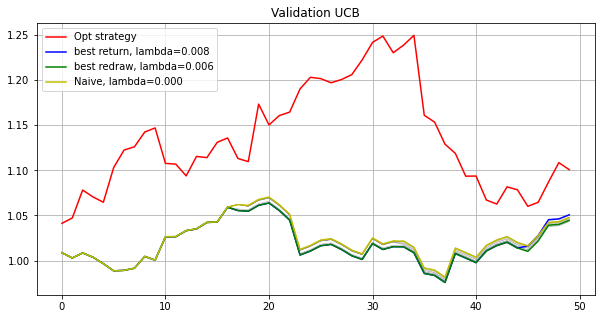

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[ 0.      0.      0.      0.      0.3     0.      0.      0.      0.
  0.2947  0.      0.      0.      0.      0.      0.      0.      0.0937
  0.      0.      0.0116  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.3
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0704
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.   

[ 0.      0.      0.      0.3     0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.1478
  0.      0.     -0.      0.      0.0695 -0.     -0.      0.      0.
  0.      0.      0.1827 -0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.     -0.      0.      0.     -0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.     -0.     -0.      0.
  0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -

[-0.  -0.   0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.
 -0.   0.  -0.  -0.   0.   0.   0.  -0.   0.   0.  -0.  -0.   0.  -0.
 -0.  -0.   0.   0.3 -0.   0.3  0.  -0.   0.  -0.   0.   0.  -0.   0.
 -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
  0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.3 -0.
  0.  -0.  -0.   0.  -0.   0.   0.   0.   0.  -0.  -0.  -0.   0.  -0.
 -0.   0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.1 -0.
  0.   0. ]
[ 0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.      0.     -0.     -0.      0.0027 -0.      0.     -0.
  0.      0.      0.2406 -0.     -0.      0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.0822  0.3     0.      0.     -0.     -0.      0.
  0.      0.     -0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.0746  0.
  0.      0.   

[-0.  -0.   0.  -0.   0.   0.  -0.   0.   0.  -0.   0.  -0.   0.   0.
 -0.   0.  -0.  -0.   0.   0.   0.  -0.   0.   0.  -0.  -0.   0.   0.3
 -0.  -0.  -0.   0.3 -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.
 -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.   0.
  0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.1  0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.
 -0.   0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.
  0.   0. ]
[-0.  -0.   0.  -0.   0.3  0.  -0.   0.   0.   0.1 -0.  -0.   0.   0.
 -0.   0.  -0.  -0.   0.   0.   0.   0.3  0.   0.   0.  -0.   0.  -0.
 -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.
 -0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.
  0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.3 -0.
  0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.
 -0.   0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.
  0.   

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0301
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0699
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.0161
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.

[-0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
  0.0036 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0814  0.      0.015  -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.      0.3     0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.3   0.3   0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.0828 0.3    0.     0.
 0.     0.     0.     0.2254 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0917 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.    -0.    -0.    -0.     0.028 -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.3   -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.     0.3   -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.

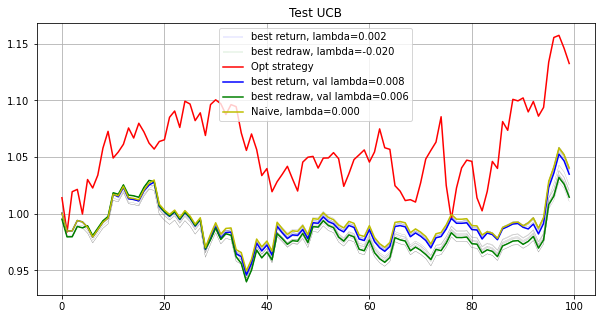

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1284 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0007 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.      0.0631 -0.     -0.     -0.     -0.     -0.
 -0.      0.2455 -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1625 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.     0.     0.3   -0.    -0.     0.     0.    -0.    -0.     0.
 -0.    -0.    -0.    -0.     0.    -0.    -0.    -0.     0.216 -0.
  0.    -0.     

[ 0.1126 -0.      0.172   0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.0433  0.3     0.      0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.      0.3
 -0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.072   0.      0.
  0.      0.      0.      0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.3
  0.     -0.     -0.     -0.     -0.      0.      0.3    -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.  

[ 0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.3  0.
 -0.   0.   0.1  0.   0.  -0.   0.   0.   0.   0.   0.3  0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.  -0.   0.   0.
  0.   0.   0.  -0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
[-0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.
 -0.   0.3  0.  -0.  -0.   0.  -0.   0.1 -0.  -0.   0.   0.  -0.  -0.
 -0.  -0.   0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.3 -0.   0.  -0.
  0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.
  0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.  -0.  -0.
  0.   0

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.      0.      0.0651 -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1373
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0285 -0.     -0.     -0.     -0.     -0.
 -0.      0.1692  0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.     -0.      0.      0.     -0.     -0.     -0.      0.
 -0.      0.      0.      0.      0.     -0.      0.      0.      0.
 -0.      0.     -0.      0.3    -0.     -0.      0.      0.      0.
 -0.      0.     -0.

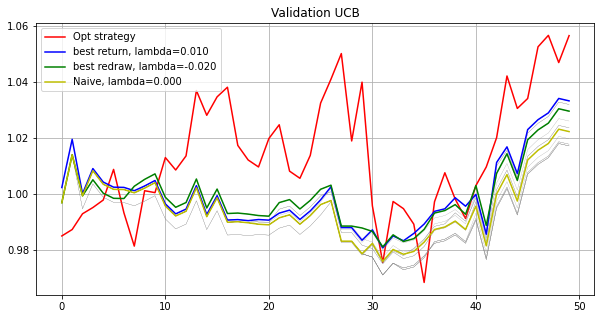

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.2646 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.2799 0.     0.     0.     0.     0.     0.     0.     0.1435 0.
 0.     0.     0.3    0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.012  0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.1897 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.175  0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     

[-0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0077
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0923 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.      0.0522 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.0705 -0.
 -0.      0.      0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2471 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0018 -0.      0.1527 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.1 -0.   0.3  0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.  -0.
 -0.   0.   0.3  0.  -0.   0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.  -0.   0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.
 -0.  -0.  -0.  -0.  

[-0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.   0.
 -0.   0.3  0.3  0.  -0.   0.  -0.   0.1  0.  -0.   0.   0.  -0.  -0.
 -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.
  0.   0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.   0.3 -0.   0.   0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.
  0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.   0.   0.   0.  -0.
  0.   0. ]
[ 0.2374 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.189  -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2736  0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.   

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.0786  0.2381  0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.2603  0.
 -0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.3     0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.123   0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.3    -0.
  0.      0.     -0.    

[-0.     -0.     -0.      0.0777 -0.      0.      0.      0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.      0.      0.3    -0.     -0.      0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.     -0.     -0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0042  0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.2446 -0.      0.0735 -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
[ 0.   0.   0.3  0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.
  0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
 -0.   0.  -0.   0. 

[-0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.
 -0.   0.   0.  -0.  -0.   0.  -0.   0.1 -0.  -0.   0.   0.  -0.  -0.
 -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.3  0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.
  0.   0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.   0.3  0.  -0.   0.   0.  -0.  -0.  -0.   0.3  0.  -0.  -0.  -0.
  0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.   0.  -0.
  0.   0. ]
[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.1418  0.      0.      0.
  0.2073  0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.0509  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.
  0.3     0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.   

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0338 -0.      0.0791 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.      0.0013 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0344 -0.     -0.     -0.
 -0.     -0.      0.2514 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.2421  0.      0.      0.      0.      0.     -0.     -0.      0.
  0.      0.      0.040

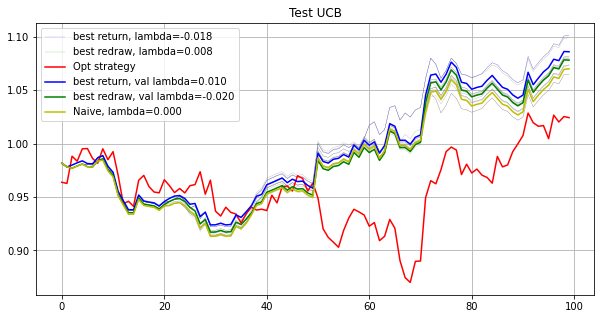

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.2312 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.2947 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0046 0.     0.     0.0745 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.095  0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.  -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.  -0.   0.   0.  -0.   0.  -0.   0.  -0.   0.3  0.  -0.
  0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.  -0.
  0.  -0.   0.   0.  -0.   0.   0. 

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.2595  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.      0.      0.0698
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.3     0.
 -0.      0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.1699  0.      0.      0.1023  0.0985 -0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.      0.1468 -0.     -0.     -0.      0.0443 -0.
 -0.     -0.      0.

[-0.      0.3     0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.0638  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.0362  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.     -0.      0.      0.      0.2272  0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.     -0.      0.
 -0.      0.     -0.    

[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.3  0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.  -0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.1  0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
[ 0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.0392 -0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.3     0.      0.     -0.      0.      0.     -0.
  0.0791 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2818  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.   

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1298 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2748
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2954 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
Opt strategy   Total log return: 0.05149571    Max redraw: 0.05851056
Total return: 1.05284467
Mean return: 1.00103044
UCB strategy
lambda: -0.020   Total log return: 0.04554256    Max redraw: 0.05163812
lambda: -0.018   Total 

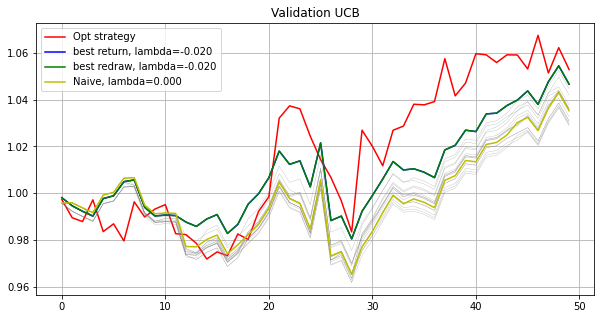

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[-0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.0665 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.0759 -0.     -0.      0.     -0.     -0.     -0.
  0.0238 -0.     -0.      0.      0.2183 -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.1414 -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.0009 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1731 -0.     -0.     -0.
  0.    ]
[ 0.      0.1123  0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.      0.2161 -0.
 -0.     -0.     -0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0415 -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0585 -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.    ]
[-0.      0.     -0.      0.      0.     -0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.3    -0.      0.3     0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.   

[ 0.      0.1565 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.1153  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.1468 -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2814 -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0258  0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.    

[ 0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.     -0.
  0.3    -0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.0041 -0.     -0.      0.      0.     -0.     -0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.0778 -0.
 -0.      0.     -0.      0.1846  0.      0.     -0.     -0.      0.2061
 -0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2274 -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.
  0.3  0.   0.   0.   0.   0.   0.1  0.  -0.   0.   0.   0.   0.  -0.
  0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.   0.  -0.
  0.  -0.   0.   

[ 0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.      0.     -0.      0.3    -0.      0.      0.      0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
  0.      0.      0.2125  0.2566  0.0692  0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.1617 -0.     -0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.    ]
[ 0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.     -0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.0011

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.1282  0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0509 -0.     -0.      0.      0.3    -0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.0179 -0.     -0.     -0.      0.     -0.     -0.      0.203
 -0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.   0.  -0.   0.   0.
  0.  -0.   0.  -0.   0.   0.  -0.   0.  -0.   0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.  -0.
  0.  -0.   0.   0

[-0.     -0.     -0.     -0.     -0.     -0.      0.     -0.      0.
  0.      0.0526 -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.
  0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.
  0.3    -0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.     -0.      0.
  0.     -0.     -0.     -0.      0.0474 -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.      0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.3     0.      0.     -0.      0.      0.     -0.     -0.
  0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
 -0.    ]
[ 0.      0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.    

[ 0.1845  0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.1534 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.      0.1598 -0.      0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.     -0.     -0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.3     0.2023 -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.   0.3  0.   0.   0.  -0.   0.  -0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.
  0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.   0.1 -0.
  0.  -0.   0.3  0.  

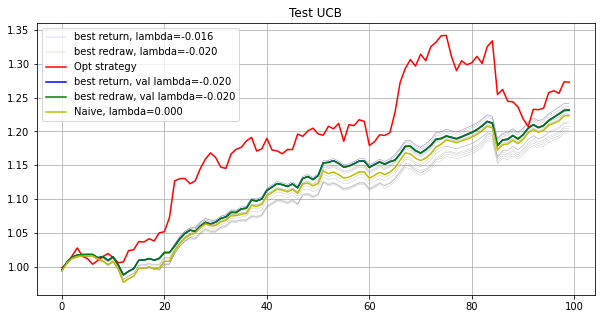

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[-0.  -0.  -0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.3
 -0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.   0.   0.  -0.   0.3 -0.  -0.   0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.
 -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.   0.1  0.3 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0. ]
[ 0.0129  0.     -0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.139   0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.      0.     -0.      0.      0.      0.     -0.     -0.      0.
  0.     -0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.

[-0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.1588  0.0804  0.      0.      0.     -0.     -0.      0.
  0.      0.      0.1101 -0.      0.      0.     -0.     -0.     -0.
 -0.      0.0508 -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.3    -0.      0.      0.     -0.      0.     -0.      0.
  0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.      0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2301 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.1075  0.      0.
  0.      0.      0.      0.0634 -0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.1226  0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.0527  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.3     0.0538  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.3     0.      0.
  0.    ]
[-0.     -0.     -0.     -0.      0.1408 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.146 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.      0.0443  0.0557  0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.3     0.3    -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
[0.     0.     0.     0.     0.     0.0395 0.     0.     0.     0.0448
 0.     0.     0.     0.     0.     0.     0.     0.     0.1735 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.  

[-0.     -0.     -0.     -0.     -0.      0.164  -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0254 -0.     -0.
 -0.      0.3    -0.      0.0375 -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1001 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1358 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0217 -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2155 -0.     -0.
 -0.    ]
[ 0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.1819  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.    

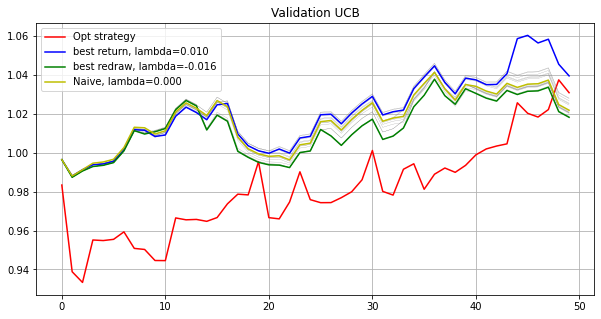

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[ 0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.  -0.   0.   0.   0.1  0.   0.   0.   0.  -0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.
  0.   0. ]
[ 0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.1523 -0.     -0.      0.      0.     -0.      0.
 -0.     -0.     -0.      0.     -0.      0.3    -0.      0.      0.
  0.     -0.      0.3     0.     -0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.2477  0.     -0.      0.     -0.      0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.   

[-0.   0.  -0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.3
  0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.1 -0.   0.  -0.   0.
  0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.
 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.
 -0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.   0.  -0.
 -0.  -0.  -0.  -0.   0.3  0.3 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
  0.  -0. ]
[ 0.1016 -0.     -0.     -0.     -0.      0.091  -0.     -0.     -0.
 -0.     -0.      0.0169 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.      0.1904
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -

[ 0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.2226  0.     -0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.      0.1774
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
  0.3    -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.1468  0.      0.      0.      0.      0.      0.2429  0.      0.
  0.      0.      0.      0.0898  0.      0.      0.      0.     -0.
  0.      0.      0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0818 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.3     0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.075
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.0427 -0.
 -0.     -0.      0.027  -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.1735 -0.      0.      0.      0.     -0.     -0.
  0.      0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0

[ 0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.3    -0.     -0.     -0.      0.0208  0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.177   0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2022 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.  -0.   0.  -0.  -0.   0.  -0.   0.
  0.   0.  -0.   0.   0.   0.3 -0.  -0.  -0.   0.   0.3 -0.  -0.   0.
 -0.  -0.  -0.   0. 

[ 0.0334  0.2826 -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0528 -0.     -0.     -0.      0.0452 -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0292 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1002
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1566 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.0341 -0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.3     0.      0.     -0.      0.      0.     -0.      0.     -0.
  0.     -0.     -0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0141 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3     0.0859 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.2089  0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.2847  0.
  0.     -0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.      0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0336 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0664 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.2352  0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.     -0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.    

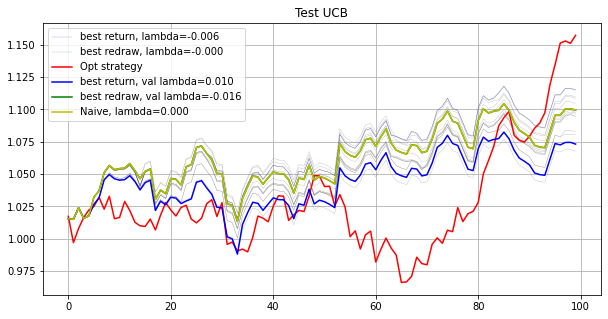

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.      0.1395 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0007
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.      0.3    -0.
  0.2598 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0007 -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.      0.0279 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0729
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.     -0.      0.     -0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.      0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.      0.0124 -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0876 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.     -0.     -0.      0.      0.      0.      0.1337
  0.     -0.      0.      0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0

[ 0.      0.      0.0603  0.      0.     -0.      0.      0.      0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.2176  0.     -0.     -0.      0.      0.      0.      0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.      0.2423
  0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.3     0.     -0.      0.
  0.1799]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.2797 0.     0.     0.     0.     0.
 0.     0.     0.     0.  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.      0.1003 -0.     -0.     -0.
 -0.     -0.     -0.      0.0004 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
Opt strategy   Total log return: 0.09676298    Max redraw: 0.04364695
Total return: 1.10159924
Mean return: 1.00193713
UCB strategy
lambda: -0.020   Total log return: 0.03696350    Max redraw: 0.03625933
lambda: -0.018   Total log 

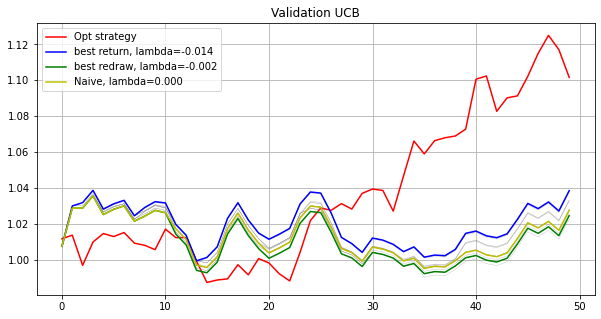

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.1
 -0.   0.  -0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.
  0.   0.3 -0.   0.   0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.  -0.   0.   0.   0.  -0.   0.   0.3  0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.
  0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.3  0.   0.   0.   0.
  0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
[0.     0.     0.     0.0222 0.0047 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.2717
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0854 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.016  0.     0.     0.     0.     0.
 0.     0.     0.     0.

[0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.3   0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.254 0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.3
 0.    0.    0.    0.146]
[-0.   0.  -0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.  -0.
 -0.   0.  -0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.  -0.  -0.   0.  -0.   0.   0.   0.   0.3
  0.   0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.  -0.   0.   0.
  0.  -0.   0.  -0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.
  0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.3  0.   0.   

[ 0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.      0.0548 -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.      0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.2046 -0.     -0.      0.      0.      0.     -0.
  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.1406
 -0.     -0.     -0.     -0.      0.      0.3     0.     -0.      0.
 -0.    ]
[ 0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
  0.281   0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0322 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1416 -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3     0.2262 -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.1706

[ 0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.3  0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.1  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0178 -0.     -0.
 -0.     -0.  

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.0714 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0286 0.     0.     0.     0.3    0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.

[ 0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.1428 -0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.2664  0.3     0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.1495  0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.1413  0.      0.
  0.    ]
[0.     0.     0.1026 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1174 0.     0.     0.     0

[-0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.3  0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.  -0.   0.   0.   0.   0.   0.   0.  -0.   0.  -0.  -0.
 -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.   0.3  0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.
 -0.   0. ]
[ 0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.      0.     -0.     -0.     -0.      0.3
 -0.      0.1179 -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.  

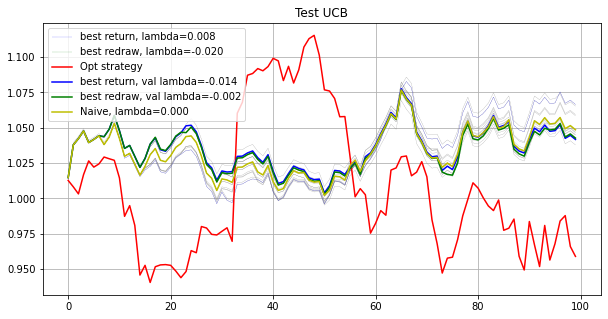

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[-0.  -0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.   0.3  0.  -0.   0.   0.   0.   0.   0.  -0.  -0.
  0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.  -0.   0.  -0.   0.1
  0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.
  0.   0.   0.  -0.   0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.
  0.   0.   0.3  0.   0.   0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.
  0.   0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.   0.
  0.   0. ]
[0.     0.1518 0.     0.     0.     0.     0.2956 0.     0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.151  0.     0.     0.     0.     0.0259
 0.     0.     0.     0.     0.     0.0756 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.  

[ 0.     -0.     -0.      0.3    -0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.     -0.     -0.      0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.      0.3     0.     -0.      0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.3     0.      0.      0.     -0.      0.
 -0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.0834 -0.      0.     -0.      0.      0.      0.0166  0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.    ]
[-0.     -0.     -0.      0.1134 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.    

[-0.      0.2267 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0236
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2964 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1545 -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.2598  0.     -0.
  0.      0.      0.

[ 0.      0.      0.      0.      0.      0.      0.      0.0368  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.1915  0.      0.      0.      0.      0.      0.0286
  0.      0.      0.     -0.      0.      0.3     0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.1938  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.1967  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.0525
  0.    ]
[ 0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.    

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.0899  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0335  0.      0.      0.
  0.      0.259   0.      0.      0.      0.      0.      0.      0.3
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.0176  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3    -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
Opt strategy   Total log return: 0.17475700    Max redraw: 0.08532308
Total return: 1.19095677
Mean return: 1.00350126
UCB strategy
lambda: -0.020   Total log return: 0.04493265    Max redraw: 0.03606477
lambda: -0.018   Total log

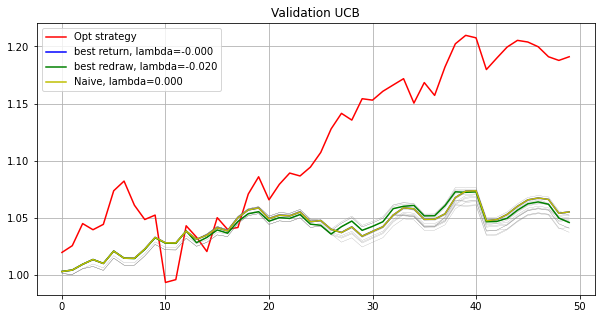

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[ 0.     0.    -0.     0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.     0.3   -0.    -0.    -0.    -0.
  0.202  0.     0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.    -0.    -0.    -0.    -0.     0.    -0.    -0.     0.
 -0.    -0.    -0.    -0.    -0.    -0.     0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.     0.3    0.    -0.    -0.
 -0.    -0.    -0.    -0.     0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.     0.    -0.    -0.    -0.    -0.    -0.     0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.     0.198  0.    -0.    -0.   ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0461 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.   

[ 0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.3    -0.     -0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.2651  0.      0.1034 -0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.2831  0.      0.      0.      0.      0.      0.0483
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.

[ 0.      0.     -0.     -0.     -0.     -0.     -0.      0.1534 -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2839  0.2626  0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.3    -0.      0.     -0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.      0.      0.3     0.      0.1107
  0.     -0.     -0.

[ 0.      0.      0.      0.      0.      0.      0.2501  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.1499  0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.     -0.     -0.      0.
  0.     -0.      0.3     0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.      0.0551 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0213 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.      0.1989 -0.      0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.      0.3     0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.      0.      0.      0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.      0.      0.     -0.      0.2382
  0.2629  0.     -0.     -0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.    ]
[-0.   0.   0.   0.   0.  -0.   0.3  0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.  -0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.  -0.   0.3
  0.   0.   0.  

[0.     0.1283 0.     0.     0.     0.     0.1845 0.     0.     0.
 0.     0.     0.     0.     0.     0.0449 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.3    0.     0.     0.     0.     0.     0.0423 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.     -0.      0.      0.3     0.     -0.      0.1645  0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.0325  0.      0.
  0.     -0.      0.203   0.      0.      0.     -0.      0.     -0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     

[ 0.      0.1758 -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.      0.      0.      0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.      0.3
  0.2242  0.     -0.     -0.     -0.      0.      0.3     0.     -0.
  0.     -0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.    ]
[0.     0.0855 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     

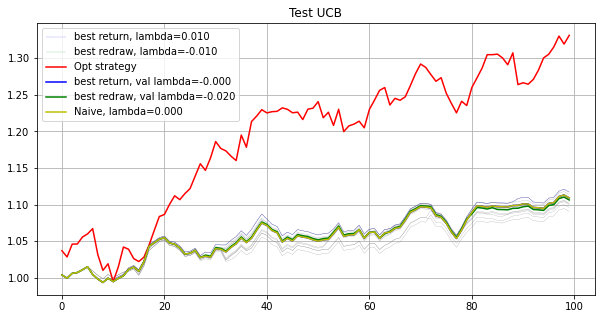

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.      0.0804 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1117 -0.     -0.      0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2079 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.
 -0.   0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.   0.
 -0.  -0.  

[-0.     -0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.3     0.
  0.      0.      0.      0.     -0.     -0.      0.     -0.      0.
  0.     -0.      0.     -0.      0.     -0.      0.0753 -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.0343  0.      0.      0.     -0.      0.     -0.      0.
  0.     -0.     -0.      0.      0.      0.      0.     -0.      0.2904
  0.      0.      0.3    -0.      0.     -0.     -0.      0.     -0.
  0.    ]
[-0.  -0.   0.   0.   0.  -0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.
 -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.   0.
  0.   0.   0.  -0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   

[-0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.
 -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.  -0.  -0.   0.
  0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.  -0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.3  0.  -0.   0.3  0.  -0.   0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.   0.   0.  -0.   0.   0.   0.   0.
 -0.  -0.  -0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.
 -0.   0.  -0.   0.  -0.   0.   0.3  0.   0.1  0.   0.  -0.  -0.   0.
 -0.   0. ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.   0.1 -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.
 -0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.  -0.   0.  -0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.3
 -0.   0.3  0.   0.  -0.   0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.
 -0.   0.  -0.   0.  -0.   0.3  0.  -0.  -0.   0.   0.  -0.  -0.  -0.
 -0.   

[-0.  -0.   0.  -0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.  -0.  -0.   0.   0.3 -0.   0.  -0.   0.   0.3 -0.   0.
  0.   0.   0.  -0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.  -0.   0.  -0.
 -0.   0.  -0.   0.   0.   0.  -0.   0.   0.  -0.   0.  -0.   0.   0.3
 -0.  -0.   0.   0.  -0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.
  0.1  0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.   0.  -0.   0.
 -0.   0. ]
[-0.  -0.   0.1 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.
 -0.   0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.   0.  -0.  -0.  -0.   0.   0.
  0.  -0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.   0.   0.3 -0.   0.  -0.  -0.   0.  -0.   0.   0.
 -0.  -0.  -0.   0.  -0.   0.   0.3 -0.   0.  -0.   0.  -0.   0.  -0.
 -0.   0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.  -0.   0.
 -0.  -

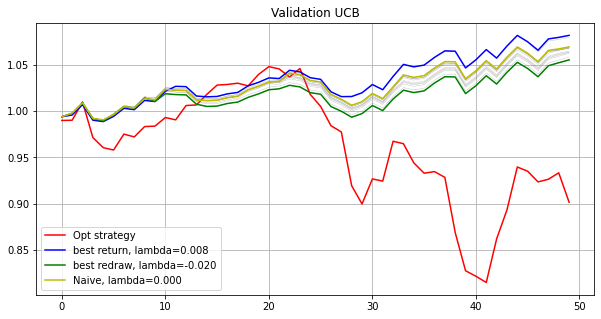

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[-0.     -0.      0.1752 -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.3     0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1799 -0.     -0.     -0.     -0.      0.0449 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.   0.   0.1 

[ 0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.0858  0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.3    -0.      0.      0.      0.
  0.      0.      0.      0.     -0.     -0.      0.      0.      0.0557
  0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.     -0.      0.      0.2342 -0.      0.      0.3    -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.0243  0.      0.      0.      0.      0.     -0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.    ]
[ 0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0386 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.0614  0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3     0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1043 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.247  0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.3    0.     0.153  0.     0.     0.     0.     0.     0.3
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.    -0.     0.     0.     0.     0.     0.   ]
[ 0.      0.      0.      0.      0.0493  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.   

[ 0.      0.      0.      0.      0.2165  0.     -0.      0.      0.
  0.      0.      0.     -0.     -0.     -0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.1835  0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.     -0.      0.3     0.      0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.     -0.      0.      0.
 -0.     -0.      0.     -0.     -0.      0.      0.     -0.      0.
 -0.    ]
[ 0.      0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.      0.    

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.1 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.   0.   0.3  0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.   0.3 -0.   0.  -0.  -0.   0.  -0.  -0.   0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.
 -0.   0.  -0.   0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.
 -0.  -0. ]
[-0.     -0.      0.0844 -0.     -0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.3     0.      0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.0865 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.   

[-0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.
 -0.   0.   0.  -0.  -0.   0.   0.3 -0.   0.  -0.   0.   0.3 -0.  -0.
  0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.  -0.   0.  -0.
 -0.   0.  -0.   0.   0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.
 -0.  -0.   0.   0.  -0.   0.  -0.  -0.   0.   0.1  0.   0.   0.   0.
 -0.   0.  -0.   0.  -0.  -0.   0.   0.   0.   0.   0.  -0.  -0.   0.3
 -0.   0. ]
[ 0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.      0.3    -0.
  0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.2381 -0.      0.      0.      0.      0.
  0.     -0.      0.1619  0.      0.     -0.      0.      0.      0.
 -0.     -0.  

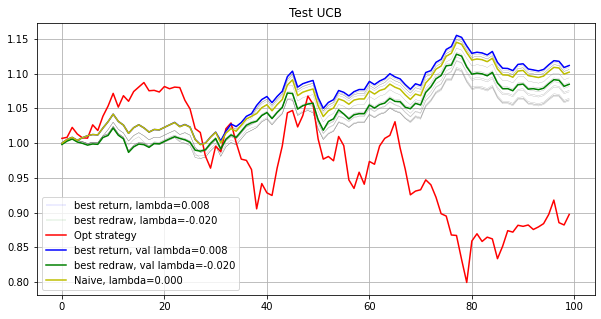

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[ 0.3 -0.   0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.
  0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.1 -0.   0.   0.   0.
  0.   0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.  -0.   0.   0.
 -0.   0.   0.   0.   0.   0.  -0.   0.   0.3  0.  -0.   0.   0.   0.
  0.   0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.  -0.
  0.  -0.   0.   0.   0.   0.   0.  -0.  -0.  -0.   0.   0.  -0.   0.
  0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.3  0.   0.
  0.  -0. ]
[0.2486 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.0949 0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     

[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.0091 -0.
 -0.     -0.      0.3     0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0891
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
  0.0559 -0.     -0.     -0.     -0.     -0.     -0.      0.0129 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.233  -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1283 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.

[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.
  0.   0.3  0.   0.   0.   0.1 -0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.
  0.   0. ]
[ 0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.      0.3     0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.3     0.
  0.1355  0.2645  0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.      0.   

[ 0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.0766  0.     -0.      0.0276  0.      0.0884 -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.      0.2074  0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.    ]
[-0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.   0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.3  0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.  -0.
 -0.   0.   0.  -0.  

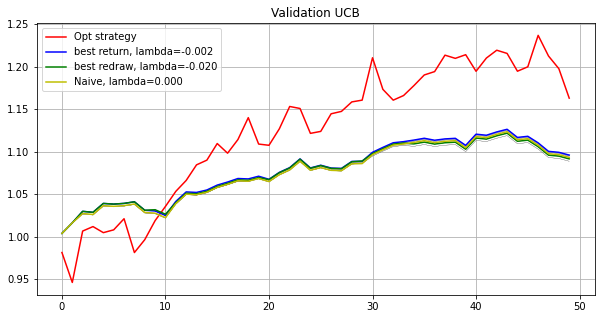

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.2089 0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.1911 0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.233  0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.0646

[-0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1251 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2749
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.0937 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.

[ 0.1 -0.   0.  -0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.  -0.  -0.
  0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.  -0.  -0.   0.   0.
  0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.  -0.   0.   0.  -0.
  0.   0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.   0.   0.  -0.  -0.
  0.  -0.   0.   0.  -0.   0.  -0.  -0.   0.3 -0.   0.   0.  -0.   0.
  0.   0.  -0.   0.   0.  -0.  -0.   0.   0.   0.3 -0.   0.3  0.   0.
  0.  -0. ]
[-0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
  0.3     0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.3    -0.     -0.      0.      0.3     0.
 -0.      0.   

[0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0861 0.     0.1905 0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.1234 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.
  0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.
  0.   0.1  0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.   0.
 -0.   0.  -0.   0.3 -0.  -0.  -0.   0.3  0.  -0.  -0.   0.   0.  -0.
  0.  -0.  -0.  -0.   0.   0.3 -0.  -0.   0. 

[0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.2428 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.1572 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.0594  0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.      0.3     0.
  0.     -0.      0.      0.     -0.     -0.     

[ 0.0348 -0.     -0.     -0.     -0.      0.1595 -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0357
 -0.     -0.     -0.     -0.      0.0336 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.     -0.      0.     -0.      0.1364
 -0.    ]
[ 0.1326 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.    

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.
 -0.   0.   0.3 -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.
  0.  -0.  -0.   0.3 -0.   0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.   0.   0.   0.
  0.  -0. ]
[ 0.3 -0.   0.   0.  -0.  -0.  -0.   0.  -0.   0.   0.   0.  -0.  -0.
  0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.  -0.
  0.   0.   0.  -0.   0.  -0.   0.1  0.   0.   0.   0.   0.   0.   0.
 -0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.3 -0.
  0.   0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.  -0.
  0.  -0.   0.   0.  -0.   0.  -0.  -0.  -0.  -0.   0.   0.3 -0.  -0.
  0.   0.  -0.   0.   0.  -0.  -0.   0.   0.   0.  -0.   0.   0.   0.
  0.  -0

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.   0.
 -0.   0.3  0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.  -0.   0.   0.
 -0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.
  0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.  -0.   0.
 -0.  -0.   0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.  -0.   0.
  0.3  0.  -0.   0.   0.  -0.  -0.   0.   0.   0.  -0.   0.   0.   0.
  0.  -0. ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.0823 0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     

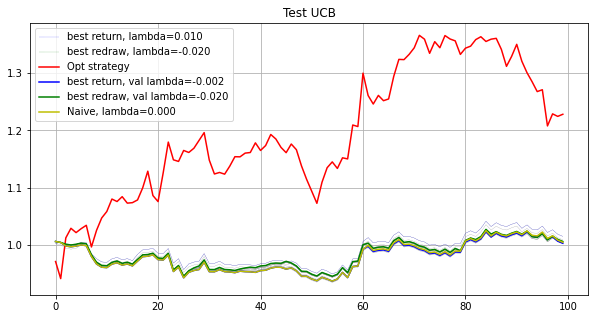

-----------------------------Final result-----------------------------
Opt strategy
Total return: 2.40277901
Mean return: 1.00109638
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


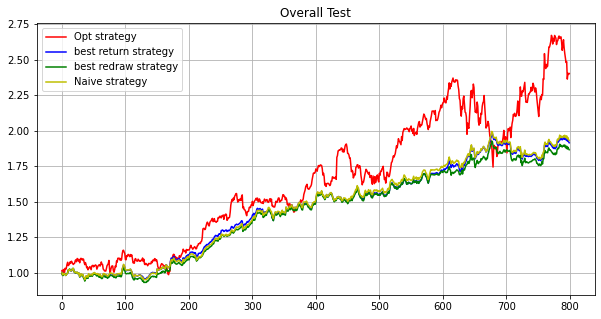

In [10]:
lb = 5
maxiter = 8000
subn = 100
path ='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
gamma=3.0
run(path, maxiter, subn, lb, c=0.0, gamma=gamma, testv=np.arange(-0.02, 0.0100001, 0.002))

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
9.333408455584023e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01

[0.0101 0.0101 0.0099 0.0082 0.0103 0.0103 0.0093 0.0093 0.0104 0.0104
 0.0102 0.0092 0.01   0.0105 0.0099 0.0097 0.0096 0.0104 0.0086 0.0101
 0.0106 0.0066 0.01   0.0099 0.01   0.0102 0.0092 0.011  0.01   0.0098
 0.0098 0.0103 0.0103 0.0108 0.0106 0.0101 0.0098 0.0099 0.0112 0.0099
 0.0103 0.0102 0.0102 0.01   0.0101 0.0102 0.0095 0.0096 0.0104 0.0088
 0.0103 0.01   0.0097 0.0105 0.0106 0.01   0.0102 0.0096 0.0103 0.0111
 0.0091 0.0094 0.01   0.0103 0.0097 0.0105 0.0104 0.0102 0.0103 0.0097
 0.01   0.0101 0.0105 0.01   0.01   0.0101 0.0108 0.0098 0.01   0.0104
 0.01   0.0098 0.0103 0.01   0.0101 0.0101 0.0101 0.0092 0.0101 0.0102
 0.0108 0.0101 0.0103 0.0099 0.0099 0.01   0.0104 0.0088 0.0101 0.0105]
2.2449190255520446e-07
[0.0101 0.0101 0.0099 0.0082 0.0103 0.0103 0.0093 0.0093 0.0104 0.0104
 0.0102 0.0092 0.01   0.0105 0.0099 0.0097 0.0096 0.0104 0.0086 0.0101
 0.0106 0.0066 0.01   0.0099 0.01   0.0102 0.0092 0.011  0.01   0.0098
 0.0098 0.0103 0.0103 0.0108 0.0106 0.0101 0.0098 0.0

[0.01   0.0101 0.0099 0.0082 0.0103 0.0103 0.0093 0.0093 0.0104 0.0104
 0.0102 0.0093 0.01   0.0105 0.0099 0.0097 0.0096 0.0104 0.0087 0.0101
 0.0106 0.0065 0.01   0.0099 0.01   0.0102 0.0092 0.011  0.01   0.0098
 0.0098 0.0103 0.0103 0.0108 0.0106 0.0101 0.0098 0.0099 0.0112 0.0099
 0.0102 0.0102 0.0102 0.01   0.0101 0.0102 0.0095 0.0096 0.0104 0.0088
 0.0103 0.01   0.0097 0.0105 0.0107 0.01   0.0102 0.0096 0.0103 0.0111
 0.0091 0.0094 0.01   0.0103 0.0097 0.0105 0.0104 0.0101 0.0103 0.0098
 0.01   0.0101 0.0105 0.01   0.01   0.0101 0.0108 0.0098 0.01   0.0105
 0.01   0.0099 0.0103 0.01   0.0101 0.0101 0.0101 0.0092 0.0101 0.0102
 0.0108 0.0101 0.0104 0.0099 0.0098 0.01   0.0104 0.0088 0.0101 0.0105]
0.0009281555504102226
[0.01   0.0101 0.0099 0.0082 0.0103 0.0103 0.0093 0.0093 0.0104 0.0104
 0.0102 0.0093 0.01   0.0105 0.0099 0.0097 0.0096 0.0104 0.0086 0.0101
 0.0106 0.0065 0.01   0.0099 0.01   0.0102 0.0092 0.011  0.01   0.0098
 0.0098 0.0103 0.0103 0.0108 0.0106 0.0101 0.0098 0.00

[0.01   0.0102 0.0097 0.0082 0.0098 0.0112 0.0085 0.0103 0.0119 0.01
 0.0103 0.0085 0.0096 0.0107 0.0108 0.0099 0.0083 0.0101 0.0057 0.0095
 0.0103 0.0054 0.0075 0.011  0.0109 0.0105 0.0079 0.0086 0.0106 0.0097
 0.0079 0.0112 0.0111 0.0099 0.0098 0.01   0.0091 0.0107 0.0112 0.0097
 0.0107 0.0106 0.0116 0.0101 0.0102 0.0094 0.0114 0.0079 0.0115 0.0075
 0.0112 0.0107 0.0104 0.0101 0.0112 0.0105 0.0109 0.0092 0.0068 0.008
 0.0062 0.0099 0.012  0.0102 0.009  0.0129 0.0098 0.0105 0.0108 0.0101
 0.0109 0.0103 0.0121 0.01   0.0105 0.0105 0.0103 0.0097 0.0102 0.0113
 0.0092 0.0099 0.0116 0.0103 0.0102 0.0103 0.0102 0.0085 0.0103 0.0095
 0.0099 0.0103 0.0108 0.0107 0.0108 0.0099 0.0115 0.0107 0.0102 0.0115]
8.299751512507673e-05
[0.01   0.0102 0.0097 0.0082 0.0098 0.0112 0.0085 0.0103 0.0119 0.01
 0.0103 0.0085 0.0096 0.0107 0.0108 0.0099 0.0083 0.0101 0.0057 0.0095
 0.0103 0.0054 0.0075 0.011  0.0109 0.0105 0.0079 0.0086 0.0106 0.0097
 0.0079 0.0112 0.0111 0.0099 0.0098 0.01   0.0091 0.0107 0.

[0.0103 0.0106 0.0095 0.     0.0084 0.013  0.0066 0.0113 0.011  0.0077
 0.0116 0.0096 0.0097 0.0104 0.0092 0.008  0.0069 0.0105 0.0015 0.0081
 0.0106 0.0123 0.005  0.0059 0.0122 0.0116 0.0078 0.0096 0.0108 0.0084
 0.0068 0.0108 0.0127 0.0076 0.0065 0.0113 0.008  0.0117 0.01   0.0091
 0.0128 0.0084 0.011  0.0072 0.0107 0.0095 0.0161 0.0079 0.0101 0.0021
 0.0132 0.0107 0.0093 0.0091 0.0124 0.0076 0.0114 0.0098 0.0058 0.0091
 0.006  0.0089 0.0132 0.0087 0.0085 0.0148 0.0081 0.0124 0.0114 0.0106
 0.0129 0.0109 0.0141 0.0103 0.0105 0.0099 0.0099 0.01   0.0106 0.0139
 0.0103 0.0097 0.0139 0.0095 0.0134 0.0109 0.011  0.0087 0.0114 0.0102
 0.0101 0.011  0.0124 0.0123 0.0114 0.011  0.0138 0.0122 0.0109 0.0136]
3.796189848522954e-08
Opt strategy   Total log return: 0.05731206    Max redraw: 0.05443662
Total return: 1.05898623
Mean return: 1.00114690
UCB strategy
lambda: -0.020   Total log return: 0.04566691    Max redraw: 0.06332431
lambda: -0.018   Total log return: 0.04399445    Max redraw: 0.

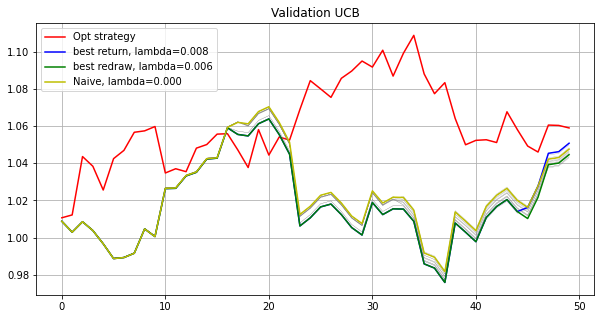

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[0.01   0.0101 0.0096 0.0093 0.0109 0.0107 0.0095 0.009  0.0095 0.0089
 0.0103 0.0086 0.01   0.0104 0.0104 0.0097 0.009  0.0102 0.0088 0.0106
 0.0092 0.0065 0.0097 0.0093 0.0095 0.0104 0.0095 0.0134 0.0109 0.0103
 0.0093 0.0103 0.0104 0.011  0.0096 0.0103 0.0096 0.0108 0.0107 0.0101
 0.0108 0.0105 0.0098 0.0088 0.0107 0.0098 0.0091 0.0098 0.0103 0.0097
 0.0107 0.01   0.0099 0.0108 0.0108 0.01   0.0102 0.0096 0.0102 0.0111
 0.0086 0.0095 0.01   0.0103 0.0097 0.0102 0.0107 0.0097 0.0112 0.0099
 0.0102 0.0097 0.0106 0.0101 0.0099 0.0103 0.0103 0.0101 0.01   0.0109
 0.0098 0.0099 0.0104 0.0093 0.0101 0.0101 0.0103 0.0091 0.01   0.0106
 0.01   0.0105 0.0104 0.01   0.0097 0.0101 0.0106 0.0081 0.01   0.0102]
5.072904986544533e-05
[0.01   0.0101 0.0096 0.0093 0.0109 0.0107 0.0095 0.009  0.0095 0.0089
 0.0103 0.0086 0.01   0.0104 0.0104 0.0097 0.009  0.0102 0.0088 0.0106
 0.0092 0.0065 0.0097 0.0093 0.0095 0.0104 0.0095 0.0134 0.0109 0.0103
 0.0093 0.0103 0.0104 0.011  0.0096 0.0103 0.0096 0.01

[0.01   0.01   0.0096 0.0093 0.0109 0.0108 0.0095 0.009  0.0095 0.0089
 0.0103 0.0086 0.01   0.0105 0.0104 0.0097 0.009  0.0102 0.0088 0.0106
 0.0092 0.0065 0.0097 0.0093 0.0095 0.0104 0.0095 0.0134 0.0109 0.0103
 0.0093 0.0103 0.0104 0.011  0.0096 0.0103 0.0096 0.0108 0.0107 0.0101
 0.0108 0.0105 0.0098 0.0088 0.0106 0.0098 0.0091 0.0098 0.0103 0.0097
 0.0107 0.01   0.0099 0.0108 0.0108 0.01   0.0102 0.0096 0.0102 0.0111
 0.0086 0.0095 0.01   0.0103 0.0097 0.0102 0.0107 0.0097 0.0112 0.0099
 0.0102 0.0097 0.0106 0.0101 0.0099 0.0103 0.0103 0.0101 0.01   0.0109
 0.0098 0.0099 0.0104 0.0092 0.0101 0.0101 0.0103 0.0091 0.01   0.0106
 0.0099 0.0105 0.0104 0.01   0.0097 0.0101 0.0106 0.0081 0.01   0.0102]
5.536802013357805e-05
[0.01   0.01   0.0096 0.0093 0.0109 0.0108 0.0095 0.009  0.0095 0.0089
 0.0103 0.0086 0.01   0.0105 0.0104 0.0097 0.009  0.0102 0.0088 0.0106
 0.0092 0.0065 0.0097 0.0093 0.0095 0.0104 0.0095 0.0134 0.0109 0.0103
 0.0093 0.0103 0.0104 0.011  0.0096 0.0103 0.0096 0.01

[0.0104 0.0104 0.009  0.008  0.0082 0.01   0.0099 0.0121 0.0114 0.0055
 0.0098 0.0064 0.0101 0.0103 0.0101 0.0075 0.0065 0.011  0.0065 0.0102
 0.0067 0.004  0.0064 0.0077 0.0084 0.0118 0.0096 0.0121 0.0097 0.0114
 0.0111 0.0151 0.012  0.0147 0.0064 0.011  0.0094 0.0096 0.0112 0.0106
 0.0125 0.0119 0.0114 0.0081 0.0061 0.0105 0.0083 0.0065 0.0099 0.0086
 0.0126 0.0134 0.0081 0.0105 0.0124 0.0079 0.0109 0.0099 0.0095 0.0117
 0.0064 0.0072 0.0104 0.0094 0.0068 0.0124 0.0111 0.0099 0.0138 0.0125
 0.0118 0.008  0.0104 0.0113 0.0098 0.0115 0.0113 0.0103 0.0102 0.0113
 0.0099 0.0096 0.0126 0.0069 0.0109 0.0108 0.011  0.0088 0.0114 0.0115
 0.0113 0.0122 0.0123 0.0107 0.0095 0.0106 0.0163 0.0031 0.0107 0.0111]
1.4218177217723872e-06
[0.0104 0.0104 0.009  0.008  0.0082 0.01   0.0099 0.0121 0.0114 0.0055
 0.0098 0.0064 0.0101 0.0103 0.0101 0.0075 0.0065 0.011  0.0065 0.0102
 0.0067 0.004  0.0064 0.0077 0.0084 0.0118 0.0096 0.0121 0.0097 0.0114
 0.0111 0.0151 0.012  0.0147 0.0064 0.011  0.0094 0.0

[0.0104 0.0104 0.009  0.008  0.0082 0.01   0.0099 0.0121 0.0114 0.0055
 0.0098 0.0064 0.0101 0.0103 0.0101 0.0075 0.0065 0.011  0.0065 0.0102
 0.0067 0.004  0.0064 0.0077 0.0084 0.0118 0.0097 0.0121 0.0097 0.0114
 0.0111 0.0152 0.012  0.0147 0.0064 0.011  0.0094 0.0096 0.0112 0.0106
 0.0125 0.0119 0.0114 0.0081 0.0061 0.0105 0.0083 0.0065 0.0099 0.0086
 0.0126 0.0134 0.0081 0.0105 0.0124 0.0079 0.0109 0.0099 0.0095 0.0117
 0.0064 0.0072 0.0104 0.0094 0.0068 0.0124 0.0111 0.0099 0.0138 0.0125
 0.0118 0.008  0.0104 0.0113 0.0098 0.0115 0.0113 0.0103 0.0102 0.0113
 0.0099 0.0096 0.0126 0.0069 0.0109 0.0108 0.011  0.0088 0.0114 0.0115
 0.0113 0.0122 0.0123 0.0107 0.0095 0.0106 0.0163 0.0031 0.0107 0.0111]
4.62663866827211e-06
[0.0104 0.0104 0.009  0.008  0.0082 0.01   0.0099 0.0121 0.0114 0.0055
 0.0098 0.0064 0.0101 0.0103 0.0101 0.0075 0.0065 0.011  0.0065 0.0102
 0.0067 0.004  0.0064 0.0077 0.0084 0.0118 0.0097 0.0121 0.0097 0.0114
 0.0111 0.0152 0.012  0.0147 0.0064 0.011  0.0094 0.009

[0.0104 0.0104 0.009  0.008  0.0082 0.01   0.0099 0.0121 0.0114 0.0055
 0.0098 0.0064 0.0101 0.0103 0.0101 0.0075 0.0065 0.011  0.0065 0.0102
 0.0067 0.004  0.0064 0.0077 0.0084 0.0118 0.0097 0.0121 0.0097 0.0114
 0.0111 0.0152 0.012  0.0147 0.0064 0.011  0.0094 0.0096 0.0112 0.0106
 0.0125 0.0119 0.0114 0.0081 0.0061 0.0105 0.0083 0.0065 0.01   0.0086
 0.0126 0.0134 0.0081 0.0105 0.0124 0.0079 0.0109 0.0099 0.0095 0.0117
 0.0064 0.0072 0.0104 0.0094 0.0068 0.0124 0.0111 0.0099 0.0138 0.0125
 0.0118 0.008  0.0104 0.0113 0.0098 0.0115 0.0113 0.0103 0.0102 0.0113
 0.0099 0.0096 0.0126 0.0069 0.0109 0.0108 0.011  0.0088 0.0114 0.0115
 0.0113 0.0123 0.0123 0.0107 0.0095 0.0106 0.0163 0.0031 0.0107 0.0111]
5.968007306400569e-08
[0.0104 0.0104 0.009  0.008  0.0082 0.01   0.0099 0.0121 0.0114 0.0055
 0.0098 0.0064 0.0101 0.0103 0.0101 0.0075 0.0065 0.011  0.0065 0.0102
 0.0067 0.004  0.0064 0.0077 0.0084 0.0118 0.0097 0.0121 0.0097 0.0114
 0.0111 0.0152 0.012  0.0147 0.0064 0.011  0.0094 0.00

[0.0104 0.0104 0.009  0.008  0.0082 0.01   0.0099 0.0121 0.0114 0.0056
 0.0098 0.0064 0.0101 0.0103 0.0101 0.0075 0.0065 0.011  0.0065 0.0102
 0.0067 0.004  0.0064 0.0077 0.0084 0.0118 0.0097 0.0121 0.0097 0.0114
 0.0111 0.0152 0.012  0.0147 0.0064 0.011  0.0094 0.0096 0.0112 0.0106
 0.0125 0.0119 0.0114 0.0081 0.0061 0.0105 0.0083 0.0065 0.0099 0.0086
 0.0126 0.0134 0.0081 0.0105 0.0124 0.0079 0.0109 0.0099 0.0095 0.0117
 0.0064 0.0072 0.0104 0.0094 0.0068 0.0124 0.0111 0.0099 0.0138 0.0125
 0.0118 0.008  0.0104 0.0113 0.0098 0.0115 0.0113 0.0103 0.0102 0.0113
 0.0099 0.0096 0.0126 0.0069 0.0109 0.0108 0.011  0.0088 0.0114 0.0115
 0.0113 0.0123 0.0123 0.0107 0.0095 0.0106 0.0163 0.0031 0.0107 0.0111]
2.7945222932221434e-05
[0.0104 0.0104 0.009  0.008  0.0082 0.01   0.0099 0.0121 0.0114 0.0056
 0.0098 0.0064 0.0101 0.0103 0.0101 0.0075 0.0065 0.011  0.0065 0.0102
 0.0067 0.004  0.0064 0.0077 0.0084 0.0118 0.0097 0.0121 0.0097 0.0114
 0.0111 0.0152 0.012  0.0147 0.0064 0.011  0.0094 0.0

[ 0.0114  0.0108  0.008   0.0046  0.0037  0.0127  0.0099  0.0114  0.0125
 -0.      0.0107  0.0068  0.0099  0.0095  0.0088  0.0046  0.0035  0.0141
  0.0032  0.0086  0.0113  0.0048  0.006   0.0044  0.0095  0.0133  0.0074
  0.0131  0.0105  0.0106  0.0088  0.0136  0.0142  0.0159  0.0044  0.013
  0.0076  0.0091  0.0112  0.0084  0.0133  0.0115  0.0113  0.0061  0.0072
  0.0108  0.0087  0.0056  0.0085  0.0065  0.0153  0.0137  0.0065  0.0121
  0.0149  0.0063  0.0117  0.0101  0.0076  0.0116  0.0052  0.0074  0.0113
  0.008   0.0045  0.0121  0.0105  0.0107  0.016   0.0129  0.0135  0.0073
  0.0115  0.0121  0.0099  0.0118  0.0131  0.0105  0.0109  0.0137  0.0122
  0.0094  0.0145  0.0067  0.0116  0.0116  0.0114  0.0057  0.0139  0.0116
  0.0119  0.0142  0.0144  0.0125  0.0094  0.0113  0.0203  0.0004  0.0105
  0.0128]
5.5884512729790736e-05
[ 0.0114  0.0108  0.008   0.0046  0.0037  0.0127  0.0099  0.0114  0.0125
 -0.      0.0107  0.0068  0.0099  0.0095  0.0088  0.0046  0.0035  0.0141
  0.0032  0.0086  0

[0.0116 0.0109 0.0078 0.004  0.0033 0.0131 0.0108 0.0121 0.0124 0.0005
 0.0108 0.0067 0.0098 0.0092 0.0085 0.0047 0.0026 0.0145 0.0025 0.0084
 0.0116 0.0058 0.0072 0.0036 0.0095 0.0136 0.0076 0.0123 0.01   0.0096
 0.009  0.0128 0.0145 0.0159 0.0043 0.0132 0.0073 0.0086 0.0111 0.0085
 0.0136 0.0111 0.0113 0.0061 0.0077 0.0108 0.0088 0.0063 0.008  0.0085
 0.0157 0.0137 0.0058 0.0117 0.015  0.0057 0.0117 0.0101 0.0062 0.0108
 0.005  0.0069 0.0117 0.0083 0.0046 0.0127 0.0103 0.0111 0.0156 0.0132
 0.0139 0.007  0.0107 0.0122 0.0098 0.0117 0.0134 0.0104 0.0108 0.0135
 0.0124 0.0094 0.0147 0.0066 0.0113 0.0117 0.0113 0.006  0.0142 0.0119
 0.0117 0.0142 0.0147 0.0128 0.0092 0.0113 0.0207 0.0008 0.0105 0.013 ]
7.437334101909662e-08
[0.0116 0.0109 0.0078 0.004  0.0033 0.0131 0.0108 0.0121 0.0124 0.0005
 0.0108 0.0067 0.0098 0.0092 0.0085 0.0047 0.0026 0.0145 0.0025 0.0084
 0.0116 0.0058 0.0072 0.0036 0.0095 0.0136 0.0076 0.0123 0.01   0.0096
 0.009  0.0128 0.0145 0.0159 0.0043 0.0132 0.0073 0.00

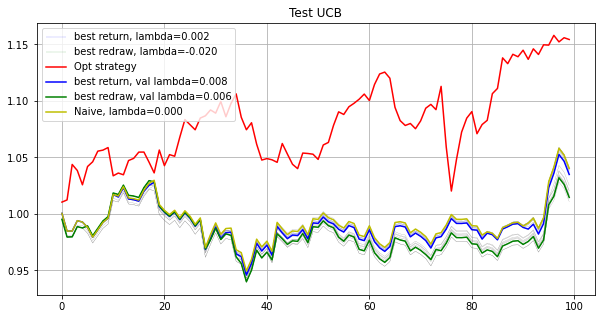

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
9.53558453274661e-08
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 

[0.0068 0.0129 0.0113 0.005  0.0096 0.0119 0.0094 0.0152 0.0075 0.0074
 0.0054 0.0088 0.0084 0.0087 0.0086 0.0058 0.0018 0.0036 0.0136 0.0097
 0.0093 0.0163 0.0111 0.0056 0.0125 0.0094 0.0094 0.013  0.0087 0.0013
 0.0063 0.0093 0.0107 0.01   0.0097 0.0076 0.0049 0.0089 0.0107 0.0066
 0.0189 0.0132 0.0114 0.0128 0.0028 0.0097 0.007  0.0067 0.0097 0.0096
 0.0109 0.0061 0.0143 0.0145 0.0094 0.0047 0.01   0.0116 0.012  0.0024
 0.0095 0.0123 0.0061 0.0046 0.014  0.0099 0.0066 0.0098 0.0162 0.0071
 0.0111 0.0152 0.0177 0.0112 0.0098 0.0118 0.0121 0.0138 0.0134 0.0056
 0.0105 0.0125 0.0143 0.0137 0.0169 0.0126 0.0108 0.0125 0.0067 0.0099
 0.0108 0.0093 0.0135 0.0111 0.0095 0.009  0.0143 0.013  0.0143 0.0067]
0.025149654466180463
[0.0068 0.0129 0.0113 0.005  0.0096 0.0119 0.0094 0.0152 0.0075 0.0074
 0.0054 0.0088 0.0084 0.0087 0.0086 0.0058 0.0018 0.0036 0.0136 0.0097
 0.0093 0.0163 0.0111 0.0056 0.0125 0.0094 0.0094 0.013  0.0087 0.0013
 0.0063 0.0093 0.0107 0.01   0.0097 0.0076 0.0049 0.008

[0.0068 0.0129 0.0113 0.005  0.0096 0.0119 0.0094 0.0152 0.0075 0.0074
 0.0054 0.0088 0.0084 0.0087 0.0086 0.0058 0.0018 0.0036 0.0136 0.0097
 0.0093 0.0163 0.0111 0.0056 0.0125 0.0094 0.0094 0.013  0.0087 0.0013
 0.0063 0.0093 0.0107 0.01   0.0097 0.0076 0.0049 0.0089 0.0107 0.0066
 0.0189 0.0132 0.0114 0.0128 0.0028 0.0097 0.007  0.0067 0.0097 0.0096
 0.0109 0.0061 0.0143 0.0145 0.0094 0.0047 0.01   0.0116 0.012  0.0024
 0.0095 0.0123 0.0061 0.0046 0.014  0.0099 0.0066 0.0098 0.0162 0.0071
 0.0111 0.0152 0.0177 0.0112 0.0098 0.0118 0.0121 0.0138 0.0134 0.0056
 0.0105 0.0125 0.0143 0.0137 0.0169 0.0126 0.0108 0.0125 0.0067 0.0099
 0.0108 0.0093 0.0135 0.0111 0.0095 0.009  0.0143 0.013  0.0143 0.0067]
3.7811996737445626e-07
[0.0005 0.0136 0.011  0.0098 0.0097 0.012  0.0088 0.0154 0.007  0.0061
 0.0051 0.0085 0.0093 0.0092 0.0083 0.0039 0.0007 0.0006 0.0134 0.0093
 0.0093 0.0162 0.0115 0.0032 0.0132 0.0088 0.0094 0.0139 0.0083 0.0003
 0.0055 0.0071 0.0109 0.0087 0.0089 0.0073 0.0052 0.0

[-0.      0.0148  0.0063  0.0073  0.0095  0.0129  0.0086  0.0163  0.0041
  0.0042  0.0007  0.0079  0.0084  0.0077  0.0042  0.0098  0.0001  0.0002
  0.0124  0.0082  0.0116  0.0194  0.0118  0.0044  0.0123  0.0079  0.0095
  0.0139  0.0075  0.      0.0059  0.0109  0.0095  0.0081  0.009   0.0069
  0.0017  0.0088  0.0135  0.0053  0.0207  0.0122  0.0122  0.0131  0.0019
  0.0122  0.0041  0.0058  0.011   0.0056  0.0112  0.0051  0.0163  0.0138
  0.0096  0.0034  0.0087  0.011   0.0119  0.0031  0.0095  0.0157  0.0048
  0.0067  0.0137  0.0107  0.0087  0.0105  0.0196  0.007   0.0116  0.0192
  0.0185  0.0076  0.01    0.0114  0.0142  0.0162  0.0157  0.0051  0.0095
  0.0146  0.0191  0.016   0.0212  0.0142  0.0104  0.0139  0.0062  0.0107
  0.012   0.0087  0.0158  0.0109  0.0096  0.0077  0.0115  0.0149  0.0161
  0.0061]
1.1925080575989855e-05
[ 0.      0.0149  0.0063  0.0073  0.0095  0.0129  0.0085  0.0163  0.0041
  0.0042  0.0006  0.0079  0.0084  0.0077  0.0042  0.0098  0.0001  0.0002
  0.0124  0.0082  

[ 0.      0.0155  0.0045  0.0058  0.0089  0.013   0.0086  0.0181 -0.
  0.0035  0.0001  0.0075  0.0064  0.008   0.0059  0.0095  0.      0.
  0.0105  0.0073  0.0111  0.0212  0.0122  0.0059  0.0111  0.0072  0.0093
  0.0123  0.0071  0.      0.0046  0.0114  0.0095  0.007   0.0099  0.0087
  0.0012  0.0075  0.0142  0.0034  0.0198  0.0125  0.0126  0.014   0.0002
  0.0127  0.0037  0.0076  0.0098  0.0057  0.0114  0.0042  0.0169  0.0127
  0.0097  0.0034  0.0085  0.0117  0.0087  0.0036  0.0095  0.0158  0.0055
  0.0066  0.016   0.0108  0.0084  0.011   0.0215  0.0068  0.0121  0.0194
  0.0189  0.0098  0.0101  0.0119  0.0145  0.0169  0.0168  0.006   0.0079
  0.0152  0.0192  0.0173  0.0224  0.015   0.0101  0.0141  0.0063  0.0107
  0.0125  0.0081  0.0165  0.0102  0.0095  0.0071  0.0117  0.0155  0.0176
  0.0074]
6.309764360696123e-05
[ 0.      0.0155  0.0045  0.0058  0.0089  0.013   0.0086  0.0181 -0.
  0.0035  0.0001  0.0075  0.0064  0.008   0.0059  0.0095  0.     -0.
  0.0105  0.0073  0.0111  0.0212  0

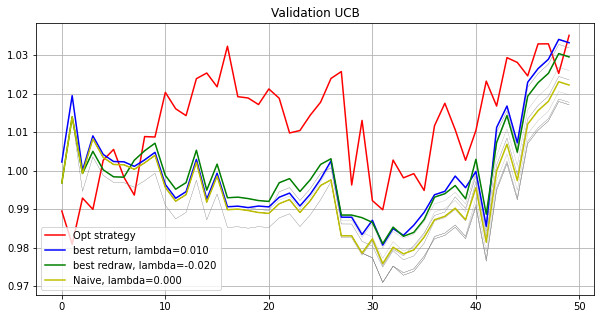

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[0.0072 0.0111 0.0057 0.0062 0.0098 0.0129 0.0091 0.0099 0.0047 0.0091
 0.0054 0.0092 0.0119 0.0109 0.0134 0.0106 0.0095 0.0121 0.0113 0.0091
 0.0096 0.0098 0.0105 0.012  0.0111 0.0106 0.0097 0.0086 0.0096 0.0089
 0.0096 0.0063 0.0086 0.0102 0.0108 0.0086 0.009  0.0097 0.0103 0.0085
 0.0135 0.0111 0.0107 0.0116 0.009  0.0111 0.0075 0.01   0.0129 0.0061
 0.0097 0.0112 0.0152 0.0131 0.0105 0.0081 0.009  0.0103 0.0062 0.0069
 0.0108 0.0116 0.0092 0.008  0.0115 0.0108 0.0108 0.0122 0.0122 0.0092
 0.0091 0.0144 0.0092 0.0091 0.0094 0.0102 0.0106 0.0132 0.0109 0.0076
 0.0104 0.0104 0.0093 0.0127 0.012  0.011  0.0087 0.0103 0.0085 0.0097
 0.0109 0.0082 0.0113 0.0102 0.0104 0.0094 0.0115 0.0111 0.0112 0.0085]
7.363597708557809e-07
[0.0072 0.0111 0.0057 0.0062 0.0098 0.0129 0.0091 0.0099 0.0047 0.0091
 0.0054 0.0092 0.0119 0.0109 0.0134 0.0106 0.0095 0.0121 0.0113 0.0091
 0.0096 0.0098 0.0105 0.012  0.0111 0.0106 0.0097 0.0086 0.0096 0.0089
 0.0096 0.0063 0.0086 0.0102 0.0108 0.0086 0.009  0.00

[0.005  0.0115 0.0039 0.0064 0.0097 0.0123 0.009  0.0099 0.0042 0.0083
 0.004  0.0088 0.0126 0.01   0.0123 0.0116 0.0088 0.0116 0.012  0.0087
 0.01   0.0101 0.0107 0.012  0.0113 0.0102 0.0103 0.0092 0.0093 0.0085
 0.0089 0.0056 0.008  0.0106 0.0112 0.0095 0.0079 0.0099 0.011  0.0075
 0.0151 0.0105 0.0108 0.0122 0.0074 0.0115 0.0067 0.0108 0.0129 0.0055
 0.0097 0.0116 0.0161 0.0138 0.0111 0.0077 0.0087 0.0108 0.0071 0.0054
 0.0111 0.0122 0.0091 0.0073 0.0126 0.0105 0.0109 0.0131 0.0129 0.0091
 0.0092 0.0141 0.0091 0.0087 0.0094 0.0101 0.011  0.0128 0.0113 0.0072
 0.0103 0.0106 0.0101 0.0133 0.0128 0.0113 0.0088 0.0111 0.0083 0.0098
 0.0116 0.0074 0.0117 0.0102 0.0105 0.0093 0.0126 0.0115 0.0116 0.008 ]
2.3226079595142432e-07
[0.005  0.0115 0.0039 0.0064 0.0097 0.0123 0.009  0.0099 0.0042 0.0083
 0.004  0.0088 0.0126 0.01   0.0123 0.0116 0.0088 0.0116 0.012  0.0087
 0.01   0.0101 0.0107 0.012  0.0113 0.0102 0.0103 0.0092 0.0093 0.0085
 0.0089 0.0056 0.008  0.0106 0.0112 0.0095 0.0079 0.0

[0.0047 0.0115 0.0036 0.006  0.0097 0.0121 0.0089 0.01   0.0044 0.0082
 0.0039 0.0088 0.0127 0.0098 0.0122 0.0117 0.009  0.0113 0.0121 0.0086
 0.0102 0.0101 0.0107 0.0122 0.0113 0.0101 0.0105 0.0092 0.0093 0.0084
 0.0088 0.0057 0.0078 0.0105 0.0112 0.0095 0.0076 0.01   0.0109 0.0073
 0.0149 0.0102 0.0108 0.012  0.0075 0.0116 0.0067 0.0108 0.013  0.0055
 0.0097 0.0115 0.0163 0.014  0.0111 0.0079 0.0086 0.0108 0.0069 0.0054
 0.0112 0.0122 0.0091 0.0075 0.0128 0.0106 0.011  0.0131 0.013  0.0092
 0.0092 0.0144 0.009  0.0088 0.0094 0.0101 0.011  0.013  0.0113 0.007
 0.0103 0.0106 0.0102 0.0133 0.0128 0.0113 0.0088 0.0111 0.0083 0.0098
 0.0117 0.0075 0.0118 0.0103 0.0105 0.0093 0.0125 0.0116 0.0116 0.0081]
9.689407743326307e-07
[0.0047 0.0115 0.0036 0.006  0.0097 0.0121 0.0089 0.01   0.0044 0.0082
 0.0039 0.0088 0.0127 0.0098 0.0122 0.0117 0.009  0.0113 0.0121 0.0086
 0.0102 0.0101 0.0107 0.0122 0.0113 0.0101 0.0105 0.0092 0.0093 0.0084
 0.0088 0.0057 0.0078 0.0105 0.0112 0.0095 0.0076 0.01 

[ 0.      0.0135  0.0003  0.0064  0.0103  0.0061  0.0066  0.0087  0.0031
  0.0059  0.0004  0.0086  0.0136  0.0116  0.0145  0.0095  0.0039  0.006
  0.0147  0.007   0.0148  0.0126  0.0117  0.0155  0.0112  0.0101  0.0129
  0.0124  0.01    0.0021  0.0092  0.009   0.0031  0.0084  0.0121  0.0096
 -0.      0.0115  0.0167  0.0052  0.0168  0.0023  0.0119  0.0125  0.0046
  0.0115  0.0041  0.0073  0.0112  0.0059  0.0107  0.0127  0.0139  0.0169
  0.0154  0.0078  0.0097  0.0083  0.0068  0.0008  0.0107  0.014   0.0112
  0.0017  0.0133  0.0128  0.0117  0.0163  0.0171  0.0062  0.0106  0.0147
  0.0098  0.0126  0.01    0.0105  0.0122  0.0134  0.0133  0.0058  0.0099
  0.0121  0.0131  0.0146  0.0182  0.014   0.0079  0.0118  0.0086  0.0108
  0.0137  0.0048  0.0142  0.009   0.0107  0.0075  0.0153  0.0128  0.0135
  0.0099]
7.755051557862565e-05
[ 0.0022  0.0138  0.0008  0.0073  0.0102  0.0062  0.0064  0.0087  0.0032
  0.0053  0.0002  0.0084  0.0122  0.0113  0.0141  0.0072  0.0037  0.0069
  0.0155  0.0067  0.

[0.0023 0.0138 0.0008 0.0073 0.0102 0.0062 0.0064 0.0087 0.0032 0.0053
 0.0002 0.0084 0.0122 0.0113 0.0141 0.0072 0.0037 0.0069 0.0155 0.0067
 0.0146 0.0115 0.0119 0.0146 0.0118 0.0097 0.0129 0.0132 0.01   0.0015
 0.009  0.0087 0.003  0.008  0.0118 0.0104 0.     0.0118 0.0168 0.0043
 0.0182 0.0031 0.0121 0.0116 0.0044 0.0115 0.0039 0.0062 0.0113 0.0044
 0.0108 0.0125 0.0155 0.0176 0.0149 0.0067 0.0098 0.009  0.0067 0.
 0.0103 0.0147 0.0107 0.0012 0.0136 0.0129 0.0115 0.0163 0.0176 0.0048
 0.0107 0.0168 0.0099 0.0123 0.0099 0.0105 0.0126 0.0133 0.0137 0.0054
 0.0102 0.0121 0.013  0.0148 0.0189 0.0144 0.0083 0.0126 0.0083 0.0109
 0.014  0.0042 0.0146 0.0091 0.0107 0.0069 0.0152 0.0132 0.0137 0.0102]
2.2500516281953962e-06
[0.0023 0.0138 0.0008 0.0073 0.0102 0.0062 0.0064 0.0087 0.0032 0.0053
 0.0002 0.0084 0.0122 0.0113 0.0141 0.0072 0.0037 0.0069 0.0155 0.0067
 0.0146 0.0115 0.0119 0.0146 0.0118 0.0097 0.0129 0.0132 0.01   0.0015
 0.009  0.0087 0.003  0.008  0.0118 0.0104 0.     0.0118 

[-0.      0.0148  0.0008  0.0068  0.0107  0.0076  0.0061  0.0079  0.0035
  0.0038 -0.      0.008   0.0121  0.0097  0.0147  0.0057  0.0033  0.007
  0.0155  0.0051  0.0161  0.0075  0.0122  0.0148  0.0121  0.0122  0.0126
  0.012   0.0097  0.      0.0072  0.0124  0.004   0.0089  0.0134  0.0095
 -0.      0.0125  0.017   0.0038  0.0154  0.0034  0.0132  0.011   0.0027
  0.0121  0.0034  0.0081  0.0108  0.0043  0.0115  0.0139  0.0182  0.0182
  0.0139  0.0016  0.0098  0.0067  0.006   0.0003  0.0098  0.0158  0.0118
  0.0016  0.0139  0.0141  0.0112  0.0171  0.0193  0.0037  0.0113  0.0152
  0.0101  0.0118  0.0098  0.0097  0.013   0.0127  0.0151  0.0026  0.0102
  0.0127  0.0123  0.0154  0.0204  0.0152  0.0099  0.0133  0.0084  0.0116
  0.0145  0.0032  0.0158  0.0091  0.0107  0.0059  0.0157  0.0143  0.015
  0.0116]
7.241037477899384e-06
[ 0.      0.0148  0.0008  0.0068  0.0107  0.0076  0.0061  0.0079  0.0035
  0.0038  0.      0.008   0.0121  0.0097  0.0147  0.0057  0.0033  0.007
  0.0155  0.0051  0.01

[0.     0.0148 0.0008 0.0068 0.0107 0.0076 0.0061 0.0079 0.0034 0.0038
 0.     0.008  0.0121 0.0097 0.0147 0.0057 0.0033 0.007  0.0155 0.0051
 0.0161 0.0075 0.0122 0.0148 0.0121 0.0122 0.0126 0.012  0.0097 0.
 0.0071 0.0124 0.004  0.0089 0.0134 0.0095 0.     0.0125 0.017  0.0038
 0.0154 0.0034 0.0132 0.011  0.0027 0.0121 0.0034 0.0081 0.0108 0.0043
 0.0115 0.0139 0.0182 0.0182 0.0139 0.0016 0.0098 0.0067 0.006  0.0004
 0.0098 0.0158 0.0118 0.0016 0.0139 0.0141 0.0112 0.0171 0.0193 0.0037
 0.0113 0.0152 0.0101 0.0118 0.0098 0.0097 0.013  0.0128 0.0151 0.0026
 0.0102 0.0127 0.0123 0.0154 0.0204 0.0152 0.0099 0.0133 0.0084 0.0116
 0.0145 0.0032 0.0158 0.0091 0.0107 0.0059 0.0157 0.0143 0.015  0.0116]
3.313863319933945e-05
[0.     0.0148 0.0008 0.0068 0.0107 0.0076 0.0061 0.0079 0.0034 0.0038
 0.     0.008  0.0121 0.0097 0.0147 0.0057 0.0033 0.007  0.0155 0.0051
 0.0161 0.0075 0.0122 0.0148 0.0121 0.0122 0.0126 0.012  0.0097 0.
 0.0071 0.0124 0.004  0.0089 0.0134 0.0095 0.     0.0125 0.017

[ 0.      0.0148  0.0008  0.0068  0.0107  0.0076  0.0061  0.0079  0.0034
  0.0038  0.      0.008   0.0121  0.0097  0.0147  0.0057  0.0033  0.007
  0.0155  0.0051  0.0161  0.0075  0.0122  0.0148  0.0121  0.0122  0.0126
  0.012   0.0097 -0.      0.0071  0.0124  0.004   0.0089  0.0134  0.0095
 -0.      0.0125  0.017   0.0038  0.0154  0.0034  0.0132  0.011   0.0027
  0.0121  0.0034  0.0081  0.0108  0.0043  0.0115  0.0139  0.0182  0.0182
  0.0139  0.0016  0.0098  0.0067  0.006   0.0004  0.0098  0.0158  0.0118
  0.0016  0.0139  0.0141  0.0112  0.0171  0.0193  0.0037  0.0113  0.0152
  0.0101  0.0118  0.0098  0.0097  0.013   0.0128  0.0151  0.0026  0.0102
  0.0127  0.0123  0.0154  0.0204  0.0152  0.0099  0.0133  0.0084  0.0116
  0.0145  0.0032  0.0158  0.0091  0.0107  0.0059  0.0157  0.0143  0.015
  0.0116]
2.0321607555375803e-06
[ 0.      0.0148  0.0008  0.0068  0.0107  0.0076  0.0061  0.0079  0.0034
  0.0038  0.      0.008   0.0121  0.0097  0.0147  0.0057  0.0033  0.007
  0.0155  0.0051  0.0

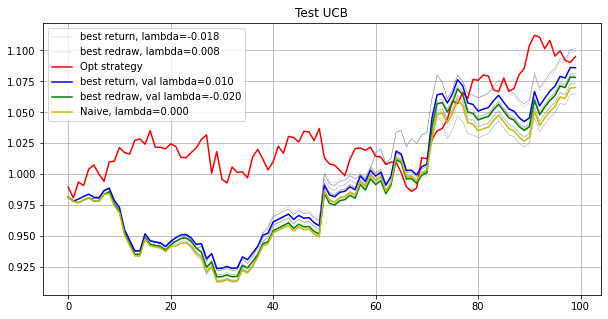

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[0.005  0.0099 0.0102 0.0114 0.0113 0.0097 0.0104 0.0093 0.0088 0.0077
 0.0106 0.0108 0.0119 0.0066 0.0088 0.0092 0.0108 0.0107 0.0071 0.0167
 0.0131 0.0085 0.0079 0.0051 0.0096 0.0109 0.0098 0.0102 0.01   0.0121
 0.0086 0.0043 0.0094 0.0112 0.0111 0.0121 0.0053 0.0115 0.0114 0.0085
 0.0088 0.0101 0.01   0.0121 0.0109 0.0092 0.013  0.0072 0.0052 0.0098
 0.0068 0.011  0.0103 0.0121 0.0102 0.008  0.0097 0.009  0.0101 0.0104
 0.0071 0.0118 0.0123 0.0115 0.0118 0.0125 0.0099 0.0113 0.0095 0.0099
 0.0095 0.0107 0.0102 0.0048 0.01   0.0101 0.0092 0.0124 0.011  0.0113
 0.0109 0.0096 0.0092 0.0081 0.0108 0.0109 0.0108 0.0107 0.0098 0.0099
 0.0108 0.0119 0.0096 0.0112 0.011  0.0101 0.0113 0.0118 0.0121 0.0117]
0.14213319286655876
[0.005  0.0099 0.0102 0.0114 0.0113 0.0097 0.0104 0.0093 0.0088 0.0077
 0.0106 0.0108 0.0119 0.0066 0.0088 0.0092 0.0108 0.0107 0.0071 0.0167
 0.0131 0.0085 0.0079 0.0051 0.0096 0.0109 0.009

[0.0002 0.0074 0.0102 0.0125 0.0124 0.0096 0.0107 0.0087 0.0081 0.0062
 0.0109 0.0076 0.0125 0.0048 0.0092 0.0101 0.0101 0.0114 0.0029 0.0153
 0.0149 0.0089 0.0074 0.0037 0.0093 0.0118 0.009  0.0103 0.0084 0.0123
 0.0066 0.0045 0.0089 0.0108 0.0108 0.0107 0.0076 0.0132 0.0122 0.0075
 0.0083 0.0104 0.0098 0.0131 0.0107 0.0102 0.0131 0.0074 0.0054 0.0098
 0.0044 0.0099 0.0126 0.0157 0.0096 0.0092 0.009  0.0082 0.0096 0.0104
 0.006  0.0129 0.0136 0.0126 0.0116 0.0128 0.0104 0.0112 0.0094 0.01
 0.0096 0.0096 0.0096 0.0049 0.0103 0.0102 0.0102 0.0145 0.0119 0.0102
 0.0122 0.009  0.0077 0.0076 0.0102 0.0133 0.0107 0.0113 0.0095 0.0103
 0.0113 0.0124 0.0113 0.0112 0.0113 0.0115 0.0122 0.0137 0.013  0.0123]
9.377908807958876e-06
[0.0002 0.0074 0.0102 0.0125 0.0124 0.0096 0.0107 0.0087 0.0081 0.0062
 0.0109 0.0076 0.0125 0.0048 0.0092 0.0101 0.0101 0.0114 0.0029 0.0153
 0.0149 0.0089 0.0074 0.0037 0.0093 0.0118 0.009  0.0103 0.0084 0.0123
 0.0066 0.0045 0.0089 0.0108 0.0108 0.0107 0.0076 0.0132

[-0.      0.0061  0.0106  0.014   0.0158  0.0108  0.0118  0.0073  0.0068
  0.0024  0.0123  0.0027  0.013   0.      0.0095  0.0043  0.0057  0.0118
  0.0063  0.017   0.0184  0.0106  0.0044 -0.      0.0091  0.0165  0.0084
  0.006   0.0056  0.0136  0.004   0.0117  0.009   0.0085  0.0109  0.0103
 -0.      0.0117  0.0149  0.0061  0.0059  0.0119  0.0094  0.0149  0.0054
  0.0118  0.0147  0.0054  0.0056  0.009   0.0016  0.014   0.0146  0.0168
  0.0079  0.0041  0.0135  0.0108  0.0117  0.0097  0.0016  0.0155  0.0149
  0.0193  0.0138  0.0137  0.0158  0.0124  0.0059  0.0105  0.0099  0.0123
  0.0098  0.0019  0.0107  0.0096  0.0106  0.0093  0.0163  0.0069  0.0143
  0.0127  0.007   0.0073  0.0102  0.0158  0.0115  0.0135  0.0051  0.0111
  0.0116  0.0136  0.0124  0.011   0.0105  0.0107  0.0136  0.0163  0.0132
  0.0116]
2.373481101846776e-05
[-0.      0.0061  0.0106  0.014   0.0158  0.0108  0.0118  0.0073  0.0068
  0.0024  0.0123  0.0027  0.013   0.      0.0095  0.0043  0.0057  0.0118
  0.0063  0.017   0

[ 0.      0.0061  0.0106  0.014   0.0158  0.0108  0.0118  0.0073  0.0068
  0.0024  0.0123  0.0027  0.013   0.      0.0095  0.0043  0.0057  0.0118
  0.0063  0.017   0.0184  0.0106  0.0044 -0.      0.0091  0.0165  0.0084
  0.006   0.0056  0.0136  0.004   0.0117  0.009   0.0085  0.0109  0.0103
  0.      0.0117  0.0149  0.0061  0.0059  0.0118  0.0094  0.0149  0.0053
  0.0118  0.0147  0.0054  0.0056  0.009   0.0016  0.014   0.0146  0.0168
  0.0079  0.0041  0.0135  0.0108  0.0117  0.0097  0.0016  0.0155  0.0149
  0.0193  0.0138  0.0137  0.0158  0.0124  0.0059  0.0105  0.0099  0.0123
  0.0098  0.002   0.0107  0.0096  0.0106  0.0093  0.0163  0.0069  0.0143
  0.0127  0.007   0.0073  0.0102  0.0158  0.0115  0.0135  0.0051  0.0111
  0.0116  0.0136  0.0124  0.011   0.0105  0.0107  0.0136  0.0163  0.0132
  0.0116]
8.954067792006381e-05
[ 0.      0.0061  0.0106  0.014   0.0158  0.0108  0.0118  0.0073  0.0068
  0.0024  0.0123  0.0027  0.013   0.      0.0095  0.0043  0.0057  0.0118
  0.0063  0.017   0

[-0.      0.0061  0.0106  0.014   0.0158  0.0108  0.0118  0.0073  0.0068
  0.0024  0.0123  0.0027  0.013  -0.      0.0095  0.0043  0.0057  0.0118
  0.0063  0.017   0.0184  0.0106  0.0044 -0.      0.0091  0.0165  0.0084
  0.006   0.0056  0.0136  0.004   0.0117  0.009   0.0085  0.0109  0.0103
 -0.      0.0117  0.0149  0.0061  0.0059  0.0118  0.0094  0.0149  0.0053
  0.0118  0.0147  0.0054  0.0056  0.009   0.0016  0.014   0.0146  0.0167
  0.0079  0.0041  0.0135  0.0108  0.0117  0.0097  0.0016  0.0155  0.0149
  0.0193  0.0138  0.0137  0.0158  0.0124  0.0059  0.0105  0.0099  0.0124
  0.0098  0.002   0.0107  0.0096  0.0106  0.0093  0.0163  0.0069  0.0143
  0.0127  0.007   0.0073  0.0102  0.0158  0.0115  0.0135  0.0051  0.0111
  0.0116  0.0136  0.0124  0.011   0.0105  0.0107  0.0136  0.0163  0.0132
  0.0116]
8.360278837795532e-05
[-0.      0.0061  0.0106  0.014   0.0158  0.0108  0.0118  0.0073  0.0068
  0.0024  0.0123  0.0027  0.013  -0.      0.0095  0.0043  0.0057  0.0118
  0.0063  0.017   0

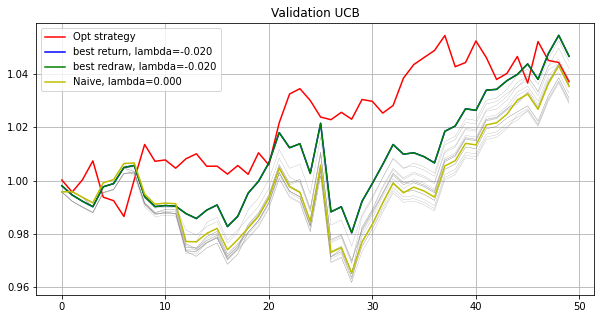

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[0.0031 0.006  0.0099 0.0118 0.0108 0.0103 0.0104 0.0088 0.0085 0.0071
 0.0115 0.0085 0.0122 0.005  0.0095 0.0094 0.0085 0.0093 0.0071 0.0106
 0.0146 0.0102 0.012  0.0037 0.0092 0.0122 0.0083 0.009  0.0077 0.0124
 0.0104 0.0104 0.0096 0.0111 0.0086 0.0103 0.0114 0.0113 0.0116 0.0088
 0.0079 0.0101 0.0082 0.0122 0.0128 0.008  0.0129 0.0087 0.0075 0.0093
 0.0073 0.0114 0.012  0.0111 0.0081 0.0077 0.0089 0.0106 0.01   0.0088
 0.0056 0.0113 0.0121 0.0117 0.0102 0.0125 0.0102 0.0089 0.0088 0.0105
 0.0096 0.0116 0.01   0.0108 0.0105 0.0101 0.0101 0.01   0.0119 0.0099
 0.0131 0.0095 0.0093 0.0119 0.0097 0.0139 0.011  0.0105 0.0103 0.0099
 0.0107 0.0118 0.0096 0.0111 0.0104 0.0106 0.0108 0.0119 0.013  0.0103]
4.741188350714746e-06
[0.0016 0.0075 0.0099 0.0121 0.0115 0.0104 0.0105 0.0085 0.0082 0.0059
 0.0121 0.0093 0.0128 0.0039 0.0079 0.0073 0.0087 0.0093 0.0072 0.011
 0.0149 0.0101 0.0126 0.0015 0.0091 0.0135 0.0076 0.009  0.0074 0.0125
 0.0101 0.0089 0.0095 0.0097 0.0093 0.0099 0.012  0.011

[ 0.      0.0048  0.0101  0.0132  0.0133  0.0101  0.0105  0.0086  0.0073
  0.004   0.0137  0.0023  0.0139  0.0012  0.0047  0.0083  0.0111  0.009
  0.0126  0.0092  0.0155  0.0089  0.0118 -0.      0.0089  0.0148  0.0065
  0.0101  0.0066  0.0124  0.0073  0.0088  0.0094  0.0062  0.0072  0.01
  0.013   0.0111  0.0132  0.0086  0.0087  0.0116  0.0097  0.0138  0.0096
  0.0034  0.0113  0.006   0.004   0.0089  0.009   0.0136  0.012   0.013
  0.0082  0.0092  0.0104  0.0087  0.0096  0.0099  0.0029  0.0113  0.0133
  0.0111  0.0101  0.0157  0.0112  0.0108  0.0087  0.0105  0.0094  0.0138
  0.012   0.0111  0.0102  0.0104  0.0086  0.011   0.0156  0.0094  0.0167
  0.008   0.009   0.0112  0.009   0.0147  0.0119  0.0111  0.0086  0.0101
  0.0108  0.0133  0.0134  0.011   0.012   0.0106  0.0127  0.0144  0.0147
  0.0113]
5.263424076895848e-05
[0.     0.0041 0.0102 0.0142 0.0143 0.0105 0.0108 0.0082 0.0067 0.0026
 0.0149 0.0002 0.0148 0.     0.0014 0.0073 0.0126 0.0089 0.0139 0.0086
 0.0177 0.008  0.0107 0.   

[0.     0.004  0.0102 0.0141 0.0143 0.0105 0.0109 0.0082 0.0067 0.0026
 0.0149 0.0001 0.0148 0.     0.0014 0.0073 0.0126 0.0089 0.0139 0.0086
 0.0177 0.008  0.0107 0.     0.0086 0.0142 0.0058 0.0101 0.0051 0.0127
 0.0067 0.0096 0.0094 0.0044 0.0068 0.0081 0.0152 0.0104 0.0139 0.0094
 0.0088 0.0124 0.0103 0.0135 0.0071 0.0038 0.0105 0.0039 0.0019 0.0086
 0.0092 0.0127 0.0124 0.0137 0.0076 0.0075 0.0099 0.0094 0.0097 0.0113
 0.002  0.0122 0.0142 0.0112 0.011  0.0156 0.0111 0.0119 0.0072 0.011
 0.0095 0.0147 0.0125 0.0098 0.0104 0.0105 0.0085 0.0117 0.0166 0.0091
 0.0182 0.0092 0.0088 0.0108 0.0085 0.0153 0.0121 0.0124 0.0086 0.0099
 0.0114 0.0148 0.014  0.0101 0.0132 0.0116 0.0132 0.0144 0.0167 0.0112]
0.00020911298717410113
[0.     0.004  0.0102 0.0141 0.0143 0.0105 0.0109 0.0082 0.0067 0.0026
 0.0149 0.0001 0.0148 0.     0.0014 0.0073 0.0126 0.0089 0.0139 0.0086
 0.0177 0.008  0.0107 0.     0.0086 0.0142 0.0058 0.0101 0.0051 0.0127
 0.0067 0.0096 0.0094 0.0044 0.0068 0.0081 0.0152 0.01

[-0.      0.0034  0.0102  0.0146  0.0141  0.0105  0.011   0.0078  0.0061
  0.0012  0.0154  0.0011  0.0158  0.      0.      0.0077  0.0129  0.009
  0.014   0.0083  0.0193  0.0078  0.0119  0.0003  0.0084  0.015   0.0053
  0.0101  0.0048  0.0145  0.0059  0.0103  0.009   0.0049  0.0068  0.0075
  0.0147  0.011   0.0146  0.0084  0.0085  0.0124  0.01    0.0145  0.005
  0.0032  0.0122  0.0027  0.001   0.0083  0.0083  0.0137  0.0121  0.0141
  0.0078  0.0069  0.01    0.0102  0.01    0.0108  0.0005  0.0129  0.0147
  0.0109  0.0116  0.0166  0.0113  0.0126  0.0061  0.0109  0.0091  0.0155
  0.0121  0.0096  0.0107  0.0105  0.0085  0.0101  0.0167  0.0094  0.0194
  0.0101  0.0083  0.0098  0.0083  0.0155  0.0123  0.0129  0.008   0.0097
  0.0119  0.0152  0.0131  0.0114  0.0133  0.0105  0.0135  0.0145  0.0154
  0.0112]
5.869068750379463e-06
[-0.      0.0034  0.0102  0.0146  0.0141  0.0105  0.011   0.0078  0.0061
  0.0012  0.0154  0.0011  0.0158  0.      0.      0.0077  0.0129  0.009
  0.014   0.0083  0.01

[-0.      0.0034  0.0102  0.0146  0.014   0.0105  0.011   0.0078  0.0061
  0.0012  0.0154  0.0011  0.0158 -0.     -0.      0.0077  0.0129  0.009
  0.014   0.0083  0.0193  0.0078  0.0119  0.0003  0.0084  0.015   0.0053
  0.0101  0.0048  0.0145  0.0059  0.0104  0.009   0.0049  0.0068  0.0075
  0.0147  0.011   0.0146  0.0084  0.0085  0.0124  0.01    0.0145  0.005
  0.0032  0.0122  0.0027  0.001   0.0083  0.0083  0.0137  0.0121  0.0141
  0.0078  0.0069  0.01    0.0102  0.01    0.0108  0.0004  0.0129  0.0147
  0.0109  0.0116  0.0166  0.0113  0.0126  0.0061  0.0109  0.0091  0.0155
  0.0121  0.0096  0.0107  0.0105  0.0085  0.0101  0.0167  0.0094  0.0194
  0.0101  0.0083  0.0098  0.0083  0.0155  0.0123  0.0129  0.008   0.0098
  0.0119  0.0152  0.0131  0.0114  0.0133  0.0105  0.0135  0.0145  0.0154
  0.0112]
0.00032084005768036577
[ 0.      0.0034  0.0102  0.0146  0.014   0.0105  0.011   0.0078  0.0061
  0.0012  0.0154  0.0011  0.0158 -0.     -0.      0.0077  0.0129  0.009
  0.014   0.0083  0.0

[-0.      0.0034  0.0102  0.0146  0.014   0.0105  0.0111  0.0078  0.0061
  0.0012  0.0153  0.0012  0.0158  0.      0.      0.0077  0.0129  0.009
  0.014   0.0083  0.0193  0.0078  0.0119  0.0003  0.0084  0.015   0.0053
  0.0101  0.0048  0.0145  0.0059  0.0104  0.009   0.0049  0.0068  0.0075
  0.0147  0.011   0.0146  0.0084  0.0085  0.0124  0.01    0.0145  0.005
  0.0032  0.0122  0.0027  0.001   0.0083  0.0083  0.0137  0.0121  0.0141
  0.0078  0.0069  0.01    0.0102  0.01    0.0108  0.0004  0.0129  0.0147
  0.0109  0.0116  0.0166  0.0113  0.0126  0.0061  0.0109  0.0091  0.0155
  0.0121  0.0096  0.0107  0.0105  0.0085  0.0101  0.0167  0.0094  0.0194
  0.0101  0.0083  0.0098  0.0083  0.0155  0.0123  0.0129  0.008   0.0097
  0.0119  0.0152  0.0131  0.0114  0.0133  0.0105  0.0136  0.0145  0.0154
  0.0112]
2.342807921183736e-05
[0.     0.0034 0.0102 0.0146 0.014  0.0105 0.0111 0.0078 0.0061 0.0012
 0.0153 0.0012 0.0158 0.     0.     0.0077 0.0129 0.009  0.014  0.0083
 0.0192 0.0078 0.0119 0.0

[-0.     -0.      0.0105  0.0174  0.0138  0.0112  0.012   0.0069  0.0047
  0.      0.0169  0.0007  0.0145 -0.     -0.      0.0084  0.0168  0.0088
  0.0234  0.0089  0.0231  0.0057  0.0077  0.      0.0081  0.013   0.0031
  0.0124  0.0023  0.0183  0.0037  0.0133  0.0088  0.0036  0.0038  0.0051
  0.0058  0.0098  0.0167  0.0066  0.0063  0.0137  0.0101  0.0158 -0.
  0.0004  0.0112  0.     -0.      0.0081  0.0069  0.0145  0.0125  0.0153
  0.008   0.0056  0.0099  0.0116  0.0106  0.0119  0.      0.0154  0.0155
  0.011   0.0134  0.0178  0.012   0.0125  0.005   0.0119  0.0093  0.0153
  0.013   0.0076  0.0113  0.0101  0.0089  0.0107  0.0183  0.0075  0.0212
  0.014   0.0078  0.012   0.0069  0.0158  0.0127  0.0143  0.0057  0.0099
  0.0136  0.0155  0.0115  0.0113  0.0141  0.0093  0.0152  0.0152  0.0189
  0.0104]
2.145266266016053e-05
[ 0.     -0.      0.0105  0.0174  0.0138  0.0112  0.012   0.0069  0.0047
  0.      0.0169  0.0007  0.0145 -0.     -0.      0.0084  0.0168  0.0088
  0.0234  0.0089  0.023

[-0.     -0.      0.0105  0.0174  0.0138  0.0112  0.012   0.0069  0.0047
  0.      0.0169  0.0007  0.0145 -0.     -0.      0.0084  0.0168  0.0088
  0.0234  0.0089  0.0231  0.0057  0.0077  0.      0.0081  0.013   0.0031
  0.0124  0.0023  0.0183  0.0037  0.0133  0.0088  0.0036  0.0038  0.0051
  0.0058  0.0098  0.0167  0.0066  0.0063  0.0137  0.0101  0.0158 -0.
  0.0004  0.0112 -0.     -0.      0.0081  0.0069  0.0145  0.0125  0.0153
  0.008   0.0056  0.0099  0.0116  0.0106  0.0119  0.      0.0154  0.0155
  0.011   0.0134  0.0178  0.012   0.0125  0.005   0.0119  0.0093  0.0153
  0.013   0.0076  0.0113  0.0101  0.0089  0.0107  0.0183  0.0075  0.0212
  0.014   0.0078  0.012   0.0069  0.0158  0.0127  0.0143  0.0057  0.0099
  0.0136  0.0155  0.0115  0.0113  0.0141  0.0093  0.0152  0.0152  0.0189
  0.0104]
4.222720371820383e-05
[-0.      0.      0.0105  0.0174  0.0138  0.0112  0.012   0.0069  0.0047
  0.      0.0169  0.0007  0.0145 -0.     -0.      0.0084  0.0168  0.0088
  0.0234  0.0089  0.023

[ 0.     -0.      0.0105  0.0174  0.0138  0.0112  0.012   0.0069  0.0047
 -0.      0.0169  0.0008  0.0145  0.     -0.      0.0084  0.0168  0.0088
  0.0234  0.0089  0.0231  0.0057  0.0077  0.0001  0.0081  0.013   0.0031
  0.0124  0.0023  0.0183  0.0037  0.0133  0.0088  0.0036  0.0038  0.0051
  0.0058  0.0098  0.0167  0.0066  0.0063  0.0137  0.0101  0.0158 -0.
  0.0005  0.0112 -0.     -0.      0.0081  0.0069  0.0145  0.0125  0.0153
  0.008   0.0056  0.0099  0.0116  0.0106  0.0119  0.      0.0154  0.0155
  0.011   0.0134  0.0178  0.012   0.0125  0.005   0.0119  0.0093  0.0153
  0.013   0.0076  0.0113  0.0101  0.0089  0.0107  0.0183  0.0075  0.0212
  0.014   0.0078  0.012   0.0068  0.0158  0.0127  0.0143  0.0057  0.0099
  0.0136  0.0155  0.0115  0.0113  0.0141  0.0093  0.0152  0.0152  0.0189
  0.0103]
6.642742042886992e-05
[-0.     -0.      0.0105  0.0174  0.0138  0.0112  0.012   0.0069  0.0047
  0.      0.0169  0.0007  0.0145  0.     -0.      0.0084  0.0168  0.0088
  0.0234  0.0089  0.023

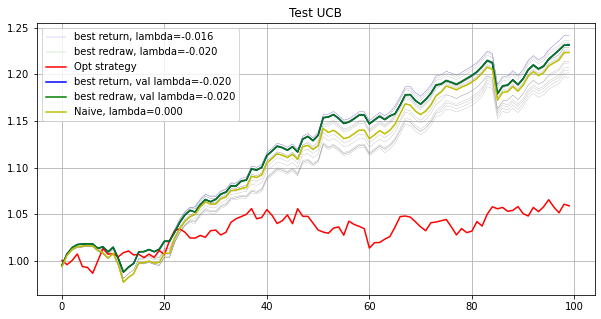

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
2.704792986980842e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01

[ 0.004   0.      0.0154  0.0133  0.0167  0.0143  0.014   0.0082  0.0024
  0.0133  0.      0.0139  0.0014  0.0078  0.0108 -0.      0.009   0.0093
  0.0178  0.0073  0.0162  0.0127  0.0039  0.0021  0.      0.0063  0.0124
  0.0088  0.0058  0.0138  0.0106  0.0115  0.0148  0.016   0.0046  0.0108
  0.0124  0.0117  0.0164  0.0048  0.0046  0.0038  0.0132  0.0125  0.0081
  0.0124  0.0142  0.0125  0.0126  0.0071  0.0115  0.0069  0.0059  0.0203
  0.0058  0.0029  0.0109  0.0115  0.0142  0.0079  0.0112  0.007   0.0111
  0.0126  0.0075  0.0108  0.0155  0.0002  0.0127  0.0057  0.0147  0.0123
  0.0094  0.0155  0.0136  0.0132  0.0091  0.0094  0.01    0.0116  0.007
  0.0131  0.0071  0.0134  0.0126  0.0076  0.0088  0.0102  0.0136  0.0117
  0.0155  0.0045  0.01    0.0103  0.0126  0.0151  0.0109  0.0077  0.0135
  0.0088]
2.8131898644207722e-05
[ 0.004   0.      0.0154  0.0133  0.0167  0.0143  0.014   0.0082  0.0023
  0.0133  0.      0.0139  0.0014  0.0078  0.0108 -0.      0.009   0.0093
  0.0178  0.0073  0

[-0.      0.      0.0202  0.0176  0.0189  0.0149  0.0175  0.0028  0.
  0.0172  0.      0.0114  0.      0.0037  0.0101  0.0048  0.0141  0.0095
  0.0206  0.0041  0.0167  0.0165  0.     -0.      0.      0.0024  0.0145
  0.006   0.0023  0.0188  0.0066  0.0128  0.0097  0.0239  0.0006  0.0102
  0.0116  0.0135  0.0119  0.0057  0.0008  0.      0.0158  0.0143  0.0062
  0.0133  0.0156  0.0127  0.0136  0.0006  0.0145  0.0085  0.0055  0.0226
  0.0001  0.      0.0108  0.0133  0.018   0.0078  0.0172  0.0066  0.0142
  0.0132  0.0093  0.0114  0.0139  0.      0.0137  0.0023  0.019   0.0188
  0.0076  0.0137  0.0151  0.0164  0.0112  0.0144  0.0052  0.0115  0.014
  0.0014  0.0062  0.0138  0.0184  0.0099  0.0065  0.003   0.0113  0.0118
  0.0139  0.0065  0.0097  0.01    0.0148  0.0165  0.005   0.0054  0.0165
  0.0057]
0.00012025502797439199
[-0.      0.      0.0202  0.0176  0.0189  0.0149  0.0175  0.0028  0.
  0.0172  0.      0.0114  0.      0.0037  0.0101  0.0048  0.0141  0.0095
  0.0206  0.0041  0.0167  0

[-0.     -0.      0.0202  0.0176  0.0189  0.0149  0.0175  0.0027 -0.
  0.0172  0.      0.0114 -0.      0.0037  0.0101  0.0048  0.0141  0.0095
  0.0206  0.0041  0.0167  0.0165 -0.     -0.     -0.      0.0024  0.0145
  0.006   0.0023  0.0188  0.0066  0.0128  0.0097  0.0239  0.0006  0.0102
  0.0116  0.0135  0.0119  0.0057  0.0008 -0.      0.0158  0.0143  0.0062
  0.0133  0.0156  0.0127  0.0136  0.0006  0.0145  0.0085  0.0055  0.0226
  0.0001  0.      0.0108  0.0133  0.018   0.0078  0.0172  0.0066  0.0142
  0.0132  0.0093  0.0114  0.0139  0.      0.0137  0.0023  0.0189  0.0188
  0.0076  0.0136  0.0151  0.0164  0.0112  0.0144  0.0052  0.0115  0.014
  0.0014  0.0062  0.0138  0.0184  0.0099  0.0065  0.003   0.0113  0.0118
  0.0139  0.0065  0.0097  0.01    0.0148  0.0165  0.005   0.0054  0.0165
  0.0057]
3.9523268176043405e-05
[-0.      0.      0.0212  0.0185  0.0193  0.0151  0.0181  0.0011 -0.
  0.0166 -0.      0.0121  0.      0.0026  0.0094  0.0054  0.015   0.0095
  0.0213  0.0026  0.0177  0

[-0.     -0.      0.0212  0.0185  0.0193  0.0151  0.0182  0.0011  0.
  0.0166 -0.      0.0121  0.      0.0026  0.0094  0.0054  0.015   0.0095
  0.0213  0.0026  0.0177  0.0159 -0.     -0.     -0.      0.0013  0.0148
  0.0061  0.0016  0.018   0.0045  0.013   0.0108  0.0251  0.003   0.011
  0.0117  0.014   0.0106  0.0037  0.     -0.      0.0165  0.0154  0.0051
  0.0134  0.016   0.0129  0.0134  0.      0.0146  0.0071  0.0049  0.0229
 -0.     -0.      0.0112  0.0138  0.0185  0.0075  0.0175  0.0068  0.0147
  0.0134  0.0098  0.0117  0.0135  0.      0.0138  0.0022  0.0193  0.0191
  0.007   0.0145  0.0156  0.0162  0.0112  0.0153  0.0047  0.0108  0.0141
 -0.      0.0055  0.0138  0.0181  0.0093  0.0067  0.0008  0.0115  0.0122
  0.0157  0.0105  0.0093  0.0097  0.0149  0.0168  0.0041  0.0046  0.0168
  0.0047]
0.00020911672530063378
[-0.      0.      0.0213  0.0185  0.0194  0.0151  0.0182  0.001   0.
  0.0166  0.      0.0121  0.      0.0026  0.0094  0.0054  0.015   0.0095
  0.0213  0.0026  0.0177  0

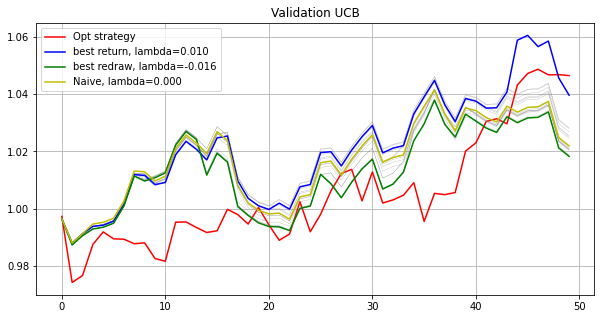

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[0.     0.0016 0.0154 0.0144 0.0184 0.0184 0.0139 0.008  0.0038 0.01
 0.0075 0.0051 0.0037 0.0103 0.0085 0.0095 0.0107 0.0114 0.0167 0.0096
 0.0114 0.017  0.     0.0068 0.0021 0.0098 0.0121 0.0065 0.0063 0.0161
 0.0072 0.0109 0.0147 0.0182 0.0014 0.0145 0.0149 0.0098 0.0033 0.011
 0.0134 0.0015 0.0191 0.01   0.0075 0.0102 0.0141 0.0066 0.0153 0.012
 0.0142 0.0126 0.009  0.0058 0.003  0.0083 0.0109 0.0111 0.0119 0.0077
 0.0134 0.0135 0.0068 0.0121 0.0079 0.0116 0.0128 0.0027 0.0107 0.0091
 0.0176 0.0078 0.0082 0.0059 0.0127 0.0148 0.0119 0.0087 0.0045 0.0129
 0.0055 0.0054 0.0072 0.0104 0.008  0.0087 0.0083 0.0027 0.0139 0.0125
 0.0128 0.0134 0.013  0.0095 0.0144 0.0151 0.0037 0.0129 0.0145 0.0076]
0.00027245096675990296
[0.     0.0016 0.0154 0.0144 0.0184 0.0184 0.0139 0.008  0.0038 0.01
 0.0075 0.0051 0.0037 0.0103 0.0085 0.0095 0.0107 0.0114 0.0167 0.0096
 0.0114 0.017  0.     0.0068 0.0021 0.0098 0.0121 0.0065 0.0063 0.0161
 0.0072 0.0109 0.0147 0.0182 0.0014 0.0145 0.0149 0.0098 0.

[ 0.0009  0.0004  0.0173  0.0163  0.0202  0.0198  0.0151  0.0072  0.0011
  0.0106  0.0074  0.0038  0.0015  0.0103  0.0081  0.0076  0.0099  0.0113
  0.018   0.0078  0.0124  0.0172  0.      0.0062  0.      0.0086  0.0128
  0.005   0.0057  0.0163  0.0071  0.0109  0.0148  0.0206 -0.      0.014
  0.0166  0.0108  0.0018  0.0119  0.0135  0.      0.0217  0.0092  0.0072
  0.0104  0.0157  0.0072  0.0169  0.0104  0.0155  0.0119  0.0053  0.0068
  0.0012  0.0055  0.0112  0.0113  0.0129  0.0072  0.0137  0.0129  0.008
  0.0121  0.0072  0.0127  0.0141  0.      0.0111  0.0079  0.0193  0.0076
  0.0069  0.0074  0.0151  0.0158  0.0111  0.0075  0.0039  0.0132  0.0053
  0.0044  0.0063  0.0115  0.0085  0.0085  0.0075  0.0045  0.0151  0.0133
  0.0138  0.0143  0.0135  0.0097  0.0148  0.0156  0.0037  0.0114  0.016
  0.0067]
0.00015953994185673019
[ 0.0009  0.0004  0.0173  0.0163  0.0202  0.0198  0.0151  0.0072  0.0011
  0.0106  0.0074  0.0038  0.0015  0.0103  0.0081  0.0076  0.0099  0.0113
  0.018   0.0078  0.0

[ 0.     -0.      0.0208  0.0201  0.0201  0.0187  0.0173  0.0065 -0.
  0.0092  0.0079  0.0027  0.      0.0074  0.0083  0.0091  0.0083  0.0109
  0.0202  0.0065  0.0134  0.0171  0.      0.0111  0.      0.0064  0.0137
  0.0055  0.0017  0.014   0.0021  0.0116  0.0161  0.0208 -0.      0.0179
  0.0156  0.0096  0.0099  0.0119  0.0133 -0.      0.0239  0.007   0.0031
  0.0093  0.0163  0.0067  0.0162  0.0069  0.0188  0.0109  0.0048  0.0092
  0.0025  0.      0.011   0.0149  0.0143  0.0069  0.0177  0.0146  0.0106
  0.0131  0.0077  0.0123  0.012  -0.      0.012   0.0114  0.0203  0.0037
  0.0066  0.0041  0.017   0.0147  0.0143  0.0111  0.008   0.014   0.0012
  0.0003  0.0106  0.0117  0.0058  0.0044  0.008   0.0022  0.0137  0.0138
  0.013   0.0142  0.0135  0.0089  0.0135  0.017   0.0015  0.0114  0.0173
  0.0042]
1.54775922143712e-05
[ 0.      0.      0.0208  0.0201  0.0201  0.0187  0.0173  0.0065 -0.
  0.0092  0.0079  0.0027  0.      0.0074  0.0083  0.0091  0.0083  0.0109
  0.0202  0.0065  0.0134  0.

[-0.      0.      0.0215  0.0208  0.0211  0.0193  0.0177  0.0058 -0.
  0.0098  0.0066  0.003  -0.      0.0071  0.0078  0.0083  0.0082  0.0114
  0.0208  0.0062  0.0141  0.0166  0.      0.0102 -0.      0.0059  0.0139
  0.0047  0.0011  0.0153  0.0016  0.0117  0.0159  0.0215  0.      0.0178
  0.0159  0.0097  0.0075  0.0115  0.0128 -0.      0.0248  0.0073  0.0043
  0.0096  0.0169  0.0065  0.0161  0.0059  0.0194  0.0102  0.0042  0.0093
  0.0012 -0.      0.0113  0.0155  0.0149  0.0068  0.0173  0.0142  0.0109
  0.017   0.0072  0.0126  0.0129 -0.      0.012   0.0105  0.0202  0.0042
  0.0065  0.0038  0.0173  0.0159  0.0143  0.0113  0.0065  0.0139  0.0011
  0.0005  0.0101  0.0116  0.0061  0.0038  0.0077  0.0012  0.0137  0.0139
  0.013   0.0146  0.0133  0.0093  0.0134  0.017   0.0015  0.0111  0.0181
  0.0035]
7.333215370795207e-05
[-0.      0.      0.0215  0.0208  0.0211  0.0193  0.0177  0.0058 -0.
  0.0098  0.0066  0.003  -0.      0.0071  0.0078  0.0083  0.0082  0.0114
  0.0208  0.0062  0.0141  0

[-0.     -0.      0.0215  0.0208  0.0211  0.0193  0.0178  0.0058 -0.
  0.0098  0.0066  0.003  -0.      0.0071  0.0077  0.0083  0.0082  0.0114
  0.0209  0.0062  0.0141  0.0166 -0.      0.0102 -0.      0.0059  0.0139
  0.0047  0.0011  0.0153  0.0016  0.0117  0.0159  0.0215 -0.      0.0178
  0.0159  0.0097  0.0075  0.0115  0.0128  0.      0.0248  0.0073  0.0043
  0.0096  0.0169  0.0065  0.0161  0.0059  0.0194  0.0102  0.0042  0.0093
  0.0012  0.      0.0113  0.0155  0.0149  0.0069  0.0173  0.0142  0.0108
  0.017   0.0072  0.0126  0.0129  0.      0.012   0.0105  0.0202  0.0042
  0.0065  0.0038  0.0173  0.0159  0.0142  0.0113  0.0065  0.0139  0.0011
  0.0004  0.0101  0.0116  0.0061  0.0038  0.0077  0.0012  0.0137  0.0139
  0.013   0.0146  0.0133  0.0093  0.0134  0.017   0.0015  0.0111  0.0181
  0.0035]
0.00012889257872325644
[-0.      0.      0.0215  0.0208  0.0211  0.0193  0.0177  0.0058 -0.
  0.0098  0.0066  0.003  -0.      0.0071  0.0077  0.0083  0.0082  0.0114
  0.0209  0.0062  0.0141  

[-0.      0.      0.0215  0.0208  0.0211  0.0193  0.0178  0.0058  0.
  0.0098  0.0066  0.003   0.      0.0071  0.0077  0.0083  0.0082  0.0114
  0.0209  0.0062  0.0141  0.0166  0.      0.0102  0.      0.0059  0.0139
  0.0047  0.0011  0.0153  0.0016  0.0117  0.0159  0.0215 -0.      0.0178
  0.0159  0.0097  0.0075  0.0115  0.0128 -0.      0.0248  0.0073  0.0043
  0.0096  0.0169  0.0065  0.0161  0.0059  0.0194  0.0102  0.0042  0.0092
  0.0012  0.      0.0113  0.0155  0.0149  0.0069  0.0173  0.0142  0.0108
  0.017   0.0072  0.0126  0.0129  0.      0.012   0.0105  0.0202  0.0042
  0.0066  0.0038  0.0173  0.0159  0.0143  0.0113  0.0065  0.0139  0.0011
  0.0004  0.0101  0.0116  0.0061  0.0038  0.0077  0.0012  0.0137  0.0139
  0.013   0.0146  0.0133  0.0093  0.0134  0.017   0.0015  0.0111  0.0181
  0.0035]
1.9824937941586634e-05
[ 0.     -0.      0.0215  0.0208  0.0211  0.0193  0.0178  0.0058 -0.
  0.0098  0.0066  0.003   0.      0.0071  0.0077  0.0083  0.0082  0.0114
  0.0209  0.0062  0.0141  

[-0.      0.      0.0215  0.0208  0.0211  0.0193  0.0178  0.0058 -0.
  0.0098  0.0066  0.003  -0.      0.0071  0.0077  0.0083  0.0082  0.0114
  0.0209  0.0062  0.0141  0.0166  0.      0.0102  0.      0.0059  0.0139
  0.0047  0.0011  0.0153  0.0016  0.0117  0.0159  0.0215  0.      0.0178
  0.0159  0.0097  0.0075  0.0115  0.0128  0.      0.0248  0.0073  0.0043
  0.0096  0.0169  0.0065  0.0161  0.0059  0.0194  0.0102  0.0042  0.0092
  0.0012 -0.      0.0112  0.0155  0.0149  0.0069  0.0173  0.0141  0.0108
  0.017   0.0072  0.0126  0.0129  0.0001  0.012   0.0105  0.0202  0.0042
  0.0066  0.0038  0.0173  0.0159  0.0143  0.0113  0.0065  0.0139  0.0011
  0.0004  0.0101  0.0116  0.0061  0.0038  0.0077  0.0012  0.0137  0.0139
  0.013   0.0146  0.0133  0.0093  0.0134  0.017   0.0015  0.0111  0.0181
  0.0035]
1.072946146996743e-05
[-0.     -0.      0.0215  0.0208  0.0211  0.0193  0.0178  0.0058 -0.
  0.0098  0.0066  0.003  -0.      0.0071  0.0077  0.0083  0.0082  0.0114
  0.0209  0.0062  0.0141  0

[-0.     -0.      0.0229  0.0222  0.0211  0.0212  0.0187  0.0041 -0.
  0.01    0.0045  0.0023  0.      0.0056  0.0078  0.0012  0.0064  0.0115
  0.0216  0.0051  0.0163  0.0158  0.      0.0088  0.      0.0052  0.0144
  0.0043 -0.      0.0177 -0.      0.0119  0.0167  0.0214  0.      0.0189
  0.0149  0.0093  0.005   0.0116  0.0121 -0.      0.0263  0.0077  0.0058
  0.009   0.0175  0.0066  0.0167  0.0028  0.0198  0.0116  0.0049  0.0087
  0.0008  0.      0.0122  0.0168  0.0157  0.0065  0.0183  0.0149  0.011
  0.0177  0.0067  0.0125  0.0128  0.0001  0.013   0.0098  0.0221  0.0031
  0.0055  0.0039  0.0179  0.0157  0.0131  0.0119  0.0061  0.0144  0.0015
  0.0008  0.0096  0.012   0.0059  0.0025  0.007   0.0018  0.0139  0.015
  0.0137  0.016   0.0136  0.0091  0.0144  0.0192  0.0009  0.0105  0.0191
  0.0029]
6.968941370674696e-05
[-0.     -0.      0.0229  0.0222  0.0211  0.0212  0.0187  0.0041 -0.
  0.01    0.0045  0.0023  0.      0.0056  0.0078  0.0012  0.0064  0.0115
  0.0216  0.0051  0.0163  0.0

[-0.     -0.      0.0234  0.0225  0.0213  0.022   0.0191  0.003   0.
  0.0104  0.0038  0.0021  0.      0.0052  0.008   0.0002  0.0069  0.0115
  0.0217  0.0045  0.0175  0.0159 -0.      0.0082 -0.      0.0051  0.0145
  0.0045  0.0001  0.0177 -0.      0.012   0.0168  0.022  -0.      0.0189
  0.0143  0.0098  0.0065  0.0106  0.0119 -0.      0.0266  0.0079  0.0053
  0.0091  0.018   0.0066  0.0176  0.0011  0.02    0.0119  0.0053  0.0094
 -0.     -0.      0.0122  0.0166  0.0154  0.0063  0.0182  0.0149  0.0106
  0.0178  0.0069  0.0129  0.0125 -0.      0.0128  0.0095  0.0224  0.0026
  0.0051  0.0054  0.0188  0.0157  0.0129  0.0123  0.0045  0.0144  0.001
  0.      0.0094  0.0123  0.0055  0.0028  0.0074  0.0009  0.0145  0.0151
  0.0137  0.0168  0.0139  0.0089  0.0142  0.0192  0.0003  0.0104  0.0194
  0.0026]
7.64137201443581e-05
[-0.     -0.      0.0234  0.0225  0.0213  0.022   0.0191  0.003   0.
  0.0104  0.0038  0.0021  0.      0.0052  0.008   0.0002  0.0069  0.0115
  0.0217  0.0045  0.0175  0.0

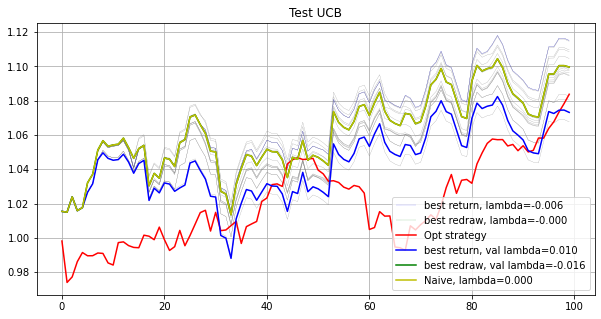

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[-0.      0.0044  0.0188  0.0153  0.0149  0.0135  0.013   0.0035  0.0079
  0.0094  0.0119  0.003   0.0153  0.0106  0.0099  0.0136  0.0074  0.0029
  0.0071  0.0102  0.0094  0.0156  0.0002  0.0142  0.0115  0.0079  0.0109
  0.0109  0.0125  0.0147  0.0107  0.0115  0.0032  0.0133  0.011   0.0056
  0.0102  0.0022  0.0136 -0.      0.0025  0.0091  0.0102  0.0067  0.0069
  0.011   0.0047  0.0116  0.0101  0.0113  0.0145  0.0156  0.0076  0.0166
  0.0159  0.0104  0.0109  0.0126  0.0076  0.0123  0.0029  0.0034  0.0108
  0.0089  0.0139  0.0135  0.0087  0.0057  0.0113  0.0087  0.0077  0.0111
  0.0091  0.01    0.0207  0.0108  0.0037  0.0076  0.0138  0.0188  0.0088
  0.0175  0.003   0.0115  0.0087  0.0057  0.0046  0.0103  0.0127  0.0123
  0.0116  0.0147  0.007   0.0105  0.0106  0.0076  0.0143  0.0126  0.0112
  0.0137]
0.33779934606693374
[-0.      0.0003  0.0181  0.0187  0.0179  0.013   0.0148 -0.     -0.
  0.0109  0.0125  0

[ 0.      0.      0.0187  0.0194  0.0186  0.0131  0.0151  0.      0.
  0.0108  0.0128 -0.      0.0191  0.01    0.0097  0.013   0.0062  0.001
  0.0073  0.0155  0.0103  0.0175 -0.      0.0171  0.0127  0.0058  0.0105
  0.0118  0.0126  0.0157  0.0053  0.0123  0.      0.0172  0.0113  0.
  0.0088  0.      0.0152  0.      0.      0.0056  0.0099  0.0027  0.0053
  0.0117  0.0028  0.0157  0.0084  0.0141  0.0149  0.0178  0.0074  0.0171
  0.0206  0.016   0.0107  0.0131  0.004   0.0121  0.0009 -0.      0.0103
  0.0099  0.0134  0.0127  0.0137  0.      0.0127  0.0068  0.0063  0.0104
  0.0094  0.0076  0.0193  0.0118  0.0046  0.0089  0.0155  0.0164  0.0141
  0.0197  0.      0.011   0.006   0.0029  0.0071  0.0073  0.0134  0.0168
  0.0109  0.015   0.0081  0.0148  0.0127  0.0077  0.0164  0.0143  0.0124
  0.0142]
0.0002240994238521421
[ 0.      0.      0.0187  0.0194  0.0186  0.0131  0.0152  0.      0.
  0.0108  0.0128 -0.      0.0191  0.01    0.0097  0.013   0.0062  0.001
  0.0073  0.0155  0.0103  0.0175 

[-0.      0.      0.0178  0.0222  0.021   0.0127  0.0167  0.      0.0034
  0.0071  0.0121 -0.      0.0222  0.0097  0.0096  0.0095  0.0042  0.
  0.0082  0.013   0.0096  0.0175 -0.      0.0188  0.0122  0.004   0.0099
  0.0118  0.0142  0.0174  0.0007  0.0131  0.      0.0128  0.011   0.
  0.0069  0.      0.0159  0.      0.      0.0042  0.0095  0.0083  0.0009
  0.0112  0.      0.0149  0.0078  0.0142  0.0115  0.019   0.0051  0.0214
  0.024   0.0169  0.0098  0.0125  0.0018  0.013   0.     -0.      0.0105
  0.0097  0.0166  0.0138  0.0176  0.      0.0146  0.0046  0.0028  0.0124
  0.0095  0.0086  0.0189  0.0136  0.001   0.0105  0.0178  0.0161  0.0149
  0.0197 -0.      0.0114  0.0036  0.0047  0.0082  0.0118  0.0132  0.0169
  0.0093  0.0157  0.0058  0.0146  0.014   0.008   0.0162  0.0145  0.0116
  0.0158]
2.47770251816042e-05
[ 0.     -0.      0.0178  0.0222  0.021   0.0127  0.0167  0.      0.0034
  0.0071  0.0121 -0.      0.0222  0.0097  0.0096  0.0095  0.0042  0.
  0.0082  0.013   0.0096  0.0175

[-0.      0.      0.0178  0.0222  0.021   0.0127  0.0167  0.      0.0034
  0.0071  0.0121  0.      0.0222  0.0097  0.0096  0.0095  0.0042  0.
  0.0082  0.013   0.0096  0.0175  0.      0.0188  0.0122  0.004   0.0099
  0.0118  0.0142  0.0174  0.0007  0.0131 -0.      0.0128  0.011  -0.
  0.0069  0.      0.0159  0.     -0.      0.0042  0.0095  0.0083  0.0009
  0.0112  0.      0.0149  0.0078  0.0142  0.0115  0.019   0.0051  0.0214
  0.024   0.0169  0.0098  0.0125  0.0018  0.013   0.      0.      0.0105
  0.0097  0.0166  0.0138  0.0176  0.      0.0146  0.0046  0.0028  0.0124
  0.0095  0.0086  0.0189  0.0136  0.001   0.0105  0.0178  0.0161  0.0149
  0.0197 -0.      0.0114  0.0036  0.0048  0.0082  0.0118  0.0132  0.0169
  0.0093  0.0157  0.0058  0.0146  0.014   0.008   0.0162  0.0145  0.0116
  0.0158]
1.2886278797157574e-05
[-0.      0.      0.0178  0.0222  0.021   0.0127  0.0167 -0.      0.0034
  0.0071  0.0121  0.      0.0222  0.0097  0.0096  0.0095  0.0042  0.
  0.0082  0.013   0.0096  0.01

[-0.      0.      0.0178  0.0222  0.021   0.0127  0.0167  0.      0.0034
  0.0071  0.0121  0.      0.0222  0.0097  0.0096  0.0095  0.0042  0.
  0.0082  0.013   0.0096  0.0175  0.      0.0188  0.0122  0.004   0.0099
  0.0118  0.0142  0.0174  0.0007  0.0131 -0.      0.0128  0.011  -0.
  0.0069 -0.      0.0159  0.     -0.      0.0042  0.0095  0.0083  0.0009
  0.0112  0.      0.0149  0.0078  0.0142  0.0115  0.019   0.0051  0.0214
  0.024   0.0169  0.0098  0.0125  0.0018  0.013  -0.      0.      0.0105
  0.0097  0.0166  0.0138  0.0176 -0.      0.0146  0.0046  0.0028  0.0124
  0.0095  0.0086  0.0189  0.0136  0.001   0.0105  0.0178  0.0161  0.0149
  0.0197 -0.      0.0114  0.0036  0.0048  0.0082  0.0118  0.0132  0.0169
  0.0093  0.0157  0.0058  0.0146  0.014   0.008   0.0162  0.0145  0.0116
  0.0158]
1.2870393130523414e-05
[-0.      0.      0.0178  0.0222  0.021   0.0127  0.0167 -0.      0.0034
  0.0071  0.0121 -0.      0.0222  0.0097  0.0096  0.0095  0.0042 -0.
  0.0082  0.013   0.0096  0.01

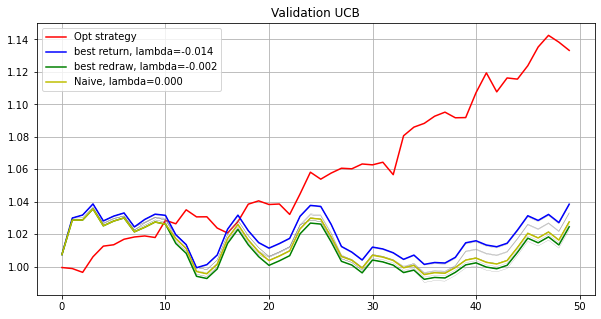

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[ 0.      0.      0.017   0.0183  0.0181  0.0063  0.0136  0.      0.
  0.011   0.007   0.005   0.0174  0.0153  0.0089  0.0075  0.0041  0.0038
  0.0102  0.0148  0.0132  0.0118  0.0086  0.0169  0.0187  0.0055  0.004
  0.0093  0.01    0.0221  0.0097  0.0088  0.0056  0.0132  0.0069  0.
  0.006   0.0044  0.0087  0.      0.0048  0.0055  0.0064  0.0123  0.0035
  0.0058  0.0122  0.0141  0.0066  0.012   0.0109  0.0153  0.0092  0.0138
  0.0203  0.0053  0.0099  0.0176  0.0075  0.0119  0.0086  0.0042  0.0098
  0.0071  0.0128  0.012   0.0117  0.0041  0.0126  0.0094  0.0088  0.0168
  0.0085  0.0103  0.017   0.0181  0.0115  0.0131  0.0092  0.0147  0.0112
  0.0127 -0.      0.0105  0.0076  0.0065  0.0033  0.0112  0.012   0.0165
  0.0132  0.0073  0.009   0.0178  0.0109  0.0103  0.0158  0.0156  0.0104
  0.0115]
0.04875357818945523
[ 0.      0.      0.017   0.0183  0.0181  0.0063  0.0136  0.     -0.
  0.011   0.007   0.005   0.0174  0.0153  0.0089  0.0075  0.0041  0.0038
  0.0102  0.0148  0.0132  0.0118  

[-0.      0.      0.022   0.0222  0.022   0.0061  0.0155  0.      0.0013
  0.0111  0.0081  0.      0.0209  0.0169  0.0082  0.0055  0.0012  0.0013
  0.0099  0.0196  0.0135  0.0129  0.0014  0.0202  0.0211  0.0045  0.002
  0.0098  0.0096  0.0261  0.007   0.0093  0.0029  0.0151  0.0063  0.
  0.0065  0.0019  0.0111 -0.      0.001   0.0037  0.0044  0.0136  0.0009
  0.0056  0.0041  0.0165  0.0066  0.0142  0.0119  0.0172  0.0095  0.0141
  0.0249  0.0004  0.0086  0.0188  0.0036  0.0134  0.007   0.0002  0.0101
  0.006   0.0167  0.0138  0.013   0.      0.0116  0.0074  0.0067  0.0177
  0.0074  0.0093  0.0194  0.02    0.0108  0.0125  0.0115  0.0086  0.0146
  0.0155 -0.      0.0105  0.008   0.0041  0.013   0.006   0.0106  0.0169
  0.0126  0.0068  0.0089  0.0186  0.01    0.0114  0.0187  0.0174  0.0103
  0.0104]
3.917824461806595e-05
[-0.      0.      0.022   0.0222  0.022   0.0061  0.0155 -0.      0.0013
  0.0111  0.0081  0.      0.0209  0.0169  0.0082  0.0055  0.0012  0.0013
  0.0099  0.0196  0.0135

[-0.     -0.      0.022   0.0222  0.022   0.0061  0.0155 -0.      0.0013
  0.0111  0.0081 -0.      0.0209  0.0169  0.0082  0.0055  0.0012  0.0013
  0.0099  0.0196  0.0135  0.0129  0.0014  0.0201  0.0211  0.0045  0.002
  0.0098  0.0096  0.0261  0.007   0.0093  0.0029  0.0151  0.0063 -0.
  0.0065  0.0019  0.0111 -0.      0.001   0.0037  0.0044  0.0136  0.0009
  0.0056  0.0041  0.0164  0.0066  0.0142  0.0119  0.0171  0.0095  0.0141
  0.0249  0.0004  0.0086  0.0188  0.0036  0.0134  0.007   0.0002  0.0101
  0.006   0.0167  0.0138  0.013  -0.      0.0116  0.0074  0.0067  0.0177
  0.0074  0.0093  0.0194  0.02    0.0108  0.0125  0.0115  0.0086  0.0146
  0.0155  0.      0.0105  0.008   0.0041  0.013   0.006   0.0106  0.0169
  0.0126  0.0068  0.009   0.0187  0.01    0.0114  0.0187  0.0174  0.0103
  0.0104]
2.218726862302358e-05
[ 0.     -0.      0.022   0.0222  0.022   0.0061  0.0155 -0.      0.0013
  0.0111  0.0081 -0.      0.0209  0.0169  0.0082  0.0055  0.0012  0.0013
  0.0099  0.0196  0.0135

[ 0.     -0.      0.0219  0.0222  0.0219  0.0061  0.0155  0.0001  0.0012
  0.0111  0.0081  0.      0.0209  0.0169  0.0083  0.0055  0.0012  0.0013
  0.0099  0.0196  0.0136  0.0129  0.0015  0.0202  0.0211  0.0045  0.002
  0.0098  0.0096  0.0262  0.007   0.0093  0.0029  0.0151  0.0063  0.
  0.0065  0.0019  0.0111 -0.      0.001   0.0036  0.0044  0.0136  0.0009
  0.0057  0.0041  0.0165  0.0066  0.0142  0.0118  0.0172  0.0095  0.0141
  0.0249  0.0004  0.0086  0.0188  0.0036  0.0134  0.007   0.0002  0.0101
  0.006   0.0167  0.0138  0.013   0.      0.0116  0.0074  0.0066  0.0177
  0.0074  0.0093  0.0194  0.02    0.0108  0.0125  0.0116  0.0086  0.0146
  0.0155  0.      0.0105  0.008   0.0041  0.013   0.006   0.0106  0.0169
  0.0126  0.0068  0.0089  0.0187  0.01    0.0114  0.0187  0.0175  0.0103
  0.0104]
4.268478210405805e-05
[-0.      0.      0.0219  0.0222  0.0219  0.0061  0.0155  0.0001  0.0012
  0.0111  0.0081  0.      0.0209  0.0169  0.0083  0.0055  0.0012  0.0013
  0.0099  0.0195  0.0136

[ 0.     -0.      0.0222  0.0229  0.0225  0.0056  0.0158  0.      0.
  0.0115  0.0083 -0.      0.0208  0.0172  0.0083  0.0056  0.0009  0.001
  0.0095  0.0202  0.0128  0.0129 -0.      0.0207  0.0219  0.0041  0.0018
  0.0098  0.0093  0.0263  0.0076  0.0093  0.0021  0.0154  0.0056  0.
  0.0065  0.0017  0.0114  0.0011  0.0001  0.0028  0.0042  0.0127  0.0004
  0.0053  0.0039  0.0172  0.0064  0.0143  0.0129  0.0178  0.0093  0.0137
  0.0257  0.0005  0.0087  0.019   0.0036  0.0138  0.0045 -0.      0.0102
  0.0064  0.0169  0.0142  0.013  -0.      0.0116  0.0075  0.0064  0.0177
  0.007   0.0097  0.0205  0.0202  0.0106  0.0131  0.0115  0.0085  0.0149
  0.0158 -0.      0.0107  0.0076  0.0042  0.0137  0.005   0.0103  0.0161
  0.0123  0.0078  0.0088  0.019   0.01    0.0118  0.0188  0.0177  0.0103
  0.0113]
0.00011802569992482342
[ 0.     -0.      0.0222  0.0229  0.0225  0.0056  0.0158  0.      0.
  0.0115  0.0084 -0.      0.0208  0.0172  0.0083  0.0056  0.0009  0.001
  0.0095  0.0202  0.0128  0.0129

[ 0.     -0.      0.0229  0.0236  0.0231  0.005   0.016   0.      0.0002
  0.0115  0.0084  0.      0.0213  0.0158  0.0083  0.0055 -0.      0.0006
  0.0096  0.0208  0.0135  0.013  -0.      0.0211  0.021   0.004   0.0018
  0.0099  0.0089  0.0273  0.0078  0.0096  0.001   0.0157  0.0055 -0.
  0.006   0.001   0.0117 -0.      0.      0.0034  0.005   0.013   0.
  0.0054  0.0024  0.0175  0.007   0.0146  0.0119  0.0184  0.0093  0.0139
  0.0264  0.0007  0.0087  0.0191  0.0035  0.0139  0.0035  0.      0.0102
  0.0067  0.0171  0.0139  0.0136 -0.      0.0116  0.007   0.0061  0.0174
  0.0067  0.0097  0.0203  0.0208  0.0105  0.0132  0.0112  0.0072  0.0144
  0.0169  0.      0.011   0.0073  0.0042  0.0144  0.0044  0.0111  0.0169
  0.0121  0.0072  0.0083  0.0192  0.0097  0.0121  0.0196  0.0179  0.0102
  0.0111]
7.94802672704715e-06
[ 0.      0.      0.0229  0.0236  0.0231  0.005   0.016  -0.      0.0002
  0.0115  0.0084  0.      0.0213  0.0158  0.0083  0.0055 -0.      0.0006
  0.0096  0.0208  0.0135  0.

[-0.      0.0018  0.0239  0.0254  0.0254  0.0022  0.0173  0.      0.
  0.0114  0.0094  0.0015  0.0238  0.0142  0.0077  0.0058  0.      0.0041
  0.008   0.018   0.0085  0.0135 -0.      0.0233  0.0207  0.0027 -0.
  0.0096  0.0078  0.0318  0.0129  0.0093  0.0018  0.0133  0.0044  0.0019
  0.0054  0.003   0.0108 -0.      0.0004  0.0027  0.005   0.0104  0.
  0.0032 -0.      0.0179  0.006   0.0158  0.0146  0.0194  0.0095  0.0126
  0.0298 -0.      0.0083  0.021   0.004   0.0134 -0.      0.0015  0.0099
  0.007   0.0162  0.0129  0.016   0.0019  0.0115  0.0036  0.008   0.0197
  0.0057  0.0099  0.0195  0.0224  0.0105  0.0098  0.0101  0.0058  0.0138
  0.0194  0.      0.0117  0.0061  0.0035  0.0084  0.0001  0.0099  0.0172
  0.0138  0.0085  0.006   0.0211  0.0084  0.0142  0.019   0.0197  0.0101
  0.0129]
9.510376889193329e-05
[-0.      0.0018  0.0239  0.0254  0.0254  0.0022  0.0173  0.      0.
  0.0114  0.0094  0.0015  0.0238  0.0142  0.0077  0.0058 -0.      0.0041
  0.008   0.018   0.0085  0.0135 -0

[ 0.      0.0018  0.0239  0.0254  0.0254  0.0022  0.0173  0.      0.
  0.0114  0.0094  0.0015  0.0238  0.0142  0.0077  0.0058  0.      0.0041
  0.008   0.018   0.0085  0.0135  0.      0.0233  0.0207  0.0027 -0.
  0.0096  0.0078  0.0318  0.0129  0.0093  0.0018  0.0133  0.0044  0.0019
  0.0054  0.0029  0.0108  0.      0.0004  0.0027  0.005   0.0104 -0.
  0.0032 -0.      0.0179  0.006   0.0158  0.0146  0.0194  0.0095  0.0126
  0.0298  0.      0.0083  0.021   0.004   0.0134 -0.      0.0015  0.0099
  0.007   0.0162  0.0129  0.016   0.0019  0.0115  0.0036  0.008   0.0197
  0.0057  0.0099  0.0195  0.0224  0.0105  0.0098  0.0101  0.0058  0.0138
  0.0194  0.      0.0117  0.0061  0.0035  0.0084  0.0001  0.0099  0.0172
  0.0138  0.0085  0.006   0.0211  0.0084  0.0142  0.019   0.0197  0.0101
  0.0129]
3.308519961776497e-05
[-0.      0.0018  0.0239  0.0254  0.0254  0.0022  0.0173  0.      0.
  0.0114  0.0094  0.0015  0.0238  0.0142  0.0077  0.0058  0.      0.0041
  0.008   0.018   0.0085  0.0135  0

[ 0.      0.0018  0.0239  0.0254  0.0254  0.0022  0.0173 -0.      0.
  0.0114  0.0094  0.0015  0.0238  0.0142  0.0077  0.0058  0.      0.0041
  0.008   0.018   0.0085  0.0135  0.      0.0233  0.0207  0.0027  0.
  0.0096  0.0078  0.0318  0.0129  0.0093  0.0018  0.0133  0.0044  0.0019
  0.0054  0.0029  0.0108  0.      0.0004  0.0027  0.005   0.0104  0.
  0.0032 -0.      0.0178  0.006   0.0158  0.0146  0.0194  0.0095  0.0126
  0.0298 -0.      0.0083  0.021   0.004   0.0134 -0.      0.0015  0.0099
  0.007   0.0162  0.0129  0.016   0.0019  0.0115  0.0036  0.008   0.0197
  0.0057  0.0099  0.0195  0.0224  0.0105  0.0098  0.0101  0.0058  0.0138
  0.0194 -0.      0.0117  0.0061  0.0035  0.0084  0.0001  0.0099  0.0172
  0.0138  0.0085  0.006   0.0211  0.0084  0.0142  0.019   0.0197  0.0101
  0.0129]
0.00015823236687984797
[ 0.      0.0018  0.0239  0.0254  0.0254  0.0022  0.0173 -0.      0.
  0.0114  0.0094  0.0015  0.0238  0.0142  0.0077  0.0058  0.      0.0041
  0.008   0.018   0.0085  0.0135 -

[ 0.      0.0018  0.0239  0.0254  0.0254  0.0022  0.0173  0.      0.
  0.0114  0.0094  0.0015  0.0238  0.0141  0.0077  0.0058 -0.      0.0041
  0.008   0.018   0.0085  0.0135 -0.      0.0233  0.0207  0.0027  0.
  0.0096  0.0078  0.0318  0.0129  0.0093  0.0018  0.0133  0.0044  0.0019
  0.0054  0.0029  0.0108  0.      0.0004  0.0027  0.005   0.0104  0.
  0.0032 -0.      0.0178  0.006   0.0158  0.0146  0.0194  0.0095  0.0126
  0.0298 -0.      0.0083  0.0209  0.004   0.0134 -0.      0.0015  0.0099
  0.007   0.0162  0.0129  0.016   0.002   0.0115  0.0036  0.008   0.0197
  0.0057  0.0099  0.0195  0.0224  0.0104  0.0098  0.0101  0.0058  0.0138
  0.0194 -0.      0.0117  0.0061  0.0035  0.0084  0.0001  0.0099  0.0172
  0.0138  0.0085  0.006   0.0211  0.0084  0.0142  0.019   0.0197  0.0101
  0.0129]
2.2231149457570578e-05
Opt strategy   Total log return: 0.03994494    Max redraw: 0.04306732
Total return: 1.04075347
Mean return: 1.00039953
best return val lambda: 0.008   Total log return: 0.04087

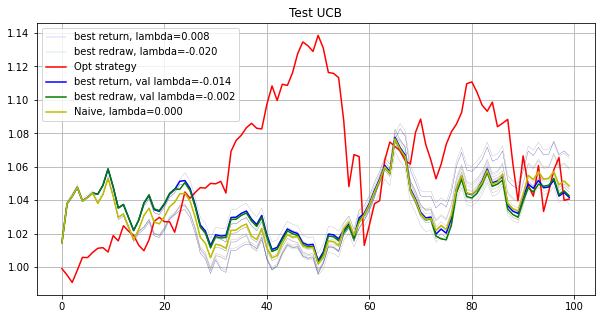

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.2233216815926706e-06
[0.0051 0.0148 0.0117 0.0089 0.0098 0.0117 0.0152 0.0104 0.0122 0.0099
 0.0111 0.0071 0.0085 0.0094 0.007  0.0162 0.0085 0.0097 0.     0.0101
 0.0104 0.007  0.0105 0.0097 0.0123 0.0114 0.012  0.0092 0.0108 0.0124
 0.0088 0.0073 0.0104 0.0085 0.0137 0.0094 0.0101 0.0102 0.0106 0.0133
 0.0034 0.0124 0.0096 0.0065 0.0111 0.0135 0.0103 0.0087 0.011  0.0092
 0.0085 0.0095 0.0109 0.008  0.006

[ 0.0051  0.0148  0.0117  0.0089  0.0098  0.0117  0.0152  0.0105  0.0122
  0.0099  0.0111  0.0071  0.0085  0.0094  0.007   0.0162  0.0085  0.0097
 -0.      0.0101  0.0104  0.007   0.0105  0.0097  0.0123  0.0114  0.012
  0.0092  0.0108  0.0124  0.0088  0.0073  0.0104  0.0085  0.0137  0.0094
  0.0101  0.0102  0.0106  0.0133  0.0034  0.0124  0.0096  0.0065  0.0111
  0.0135  0.0103  0.0087  0.011   0.0092  0.0085  0.0095  0.0109  0.008
  0.0065  0.0112  0.0092  0.0101  0.0125  0.009   0.0117  0.0093  0.0099
  0.0109  0.0093  0.0085  0.005   0.01    0.0125  0.0112  0.0114  0.0104
  0.0104  0.011   0.0071  0.0131  0.0105  0.0092  0.009   0.01    0.0109
  0.0079  0.0114  0.0089  0.0105  0.0096  0.0097  0.0128  0.0124  0.0124
  0.0109  0.0097  0.008   0.0103  0.0076  0.0095  0.0094  0.009   0.0124
  0.0095]
4.39507555193171e-08
[0.0051 0.0148 0.0117 0.0089 0.0098 0.0117 0.0152 0.0105 0.0122 0.0099
 0.0111 0.0071 0.0085 0.0094 0.007  0.0162 0.0085 0.0097 0.     0.0101
 0.0104 0.007  0.0105 0.00

[ 0.0038  0.0159  0.0119  0.0086  0.0096  0.0115  0.0119  0.0108  0.0127
  0.01    0.0117  0.0075  0.0071  0.0098  0.006   0.0166  0.0084  0.0102
 -0.      0.0097  0.0115  0.0068  0.01    0.0094  0.0137  0.0117  0.012
  0.0093  0.0109  0.0127  0.0088  0.0075  0.0106  0.0081  0.0111  0.0092
  0.0104  0.0094  0.0109  0.013   0.0022  0.0133  0.0095  0.0069  0.0103
  0.0135  0.0108  0.0086  0.0118  0.0092  0.0085  0.0095  0.011   0.0081
  0.0068  0.0119  0.0087  0.0102  0.0131  0.0091  0.0117  0.0089  0.0105
  0.01    0.0089  0.0078  0.0077  0.0095  0.0129  0.0116  0.0116  0.0103
  0.0109  0.0113  0.0079  0.0134  0.0103  0.009   0.009   0.0101  0.0114
  0.0073  0.0115  0.0089  0.0101  0.0096  0.0096  0.0128  0.0125  0.0125
  0.0108  0.0098  0.0083  0.01    0.0073  0.0093  0.0098  0.0092  0.0123
  0.01  ]
3.283758966859105e-05
[0.0038 0.0159 0.0119 0.0086 0.0096 0.0115 0.0119 0.0108 0.0127 0.01
 0.0117 0.0075 0.0071 0.0098 0.006  0.0166 0.0084 0.0102 0.     0.0097
 0.0115 0.0068 0.01   0.00

[ 0.0012  0.0144  0.0124  0.0076  0.0095  0.0108  0.0065  0.0109  0.0134
  0.0092  0.0119  0.0068  0.0066  0.0099  0.0057  0.016   0.0085  0.0096
 -0.      0.0088  0.0106  0.0056  0.0092  0.0081  0.0145  0.0128  0.0119
  0.0091  0.0112  0.0137  0.0082  0.0082  0.0106  0.0075  0.011   0.0096
  0.0101  0.0138  0.0124  0.0121  0.0007  0.0136  0.0091  0.0056  0.0111
  0.0143  0.0115  0.0086  0.0121  0.0087  0.0088  0.0086  0.0112  0.0082
  0.0051  0.0116  0.0081  0.0104  0.014   0.0093  0.0125  0.0079  0.0112
  0.0084  0.0096  0.0084  0.0095  0.0095  0.0138  0.0101  0.0127  0.0101
  0.0137  0.0118  0.0082  0.014   0.0106  0.0095  0.0092  0.0097  0.0115
  0.0079  0.0118  0.0088  0.0101  0.0094  0.0092  0.0133  0.0135  0.013
  0.0106  0.0099  0.0101  0.0107  0.0073  0.0088  0.0107  0.0089  0.0128
  0.0106]
5.451193877056795e-05
[ 0.0012  0.0144  0.0124  0.0076  0.0095  0.0108  0.0065  0.0109  0.0134
  0.0092  0.0119  0.0068  0.0066  0.0099  0.0057  0.016   0.0085  0.0096
 -0.      0.0088  0.

[-0.      0.0185  0.0135  0.0062  0.0093  0.0105 -0.      0.0115  0.0152
  0.009   0.0076  0.007   0.0076  0.011   0.0062  0.0164  0.006   0.0095
 -0.      0.0085  0.0107  0.0039  0.0072  0.0086  0.0165  0.0128  0.01
  0.0109  0.0115  0.0152  0.0072  0.009   0.0118  0.0091  0.0075  0.0107
  0.0096  0.0143  0.0121  0.0116 -0.      0.0129  0.0067  0.0009  0.0114
  0.0155  0.0107  0.0055  0.0125  0.0082  0.0096  0.0049  0.012   0.0064
  0.0051  0.0125  0.0104  0.0101  0.0135  0.0108  0.0135  0.0085  0.01
  0.009   0.0082  0.0085  0.008   0.0111  0.0157  0.0113  0.0124  0.0103
  0.0157  0.0103  0.0069  0.0161  0.0106  0.0093  0.0124  0.0113  0.0121
  0.01    0.0128  0.01    0.0083  0.0076  0.0099  0.0141  0.0145  0.0142
  0.0103  0.0098  0.009   0.0097  0.0059  0.0092  0.0159  0.008   0.0147
  0.0118]
7.108268428371019e-05
[ 0.      0.0185  0.0135  0.0062  0.0093  0.0105  0.      0.0115  0.0152
  0.009   0.0076  0.007   0.0076  0.011   0.0062  0.0164  0.006   0.0095
 -0.      0.0085  0.010

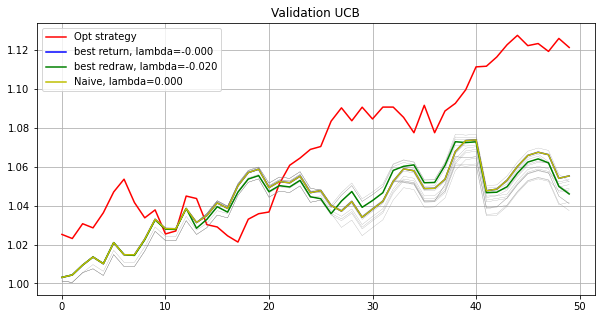

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[0.0027 0.0193 0.012  0.0062 0.0099 0.0083 0.0075 0.0135 0.0116 0.0086
 0.0086 0.0106 0.0086 0.0094 0.012  0.0042 0.0108 0.0059 0.0115 0.0099
 0.0051 0.0055 0.0071 0.0061 0.0136 0.0076 0.0082 0.0093 0.0111 0.0128
 0.0103 0.0123 0.01   0.0093 0.0117 0.0109 0.0101 0.0103 0.015  0.0079
 0.0078 0.01   0.0095 0.0057 0.0094 0.0132 0.0097 0.0066 0.0101 0.009
 0.0078 0.0063 0.0111 0.0108 0.008  0.0106 0.0103 0.0098 0.0109 0.0091
 0.0115 0.0094 0.0091 0.0135 0.0138 0.0139 0.0175 0.0057 0.0128 0.0068
 0.0088 0.0107 0.0092 0.0079 0.0095 0.0134 0.0103 0.0112 0.0127 0.0094
 0.0129 0.0145 0.0113 0.0089 0.0092 0.0093 0.0098 0.0111 0.013  0.0098
 0.0095 0.0098 0.0155 0.0081 0.0068 0.0104 0.0083 0.0094 0.0148 0.01  ]
1.219088001113127e-06
[0.0027 0.0193 0.012  0.0062 0.0099 0.0083 0.0075 0.0135 0.0116 0.0086
 0.0086 0.0106 0.0086 0.0094 0.012  0.0042 0.0108 0.0059 0.0115 0.0099
 0.0051 0.0055 0.0071 0.0061 0.0136 0.0076 0.0082 0.0093 0.0111 0.0128
 0.0103 0.0123 0.01   0.0093 0.0117 0.0109 0.0101 0.010

[0.0026 0.0193 0.012  0.0062 0.0099 0.0083 0.0075 0.0135 0.0116 0.0086
 0.0086 0.0106 0.0086 0.0093 0.012  0.0042 0.0108 0.0059 0.0115 0.0099
 0.0051 0.0055 0.0071 0.0061 0.0136 0.0076 0.0082 0.0093 0.0111 0.0128
 0.0103 0.0123 0.01   0.0093 0.0117 0.0109 0.0101 0.0103 0.015  0.0079
 0.0078 0.01   0.0095 0.0057 0.0094 0.0132 0.0097 0.0066 0.0101 0.009
 0.0078 0.0063 0.0111 0.0108 0.0079 0.0106 0.0103 0.0098 0.0109 0.0091
 0.0115 0.0094 0.0091 0.0135 0.0138 0.0139 0.0175 0.0057 0.0128 0.0068
 0.0088 0.0107 0.0092 0.0079 0.0095 0.0134 0.0103 0.0112 0.0127 0.0094
 0.0129 0.0145 0.0113 0.0089 0.0092 0.0093 0.0098 0.0111 0.013  0.0098
 0.0095 0.0098 0.0155 0.0081 0.0068 0.0104 0.0083 0.0094 0.0148 0.01  ]
0.00015403859408373794
[0.0026 0.0193 0.012  0.0062 0.0099 0.0083 0.0075 0.0135 0.0116 0.0086
 0.0086 0.0106 0.0086 0.0093 0.012  0.0042 0.0108 0.0059 0.0115 0.0099
 0.0051 0.0055 0.0071 0.0061 0.0136 0.0076 0.0082 0.0093 0.0111 0.0128
 0.0103 0.0123 0.01   0.0093 0.0117 0.0109 0.0101 0.01

[0.0009 0.0196 0.0125 0.0059 0.0097 0.0082 0.0036 0.0138 0.0123 0.0083
 0.0085 0.0102 0.0078 0.0096 0.0114 0.0039 0.0114 0.0061 0.0109 0.0095
 0.0049 0.0046 0.0067 0.0058 0.0147 0.0071 0.0087 0.0093 0.0114 0.0132
 0.0101 0.0119 0.01   0.0089 0.013  0.0106 0.0109 0.0091 0.0143 0.0083
 0.0089 0.0116 0.0093 0.005  0.0087 0.0139 0.0094 0.0066 0.0102 0.0089
 0.0078 0.0055 0.0114 0.0107 0.0081 0.011  0.0099 0.0098 0.0117 0.0089
 0.0122 0.0095 0.0092 0.0133 0.0144 0.0133 0.0176 0.0056 0.0134 0.0058
 0.0095 0.0105 0.0091 0.0086 0.0088 0.0139 0.0105 0.0112 0.0129 0.0101
 0.013  0.0143 0.0116 0.0085 0.0101 0.0093 0.0101 0.0117 0.0128 0.0099
 0.0095 0.0106 0.0162 0.0077 0.0069 0.0098 0.0089 0.009  0.0156 0.0106]
4.1683832111287684e-07
[0.0009 0.0196 0.0125 0.0059 0.0097 0.0082 0.0036 0.0138 0.0123 0.0083
 0.0085 0.0102 0.0078 0.0096 0.0114 0.0039 0.0114 0.0061 0.0109 0.0095
 0.0049 0.0046 0.0067 0.0058 0.0147 0.0071 0.0087 0.0093 0.0114 0.0132
 0.0101 0.0119 0.01   0.0089 0.013  0.0106 0.0109 0.0

[-0.      0.0203  0.0133  0.0044  0.0099  0.0074  0.0001  0.0163  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0089  0.0116  0.0055  0.0087  0.0067
  0.0109  0.009   0.0084  0.0025  0.0053  0.0055  0.0159  0.0073  0.0079
  0.0081  0.0119  0.0145  0.01    0.0117  0.0109  0.0102  0.0134  0.0112
  0.0106  0.0087  0.0153  0.0079  0.0057  0.0118  0.0075  0.0034  0.0083
  0.0156  0.0093  0.0072  0.01    0.0083  0.0071  0.0039  0.0119  0.0106
  0.0058  0.0109  0.0084  0.0111  0.0129  0.0066  0.0133  0.0096  0.0085
  0.0115  0.0134  0.0145  0.0151  0.0037  0.0152  0.0052  0.0102  0.0102
  0.0092  0.0077  0.0111  0.0162  0.0109  0.0111  0.0142  0.0112  0.0149
  0.0137  0.0128  0.0087  0.0107  0.0085  0.0099  0.0132  0.0145  0.0104
  0.0092  0.0108  0.0151  0.0075  0.0073  0.0095  0.0109  0.0086  0.0172
  0.0111]
0.00010491022390031934
[-0.      0.0203  0.0133  0.0044  0.0099  0.0074  0.0001  0.0163  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0089  0.0116  0.0055  0.0087  0.0067
  0.0109  0.009   

[0.     0.0203 0.0133 0.0044 0.0099 0.0074 0.     0.0163 0.0141 0.0089
 0.0077 0.0091 0.0067 0.0089 0.0116 0.0055 0.0087 0.0067 0.011  0.009
 0.0084 0.0025 0.0053 0.0055 0.0159 0.0073 0.0079 0.0081 0.0118 0.0145
 0.01   0.0117 0.0109 0.0102 0.0134 0.0112 0.0106 0.0087 0.0153 0.0079
 0.0057 0.0118 0.0075 0.0034 0.0083 0.0156 0.0093 0.0071 0.01   0.0083
 0.0071 0.0039 0.0119 0.0106 0.0058 0.0109 0.0084 0.0111 0.0129 0.0067
 0.0133 0.0096 0.0085 0.0115 0.0134 0.0145 0.0151 0.0037 0.0151 0.0052
 0.0102 0.0102 0.0092 0.0077 0.0111 0.0162 0.0109 0.0111 0.0142 0.0112
 0.0149 0.0137 0.0129 0.0087 0.0107 0.0085 0.0099 0.0132 0.0146 0.0104
 0.0092 0.0108 0.0152 0.0076 0.0073 0.0095 0.0109 0.0086 0.0172 0.0112]
5.611808913765804e-05
[0.     0.0203 0.0133 0.0044 0.0099 0.0074 0.     0.0163 0.0141 0.0089
 0.0077 0.0091 0.0067 0.0089 0.0116 0.0055 0.0087 0.0067 0.011  0.009
 0.0084 0.0025 0.0053 0.0055 0.0159 0.0073 0.0079 0.0081 0.0118 0.0145
 0.01   0.0117 0.0109 0.0102 0.0134 0.0112 0.0106 0.0087

[-0.      0.0203  0.0133  0.0044  0.0099  0.0073  0.      0.0162  0.0141
  0.0089  0.0078  0.0091  0.0067  0.0089  0.0116  0.0055  0.0087  0.0067
  0.011   0.009   0.0084  0.0025  0.0053  0.0055  0.0159  0.0073  0.0079
  0.0081  0.0119  0.0145  0.0099  0.0117  0.0109  0.0102  0.0134  0.0112
  0.0106  0.0087  0.0153  0.0079  0.0057  0.0118  0.0075  0.0034  0.0083
  0.0156  0.0093  0.0071  0.01    0.0083  0.0071  0.0039  0.0119  0.0106
  0.0058  0.0109  0.0084  0.0111  0.0129  0.0067  0.0133  0.0096  0.0085
  0.0115  0.0134  0.0145  0.0151  0.0037  0.0151  0.0052  0.0102  0.0102
  0.0092  0.0077  0.0111  0.0162  0.0109  0.0111  0.0142  0.0112  0.0149
  0.0137  0.0129  0.0087  0.0107  0.0085  0.0098  0.0132  0.0146  0.0104
  0.0092  0.0108  0.0152  0.0076  0.0073  0.0095  0.0109  0.0086  0.0172
  0.0111]
5.4516420393194503e-05
[-0.      0.0203  0.0133  0.0044  0.0099  0.0073  0.      0.0162  0.0141
  0.0089  0.0078  0.0091  0.0067  0.0089  0.0116  0.0055  0.0087  0.0067
  0.011   0.009   

[0.     0.0203 0.0133 0.0044 0.0099 0.0074 0.     0.0162 0.0141 0.0089
 0.0077 0.0091 0.0067 0.0089 0.0116 0.0055 0.0087 0.0067 0.011  0.009
 0.0084 0.0025 0.0053 0.0055 0.0159 0.0073 0.0079 0.0081 0.0119 0.0145
 0.01   0.0117 0.0109 0.0102 0.0134 0.0112 0.0106 0.0087 0.0153 0.0079
 0.0057 0.0118 0.0075 0.0034 0.0083 0.0156 0.0093 0.0071 0.01   0.0083
 0.0071 0.0039 0.0119 0.0106 0.0058 0.0109 0.0084 0.0111 0.0129 0.0067
 0.0133 0.0096 0.0085 0.0115 0.0134 0.0145 0.0151 0.0037 0.0152 0.0052
 0.0102 0.0102 0.0092 0.0077 0.0111 0.0162 0.0109 0.0111 0.0142 0.0112
 0.0149 0.0137 0.0129 0.0087 0.0107 0.0085 0.0099 0.0132 0.0146 0.0104
 0.0092 0.0108 0.0151 0.0076 0.0073 0.0095 0.0109 0.0086 0.0172 0.0112]
0.00010046654137292003
[-0.      0.0203  0.0133  0.0044  0.0099  0.0074  0.      0.0162  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0089  0.0116  0.0055  0.0087  0.0067
  0.011   0.009   0.0084  0.0025  0.0053  0.0055  0.0159  0.0073  0.0079
  0.0081  0.0119  0.0145  0.01    0.0117  0.0109

[-0.      0.0203  0.0133  0.0044  0.0099  0.0074 -0.      0.0162  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0089  0.0116  0.0055  0.0087  0.0066
  0.011   0.009   0.0084  0.0025  0.0053  0.0055  0.0159  0.0073  0.0079
  0.0081  0.0118  0.0145  0.01    0.0117  0.0109  0.0102  0.0134  0.0112
  0.0106  0.0087  0.0153  0.0079  0.0057  0.0118  0.0075  0.0034  0.0083
  0.0156  0.0093  0.0071  0.01    0.0083  0.0071  0.0039  0.0119  0.0106
  0.0058  0.0109  0.0084  0.0111  0.0129  0.0067  0.0133  0.0096  0.0085
  0.0115  0.0134  0.0145  0.0151  0.0037  0.0152  0.0052  0.0102  0.0102
  0.0092  0.0077  0.0111  0.0162  0.0109  0.0111  0.0142  0.0112  0.0149
  0.0137  0.0129  0.0087  0.0107  0.0085  0.0099  0.0132  0.0146  0.0104
  0.0092  0.0108  0.0151  0.0076  0.0073  0.0095  0.0109  0.0086  0.0172
  0.0112]
9.02378448748702e-07
[-0.      0.0203  0.0133  0.0044  0.0099  0.0074 -0.      0.0162  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0089  0.0116  0.0055  0.0087  0.0066
  0.011   0.009   0.

[0.     0.0204 0.0133 0.0044 0.0099 0.0074 0.     0.0162 0.0141 0.0089
 0.0077 0.0091 0.0067 0.0089 0.0116 0.0055 0.0087 0.0066 0.011  0.009
 0.0084 0.0025 0.0053 0.0055 0.0159 0.0073 0.0079 0.0081 0.0118 0.0145
 0.01   0.0117 0.0109 0.0102 0.0134 0.0112 0.0106 0.0087 0.0153 0.0079
 0.0057 0.0118 0.0075 0.0034 0.0083 0.0156 0.0093 0.0071 0.01   0.0083
 0.0071 0.0039 0.0119 0.0106 0.0058 0.0109 0.0084 0.0111 0.0129 0.0067
 0.0133 0.0096 0.0085 0.0115 0.0134 0.0145 0.0151 0.0037 0.0151 0.0052
 0.0102 0.0102 0.0092 0.0077 0.0111 0.0162 0.0109 0.0111 0.0142 0.0112
 0.0149 0.0137 0.0129 0.0087 0.0107 0.0085 0.0099 0.0132 0.0146 0.0104
 0.0092 0.0108 0.0151 0.0076 0.0073 0.0095 0.0109 0.0086 0.0172 0.0112]
2.8408037743976757e-05
[0.     0.0204 0.0133 0.0044 0.0099 0.0074 0.     0.0162 0.0141 0.0089
 0.0077 0.0091 0.0067 0.0089 0.0116 0.0055 0.0087 0.0066 0.011  0.009
 0.0084 0.0025 0.0053 0.0055 0.0159 0.0073 0.0079 0.0081 0.0118 0.0145
 0.01   0.0117 0.0109 0.0102 0.0134 0.0112 0.0106 0.008

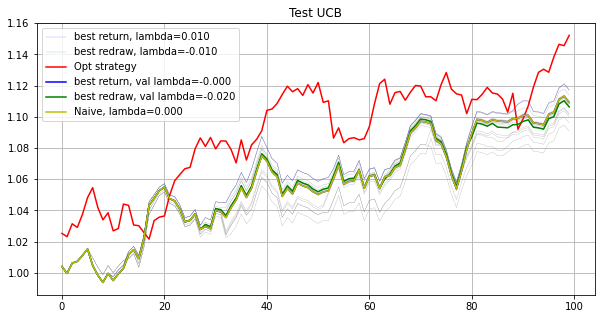

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.5707845900034267e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
4.620631968087728e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
9.526901930921594e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.0074 0.0112 0.0113 0.0103 0.0097 0.0109 0.0103 0.0103 0.0098 0.0105
 0.01   0.0106 0.0095 0.0074 0.0083 0.0118 0.0096 0.0105 0.0081 0.0103
 0.01   0.0104 0.0096 0.0094 0.0104 0.0125 0.0103 0.0098 0.0095 0.0111
 0.01   0.0102 0.011  0.009  0.0087 0.0106 0.0092 0.0099 0.0109 0.0084
 0.0101 0.0089 0.0101 0.0107 0.0078 0.0118 0.0091 0.0093 0.0075 0.0118
 0.0108 0.0103 0.0101 0.0098 0.0092 0.0115 0.0083 0.0114 0.0106 0.0086
 0.0103 0.0111 0.0092 0.012  0.0104 0.0096 0.0097 0.0122 0.0114 0.0078
 0.0094 0.0102 0.01   0.0127 0.009  0.0113 0.0089 0.0108 0.0088 0.0086
 0.0096 0.0099 0.0115 0.0108 0.0087 0.0096 0.01   0.0093 0.0102 0.0112
 0.0081 0.0112 0.009  0.0103 0.0097 0.01   0.0097 0.01   0.0107 0.0107]
2.1067331570142483e-07
[0.0074 0.0112 0.0113 0.0103 0.0097 0.0109 0.0103 0.0103 0.0098 0.0105
 0.01   0.0106 0.0095 0.0074 0.0083 0.0118 0.0096 0.0105 0.0081 0.0103
 0.01   0.0104 0.0096 0.0094 0.0104 0.0125 0.0103 0.0098 0.0095 0.0111
 0.01   0.0102 0.011  0.009  0.0087 0.0106 0.0092 0.0

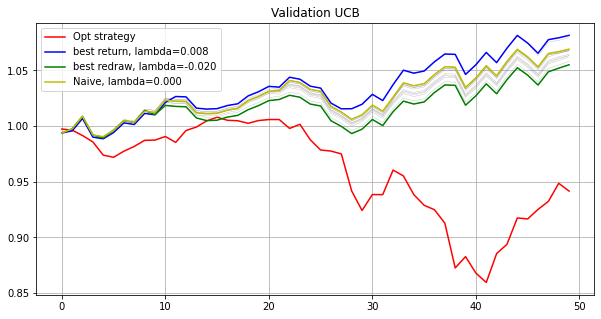

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
2.708591875094646e-09
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
3.82066841661706e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.2227093912081308e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.2018173167111651e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
5.133012751309604e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
7.231453482935135e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

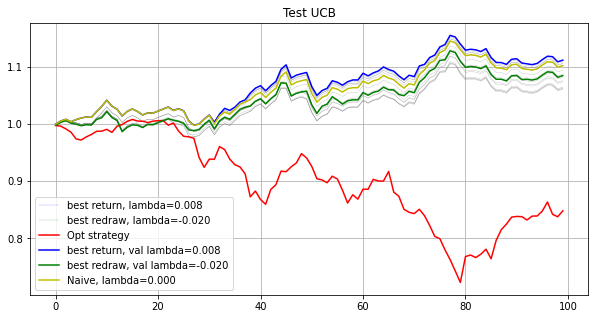

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
6.308863516463203e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.075586985080021e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.1860898826893812e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.0104 0.01   0.01   0.0096 0.0099 0.01   0.01   0.0097 0.01   0.0099
 0.0096 0.0102 0.01   0.0098 0.0097 0.0099 0.0109 0.0093 0.0099 0.0097
 0.0106 0.0104 0.0099 0.0102 0.0099 0.0095 0.0102 0.0101 0.0102 0.0098
 0.01   0.0101 0.0096 0.0102 0.0101 0.0102 0.0098 0.0097 0.0101 0.0102
 0.0102 0.0099 0.0098 0.0099 0.0094 0.0099 0.01   0.0097 0.0099 0.0104
 0.0102 0.0099 0.0099 0.0103 0.0106 0.01   0.01   0.0105 0.0101 0.0101
 0.0098 0.01   0.01   0.01   0.0098 0.0104 0.01   0.01   0.0097 0.0097
 0.0102 0.0102 0.01   0.0093 0.0102 0.0099 0.0098 0.0102 0.01   0.0101
 0.0104 0.0096 0.0101 0.01   0.0104 0.0095 0.0099 0.0101 0.0097 0.0101
 0.01   0.01   0.0101 0.0108 0.01   0.0104 0.0095 0.01   0.01   0.01  ]
7.212003407728457e-06
[0.0104 0.01   0.01   0.0096 0.0099 0.01   0.01   0.0097 0.01   0.0099
 0.0096 0.0102 0.01   0.0098 0.0097 0.0099 0.0109 0.0093 0.0099 0.0097
 0.0106 0.0104 0.0099 0.0102 0.0099 0.0095 0.0102 0.0101 0.0102 0.0098
 0.01   0.0101 0.0096 0.0102 0.0101 0.0102 0.0098 0.00

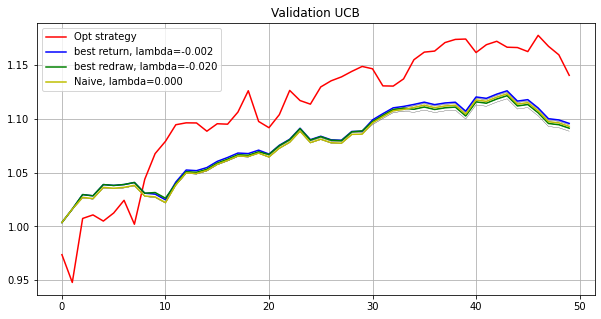

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.1243620659344422e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
2.0243985604170844e-08
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
6.270849611760346e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.0099 0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01  ]
0.0012357035118221692
[0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.0099 0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0

[0.008  0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.0099 0.01   0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0102
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0101 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.0097 0.0099
 0.0101 0.0097 0.01   0.01   0.0106 0.0106 0.0103 0.0102 0.0097 0.0101
 0.0101 0.0099 0.01   0.0101 0.0093 0.0102 0.01   0.0105 0.0099 0.0098
 0.0101 0.0112 0.0101 0.0098 0.0091 0.0104 0.0104 0.0103 0.0102 0.01
 0.0101 0.0102 0.0099 0.0108 0.01   0.01   0.0096 0.0098 0.0097 0.0104
 0.011  0.0107 0.0099 0.0096 0.01   0.0098 0.0099 0.01   0.0103 0.0106
 0.01   0.0099 0.0104 0.0102 0.0102 0.0101 0.0091 0.01   0.0103 0.0101]
9.6590110072476e-06
[0.008  0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.0099 0.01   0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0102
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0101 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.009

[0.008  0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.01   0.01   0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0102
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0101 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.0097 0.0099
 0.0101 0.0097 0.01   0.01   0.0106 0.0106 0.0103 0.0102 0.0097 0.0101
 0.0101 0.0099 0.01   0.0101 0.0093 0.0102 0.01   0.0105 0.0099 0.0098
 0.0101 0.0112 0.0101 0.0098 0.0091 0.0104 0.0104 0.0103 0.0102 0.01
 0.0101 0.0102 0.0099 0.0108 0.01   0.01   0.0096 0.0098 0.0097 0.0104
 0.011  0.0107 0.0099 0.0096 0.01   0.0098 0.0099 0.01   0.0103 0.0106
 0.01   0.0099 0.0104 0.0102 0.0102 0.0101 0.0091 0.01   0.0103 0.0101]
1.948803735725424e-06
[0.008  0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.0099 0.01   0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0102
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0101 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.0

[0.0081 0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.0099 0.01   0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0102
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0102 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.0097 0.0099
 0.0101 0.0097 0.01   0.01   0.0106 0.0106 0.0103 0.0102 0.0097 0.0101
 0.0101 0.0099 0.01   0.0101 0.0093 0.0102 0.01   0.0105 0.0099 0.0098
 0.0101 0.0112 0.0101 0.0098 0.0091 0.0104 0.0104 0.0103 0.0102 0.01
 0.01   0.0102 0.0099 0.0108 0.01   0.01   0.0096 0.0098 0.0097 0.0104
 0.011  0.0107 0.0099 0.0096 0.01   0.0098 0.0099 0.01   0.0103 0.0106
 0.01   0.0099 0.0104 0.0103 0.0102 0.0101 0.0091 0.01   0.0103 0.0101]
1.2791229606849003e-06
[0.0081 0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.0099 0.01   0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0102
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0102 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.

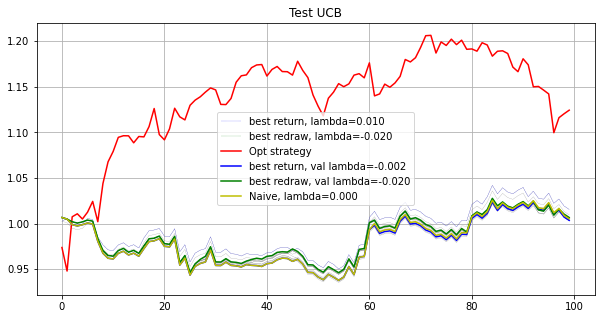

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.65905274
Mean return: 1.00063301
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


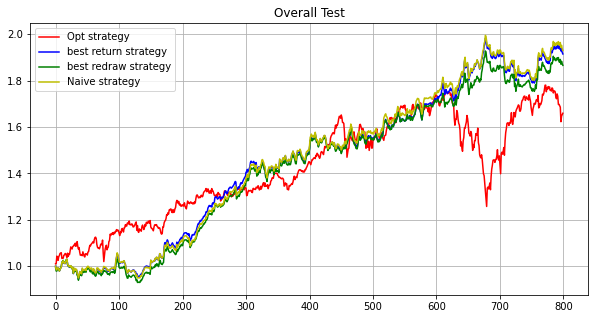

In [5]:
lb = 5
maxiter = 8000
subn = 100
path ='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
eps = 1.0001
delta = 0.008
run(path, maxiter, subn, lb, c=0.001, eps=eps, delta=delta, testv=np.arange(-0.02, 0.0100001, 0.002))

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[0.0101 0.0099 0.0098 0.0097 0.0115 0.0104 0.0093 0.0094 0.0101 0.0107
 0.0101 0.0097 0.0099 0.0095 0.0102 0.0089 0.0094 0.0101 0.0087 0.0093
 0.0097 0.0131 0.0098 0.0081 0.0098 0.0103 0.0101 0.009  0.0097 0.0089
 0.0093 0.0105 0.0103 0.0095 0.0108 0.0098 0.0095 0.0108 0.0099 0.0094
 0.0106 0.0097 0.0109 0.0085 0.011  0.0104 0.0107 0.009  0.0101 0.013
 0.0105 0.0097 0.0095 0.01   0.0103 0.0094 0.01   0.0097 0.009  0.01
 0.0097 0.0114 0.0112 0.0098 0.0094 0.0099 0.0098 0.0103 0.0097 0.0109
 0.0104 0.01   0.0103 0.0101 0.0097 0.0097 0.0095 0.0101 0.01   0.0101
 0.0097 0.0096 0.0099 0.0095 0.0098 0.01   0.01   0.0093 0.0102 0.0105
 0.0097 0.0101 0.0104 0.0104 0.0102 0.01   0.0105 0.0099 0.0101 0.0106]
0.04899755012545119
[0.0102 0.0099 0.0094 0.0083 0.0117 0.0103 0.01   0.0098 0.0102 0.0103
 0.0102 0.0095 0.0098 0.0088 0.0099 0.0076 0.008  0.0099 0.0085 0.0087
 0.0116 0.0132 0.01   0.0067 0.0096 0.0095 0.0098 0

[0.0102 0.0101 0.0076 0.0028 0.0109 0.0129 0.0094 0.0082 0.0135 0.0087
 0.0116 0.009  0.008  0.0073 0.0075 0.0071 0.0013 0.0105 0.0008 0.0061
 0.0176 0.0097 0.0105 0.0043 0.006  0.0117 0.0068 0.0115 0.0121 0.0077
 0.0074 0.0132 0.013  0.0135 0.0105 0.011  0.0057 0.0126 0.0189 0.0087
 0.013  0.0111 0.0097 0.     0.0129 0.0112 0.01   0.0029 0.0103 0.0072
 0.015  0.009  0.0087 0.0103 0.0146 0.0065 0.0105 0.0099 0.0106 0.013
 0.0112 0.0083 0.009  0.0111 0.0074 0.014  0.0138 0.0127 0.0153 0.0106
 0.0132 0.0079 0.0091 0.0116 0.0089 0.0096 0.0101 0.0102 0.0098 0.0122
 0.0131 0.007  0.0134 0.0071 0.0103 0.0105 0.0111 0.0079 0.0115 0.011
 0.0095 0.0121 0.0135 0.0119 0.0133 0.0099 0.015  0.0008 0.0099 0.0127]
0.00013699201993591916
[0.0102 0.0101 0.0076 0.0028 0.0109 0.0129 0.0094 0.0082 0.0135 0.0087
 0.0116 0.009  0.008  0.0073 0.0075 0.0071 0.0013 0.0105 0.0008 0.0061
 0.0176 0.0096 0.0105 0.0043 0.006  0.0117 0.0068 0.0115 0.0121 0.0077
 0.0074 0.0132 0.013  0.0135 0.0105 0.011  0.0057 0.012

[ 0.0103  0.0102  0.0073  0.      0.0086  0.0145  0.0083  0.0087  0.0148
  0.0084  0.0115  0.0088  0.0078  0.0076  0.0069  0.0055 -0.      0.0105
 -0.      0.0062  0.0165  0.0035  0.0114  0.004   0.0054  0.0132  0.0053
  0.0161  0.0126  0.0072  0.0047  0.0139  0.014   0.0156  0.011   0.0111
  0.0049  0.0146  0.0216  0.0082  0.0126  0.0101  0.0118 -0.      0.0166
  0.0111  0.0094  0.0009  0.0104  0.0065  0.0158  0.0096  0.008   0.0103
  0.0154  0.0067  0.0108  0.0093  0.01    0.0158  0.0093  0.0093  0.01
  0.0102  0.0068  0.0139  0.0123  0.0131  0.0153  0.0106  0.014   0.0085
  0.0096  0.0112  0.0086  0.0109  0.0095  0.0102  0.0099  0.013   0.0123
  0.0067  0.0145  0.0071  0.0097  0.0108  0.0113  0.0055  0.0121  0.0105
  0.0084  0.0124  0.0145  0.0121  0.0149  0.0101  0.0162  0.      0.01
  0.013 ]
8.135114356528268e-06
[ 0.0103  0.0102  0.0073  0.      0.0086  0.0145  0.0083  0.0087  0.0148
  0.0084  0.0115  0.0088  0.0078  0.0076  0.0068  0.0055 -0.      0.0105
  0.      0.0062  0.016

[ 0.0103  0.0102  0.0073 -0.      0.0086  0.0145  0.0083  0.0087  0.0148
  0.0084  0.0115  0.0088  0.0078  0.0076  0.0068  0.0055  0.      0.0105
  0.      0.0062  0.0165  0.0035  0.0114  0.004   0.0054  0.0132  0.0053
  0.0161  0.0126  0.0072  0.0047  0.0139  0.014   0.0156  0.011   0.0111
  0.0049  0.0146  0.0216  0.0082  0.0126  0.0101  0.0118  0.      0.0166
  0.0111  0.0094  0.0009  0.0104  0.0065  0.0158  0.0096  0.008   0.0103
  0.0154  0.0067  0.0108  0.0093  0.01    0.0158  0.0093  0.0093  0.01
  0.0102  0.0068  0.0139  0.0123  0.0131  0.0153  0.0106  0.014   0.0085
  0.0097  0.0112  0.0086  0.0109  0.0095  0.0102  0.0099  0.013   0.0123
  0.0067  0.0145  0.0071  0.0097  0.0108  0.0113  0.0055  0.0121  0.0105
  0.0084  0.0124  0.0145  0.0121  0.0149  0.0101  0.0162  0.      0.01
  0.013 ]
3.577374680044486e-05
[ 0.0103  0.0102  0.0073 -0.      0.0086  0.0145  0.0083  0.0087  0.0148
  0.0084  0.0115  0.0088  0.0078  0.0076  0.0068  0.0055  0.      0.0105
  0.      0.0062  0.016

[ 0.0103  0.0106  0.0049 -0.      0.0007  0.0194  0.0022  0.0117  0.0163
  0.0057  0.0121  0.0076  0.0068  0.0071  0.0073  0.0009  0.      0.0098
 -0.      0.0014  0.017   0.01    0.0051  0.0002  0.0094  0.0147  0.0041
  0.0104  0.0155  0.0052  0.0001  0.0148  0.0179  0.0116  0.0058  0.0119
  0.0007  0.0177  0.0208  0.0043  0.0152  0.0067  0.0136  0.      0.0178
  0.0095  0.0186  0.0015  0.0092  0.0002  0.0204  0.0106  0.0074  0.008
  0.0189  0.0031  0.0122  0.0075  0.0027  0.009   0.0024  0.0112  0.0155
  0.0091  0.0029  0.0207  0.0093  0.0155  0.0169  0.0103  0.0184  0.0096
  0.0137  0.0113  0.0088  0.0111  0.0072  0.0091  0.0104  0.0192  0.0105
  0.0059  0.0202  0.0067  0.0137  0.0118  0.0124  0.0023  0.0146  0.0086
  0.0059  0.0141  0.0174  0.0169  0.0165  0.0109  0.0216  0.0038  0.0108
  0.0184]
5.814040960471346e-07
[ 0.0103  0.0106  0.0049 -0.      0.0007  0.0194  0.0022  0.0117  0.0163
  0.0057  0.0121  0.0076  0.0068  0.0071  0.0073  0.0009  0.      0.0098
 -0.      0.0014  0.

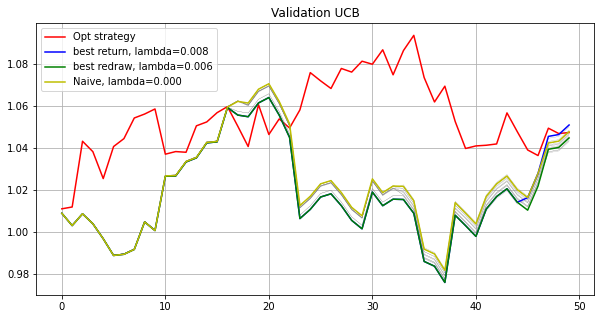

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[0.01   0.0102 0.0074 0.0044 0.0145 0.0121 0.008  0.0062 0.0093 0.0081
 0.0109 0.0051 0.0097 0.0111 0.0115 0.0076 0.0041 0.0117 0.0041 0.0108
 0.0114 0.0023 0.0093 0.0053 0.0091 0.0109 0.0086 0.0188 0.0121 0.0116
 0.0051 0.011  0.0121 0.0145 0.0107 0.0108 0.0086 0.012  0.0131 0.0099
 0.013  0.0122 0.0092 0.0038 0.0116 0.0086 0.0069 0.0083 0.0101 0.0098
 0.0131 0.0095 0.009  0.0125 0.0136 0.0086 0.0106 0.0086 0.0121 0.0125
 0.0057 0.0118 0.0094 0.0095 0.0086 0.0113 0.0121 0.0093 0.0158 0.0098
 0.0117 0.0091 0.0114 0.0101 0.0091 0.0111 0.011  0.01   0.0097 0.0143
 0.0096 0.0091 0.0122 0.0065 0.0111 0.0105 0.0105 0.0059 0.0105 0.0119
 0.0095 0.0122 0.0123 0.0111 0.0109 0.0102 0.0133 0.0024 0.0102 0.0116]
0.04079011025423774
[0.01   0.0102 0.0073 0.0026 0.0146 0.0124 0.0082 0.0062 0.0093 0.008
 0.011  0.0053 0.0097 0.0112 0.0116 0.0076 0.0038 0.012  0.0041 0.0106
 0.0108 0.0022 0.0093 0.005  0.009  0.011  0.0087 0.0188 0.0121 0.0115
 0.005  0.0113 0.0122 0.0144 0.0107 0.0108 0.0085 0.0121 

[ 0.0102  0.0103  0.0068  0.      0.0121  0.0137  0.0058  0.0063  0.0105
  0.0038  0.0113  0.0045  0.0096  0.0109  0.0126  0.0073  0.002   0.0144
  0.0031  0.0099  0.0104 -0.      0.0098  0.0035  0.0083  0.0107  0.0091
  0.0213  0.0126  0.0097  0.0031  0.0131  0.0129  0.0151  0.009   0.0109
  0.0077  0.0132  0.0152  0.0084  0.0142  0.012   0.0088  0.0038  0.0111
  0.0089  0.006   0.0095  0.01    0.0072  0.0146  0.0106  0.0084  0.0129
  0.0144  0.0089  0.0111  0.0079  0.0135  0.0132  0.007   0.0133  0.0087
  0.0094  0.0086  0.0111  0.0119  0.0087  0.0172  0.0107  0.0126  0.0082
  0.0122  0.0104  0.0089  0.0114  0.0106  0.0105  0.0095  0.0163  0.0097
  0.0085  0.013   0.0061  0.011   0.0107  0.0107  0.0068  0.0115  0.0133
  0.0097  0.0127  0.0133  0.0113  0.0111  0.0104  0.0143 -0.      0.0103
  0.0124]
7.298867541151551e-06
[ 0.0102  0.0103  0.0068  0.      0.0121  0.0137  0.0058  0.0063  0.0105
  0.0038  0.0113  0.0045  0.0096  0.0109  0.0126  0.0073  0.002   0.0144
  0.0031  0.0099  0

[ 0.011   0.0104  0.0049 -0.      0.0096  0.0132  0.0096  0.0128  0.0131
  0.      0.0098  0.0034  0.0092  0.0091  0.0106  0.0052 -0.      0.0165
 -0.      0.0074  0.0087 -0.      0.0037 -0.      0.0064  0.0134  0.0102
  0.0197  0.0099  0.0093  0.0036  0.0182  0.0158  0.0176  0.0099  0.011
  0.0048  0.0108  0.0137  0.0092  0.0163  0.0119  0.0103  0.0011  0.0117
  0.01    0.0057  0.0054  0.0084  0.0045  0.018   0.0153  0.0038  0.0119
  0.0182  0.0034  0.0117  0.0078  0.0125  0.0117  0.0031  0.0081  0.0116
  0.0071  0.0036  0.0131  0.0153  0.0107  0.0166  0.0158  0.0159  0.005
  0.0116  0.0112  0.0078  0.0119  0.0105  0.0093  0.0097  0.0165  0.01
  0.0074  0.0162  0.0013  0.011   0.0116  0.011   0.0061  0.0138  0.0218
  0.0112  0.0157  0.016   0.012   0.0097  0.011   0.0223 -0.      0.0115
  0.0151]
0.0006845285651972938
[0.011  0.0105 0.0044 0.0006 0.0094 0.0129 0.0066 0.0117 0.0142 0.
 0.01   0.0009 0.0091 0.0097 0.0098 0.0044 0.     0.0166 0.     0.0067
 0.0082 0.0027 0.002  0.     0.

[ 0.0112  0.0104  0.0044  0.0007  0.0094  0.0129  0.0065  0.0117  0.0142
 -0.      0.0101  0.0009  0.0091  0.0097  0.0098  0.0044 -0.      0.0166
 -0.      0.0066  0.0082  0.0027  0.002   0.      0.0069  0.0137  0.0102
  0.0168  0.0101  0.0082  0.0023  0.0221  0.0166  0.0204  0.0075  0.0111
  0.006   0.0105  0.0152  0.008   0.0168  0.0126  0.0107  0.      0.0084
  0.01    0.0057  0.0052  0.0087  0.0043  0.0193  0.0153  0.0039  0.0124
  0.0187  0.0035  0.0119  0.0072  0.0131  0.0116  0.0031  0.0099  0.0105
  0.0072  0.0021  0.0138  0.0133  0.0101  0.0187  0.0172  0.0164  0.0038
  0.0109  0.0112  0.0075  0.0133  0.0129  0.0095  0.0096  0.0174  0.0098
  0.0074  0.0174  0.0016  0.0109  0.0118  0.0114  0.0049  0.0134  0.0209
  0.0111  0.0162  0.0168  0.0124  0.009   0.0107  0.023   0.      0.0116
  0.0154]
0.00012961016647443827
[ 0.0112  0.0104  0.0044  0.0007  0.0094  0.0129  0.0065  0.0117  0.0142
 -0.      0.0101  0.0009  0.0091  0.0097  0.0098  0.0044 -0.      0.0166
 -0.      0.0066  

[ 0.0111  0.0104  0.0033 -0.      0.0052  0.0146  0.0054  0.0126  0.0134
  0.0001  0.0106  0.      0.0086  0.0097  0.0089  0.0047  0.      0.0184
 -0.      0.0043  0.0094  0.0032  0.0045 -0.      0.007   0.0133  0.0099
  0.0174  0.0106  0.0087  0.002   0.0232  0.0177  0.0181  0.0057  0.0111
  0.0063  0.0115  0.0154  0.0074  0.0175  0.0116  0.0112  0.0003  0.0077
  0.0099  0.0072  0.0064  0.0081  0.001   0.0209  0.0145  0.0027  0.0127
  0.0202  0.0015  0.012   0.0078  0.0127  0.0102  0.0027  0.0114  0.0123
  0.0063  0.0018  0.0139  0.0148  0.0103  0.0187  0.0178  0.0175  0.0028
  0.0112  0.0109  0.0072  0.0125  0.0155  0.0096  0.0093  0.0176  0.01
  0.0069  0.0174  0.0014  0.0119  0.0119  0.0113  0.0042  0.0141  0.0183
  0.0111  0.0165  0.0177  0.0123  0.0086  0.0106  0.0238 -0.      0.0118
  0.0165]
8.493293905967623e-05
[ 0.0111  0.0105  0.0033 -0.      0.0052  0.0146  0.0054  0.0126  0.0134
  0.0001  0.0106  0.      0.0086  0.0097  0.0089  0.0047  0.      0.0184
 -0.      0.0043  0.0

[ 0.0111  0.0104  0.0033  0.      0.0052  0.0146  0.0054  0.0126  0.0134
  0.0001  0.0106 -0.      0.0086  0.0097  0.0089  0.0047  0.      0.0184
  0.      0.0043  0.0094  0.0032  0.0045  0.      0.007   0.0133  0.0099
  0.0174  0.0106  0.0087  0.002   0.0232  0.0177  0.0181  0.0056  0.0111
  0.0063  0.0115  0.0154  0.0074  0.0175  0.0116  0.0112  0.0003  0.0077
  0.0099  0.0072  0.0064  0.0081  0.001   0.0209  0.0145  0.0027  0.0127
  0.0202  0.0015  0.012   0.0078  0.0127  0.0102  0.0027  0.0114  0.0123
  0.0063  0.0018  0.0139  0.0148  0.0103  0.0188  0.0178  0.0175  0.0028
  0.0112  0.0109  0.0072  0.0125  0.0155  0.0096  0.0093  0.0176  0.01
  0.0069  0.0174  0.0014  0.0119  0.0119  0.0112  0.0043  0.0141  0.0183
  0.0111  0.0165  0.0177  0.0123  0.0087  0.0106  0.0238 -0.      0.0118
  0.0165]
6.267458191188443e-05
[ 0.0111  0.0104  0.0033 -0.      0.0052  0.0146  0.0054  0.0126  0.0134
  0.0001  0.0106 -0.      0.0086  0.0097  0.0089  0.0047 -0.      0.0184
 -0.      0.0043  0.0

[ 0.0111  0.0104  0.0033 -0.      0.0052  0.0146  0.0054  0.0126  0.0134
  0.0001  0.0106  0.      0.0086  0.0097  0.0089  0.0047 -0.      0.0184
 -0.      0.0043  0.0094  0.0032  0.0045  0.      0.007   0.0133  0.0099
  0.0174  0.0106  0.0087  0.002   0.0232  0.0177  0.0181  0.0056  0.0111
  0.0063  0.0115  0.0154  0.0074  0.0175  0.0116  0.0112  0.0004  0.0077
  0.0099  0.0072  0.0064  0.0081  0.001   0.0209  0.0145  0.0027  0.0127
  0.0202  0.0015  0.012   0.0078  0.0127  0.0102  0.0027  0.0114  0.0123
  0.0063  0.0018  0.0139  0.0148  0.0103  0.0187  0.0178  0.0175  0.0028
  0.0112  0.0109  0.0072  0.0125  0.0155  0.0096  0.0093  0.0176  0.01
  0.0069  0.0174  0.0014  0.0119  0.0119  0.0112  0.0043  0.0141  0.0183
  0.0111  0.0165  0.0177  0.0123  0.0087  0.0106  0.0238 -0.      0.0118
  0.0165]
3.0932829807501875e-05
[ 0.0111  0.0104  0.0033 -0.      0.0052  0.0146  0.0054  0.0126  0.0134
  0.0001  0.0106 -0.      0.0086  0.0097  0.0089  0.0047 -0.      0.0184
 -0.      0.0043  0.

[ 0.012   0.0105  0.0016  0.0043  0.      0.0172  0.0062  0.0116  0.0147
  0.      0.0112  0.0006  0.0081  0.0079  0.007   0.0005  0.      0.0219
 -0.      0.0015  0.0155  0.0056  0.0036  0.      0.0078  0.0145  0.007
  0.0165  0.0112  0.0065  0.      0.0203  0.0199  0.018   0.0041  0.0128
  0.0034  0.0102  0.0146  0.0043  0.0187  0.0107  0.0106 -0.      0.0076
  0.0098  0.0081  0.0054  0.0057 -0.      0.024   0.0143  0.0007  0.0139
  0.0227  0.      0.0126  0.0081  0.0087  0.0092  0.0018  0.0117  0.0128
  0.0035  0.      0.0134  0.0139  0.0111  0.0206  0.018   0.0194  0.0009
  0.0122  0.0118  0.0067  0.0122  0.0167  0.0095  0.0098  0.02    0.012
  0.0061  0.0192  0.0004  0.0123  0.0125  0.0113  0.0004  0.0169  0.0186
  0.0117  0.0185  0.0197  0.0144  0.0082  0.0109  0.0281  0.      0.0112
  0.0183]
0.09698635815732014
[ 0.012   0.0105  0.0016  0.0043 -0.      0.0172  0.0062  0.0116  0.0147
  0.      0.0112  0.0006  0.0081  0.0079  0.007   0.0005  0.      0.0219
 -0.      0.0015  0.015

[ 0.0125  0.0104  0.      0.0018  0.      0.0207  0.011   0.0138  0.0134
  0.002   0.0115 -0.      0.0071  0.0052  0.0046  0.0003  0.      0.0227
  0.      0.0001  0.018   0.0095  0.0049  0.      0.0091  0.0161  0.0083
  0.0132  0.0075  0.0027  0.0005  0.0138  0.0218  0.0166  0.0037  0.0133
  0.0032  0.0072  0.0145  0.0033  0.02    0.0088  0.0099  0.0007  0.0112
  0.0096  0.0075  0.0065  0.0019  0.0081  0.0264  0.0132 -0.      0.0101
  0.0236  0.      0.0127  0.0071  0.004   0.0055  0.0008  0.0119  0.0144
  0.0036  0.0003  0.0153  0.0131  0.0131  0.0189  0.0204  0.0218  0.
  0.0091  0.0122  0.0055  0.0122  0.0199  0.0082  0.0094  0.02    0.0113
  0.0054  0.0205  0.0004  0.0115  0.0128  0.0103  0.0012  0.0189  0.0186
  0.0094  0.0191  0.0215  0.0161  0.0083  0.0107  0.0307  0.0015  0.0113
  0.0194]
9.923830003388511e-05
[ 0.0125  0.0104 -0.      0.0018 -0.      0.0207  0.011   0.0138  0.0134
  0.002   0.0115  0.      0.0071  0.0052  0.0046  0.0003  0.      0.0227
  0.      0.0001  0.018

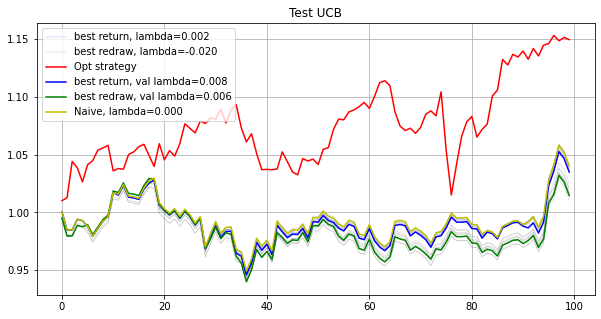

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[0.0075 0.0106 0.0124 0.0038 0.0098 0.0102 0.0097 0.0115 0.0043 0.0097
 0.0075 0.0092 0.0088 0.0107 0.0111 0.0129 0.0108 0.0103 0.0113 0.0081
 0.012  0.0111 0.0102 0.0116 0.0125 0.0105 0.0086 0.0108 0.009  0.0057
 0.0077 0.0118 0.0096 0.0087 0.0096 0.0081 0.0087 0.0087 0.0125 0.0087
 0.0094 0.0091 0.0109 0.0095 0.0094 0.0097 0.0103 0.0062 0.0104 0.0109
 0.0104 0.0094 0.0139 0.0115 0.0089 0.0079 0.0089 0.0126 0.0073 0.01
 0.011  0.0106 0.0082 0.0112 0.013  0.0109 0.0094 0.0092 0.0123 0.0109
 0.01   0.0116 0.0126 0.0081 0.0097 0.01   0.0104 0.0115 0.0113 0.0076
 0.0121 0.0109 0.0107 0.0095 0.0107 0.0106 0.0084 0.0096 0.0102 0.0096
 0.0087 0.0127 0.0111 0.0083 0.0092 0.0105 0.011  0.0108 0.0109 0.0124]
0.1351965332085459
[0.005  0.0108 0.0152 0.0038 0.0096 0.0085 0.0096 0.0108 0.0031 0.0095
 0.0062 0.0088 0.0092 0.0103 0.0122 0.0136 0.0092 0.0106 0.013  0.0073
 0.0119 0.0103 0.0101 0.0128 0.0128 0.0114 0.0098 0

[ 0.      0.0161  0.0112  0.0016  0.0081  0.0088  0.0066  0.0191 -0.
  0.0032 -0.      0.0057  0.0074  0.0054  0.0061  0.012  -0.      0.0008
  0.0168  0.0035  0.0101  0.0221  0.012   0.003   0.0202  0.01    0.0084
  0.0116  0.0054  0.      0.0001  0.0144  0.0101  0.0109  0.0119  0.0042
 -0.      0.0054  0.0172  0.0015  0.021   0.0128  0.0128  0.0147  0.0003
  0.008   0.0054  0.003   0.0106  0.0052  0.0109 -0.      0.0265  0.0204
  0.007   0.0022  0.0084  0.0182  0.0085  0.0001  0.0104  0.0136  0.0045
  0.0042  0.0213  0.0093  0.001   0.0068  0.0236  0.0048  0.0117  0.0247
  0.0248  0.0066  0.0085  0.0109  0.0139  0.0162  0.0174 -0.      0.0135
  0.0148  0.0195  0.0167  0.0213  0.0154  0.0082  0.0145  0.0047  0.0091
  0.0098  0.0124  0.0175  0.0118  0.0084  0.0063  0.0172  0.0161  0.0177
  0.0043]
5.1625657231411676e-05
[-0.      0.0163  0.0119  0.0019  0.008   0.0092  0.0064  0.0192  0.001
  0.0025 -0.      0.0054  0.0075  0.0049  0.0054  0.0112 -0.      0.
  0.0168  0.003   0.0098  0

[ 0.002   0.0166  0.0139  0.0015  0.0077  0.0077  0.0055  0.0196  0.001
  0.0013  0.      0.0048  0.0078  0.0049  0.0067  0.0148  0.      0.
  0.0175  0.0025  0.01    0.0233  0.012   0.0018  0.0201  0.0095  0.0105
  0.0101  0.0041  0.      0.      0.0106  0.012   0.0118  0.0117  0.0025
  0.      0.0052  0.0161 -0.      0.0208  0.0134  0.0129  0.0144 -0.
  0.008   0.0052  0.0025  0.01    0.0055  0.0106  0.0001  0.0246  0.0218
  0.0072 -0.      0.0079  0.019   0.0066  0.0002  0.0102  0.0144  0.0008
  0.005   0.0228  0.0087  0.0006  0.0087  0.025   0.0062  0.0117  0.0238
  0.0241  0.0061  0.0083  0.0105  0.0144  0.0167  0.018   0.      0.0143
  0.015   0.0204  0.0171  0.023   0.016   0.0089  0.0149  0.0037  0.009
  0.0099  0.0127  0.0184  0.0127  0.0082  0.0054  0.0168  0.0167  0.0188
  0.0043]
0.00029343550149096105
[ 0.002   0.0166  0.0139  0.0015  0.0077  0.0077  0.0055  0.0196  0.001
  0.0013  0.      0.0048  0.0078  0.0049  0.0067  0.0148  0.      0.
  0.0175  0.0025  0.01    0.0233 

[ 0.003   0.0187  0.0161  0.0053  0.0071  0.005   0.0028  0.0206  0.0009
 -0.     -0.      0.0025  0.0083  0.0025  0.      0.0104 -0.      0.0016
  0.0141  0.      0.0101  0.0261  0.0126  0.0037  0.0183  0.0053  0.0089
  0.0103  0.0022  0.      0.0029  0.0124  0.0066  0.0115  0.0104  0.0012
 -0.      0.0019  0.0171  0.0004  0.0262  0.0105  0.0152  0.0152  0.
  0.0113  0.004   0.0018  0.0106  0.0009  0.0099 -0.      0.034   0.02
  0.005   0.      0.0053  0.0144  0.0068  0.0021  0.0081  0.0168  0.0006
  0.0072  0.0239  0.008   0.0009  0.0081  0.0295  0.      0.0124  0.0301
  0.0267  0.0022  0.008   0.0109  0.0169  0.0207  0.0215  0.0022  0.0113
  0.017   0.0223  0.0188  0.0249  0.018   0.01    0.0178  0.0017  0.0092
  0.0096  0.0092  0.0212  0.0109  0.0074  0.0016  0.0129  0.0196  0.0213
  0.0067]
0.093050931136816
[ 0.003   0.0187  0.0161  0.0053  0.0071  0.005   0.0028  0.0206  0.0009
  0.     -0.      0.0025  0.0083  0.0025  0.      0.0104 -0.      0.0016
  0.0141 -0.      0.0101  0.0

[-0.      0.0206  0.0118  0.0049  0.0062  0.0103  0.0013  0.0218  0.0001
  0.      0.      0.0005  0.0023  0.0017  0.0044  0.0172  0.      0.
  0.0108  0.      0.0146  0.0314  0.0126  0.006   0.0204  0.0032  0.0093
  0.0129 -0.      0.0016  0.0002  0.0115  0.0063  0.0058  0.0086  0.0011
 -0.      0.0018  0.0191  0.0009  0.0204  0.0101  0.0149  0.0125 -0.
  0.0134  0.0008  0.0012  0.0133  0.      0.0096  0.      0.0205  0.0211
  0.0051 -0.      0.0037  0.0134  0.0083  0.      0.009   0.0216  0.0009
  0.0049  0.0233  0.0077  0.0003  0.0084  0.0328  0.0056  0.0117  0.0335
  0.0261  0.0004  0.0068  0.0074  0.0199  0.0208  0.0232  0.      0.0102
  0.0196  0.029   0.0207  0.0309  0.0188  0.0077  0.0209  0.0015  0.0094
  0.0088  0.008   0.0235  0.0112  0.0075  0.0013  0.0097  0.0211  0.0225
  0.0034]
8.407329824749385e-05
[-0.      0.0206  0.0118  0.0049  0.0062  0.0103  0.0013  0.0218  0.0001
  0.      0.      0.0005  0.0023  0.0017  0.0044  0.0172 -0.     -0.
  0.0108  0.      0.0146  0.031

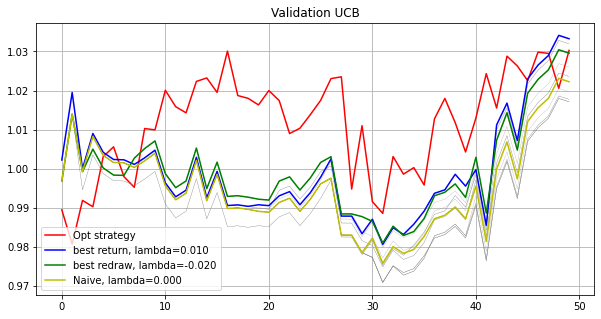

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[ 0.0009  0.0143  0.0006  0.0083  0.0076  0.0026  0.004   0.0137  0.0084
  0.0013 -0.      0.0046  0.0163  0.0118  0.0119  0.0061  0.0057  0.018
  0.0082  0.0073  0.0094  0.0177  0.0111  0.0188  0.0111  0.0082  0.0084
  0.0015  0.0074  0.0036  0.0104 -0.      0.0089 -0.      0.0161  0.0102
  0.0027  0.0113  0.0099  0.0023  0.0148  0.0148  0.0097  0.0141  0.
  0.0069  0.0023  0.0084  0.0159  0.007   0.0151  0.0115  0.0212  0.0227
  0.0121  0.      0.007   0.0146  0.0106  0.0065  0.0103  0.018   0.004
  0.0051  0.0211  0.0132  0.0072  0.012   0.0193  0.0047  0.0077  0.0156
  0.0122  0.0109  0.0069  0.0085  0.0125  0.0145  0.0154  0.0151  0.014
  0.0134  0.0173  0.0161  0.0192  0.0163  0.0067  0.0122  0.0047  0.0085
  0.0103  0.0111  0.0157  0.0058  0.0096  0.0074  0.0124  0.0143  0.0152
 -0.    ]
0.19758990066693063
[ 0.0009  0.0146 -0.      0.0078  0.0074  0.0032  0.0039  0.0137  0.0066
  0.001  -0.      0.0043  0.0169  0.012   0.0133  0.007   0.0048  0.0184
  0.0083  0.0067  0.009   0.

[-0.      0.0156  0.      0.0121  0.007   0.0038  0.0035  0.0147  0.0009
 -0.     -0.      0.0023  0.0183  0.01    0.0157  0.0039  0.0011  0.0159
  0.0104  0.0054  0.0091  0.0194  0.0114  0.0163  0.012   0.0071  0.0072
  0.0032  0.0066  0.006   0.0074  0.0044  0.0077  0.0004  0.0163  0.0113
  0.0008  0.0106  0.01    0.      0.0215  0.0172  0.0102  0.0162  0.
  0.0088  0.      0.0093  0.0141  0.0043  0.0145  0.0097  0.0208  0.0229
  0.0109  0.0003  0.007   0.0168  0.0098  0.0007  0.0101  0.0202  0.005
  0.0043  0.0249  0.0129  0.0066  0.0155  0.022   0.0025  0.0075  0.0151
  0.0115  0.008   0.0062  0.0078  0.0133  0.0142  0.0171  0.0141  0.0146
  0.0152  0.0161  0.0191  0.0231  0.0173  0.0067  0.0147  0.0032  0.0084
  0.0096  0.0087  0.0171  0.0044  0.0093  0.0081  0.0103  0.0157  0.0163
  0.0004]
0.0003710477282836454
[-0.      0.0156  0.      0.0121  0.007   0.0038  0.0035  0.0147  0.0009
 -0.     -0.      0.0023  0.0183  0.01    0.0157  0.0039  0.0011  0.0159
  0.0104  0.0054  0.0091

[ 0.      0.0161  0.      0.0079  0.0066  0.0012  0.0029  0.0159  0.002
  0.      0.      0.0014  0.0193  0.0084  0.014   0.0051  0.0034  0.0123
  0.0112  0.004   0.011   0.0196  0.0115  0.0183  0.012   0.0056  0.0087
  0.0029  0.0063  0.0048  0.0068  0.0051  0.0051  0.      0.0161  0.0109
  0.      0.0112  0.0091 -0.      0.0197  0.0142  0.0101  0.014   0.0004
  0.0093  0.0002  0.0094  0.0149  0.0044  0.0142  0.0089  0.0227  0.0254
  0.0112  0.0018  0.0058  0.0169  0.0073  0.      0.011   0.0206  0.0046
  0.0062  0.0271  0.0133  0.008   0.0154  0.023   0.0042  0.0077  0.0179
  0.01    0.0088  0.0061  0.0076  0.0135  0.0158  0.0177  0.012   0.0144
  0.0153  0.0168  0.0196  0.0234  0.0179  0.0067  0.014   0.0028  0.0084
  0.0107  0.009   0.0177  0.0049  0.009   0.0077  0.0094  0.0162  0.0168
  0.0015]
0.09251164696293449
[-0.      0.0162  0.0002  0.0077  0.0066  0.001   0.0028  0.0161  0.0021
  0.      0.      0.0011  0.0189  0.0084  0.0132  0.0051  0.0028  0.0116
  0.0119  0.0038  0.01

[ 0.0001  0.0163  0.0009  0.0084  0.0064  0.0003  0.0023  0.0154  0.0015
 -0.      0.0006  0.0007  0.0186  0.0081  0.0114  0.0074  0.0064  0.0119
  0.0117  0.0035  0.0105  0.0186  0.0114  0.0176  0.0127  0.0048  0.0091
  0.0029  0.0063  0.0035  0.0065  0.0063  0.0072 -0.      0.016   0.0104
 -0.      0.0111  0.0099  0.0009  0.0208  0.0129  0.0102  0.0141  0.0005
  0.0096  0.      0.0082  0.0145  0.0035  0.0141  0.0087  0.0221  0.0259
  0.0113  0.      0.0055  0.0165  0.0074  0.0011  0.0112  0.0207  0.0044
  0.0075  0.027   0.0128  0.0078  0.0148  0.024   0.0057  0.0075  0.018
  0.0094  0.0097  0.0058  0.0075  0.0137  0.0158  0.0182  0.0114  0.0143
  0.0153  0.0178  0.0199  0.0241  0.0183  0.0061  0.0158  0.0023  0.0083
  0.0117  0.008   0.0181  0.0045  0.0087  0.007   0.008   0.0165  0.0169
  0.0007]
6.979053382604173e-05
[ 0.0001  0.0163  0.0009  0.0084  0.0064  0.0003  0.0023  0.0154  0.0015
  0.      0.0006  0.0007  0.0186  0.0081  0.0114  0.0074  0.0064  0.0119
  0.0117  0.0035  0.

[ 0.0023  0.0184  0.0013  0.0092  0.006   0.0001 -0.      0.0133  0.0018
 -0.     -0.     -0.      0.0175  0.0085  0.0119  0.0028 -0.      0.0063
  0.0151 -0.      0.0147  0.0195  0.0122  0.0203  0.0127  0.0033  0.0112
  0.0069  0.0065  0.      0.0046  0.0127  0.0017  0.      0.0151  0.0114
 -0.      0.0124  0.0165  0.002   0.0247  0.0046  0.0113  0.0133 -0.
  0.0089  0.0002  0.0029  0.0117  0.0008  0.0145  0.01    0.0191  0.0285
  0.0151 -0.      0.0058  0.0134  0.0049  0.      0.0093  0.0236  0.004
  0.      0.0267  0.014   0.0081  0.0181  0.0295  0.      0.0085  0.0206
  0.0096  0.0125  0.0054  0.0073  0.0147  0.0144  0.0209  0.0091  0.0129
  0.0163  0.0211  0.0209  0.0315  0.0214  0.0046  0.0169  0.0015  0.0087
  0.0142  0.0024  0.021   0.0021  0.008   0.0042  0.0095  0.0179  0.0189
  0.0022]
0.00010650395600138687
[ 0.0023  0.0184  0.0013  0.0092  0.006   0.0001 -0.      0.0133  0.0018
 -0.     -0.     -0.      0.0175  0.0085  0.0119  0.0028  0.      0.0063
  0.0151 -0.      0.014

[ 0.      0.0208  0.0007  0.0069  0.007   0.0038  0.      0.0102  0.0019
 -0.     -0.     -0.      0.0162  0.0029  0.0133  0.     -0.      0.006
  0.0145 -0.      0.0188  0.0061  0.0125  0.0204  0.0128  0.0107  0.0096
  0.0024  0.0048  0.     -0.      0.0239  0.0044  0.0023  0.0196  0.0079
 -0.      0.0141  0.0164  0.      0.0148  0.0047  0.014   0.0108  0.
  0.0101  0.      0.0082  0.0094 -0.      0.0161  0.0136  0.0271  0.0299
  0.0114 -0.      0.0053  0.0055  0.0021  0.0005  0.0071  0.0263  0.007
  0.0007  0.0271  0.0172  0.0064  0.02    0.0344  0.      0.0097  0.0149
  0.0097  0.0102  0.0045  0.0041  0.0152  0.012   0.0245  0.      0.012
  0.0175  0.0181  0.0222  0.0356  0.0231  0.009   0.0183  0.0009  0.0102
  0.0152  0.      0.0239  0.0013  0.0074  0.0005  0.0103  0.021   0.0223
  0.0061]
0.24023582267633417
[-0.      0.0208  0.0007  0.0069  0.007   0.0038  0.      0.0102  0.0019
 -0.     -0.     -0.      0.0162  0.0029  0.0133 -0.     -0.      0.006
  0.0145 -0.      0.0188  0.0

[-0.      0.0208  0.0007  0.0069  0.007   0.0038 -0.      0.0102  0.0019
 -0.      0.      0.      0.0162  0.0029  0.0133 -0.      0.      0.006
  0.0145  0.      0.0188  0.0061  0.0125  0.0204  0.0128  0.0107  0.0096
  0.0024  0.0048  0.     -0.      0.0239  0.0044  0.0022  0.0196  0.0079
  0.      0.0141  0.0164 -0.      0.0148  0.0047  0.014   0.0108  0.
  0.0101 -0.      0.0082  0.0094 -0.      0.0161  0.0136  0.0271  0.0299
  0.0114 -0.      0.0053  0.0055  0.002   0.0004  0.0071  0.0263  0.007
  0.0007  0.0271  0.0172  0.0064  0.02    0.0344 -0.      0.0097  0.0149
  0.0097  0.0102  0.0045  0.0041  0.0152  0.012   0.0245  0.      0.0119
  0.0175  0.0181  0.0222  0.0356  0.0231  0.009   0.0183  0.0009  0.0102
  0.0152 -0.      0.0239  0.0013  0.0074  0.0005  0.0103  0.021   0.0223
  0.0061]
0.00010312028245953519
[-0.      0.0209  0.0007  0.0079  0.0069  0.0037 -0.      0.0099  0.004
 -0.      0.     -0.      0.0165  0.0031  0.0124  0.0002 -0.      0.0058
  0.0151  0.      0.0187 

[-0.      0.0213  0.0042  0.0094  0.0065  0.0047  0.      0.0106 -0.
 -0.     -0.      0.      0.0149  0.0021  0.0087 -0.     -0.      0.0016
  0.0149 -0.      0.0197  0.0087  0.0126  0.0215  0.0139  0.0093  0.0128
  0.0019  0.0046 -0.      0.0003  0.0172  0.0028  0.0008  0.02    0.006
 -0.      0.0112  0.0162  0.003   0.0184  0.0003  0.0148  0.0105  0.0011
  0.0143  0.0009  0.0105  0.0093  0.0008  0.0188  0.0093  0.0291  0.0302
  0.0102  0.      0.0052  0.0075  0.0013  0.0011  0.0077  0.0269  0.005
  0.0015  0.0307  0.0155  0.0055  0.0182  0.0357  0.      0.0098  0.0141
  0.0112  0.0101  0.0038  0.0029  0.0164  0.0114  0.025   0.      0.0088
  0.0175  0.0176  0.0216  0.0364  0.0237  0.01    0.0174  0.0003  0.0102
  0.0144  0.      0.0251  0.0005  0.0074 -0.      0.0091  0.0221  0.0233
  0.0079]
0.0001802163332173652
[ 0.      0.0213  0.0042  0.0094  0.0065  0.0047  0.      0.0106  0.
  0.      0.      0.      0.0149  0.0021  0.0087  0.     -0.      0.0016
  0.0149 -0.      0.0197  0.0

[-0.      0.0213  0.0042  0.0095  0.0065  0.0047  0.      0.0106  0.
 -0.      0.      0.      0.0149  0.0021  0.0087  0.      0.0001  0.0016
  0.0149 -0.      0.0197  0.0087  0.0126  0.0214  0.0139  0.0093  0.0128
  0.0019  0.0046 -0.      0.0003  0.0172  0.0028  0.0008  0.02    0.0059
 -0.      0.0112  0.0162  0.003   0.0184  0.0003  0.0148  0.0105  0.0011
  0.0143  0.0009  0.0105  0.0093  0.0008  0.0188  0.0093  0.029   0.0302
  0.0102  0.      0.0052  0.0075  0.0013  0.0011  0.0077  0.0269  0.005
  0.0015  0.0307  0.0155  0.0055  0.0182  0.0357  0.      0.0098  0.0141
  0.0112  0.0101  0.0038  0.0029  0.0164  0.0114  0.025   0.      0.0088
  0.0175  0.0176  0.0216  0.0364  0.0238  0.01    0.0174  0.0003  0.0102
  0.0144  0.      0.0251  0.0005  0.0074 -0.      0.0091  0.0221  0.0233
  0.0079]
0.00011365624841408752
[ 0.0009  0.0216  0.0036  0.0102  0.006   0.0041 -0.      0.0117  0.0019
  0.     -0.     -0.      0.0147  0.0022  0.0074  0.     -0.      0.0023
  0.0146  0.      0.02 

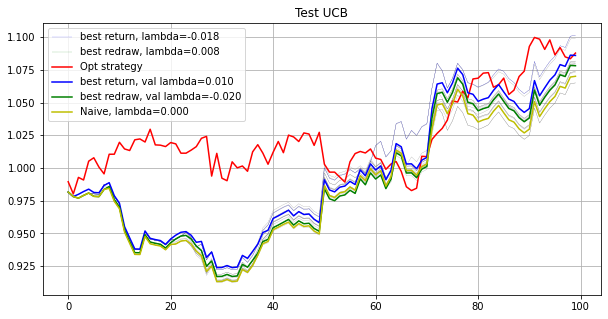

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[-0.      0.0098  0.0103  0.0129  0.0128  0.0092  0.0108  0.0084  0.0074
  0.005   0.0112  0.0116  0.0141  0.0026  0.0074  0.0082  0.0116  0.0114
  0.0036  0.0243  0.0167  0.0067  0.0054 -0.      0.0092  0.0119  0.0096
  0.0105  0.0099  0.0144  0.0069 -0.      0.0086  0.0126  0.0124  0.0145
 -0.      0.0132  0.0129  0.0066  0.0074  0.0101  0.01    0.0145  0.0118
  0.0082  0.0164  0.004  -0.      0.0095  0.003   0.012   0.0106  0.0145
  0.0105  0.0056  0.0092  0.0078  0.0101  0.0107  0.0038  0.0138  0.0149
  0.0133  0.0139  0.0153  0.0098  0.0127  0.0089  0.0098  0.0089  0.0113
  0.0104 -0.      0.0099  0.0101  0.0082  0.0151  0.0122  0.0128  0.0118
  0.009   0.0083  0.006   0.0118  0.0118  0.0118  0.0114  0.0094  0.0098
  0.0116  0.014   0.009   0.0125  0.0121  0.0102  0.0126  0.0138  0.0144
  0.0136]
0.29993542209674373
[ 0.      0.0098  0.0103  0.0128  0.0128  0.0092  0.0107  0.0084  0.0074
  0.005   0.011

[ 0.      0.003   0.0099  0.0161  0.0139  0.0084  0.0111  0.0054  0.0039
  0.      0.012   0.003   0.0162 -0.      0.0054  0.0079  0.0095  0.0132
  0.      0.0199  0.0255  0.0082  0.0031  0.001   0.0071  0.0151  0.0061
  0.0107  0.0037  0.0173  0.001  -0.      0.0061  0.0097  0.01    0.0103
  0.0094  0.0174  0.0157  0.0034  0.0058  0.0106  0.0091  0.0179  0.0109
  0.0106  0.0165  0.0017 -0.      0.0082  0.      0.0096  0.0169  0.0247
  0.0081  0.0066  0.0064  0.0061  0.0084  0.01    0.0001  0.0173  0.0186
  0.0156  0.0132  0.0159  0.0106  0.0128  0.0083  0.0092  0.0083  0.0069
  0.008   0.0006  0.0101  0.0105  0.0113  0.0215  0.015   0.0091  0.0159
  0.0074  0.0041  0.0033  0.0092  0.018   0.0109  0.0131  0.0086  0.0108
  0.0124  0.0154  0.0142  0.0129  0.0128  0.0131  0.0154  0.0192  0.0177
  0.0153]
0.0003652178726515945
[-0.      0.003   0.0099  0.0161  0.0139  0.0084  0.0111  0.0055  0.0039
  0.      0.012   0.003   0.0162 -0.      0.0054  0.0079  0.0095  0.0132
 -0.      0.0199  0

[ 0.      0.0011  0.01    0.0164  0.0169  0.0087  0.0115  0.0044  0.0028
  0.      0.0132  0.0004  0.0181 -0.      0.0135  0.0113  0.0071  0.0127
  0.0083  0.0199  0.0301  0.007   0.0016 -0.      0.0066  0.0209  0.0051
 -0.      0.0012  0.015  -0.      0.0048  0.0058  0.0096  0.0088  0.0104
  0.0073  0.0165  0.0168  0.0045  0.0052  0.0107  0.0076  0.019   0.0092
  0.0114  0.0172 -0.      0.      0.0074  0.0011  0.0077  0.0178  0.0246
  0.0063  0.0057  0.0051  0.0041  0.0086  0.01    0.      0.0186  0.0187
  0.019   0.0134  0.0147  0.0111  0.0119  0.0057  0.0092  0.0085  0.005
  0.0065  0.0007  0.0101  0.01    0.0104  0.0213  0.0162  0.0069  0.0167
  0.0061  0.0054  0.0038  0.009   0.0204  0.0114  0.0135  0.0052  0.0107
  0.0127  0.0151  0.0163  0.0113  0.012   0.0119  0.0162  0.0215  0.0213
  0.0148]
0.14287241251301347
[ 0.      0.0012  0.01    0.0163  0.0169  0.0087  0.0115  0.0044  0.0028
 -0.      0.0132  0.0004  0.0181 -0.      0.0135  0.0113  0.0071  0.0127
  0.0083  0.0199  0.03

[-0.      0.0004  0.0098  0.018   0.0196  0.0098  0.0124  0.002   0.0007
  0.      0.0138  0.      0.0162  0.      0.0056  0.      0.0009  0.0131
  0.0044  0.0225  0.0311  0.0104 -0.      0.0007  0.0059  0.0223  0.0041
  0.0034 -0.      0.0187 -0.      0.0115  0.0056  0.0048  0.0092  0.0084
  0.0002  0.0139  0.0199  0.0001  0.0009  0.0118  0.0078  0.0202 -0.
  0.0125  0.0188 -0.      0.0001  0.0059 -0.      0.0161  0.0197  0.0263
  0.0041 -0.      0.0137  0.01    0.0111  0.0081  0.      0.0212  0.0201
  0.0271  0.0164  0.0168  0.0201  0.0144  0.0008  0.0093  0.008   0.0113
  0.0076  0.      0.0103  0.0086  0.0112  0.011   0.0224  0.0029  0.0192
  0.0134  0.0021  0.0015  0.0083  0.0222  0.0116  0.0163 -0.      0.0114
  0.0121  0.0167  0.0151  0.0121  0.0104  0.0107  0.0172  0.0231  0.0177
  0.0131]
0.0001785751036982169
[ 0.      0.0004  0.0098  0.018   0.0196  0.0098  0.0124  0.002   0.0007
 -0.      0.0138 -0.      0.0162 -0.      0.0056 -0.      0.0009  0.0131
  0.0044  0.0225  0.031

[ 0.      0.0004  0.0098  0.018   0.0196  0.0098  0.0124  0.002   0.0007
  0.      0.0138  0.      0.0162  0.      0.0056  0.      0.0009  0.0131
  0.0044  0.0225  0.0311  0.0104 -0.      0.0006  0.0059  0.0223  0.0041
  0.0034 -0.      0.0187 -0.      0.0115  0.0056  0.0048  0.0092  0.0084
  0.0002  0.0139  0.0199  0.0001  0.0009  0.0118  0.0078  0.0202 -0.
  0.0125  0.0188 -0.      0.0001  0.0059 -0.      0.0161  0.0197  0.0263
  0.0041  0.      0.0137  0.01    0.0111  0.0081 -0.      0.0212  0.0201
  0.0271  0.0164  0.0168  0.0201  0.0144  0.0008  0.0093  0.008   0.0113
  0.0076  0.      0.0103  0.0086  0.0112  0.011   0.0224  0.0029  0.0192
  0.0134  0.0021  0.0015  0.0083  0.0221  0.0116  0.0163 -0.      0.0114
  0.0121  0.0167  0.0151  0.0121  0.0104  0.0107  0.0172  0.0231  0.0177
  0.0131]
8.301925445119874e-05
[ 0.      0.0027  0.0093  0.019   0.02    0.0092  0.0117  0.     -0.
  0.      0.0134 -0.      0.0177  0.      0.      0.004   0.0008  0.0126
  0.0034  0.0218  0.0357  0

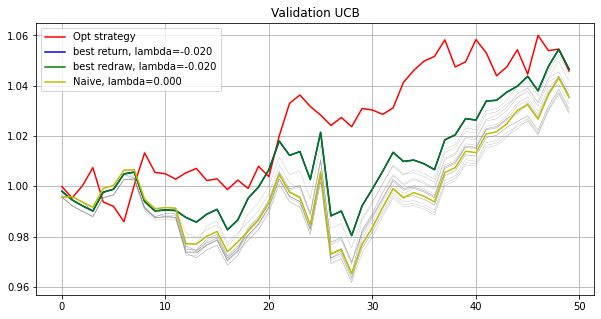

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[ 0.      0.      0.0092  0.0159  0.0134  0.0108  0.0109  0.0052  0.0044
  0.      0.0134  0.0072  0.0144  0.      0.0101  0.0055  0.0094  0.0074
 -0.      0.0088  0.022   0.0105  0.0175 -0.      0.0069  0.0138  0.0039
  0.0062  0.0022  0.0178  0.0092  0.013   0.0083  0.0089  0.0061  0.0135
  0.022   0.0145  0.0139  0.0052  0.0087  0.0103  0.0022  0.0157  0.0108
  0.0024  0.0207  0.0024  0.0022  0.0076  0.0022  0.0154  0.0166  0.0138
  0.006   0.0023  0.009   0.0104  0.0108  0.0077  0.      0.0138  0.0159
  0.0128  0.0085  0.0159  0.0119  0.0093  0.0035  0.0125  0.0083  0.0151
  0.0104  0.0155  0.0108  0.0091  0.0102  0.0088  0.0159  0.0138  0.019
  0.004   0.0063  0.0132  0.0059  0.0166  0.0122  0.0116  0.0101  0.0104
  0.0125  0.0143  0.0115  0.0132  0.01    0.0114  0.0124  0.014   0.0197
  0.0108]
0.17343805845852298
[ 0.      0.      0.0092  0.0159  0.0134  0.0108  0.0109  0.0052  0.0044
 -0.      0.0134  0.0072  0.0144  0.      0.0101  0.0055  0.0094  0.0074
 -0.      0.0088  0.02

[-0.     -0.      0.0085  0.0189  0.0128  0.0089  0.0104  0.0027  0.
  0.      0.0194 -0.      0.0187  0.      0.      0.0015  0.0149  0.0057
  0.0118  0.0053  0.0241  0.0066  0.0157 -0.      0.0047  0.0195  0.
  0.0075 -0.      0.0164  0.0024  0.0059  0.0065 -0.      0.0022  0.0122
  0.0268  0.0146  0.0172  0.0041  0.0113  0.0131  0.0047  0.0193  0.0017
 -0.      0.0157  0.     -0.      0.0055  0.0047  0.0185  0.0152  0.0181
  0.0053  0.0039  0.012   0.0043  0.0087  0.0101  0.      0.0126  0.0179
  0.0128  0.0074  0.0223  0.0138  0.0138  0.0016  0.012   0.006   0.0186
  0.0148  0.0155  0.0098  0.0092  0.0054  0.0101  0.0251  0.013   0.0282
  0.      0.0044  0.0096  0.0027  0.0203  0.0132  0.0127  0.0044  0.0097
  0.0116  0.0176  0.019   0.012   0.0122  0.0116  0.0163  0.0196  0.024
  0.0115]
0.00010645949514252498
[-0.     -0.      0.0085  0.0188  0.0128  0.0089  0.0104  0.0027  0.
  0.      0.0194  0.      0.0187  0.      0.      0.0015  0.0149  0.0057
  0.0118  0.0053  0.0241  0.006

[0.     0.0008 0.0075 0.0207 0.0099 0.01   0.0101 0.     0.     0.
 0.0212 0.0009 0.0189 0.0035 0.     0.     0.0154 0.004  0.0153 0.0049
 0.0219 0.0046 0.0139 0.     0.0025 0.0145 0.     0.0064 0.     0.0174
 0.0004 0.0071 0.0049 0.0024 0.0023 0.0056 0.0303 0.0148 0.0176 0.004
 0.0125 0.0138 0.0025 0.021  0.0019 0.     0.0161 0.0008 0.0016 0.0037
 0.003  0.0151 0.0152 0.0192 0.0039 0.0012 0.0108 0.0042 0.0101 0.0102
 0.     0.0154 0.0199 0.0107 0.0093 0.0231 0.013  0.0161 0.     0.0117
 0.0037 0.0201 0.0151 0.0085 0.0084 0.0089 0.0043 0.0077 0.0274 0.014
 0.0325 0.0044 0.0029 0.0095 0.0002 0.0223 0.0127 0.0142 0.004  0.0094
 0.0122 0.0228 0.0192 0.0104 0.0153 0.0169 0.0177 0.0179 0.0252 0.012 ]
0.0004861561343123509
[ 0.     -0.      0.0073  0.0212  0.0108  0.01    0.01   -0.      0.
  0.0008  0.0215  0.0025  0.0187  0.0015  0.0002 -0.      0.0154  0.0036
  0.0134  0.0075  0.0239  0.0034  0.0127 -0.      0.002   0.0153 -0.
  0.0066 -0.      0.0183  0.0013  0.008   0.0044  0.0009  0.00

[-0.     -0.      0.0065  0.0229  0.0088  0.0097  0.0099  0.     -0.
  0.      0.0222  0.0072  0.0218  0.      0.      0.      0.0178  0.0029
  0.0118  0.0072  0.0285  0.0023  0.0137  0.001   0.0003  0.0169  0.
  0.005   0.      0.0236  0.0021  0.0104  0.0023  0.0052  0.0011  0.0023
  0.0233  0.0165  0.0186  0.0003  0.0122  0.0129  0.0019  0.0233  0.
  0.0005  0.0193  0.     -0.      0.0007  0.      0.0166  0.0136  0.0195
  0.0033  0.0023  0.0087  0.006   0.0098  0.0076  0.      0.0183  0.0218
  0.0133  0.0103  0.027   0.0133  0.019  -0.      0.0104  0.0017  0.0231
  0.0139  0.0101  0.0097  0.0084  0.0037  0.0055  0.0281  0.0147  0.0371
  0.0043  0.0018  0.0057 -0.      0.0226  0.0131  0.0154  0.0013  0.008
  0.0128  0.0249  0.0147  0.0116  0.0148  0.0134  0.0181  0.0173  0.0208
  0.0096]
0.00012610782835022075
[ 0.      0.      0.0064  0.0234  0.0111  0.0104  0.0099  0.     -0.
 -0.      0.0218  0.0043  0.0226  0.      0.0027  0.0016  0.0185  0.0027
  0.0106  0.0065  0.0297  0.0016  0

[ 0.      0.      0.0063  0.0235  0.0111  0.0103  0.0099 -0.     -0.
  0.      0.0218  0.0043  0.0226  0.      0.0027  0.0016  0.0185  0.0027
  0.0106  0.0065  0.0297  0.0016  0.0137 -0.     -0.      0.016  -0.
  0.0053 -0.      0.0243  0.0013  0.0113  0.0019  0.0039  0.0016  0.0018
  0.0241  0.0158  0.0191  0.0002  0.0116  0.0129  0.003   0.0235  0.
  0.      0.0187  0.      0.      0.0003  0.      0.0162  0.0136  0.0191
  0.003   0.0019  0.0079  0.0056  0.0114  0.0079  0.      0.019   0.0227
  0.0119  0.01    0.028   0.013   0.0182  0.      0.0101  0.0018  0.0239
  0.0136  0.0093  0.0093  0.0079  0.0033  0.0061  0.029   0.0132  0.0375
  0.0031  0.0014  0.0051 -0.      0.023   0.0137  0.0163  0.0005  0.0078
  0.013   0.0265  0.0151  0.0124  0.015   0.0126  0.0182  0.0171  0.0211
  0.0094]
4.458420033777247e-05
[ 0.     -0.      0.0063  0.0235  0.0111  0.0103  0.0099 -0.     -0.
  0.      0.0218  0.0043  0.0226  0.      0.0027  0.0016  0.0185  0.0027
  0.0106  0.0065  0.0297  0.0016  0

[-0.     -0.      0.0063  0.0237  0.0118  0.0102  0.01   -0.      0.
 -0.      0.0217  0.0026  0.0227  0.      0.0033  0.      0.0185  0.0025
  0.0111  0.0067  0.0307  0.001   0.0135  0.      0.      0.0153 -0.
  0.0056 -0.      0.025   0.0008  0.0109  0.0017  0.0038  0.0007  0.0009
  0.0238  0.0157  0.0196  0.0001  0.0123  0.0132  0.003   0.0243 -0.
 -0.      0.0195  0.      0.     -0.     -0.      0.0163  0.0132  0.0198
  0.0025  0.0012  0.0079  0.0051  0.0121  0.0079  0.      0.0195  0.0232
  0.0118  0.0099  0.0282  0.0129  0.0189 -0.      0.0098  0.0018  0.0231
  0.0134  0.0083  0.009   0.0078  0.0034  0.0067  0.0294  0.0136  0.0379
  0.0028  0.0005  0.0052  0.      0.023   0.0134  0.0168  0.0004  0.008
  0.0132  0.0269  0.0152  0.0127  0.0153  0.0126  0.0184  0.0176  0.0214
  0.0096]
0.00014586177490462048
[-0.      0.      0.0063  0.0237  0.0118  0.0102  0.01   -0.      0.
  0.      0.0217  0.0026  0.0227  0.      0.0033  0.      0.0185  0.0025
  0.0111  0.0067  0.0307  0.001   0

[ 0.     -0.      0.0056  0.0267  0.01    0.0104  0.0103  0.     -0.
 -0.      0.0225  0.0029  0.0168 -0.      0.      0.0004  0.0257  0.0011
  0.0321  0.008   0.0393  0.      0.0019 -0.      0.      0.0101 -0.
  0.0096 -0.      0.0346  0.      0.0148  0.      0.0006 -0.      0.0025
 -0.      0.0133  0.0233 -0.      0.0061  0.0144  0.0027  0.0259 -0.
 -0.      0.0147 -0.     -0.     -0.     -0.      0.0171  0.0132  0.0211
 -0.     -0.      0.0066  0.0086  0.0127  0.0087 -0.      0.0239  0.0236
  0.0101  0.0144  0.0275  0.0133  0.0185  0.      0.0102  0.0019  0.0242
  0.0134  0.0028  0.0084  0.0038  0.003   0.0085  0.032   0.0084  0.0388
  0.0091 -0.      0.0098 -0.      0.0221  0.0131  0.018  -0.      0.0073
  0.0155  0.0249  0.0089  0.0112  0.0154  0.0073  0.0192  0.019   0.0299
  0.0081]
4.595494254833886e-05
[ 0.      0.      0.0056  0.0267  0.01    0.0104  0.0103  0.     -0.
  0.      0.0225  0.0029  0.0168 -0.      0.      0.0004  0.0257  0.0011
  0.0321  0.008   0.0393  0.      0

[-0.      0.      0.0055  0.0268  0.0099  0.0106  0.0103  0.      0.
 -0.      0.0226  0.002   0.017  -0.      0.      0.005   0.0258  0.0009
  0.032   0.0079  0.0395  0.      0.0015  0.     -0.      0.0099 -0.
  0.0096  0.      0.0344  0.0001  0.0144 -0.      0.0005  0.      0.0021
  0.0006  0.0131  0.0233  0.      0.006   0.0143  0.0024  0.0258 -0.
 -0.      0.0146 -0.     -0.      0.     -0.      0.017   0.0133  0.0212
 -0.     -0.      0.0063  0.0084  0.0126  0.0087 -0.      0.0241  0.0237
  0.0098  0.0143  0.0272  0.0132  0.0186  0.      0.0102  0.0017  0.024
  0.0134  0.003   0.0083  0.0036  0.0029  0.0088  0.0322  0.0081  0.0389
  0.0092  0.0002  0.0096  0.      0.022   0.0131  0.0179  0.      0.0072
  0.0156  0.025   0.0087  0.0109  0.0155  0.0072  0.0193  0.0188  0.03
  0.008 ]
9.479130890027319e-05
[-0.      0.      0.0055  0.0268  0.0099  0.0105  0.0103  0.      0.
 -0.      0.0227  0.002   0.017  -0.      0.      0.005   0.0258  0.0009
  0.032   0.0079  0.0395  0.      0.00

[ 0.     -0.      0.0051  0.0272  0.0085  0.0103  0.0101 -0.      0.
  0.      0.0217  0.0033  0.0172 -0.      0.0001  0.0042  0.026   0.0004
  0.0327  0.0083  0.0379  0.0003  0.0031  0.0001 -0.      0.0123 -0.
  0.0075  0.      0.0339  0.0002  0.0127 -0.      0.0004 -0.      0.0012
  0.0021  0.013   0.0235 -0.      0.0053  0.0132  0.0025  0.0263  0.0018
  0.      0.0163 -0.      0.0002 -0.     -0.      0.0164  0.0139  0.022
  0.0001  0.0009  0.0056  0.0082  0.0129  0.0076 -0.      0.0245  0.0239
  0.0091  0.0141  0.0281  0.0129  0.0195 -0.      0.0102  0.0013  0.024
  0.0135  0.0031  0.0075  0.0029  0.0022  0.0103  0.0329  0.0071  0.04
  0.0084 -0.      0.0093  0.      0.0224  0.0126  0.0175  0.0022  0.0073
  0.0154  0.0243  0.0087  0.0104  0.0152  0.0061  0.0191  0.0183  0.0304
  0.0089]
0.03467387339762192
[ 0.     -0.      0.0051  0.0272  0.0085  0.0103  0.0101 -0.      0.
  0.      0.0217  0.0033  0.0172 -0.      0.0001  0.0042  0.026   0.0004
  0.0327  0.0083  0.0379  0.0003  0.0

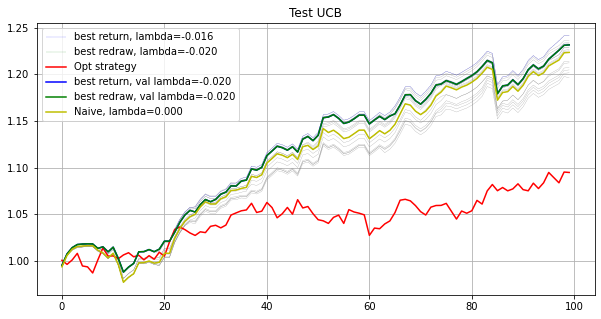

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
0.00010473969043617304
[0.0122 0.0072 0.0108 0.0108 0.0114 0.0101 0.0104 0.0096 0.0076 0.0091
 0.0086 0.0085 0.0125 0.0086 0.0096 0.0112 0.0102 0.0101 0.0102 0.0078
 0.0104 0.01   0.0095 0.009  0.0052 0.0092 0.01   0.0097 0.0094 0.0103
 0.0084 0.0101 0.0135 0.0113 0.0054 0.0101 0.0097 0.0112 0.0086 0.0108
 0.0108 0.011  0.0118 0.0094 0.0096 0.0098 0.0114 0.0091 0.0117 0.0103
 0.0109 0.0086 0.0078 0.0109 0.008

[ 0.0049  0.0001  0.0196  0.0161  0.021   0.0147  0.0167  0.0042 -0.
  0.0141 -0.      0.0118  0.      0.0036  0.0088  0.      0.005   0.0076
  0.0238  0.0019  0.0202  0.0146  0.0001  0.      0.      0.0008  0.0127
  0.007   0.      0.0165  0.0117  0.0112  0.0223  0.0222  0.      0.0103
  0.0133  0.0135  0.0205  0.0015  0.0013  0.0008  0.0169  0.012   0.0054
  0.0129  0.0179  0.0139  0.0153  0.0073  0.0136  0.0018  0.      0.0293
 -0.     -0.      0.01    0.014   0.0166  0.0046  0.0113  0.0046  0.011
  0.0141  0.0057  0.01    0.0196 -0.      0.0146  0.0007  0.0185  0.0148
  0.0065  0.0219  0.0147  0.0152  0.0082  0.0055  0.0099  0.0136  0.0052
  0.0126  0.0041  0.0157  0.0164  0.0049  0.0046  0.0145  0.0165  0.0116
  0.0191  0.0001  0.0087  0.0086  0.0129  0.0206  0.0095  0.0047  0.0157
  0.0076]
0.0004986827130770089
[ 0.0049  0.0001  0.0196  0.0161  0.021   0.0147  0.0167  0.0042  0.
  0.0141  0.      0.0118  0.      0.0036  0.0088 -0.      0.005   0.0076
  0.0238  0.0019  0.0202  0.

[ 0.      0.0006  0.0293  0.025   0.0249  0.0159  0.0226  0.      0.
  0.0214  0.      0.0037  0.      0.0003  0.0034  0.0118  0.0106  0.0044
  0.0299  0.      0.0189  0.0178  0.     -0.      0.     -0.      0.0153
  0.0002  0.      0.0253 -0.      0.0105  0.0085  0.036   0.0012  0.0064
  0.012   0.0172  0.0054  0.0031  0.      0.      0.0228  0.011  -0.
  0.0126  0.0211  0.0121  0.0174 -0.      0.0194  0.0039  0.0001  0.0325
 -0.      0.002   0.0077  0.013   0.023   0.001   0.0217  0.0007  0.0147
  0.0133  0.0053  0.0098  0.0186  0.      0.0152  0.      0.0285  0.0218
 -0.      0.0143  0.0171  0.0227  0.0106  0.0158  0.0001  0.0104  0.017
  0.0021  0.      0.0173  0.0259  0.0063  0.      0.0006  0.0108  0.0091
  0.0122  0.0042  0.0067  0.0048  0.015   0.0218  0.0025 -0.      0.0217
  0.0002]
0.06611273556243315
[0.     0.0006 0.0293 0.025  0.0249 0.0159 0.0226 0.     0.     0.0214
 0.     0.0037 0.     0.0003 0.0034 0.0118 0.0106 0.0044 0.0299 0.
 0.0189 0.0178 0.     0.     0.     0.

[-0.     -0.      0.0298  0.0256  0.0239  0.016   0.0228  0.     -0.
  0.0229 -0.      0.0032 -0.     -0.      0.0027  0.0122  0.0094  0.0045
  0.0303  0.      0.0207  0.0181 -0.      0.001  -0.      0.      0.0154
  0.0002 -0.      0.0269 -0.      0.0101  0.0091  0.0353  0.0001  0.0052
  0.0118  0.0164  0.0026  0.0025  0.001  -0.      0.0244  0.0105 -0.
  0.0127  0.0219  0.0118  0.0179 -0.      0.0205  0.0067  0.      0.0326
 -0.      0.0018  0.0079  0.0123  0.023   0.0012  0.0213  0.      0.0143
  0.013   0.0058  0.01    0.0198 -0.      0.0158  0.      0.0292  0.0206
 -0.      0.0133  0.0173  0.0235  0.0097  0.0149  0.0004  0.0099  0.0164
  0.0016  0.0012  0.0175  0.0258  0.0072 -0.      0.0005  0.01    0.0086
  0.0111  0.0041  0.0061  0.0047  0.0144  0.0217  0.0023 -0.      0.0222
  0.0009]
0.0003791275493190414
[ 0.     -0.      0.0298  0.0256  0.0239  0.016   0.0228  0.     -0.
  0.0228 -0.      0.0032 -0.     -0.      0.0027  0.0122  0.0094  0.0045
  0.0303  0.      0.0207  0.018

[ 0.     -0.      0.0291  0.0244  0.0221  0.0153  0.0222  0.      0.
  0.0195  0.      0.0051  0.      0.      0.      0.0135  0.0122  0.0047
  0.031   0.      0.0224  0.0151  0.      0.      0.      0.      0.0161
 -0.      0.      0.0235  0.      0.0095  0.0123  0.0367  0.0085  0.0087
  0.011   0.0171  0.      0.      0.      0.      0.026   0.0137  0.0001
  0.0125  0.0225  0.0112  0.0165  0.      0.021   0.0015  0.      0.0347
  0.      0.      0.0084  0.0129  0.0228  0.001   0.0222  0.0003  0.0143
  0.0116  0.0079  0.0103  0.0172  0.      0.0154 -0.      0.0286  0.0207
  0.      0.0154  0.0173  0.0224  0.009   0.0178  0.      0.0057  0.0159
  0.      0.      0.0168  0.0237  0.003   0.      0.      0.0103  0.0103
  0.0155  0.0172  0.0055  0.0035  0.0129  0.0212 -0.      0.      0.023
  0.    ]
0.00026557635872810983
[ 0.      0.      0.0291  0.0244  0.0221  0.0153  0.0222  0.      0.
  0.0195  0.      0.0051  0.      0.      0.      0.0135  0.0122  0.0047
  0.031  -0.      0.0224  0

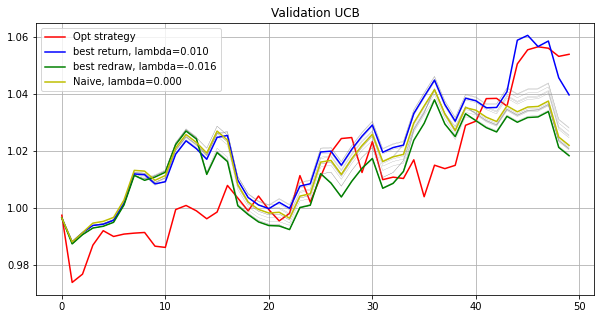

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[-0.     -0.      0.0215  0.019   0.0282  0.0233  0.0176  0.0017 -0.
  0.0129  0.0042 -0.     -0.      0.0076  0.0061  0.0046  0.0097  0.0105
  0.0219  0.0048  0.0095  0.0233  0.0003  0.0034  0.004   0.0073  0.0131
  0.0039  0.      0.0248  0.0008  0.0108  0.0162  0.0272  0.0017  0.0166
  0.0169  0.0071  0.0002  0.0088  0.0141  0.      0.0303  0.0069  0.0083
  0.0088  0.0195  0.0032  0.0219  0.0109  0.0188  0.0153  0.0077  0.0014
  0.0022  0.0025  0.0106  0.0101  0.0142  0.0026  0.0154  0.0129  0.0053
  0.0131  0.0042  0.012   0.0134  0.      0.0119  0.0069  0.0244  0.0028
  0.0091  0.0042  0.0149  0.0215  0.0132  0.0056 -0.      0.0142  0.0022
  0.0004  0.0023  0.0111  0.0053  0.0086  0.0041  0.0004  0.0182  0.0158
  0.0157  0.0205  0.014   0.0069  0.0175  0.0183  0.0002  0.0122  0.0186
  0.0042]
6.949375958421449e-05
[-0.     -0.      0.0215  0.019   0.0282  0.0233  0.0176  0.0017 -0.
  0.0129  0.0042 -0.     -0.      0.0076  0.0061  0.0046  0.0097  0.0105
  0.0219  0.0048  0.0095  0

[ 0.0047  0.      0.0248  0.0216  0.0312  0.0271  0.0194  0.      0.
  0.0132  0.0068  0.      0.      0.0081  0.0042  0.0022  0.0035  0.0083
  0.0242  0.005   0.0121  0.022   0.      0.0042  0.0005  0.0029  0.0137
  0.0013  0.      0.0264  0.      0.01    0.0206  0.028  -0.      0.0162
  0.0174  0.0099  0.      0.0089  0.0153  0.      0.0361  0.0041  0.0032
  0.0072  0.0217  0.002   0.0222  0.0095  0.0208  0.0183  0.0034  0.002
 -0.      0.0031  0.0105  0.0095  0.0144  0.0015  0.0179  0.0076  0.0079
  0.0124  0.0028  0.0119  0.0132  0.      0.011   0.0038  0.0244  0.0028
  0.005   0.0088  0.0171  0.025   0.0126  0.0034  0.0003  0.0157  0.0014
  0.0008  0.0011  0.0134  0.0027  0.0019  0.0014  0.0076  0.0188  0.017
  0.0165  0.0176  0.0131  0.0059  0.0166  0.0197  0.0044  0.0076  0.0212
  0.0045]
0.0001223206086122891
[ 0.0047  0.      0.0248  0.0216  0.0312  0.0271  0.0194  0.      0.
  0.0132  0.0068  0.      0.      0.0081  0.0042  0.0022  0.0035  0.0083
  0.0242  0.005   0.0121  0.0

[-0.      0.      0.0309  0.0286  0.0265  0.0208  0.0228 -0.     -0.
  0.0076  0.0069  0.      0.     -0.      0.0038  0.0086 -0.      0.0059
  0.028   0.0013  0.0142  0.0205 -0.      0.0177  0.      0.      0.015
  0.0008  0.      0.0179  0.      0.01    0.021   0.0251  0.      0.0267
  0.0131  0.0045  0.0223  0.0082  0.0136 -0.      0.0394  0.      0.0006
  0.0032  0.0214 -0.      0.0182 -0.      0.0297  0.0138  0.0003  0.0089
  0.0029  0.      0.0081  0.0184  0.0165  0.0004  0.0287  0.0113  0.013
  0.0129  0.0026  0.0083  0.0046 -0.      0.0119  0.014   0.0244  0.0011
  0.0035 -0.      0.0206  0.0199  0.0208  0.0128  0.0121  0.0149 -0.
  0.0005  0.0121  0.0117  0.     -0.      0.0005  0.      0.0134  0.0172
  0.0107  0.0152  0.0122  0.0023  0.0101  0.0217  0.0002  0.0074  0.0233
 -0.    ]
0.00029703614426681164
[-0.      0.      0.0309  0.0286  0.0265  0.0208  0.0228 -0.     -0.
  0.0076  0.0069  0.      0.      0.      0.0038  0.0086 -0.      0.0059
  0.028   0.0013  0.0142  0.0205

[ 0.      0.0014  0.0304  0.0279  0.0275  0.0218  0.0225 -0.      0.
  0.0092  0.0021  0.0002 -0.      0.      0.0019  0.0046 -0.      0.0073
  0.0294  0.      0.0165  0.0191  0.      0.0146  0.0011 -0.      0.0156
 -0.      0.      0.0229  0.      0.0096  0.0194  0.0265  0.0001  0.0257
  0.0129  0.0042  0.012   0.0071  0.0117  0.      0.0423  0.0014  0.0041
  0.0045  0.023   0.0001  0.0185  0.0006  0.0318  0.0115  0.0008  0.011
  0.      0.      0.0086  0.0195  0.0176  0.0009  0.0271  0.0107  0.0119
  0.0239  0.0014  0.0086  0.0077 -0.      0.0116  0.0106  0.0234  0.0014
  0.0039  0.      0.0208  0.0231  0.0202  0.0138  0.0063  0.0134  0.
  0.0011  0.0093  0.0109  0.0005  0.      0.     -0.      0.0137  0.0183
  0.0103  0.0174  0.0122  0.0027  0.0085  0.0214  0.0003  0.0068  0.0257
  0.    ]
0.03736992170902876
[ 0.      0.0014  0.0304  0.0278  0.0275  0.0217  0.0225  0.      0.
  0.0092  0.0021  0.0003  0.      0.      0.0019  0.0046  0.      0.0073
  0.0294  0.      0.0165  0.0191  

[ 0.0006 -0.      0.0305  0.0272  0.0268  0.0219  0.0225  0.      0.
  0.0107  0.0021  0.      0.      0.      0.0015  0.0066  0.      0.0085
  0.0298  0.      0.0144  0.02    0.      0.0156 -0.      0.      0.0156
  0.      0.      0.0223  0.      0.0091  0.0198  0.0268  0.      0.0252
  0.0131  0.0037  0.0098  0.0066  0.0114  0.      0.0419  0.0014  0.0039
  0.0049  0.0237  0.0004  0.0206  0.0014  0.0322  0.0113  0.      0.0116
  0.      0.      0.009   0.0192  0.0174  0.0004  0.0268  0.0094  0.0129
  0.024   0.001   0.0079  0.0077  0.      0.0113  0.0106  0.0244  0.
  0.0035 -0.      0.0218  0.0243  0.0195  0.013   0.006   0.0137  0.
  0.0009  0.0079  0.0123  0.0008 -0.     -0.      0.001   0.0144  0.0187
  0.0107  0.0169  0.0123  0.0021  0.0083  0.021   0.0005  0.0064  0.0263
  0.0001]
3.836445314890241e-05
[ 0.0006  0.      0.0305  0.0272  0.0268  0.0219  0.0225  0.      0.
  0.0107  0.0021  0.      0.      0.      0.0015  0.0066  0.      0.0085
  0.0298  0.      0.0144  0.02    0

[ 0.0006  0.      0.0305  0.0272  0.0268  0.0218  0.0225  0.      0.
  0.0107  0.0021  0.      0.      0.      0.0015  0.0066  0.      0.0085
  0.0298  0.      0.0144  0.02    0.      0.0156  0.      0.      0.0157
 -0.      0.      0.0224  0.      0.0091  0.0198  0.0268  0.      0.0252
  0.0131  0.0037  0.0098  0.0066  0.0114  0.      0.0419  0.0014  0.0039
  0.0049  0.0237  0.0004  0.0205  0.0014  0.0322  0.0113  0.      0.0116
  0.      0.      0.009   0.0192  0.0174  0.0004  0.0268  0.0094  0.0129
  0.0239  0.001   0.0079  0.0077  0.      0.0113  0.0106  0.0244  0.
  0.0035  0.      0.0218  0.0243  0.0195  0.013   0.006   0.0137 -0.
  0.0009  0.0079  0.0123  0.0008 -0.     -0.      0.001   0.0144  0.0187
  0.0107  0.0169  0.0123  0.0021  0.0083  0.021   0.0005  0.0064  0.0263
  0.0001]
0.0006949829498070948
[ 0.0006  0.      0.0305  0.0272  0.0268  0.0218  0.0225  0.      0.
  0.0107  0.0021  0.      0.      0.      0.0015  0.0066  0.      0.0085
  0.0298  0.      0.0144  0.02    0

[ 0.0006  0.      0.0304  0.0271  0.0268  0.0218  0.0225 -0.      0.
  0.0107  0.0021  0.0001 -0.     -0.      0.0015  0.0066 -0.      0.0085
  0.0298  0.      0.0144  0.02    0.      0.0156  0.      0.      0.0156
 -0.     -0.      0.0224 -0.      0.0091  0.0198  0.0268 -0.      0.0252
  0.0131  0.0037  0.0098  0.0067  0.0114  0.      0.0419  0.0014  0.0039
  0.0049  0.0237  0.0003  0.0206  0.0014  0.0322  0.0113 -0.      0.0116
  0.      0.      0.009   0.0192  0.0174  0.0004  0.0268  0.0094  0.0129
  0.0239  0.001   0.0079  0.0077  0.      0.0113  0.0106  0.0244  0.
  0.0035  0.      0.0218  0.0244  0.0195  0.013   0.006   0.0137  0.
  0.0009  0.0079  0.0123  0.0008  0.     -0.      0.001   0.0144  0.0187
  0.0107  0.0169  0.0123  0.0021  0.0083  0.021   0.0005  0.0064  0.0263
  0.0001]
0.00034707616505253884
[ 0.0006 -0.      0.0304  0.0271  0.0268  0.0218  0.0225 -0.      0.
  0.0107  0.0021  0.0001 -0.     -0.      0.0015  0.0066 -0.      0.0085
  0.0298  0.      0.0144  0.02    

[ 0.      0.      0.0302  0.0268  0.0246  0.0238  0.0224 -0.     -0.
  0.011   0.     -0.      0.     -0.      0.0015 -0.      0.      0.0084
  0.0299 -0.      0.0174  0.0179  0.      0.0129  0.     -0.      0.0163
 -0.      0.      0.0265 -0.      0.0086  0.0206  0.0248  0.      0.0269
  0.0106  0.0027  0.0047  0.0072  0.0099 -0.      0.0433  0.0021  0.0072
  0.0037  0.0241  0.0002  0.0211  0.      0.0325  0.0135  0.0011  0.0119
  0.      0.      0.0101  0.0207  0.018   0.0004  0.0284  0.0102  0.0119
  0.0238  0.0003  0.0071  0.0071  0.      0.0127  0.0089  0.027   0.
  0.0019  0.0001  0.022   0.0239  0.0168  0.0139  0.0056  0.0136  0.0005
  0.0016  0.006   0.0126  0.0006 -0.     -0.      0.0016  0.0145  0.0208
  0.0106  0.0185  0.0132  0.0016  0.0091  0.0242  0.      0.0059  0.0277
  0.    ]
0.00021376395288127945
[-0.      0.      0.0303  0.0258  0.0236  0.0257  0.0223  0.     -0.
  0.0125  0.      0.      0.      0.      0.002   0.      0.0023  0.008
  0.0294 -0.      0.022   0.018

[ 0.     -0.      0.0303  0.0258  0.0236  0.0256  0.0223  0.      0.
  0.0124  0.      0.      0.      0.      0.0019  0.      0.0023  0.008
  0.0294  0.      0.022   0.0179  0.      0.0101  0.      0.      0.0166
  0.0002  0.      0.0264  0.      0.0084  0.0202  0.0262  0.      0.0265
  0.0071  0.005   0.011   0.0026  0.0091  0.      0.0438  0.0029  0.0047
  0.0038  0.0255  0.      0.0244  0.      0.0331  0.0147  0.0026  0.0159
  0.      0.      0.0098  0.0189  0.0157  0.      0.0277  0.0095  0.0088
  0.023   0.0014  0.0082  0.0051  0.      0.0114  0.007   0.027  -0.
  0.0002  0.0067  0.0251  0.0237  0.0153  0.0155  0.      0.0127  0.
  0.      0.0044  0.0133  0.      0.0006  0.0007  0.      0.0166  0.021
  0.0088  0.021   0.0146  0.0002  0.0066  0.023   0.      0.0053  0.0285
  0.    ]
0.0004728036069292522
[-0.     -0.      0.0303  0.0258  0.0236  0.0256  0.0223  0.      0.
  0.0124  0.      0.      0.      0.      0.0019  0.      0.0023  0.008
  0.0294 -0.      0.022   0.0179  0.  

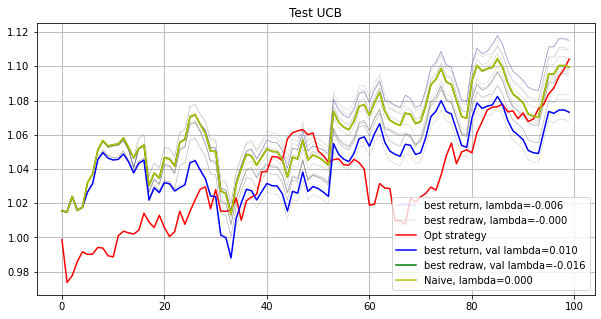

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.0007  0.0239  0.0182  0.0175  0.0152  0.0145 -0.      0.0062
  0.0086  0.0128  0.      0.0181  0.0106  0.0096  0.0154  0.0055 -0.
  0.0051  0.0099  0.0087  0.0186  0.      0.0165  0.0121  0.0064  0.0111
  0.0112  0.0136  0.0171  0.0108  0.0121  0.      0.015   0.0113  0.0027
  0.01    0.      0.0155  0.      0.      0.0083  0.0099  0.0043  0.0047
  0.0112  0.0012  0.0123  0.0098  0.0117  0.0169  0.0186  0.0058  0.0203
  0.0192  0.0104  0.011   0.0139  0.0058  0.0134  0.     -0.      0.0109
  0.0079  0.016   0.0153  0.0076  0.0027  0.0117  0.0076  0.006   0.0114
  0.0082  0.0097  0.0268  0.0109 -0.      0.0058  0.0158  0.0238  0.0077
  0.0218 -0.      0.0121  0.0076  0.0027  0.001   0.0101  0.014   0.0133
  0.0122  0.0172  0.0048  0.0105  0.0106  0.0058  0.0166  0.0139  0.0115
  0.0155]
0.5035585459556661
[-0.      0.      0.02    0.026   0.0242  0.0121  0.0178 -0.      0.
  0.0113  0.0127  0.    

[-0.      0.      0.0232  0.0293  0.0277  0.0088  0.0188  0.      0.
  0.0113  0.011   0.      0.0289  0.009   0.0057  0.0115  0.0007  0.
  0.003   0.0223  0.0087  0.0232 -0.      0.0238  0.0149  0.      0.0055
  0.0109  0.0116  0.0193  0.      0.0119 -0.      0.0213  0.0086  0.
  0.0028 -0.      0.0166  0.      0.      0.      0.0066  0.     -0.
  0.01    0.      0.0224  0.0023  0.0167  0.0165  0.0232  0.0018  0.019
  0.0325  0.0256  0.0069  0.0157 -0.      0.0102  0.0039  0.      0.0065
  0.0074  0.0138  0.01    0.0199  0.      0.0133  0.      0.      0.0088
  0.005   0.0005  0.0226  0.0116  0.0003  0.0097  0.017   0.0144  0.0199
  0.0251  0.      0.0088  0.     -0.      0.008   0.      0.0149  0.0241
  0.0079  0.0164  0.0039  0.0232  0.0142  0.0047  0.0217  0.0152  0.012
  0.0154]
0.00012484008486663963
[ 0.      0.      0.0232  0.0293  0.0277  0.0088  0.0188  0.      0.
  0.0113  0.011   0.      0.0289  0.009   0.0057  0.0115  0.0007  0.
  0.003   0.0223  0.0087  0.0232 -0.      0.

[ 0.      0.      0.0159  0.0367  0.0339  0.0045  0.0219 -0.      0.0071
  0.0069  0.0091  0.      0.0363  0.0111  0.0024  0.0019 -0.     -0.
  0.0032  0.0139  0.0041  0.0216  0.      0.0278  0.0152 -0.      0.0018
  0.0096  0.0146  0.0228 -0.      0.0127 -0.      0.01    0.0058  0.
  0.     -0.      0.0184 -0.      0.      0.0003  0.0055  0.0124 -0.
  0.008  -0.      0.0191 -0.      0.0145  0.004   0.0258 -0.      0.0241
  0.042   0.0246  0.0017  0.0134 -0.      0.0107 -0.     -0.0001  0.0061
  0.0061  0.0229  0.0103  0.028   0.      0.0171  0.      0.      0.0157
  0.0023  0.0013  0.0203  0.0164  0.      0.0143  0.0201  0.007   0.0213
  0.0231  0.      0.007   0.      0.0044  0.0073  0.01    0.0136  0.0246
  0.0004  0.0154  0.0008  0.0239  0.0174  0.0064  0.0219  0.0143  0.0071
  0.0178]
0.0001475715193755616
[ 0.      0.      0.0159  0.0367  0.0339  0.0045  0.0219 -0.      0.0071
  0.0069  0.0091  0.      0.0363  0.0111  0.0024  0.0019  0.     -0.
  0.0032  0.0139  0.0041  0.0216  0

[-0.      0.0006  0.013   0.0388  0.0357  0.0033  0.0224  0.      0.
  0.0058  0.0112  0.      0.0384  0.012   0.0008  0.0011  0.      0.
  0.0038  0.0134  0.0051  0.021  -0.      0.0295  0.0167  0.      0.0011
  0.0095  0.0132  0.0229 -0.      0.0124  0.      0.0086  0.0051  0.
  0.      0.      0.0189  0.     -0.      0.      0.0057  0.0082  0.
  0.008   0.      0.0213  0.0006  0.0142  0.0057  0.027   0.      0.023
  0.0445  0.0229  0.0005  0.0151  0.      0.0115  0.      0.      0.0065
  0.0008  0.0218  0.0125  0.0292  0.      0.017   0.      0.006   0.0142
  0.003   0.      0.0219  0.0156  0.0008  0.0134  0.0196  0.0089  0.0228
  0.0233  0.      0.0068  0.      0.0015  0.0065  0.0091  0.0122  0.0262
  0.      0.0175  0.      0.0235  0.0161  0.0076  0.0238  0.0132  0.007
  0.0193]
5.1441058594070965e-05
[-0.      0.0006  0.013   0.0388  0.0357  0.0033  0.0224  0.     -0.
  0.0058  0.0112  0.      0.0383  0.012   0.0008  0.0011  0.      0.
  0.0038  0.0134  0.0051  0.021  -0.      0.

[ 0.      0.0007  0.013   0.0388  0.0357  0.0033  0.0224  0.      0.
  0.0058  0.0112  0.      0.0383  0.012   0.0008  0.0011  0.      0.
  0.0038  0.0134  0.0051  0.0209  0.      0.0295  0.0167  0.      0.0011
  0.0095  0.0132  0.0229  0.      0.0124  0.      0.0086  0.0051  0.
  0.0001  0.      0.0189 -0.     -0.     -0.      0.0057  0.0082  0.
  0.008  -0.      0.0213  0.0006  0.0142  0.0057  0.027  -0.      0.023
  0.0445  0.0229  0.0005  0.0151 -0.      0.0115 -0.     -0.      0.0065
  0.0008  0.0217  0.0125  0.0292 -0.      0.017  -0.      0.006   0.0142
  0.0031 -0.      0.0219  0.0156  0.0008  0.0134  0.0196  0.0089  0.0228
  0.0233 -0.      0.0068  0.      0.0015  0.0065  0.0091  0.0122  0.0262
  0.      0.0175  0.      0.0235  0.0161  0.0076  0.0238  0.0132  0.007
  0.0193]
0.00022141844910242197
[-0.      0.0007  0.013   0.0388  0.0357  0.0033  0.0224 -0.     -0.
  0.0058  0.0112  0.      0.0383  0.012   0.0008  0.0011  0.      0.
  0.0038  0.0134  0.0051  0.0209  0.      0.

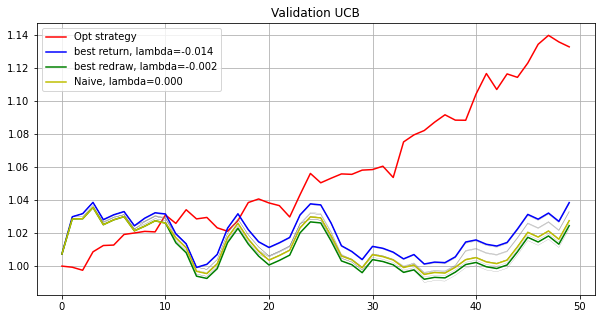

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[-0.      0.      0.0268  0.0266  0.0262  0.0015  0.0159  0.     -0.
  0.0102  0.0027  0.      0.025   0.0178  0.0062  0.0015  0.      0.0008
  0.0079  0.0197  0.0152  0.015   0.0052  0.0241  0.0274 -0.      0.
  0.007   0.0072  0.034   0.0121  0.0055  0.0018  0.014   0.0014  0.
 -0.      0.      0.0038  0.0025  0.      0.      0.0015  0.014   0.
  0.      0.0146  0.0177  0.0003  0.0127  0.0106  0.02    0.0072  0.0172
  0.0307  0.0003  0.0072  0.0242  0.0049  0.0121  0.0086  0.      0.0082
  0.0005  0.0144  0.0116  0.0144 -0.      0.0141  0.007   0.0067  0.025
  0.0055  0.0082  0.0195  0.0251  0.0111  0.014   0.0064  0.0194  0.0112
  0.0151  0.      0.0096  0.0074  0.0029  0.0003  0.0142  0.0118  0.0192
  0.0126  0.0028  0.0084  0.0242  0.0086  0.0069  0.0228  0.0202  0.0096
  0.0124]
0.00026324566900175867
[-0.      0.      0.0268  0.0266  0.0262  0.0015  0.0159  0.     -0.
  0.0102  0.0027 -0.      0.025   0.0178  0.0062  0.0015 -0.      0.0008
  0.0079  0.0197  0.0152  0.015   0.005

[ 0.     -0.      0.0337  0.032   0.0315  0.001   0.018  -0.      0.0013
  0.0093  0.0034 -0.      0.0297  0.0195  0.0039 -0.      0.      0.
  0.0063  0.0264  0.0145  0.0157  0.      0.0283  0.0305 -0.     -0.
  0.0067  0.0054  0.0394  0.0071  0.0053 -0.      0.0157 -0.      0.
  0.0016 -0.      0.0065  0.      0.     -0.     -0.      0.0154 -0.
  0.     -0.      0.0206  0.0006  0.0153  0.0111  0.0221  0.0064  0.0166
  0.037   0.      0.004   0.0252 -0.      0.0135  0.0054 -0.      0.0076
 -0.      0.0198  0.0135  0.0155 -0.      0.0115  0.0026  0.0023  0.0254
  0.0026  0.0053  0.0224  0.027   0.0093  0.0118  0.0092  0.0089  0.0156
  0.0185 -0.      0.0085  0.0066  0.      0.0153  0.0045  0.0083  0.0187
  0.0106  0.0011  0.0072  0.0244  0.006   0.0076  0.0263  0.0221  0.0084
  0.0097]
0.0001345917550300102
[ 0.     -0.      0.0337  0.032   0.0315  0.001   0.018  -0.      0.0013
  0.0093  0.0034 -0.      0.0297  0.0195  0.0039 -0.      0.      0.
  0.0063  0.0263  0.0145  0.0157  0.   

[-0.      0.0001  0.031   0.0337  0.0335 -0.      0.0187 -0.      0.005
  0.0067  0.0026  0.0034  0.0316  0.0184  0.0021  0.     -0.      0.
  0.0047  0.0254  0.0109  0.0136 -0.      0.0299  0.0268  0.     -0.
  0.0064  0.0038  0.0405  0.0091  0.0057  0.      0.014  -0.      0.
 -0.      0.      0.0075  0.0027 -0.      0.      0.      0.0139 -0.
 -0.      0.0005  0.0224 -0.      0.0151  0.0117  0.0231  0.0046  0.016
  0.0394 -0.      0.0035  0.0262  0.      0.0137  0.0036 -0.      0.0065
 -0.      0.0199  0.0144  0.013   0.      0.0118  0.      0.0004  0.0255
  0.0015  0.0033  0.0216  0.0287  0.0077  0.0137  0.0113  0.0087  0.016
  0.0207 -0.      0.0071  0.0044 -0.      0.0198  0.0044  0.0119  0.0172
  0.012   0.0044  0.004   0.0246  0.0087  0.0062  0.0269  0.0236  0.0082
  0.0103]
4.979821463156622e-05
[-0.      0.0001  0.031   0.0337  0.0335 -0.      0.0187 -0.      0.005
  0.0067  0.0026  0.0034  0.0316  0.0184  0.0021  0.     -0.      0.
  0.0047  0.0254  0.0109  0.0136 -0.      0

[ 0.      0.      0.031   0.0362  0.0352  0.      0.0192 -0.     -0.
  0.0074  0.0024  0.      0.0324  0.0198  0.0024  0.003  -0.      0.0012
  0.0013  0.0273  0.008   0.0127 -0.      0.0315  0.0268  0.      0.
  0.0065  0.0016  0.0404  0.0082  0.0049  0.      0.0149 -0.     -0.
 -0.     -0.      0.0088  0.0019 -0.     -0.      0.      0.0106 -0.
 -0.      0.      0.024   0.      0.0142  0.0107  0.0261  0.0024  0.0142
  0.0424  0.0014  0.003   0.0255  0.      0.0149 -0.      0.      0.0059
  0.0004  0.0202  0.015   0.0111 -0.      0.0118  0.      0.      0.0265
  0.0005  0.0043  0.0234  0.0298  0.0055  0.0147  0.0097  0.0071  0.0166
  0.0205  0.      0.0073  0.0014  0.      0.0248  0.0013  0.011   0.0169
  0.0099  0.0078  0.0034  0.0245  0.0113  0.012   0.0275  0.0245  0.0078
  0.0113]
0.05165812376745768
[ 0.      0.      0.031   0.0362  0.0352 -0.      0.0192 -0.     -0.
  0.0074  0.0024 -0.      0.0324  0.0198  0.0024  0.003   0.      0.0012
  0.0013  0.0273  0.008   0.0127  0.     

[ 0.     -0.      0.032   0.037   0.036  -0.      0.0194 -0.      0.0002
  0.0072  0.0023 -0.      0.0329  0.0173  0.002   0.0027 -0.      0.0004
  0.0013  0.0281  0.0089  0.0127  0.      0.0319  0.0251  0.      0.
  0.0065  0.0007  0.042   0.0084  0.0052  0.      0.0152 -0.     -0.
  0.     -0.      0.0092 -0.     -0.      0.0008  0.0012  0.0108  0.
  0.      0.      0.0243  0.0009  0.0146  0.0088  0.0269  0.0021  0.0144
  0.0435  0.0016  0.0028  0.0255 -0.      0.015  -0.      0.      0.0058
  0.0008  0.0204  0.0143  0.012   0.      0.0116 -0.     -0.      0.0259
 -0.      0.0042  0.0229  0.0307  0.0051  0.0147  0.0091  0.0048  0.0156
  0.0221  0.      0.0077  0.0006 -0.      0.0258 -0.      0.0121  0.0181
  0.0094  0.0066  0.0024  0.0246  0.0108  0.0125  0.0287  0.0247  0.0076
  0.0107]
0.0005682929235792297
[ 0.     -0.      0.032   0.037   0.036  -0.      0.0194 -0.      0.0002
  0.0072  0.0023 -0.      0.0329  0.0173  0.002   0.0027 -0.      0.0004
  0.0013  0.0281  0.0089  0.012

[ 0.      0.      0.032   0.037   0.036   0.      0.0194 -0.      0.0002
  0.0072  0.0023  0.      0.0329  0.0173  0.0021  0.0027  0.      0.0004
  0.0013  0.0281  0.0089  0.0127  0.      0.0319  0.0251  0.      0.
  0.0065  0.0007  0.042   0.0084  0.0052  0.      0.0152  0.      0.
  0.      0.      0.0093  0.0001 -0.      0.0008  0.0012  0.0108  0.
  0.      0.      0.0243  0.0009  0.0146  0.0088  0.0269  0.0021  0.0144
  0.0435  0.0016  0.0028  0.0255 -0.      0.015   0.     -0.      0.0058
  0.0008  0.0204  0.0143  0.0119 -0.      0.0116  0.      0.      0.0259
  0.      0.0042  0.0229  0.0307  0.0051  0.0147  0.0091  0.0048  0.0156
  0.0221 -0.      0.0077  0.0006 -0.      0.0258  0.      0.0121  0.0181
  0.0094  0.0066  0.0024  0.0246  0.0108  0.0124  0.0287  0.0247  0.0076
  0.0107]
0.00012246385958285152
[ 0.     -0.      0.032   0.037   0.036  -0.      0.0194 -0.      0.0002
  0.0072  0.0023  0.      0.0329  0.0173  0.0021  0.0027  0.      0.0004
  0.0013  0.0281  0.0089  0.01

[ 0.      0.004   0.0324  0.0392  0.0392  0.      0.0211  0.      0.
  0.0059  0.0033  0.0019  0.0366  0.0135  0.0002  0.0025  0.      0.0049
  0.      0.022   0.      0.0133  0.      0.0351  0.0235  0.      0.
  0.005   0.      0.0496  0.0181  0.0039  0.001   0.0108  0.      0.0025
  0.      0.0027  0.0069  0.      0.0001  0.0001  0.0003  0.0059 -0.
  0.      0.      0.0238  0.      0.0159  0.0113  0.0279  0.0021  0.0118
  0.0489 -0.      0.0013  0.0275  0.0023  0.0135 -0.      0.0019  0.0043
  0.0008  0.0181  0.0117  0.0156  0.0026  0.011  -0.      0.0037  0.0297
  0.      0.003   0.0204  0.0332  0.0046  0.0074  0.0065  0.0009  0.0144
  0.0262  0.      0.0086  0.     -0.      0.0141  0.      0.0086  0.019
  0.0115  0.0081  0.      0.0268  0.0074  0.0154  0.0266  0.027   0.0066
  0.0122]
0.00015472390149760408
[ 0.      0.004   0.0324  0.0392  0.0392  0.      0.0211  0.      0.
  0.0059  0.0033  0.0019  0.0366  0.0135  0.0002  0.0025  0.      0.0049
  0.      0.022   0.      0.0133 -0

[-0.      0.0029  0.0337  0.04    0.0402 -0.      0.0214  0.      0.001
  0.0055  0.0035  0.0017  0.0371  0.0116  0.0007  0.0023  0.      0.0035
  0.      0.0219  0.      0.0142  0.      0.0357  0.0233 -0.      0.
  0.005   0.0008  0.0495  0.0194  0.0036 -0.      0.0092 -0.      0.0021
  0.      0.      0.0069  0.     -0.     -0.     -0.      0.0056  0.
  0.      0.0001  0.0242 -0.      0.0164  0.0124  0.0274  0.0016  0.011
  0.0499  0.0001  0.0023  0.0291  0.0011  0.0133 -0.      0.0008  0.004
  0.0018  0.017   0.0119  0.0153  0.0016  0.0112  0.0006  0.0067  0.0292
 -0.      0.0039  0.0197  0.0337  0.003   0.0078  0.0067  0.0024  0.0146
  0.0273  0.0004  0.0079 -0.      0.      0.0121 -0.      0.0083  0.0204
  0.0116  0.0072 -0.      0.0274  0.0074  0.0149  0.0276  0.0265  0.0059
  0.0123]
0.00027407646901854947
[-0.      0.0028  0.0337  0.04    0.0402 -0.      0.0214  0.      0.001
  0.0055  0.0035  0.0017  0.0371  0.0116  0.0007  0.0023 -0.      0.0035
  0.      0.0219  0.      0.01

[-0.      0.0029  0.0336  0.04    0.0402 -0.      0.0215 -0.      0.0011
  0.0055  0.0036  0.0017  0.0371  0.0116  0.0006  0.0023 -0.      0.0035
 -0.      0.0219 -0.      0.0141 -0.      0.0357  0.0233 -0.      0.0001
  0.005   0.0008  0.0495  0.0194  0.0036 -0.      0.0092 -0.      0.0021
 -0.     -0.      0.0069  0.0001  0.     -0.     -0.      0.0056  0.
 -0.     -0.      0.0242 -0.      0.0164  0.0124  0.0274  0.0016  0.011
  0.0499  0.0001  0.0023  0.0291  0.0011  0.0133 -0.      0.0008  0.004
  0.0018  0.017   0.0119  0.0153  0.0016  0.0112  0.0006  0.0067  0.0292
 -0.      0.0039  0.0196  0.0337  0.003   0.0077  0.0067  0.0024  0.0146
  0.0273  0.0004  0.0079  0.     -0.      0.0121 -0.      0.0083  0.0204
  0.0116  0.0071  0.      0.0274  0.0074  0.0149  0.0276  0.0264  0.0059
  0.0123]
0.00010079925062383552
[-0.      0.0029  0.0336  0.04    0.0402 -0.      0.0215  0.      0.0011
  0.0055  0.0036  0.0017  0.0371  0.0116  0.0006  0.0023  0.      0.0035
  0.      0.0219 -0.    

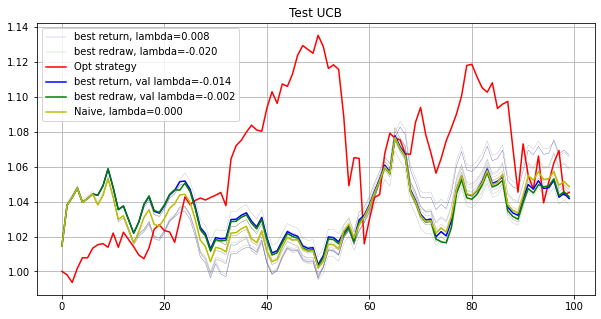

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[0.0084 0.0093 0.0102 0.009  0.0096 0.0098 0.0093 0.0099 0.0109 0.0096
 0.0101 0.0104 0.0084 0.0098 0.0103 0.0106 0.0108 0.0096 0.0128 0.0098
 0.0098 0.0097 0.0088 0.009  0.0105 0.0101 0.0103 0.009  0.01   0.0104
 0.0102 0.0105 0.0102 0.0103 0.0118 0.0099 0.0101 0.0084 0.0095 0.0095
 0.0103 0.0115 0.0101 0.0091 0.0108 0.0106 0.0113 0.0089 0.01   0.0098
 0.0095 0.0109 0.0101 0.0095 0.0088 0.0103 0.0096 0.0099 0.0108 0.0092
 0.0103 0.0098 0.0106 0.0099 0.0102 0.0092 0.0107 0.0086 0.0104 0.0095
 0.01   0.0097 0.0125 0.0101 0.0098 0.0109 0.01   0.0097 0.0093 0.0107
 0.0107 0.0109 0.01   0.0095 0.0104 0.0101 0.0099 0.0106 0.0094 0.0106
 0.0096 0.0097 0.0098 0.01   0.01   0.0095 0.0094 0.0103 0.0102 0.0101]
0.05485999097266335
[ 0.      0.02    0.0138  0.0064  0.0089  0.0135  0.0207  0.0107  0.0156
  0.0092  0.0123  0.0037  0.0047  0.0083  0.0033  0.0245  0.0073  0.0087
 -0.      0.0098  0.0105  0.0028  0.0099  0.

[-0.      0.0202  0.0139  0.0061  0.0088  0.0135  0.0198  0.0109  0.0159
  0.009   0.0113  0.0038  0.0047  0.008   0.0033  0.0242  0.0074  0.0086
  0.0002  0.0097  0.0104  0.0025  0.0097  0.0081  0.0159  0.013   0.0148
  0.0073  0.0115  0.0159  0.0073  0.0038  0.0111  0.0065  0.0208  0.0082
  0.0103  0.0089  0.011   0.0167  0.0002  0.0168  0.0087  0.0019  0.0131
  0.0184  0.0118  0.0053  0.0121  0.0076  0.0057  0.0093  0.0121  0.0051
  0.0007  0.0127  0.0079  0.0098  0.0163  0.007   0.0141  0.0079  0.0101
  0.0117  0.0082  0.0063  0.      0.0082  0.016   0.0118  0.0132  0.0103
  0.0134  0.0122  0.0029  0.0179  0.0108  0.0075  0.0073  0.0105  0.0126
  0.0066  0.0133  0.0069  0.0116  0.0088  0.0091  0.0169  0.0146  0.0156
  0.0113  0.0093  0.0049  0.0102  0.0046  0.008   0.0078  0.0076  0.0157
  0.0087]
0.00013586575280446708
[-0.      0.0202  0.0139  0.0061  0.0088  0.0135  0.0198  0.0109  0.0159
  0.009   0.0113  0.0038  0.0047  0.008   0.0033  0.0242  0.0074  0.0086
  0.0002  0.0097  

[ 0.      0.0226  0.0147  0.0083  0.0079  0.0127  0.0052  0.0113  0.0181
  0.0097  0.0137  0.0054  0.      0.0084  0.0004  0.025   0.007   0.0089
  0.      0.008   0.0118  0.0036  0.0082  0.008   0.0217  0.0189  0.0146
  0.007   0.0123  0.0172  0.0081  0.0038  0.0072  0.0048  0.0102  0.0072
  0.0102  0.0098  0.0116  0.0153 -0.      0.0188  0.0078  0.0009  0.0093
  0.0191  0.0121  0.004   0.0165  0.007   0.0104  0.0086  0.0122  0.0071
  0.0006  0.0148  0.005   0.011   0.0178  0.0072  0.015   0.007   0.0102
  0.0085  0.0064  0.0055  0.0076  0.0056  0.0184  0.0134  0.0149  0.0091
  0.0124  0.0123  0.0043  0.0198  0.0107  0.006   0.0073  0.0101  0.0152
  0.0037  0.0145  0.0064  0.0079  0.0084  0.0096  0.0171  0.0158  0.0186
  0.011   0.0089  0.0053  0.0084  0.0023  0.0085  0.0096  0.0094  0.0149
  0.0105]
1.168841872689694e-05
[ 0.      0.0226  0.0147  0.0083  0.0079  0.0127  0.0052  0.0113  0.0181
  0.0097  0.0137  0.0054  0.      0.0084  0.0004  0.025   0.007   0.0089
  0.      0.008   0

[-0.      0.0217  0.0159  0.0048  0.0072  0.0105 -0.      0.0119  0.0204
  0.0073  0.0127  0.0029  0.      0.0071  0.      0.0222  0.0065  0.0083
  0.      0.0055  0.0099  0.      0.0066  0.0047  0.0239  0.0201  0.0155
  0.0069  0.0128  0.0196  0.0063  0.0052  0.0073  0.0024  0.01    0.0076
  0.0101  0.0175  0.0141  0.0133 -0.      0.0204  0.0062 -0.      0.0104
  0.0208  0.013   0.0025  0.0167  0.0055  0.0104  0.0067  0.0122  0.0065
  0.      0.0141  0.0059  0.0109  0.0194  0.0069  0.0165  0.0039  0.011
  0.006   0.0074  0.0072  0.0114  0.0057  0.0207  0.0097  0.016   0.0079
  0.0192  0.0127  0.0051  0.0216  0.0111  0.0073  0.0089  0.0087  0.0161
  0.0039  0.0157  0.0056  0.0073  0.0078  0.0078  0.019   0.0183  0.0202
  0.01    0.0088  0.0079  0.0091  0.003   0.0065  0.0125  0.0077  0.0153
  0.0122]
3.124353052030484e-05
[-0.      0.0217  0.0159  0.0048  0.0072  0.0105 -0.      0.0119  0.0204
  0.0073  0.0127  0.0029 -0.      0.0071  0.      0.0222  0.0065  0.0083
  0.      0.0055  0.

[ 0.      0.0286  0.0175  0.002   0.0065  0.0096 -0.      0.0127  0.0231
  0.0066  0.0048  0.0029  0.0014  0.0087  0.0006  0.0225  0.0019  0.0078
  0.      0.0047  0.0098  0.      0.0029  0.0052  0.0272  0.0196  0.0119
  0.0096  0.013   0.0219  0.0042  0.0064  0.009   0.005   0.0035  0.0093
  0.0089  0.0182  0.0132  0.0121  0.      0.0188  0.0015 -0.      0.0106
  0.0226  0.0112  0.      0.0171  0.0042  0.0116 -0.      0.0133  0.003
 -0.      0.0154  0.0095  0.0101  0.0181  0.0093  0.018   0.0046  0.0086
  0.0067  0.0047  0.0071  0.0084  0.0082  0.0238  0.0115  0.015   0.0078
  0.0225  0.0096  0.0027  0.0249  0.0108  0.0066  0.0141  0.0111  0.0168
  0.0073  0.0172  0.0074  0.0037  0.0043  0.0086  0.0202  0.0198  0.0219
  0.0091  0.0084  0.0056  0.007   0.0001  0.007   0.0214  0.0058  0.0184
  0.014 ]
0.00010527631565638887
[ 0.      0.0286  0.0175  0.002   0.0065  0.0096 -0.      0.0127  0.0231
  0.0066  0.0048  0.0029  0.0014  0.0087  0.0006  0.0225  0.0019  0.0078
  0.      0.0047  0

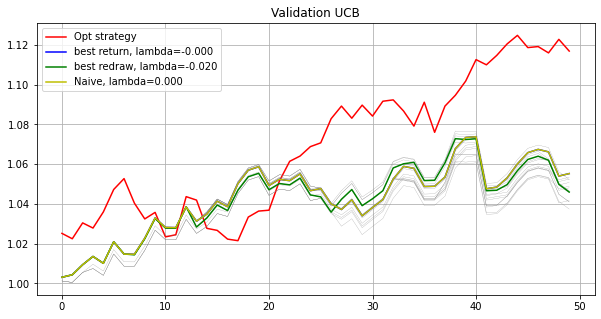

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[ 0.      0.0266  0.0147  0.003   0.0088  0.0069  0.0111  0.0197  0.0156
  0.006   0.0088  0.008   0.0059  0.0084  0.0102  0.0015  0.0104 -0.
  0.0115  0.0082  0.002  -0.      0.0022  0.      0.0189  0.0072  0.0051
  0.01    0.0121  0.0171  0.0086  0.0146  0.0122  0.007   0.0153  0.0111
  0.0109  0.0087  0.017   0.0057  0.0014  0.0103  0.009   0.0037  0.0092
  0.0172  0.0108  0.0031  0.0118  0.0064  0.002   0.003   0.0123  0.008
  0.0066  0.01    0.0116  0.0089  0.0131  0.0073  0.0145  0.0096  0.0068
  0.0151  0.0153  0.0128  0.0245  0.0023  0.0166  0.0039  0.008   0.0092
  0.0111  0.0059  0.0052  0.0199  0.0105  0.0125  0.0159  0.0076  0.0157
  0.0177  0.0138  0.0067  0.0075  0.0107  0.0116  0.0152  0.0178  0.0094
  0.0105  0.0117  0.0213  0.0048  0.0032  0.0102  0.0097  0.0082  0.0197
  0.0104]
2.084921060015956e-05
[ 0.      0.0266  0.0147  0.003   0.0088  0.0069  0.0111  0.0197  0.0156
  0.006   0.0088  0.008   0.0059  0.0084  0.0102  0.0015  0.0104 -0.
  0.0115  0.0082  0.002   0.

[ 0.      0.0266  0.015   0.0033  0.0085  0.0066  0.0068  0.0203  0.0164
  0.006   0.0093  0.0081  0.0055  0.0078  0.0103  0.0026  0.0099 -0.
  0.0115  0.0079  0.0011 -0.      0.0019  0.0003  0.0193  0.006   0.0053
  0.0092  0.0123  0.0176  0.0083  0.0145  0.0133  0.0072  0.0153  0.0108
  0.0113  0.0076  0.0178  0.006   0.0004  0.0099  0.0088  0.0038  0.0083
  0.018   0.0109  0.0027  0.0124  0.006   0.0007  0.0029  0.0126  0.0081
  0.0074  0.0104  0.0134  0.0088  0.0133  0.0076  0.0148  0.0098  0.0068
  0.0152  0.0163  0.012   0.0258  0.0019  0.0174  0.0037  0.0075  0.0092
  0.01    0.0052  0.0056  0.021   0.0106  0.0121  0.0163  0.0078  0.0162
  0.018   0.0136  0.0066  0.0053  0.0101  0.0109  0.0172  0.0182  0.0093
  0.0103  0.0129  0.0208  0.0048  0.0039  0.0097  0.0108  0.0082  0.0202
  0.0108]
6.43283999456279e-06
[ 0.      0.0266  0.015   0.0033  0.0085  0.0066  0.0068  0.0203  0.0164
  0.006   0.0093  0.0081  0.0055  0.0078  0.0103  0.0026  0.0099 -0.
  0.0115  0.0079  0.0011 -0.

[-0.      0.0267  0.0167  0.0007  0.0075  0.0066  0.      0.0193  0.0197
  0.0049  0.0109  0.0079  0.0035  0.0073  0.0085  0.0027  0.0116  0.0005
  0.008   0.0054 -0.     -0.     -0.     -0.      0.0237  0.0042  0.0058
  0.0095  0.0131  0.0194  0.007   0.0126  0.0158  0.0061  0.0196  0.0103
  0.0129  0.0043  0.0156  0.0061  0.0055  0.0143  0.0057  0.0001  0.0057
  0.0217  0.0086  0.0015  0.0145  0.0047 -0.     -0.      0.0138  0.0064
  0.0075  0.0121  0.0103  0.0086  0.0151  0.0066  0.0175  0.0085  0.0085
  0.0134  0.0203  0.0089  0.0278  0.0003  0.0195  0.0026  0.0109  0.0085
  0.0093  0.0062  0.0034  0.0231  0.0108  0.0105  0.0185  0.0097  0.0149
  0.0176  0.0149  0.0053  0.0081  0.0089  0.0104  0.0183  0.0179  0.0097
  0.0094  0.0163  0.0248  0.002   0.0025  0.0071  0.0122  0.0077  0.0219
  0.0146]
8.648479807432645e-05
[ 0.      0.0267  0.0168  0.0007  0.0075  0.0066  0.      0.0193  0.0197
  0.0049  0.0109  0.0079  0.0035  0.0073  0.0085  0.0027  0.0116  0.0005
  0.008   0.0053 -0

[ 0.      0.0278  0.0181 -0.      0.0075  0.0045  0.      0.024   0.023
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0014
  0.0077  0.0041  0.0068 -0.     -0.     -0.      0.0259  0.0042  0.004
  0.0067  0.0137  0.0217  0.0065  0.0117  0.0174  0.0084  0.0199  0.0111
  0.012   0.0032  0.0174  0.0049  0.      0.0144  0.0018 -0.      0.0046
  0.0247  0.0081  0.0023  0.0139  0.0031 -0.      0.      0.0146  0.0059
  0.0024  0.0116  0.007   0.0111  0.0172  0.0016  0.0195  0.0085  0.0068
  0.0095  0.018   0.0111  0.0223  0.      0.0227  0.0009  0.0119  0.0076
  0.0092  0.0039  0.0079  0.0275  0.0112  0.0099  0.0208  0.0117  0.0186
  0.0161  0.0171  0.0053  0.009   0.007   0.0096  0.0211  0.0211  0.0103
  0.0085  0.0164  0.0222  0.0013  0.0029  0.006   0.0158  0.0065  0.0249
  0.0154]
0.00010272745820688246
[ 0.      0.0278  0.0181 -0.      0.0075  0.0045  0.      0.024   0.023
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0014
  0.0077  0.0041  0.0

[-0.      0.0278  0.0182  0.      0.0075  0.0045 -0.      0.024   0.023
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0014
  0.0077  0.0041  0.0068  0.      0.      0.      0.0259  0.0042  0.004
  0.0066  0.0137  0.0217  0.0065  0.0117  0.0174  0.0084  0.0199  0.0111
  0.012   0.0032  0.0174  0.0049  0.      0.0144  0.0018 -0.      0.0046
  0.0247  0.0081  0.0023  0.0139  0.0031  0.      0.0001  0.0146  0.0059
  0.0024  0.0116  0.0069  0.0111  0.0172  0.0017  0.0195  0.0085  0.0068
  0.0095  0.018   0.0111  0.0223 -0.      0.0227  0.0009  0.0119  0.0076
  0.0092  0.0039  0.0079  0.0275  0.0112  0.0099  0.0208  0.0117  0.0186
  0.0161  0.0171  0.0053  0.009   0.007   0.0096  0.0211  0.0211  0.0103
  0.0085  0.0164  0.0222  0.0013  0.0029  0.006   0.0158  0.0065  0.0249
  0.0153]
0.0002463958763032297
[-0.      0.0278  0.0182  0.      0.0075  0.0045 -0.      0.024   0.023
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0055  0.0058  0.0014
  0.0077  0.0041  0.00

[ 0.      0.0278  0.0181 -0.      0.0075  0.0046  0.      0.024   0.023
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0014
  0.0077  0.0041  0.0068 -0.      0.      0.      0.0259  0.0042  0.004
  0.0066  0.0137  0.0217  0.0065  0.0117  0.0174  0.0084  0.0199  0.0111
  0.012   0.0032  0.0174  0.0049 -0.      0.0144  0.0018  0.      0.0046
  0.0247  0.0081  0.0023  0.0139  0.0031  0.      0.0001  0.0146  0.0059
  0.0024  0.0116  0.0069  0.0111  0.0172  0.0017  0.0195  0.0085  0.0068
  0.0095  0.018   0.0111  0.0223  0.      0.0227  0.0009  0.0119  0.0076
  0.0092  0.0039  0.0079  0.0275  0.0112  0.0099  0.0208  0.0117  0.0186
  0.0161  0.0171  0.0053  0.009   0.007   0.0096  0.0211  0.0211  0.0103
  0.0085  0.0164  0.0222  0.0013  0.0029  0.006   0.0158  0.0065  0.0249
  0.0153]
0.0003734082495014199
[ 0.      0.0278  0.0181 -0.      0.0075  0.0046 -0.      0.024   0.023
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0014
  0.0077  0.0041  0.00

[-0.      0.0282  0.0183 -0.      0.0074  0.0048  0.0008  0.0241  0.0233
  0.0055  0.0086  0.0052  0.0007  0.0053  0.0082  0.0055  0.0058  0.0007
  0.0078  0.0037  0.0065  0.      0.      0.      0.0261  0.0043  0.0038
  0.007   0.0138  0.022   0.0063  0.0116  0.0177  0.0084  0.0206  0.0111
  0.0123  0.0028  0.0168  0.0049 -0.      0.0148  0.0017  0.0007  0.0042
  0.0251  0.0085  0.0023  0.0138  0.0029 -0.      0.0004  0.0148  0.0053
  0.0013  0.0117  0.0066  0.0111  0.0176  0.0015  0.02    0.0087  0.007
  0.0089  0.0182  0.0113  0.0218  0.      0.0231  0.0012  0.012   0.0073
  0.0091  0.0037  0.0076  0.0279  0.0112  0.01    0.0208  0.0116  0.0182
  0.0154  0.0173  0.0052  0.0084  0.0068  0.0098  0.0211  0.0212  0.0106
  0.0085  0.0165  0.0229  0.0011  0.0027  0.0057  0.0165  0.0063  0.0249
  0.0156]
0.00012599693792656505
[-0.      0.0281  0.0183 -0.      0.0074  0.0048  0.0008  0.0241  0.0233
  0.0055  0.0086  0.0052  0.0007  0.0053  0.0082  0.0055  0.0058  0.0007
  0.0079  0.0037  0

[ 0.      0.0281  0.0183 -0.      0.0074  0.0048  0.0008  0.0241  0.0233
  0.0055  0.0086  0.0052  0.0007  0.0053  0.0082  0.0055  0.0058  0.0007
  0.0079  0.0037  0.0065 -0.     -0.     -0.      0.0261  0.0043  0.0038
  0.007   0.0138  0.022   0.0063  0.0116  0.0177  0.0084  0.0206  0.0111
  0.0123  0.0028  0.0168  0.0049 -0.      0.0148  0.0017  0.0007  0.0042
  0.0251  0.0085  0.0023  0.0138  0.0029 -0.      0.0004  0.0148  0.0053
  0.0013  0.0117  0.0066  0.0111  0.0176  0.0015  0.02    0.0087  0.007
  0.0089  0.0182  0.0113  0.0218 -0.      0.0231  0.0012  0.012   0.0073
  0.0091  0.0037  0.0076  0.0279  0.0112  0.01    0.0208  0.0116  0.0182
  0.0154  0.0173  0.0052  0.0084  0.0068  0.0098  0.0211  0.0212  0.0106
  0.0085  0.0165  0.0229  0.0011  0.0027  0.0057  0.0165  0.0063  0.0249
  0.0156]
6.37319884034296e-06
[ 0.      0.0281  0.0183 -0.      0.0074  0.0048  0.0008  0.0241  0.0233
  0.0055  0.0086  0.0052  0.0007  0.0053  0.0082  0.0055  0.0058  0.0007
  0.0079  0.0037  0.0

[ 0.      0.0281  0.0183  0.      0.0074  0.0048  0.0008  0.0241  0.0233
  0.0055  0.0086  0.0052  0.0007  0.0053  0.0082  0.0055  0.0058  0.0007
  0.0079  0.0037  0.0065 -0.     -0.     -0.      0.0261  0.0043  0.0038
  0.007   0.0138  0.022   0.0063  0.0116  0.0177  0.0084  0.0206  0.0111
  0.0123  0.0028  0.0168  0.0049 -0.      0.0148  0.0017  0.0007  0.0042
  0.0251  0.0085  0.0023  0.0138  0.0029 -0.      0.0004  0.0148  0.0053
  0.0013  0.0117  0.0066  0.0111  0.0176  0.0015  0.02    0.0087  0.007
  0.0089  0.0182  0.0113  0.0218  0.      0.0231  0.0012  0.012   0.0073
  0.0091  0.0037  0.0076  0.0279  0.0112  0.01    0.0208  0.0116  0.0182
  0.0154  0.0173  0.0052  0.0083  0.0068  0.0098  0.0211  0.0212  0.0106
  0.0085  0.0165  0.0229  0.0011  0.0027  0.0057  0.0165  0.0063  0.0249
  0.0156]
9.885900502658683e-06
[ 0.      0.0281  0.0183  0.      0.0074  0.0048  0.0008  0.0241  0.0233
  0.0055  0.0086  0.0052  0.0007  0.0053  0.0082  0.0055  0.0058  0.0007
  0.0079  0.0037  0.

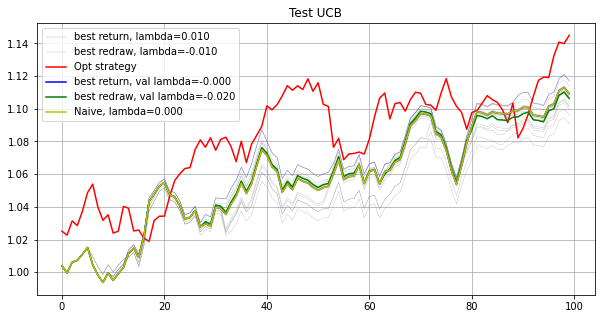

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.4688800713952288e-09
[0.0088 0.0101 0.0094 0.0099 0.0099 0.0097 0.0098 0.01   0.0099 0.0101
 0.0102 0.0104 0.0105 0.0103 0.0079 0.0107 0.0103 0.0101 0.0099 0.0099
 0.0097 0.0097 0.0094 0.0099 0.0099 0.0099 0.01   0.0103 0.0095 0.0103
 0.0098 0.0102 0.0101 0.0094 0.0105 0.0091 0.0097 0.0094 0.0103 0.0096
 0.01   0.0098 0.0095 0.0102 0.0102 0.0098 0.011  0.0099 0.0092 0.0105
 0.0101 0.0109 0.0098 0.01   0.00

[0.0068 0.0109 0.0096 0.0096 0.0089 0.0108 0.0089 0.0101 0.0096 0.0103
 0.0104 0.0102 0.0109 0.0088 0.0105 0.0107 0.0098 0.0103 0.0105 0.0103
 0.0078 0.0111 0.0098 0.01   0.0104 0.0094 0.0096 0.0107 0.0092 0.0109
 0.0096 0.0095 0.0102 0.0083 0.0105 0.0083 0.0095 0.0096 0.0112 0.0114
 0.0098 0.0085 0.0114 0.0105 0.0088 0.0103 0.0141 0.0097 0.0087 0.0123
 0.0101 0.0107 0.0096 0.0102 0.0079 0.0097 0.0093 0.0121 0.0121 0.0091
 0.0109 0.0119 0.0088 0.0081 0.0097 0.0085 0.0096 0.0078 0.0092 0.0071
 0.0085 0.0112 0.0097 0.0123 0.0112 0.0113 0.0133 0.0101 0.0102 0.0092
 0.0095 0.011  0.0115 0.0107 0.0085 0.0106 0.0102 0.0105 0.01   0.0109
 0.0075 0.011  0.0096 0.0109 0.0092 0.0097 0.0082 0.0109 0.0106 0.011 ]
2.1204374127658035e-05
[0.0048 0.0109 0.0103 0.0098 0.008  0.0101 0.008  0.01   0.0094 0.0104
 0.0101 0.0101 0.0122 0.008  0.0068 0.0118 0.0093 0.0105 0.0102 0.0103
 0.0069 0.0123 0.0096 0.01   0.0102 0.0113 0.0102 0.011  0.009  0.0118
 0.0092 0.0088 0.0092 0.0091 0.0104 0.008  0.0101 0.0

[0.0046 0.0112 0.0108 0.0098 0.0078 0.0101 0.0081 0.0097 0.0093 0.0105
 0.0101 0.0099 0.0109 0.0073 0.008  0.0118 0.0091 0.0105 0.0095 0.0102
 0.0067 0.0119 0.0094 0.0094 0.0102 0.0111 0.0102 0.0113 0.0088 0.0125
 0.0088 0.0097 0.0092 0.0089 0.0109 0.0079 0.0096 0.0096 0.0124 0.015
 0.0096 0.0077 0.0078 0.0109 0.0068 0.0107 0.014  0.0088 0.008  0.0119
 0.0104 0.0118 0.0091 0.0096 0.007  0.0118 0.0126 0.0126 0.0138 0.0133
 0.0109 0.0115 0.008  0.0111 0.0098 0.0081 0.0078 0.006  0.0089 0.0057
 0.0088 0.0118 0.0094 0.0137 0.0123 0.0113 0.0116 0.0105 0.01   0.0086
 0.0095 0.0097 0.0127 0.0119 0.0087 0.0095 0.0101 0.0094 0.0097 0.0131
 0.009  0.0119 0.0078 0.0099 0.0087 0.0088 0.0083 0.0127 0.011  0.011 ]
1.7135714670485705e-06
[0.0046 0.0112 0.0108 0.0098 0.0078 0.0101 0.0081 0.0097 0.0093 0.0105
 0.0101 0.0099 0.0109 0.0073 0.008  0.0118 0.0091 0.0105 0.0095 0.0102
 0.0067 0.0119 0.0094 0.0094 0.0102 0.0111 0.0102 0.0113 0.0088 0.0125
 0.0088 0.0097 0.0092 0.0089 0.0109 0.0079 0.0096 0.00

[0.0046 0.0112 0.0108 0.0098 0.0078 0.0101 0.0081 0.0097 0.0093 0.0105
 0.0101 0.0099 0.0109 0.0073 0.008  0.0118 0.0091 0.0105 0.0095 0.0102
 0.0067 0.0119 0.0094 0.0094 0.0102 0.0111 0.0102 0.0113 0.0088 0.0125
 0.0088 0.0097 0.0092 0.0089 0.0109 0.0079 0.0096 0.0096 0.0124 0.015
 0.0096 0.0077 0.0078 0.0109 0.0068 0.0107 0.014  0.0088 0.008  0.0119
 0.0104 0.0118 0.0091 0.0096 0.007  0.0118 0.0126 0.0126 0.0138 0.0133
 0.0109 0.0115 0.008  0.0111 0.0098 0.0081 0.0078 0.006  0.0089 0.0057
 0.0088 0.0118 0.0094 0.0137 0.0123 0.0113 0.0116 0.0105 0.01   0.0086
 0.0095 0.0097 0.0127 0.0119 0.0087 0.0095 0.0101 0.0094 0.0097 0.0131
 0.009  0.0119 0.0078 0.0099 0.0087 0.0088 0.0083 0.0127 0.011  0.011 ]
2.222273073112374e-08
[0.0046 0.0112 0.0108 0.0098 0.0078 0.0101 0.0081 0.0097 0.0093 0.0105
 0.0101 0.0099 0.0109 0.0073 0.008  0.0118 0.0091 0.0105 0.0095 0.0102
 0.0067 0.0119 0.0094 0.0094 0.0102 0.0111 0.0102 0.0113 0.0088 0.0125
 0.0088 0.0097 0.0092 0.0089 0.0109 0.0079 0.0096 0.009

[0.     0.0141 0.0141 0.0104 0.0068 0.0119 0.0082 0.0105 0.0088 0.0116
 0.0102 0.0114 0.0098 0.0009 0.0037 0.0158 0.0081 0.0118 0.005  0.0107
 0.0071 0.0129 0.0083 0.0078 0.0112 0.017  0.011  0.011  0.0076 0.0151
 0.0086 0.0103 0.0117 0.0063 0.0084 0.0094 0.0078 0.0092 0.0145 0.0107
 0.0097 0.0049 0.0082 0.0125 0.0014 0.0152 0.0124 0.0074 0.0025 0.016
 0.0121 0.0127 0.0092 0.0091 0.0053 0.0159 0.0082 0.0163 0.0156 0.0098
 0.0117 0.0148 0.0058 0.0157 0.011  0.0071 0.0068 0.0106 0.012  0.0002
 0.0071 0.0124 0.0093 0.0202 0.0098 0.0144 0.0091 0.0122 0.0074 0.0052
 0.0084 0.0093 0.0165 0.0139 0.0059 0.0086 0.01   0.0077 0.0101 0.0156
 0.0043 0.0147 0.0056 0.0105 0.0078 0.0087 0.0074 0.0127 0.0128 0.0124]
1.4458303874044025e-05
[-0.      0.0141  0.0141  0.0104  0.0068  0.0119  0.0082  0.0105  0.0088
  0.0116  0.0102  0.0114  0.0098  0.0009  0.0037  0.0158  0.0081  0.0118
  0.005   0.0107  0.0071  0.0129  0.0083  0.0078  0.0112  0.017   0.011
  0.011   0.0076  0.0151  0.0086  0.0103  0.0117 

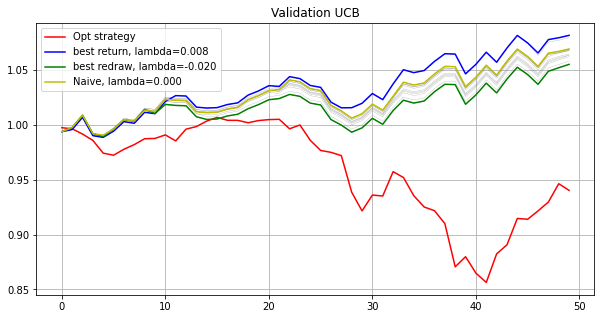

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[0.0073 0.011  0.0083 0.0103 0.0103 0.0095 0.0081 0.0102 0.0097 0.0103
 0.0102 0.013  0.0081 0.0089 0.0037 0.0135 0.0093 0.0101 0.0096 0.0095
 0.0076 0.0111 0.0098 0.0095 0.0107 0.011  0.0101 0.0109 0.0094 0.0116
 0.0095 0.0109 0.0125 0.0084 0.0088 0.0094 0.0104 0.0107 0.011  0.0094
 0.0099 0.0077 0.0099 0.0107 0.0076 0.0138 0.0116 0.008  0.0095 0.0108
 0.0105 0.0132 0.0094 0.0095 0.0114 0.0123 0.0066 0.0117 0.0119 0.0079
 0.0127 0.0096 0.0083 0.0114 0.0092 0.0101 0.0082 0.01   0.0102 0.0079
 0.0094 0.0109 0.0097 0.0125 0.0091 0.0082 0.0089 0.0103 0.0086 0.0084
 0.0097 0.0091 0.0119 0.0109 0.0103 0.0089 0.0101 0.0101 0.01   0.0131
 0.0128 0.011  0.0116 0.0099 0.0094 0.0101 0.0096 0.0102 0.0098 0.0104]
7.532205588411944e-10
[0.0073 0.011  0.0083 0.0103 0.0103 0.0095 0.0081 0.0102 0.0097 0.0103
 0.0102 0.013  0.0081 0.0089 0.0037 0.0135 0.0093 0.0101 0.0096 0.0095
 0.0076 0.0111 0.0098 0.0095 0.0107 0.011  0.0101 0.0109 0.0094 0.0116
 0.0095 0.0109 0.0125 0.0084 0.0088 0.0094 0.0104 0.01

[0.0071 0.0109 0.0087 0.0104 0.0099 0.0096 0.0076 0.0102 0.0095 0.0104
 0.0103 0.013  0.0085 0.009  0.002  0.0141 0.0091 0.0102 0.0095 0.0095
 0.0076 0.0115 0.0096 0.0095 0.0106 0.0115 0.0102 0.0111 0.0093 0.0119
 0.0094 0.0109 0.0123 0.0082 0.0092 0.0091 0.0102 0.0105 0.0113 0.0095
 0.0098 0.0072 0.0098 0.0108 0.0075 0.014  0.012  0.0076 0.0099 0.0108
 0.0106 0.0135 0.0093 0.0096 0.011  0.0126 0.0064 0.0118 0.0119 0.0075
 0.0128 0.0101 0.0081 0.0116 0.0093 0.0101 0.0082 0.0095 0.0101 0.0071
 0.0096 0.011  0.0096 0.013  0.0092 0.008  0.0087 0.0103 0.0086 0.0084
 0.0103 0.0089 0.0122 0.0111 0.0102 0.0088 0.0104 0.0098 0.0099 0.0133
 0.0132 0.0112 0.0116 0.01   0.0092 0.01   0.0096 0.0105 0.0096 0.0108]
3.870914626075833e-08
[0.0071 0.0109 0.0087 0.0104 0.0099 0.0096 0.0076 0.0102 0.0095 0.0104
 0.0103 0.013  0.0085 0.009  0.002  0.0141 0.0091 0.0102 0.0095 0.0095
 0.0076 0.0115 0.0096 0.0095 0.0106 0.0115 0.0102 0.0111 0.0093 0.0119
 0.0094 0.0109 0.0123 0.0082 0.0092 0.0091 0.0102 0.01

[0.0071 0.0109 0.0087 0.0104 0.0099 0.0096 0.0076 0.0102 0.0095 0.0104
 0.0103 0.013  0.0085 0.009  0.002  0.0141 0.0091 0.0102 0.0095 0.0095
 0.0076 0.0115 0.0096 0.0095 0.0106 0.0115 0.0102 0.0111 0.0093 0.0119
 0.0094 0.0109 0.0123 0.0082 0.0092 0.0091 0.0102 0.0105 0.0113 0.0095
 0.0098 0.0072 0.0098 0.0108 0.0075 0.014  0.012  0.0076 0.0099 0.0108
 0.0106 0.0135 0.0093 0.0096 0.011  0.0126 0.0064 0.0118 0.0119 0.0075
 0.0128 0.0101 0.0081 0.0116 0.0093 0.0101 0.0082 0.0095 0.0101 0.0071
 0.0096 0.011  0.0096 0.013  0.0092 0.008  0.0087 0.0103 0.0086 0.0084
 0.0103 0.0089 0.0122 0.0111 0.0102 0.0088 0.0104 0.0098 0.0099 0.0133
 0.0132 0.0112 0.0116 0.01   0.0092 0.01   0.0096 0.0105 0.0096 0.0108]
3.4287557302723967e-07
[0.0071 0.0109 0.0087 0.0104 0.0099 0.0096 0.0076 0.0102 0.0095 0.0104
 0.0103 0.013  0.0085 0.009  0.002  0.0141 0.0091 0.0102 0.0095 0.0095
 0.0076 0.0115 0.0096 0.0095 0.0106 0.0115 0.0102 0.0111 0.0093 0.0119
 0.0094 0.0109 0.0123 0.0082 0.0092 0.0091 0.0102 0.0

[0.0071 0.0109 0.0087 0.0104 0.0099 0.0096 0.0076 0.0102 0.0095 0.0104
 0.0103 0.013  0.0085 0.009  0.002  0.0141 0.0091 0.0102 0.0095 0.0095
 0.0076 0.0115 0.0096 0.0095 0.0106 0.0115 0.0101 0.0111 0.0093 0.0119
 0.0094 0.0109 0.0123 0.0082 0.0092 0.0091 0.0102 0.0105 0.0113 0.0095
 0.0098 0.0072 0.0098 0.0108 0.0075 0.014  0.012  0.0076 0.0099 0.0108
 0.0106 0.0135 0.0093 0.0096 0.011  0.0126 0.0064 0.0118 0.0119 0.0075
 0.0128 0.0101 0.0081 0.0116 0.0093 0.0101 0.0082 0.0095 0.0101 0.0071
 0.0096 0.011  0.0096 0.013  0.0092 0.008  0.0087 0.0103 0.0086 0.0084
 0.0103 0.0089 0.0122 0.0111 0.0102 0.0088 0.0104 0.0098 0.0099 0.0133
 0.0132 0.0112 0.0116 0.01   0.0092 0.01   0.0096 0.0105 0.0096 0.0108]
1.2640692881316085e-07
[0.0069 0.011  0.0085 0.0103 0.0099 0.0095 0.0069 0.0102 0.0095 0.0103
 0.0102 0.013  0.0085 0.0089 0.0016 0.0142 0.0091 0.0102 0.0095 0.0095
 0.0071 0.0112 0.0095 0.0095 0.0107 0.0116 0.0102 0.0111 0.0092 0.0119
 0.0094 0.0109 0.0123 0.0081 0.0094 0.009  0.0101 0.0

[0.0059 0.0113 0.0095 0.0099 0.0119 0.0094 0.0076 0.0101 0.0094 0.0101
 0.0095 0.0128 0.0082 0.0082 0.0009 0.0145 0.0091 0.0101 0.0083 0.0092
 0.0071 0.0097 0.0089 0.0093 0.0104 0.0118 0.0103 0.0115 0.0091 0.0124
 0.0087 0.0107 0.012  0.0087 0.0102 0.0087 0.0095 0.0097 0.0118 0.0095
 0.0097 0.0072 0.0097 0.0108 0.0071 0.0137 0.0118 0.0093 0.0086 0.0104
 0.0106 0.0167 0.0089 0.0104 0.0103 0.0131 0.0056 0.0117 0.0116 0.008
 0.0124 0.0107 0.0072 0.0124 0.0095 0.0098 0.0078 0.0083 0.0099 0.0113
 0.009  0.0133 0.0095 0.0123 0.0095 0.0076 0.0085 0.0107 0.0086 0.0107
 0.0104 0.0093 0.0125 0.0117 0.0099 0.0088 0.0106 0.0095 0.0095 0.0137
 0.0127 0.0119 0.011  0.0095 0.0085 0.0096 0.0101 0.0111 0.0088 0.0108]
5.569439937296581e-05
[0.0059 0.0113 0.0095 0.0099 0.0119 0.0094 0.0076 0.0101 0.0094 0.0101
 0.0095 0.0128 0.0082 0.0082 0.0009 0.0145 0.0091 0.0101 0.0083 0.0092
 0.0071 0.0097 0.0089 0.0093 0.0104 0.0118 0.0103 0.0115 0.0091 0.0124
 0.0087 0.0107 0.012  0.0087 0.0102 0.0087 0.0095 0.009

[ 0.0054  0.0116  0.0095  0.0097  0.0111  0.0091  0.007   0.0101  0.0092
  0.0102  0.0093  0.0127  0.0085  0.0078 -0.      0.0145  0.0088  0.0102
  0.0081  0.0089  0.0088  0.0093  0.0087  0.0089  0.01    0.0133  0.0106
  0.0117  0.009   0.013   0.0083  0.0103  0.0113  0.008   0.0106  0.0086
  0.0091  0.0088  0.012   0.0087  0.0097  0.0077  0.0086  0.0111  0.0066
  0.0161  0.013   0.0105  0.008   0.0108  0.0108  0.0173  0.0088  0.0096
  0.0105  0.0125  0.0054  0.0121  0.0116  0.0074  0.0125  0.0105  0.0068
  0.0127  0.0095  0.0096  0.0068  0.008   0.0099  0.0119  0.0089  0.0135
  0.0093  0.0134  0.0094  0.0076  0.0071  0.0113  0.0075  0.0113  0.0105
  0.01    0.0128  0.012   0.0095  0.0088  0.011   0.0098  0.0094  0.0143
  0.0129  0.0121  0.0134  0.0093  0.0082  0.0095  0.0099  0.0112  0.0088
  0.0106]
6.06874339857467e-07
[ 0.0054  0.0116  0.0095  0.0097  0.0111  0.0091  0.007   0.0101  0.0092
  0.0102  0.0093  0.0127  0.0085  0.0078 -0.      0.0145  0.0088  0.0102
  0.0081  0.0089  0.

[ 0.0054  0.0116  0.0096  0.0097  0.0111  0.0091  0.007   0.0101  0.0092
  0.0103  0.0093  0.0127  0.0085  0.0078 -0.      0.0145  0.0088  0.0102
  0.0081  0.0089  0.0088  0.0093  0.0087  0.0089  0.01    0.0133  0.0106
  0.0117  0.009   0.013   0.0083  0.0103  0.0113  0.008   0.0106  0.0086
  0.0091  0.0088  0.012   0.0087  0.0097  0.0077  0.0086  0.0111  0.0066
  0.0161  0.013   0.0105  0.008   0.0108  0.0108  0.0173  0.0088  0.0096
  0.0105  0.0125  0.0054  0.0121  0.0116  0.0074  0.0125  0.0105  0.0068
  0.0127  0.0095  0.0096  0.0068  0.008   0.0099  0.0119  0.0089  0.0135
  0.0093  0.0134  0.0094  0.0076  0.0071  0.0113  0.0075  0.0113  0.0105
  0.01    0.0128  0.012   0.0095  0.0088  0.011   0.0098  0.0094  0.0143
  0.0129  0.0121  0.0134  0.0093  0.0082  0.0095  0.0099  0.0112  0.0088
  0.0106]
3.070435473786133e-05
[ 0.0054  0.0116  0.0096  0.0097  0.0111  0.0091  0.007   0.0101  0.0092
  0.0103  0.0093  0.0127  0.0085  0.0078 -0.      0.0145  0.0088  0.0102
  0.0081  0.0089  0

[0.0054 0.0116 0.0096 0.0097 0.0111 0.0091 0.007  0.0101 0.0092 0.0103
 0.0093 0.0127 0.0085 0.0078 0.     0.0145 0.0088 0.0102 0.0081 0.0089
 0.0088 0.0093 0.0087 0.0089 0.01   0.0133 0.0106 0.0117 0.009  0.013
 0.0083 0.0103 0.0113 0.008  0.0106 0.0086 0.0091 0.0088 0.012  0.0087
 0.0097 0.0077 0.0086 0.0111 0.0066 0.0161 0.013  0.0105 0.008  0.0108
 0.0108 0.0173 0.0088 0.0096 0.0105 0.0125 0.0054 0.0121 0.0116 0.0074
 0.0125 0.0105 0.0068 0.0127 0.0095 0.0096 0.0068 0.008  0.0099 0.0119
 0.0089 0.0135 0.0093 0.0134 0.0094 0.0076 0.0071 0.0112 0.0075 0.0113
 0.0105 0.01   0.0128 0.012  0.0095 0.0088 0.011  0.0098 0.0094 0.0143
 0.0129 0.0121 0.0134 0.0094 0.0082 0.0095 0.0099 0.0112 0.0088 0.0106]
4.687537325577107e-06
[0.0054 0.0116 0.0096 0.0097 0.0111 0.0091 0.007  0.0101 0.0092 0.0103
 0.0093 0.0127 0.0085 0.0078 0.     0.0145 0.0088 0.0102 0.0081 0.0089
 0.0088 0.0093 0.0087 0.0089 0.01   0.0133 0.0106 0.0117 0.009  0.013
 0.0083 0.0103 0.0113 0.008  0.0106 0.0086 0.0091 0.0088

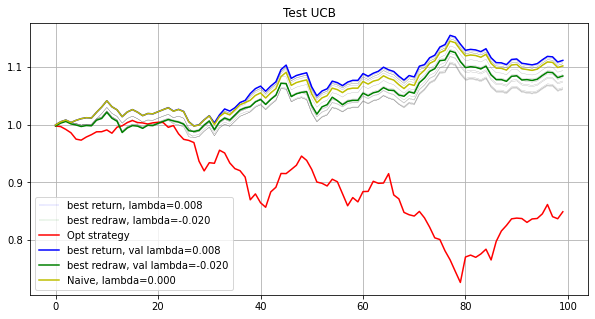

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[0.0115 0.0099 0.0102 0.0088 0.0098 0.0103 0.0099 0.0101 0.0099 0.0099
 0.0097 0.0109 0.0099 0.0101 0.0093 0.0099 0.0101 0.0092 0.0105 0.0098
 0.0103 0.0105 0.0097 0.011  0.0097 0.0104 0.0108 0.01   0.0103 0.01
 0.01   0.0093 0.0097 0.0103 0.0109 0.0104 0.0092 0.0099 0.0099 0.01
 0.0099 0.0097 0.0093 0.0099 0.01   0.0094 0.0103 0.0106 0.0096 0.0096
 0.0112 0.0098 0.0099 0.01   0.0092 0.0102 0.01   0.0104 0.0102 0.0091
 0.0095 0.0103 0.0099 0.0107 0.0093 0.0108 0.01   0.0103 0.01   0.0104
 0.0092 0.0102 0.0098 0.0094 0.0095 0.01   0.0101 0.0096 0.0108 0.01
 0.0096 0.0105 0.0094 0.01   0.0098 0.0095 0.0091 0.0103 0.0098 0.0095
 0.0099 0.0098 0.0098 0.0098 0.0101 0.0117 0.01   0.0103 0.0098 0.0105]
0.0378890077211006
[0.0115 0.0099 0.0102 0.0088 0.0098 0.0103 0.0099 0.0101 0.0099 0.0099
 0.0097 0.0109 0.0099 0.0101 0.0093 0.0099 0.0101 0.0092 0.0105 0.0098
 0.0103 0.0105 0.0097 0.011  0.0097 0.0104 0.0108 0.01

[0.0122 0.0089 0.0107 0.0076 0.0095 0.0118 0.0098 0.0106 0.0099 0.0096
 0.0095 0.0098 0.0097 0.0105 0.0092 0.0097 0.0097 0.0071 0.011  0.009
 0.0111 0.0104 0.0097 0.0114 0.0095 0.011  0.0104 0.0106 0.0108 0.0095
 0.0098 0.0088 0.0096 0.01   0.0122 0.011  0.0093 0.0094 0.0096 0.0097
 0.0098 0.0099 0.0097 0.0098 0.0105 0.0084 0.0104 0.0106 0.0092 0.0103
 0.0121 0.0091 0.0097 0.0104 0.0113 0.0098 0.01   0.0103 0.0105 0.009
 0.0097 0.0126 0.0102 0.0097 0.0094 0.0116 0.0098 0.0104 0.0101 0.011
 0.0088 0.0112 0.0094 0.009  0.0099 0.0101 0.0102 0.0081 0.01   0.0105
 0.0085 0.0101 0.0093 0.0095 0.01   0.0099 0.0087 0.0102 0.0088 0.0103
 0.0099 0.0099 0.0107 0.0107 0.0103 0.01   0.0098 0.0102 0.0098 0.011 ]
4.6778128514994577e-07
[0.0119 0.0086 0.0109 0.0074 0.0095 0.0118 0.0098 0.0106 0.0098 0.0096
 0.0092 0.0098 0.0098 0.0104 0.009  0.0097 0.01   0.0072 0.011  0.009
 0.0115 0.0106 0.0097 0.0115 0.0094 0.0112 0.0104 0.0106 0.011  0.0094
 0.0098 0.0089 0.0096 0.01   0.0122 0.0112 0.009  0.0096 

[0.0142 0.0083 0.0108 0.006  0.009  0.0116 0.0085 0.0104 0.0096 0.0092
 0.0088 0.0092 0.0091 0.0094 0.0103 0.009  0.0106 0.0053 0.0109 0.0084
 0.0117 0.0093 0.0095 0.0129 0.0089 0.0098 0.0115 0.0109 0.0117 0.009
 0.0096 0.0086 0.0081 0.0097 0.0135 0.0127 0.0089 0.0098 0.009  0.0092
 0.0104 0.0102 0.0089 0.009  0.0095 0.0095 0.0121 0.0102 0.0084 0.0109
 0.0141 0.0095 0.0089 0.0103 0.012  0.01   0.0094 0.0105 0.0105 0.0081
 0.009  0.0161 0.01   0.0092 0.0096 0.0135 0.0099 0.01   0.0111 0.0108
 0.009  0.0108 0.0098 0.009  0.01   0.01   0.0093 0.0062 0.0094 0.011
 0.011  0.0098 0.0104 0.0095 0.0118 0.0089 0.0088 0.01   0.0088 0.0111
 0.0101 0.0097 0.011  0.0118 0.0103 0.0114 0.0065 0.0098 0.0098 0.0106]
2.1837030339533214e-07
[0.0142 0.0083 0.0108 0.006  0.009  0.0116 0.0085 0.0104 0.0096 0.0092
 0.0088 0.0092 0.0091 0.0094 0.0103 0.009  0.0106 0.0053 0.0109 0.0084
 0.0117 0.0093 0.0095 0.0129 0.0089 0.0098 0.0115 0.0109 0.0117 0.009
 0.0096 0.0086 0.0081 0.0097 0.0135 0.0127 0.0089 0.0098

[0.0125 0.0077 0.0108 0.0043 0.0086 0.0126 0.0087 0.01   0.0094 0.009
 0.0072 0.0083 0.0086 0.0091 0.0104 0.0092 0.0104 0.0048 0.0117 0.0069
 0.0114 0.0098 0.0099 0.015  0.0086 0.0103 0.0114 0.0112 0.0129 0.0105
 0.0096 0.0081 0.0075 0.0079 0.0177 0.0143 0.0071 0.0102 0.0111 0.0096
 0.0111 0.0101 0.0075 0.0083 0.0112 0.0061 0.013  0.0125 0.0073 0.0109
 0.0159 0.0088 0.0088 0.0115 0.0118 0.0087 0.0093 0.0116 0.0107 0.007
 0.0092 0.0184 0.0098 0.0087 0.01   0.0127 0.0116 0.0099 0.0111 0.0108
 0.0084 0.012  0.0094 0.0127 0.0106 0.0098 0.0088 0.0048 0.0107 0.0109
 0.0106 0.0138 0.0091 0.0104 0.0111 0.0082 0.0081 0.0094 0.0084 0.01
 0.0095 0.0095 0.0082 0.011  0.0098 0.0103 0.0043 0.0108 0.0101 0.0105]
7.417385654269817e-07
[0.0125 0.0077 0.0108 0.0043 0.0086 0.0126 0.0087 0.01   0.0094 0.009
 0.0072 0.0083 0.0086 0.0091 0.0104 0.0092 0.0104 0.0048 0.0117 0.0069
 0.0114 0.0098 0.0099 0.015  0.0086 0.0103 0.0114 0.0112 0.0129 0.0105
 0.0096 0.0081 0.0075 0.0079 0.0177 0.0143 0.0071 0.0102 0.

[0.0125 0.0077 0.0108 0.0043 0.0086 0.0126 0.0087 0.01   0.0094 0.009
 0.0072 0.0083 0.0086 0.0091 0.0104 0.0092 0.0104 0.0048 0.0117 0.0069
 0.0114 0.0098 0.0099 0.015  0.0086 0.0103 0.0114 0.0112 0.0129 0.0105
 0.0096 0.0081 0.0075 0.0079 0.0177 0.0143 0.0071 0.0102 0.0111 0.0096
 0.0111 0.0101 0.0075 0.0083 0.0112 0.0061 0.013  0.0125 0.0073 0.0109
 0.0159 0.0088 0.0088 0.0115 0.0118 0.0087 0.0093 0.0116 0.0107 0.007
 0.0092 0.0184 0.0098 0.0087 0.01   0.0127 0.0116 0.0099 0.0111 0.0108
 0.0084 0.012  0.0094 0.0127 0.0106 0.0098 0.0088 0.0048 0.0107 0.0109
 0.0106 0.0138 0.0091 0.0104 0.0111 0.0082 0.0081 0.0094 0.0084 0.01
 0.0095 0.0095 0.0082 0.011  0.0098 0.0103 0.0043 0.0108 0.0101 0.0105]
4.497891839833762e-07
[0.0125 0.0077 0.0108 0.0043 0.0086 0.0126 0.0087 0.01   0.0094 0.009
 0.0072 0.0083 0.0086 0.0091 0.0104 0.0092 0.0104 0.0048 0.0117 0.0069
 0.0114 0.0098 0.0099 0.015  0.0086 0.0103 0.0114 0.0112 0.0129 0.0105
 0.0096 0.0081 0.0075 0.0079 0.0177 0.0143 0.0071 0.0102 0.

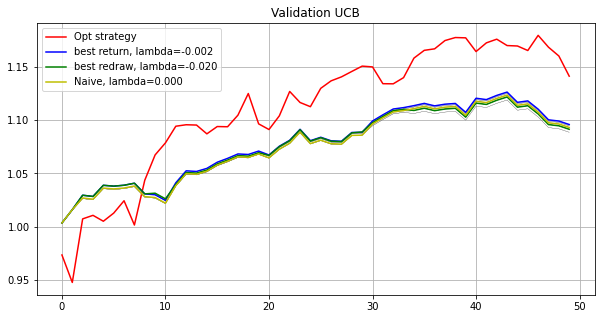

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[0.0081 0.0095 0.0114 0.008  0.0095 0.0101 0.0095 0.009  0.0096 0.0096
 0.009  0.0079 0.0109 0.008  0.0117 0.0093 0.0111 0.0033 0.0105 0.01
 0.0094 0.0082 0.0106 0.0105 0.0096 0.007  0.0109 0.0111 0.0108 0.0122
 0.0098 0.0088 0.0093 0.0111 0.009  0.0111 0.0079 0.0073 0.0109 0.011
 0.0114 0.0092 0.0095 0.0093 0.0107 0.0111 0.0107 0.0093 0.0084 0.0057
 0.0122 0.0103 0.01   0.0108 0.0102 0.0113 0.0096 0.0143 0.0096 0.0087
 0.0106 0.0158 0.0102 0.0107 0.0083 0.0143 0.0106 0.0101 0.0078 0.0086
 0.008  0.0098 0.0102 0.0139 0.0103 0.0096 0.0097 0.0088 0.0085 0.0106
 0.0132 0.0089 0.0088 0.0101 0.0134 0.0083 0.0096 0.0097 0.0104 0.0105
 0.0096 0.0096 0.0122 0.0088 0.0106 0.0125 0.01   0.0112 0.0104 0.0108]
0.04407744922102423
[0.0082 0.0095 0.0116 0.008  0.0094 0.0101 0.0094 0.0089 0.0096 0.0095
 0.0085 0.0077 0.0108 0.0077 0.0121 0.0092 0.0114 0.0028 0.0104 0.0098
 0.0097 0.0077 0.0108 0.0105 0.0096 0.0066 0.0113 0.0112 0.0109 0.0119
 0.0097 0.0087 0.009  0.0114 0.0086 0.0114 0.0082 0.0067 0.

[0.0132 0.0073 0.0121 0.0059 0.0088 0.0096 0.0089 0.0083 0.0094 0.0092
 0.0061 0.0079 0.0105 0.0069 0.0113 0.0088 0.0151 0.0024 0.0104 0.0105
 0.0112 0.0089 0.0117 0.0097 0.0094 0.0052 0.012  0.0112 0.0123 0.0114
 0.0096 0.0074 0.009  0.0119 0.0092 0.0116 0.0061 0.009  0.0099 0.0096
 0.0118 0.009  0.0081 0.0087 0.0113 0.0137 0.0112 0.009  0.0077 0.0065
 0.0121 0.0106 0.0109 0.0114 0.0093 0.0122 0.0092 0.0144 0.0096 0.0071
 0.0094 0.0182 0.0097 0.0101 0.0106 0.0173 0.0124 0.0101 0.0083 0.009
 0.0067 0.0121 0.0095 0.015  0.0103 0.009  0.0085 0.0076 0.0077 0.0106
 0.0135 0.0093 0.0067 0.0093 0.0166 0.0071 0.0072 0.0102 0.0098 0.0105
 0.0096 0.0092 0.0121 0.0083 0.0106 0.0124 0.0103 0.0115 0.0108 0.0105]
3.277733735566543e-07
[0.0122 0.0068 0.0122 0.0056 0.0087 0.0096 0.0087 0.0083 0.0094 0.0092
 0.0059 0.0076 0.0106 0.0069 0.0114 0.0087 0.0152 0.002  0.0105 0.0103
 0.0115 0.0089 0.0118 0.0101 0.0093 0.005  0.0124 0.0114 0.0125 0.0115
 0.0096 0.0073 0.0087 0.0122 0.0096 0.0116 0.0064 0.009

[0.0122 0.0068 0.0122 0.0056 0.0087 0.0096 0.0087 0.0083 0.0094 0.0092
 0.0058 0.0076 0.0106 0.0069 0.0114 0.0087 0.0152 0.002  0.0105 0.0103
 0.0115 0.0089 0.0118 0.0101 0.0093 0.005  0.0124 0.0114 0.0125 0.0115
 0.0096 0.0073 0.0087 0.0122 0.0096 0.0116 0.0064 0.0092 0.0101 0.0097
 0.0117 0.009  0.0081 0.0086 0.0112 0.0139 0.0115 0.0094 0.0075 0.0068
 0.0125 0.0105 0.0107 0.0116 0.0094 0.0122 0.0092 0.0142 0.0096 0.007
 0.0093 0.0183 0.0097 0.01   0.0101 0.0175 0.0127 0.0101 0.0077 0.0088
 0.0066 0.012  0.0094 0.0149 0.0104 0.009  0.0086 0.008  0.0076 0.0107
 0.0135 0.0091 0.0067 0.0092 0.0167 0.0071 0.0074 0.0101 0.0099 0.0104
 0.0096 0.0092 0.0119 0.0085 0.0106 0.0128 0.0103 0.0115 0.0109 0.0104]
8.364926672339845e-10
[0.0122 0.0068 0.0122 0.0056 0.0087 0.0096 0.0087 0.0083 0.0094 0.0092
 0.0058 0.0076 0.0106 0.0069 0.0114 0.0087 0.0152 0.002  0.0105 0.0103
 0.0115 0.0089 0.0118 0.0101 0.0093 0.005  0.0124 0.0114 0.0125 0.0115
 0.0096 0.0073 0.0087 0.0122 0.0096 0.0116 0.0064 0.009

[0.0121 0.0068 0.0122 0.0054 0.0087 0.0098 0.0087 0.0084 0.0094 0.0092
 0.0059 0.0078 0.0106 0.0068 0.0116 0.0087 0.0153 0.0014 0.0104 0.0103
 0.0115 0.009  0.012  0.0102 0.0092 0.0049 0.0125 0.0114 0.0126 0.0115
 0.0096 0.0071 0.0085 0.0123 0.0095 0.0116 0.0063 0.0093 0.0102 0.0097
 0.0117 0.0089 0.008  0.0085 0.0112 0.014  0.0115 0.0096 0.0075 0.0067
 0.0125 0.0104 0.0109 0.0117 0.0095 0.012  0.0092 0.0142 0.0097 0.0069
 0.0092 0.0183 0.0098 0.0101 0.0101 0.0178 0.0127 0.0101 0.0076 0.0086
 0.0066 0.0121 0.0094 0.0149 0.0104 0.009  0.0084 0.0082 0.0078 0.0107
 0.0134 0.0091 0.0066 0.0092 0.0167 0.007  0.0072 0.01   0.0098 0.0104
 0.0097 0.0092 0.012  0.0085 0.0106 0.013  0.0103 0.0114 0.0111 0.0103]
4.217402849453385e-08
[0.0121 0.0068 0.0122 0.0054 0.0087 0.0098 0.0087 0.0084 0.0094 0.0092
 0.0059 0.0078 0.0106 0.0068 0.0116 0.0087 0.0153 0.0014 0.0104 0.0103
 0.0115 0.009  0.012  0.0102 0.0092 0.0049 0.0125 0.0114 0.0126 0.0115
 0.0096 0.0071 0.0085 0.0123 0.0095 0.0116 0.0063 0.00

[0.0121 0.0068 0.0122 0.0054 0.0087 0.0098 0.0087 0.0084 0.0094 0.0092
 0.0059 0.0078 0.0106 0.0068 0.0116 0.0087 0.0153 0.0014 0.0104 0.0103
 0.0115 0.009  0.012  0.0102 0.0092 0.0049 0.0125 0.0114 0.0126 0.0115
 0.0096 0.0071 0.0085 0.0123 0.0095 0.0116 0.0063 0.0093 0.0102 0.0097
 0.0117 0.0089 0.008  0.0085 0.0112 0.014  0.0115 0.0096 0.0075 0.0067
 0.0125 0.0104 0.0109 0.0117 0.0095 0.012  0.0092 0.0142 0.0097 0.0069
 0.0092 0.0183 0.0098 0.0101 0.0101 0.0178 0.0127 0.0101 0.0076 0.0086
 0.0066 0.0121 0.0094 0.0149 0.0104 0.009  0.0084 0.0082 0.0078 0.0107
 0.0134 0.0091 0.0066 0.0092 0.0167 0.007  0.0072 0.01   0.0098 0.0104
 0.0097 0.0092 0.012  0.0085 0.0106 0.013  0.0103 0.0114 0.0111 0.0103]
1.3256125081678206e-07
[0.0047 0.0047 0.0132 0.0034 0.0083 0.0128 0.0079 0.0086 0.0094 0.0088
 0.0055 0.0075 0.0099 0.0056 0.0099 0.0087 0.0144 0.0013 0.0106 0.0112
 0.0105 0.0106 0.0126 0.0093 0.009  0.003  0.0149 0.012  0.014  0.0132
 0.0095 0.0076 0.007  0.0141 0.0106 0.0133 0.0085 0.0

[0.0008 0.0041 0.0132 0.003  0.0081 0.0129 0.008  0.0082 0.0094 0.0087
 0.004  0.0073 0.01   0.0056 0.0088 0.0087 0.0135 0.0011 0.0102 0.0116
 0.0103 0.0103 0.0128 0.0103 0.0089 0.0038 0.0147 0.0121 0.0143 0.013
 0.0095 0.0067 0.007  0.0139 0.0108 0.0138 0.0075 0.0081 0.0089 0.0081
 0.0129 0.0079 0.0069 0.0077 0.0106 0.0152 0.0127 0.0106 0.0068 0.0075
 0.014  0.0089 0.0085 0.0137 0.0105 0.0135 0.0094 0.0154 0.0104 0.0059
 0.0101 0.0204 0.01   0.0119 0.0103 0.0184 0.0151 0.0109 0.0023 0.0074
 0.0059 0.0105 0.0102 0.0158 0.0105 0.0091 0.0061 0.0054 0.0055 0.0134
 0.0181 0.0121 0.0057 0.0075 0.0177 0.0058 0.0069 0.0105 0.0121 0.0105
 0.0104 0.0089 0.0129 0.0095 0.0109 0.0134 0.0107 0.0136 0.0119 0.0104]
0.050923435608017945
[0.0008 0.0041 0.0132 0.003  0.0081 0.0129 0.008  0.0082 0.0094 0.0087
 0.004  0.0073 0.01   0.0056 0.0088 0.0087 0.0135 0.0011 0.0102 0.0116
 0.0103 0.0103 0.0128 0.0103 0.0089 0.0038 0.0147 0.0121 0.0143 0.013
 0.0095 0.0067 0.007  0.0139 0.0108 0.0138 0.0075 0.0081 

[ 0.0019  0.0042  0.0142  0.0024  0.0079  0.0144  0.0082  0.0084  0.0093
  0.0086  0.0028  0.0074  0.0105  0.0055  0.0087  0.0085  0.0137 -0.
  0.0109  0.0109  0.0102  0.0108  0.0123  0.0101  0.0086  0.0037  0.0151
  0.0123  0.0149  0.0131  0.0094  0.0068  0.0071  0.0138  0.0111  0.014
  0.0079  0.0076  0.0097  0.0084  0.0136  0.0077  0.0063  0.0073  0.0102
  0.0152  0.0128  0.0114  0.0062  0.0083  0.0151  0.0084  0.0079  0.014
  0.01    0.0137  0.0093  0.0153  0.0106  0.0049  0.0096  0.0212  0.01
  0.0118  0.0098  0.0194  0.0163  0.0099  0.0028  0.0081  0.005   0.0116
  0.0104  0.0154  0.0104  0.0096  0.0064  0.003   0.005   0.0138  0.0179
  0.0117  0.0051  0.0074  0.0171  0.0063  0.0061  0.0102  0.0124  0.0102
  0.0102  0.0088  0.0129  0.0092  0.0108  0.0136  0.0103  0.0141  0.0122
  0.0102]
3.1581781788640344e-05
[0.0019 0.0042 0.0142 0.0024 0.0079 0.0144 0.0082 0.0084 0.0093 0.0086
 0.0028 0.0074 0.0105 0.0055 0.0087 0.0085 0.0137 0.     0.0109 0.0109
 0.0102 0.0108 0.0123 0.0101 0

[ 0.0019  0.0042  0.0142  0.0025  0.0079  0.0144  0.0082  0.0084  0.0093
  0.0086  0.0028  0.0074  0.0104  0.0055  0.0087  0.0085  0.0137 -0.
  0.0109  0.0109  0.0102  0.0108  0.0123  0.0101  0.0086  0.0037  0.0151
  0.0123  0.0149  0.0131  0.0094  0.0068  0.0071  0.0138  0.0111  0.0141
  0.0079  0.0076  0.0097  0.0084  0.0136  0.0077  0.0063  0.0073  0.0102
  0.0152  0.0128  0.0114  0.0062  0.0083  0.0151  0.0084  0.0079  0.014
  0.01    0.0137  0.0093  0.0153  0.0106  0.0049  0.0096  0.0212  0.01
  0.0118  0.0098  0.0194  0.0163  0.0099  0.0028  0.0081  0.005   0.0116
  0.0104  0.0154  0.0104  0.0096  0.0064  0.003   0.005   0.0138  0.0179
  0.0117  0.0051  0.0074  0.0171  0.0063  0.0061  0.0102  0.0125  0.0102
  0.0102  0.0088  0.0129  0.0092  0.0108  0.0135  0.0103  0.0141  0.0122
  0.0102]
7.064588936003068e-06
[ 0.0019  0.0042  0.0142  0.0025  0.0079  0.0144  0.0082  0.0084  0.0093
  0.0086  0.0028  0.0074  0.0104  0.0055  0.0087  0.0085  0.0137 -0.
  0.0109  0.0109  0.0102  0.01

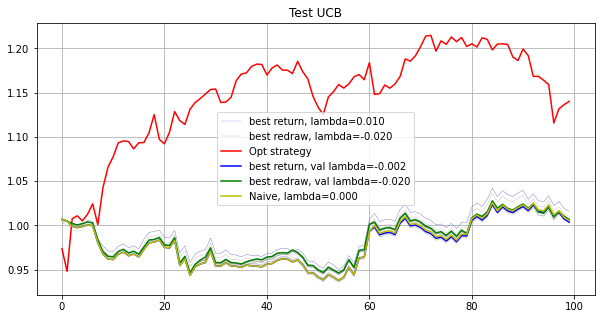

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.75165955
Mean return: 1.00070095
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


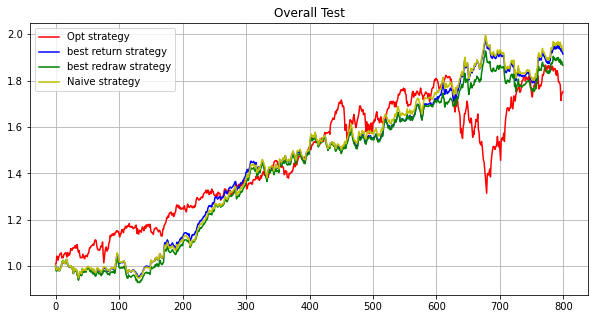

In [4]:
lb = 5
maxiter = 8000
subn = 100
path ='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
eps = 1.0005
delta = 0.008
run(path, maxiter, subn, lb, c=0.001, eps=eps, delta=delta, testv=np.arange(-0.02, 0.0100001, 0.002))

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[0.0102 0.0097 0.0092 0.009  0.0157 0.0115 0.0074 0.0078 0.0104 0.0126
 0.0102 0.009  0.0096 0.0082 0.0108 0.006  0.0076 0.0104 0.0051 0.0075
 0.009  0.0216 0.0093 0.003  0.0094 0.0113 0.0106 0.0064 0.009  0.0059
 0.0075 0.0117 0.0113 0.0083 0.0129 0.0092 0.008  0.0132 0.0095 0.0079
 0.0123 0.0089 0.0135 0.0045 0.0138 0.0115 0.0127 0.0062 0.0103 0.0213
 0.0118 0.009  0.0082 0.01   0.011  0.0079 0.0099 0.0088 0.0062 0.0101
 0.0087 0.0153 0.0144 0.0092 0.0078 0.0097 0.0092 0.0113 0.0087 0.0133
 0.0114 0.0099 0.0112 0.0103 0.009  0.0088 0.0081 0.0104 0.0099 0.0105
 0.009  0.0084 0.0098 0.0082 0.0091 0.0099 0.0101 0.0075 0.0107 0.0119
 0.009  0.0105 0.0117 0.0113 0.0108 0.0098 0.0121 0.0098 0.0102 0.0122]
0.18474894964575642
[ 0.0106  0.0095  0.0076  0.0025  0.0164  0.0109  0.0106  0.0097  0.0108
  0.0109  0.011   0.008   0.009   0.0051  0.0092 -0.      0.0012  0.0096
  0.0041  0.0046  0.0175  0.022   0.0103  0.

[ 0.0093  0.0086  0.0005  0.      0.0159  0.0172  0.0067  0.0051  0.0177
  0.0053  0.0131  0.0051  0.0027  0.0018  0.0012 -0.      0.      0.0106
  0.      0.0004  0.031   0.0131  0.0106  0.      0.001   0.0116  0.
  0.0166  0.0156  0.0003  0.      0.019   0.0179  0.0204  0.0117  0.0116
  0.      0.0173  0.0344  0.0026  0.0183  0.0111  0.0075  0.      0.0165
  0.0116  0.0126  0.      0.0084  0.0072  0.0243  0.0057  0.0041  0.0089
  0.0224  0.      0.0094  0.0092  0.008   0.0157  0.012   0.0103  0.006
  0.011   0.0017  0.0191  0.0155  0.016   0.0248  0.0113  0.0188  0.0021
  0.0067  0.0116  0.0047  0.0069  0.0069  0.0088  0.0075  0.0164  0.017
 -0.      0.0189 -0.      0.0085  0.01    0.0115  0.0004  0.0135  0.0106
  0.0065  0.015   0.0195  0.0173  0.0188  0.0085  0.0239  0.      0.0087
  0.0168]
2.2269482974458353e-05
[ 0.0093  0.0086  0.0005 -0.      0.0159  0.0172  0.0067  0.0051  0.0177
  0.0053  0.0131  0.0051  0.0027  0.0018  0.0012  0.     -0.      0.0106
  0.      0.0004  0.031 

[ 0.0089  0.0085 -0.     -0.      0.0116  0.0195  0.0046  0.0054  0.0195
  0.0044  0.0125  0.0044  0.002   0.002   0.     -0.     -0.      0.0104
  0.      0.0002  0.0288  0.0024  0.0117 -0.     -0.      0.0138 -0.
  0.024   0.0161 -0.     -0.      0.0199  0.0192  0.0236  0.0122  0.0113
 -0.      0.0203  0.0387  0.0014  0.0173  0.009   0.0107 -0.      0.0224
  0.011   0.0111 -0.      0.0082  0.0056  0.0253  0.0064  0.0026  0.0085
  0.0234 -0.      0.0094  0.0079  0.0067  0.0201  0.0084  0.0117  0.0072
  0.0092  0.0004  0.0185  0.0126  0.0162  0.0244  0.0109  0.0197  0.0026
  0.0072  0.0106  0.0038  0.0088  0.0055  0.0085  0.0074  0.0174  0.0154
 -0.      0.0203 -0.      0.0071  0.01    0.0115  0.      0.0143  0.0094
  0.0042  0.015   0.0208  0.0173  0.0212  0.0085  0.0256 -0.      0.0084
  0.0169]
0.12212713713303278
[ 0.0089  0.0085 -0.     -0.      0.0116  0.0195  0.0046  0.0054  0.0195
  0.0043  0.0125  0.0044  0.002   0.002   0.      0.      0.      0.0104
 -0.      0.0002  0.0288 

[ 0.0087  0.008   0.     -0.      0.0158  0.0209  0.0032  0.0035  0.0199
  0.0008  0.0125  0.0036  0.0013  0.0015  0.      0.      0.0022  0.0114
  0.      0.0006  0.0285 -0.      0.0113 -0.      0.0004  0.0145  0.0018
  0.0232  0.0159 -0.     -0.      0.0195  0.0196  0.0246  0.0108  0.012
 -0.      0.0204  0.0385  0.0015  0.0185  0.0091  0.0111  0.0019  0.022
  0.0111  0.0102  0.      0.0088  0.0013  0.0259  0.0061  0.0027  0.0097
  0.0238  0.0003  0.0097  0.0073  0.005   0.0208  0.0066  0.0115  0.0077
  0.0089  0.0008  0.0182  0.0113  0.016   0.0254  0.0115  0.0197  0.0028
  0.0082  0.0103  0.0033  0.0091  0.006   0.0084  0.0069  0.0182  0.016
  0.      0.0209  0.      0.0067  0.0099  0.0114  0.      0.0147  0.0116
  0.0038  0.0151  0.0212  0.0163  0.0208  0.0085  0.0243  0.      0.0077
  0.0183]
0.0002797551728929275
[ 0.0088  0.008   0.     -0.      0.0158  0.0209  0.0032  0.0035  0.0199
  0.0008  0.0125  0.0036  0.0013  0.0015  0.      0.      0.0022  0.0114
  0.      0.0006  0.02

[ 0.0074  0.0063 -0.      0.      0.0067  0.0283 -0.      0.0093  0.0257
  0.0008  0.0112  0.0003  0.      0.0004  0.0077  0.     -0.      0.009
  0.0006  0.0006  0.0294  0.0053  0.003  -0.      0.0039  0.0105  0.0039
  0.0063  0.0152  0.0003  0.      0.0204  0.0242  0.0189  0.0027  0.0078
  0.      0.0243  0.0385  0.      0.0186  0.0073  0.0154 -0.      0.0204
  0.0073  0.0269 -0.      0.0053  0.      0.0324  0.0098  0.0027  0.0068
  0.0281  0.0001  0.0119  0.0019  0.0012  0.0048 -0.      0.0169  0.0154
  0.0074  0.0001  0.032   0.0069  0.0163  0.0232  0.0126  0.025   0.0016
  0.0106  0.0082  0.0031  0.0076  0.0008  0.0047  0.0062  0.0241  0.008
  0.      0.0276  0.      0.0089  0.0092  0.0102  0.      0.0163  0.0036
  0.0002  0.0162  0.0237  0.0233  0.0253  0.0062  0.0323  0.0053  0.0061
  0.0249]
3.0277933511108324e-05
[ 0.0064  0.006   0.      0.      0.0019  0.0316  0.      0.0101  0.0217
 -0.      0.0121  0.0008 -0.     -0.      0.0034 -0.      0.      0.0078
  0.      0.      0.

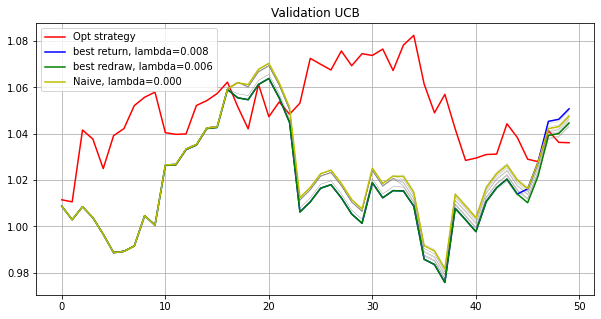

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[ 0.0091  0.0091  0.0003  0.      0.0277  0.0141  0.0028  0.      0.0092
  0.0067  0.011  -0.      0.0075  0.0118  0.0106  0.0005 -0.      0.0157
 -0.      0.008   0.0216  0.0075  0.0019  0.      0.0098  0.0127  0.0056
  0.0256  0.011   0.0119  0.      0.0111  0.0161  0.0195  0.0096  0.0135
  0.0034  0.0128  0.0191  0.0156  0.0203  0.0158  0.0063  0.      0.013
  0.0046  0.006  -0.      0.0092  0.0049  0.0198  0.0087  0.0061  0.016
  0.02    0.0032  0.011   0.0055  0.0148  0.0179 -0.      0.0149  0.0092
  0.0051  0.0039  0.0136  0.0133  0.0076  0.0265  0.0084  0.016   0.007
  0.0078  0.0085  0.0062  0.0091  0.0156  0.0082  0.0083  0.0205  0.0094
  0.0046  0.017   0.0001  0.0106  0.0103  0.0097  0.0004  0.01    0.0178
  0.0073  0.0152  0.0169  0.0147  0.0158  0.0096  0.0209  0.      0.0093
  0.0155]
0.1251181159690127
[ 0.0084  0.0086  0.     -0.      0.0287  0.0167  0.005   0.      0.0084
  0.0047  0.0111  0.001   0.0068  0.0133  0.0105  0.      0.      0.0193
  0.0001  0.0052  0.0139 

[ 0.008   0.0083  0.     -0.      0.0107  0.0217 -0.      0.0007  0.007
  0.0034  0.0116  0.0006  0.0048  0.0083  0.0093 -0.      0.0025  0.0257
  0.      0.      0.019  -0.     -0.      0.0003  0.0198  0.014   0.0045
  0.0341  0.0115  0.0014 -0.      0.0169  0.0202  0.0125  0.0066  0.0117
 -0.      0.0173  0.0259  0.0133  0.0226  0.0115  0.0065  0.0079  0.0059
  0.0065  0.0076  0.0014  0.0062 -0.      0.0262  0.0089  0.      0.0154
  0.0265  0.0056  0.0107  0.0028  0.0072  0.0207  0.0023  0.0241  0.005
  0.0054  0.0019  0.0092  0.0097  0.0062  0.0312  0.0127  0.0204  0.0036
  0.0074  0.0098  0.0023  0.0108  0.0136  0.0083  0.0057  0.0229  0.0061
 -0.      0.0218 -0.      0.0117  0.0101  0.0085  0.      0.012   0.0243
  0.0024  0.0166  0.0215  0.0187  0.0163  0.0081  0.0272  0.      0.0083
  0.0227]
0.00023412268201499533
[ 0.008   0.0082  0.0001 -0.      0.0107  0.0217 -0.      0.0007  0.007
  0.0034  0.0116  0.0006  0.0047  0.0083  0.0093 -0.      0.0025  0.0257
  0.     -0.      0.0

[ 0.008   0.0067 -0.      0.      0.0064  0.0188  0.008   0.0117  0.0108
  0.      0.0068 -0.      0.0023  0.0027  0.0024 -0.     -0.      0.0282
  0.     -0.      0.0159 -0.     -0.     -0.      0.0151  0.018   0.0053
  0.0275  0.0046  0.0035  0.0059  0.0246  0.0247  0.0142  0.0101  0.0098
 -0.      0.0107  0.0207  0.0132  0.0255  0.0088  0.0072 -0.      0.009
  0.0068  0.006  -0.      0.0014 -0.      0.032   0.0159 -0.      0.0119
  0.033  -0.      0.01    0.0003  0.0038  0.0145 -0.      0.0118  0.0101
 -0.      0.      0.0108  0.0151  0.0093  0.0266  0.0229  0.0259  0.
  0.0044  0.0092 -0.      0.0102  0.012   0.0032  0.0044  0.0221  0.005
 -0.      0.027  -0.      0.0093  0.0101  0.0074 -0.      0.0146  0.0426
  0.0034  0.0211  0.0254  0.0183  0.0111  0.0075  0.0401 -0.      0.0092
  0.0275]
0.0005907444265997559
[ 0.008   0.0068 -0.      0.      0.0064  0.0188  0.008   0.0117  0.0108
  0.      0.0068  0.      0.0023  0.0027  0.0024  0.      0.      0.0282
  0.      0.      0.0159 

[ 0.0076  0.0067 -0.      0.001   0.0055  0.0177  0.0009  0.009   0.0129
 -0.      0.0071 -0.      0.0015  0.0036  0.0003 -0.     -0.      0.0279
  0.     -0.      0.0144  0.0056 -0.     -0.      0.0159  0.0184  0.0049
  0.0207  0.0046  0.0006  0.0027  0.033   0.0261  0.0201  0.0045  0.0096
  0.0024  0.0097  0.0236  0.0102  0.0264  0.01    0.0076 -0.      0.0014
  0.0066  0.0056 -0.      0.0018 -0.      0.0346  0.0156 -0.      0.0126
  0.0337  0.      0.0101 -0.      0.0047  0.0139 -0.      0.0154  0.0073
  0.     -0.      0.012   0.0103  0.0076  0.0309  0.0256  0.0266 -0.
  0.0024  0.0089  0.      0.0128  0.017   0.0033  0.004   0.0238  0.0042
  0.      0.0292  0.0004  0.0087  0.0102  0.008   0.      0.0136  0.0402
  0.0028  0.0218  0.0268  0.019   0.0094  0.0066  0.0412 -0.      0.0092
  0.0277]
1.0661927063337244e-05
[ 0.0076  0.0067  0.      0.001   0.0055  0.0177  0.0009  0.009   0.0129
 -0.      0.0071 -0.      0.0015  0.0036  0.0003 -0.     -0.      0.0279
  0.     -0.      0.01

[ 0.0067  0.0064  0.      0.0048  0.      0.0189  0.0011  0.0103  0.0109
  0.      0.0074  0.      0.      0.0024  0.0003  0.      0.      0.0297
  0.      0.      0.0169  0.0103  0.0011 -0.      0.015   0.015   0.0014
  0.021   0.0043  0.0037 -0.      0.0375  0.0273  0.0171  0.0013  0.009
 -0.      0.0085  0.0218  0.0102  0.0248  0.008   0.0071 -0.      0.0019
  0.0055  0.0065  0.0002  0.      0.      0.036   0.0144 -0.      0.0111
  0.0368 -0.      0.0101 -0.      0.0055  0.0124 -0.      0.0175  0.0089
 -0.     -0.      0.0117  0.016   0.0088  0.0325  0.027   0.0279 -0.
  0.0019  0.0088 -0.      0.0125  0.0198  0.004   0.0034  0.0253  0.0031
  0.      0.0286 -0.      0.0113  0.01    0.0074 -0.      0.0138  0.0342
  0.0027  0.0221  0.0276  0.0187  0.0073  0.0064  0.0424  0.0005  0.0093
  0.0282]
0.0002245543111089564
[ 0.006   0.0057 -0.      0.      0.      0.0226 -0.      0.011   0.0093
 -0.      0.008  -0.      0.      0.0029  0.      0.0002  0.      0.0337
  0.      0.      0.0176

[ 0.0058  0.0051  0.      0.0003  0.      0.0235  0.006   0.0113  0.01
  0.0004  0.008  -0.     -0.      0.0007 -0.      0.0002 -0.      0.0356
  0.     -0.      0.0215  0.0032  0.0075  0.      0.012   0.0176  0.0035
  0.0182  0.0054  0.0007  0.      0.034   0.0298  0.009  -0.      0.0066
 -0.      0.0136  0.0253  0.0043  0.0278  0.0054  0.0083  0.0005  0.001
  0.0037  0.0112  0.0066  0.0008  0.0053  0.0405  0.0101 -0.      0.0129
  0.0383 -0.      0.009   0.0025  0.      0.0056 -0.      0.0198  0.0116
 -0.      0.      0.0121  0.013   0.0064  0.0322  0.0278  0.0308  0.
  0.0051  0.0058  0.      0.0093  0.0221  0.0018  0.001   0.022   0.0018
  0.      0.0291 -0.      0.013   0.0093  0.0051 -0.      0.0162  0.0268
  0.      0.0228  0.0303  0.0192  0.0072  0.0042  0.0451 -0.      0.008
  0.0325]
0.00022117952692162103
[ 0.0058  0.0051  0.      0.0003  0.      0.0235  0.006   0.0113  0.01
  0.0004  0.008  -0.     -0.      0.0007 -0.      0.0002 -0.      0.0356
  0.     -0.      0.0215  0.

[ 0.0059  0.0051  0.      0.0003  0.      0.0235  0.006   0.0113  0.01
  0.0004  0.008   0.      0.      0.0007  0.      0.0002  0.      0.0356
  0.      0.      0.0215  0.0032  0.0075 -0.      0.012   0.0176  0.0035
  0.0182  0.0054  0.0007  0.      0.034   0.0298  0.009   0.      0.0066
  0.      0.0136  0.0253  0.0043  0.0278  0.0054  0.0083  0.0005  0.001
  0.0037  0.0112  0.0066  0.0008  0.0053  0.0405  0.0101  0.      0.0129
  0.0383 -0.      0.009   0.0025 -0.      0.0056 -0.      0.0198  0.0116
 -0.     -0.      0.0121  0.013   0.0064  0.0322  0.0278  0.0308  0.
  0.0051  0.0058  0.      0.0093  0.0221  0.0018  0.001   0.0219  0.0018
  0.      0.0291  0.      0.013   0.0093  0.0051  0.      0.0162  0.0268
  0.0001  0.0228  0.0303  0.0192  0.0072  0.0042  0.0451 -0.      0.008
  0.0325]
1.9165885710294794e-05
[ 0.0059  0.0051  0.      0.0002  0.      0.0235  0.006   0.0113  0.01
  0.0004  0.008  -0.      0.      0.0007 -0.      0.0002 -0.      0.0356
 -0.      0.      0.0215  0.

[ 0.006   0.0041  0.      0.      0.0012  0.0232  0.0002  0.007   0.011
  0.      0.0081  0.      0.      0.      0.      0.      0.      0.0359
  0.      0.0007  0.0286  0.0104  0.006   0.      0.0104  0.0189  0.001
  0.0156  0.002   0.      0.      0.0267  0.0315  0.0076 -0.      0.007
  0.      0.0133  0.024   0.0028  0.0296  0.0053  0.0058  0.      0.0025
  0.0032  0.0072  0.0073  0.0006  0.0049  0.044   0.0088  0.      0.0134
  0.0412  0.0007  0.0089  0.0017  0.      0.0037  0.      0.0227  0.0125
  0.      0.      0.0125  0.0123  0.0054  0.0385  0.0253  0.032   0.0001
  0.0078  0.0063  0.0003  0.009   0.0202  0.0008  0.0006  0.0246  0.0027
  0.      0.0314  0.      0.0114  0.0089  0.0041 -0.      0.018   0.0293
 -0.      0.0238  0.0322  0.018   0.0055  0.0035  0.0484 -0.      0.0067
  0.0337]
8.485750624077215e-05
[ 0.0058  0.0038 -0.     -0.      0.0048  0.0239  0.      0.0071  0.0098
  0.0009  0.0077 -0.      0.     -0.     -0.     -0.      0.0013  0.0358
  0.      0.      0.02

[ 0.0052  0.0024  0.      0.      0.      0.0317  0.0074  0.0101  0.0065
  0.0028  0.0066 -0.     -0.     -0.     -0.      0.     -0.      0.0394
 -0.     -0.      0.0329  0.0118  0.0076  0.      0.0133  0.0226  0.0014
  0.0131 -0.     -0.      0.0003  0.0141  0.0354  0.0077 -0.      0.0075
  0.      0.0036  0.0225  0.0003  0.0289 -0.      0.0026  0.0006  0.0112
  0.0011  0.0047  0.0037  0.      0.0128  0.0492  0.0058  0.      0.0044
  0.0434  0.      0.0074 -0.      0.     -0.     -0.      0.0161  0.0147
  0.0011  0.0003  0.0118  0.006   0.0088  0.033   0.0307  0.0367  0.
  0.0018  0.0055  0.      0.0071  0.0261  0.      0.      0.0271  0.0022
  0.      0.0331 -0.      0.0079  0.0083  0.001   0.0014  0.0217  0.0263
  0.      0.0254  0.0361  0.0229  0.0041  0.0014  0.057   0.0018  0.0035
  0.0368]
0.00015027199324475516
[ 0.0052  0.0024  0.     -0.      0.      0.0317  0.0074  0.0101  0.0065
  0.0028  0.0066 -0.     -0.     -0.     -0.      0.     -0.      0.0394
 -0.     -0.      0.03

[ 0.0051  0.      0.      0.      0.      0.0293  0.0019  0.0036  0.0101
  0.0017  0.0059  0.      0.      0.      0.      0.      0.0038  0.0431
 -0.      0.0064  0.0367  0.0046  0.0053  0.      0.0143  0.0222  0.0049
  0.0126  0.     -0.      0.      0.0178  0.0382  0.0104  0.      0.0069
  0.      0.0084  0.0245  0.      0.0291  0.      0.0021  0.      0.0029
  0.0008  0.0014 -0.      0.0008 -0.      0.0529  0.0047 -0.      0.0047
  0.0463  0.      0.0079  0.0026  0.0006  0.0076 -0.      0.0144  0.012
  0.0002 -0.      0.0092  0.0076  0.0075  0.0307  0.0278  0.0396  0.
  0.0021  0.0067 -0.      0.0091  0.0234  0.0047 -0.      0.0305  0.0018
 -0.      0.0358  0.      0.0044  0.0078  0.0002  0.0028  0.0246  0.0213
  0.      0.0259  0.0388  0.023   0.0035  0.0001  0.0609  0.0001  0.0025
  0.0385]
0.00026255432999495505
Opt strategy   Total log return: 0.12680327    Max redraw: 0.04741015
Total return: 1.13519366
Mean return: 1.00126884
best return val lambda: 0.002   Total log return: 

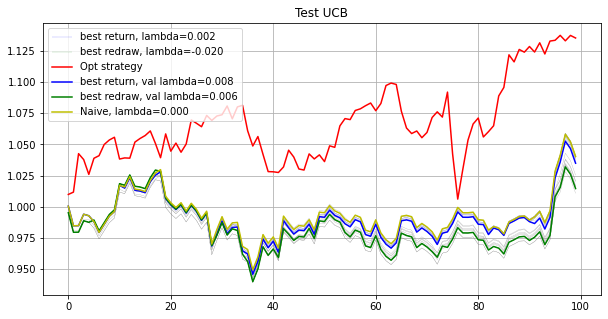

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[ 0.0029  0.0115  0.0164 -0.      0.0094  0.0104  0.009   0.014   0.
  0.0091  0.0029  0.0076  0.0064  0.0117  0.0129  0.0179  0.012   0.0108
  0.0135  0.0047  0.0152  0.0128  0.0104  0.0143  0.0166  0.0112  0.006
  0.0121  0.0071  0.      0.0035  0.0149  0.0087  0.0063  0.0087  0.0046
  0.0062  0.0064  0.0166  0.0063  0.0083  0.0074  0.0122  0.0085  0.0081
  0.009   0.0107 -0.      0.0111  0.0123  0.011   0.0081  0.0204  0.014
  0.0068  0.0042  0.0069  0.0169  0.0023  0.0097  0.0125  0.0115  0.005
  0.0131  0.018   0.0123  0.0081  0.0077  0.0161  0.0122  0.0097  0.0142
  0.0171  0.0047  0.009   0.0097  0.011   0.0138  0.0135  0.0034  0.0156
  0.0124  0.0118  0.0084  0.0118  0.0114  0.0054  0.0086  0.0104  0.0087
  0.0062  0.0173  0.0128  0.0053  0.0076  0.0113  0.0125  0.0121  0.0122
  0.0164]
0.3550404680349614
[-0.      0.012   0.0236  0.      0.0086  0.0058  0.0086  0.012   0.
  0.0084 -0.      0.0066  0

[-0.      0.0177  0.0115  0.0088 -0.      0.0075 -0.      0.0234 -0.
  0.     -0.     -0.      0.0025 -0.      0.0073  0.0167 -0.      0.002
  0.022  -0.      0.01    0.0303  0.0105 -0.      0.0257  0.0075 -0.
  0.0138 -0.      0.     -0.      0.0215  0.0043 -0.      0.01   -0.
 -0.     -0.      0.0256 -0.      0.0308  0.0116  0.0141  0.0164  0.0009
 -0.      0.0002  0.0087  0.0088 -0.      0.0042 -0.      0.0457  0.0352
 -0.     -0.     -0.      0.0218  0.0085  0.0011  0.0103  0.0148  0.0005
  0.0023  0.0296  0.0035  0.0001  0.0028  0.0403 -0.      0.0085  0.0386
  0.0288 -0.     -0.      0.0081  0.0149  0.0295  0.0275 -0.      0.0201
  0.0155  0.0226  0.0249  0.031   0.0163  0.0009  0.0153 -0.      0.0001
 -0.      0.0107  0.0244  0.0107  0.0014 -0.      0.0148  0.0219  0.0231
 -0.    ]
0.14103552473423733
[-0.      0.0177  0.0115  0.0088 -0.      0.0075  0.      0.0234 -0.
  0.     -0.     -0.      0.0025 -0.      0.0073  0.0167  0.      0.002
  0.022  -0.      0.01    0.0303  0.010

[ 0.0043  0.017   0.0192  0.0041 -0.      0.0037 -0.      0.0225  0.0053
  0.      0.      0.      0.0025  0.      0.0101  0.0216  0.      0.0006
  0.0213  0.      0.0105  0.0329  0.0104  0.0015  0.0198  0.002   0.01
  0.002  -0.     -0.      0.      0.0027  0.0145  0.0059  0.0104  0.0004
  0.     -0.      0.0183  0.0034  0.0274  0.0158  0.0123  0.0135 -0.
  0.0002  0.      0.0067  0.0043  0.0028  0.0005  0.      0.0344  0.0413
  0.0003  0.      0.      0.025   0.      0.0003  0.0084  0.0162  0.0006
  0.0049  0.0387 -0.     -0.      0.0145  0.0458  0.004   0.0068  0.0307
  0.0207  0.      0.      0.0036  0.0166  0.031   0.0296  0.0003  0.0222
  0.0148  0.0251  0.026   0.0383  0.017   0.0031  0.0137  0.      0.
  0.      0.0058  0.027   0.0138  0.0003  0.0004  0.0095  0.0232  0.0254
  0.    ]
0.00010842216343775869
[ 0.0043  0.017   0.0192  0.0041 -0.      0.0037  0.      0.0225  0.0053
  0.      0.      0.      0.0025  0.      0.0101  0.0216 -0.      0.0006
  0.0213 -0.      0.0105  0.

[ 0.0057  0.0179  0.0196  0.0047  0.      0.      0.      0.0219  0.0031
 -0.     -0.      0.      0.001  -0.      0.      0.0105 -0.      0.0033
  0.0117 -0.      0.0117  0.0356  0.0112  0.0084  0.0127  0.      0.0047
  0.0016 -0.      0.0001  0.0054  0.015   0.0016  0.0068  0.0071  0.0003
  0.      0.      0.0168  0.0038  0.0337  0.0077  0.0149  0.0137  0.
  0.0057  0.0035  0.0032  0.0056  0.0015 -0.     -0.      0.0509  0.0356
 -0.      0.     -0.      0.0123 -0.      0.0054  0.0047  0.018   0.001
  0.0093  0.039  -0.     -0.      0.0124  0.0514  0.      0.0069  0.0396
  0.0239  0.     -0.      0.003   0.0197  0.0394  0.0355  0.0027  0.0131
  0.0172  0.0256  0.0287  0.0384  0.0187  0.0042  0.0155 -0.     -0.
 -0.     -0.      0.0307  0.0081 -0.     -0.     -0.      0.027   0.0268
  0.0036]
0.15386970772601502
[ 0.0057  0.0179  0.0196  0.0047  0.     -0.     -0.      0.0219  0.0031
 -0.     -0.      0.      0.001  -0.      0.      0.0105 -0.      0.0033
  0.0117 -0.      0.0117  0.03

[ 0.001   0.0168  0.0211  0.0124  0.      0.009   0.0005  0.022   0.0044
  0.      0.      0.      0.      0.      0.0167  0.0196  0.      0.
  0.0039  0.      0.0216  0.0389  0.0128  0.012   0.0096  0.0004  0.0034
  0.0129  0.      0.      0.      0.      0.0048  0.0052  0.      0.0041
  0.      0.      0.02    0.      0.0121  0.0046  0.012   0.0045  0.0014
  0.0099  0.      0.0001  0.0135  0.      0.     -0.      0.0175  0.0373
  0.      0.      0.0011  0.0007  0.0063  0.0016  0.0101  0.0251  0.
  0.0043  0.0422  0.     -0.      0.0072  0.0557  0.0051  0.0031  0.0442
  0.0191  0.001   0.      0.      0.0268  0.036   0.0415 -0.      0.0074
  0.0218  0.0333  0.0335  0.0496  0.0173  0.0015  0.0187  0.     -0.
  0.     -0.      0.0345  0.0058  0.0023  0.      0.0012  0.0284  0.024
  0.0035]
7.378086214926528e-05
[-0.      0.0172  0.0141  0.0126  0.      0.0099 -0.      0.0213 -0.
  0.      0.      0.      0.0014  0.      0.0154  0.0183  0.     -0.
  0.002   0.      0.022   0.04    0.0125

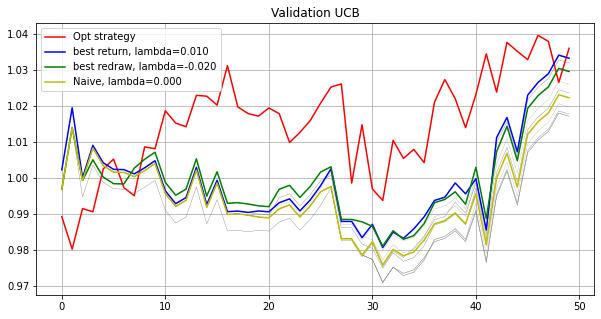

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[ 0.0009  0.0176 -0.      0.0142  0.0001  0.      0.      0.0184  0.0163
  0.      0.      0.      0.021   0.0075  0.0142  0.0064  0.0011  0.0267
  0.      0.0033  0.0048  0.0271  0.009   0.0294  0.0027  0.0007  0.0021
  0.     -0.     -0.      0.0057  0.      0.0065 -0.      0.0258  0.01
  0.      0.0053  0.0042  0.      0.0164  0.0164  0.0062  0.0174  0.
  0.      0.      0.009   0.0196  0.      0.0186  0.0055  0.0359  0.0398
  0.0123  0.      0.      0.0117  0.0066  0.0026  0.0088  0.0276  0.
  0.      0.0347  0.0144  0.      0.0158  0.0308  0.      0.0018  0.0201
  0.0088  0.0078  0.      0.0028  0.0127  0.0179  0.0205  0.021   0.0154
  0.0161  0.0222  0.0215  0.0353  0.0228  0.0007  0.0127  0.      0.0033
  0.0063  0.0135  0.021   0.0036  0.0047  0.      0.0157  0.0189  0.0223
  0.    ]
0.36498641952331196
[ 0.0009  0.0179 -0.      0.013  -0.      0.0009  0.      0.018   0.0129
  0.     -0.     -0.      0.0216  0.0076  0.0166  0.0076 -0.      0.0272
  0.      0.0021  0.0041  0.028

[ 0.0003  0.0177  0.0001  0.0182 -0.      0.0017 -0.      0.0163  0.
  0.      0.      0.      0.0211  0.      0.0196  0.005   0.0014  0.0202
  0.006   0.      0.009   0.0279  0.0089  0.0233  0.0037  0.0001  0.0021
  0.0056  0.      0.0028  0.      0.0098  0.0015  0.0014  0.023   0.0139
  0.      0.0016  0.0063  0.      0.0335  0.018   0.0053  0.0231  0.
  0.0036  0.      0.0136  0.0113  0.      0.0128  0.0005  0.0343  0.0382
  0.015   0.0011  0.      0.0194  0.0117  0.0001  0.0103  0.0314  0.002
 -0.      0.041   0.0083  0.0007  0.0264  0.0371  0.      0.      0.0141
  0.0037  0.      0.      0.      0.0134  0.0111  0.0254  0.0092  0.014
  0.0167  0.0196  0.0309  0.044   0.023   0.0005  0.0175  0.      0.
  0.0035  0.0003  0.0237  0.      0.0016  0.0004  0.0154  0.0219  0.023
  0.    ]
0.021168423376910585
[ 0.0003  0.0177  0.0001  0.0182 -0.      0.0018 -0.      0.0163  0.
  0.      0.      0.      0.021   0.      0.0196  0.005   0.0014  0.0202
  0.006   0.      0.009   0.0279  0.008

[-0.      0.0183  0.0008  0.0064 -0.      0.      0.      0.0195  0.0024
  0.     -0.      0.      0.0205  0.      0.0103  0.007   0.0026  0.0072
  0.0111 -0.      0.0122  0.0281  0.0083  0.0237  0.0038  0.      0.0087
  0.0041 -0.      0.0025  0.      0.0147  0.      0.002   0.0208  0.0134
 -0.      0.0023  0.0088  0.0077  0.0308  0.0036  0.0046  0.016   0.
  0.0047  0.      0.0088  0.0143  0.      0.0118  0.      0.0368  0.0447
  0.0161 -0.      0.0003  0.017   0.0058  0.0017  0.011   0.032   0.0016
  0.0004  0.0471  0.007   0.      0.0257  0.0418  0.0021 -0.      0.0189
  0.      0.0049  0.      0.0007  0.0141  0.014   0.0272  0.0062  0.0114
  0.016   0.0219  0.0315  0.046   0.0252 -0.      0.0192 -0.      0.
  0.0067  0.0014  0.0252 -0.      0.      0.      0.0094  0.0227  0.0239
  0.0006]
0.1309361306380412
[ 0.      0.0183  0.0008  0.0064  0.      0.      0.      0.0195  0.0024
 -0.     -0.     -0.      0.0205 -0.      0.0103  0.007   0.0026  0.0072
  0.0111 -0.      0.0122  0.02

[-0.      0.0181  0.0036  0.0119 -0.      0.0023  0.0001  0.0176  0.
 -0.     -0.     -0.      0.0199  0.0006  0.0104  0.0092  0.0102  0.0009
  0.0094  0.0002  0.0113  0.0266  0.0078  0.0245  0.0072  0.0002  0.007
  0.0048 -0.      0.0035 -0.      0.0153  0.0067 -0.      0.022   0.0104
 -0.      0.0002  0.0101  0.004   0.0312  0.0053  0.0047  0.0159  0.0002
  0.0035  0.      0.0063  0.0137 -0.      0.0106  0.      0.0328  0.0449
  0.0138  0.     -0.      0.0152  0.0049 -0.      0.0108  0.0309  0.
  0.      0.0487  0.0044 -0.      0.0216  0.0438  0.0062  0.      0.0231
  0.0046  0.0033 -0.      0.      0.0142  0.0139  0.0283  0.0054  0.0087
  0.0161  0.0238  0.0323  0.0488  0.0259  0.      0.0212  0.     -0.
  0.0073  0.      0.0261 -0.      0.0003 -0.      0.0048  0.023   0.0233
  0.0002]
4.1304235986580066e-05
[ 0.      0.0177  0.      0.0078 -0.     -0.     -0.      0.011  -0.
  0.      0.      0.      0.0164  0.0044  0.0161  0.0008  0.      0.
  0.0132  0.      0.0226  0.0285  0.009

[ 0.0053  0.0174  0.0045  0.0104  0.      0.0025  0.      0.0117  0.0043
  0.      0.      0.      0.0104  0.      0.0112  0.0021  0.0042  0.0063
  0.0142  0.      0.0183  0.0194  0.0098  0.0256  0.007  -0.      0.0082
  0.0131  0.      0.      0.0008  0.0277  0.0038  0.0001  0.0149  0.0145
  0.      0.0014  0.0225  0.0016  0.0358  0.0075  0.0051  0.012   0.
  0.     -0.      0.0009  0.0059  0.0001  0.0072  0.002   0.0239  0.0468
  0.0108 -0.      0.      0.0071  0.      0.      0.0067  0.0321  0.
  0.0003  0.0455  0.004   0.0005  0.0263  0.0524 -0.      0.0012  0.0272
  0.0018  0.0102  0.      0.      0.0147  0.0096  0.0327  0.      0.0013
  0.016   0.0263  0.0323  0.06    0.0294  0.001   0.0188  0.     -0.
  0.0095  0.      0.0299  0.      0.     -0.      0.0042  0.0239  0.0228
  0.0009]
0.06756776826410685
[ 0.0053  0.0173  0.0045  0.0104  0.      0.0026  0.0001  0.0117  0.0043
  0.0001  0.      0.      0.0103  0.      0.0112  0.0021  0.0042  0.0063
  0.0142  0.      0.0183  0.0194 

[ 0.      0.0179  0.0035  0.0019  0.0013  0.0112  0.      0.0061  0.0018
  0.     -0.      0.      0.0055  0.      0.0117  0.      0.      0.0064
  0.0082  0.      0.027  -0.      0.0108  0.0212  0.0096  0.0181  0.0011
  0.0005  0.     -0.      0.      0.0433  0.0089  0.0094  0.0243  0.0078
  0.      0.0023  0.0192  0.      0.0106  0.0084  0.009   0.0053  0.
  0.0016  0.      0.011   0.      0.      0.0078  0.0056  0.042   0.0482
  0.0013  0.      0.      0.      0.      0.0044  0.0047  0.0329  0.0063
  0.0035  0.0473  0.0111  0.      0.0287  0.0609  0.      0.0032  0.0132
  0.      0.0046  0.     -0.      0.0129  0.008   0.0383  0.      0.
  0.0164  0.0149  0.0324  0.0624  0.0295  0.0088  0.0158  0.     -0.
  0.0123  0.      0.0346  0.     -0.      0.      0.      0.0295  0.0258
  0.0079]
2.3581796266712743e-05
[-0.      0.0179  0.0035  0.0019  0.0013  0.0112  0.      0.0061  0.0018
  0.     -0.      0.      0.0055  0.      0.0117  0.      0.      0.0064
  0.0082  0.      0.027  -0.  

[ 0.      0.0176  0.0039  0.0052  0.0009  0.0106  0.      0.0051  0.0099
  0.0002 -0.     -0.      0.006   0.0011  0.0085  0.0007 -0.      0.0058
  0.0102 -0.      0.0266  0.0029  0.011   0.0256  0.0103  0.0178  0.
  0.0022 -0.     -0.     -0.      0.0408  0.0024  0.0092  0.0224  0.0087
  0.0013  0.      0.0183 -0.      0.0092  0.0033  0.009   0.0047 -0.
  0.      0.0002  0.0085 -0.     -0.      0.0073  0.0048  0.0429  0.0473
  0.     -0.     -0.     -0.      0.0027  0.0048  0.0049  0.0312  0.0037
  0.0031  0.0497  0.009   0.      0.0287  0.0613 -0.      0.0032  0.0105
  0.0026  0.0047 -0.     -0.      0.0134  0.0097  0.0381 -0.     -0.
  0.016   0.018   0.0312  0.0645  0.0291  0.0083  0.0158  0.0001 -0.
  0.015   0.0021  0.0352 -0.     -0.     -0.     -0.      0.0302  0.0252
  0.0057]
0.1037267446170432
[-0.      0.0176  0.0039  0.0052  0.0009  0.0106  0.      0.0051  0.0099
  0.0002 -0.     -0.      0.006   0.0011  0.0085  0.0007 -0.      0.0058
  0.0102 -0.      0.0266  0.0029  0.01

[ 0.0004  0.017   0.0115  0.0021  0.      0.011   0.      0.0052  0.
  0.      0.      0.      0.001   0.      0.      0.      0.0001  0.
  0.0101  0.0017  0.0305  0.01    0.0095  0.0275  0.0086  0.0121  0.0074
  0.0001  0.      0.      0.      0.0217  0.      0.0084  0.0245  0.0028
  0.      0.      0.0175  0.0108  0.0188  0.0033  0.0089  0.0043  0.0033
  0.0126  0.0005  0.0149  0.0022  0.0012  0.014  -0.      0.0454  0.0472
  0.0008  0.      0.0001  0.0043  0.0003  0.0094  0.0077  0.0308  0.0001
  0.0051  0.0535  0.004   0.      0.0182  0.0632 -0.      0.0016  0.0079
  0.0035  0.0036  0.      0.0011  0.0156  0.0095  0.039   0.0073  0.
  0.0162  0.0108  0.0298  0.0622  0.0291  0.0099  0.0102  0.     -0.
  0.0078  0.0027  0.0368  0.0022  0.0001  0.     -0.      0.0308  0.0259
  0.0104]
0.0018128972336425556
[ 0.0004  0.017   0.0115  0.0021  0.      0.011   0.0001  0.0053  0.
  0.0001  0.      0.      0.001   0.0001  0.0001  0.      0.0001  0.
  0.0101  0.0017  0.0305  0.01    0.0096  0

[-0.      0.0172  0.0034  0.0016  0.      0.0014  0.      0.0085  0.0073
  0.      0.      0.      0.      0.0003  0.      0.007  -0.     -0.
  0.0053  0.      0.03    0.0154  0.009   0.0217  0.0017  0.0071  0.0065
  0.0078 -0.      0.0045 -0.      0.024   0.0002  0.0031  0.0185  0.0102
 -0.     -0.      0.014   0.0189  0.0138  0.0064  0.0078  0.0036 -0.
  0.0064  0.0022  0.0044  0.0012 -0.      0.0128 -0.      0.0482  0.0437
 -0.      0.     -0.      0.0076  0.0017  0.0139  0.0057  0.0337 -0.
  0.006   0.0556 -0.      0.0048  0.0188  0.0669 -0.      0.      0.0018
  0.002   0.0041 -0.     -0.      0.0138  0.0152  0.0421  0.0045 -0.
  0.0146  0.016   0.0293  0.0659  0.0276  0.0089  0.0144 -0.     -0.
  0.0061  0.0051  0.0384  0.0001 -0.     -0.      0.013   0.0324  0.0246
  0.0105]
0.1555449745472939
[-0.      0.0172  0.0034  0.0016  0.      0.0014  0.      0.0085  0.0073
 -0.      0.      0.      0.      0.0003  0.      0.007   0.      0.
  0.0053  0.      0.03    0.0154  0.009   0.02

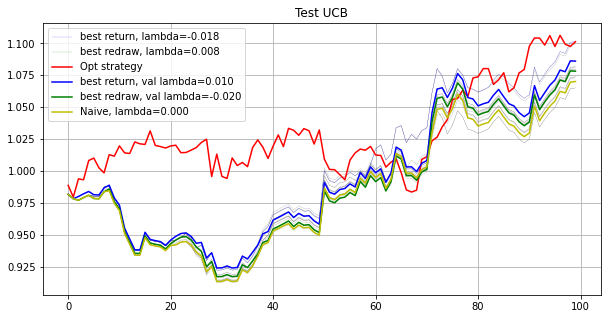

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[-0.      0.0082  0.0093  0.0155  0.0154  0.0068  0.0105  0.0049  0.0026
  0.      0.0115  0.0125  0.0185  0.      0.0024  0.0044  0.0124  0.0119
  0.      0.0425  0.0245  0.0009  0.      0.      0.0067  0.0132  0.0076
  0.0098  0.0084  0.0191  0.0014 -0.      0.0054  0.0148  0.0143  0.0194
  0.      0.0163  0.0155  0.0007  0.0025  0.009   0.0086  0.0194  0.013
  0.0045  0.0239 -0.     -0.      0.0074  0.      0.0135  0.01    0.0194
  0.0097 -0.      0.0068  0.0035  0.0089  0.0103  0.      0.0176  0.0203
  0.0164  0.0178  0.0212  0.0082  0.015   0.006   0.0081  0.006   0.0119
  0.0095  0.      0.0085  0.0089  0.0044  0.0208  0.0138  0.0154  0.0129
  0.0063  0.0046 -0.      0.0129  0.0129  0.0128  0.012   0.0073  0.0082
  0.0124  0.0181  0.0063  0.0145  0.0137  0.0091  0.0149  0.0176  0.019
  0.0173]
0.5762602683603081
[-0.      0.0033  0.0086  0.0149  0.0136  0.0074  0.0101  0.0035  0.0011
  0.      0.0117  

[ 0.      0.0003  0.      0.0235  0.0135  0.0008  0.0046 -0.      0.
  0.      0.0154  0.0061  0.0264 -0.      0.0063  0.0004  0.0078  0.0099
  0.003   0.0282  0.053   0.0033  0.      0.0072 -0.      0.019  -0.
  0.0054 -0.      0.0364  0.      0.0001  0.      0.0009  0.0019  0.0027
  0.0126  0.0226  0.0171  0.0012  0.0007  0.007   0.0011  0.0315  0.0181
  0.      0.0311  0.      0.      0.      0.      0.0098  0.0247  0.0397
  0.      0.0066  0.      0.      0.      0.0012 -0.      0.0284  0.0306
  0.0085  0.0118  0.0284  0.0042  0.0168  0.0002  0.     -0.      0.0008
  0.     -0.      0.0025  0.0053  0.0085  0.0405  0.0214  0.0119  0.0247
  0.0003  0.0063  0.      0.      0.019   0.0031  0.0145  0.0135  0.0079
  0.0097  0.0241  0.0176  0.0177  0.0137  0.0087  0.0198  0.0259  0.0329
  0.0197]
0.09266009340199988
[-0.      0.0003  0.      0.0235  0.0135  0.0008  0.0046 -0.      0.
  0.      0.0154  0.0061  0.0264 -0.      0.0063  0.0004  0.0078  0.0099
  0.003   0.0282  0.053   0.0033 

[ 0.      0.      0.0003  0.0211  0.0159  0.002   0.0047 -0.     -0.
 -0.      0.0158  0.0026  0.027  -0.      0.0193  0.006   0.0034  0.0085
  0.0173  0.026   0.0585  0.0013  0.      0.0042 -0.      0.0283 -0.
 -0.     -0.      0.0315 -0.      0.0076 -0.      0.0001 -0.      0.0022
  0.0092  0.0202  0.0182  0.0035  0.0006  0.0067 -0.      0.0319  0.0135
  0.0012  0.031  -0.     -0.     -0.      0.0019  0.0055  0.0253  0.0372
 -0.      0.0045 -0.     -0.     -0.      0.0008 -0.      0.0294  0.0295
  0.0145  0.0124  0.0254  0.0046  0.0151 -0.     -0.      0.0005  0.0001
 -0.     -0.      0.0014  0.0028  0.0061  0.0402  0.0228  0.008   0.0236
 -0.      0.0079  0.0005 -0.      0.0226  0.003   0.0137  0.0062  0.0068
  0.0091  0.0215  0.0204  0.0135  0.0115  0.0057  0.0188  0.03    0.039
  0.0187]
0.19462639705797885
[ 0.      0.      0.0003  0.0211  0.0159  0.0021  0.0047  0.      0.
  0.      0.0158  0.0026  0.027   0.      0.0193  0.006   0.0034  0.0085
  0.0173  0.026   0.0585  0.0013  

[-0.      0.0009  0.      0.019   0.0139  0.0045  0.0032  0.      0.
  0.      0.0118  0.0004  0.0139  0.0009  0.0106  0.0017  0.0011  0.0054
  0.003   0.0268  0.054   0.0075  0.     -0.      0.      0.0292 -0.
  0.0032  0.      0.0401  0.0006  0.0203 -0.     -0.     -0.      0.0006
  0.0004  0.0122  0.0239 -0.      0.      0.0002  0.0006  0.0309  0.0022
  0.0011  0.0322 -0.      0.0026  0.     -0.      0.0232  0.025   0.0406
 -0.     -0.      0.0228  0.0122  0.0012  0.0005 -0.      0.0324  0.0292
  0.0344  0.0193  0.0279  0.0282  0.0228  0.0006 -0.      0.      0.0225
  0.0004 -0.     -0.     -0.      0.0071  0.0026  0.0399  0.0027  0.0264
  0.0154 -0.      0.     -0.      0.0244  0.0005  0.0171 -0.      0.0043
  0.0017  0.0187  0.0127  0.0154  0.0022  0.0004  0.0131  0.033   0.0288
  0.0114]
0.0695984653996178
[ 0.      0.001   0.      0.019   0.0138  0.0045  0.0032  0.0001  0.
  0.      0.0118  0.0004  0.0139  0.0009  0.0106  0.0017  0.0011  0.0054
  0.003   0.0268  0.054   0.0075  

[ 0.      0.0058 -0.      0.0193  0.0099  0.0014 -0.     -0.     -0.
 -0.      0.008  -0.      0.0161  0.     -0.      0.0103 -0.      0.0008
  0.0039  0.0189  0.0655  0.0115  0.0046 -0.     -0.      0.0185 -0.
  0.006  -0.      0.0288 -0.      0.0288 -0.      0.0014 -0.     -0.
  0.0224  0.0093  0.0249  0.0006  0.003  -0.     -0.      0.0306  0.0067
  0.004   0.0212 -0.      0.0085 -0.     -0.      0.0116  0.0221  0.0368
 -0.     -0.      0.0219  0.0016 -0.      0.0045 -0.      0.0336  0.0324
  0.0377  0.0213  0.0227  0.0285  0.0251 -0.     -0.     -0.      0.0281
 -0.      0.0107 -0.     -0.      0.0023  0.0079  0.0427 -0.      0.029
  0.0225  0.0135 -0.     -0.      0.0203 -0.      0.0197 -0.     -0.
 -0.      0.0147  0.0199  0.0017  0.003  -0.      0.0093  0.029   0.0324
  0.0031]
0.3035230583988669
[ 0.      0.0012  0.      0.0199  0.0067  0.0017  0.      0.     -0.
  0.      0.007   0.      0.0157 -0.     -0.      0.013  -0.     -0.
  0.0026  0.0167  0.0664  0.0105  0.0058 -0.   

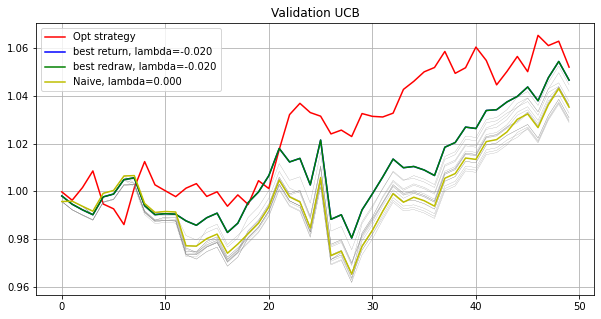

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[-0.     -0.      0.0011  0.0253  0.0096  0.0104  0.007  -0.     -0.
 -0.      0.0298  0.0005  0.0212 -0.      0.0126  0.0011  0.0106  0.
  0.      0.0055  0.0453  0.009   0.0282 -0.      0.      0.0148 -0.
 -0.     -0.      0.036   0.      0.0093  0.     -0.     -0.      0.0055
  0.0322  0.0246  0.0157  0.      0.0051  0.0024  0.      0.0242  0.0148
  0.0019  0.0316 -0.     -0.     -0.      0.      0.0167  0.0213  0.0283
 -0.     -0.      0.0167  0.0008  0.0066  0.     -0.      0.0191  0.0244
  0.0164  0.0013  0.0234  0.0084  0.0078  0.      0.0054 -0.      0.0218
  0.0015  0.0204  0.0053  0.0023  0.0061  0.0086  0.019   0.0113  0.0356
  0.      0.0062  0.0165 -0.      0.0238  0.0089  0.0132 -0.      0.0046
  0.0133  0.0221  0.0156  0.0081  0.0109  0.0138  0.0135  0.0141  0.0414
  0.0102]
0.18179473595736448
[-0.     -0.      0.0011  0.0253  0.0096  0.0104  0.007  -0.     -0.
 -0.      0.0298  0.0005  0.0212 -0.      0.0126  0.0011  0.0106 -0.
  0.      0.0055  0.0453  0.009   0.0282 

[ 0.     -0.      0.      0.0239  0.0053  0.0028  0.0015  0.     -0.
 -0.      0.0358 -0.      0.0244 -0.      0.0004  0.0019  0.0209 -0.
  0.0273 -0.      0.0443 -0.      0.0205 -0.     -0.      0.026  -0.
 -0.     -0.      0.0281  0.0001  0.0014 -0.     -0.     -0.      0.0005
  0.0358  0.0209  0.0198 -0.      0.0076  0.0041  0.0029  0.0276 -0.
 -0.      0.012   0.0001 -0.     -0.      0.0064  0.0201  0.0135  0.0356
 -0.      0.0047  0.0201 -0.     -0.      0.0024 -0.      0.0115  0.0258
  0.0094  0.      0.0361  0.0083  0.0164 -0.     -0.     -0.      0.0319
  0.0077  0.0147 -0.     -0.     -0.      0.012   0.0382  0.0052  0.0518
  0.0001 -0.      0.0021 -0.      0.0265  0.0069  0.0106  0.0004 -0.
  0.0055  0.024   0.0306 -0.      0.0132  0.0087  0.0169  0.0263  0.05
  0.0102]
0.03852455634220992
[-0.     -0.      0.      0.0239  0.0053  0.0028  0.0015  0.      0.
  0.      0.0358 -0.      0.0244  0.      0.0004  0.0019  0.0209  0.
  0.0273  0.      0.0443  0.      0.0205 -0.     -0

[ 0.     -0.      0.      0.0223  0.0036  0.0071  0.     -0.     -0.
  0.0029  0.0363  0.014   0.0153 -0.      0.0005 -0.      0.0178 -0.
  0.0163  0.0114  0.0301  0.      0.0054  0.      0.      0.0149  0.
  0.0005 -0.      0.0358  0.0108  0.0044  0.      0.      0.0017  0.
  0.025   0.0165  0.0165  0.      0.0046  0.0027  0.0046  0.0309  0.0105
  0.0057  0.0074  0.0023 -0.     -0.     -0.      0.003   0.0097  0.0387
 -0.      0.0021  0.0045 -0.     -0.     -0.     -0.      0.0211  0.0273
  0.0029  0.0041  0.0368  0.0003  0.0296  0.     -0.      0.      0.0419
  0.003   0.0039 -0.     -0.      0.      0.0138  0.0438  0.0094  0.0592
  0.0052  0.018   0.0048  0.      0.0309  0.0023  0.0058  0.0016  0.
  0.005   0.0483  0.0222  0.0009  0.0132  0.0205  0.0127  0.0157  0.0469
  0.0136]
1.0636000041702749e-06
[-0.     -0.     -0.      0.0223  0.0036  0.0071 -0.     -0.     -0.
  0.0029  0.0363  0.014   0.0153 -0.      0.0005  0.      0.0178  0.
  0.0163  0.0114  0.0301  0.      0.0054  0.  

[-0.     -0.      0.0003  0.019   0.0097  0.0103  0.0007 -0.     -0.
  0.      0.0189  0.0011  0.0243  0.      0.0127  0.008   0.0215  0.0004
  0.0033  0.      0.0459  0.0013  0.0106 -0.     -0.      0.0213  0.
  0.0001  0.      0.0475  0.0001  0.0118  0.      0.0101  0.0042  0.
  0.0249  0.0167  0.0208  0.0001  0.0011  0.      0.0079  0.0324  0.
  0.      0.0161  0.      0.      0.      0.      0.0096  0.0009  0.0237
 -0.      0.0075  0.      0.0069  0.018   0.0008  0.      0.0277  0.0351
  0.0113  0.0064  0.0511  0.      0.0272  0.     -0.      0.0015  0.0618
  0.      0.0072  0.0022  0.      0.      0.0063  0.0453  0.0049  0.0628
  0.      0.      0.      0.      0.0278  0.0026  0.0117  0.      0.0001
  0.0073  0.0464  0.0072  0.009   0.0053  0.      0.0033  0.0207  0.0316
  0.0057]
0.00010969811286063764
[-0.     -0.      0.0003  0.019   0.0097  0.0103  0.0007 -0.     -0.
 -0.      0.0189  0.0011  0.0243 -0.      0.0127  0.008   0.0215  0.0004
  0.0033 -0.      0.0459  0.0013  0.01

[-0.      0.0033  0.      0.0161  0.0018  0.0093 -0.     -0.     -0.
 -0.      0.0162 -0.      0.0241  0.      0.0126 -0.      0.0212  0.
  0.0139  0.0012  0.052   0.0028  0.011   0.0011 -0.      0.0169 -0.
  0.      0.      0.0404  0.      0.0088 -0.      0.0109  0.0012 -0.
  0.0253  0.0145  0.0216 -0.      0.0007 -0.      0.0061  0.0325  0.012
  0.0036  0.0095  0.0025 -0.     -0.     -0.      0.0051  0.0002  0.0318
 -0.     -0.      0.0003  0.0006  0.017  -0.      0.0083  0.0292  0.035
  0.0046  0.0062  0.0493  0.0005  0.0299 -0.     -0.      0.      0.0584
 -0.      0.0143 -0.     -0.     -0.      0.018   0.0453  0.0114  0.0641
 -0.      0.      0.001  -0.      0.0239  0.0014  0.0121  0.      0.
  0.0038  0.0443  0.0129  0.0055  0.0081 -0.      0.0025  0.022   0.0342
  0.0059]
5.926313244593568e-05
[ 0.      0.0012 -0.      0.0165  0.0023  0.0084  0.     -0.      0.
 -0.      0.0161 -0.      0.0253 -0.      0.0104 -0.      0.0217  0.
  0.0107  0.      0.0552  0.0033  0.0092 -0.     

[ 0.0001  0.      0.0003  0.0142  0.0078  0.0065  0.0013  0.      0.
  0.      0.0113  0.0003  0.0219  0.0009  0.0096  0.      0.0187  0.
  0.0131  0.0011  0.0651  0.0002  0.0078  0.      0.0001  0.0085  0.
  0.0009  0.      0.0468  0.0006  0.0005  0.      0.0093  0.0003  0.0002
  0.0248  0.0152  0.0258  0.      0.0103  0.0018  0.0041  0.0374  0.
  0.      0.0157  0.      0.0002  0.      0.0001  0.0058  0.      0.0343
  0.      0.      0.      0.      0.0179 -0.     -0.      0.0326  0.0369
  0.0013  0.0064  0.0484 -0.      0.0387  0.     -0.      0.0012  0.0457
 -0.      0.0033  0.      0.      0.      0.0273  0.0486  0.0183  0.0606
  0.      0.      0.      0.      0.0195  0.      0.014   0.      0.0012
  0.0018  0.0454  0.011   0.0055  0.0096  0.0001  0.      0.0289  0.0384
  0.0146]
0.00018173836166323758
[ 0.     -0.      0.      0.0146  0.0072  0.0067  0.0008 -0.     -0.
 -0.      0.0107  0.      0.0213  0.      0.0079 -0.      0.0185  0.
  0.0109  0.0021  0.0655  0.      0.0094  

[-0.     -0.     -0.      0.0192  0.0057 -0.      0.0002 -0.     -0.
 -0.      0.0117  0.0032  0.0044 -0.     -0.      0.0139  0.0137 -0.
  0.0396  0.0036  0.0778  0.0001 -0.     -0.     -0.      0.0122 -0.
  0.0017 -0.      0.061   0.0083 -0.      0.      0.0143  0.0054  0.0027
  0.0015  0.0128  0.0295 -0.     -0.      0.     -0.      0.0344 -0.
 -0.      0.0037  0.     -0.     -0.     -0.      0.0096  0.0011  0.028
  0.      0.0014 -0.      0.0164  0.0126 -0.     -0.      0.0401  0.0342
 -0.      0.0255  0.032   0.0015  0.0379 -0.     -0.     -0.      0.0532
  0.0012  0.0107 -0.      0.0052 -0.      0.0342  0.0448 -0.      0.0461
  0.0008 -0.      0.0105  0.      0.0045  0.      0.0064  0.0066  0.0025
  0.0028  0.0267  0.0003  0.002   0.0049  0.0074 -0.      0.0257  0.0667
  0.0161]
0.00035769394032031664
[ 0.     -0.     -0.      0.0192  0.0057 -0.      0.0002  0.     -0.
 -0.      0.0117  0.0032  0.0044 -0.     -0.      0.0139  0.0137 -0.
  0.0396  0.0036  0.0778  0.0001 -0.     -0

[-0.      0.      0.      0.0178 -0.     -0.     -0.      0.      0.
  0.      0.0126  0.      0.0039  0.     -0.      0.0084  0.0173 -0.
  0.0409 -0.      0.0572  0.0028 -0.     -0.     -0.      0.0222 -0.
  0.      0.      0.0682  0.0039 -0.      0.      0.0091  0.0003  0.0047
  0.0118  0.0214  0.0291  0.      0.0102 -0.      0.      0.0386 -0.
 -0.      0.0023 -0.     -0.     -0.      0.      0.0116 -0.      0.0313
 -0.      0.0014 -0.      0.0088  0.0181 -0.      0.      0.0427  0.0342
 -0.      0.023   0.0347 -0.      0.0391 -0.     -0.     -0.      0.0506
  0.0005  0.0079  0.002   0.     -0.      0.0261  0.0485  0.0117  0.0462
  0.0077  0.0147  0.008  -0.      0.0064 -0.      0.0068  0.0025  0.0015
 -0.      0.0238 -0.     -0.      0.0064  0.0014  0.      0.0187  0.0691
  0.0119]
0.18153272403058965
[0.     0.     0.     0.0178 0.     0.     0.     0.     0.     0.
 0.0126 0.     0.0039 0.     0.     0.0084 0.0173 0.     0.0409 0.
 0.0572 0.0028 0.     0.     0.     0.0222 0.    

[-0.      0.     -0.      0.0192  0.      0.     -0.     -0.     -0.
 -0.      0.01    0.      0.0051  0.      0.      0.0022  0.0192 -0.
  0.0472 -0.      0.0505  0.      0.005  -0.      0.      0.0212  0.
  0.     -0.      0.0649  0.0039  0.0007 -0.      0.0107  0.     -0.
  0.018   0.0149  0.0289 -0.      0.0055 -0.     -0.      0.0379 -0.
 -0.      0.01    0.     -0.      0.     -0.      0.0073  0.0033  0.0385
  0.      0.0063 -0.      0.0054  0.0172 -0.      0.      0.0437  0.033
 -0.      0.0189  0.0404 -0.      0.0426  0.      0.0012 -0.      0.0499
  0.      0.0135  0.      0.     -0.      0.0303  0.0499  0.0078  0.0504
  0.0013  0.0131  0.0098 -0.      0.0092  0.      0.0043  0.      0.0014
  0.0002  0.0179  0.0014 -0.      0.0037 -0.      0.      0.0146  0.0738
  0.0146]
0.0005053966125557729
[ 0.      0.     -0.      0.0191 -0.      0.     -0.      0.     -0.
 -0.      0.01    0.      0.0051 -0.      0.      0.0022  0.0192 -0.
  0.0472 -0.      0.0505 -0.      0.005  -0.    

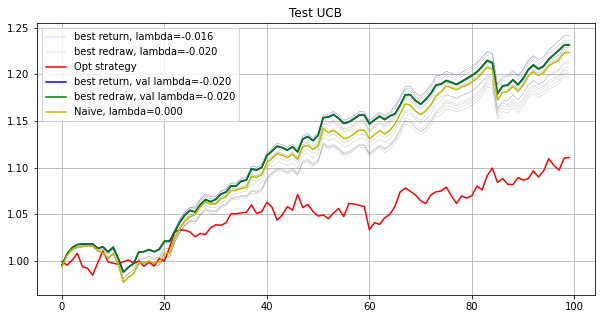

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[0.006  0.0079 0.0119 0.012  0.0144 0.0116 0.0111 0.0066 0.0037 0.0129
 0.0086 0.0079 0.0024 0.02   0.0101 0.0115 0.013  0.0088 0.0101 0.0049
 0.0067 0.0097 0.0061 0.0066 0.0064 0.0054 0.0101 0.0063 0.0037 0.0118
 0.0039 0.0088 0.0147 0.0128 0.0201 0.0079 0.0091 0.0105 0.0042 0.0116
 0.0045 0.0111 0.0147 0.0108 0.006  0.0091 0.0101 0.0091 0.0133 0.0046
 0.0122 0.0154 0.0093 0.0138 0.015  0.0087 0.0096 0.0065 0.0109 0.0093
 0.011  0.011  0.0137 0.0085 0.0108 0.0123 0.0125 0.0057 0.0128 0.0116
 0.0099 0.0122 0.0094 0.0088 0.009  0.0107 0.0111 0.0079 0.0076 0.0088
 0.0131 0.0062 0.0077 0.0093 0.0131 0.0107 0.0074 0.0124 0.016  0.0168
 0.0122 0.0112 0.0078 0.0097 0.0127 0.0115 0.0133 0.0099 0.0119 0.0065]
0.2634114667777175
[ 0.0107  0.0019  0.0135  0.0136  0.0173  0.0117  0.0119  0.0056  0.
  0.0111  0.0055  0.0047  0.0077  0.0171  0.0091  0.0139  0.0133  0.0089
  0.0105  0.0002  0.0075  0.0096  0.0049  0.0044 

[ 0.     -0.      0.0249  0.018   0.0276  0.0111  0.0181  0.      0.
  0.0234 -0.      0.0039 -0.      0.      0.     -0.      0.007   0.
  0.0303  0.      0.0216  0.0224  0.      0.      0.0013  0.      0.0104
  0.      0.      0.0242  0.0033  0.0026  0.0293  0.0361  0.      0.0059
  0.0127  0.0106  0.0275  0.      0.      0.      0.026   0.0023  0.
  0.0105  0.0203  0.0083  0.0247  0.      0.023   0.008   0.      0.0488
  0.0011  0.      0.0026  0.006   0.0194  0.      0.0109  0.      0.0102
  0.008   0.0025  0.0033  0.0318  0.      0.0158  0.      0.0266  0.0133
  0.0007  0.0331  0.0151  0.0233  0.007   0.      0.0092  0.0088  0.
  0.0064  0.      0.0239  0.018   0.      0.      0.0216  0.0273  0.016
  0.0291  0.0009  0.003   0.      0.0051  0.0294  0.0051  0.      0.0212
  0.    ]
0.0862379347248028
[ 0.0001  0.      0.0249  0.018   0.0276  0.0111  0.0181 -0.      0.
  0.0234 -0.      0.0039 -0.     -0.     -0.     -0.      0.007  -0.
  0.0303  0.      0.0216  0.0224 -0.     -0.   

[ 0.      0.0014  0.029   0.0238  0.0174  0.0127  0.017   0.      0.
  0.0317  0.      0.0038  0.      0.0085  0.      0.0246  0.0102 -0.
  0.0375  0.      0.0034  0.005   0.     -0.      0.      0.      0.0123
  0.      0.      0.0323  0.     -0.     -0.      0.0439  0.0098  0.0016
  0.0106  0.0194  0.0116  0.0098 -0.     -0.      0.0437  0.      0.
  0.0037  0.0254  0.      0.0218  0.      0.0371  0.0073  0.      0.056
  0.      0.0111 -0.     -0.      0.023  -0.      0.0337 -0.      0.006
 -0.     -0.      0.0001  0.034  -0.      0.0083  0.      0.0507  0.0101
 -0.     -0.      0.0126  0.046   0.0074  0.0248 -0.      0.      0.015
  0.0069 -0.      0.0195  0.0327 -0.     -0.      0.0013  0.0065  0.0017
  0.0042  0.0044  0.0039 -0.     -0.      0.0191  0.0084 -0.      0.0367
  0.    ]
0.1723228374713397
[-0.      0.      0.0285  0.0228  0.0194  0.0115  0.0168 -0.     -0.
  0.0326 -0.      0.0025 -0.      0.0056 -0.      0.0212  0.007  -0.
  0.0377 -0.      0.0031  0.0056 -0.     -0. 

[ 0.      0.      0.0266  0.022   0.0155  0.0118  0.016   0.      0.
  0.0333  0.0003  0.0021  0.      0.      0.      0.015   0.      0.0015
  0.0369  0.      0.0136  0.0044  0.      0.0025  0.      0.      0.013
 -0.      0.0001  0.0399  0.      0.      0.0029  0.0371  0.      0.0015
  0.0103  0.0176  0.      0.0038  0.0033  0.      0.0538  0.      0.
  0.0052  0.0331  0.      0.0282  0.      0.0433  0.0139  0.      0.0593
  0.      0.      0.0008  0.      0.0212  0.0001  0.0302  0.      0.0053
 -0.      0.0028  0.0007  0.0376  0.      0.012   0.      0.0548  0.
  0.0022  0.      0.0128  0.0521  0.0038  0.0206  0.0031  0.0038  0.0067
  0.0067  0.0093  0.0194  0.0351 -0.     -0.      0.      0.0083  0.0032
  0.0035  0.      0.0022  0.0017  0.0027  0.0194  0.0073  0.0001  0.0424
  0.    ]
0.0021657949302619477
[ 0.      0.      0.0266  0.022   0.0155  0.0118  0.016   0.      0.
  0.0333  0.0003  0.0021  0.      0.      0.      0.015   0.      0.0015
  0.0369  0.      0.0136  0.0044  0.

[ 0.0025 -0.      0.0259  0.0215  0.016   0.009   0.0145  0.     -0.
  0.0179 -0.      0.0034  0.0041 -0.     -0.      0.0172  0.0082 -0.
  0.0328 -0.      0.0156 -0.      0.0029  0.0018  0.0014 -0.      0.0112
  0.     -0.      0.0254  0.0054 -0.      0.016   0.0419  0.0051  0.0063
  0.0011  0.0188  0.0069 -0.     -0.     -0.      0.0559  0.0015  0.0105
  0.0044  0.0283 -0.      0.0198 -0.      0.0366 -0.     -0.      0.0583
 -0.     -0.     -0.     -0.      0.0108 -0.      0.0324 -0.      0.0101
 -0.      0.0109 -0.      0.0243 -0.      0.0056 -0.      0.0503 -0.
 -0.      0.008   0.0092  0.0471  0.0005  0.0327  0.0079  0.0047  0.0099
  0.0025 -0.      0.0143  0.018  -0.      0.      0.0015  0.0137  0.0085
  0.0195  0.0492 -0.     -0.      0.0007  0.0159  0.0014 -0.      0.0422
  0.    ]
0.000375681297101774
[-0.      0.      0.0256  0.0213  0.0157  0.0104  0.0143 -0.     -0.
  0.0213  0.0004  0.0028  0.001  -0.     -0.      0.0167  0.0045 -0.
  0.0322  0.0016  0.0185  0.     -0.    

/home/linaiqi/anaconda3/envs/py37/lib/python3.7/site-packages/cvxpy/problems/problem.py:1061: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  "Solution may be inaccurate. Try another solver, "


[0.0044 0.0096 0.0253 0.0213 0.0141 0.006  0.0142 0.     0.     0.023
 0.     0.0035 0.     0.     0.     0.0177 0.002  0.     0.0321 0.
 0.0213 0.0007 0.     0.     0.0004 0.     0.0111 0.0009 0.     0.0245
 0.     0.     0.0112 0.0444 0.0073 0.0057 0.     0.0161 0.0065 0.0008
 0.0023 0.0061 0.0556 0.     0.0045 0.0035 0.0308 0.     0.0214 0.
 0.0392 0.     0.002  0.0564 0.0008 0.001  0.     0.0003 0.0099 0.
 0.032  0.     0.0125 0.     0.0099 0.     0.0236 0.     0.0053 0.0007
 0.0513 0.0032 0.0013 0.0026 0.0111 0.0485 0.0025 0.029  0.0102 0.003
 0.0076 0.0025 0.     0.014  0.0176 0.0001 0.     0.0006 0.0169 0.011
 0.0127 0.0527 0.0026 0.     0.     0.0137 0.0001 0.0009 0.0426 0.    ]
0.0004121516195118147
[ 0.0044  0.0096  0.0253  0.0213  0.0141  0.006   0.0142 -0.     -0.
  0.023   0.      0.0035  0.     -0.      0.      0.0177  0.002   0.
  0.0321  0.      0.0213  0.0007  0.      0.      0.0004  0.      0.0111
  0.0009  0.      0.0245  0.     -0.      0.0112  0.0444  0.0072  0.005

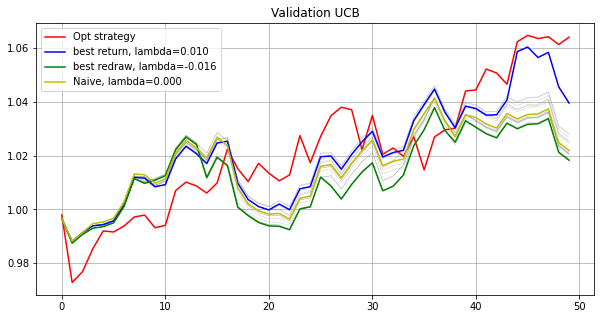

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[ 0.0005 -0.      0.0239  0.0166  0.0293  0.0185  0.0173 -0.     -0.
  0.0168  0.0032  0.0015 -0.      0.0021 -0.      0.0012  0.003   0.0052
  0.0266 -0.      0.      0.033   0.      0.0029  0.0088 -0.      0.0131
  0.0007  0.      0.0453  0.      0.0029  0.0199  0.0404  0.      0.0163
  0.0123 -0.      0.0044  0.0021  0.013  -0.      0.052   0.      0.0187
  0.0025  0.0285  0.      0.0356  0.0009  0.0312  0.0159  0.0171  0.0035
  0.0057  0.0002  0.0051  0.0051  0.0133  0.      0.02    0.006   0.0059
  0.0065  0.0015  0.0048  0.0108 -0.      0.0123 -0.      0.0364  0.
  0.0063  0.0022  0.0154  0.0378  0.0123  0.0012  0.0007  0.0073  0.0029
  0.0002  0.      0.0122  0.0006 -0.      0.      0.0002  0.0289  0.024
  0.0089  0.0316  0.0161  0.      0.0151  0.0184  0.      0.0104  0.0265
  0.0002]
0.05949820072080839
[ 0.0021  0.      0.0238  0.0165  0.0287  0.0145  0.0171  0.      0.
  0.0172  0.0027  0.0027 -0.      0.0016  0.      0.      0.0012  0.0041
  0.0267  0.0008 -0.      0.0332  

[ 0.     -0.      0.0238  0.0173  0.0257  0.0149  0.0155 -0.     -0.
  0.0223 -0.      0.     -0.     -0.     -0.      0.0035  0.0037  0.0018
  0.0302  0.0003  0.0108  0.0258 -0.      0.0095  0.     -0.      0.0143
 -0.      0.0004  0.0416 -0.      0.      0.0328  0.0394 -0.      0.0066
  0.0144  0.0055 -0.      0.0059  0.0091 -0.      0.0671 -0.      0.005
  0.0019  0.0313  0.0007  0.0402 -0.      0.0405  0.0213  0.0011  0.0212
 -0.     -0.      0.0006  0.0019  0.009   0.0002  0.0266  0.0022  0.0048
  0.     -0.      0.0038  0.0152 -0.      0.0056 -0.      0.0338  0.
  0.      0.0139  0.0242  0.0455  0.0029  0.0004 -0.      0.0004  0.0023
  0.      0.0003  0.0135  0.0056  0.0054  0.      0.017   0.0312  0.0262
  0.0014  0.0193  0.013   0.003   0.0008  0.0178  0.0078  0.0006  0.0387
 -0.    ]
0.056824368246673806
[ 0.      0.      0.0238  0.0173  0.0257  0.0149  0.0155  0.      0.
  0.0223  0.      0.      0.      0.      0.      0.0035  0.0037  0.0018
  0.0302  0.0003  0.0108  0.0258 

[ 0.     -0.      0.0293  0.0246  0.0246  0.0158  0.0163  0.      0.
  0.0187 -0.      0.      0.     -0.      0.     -0.     -0.     -0.
  0.03    0.0097  0.0049  0.0116  0.      0.0176  0.0031  0.      0.0105
  0.      0.      0.0077  0.      0.      0.032   0.0406  0.0018  0.0162
  0.0013 -0.      0.0389  0.0054  0.      0.0044  0.0706 -0.      0.0148
  0.0045  0.0238  0.      0.0264  0.0078  0.0532  0.0099  0.0035  0.0383
  0.      0.001   0.      0.0102  0.0048  0.      0.0466  0.      0.0113
  0.      0.0016  0.003   0.0059  0.      0.007  -0.      0.0394  0.
 -0.     -0.      0.0227  0.0347  0.0172  0.0123  0.0182  0.0049  0.0064
  0.      0.0127  0.0157  0.0051  0.0004  0.      0.0054  0.0014  0.03
  0.      0.      0.0063 -0.      0.      0.0153  0.     -0.      0.0431
  0.    ]
0.10571229172391397
[-0.     -0.      0.0276  0.0231  0.0234  0.0166  0.0158 -0.     -0.
  0.0228 -0.     -0.     -0.     -0.      0.      0.0083  0.0039  0.0004
  0.0346  0.0052 -0.      0.0097 -0.   

[-0.      0.011   0.0235  0.0175  0.0223  0.0185  0.0148 -0.      0.
  0.019  -0.     -0.     -0.      0.     -0.      0.     -0.      0.0002
  0.0399  0.      0.0105  0.011  -0.      0.0066  0.011  -0.      0.0127
  0.     -0.      0.0316  0.      0.      0.019   0.0425  0.0001  0.0139
  0.      0.      0.     -0.      0.     -0.      0.0802  0.003   0.0121
  0.0108  0.0262  0.      0.0301  0.0054  0.056   0.0044  0.0114  0.0444
 -0.     -0.      0.0009  0.0065  0.0094 -0.      0.0366  0.0128  0.
  0.0236  0.      0.0016  0.0156 -0.      0.0059 -0.      0.0306  0.
  0.0025  0.      0.0219  0.0324  0.0134  0.019   0.     -0.      0.
 -0.      0.      0.0108 -0.      0.      0.     -0.      0.0063  0.0374
  0.0084  0.0248  0.0076  0.      0.      0.0128  0.0035  0.      0.0463
  0.    ]
0.29512327076576084
[ 0.      0.011   0.0235  0.0175  0.0223  0.0185  0.0147  0.      0.
  0.019   0.      0.      0.      0.      0.      0.      0.      0.0002
  0.0399 -0.      0.0105  0.011   0.     

[ 0.0002  0.      0.0255  0.0136  0.0186  0.0095  0.0141  0.      0.
  0.0367  0.      0.      0.      0.      0.      0.0164  0.      0.0137
  0.0321  0.      0.0002  0.0171  0.      0.0104  0.0026  0.      0.0099
  0.0002  0.      0.0264  0.0004  0.      0.0131  0.0317  0.      0.0025
  0.0114  0.0011  0.0019  0.0017  0.0003  0.      0.0675  0.     -0.
  0.0083  0.0317  0.      0.0438  0.0095  0.0554  0.0094  0.002   0.0421
  0.0001  0.      0.0011  0.      0.0058 -0.      0.0318 -0.      0.0111
  0.0155  0.      0.0001  0.0156  0.      0.0079  0.      0.0421  0.0023
  0.      0.0098  0.0225  0.0505  0.0052  0.001   0.      0.      0.0005
  0.      0.      0.0121  0.0041  0.0005  0.      0.0083  0.0168  0.0316
  0.0029  0.0365  0.0116  0.      0.0003  0.0183  0.0023  0.0003  0.0504
  0.    ]
9.685267016210409e-05
[ 0.0002  0.      0.0255  0.0136  0.0186  0.0095  0.0141 -0.      0.
  0.0367  0.      0.      0.     -0.      0.      0.0164  0.      0.0137
  0.0321  0.      0.0002  0.017

[ 0.      0.      0.0256  0.0136  0.0179  0.0076  0.0141  0.      0.
  0.0378  0.      0.      0.      0.      0.      0.0156  0.      0.0131
  0.0323  0.0003  0.0013  0.0181  0.      0.0099  0.0042  0.      0.0099
 -0.      0.0005  0.0254  0.      0.      0.0142  0.0324  0.      0.0015
  0.0109  0.0005  0.0007  0.002   0.0009  0.0002  0.0685  0.      0.
  0.0077  0.0318  0.      0.0441  0.0081  0.0551  0.0114  0.0026  0.0423
  0.0007  0.      0.001   0.      0.006   0.      0.032   0.      0.0109
  0.0152  0.      0.      0.016   0.0011  0.008   0.      0.0422  0.0026
  0.      0.0124  0.0225  0.0502  0.0053  0.0007  0.0005 -0.      0.0004
  0.     -0.      0.0117  0.0035  0.0005 -0.      0.0059  0.0156  0.0332
  0.0022  0.0351  0.0112  0.     -0.      0.0184  0.0016  0.0002  0.0506
 -0.    ]
0.001724505381488967
[ 0.      0.      0.0256  0.0136  0.0179  0.0076  0.0141  0.      0.
  0.0378  0.      0.      0.      0.      0.      0.0156  0.      0.0131
  0.0323  0.0003  0.0013  0.0181

[ 0.0046 -0.      0.026   0.0137  0.0164  0.0088  0.0144 -0.     -0.
  0.0369  0.0003 -0.     -0.      0.      0.0003  0.0139 -0.      0.014
  0.0361 -0.      0.003   0.0172  0.0004  0.0137  0.0042 -0.      0.0097
 -0.     -0.      0.0255 -0.     -0.      0.0115  0.0338  0.      0.0024
  0.014  -0.      0.0005  0.0005  0.0018 -0.      0.0707  0.0008 -0.
  0.0066  0.0315 -0.      0.0441  0.0052  0.0551  0.0123 -0.      0.0439
  0.     -0.      0.0008  0.      0.0041 -0.      0.0344 -0.      0.0084
  0.0149  0.0011  0.0023  0.0149 -0.      0.0084  0.0003  0.0406 -0.
 -0.      0.0111  0.0246  0.0495  0.0048 -0.      0.      0.0003  0.
 -0.      0.      0.0109  0.0036  0.      0.      0.0046  0.014   0.0335
  0.0031  0.0345  0.0105  0.0004 -0.      0.0189  0.     -0.      0.0518
  0.    ]
0.00027746917843663306
[ 0.0046  0.      0.026   0.0137  0.0164  0.0088  0.0144 -0.     -0.
  0.0369  0.0003 -0.     -0.     -0.      0.0003  0.0139 -0.      0.014
  0.0361 -0.      0.003   0.0172  0.0004

[-0.      0.      0.0232  0.0135  0.0134  0.0124  0.0134 -0.     -0.
  0.0282 -0.     -0.     -0.      0.     -0.      0.0022 -0.      0.0024
  0.0215 -0.      0.0237  0.     -0.     -0.      0.      0.      0.0116
 -0.      0.      0.0354  0.     -0.      0.0214  0.0164  0.      0.012
 -0.      0.     -0.      0.      0.      0.      0.0689 -0.      0.0156
  0.0001  0.0255  0.      0.0513 -0.      0.0493  0.0156 -0.      0.0379
  0.      0.      0.0041  0.0072  0.0019 -0.      0.0455  0.      0.0008
  0.0068 -0.      0.0029  0.0093  0.      0.017   0.      0.0472  0.
 -0.      0.0096  0.0143  0.0498 -0.      0.0071 -0.      0.0134  0.0065
  0.0056  0.      0.0154  0.0053  0.      0.      0.0212  0.0105  0.036
  0.0065  0.0268  0.0119  0.      0.0032  0.0399  0.0053  0.      0.054
  0.    ]
9.058937474879848e-05
[ 0.     -0.      0.024   0.0125  0.0119  0.0176  0.0134  0.      0.
  0.0291  0.      0.      0.      0.      0.0002  0.      0.0045  0.0006
  0.0199  0.      0.0339  0.0005  

[-0.      0.      0.024   0.0154  0.0145  0.0123  0.0129 -0.      0.
  0.0274  0.      0.0039 -0.      0.0026 -0.      0.007  -0.     -0.
  0.0237 -0.      0.0013  0.0173 -0.     -0.     -0.     -0.      0.0103
 -0.     -0.      0.0399  0.     -0.      0.0215  0.032   0.      0.0106
  0.0079  0.      0.     -0.     -0.     -0.      0.0749 -0.      0.006
  0.0008  0.028  -0.      0.0512  0.      0.0474  0.0141  0.0139  0.0349
 -0.      0.     -0.      0.0019  0.0025 -0.      0.0351  0.     -0.
  0.0026 -0.      0.0091  0.0112 -0.      0.0056 -0.      0.0389  0.0077
 -0.      0.018   0.0248  0.0551  0.0067  0.013  -0.      0.0006  0.
 -0.     -0.      0.0019  0.0092  0.0218 -0.     -0.      0.0277  0.0296
 -0.      0.0221  0.0121 -0.      0.      0.0295 -0.     -0.      0.0575
 -0.    ]
0.17432096984135018
[ 0.      0.      0.0232  0.0141  0.0157  0.0141  0.0127 -0.     -0.
  0.03   -0.      0.0023 -0.      0.0055 -0.      0.0034 -0.      0.0002
  0.0247 -0.      0.0012  0.0187 -0.     -

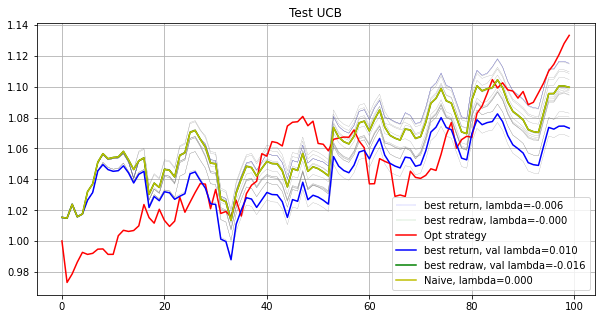

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.      0.034   0.0233  0.022   0.0179  0.0165  0.      0.0011
  0.0056  0.0133 -0.      0.0233  0.0092  0.0073  0.0182  0.      0.
  0.      0.008   0.0058  0.0241  0.      0.0202  0.0121  0.0014  0.0101
  0.0103  0.0149  0.0215  0.0096  0.012  -0.      0.0175  0.0106 -0.
  0.0082 -0.      0.0184  0.     -0.      0.0049  0.008   0.      0.
  0.0104 -0.      0.0124  0.0077  0.0114  0.021   0.0242  0.0003  0.0273
  0.0252  0.0088  0.0101  0.0153  0.0002  0.0145 -0.     -0.      0.0098
  0.0042  0.0192  0.0181  0.0037 -0.      0.0114  0.0036  0.0007  0.0107
  0.0048  0.0076  0.0394  0.0098  0.      0.0004  0.0189  0.0339  0.0039
  0.03   -0.      0.012   0.0037 -0.      0.      0.0083  0.0155  0.0144
  0.0123  0.0216  0.      0.0092  0.0092  0.0002  0.0204  0.0154  0.011
  0.0184]
0.749282119556285
[ 0.     -0.      0.0209  0.0391  0.035   0.0066  0.021   0.      0.
  0.0085  0.0094 -0.      0.0377  

[ 0.      0.      0.0276  0.0407  0.0358  0.      0.0167 -0.      0.
  0.0053  0.0042  0.0011  0.0459  0.0144  0.      0.0019  0.      0.
  0.0024  0.0244  0.0174  0.0286  0.0013  0.0365  0.0245  0.      0.
  0.      0.      0.0359  0.      0.0011  0.      0.0131 -0.      0.0003
 -0.      0.      0.0092 -0.      0.      0.0014  0.0029  0.0032  0.
  0.      0.      0.031  -0.      0.0161  0.0246  0.0203 -0.      0.0124
  0.0621  0.0416  0.0025  0.0318 -0.      0.0005  0.0002 -0.     -0.
  0.0028  0.0056  0.0022  0.0232  0.      0.0111  0.      0.      0.0108
 -0.      0.      0.0271  0.0151 -0.      0.0146  0.0095  0.0089  0.0236
  0.0263 -0.     -0.     -0.      0.      0.0135  0.0012  0.0119  0.0237
  0.      0.0036 -0.      0.0361  0.0201  0.0029  0.0423  0.0093  0.0036
  0.0122]
0.0001273129174534845
[0.     0.     0.0276 0.0407 0.0358 0.     0.0167 0.     0.     0.0053
 0.0042 0.0011 0.0459 0.0144 0.     0.0019 0.     0.     0.0024 0.0244
 0.0174 0.0286 0.0013 0.0365 0.0245 0.     

/home/linaiqi/anaconda3/envs/py37/lib/python3.7/site-packages/cvxpy/problems/problem.py:1061: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  "Solution may be inaccurate. Try another solver, "


[0.     0.     0.0057 0.0417 0.0352 0.     0.0179 0.     0.0167 0.
 0.     0.     0.0557 0.015  0.     0.     0.     0.     0.0047 0.
 0.0048 0.0208 0.     0.0402 0.0225 0.     0.     0.     0.0073 0.0438
 0.     0.0015 0.     0.     0.     0.     0.     0.     0.007  0.
 0.     0.     0.     0.0333 0.     0.     0.     0.0175 0.     0.0041
 0.     0.0232 0.     0.0253 0.08   0.0294 0.     0.0217 0.     0.0045
 0.     0.     0.     0.     0.0257 0.0005 0.0382 0.     0.02   0.
 0.     0.0249 0.     0.0032 0.0143 0.0255 0.     0.0245 0.0151 0.
 0.0203 0.0173 0.     0.     0.     0.012  0.0077 0.0249 0.0029 0.0171
 0.     0.     0.     0.027  0.0286 0.0083 0.0429 0.0044 0.     0.0151]
0.00012169780204579764
[0.     0.     0.0057 0.0417 0.0352 0.     0.0179 0.     0.0167 0.
 0.     0.     0.0557 0.015  0.     0.     0.     0.     0.0047 0.
 0.0048 0.0208 0.     0.0402 0.0225 0.     0.     0.     0.0073 0.0438
 0.     0.0015 0.     0.     0.     0.     0.     0.     0.007  0.
 0.     0.    

[ 0.      0.      0.003   0.0386  0.0335  0.      0.0154  0.      0.0024
  0.      0.0058  0.      0.0594  0.014   0.      0.0005  0.     -0.
  0.0083  0.0007  0.0083  0.0222  0.      0.0448  0.0283  0.      0.
 -0.      0.0025  0.0402 -0.      0.      0.      0.0027 -0.      0.0064
 -0.      0.0003  0.0063 -0.     -0.      0.      0.0019  0.0133  0.
 -0.      0.0019  0.027  -0.      0.0003  0.011   0.0253 -0.      0.0182
  0.0876  0.0169  0.      0.0267 -0.      0.0112 -0.      0.     -0.
 -0.      0.0136  0.0117  0.0315 -0.      0.0161  0.      0.0285  0.009
 -0.     -0.      0.0204  0.0188  0.0018  0.0185  0.01    0.0126  0.0314
  0.0153  0.      0.0039 -0.      0.     -0.      0.0139  0.0053  0.0216
  0.0027  0.0025  0.0064  0.0166  0.0184  0.0096  0.0566 -0.     -0.
  0.0182]
0.12354344676326183
[-0.     -0.      0.003   0.0388  0.0336 -0.      0.0154 -0.      0.0012
  0.      0.0047  0.0023  0.0598  0.0143 -0.      0.      0.     -0.
  0.0087  0.0011  0.0081  0.0211  0.0007  0.04

[ 0.      0.      0.0142  0.0359  0.0315  0.      0.0135  0.      0.
  0.      0.      0.      0.0588  0.0213  0.     -0.      0.      0.
  0.0087  0.0024  0.0094  0.0189  0.0003  0.0467  0.03    0.      0.
  0.      0.0006  0.0371  0.      0.0004  0.0007  0.0093  0.      0.
  0.      0.      0.0002  0.0037  0.      0.0029  0.0003  0.0006  0.
 -0.     -0.      0.0285  0.0009  0.0002  0.0063  0.0294  0.      0.0151
  0.0919  0.0126  0.0135  0.0291  0.      0.0151  0.      0.0001  0.
  0.0093  0.0372  0.0018  0.0136  0.      0.0169  0.      0.0175  0.0187
  0.      0.      0.024   0.0217  0.      0.02    0.0077  0.0112  0.031
  0.0111  0.      0.      0.0022 -0.     -0.      0.0015  0.0058  0.0168
  0.0002  0.0113 -0.      0.0196  0.0155  0.0186  0.0562  0.0003  0.0003
  0.0198]
0.00043305612532541207
[ 0.     -0.      0.0142  0.0359  0.0315  0.      0.0135 -0.      0.
  0.     -0.     -0.      0.0588  0.0213  0.     -0.      0.      0.
  0.0087  0.0024  0.0094  0.0189  0.0003  0.0467  0

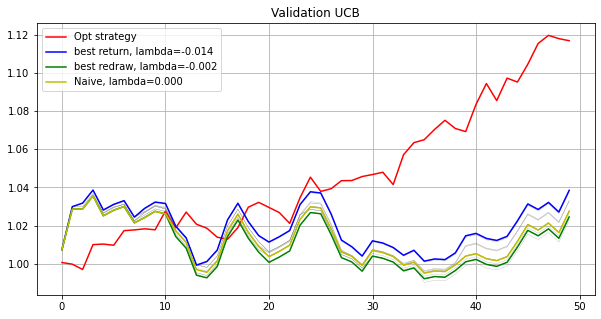

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[ 0.      0.      0.0326  0.0396  0.0383  0.      0.0147 -0.      0.
  0.      0.     -0.      0.0396  0.02    0.      0.0006 -0.      0.
  0.0014  0.0283  0.0046  0.0092  0.      0.0351  0.0436  0.      0.
  0.      0.0009  0.0635  0.0061  0.0009  0.      0.0076  0.      0.
  0.      0.      0.0024 -0.     -0.      0.      0.0028  0.012   0.
  0.      0.0109  0.025   0.      0.0109  0.0078  0.0274  0.      0.0165
  0.0552  0.0009  0.0039  0.0381 -0.      0.0105 -0.     -0.     -0.
  0.0004  0.0169  0.0022  0.0161 -0.      0.0134  0.0021  0.      0.0291
  0.      0.009   0.0219  0.0236  0.0032  0.015   0.0002  0.0255  0.0083
  0.0143 -0.      0.      0.0148  0.      0.0009  0.0081  0.005   0.0219
  0.0101  0.      0.0049  0.0385  0.0031  0.0082  0.0375  0.0283  0.
  0.0066]
0.06921679903223432
[0.     0.     0.0326 0.0396 0.0383 0.     0.0147 0.     0.     0.
 0.     0.     0.0396 0.02   0.     0.0006 0.     0.     0.0014 0.0283
 0.0046 0.0092 0.     0.0351 0.0436 0.     0.     0.     

[ 0.     -0.      0.0307  0.0329  0.0323  0.002   0.0147 -0.     -0.
  0.      0.0045  0.      0.0413  0.0238 -0.     -0.     -0.     -0.
  0.0007  0.0372  0.005   0.0097 -0.      0.0364  0.043  -0.     -0.
  0.0013  0.0024  0.0665  0.0067 -0.     -0.      0.0106 -0.     -0.
  0.0012  0.0013  0.0014 -0.     -0.     -0.     -0.      0.0094  0.0026
  0.0002 -0.      0.0246 -0.      0.0129  0.0071  0.0274  0.0004  0.0136
  0.0627 -0.     -0.      0.0323 -0.      0.0163  0.     -0.      0.0001
 -0.      0.0281  0.0026  0.0132  0.0024  0.0094 -0.      0.0001  0.0261
 -0.      0.003   0.0303  0.026  -0.      0.0119  0.0088  0.0025  0.0128
  0.0206 -0.      0.0015  0.0048 -0.      0.0304 -0.      0.0009  0.0204
  0.0038  0.0034 -0.      0.0304 -0.      0.0194  0.0418  0.0271  0.0031
  0.0003]
0.03554973037238923
[ 0.      0.      0.0307  0.0329  0.0323  0.002   0.0147  0.     -0.
  0.      0.0045 -0.      0.0413  0.0238  0.      0.     -0.     -0.
  0.0007  0.0372  0.005   0.0097 -0.      0.0

[ 0.      0.0005  0.0221  0.0332  0.0328  0.      0.0148  0.      0.0004
  0.      0.0007  0.0052  0.044   0.0224 -0.      0.     -0.     -0.
  0.0001  0.0332 -0.      0.003  -0.      0.0397  0.0288 -0.     -0.
 -0.      0.0002  0.0692  0.0099 -0.      0.      0.0037 -0.      0.
 -0.      0.0039  0.006  -0.     -0.      0.0101  0.0005 -0.     -0.
 -0.      0.      0.0254  0.      0.0097  0.0081  0.0305 -0.      0.007
  0.0694  0.      0.      0.0355 -0.      0.0181  0.      0.     -0.
  0.0002  0.0251  0.002   0.0054 -0.      0.0093  0.     -0.      0.0248
 -0.      0.0002  0.0249  0.0313 -0.      0.0177  0.0156  0.0078  0.0133
  0.0242 -0.      0.0057 -0.      0.      0.0371  0.      0.0121  0.0109
  0.005   0.0064 -0.      0.0337  0.0078  0.013   0.0462  0.0296  0.0024
  0.0005]
0.02418077723647126
[ 0.      0.0009  0.0235  0.0325  0.0328 -0.      0.0145 -0.     -0.
  0.      0.0002  0.0052  0.0448  0.0223 -0.      0.     -0.      0.
  0.      0.0334  0.0004  0.0016 -0.      0.0399  

[ 0.      0.      0.0252  0.0303  0.0258 -0.      0.0131  0.      0.
  0.0065  0.003   0.      0.0389  0.0185  0.      0.0015  0.      0.
 -0.      0.0427  0.      0.0035  0.      0.0432  0.0296  0.      0.
 -0.      0.      0.0649  0.0052 -0.     -0.      0.0042  0.      0.
  0.     -0.      0.0065  0.01    0.      0.     -0.      0.     -0.
  0.     -0.      0.0326  0.      0.0023  0.0207  0.0353  0.     -0.
  0.0812  0.      0.0023  0.0259  0.      0.0222  0.      0.      0.
  0.0054  0.0166  0.0022  0.      0.      0.0086  0.      0.      0.0195
  0.      0.0075  0.0335  0.024   0.      0.0252  0.0092  0.0075  0.0061
  0.0204  0.      0.      0.      0.001   0.0443  0.      0.0002 -0.
  0.      0.014  -0.      0.0275  0.0074  0.0385  0.0467  0.0285  0.0022
  0.0088]
0.2042126675668952
[-0.     -0.      0.0252  0.0303  0.0259 -0.      0.0131 -0.      0.
  0.0065  0.003  -0.      0.0389  0.0185 -0.      0.0015 -0.      0.
  0.      0.0427 -0.      0.0035 -0.      0.0432  0.0296  0.  

[-0.      0.      0.022   0.0292  0.0266 -0.      0.0127  0.      0.0012
 -0.      0.0006 -0.      0.0385 -0.     -0.     -0.     -0.     -0.
  0.0062  0.048   0.0034  0.0034  0.      0.0435  0.0172 -0.      0.0006
  0.0005 -0.      0.0667  0.0081  0.0012 -0.      0.007   0.     -0.
 -0.      0.0019  0.0047 -0.     -0.      0.0134  0.0048  0.0014 -0.
  0.0004 -0.      0.0225  0.0029  0.0071  0.0117  0.0343  0.      0.0105
  0.0891  0.0012  0.0033  0.0278 -0.      0.0236  0.     -0.     -0.
  0.0089  0.0181  0.0005  0.0043  0.0034  0.0043 -0.     -0.      0.0129
 -0.      0.0004  0.022   0.0236 -0.      0.0121  0.0081 -0.     -0.
  0.0346 -0.      0.005  -0.      0.0046  0.0554  0.0007  0.0041  0.0108
  0.      0.0164  0.0041  0.029   0.0026  0.0456  0.0437  0.0259  0.0004
  0.0016]
0.0003937033484619349
[-0.      0.      0.022   0.0292  0.0266 -0.      0.0127  0.      0.0012
 -0.      0.0006 -0.      0.0385 -0.     -0.     -0.     -0.     -0.
  0.0062  0.048   0.0034  0.0034 -0.      0

[-0.      0.0177  0.0165  0.026   0.0266  0.      0.0143  0.     -0.
  0.      0.002   0.      0.0406 -0.      0.      0.0009  0.      0.
  0.0044  0.037   0.      0.0076  0.0019  0.0443  0.0125  0.      0.
  0.      0.      0.0765  0.03    0.      0.005   0.006   0.      0.0012
  0.      0.0067  0.0015 -0.      0.      0.0066  0.0025  0.      0.
  0.      0.      0.0174  0.      0.0075  0.0024  0.0341  0.0032  0.0125
  0.0941  0.      0.001   0.025   0.      0.0229  0.      0.      0.
  0.0033  0.0144  0.      0.0077  0.      0.0069  0.      0.0137  0.0198
  0.      0.      0.0144  0.0294  0.0015 -0.      0.0057  0.      0.0016
  0.0401  0.0023  0.0072 -0.      0.0053  0.0386 -0.      0.      0.019
  0.0009  0.0166  0.      0.0267  0.      0.0497  0.039   0.0279  0.
  0.    ]
0.28983156256066095
[ 0.      0.0087  0.0196  0.0273  0.0275  0.      0.0142 -0.      0.
  0.0009  0.0037  0.0052  0.0426  0.     -0.      0.     -0.      0.0129
  0.      0.0287 -0.      0.0047  0.      0.0463  

[-0.      0.      0.0241  0.0264  0.0258  0.      0.0133  0.      0.
  0.0033  0.0017  0.      0.0432  0.0028  0.      0.0052 -0.      0.0092
  0.      0.0245  0.0017  0.0042 -0.      0.0458  0.0158  0.      0.0003
  0.      0.      0.0799  0.0212  0.0001  0.      0.     -0.      0.
  0.      0.0079  0.      0.      0.      0.0216  0.0045  0.0005  0.0029
  0.0006  0.      0.0115  0.0007  0.0053  0.0142  0.0341  0.      0.0005
  0.097   0.009   0.      0.0365 -0.      0.0222  0.0037  0.      0.
  0.      0.0152  0.0038  0.0088  0.      0.0022  0.      0.0094  0.0207
  0.      0.0039  0.018   0.0292  0.      0.0003  0.0071 -0.     -0.
  0.0436  0.      0.0053 -0.      0.0028  0.0222  0.      0.0019  0.0113
  0.007   0.0149  0.      0.0301  0.      0.0494  0.0374  0.0264  0.0002
  0.0074]
0.17699770793056518
[ 0.      0.      0.0241  0.0264  0.0258  0.      0.0133  0.      0.
  0.0033  0.0017  0.      0.0432  0.0028 -0.      0.0052 -0.      0.0092
 -0.      0.0245  0.0017  0.0042 -0.     

[ 0.      0.      0.0258  0.0267  0.0267  0.      0.0137 -0.      0.006
 -0.      0.0031  0.      0.0426  0.      0.0026  0.0025  0.      0.
  0.      0.0194  0.      0.011   0.      0.0461  0.0154  0.      0.
  0.0001  0.0048  0.0751  0.0323  0.      0.      0.      0.      0.
 -0.      0.      0.0013 -0.      0.      0.0097  0.0026  0.      0.
  0.      0.0005  0.0102  0.      0.0078  0.0216  0.0272  0.      0.0025
  0.0995  0.0116  0.0063  0.0421 -0.      0.0209 -0.     -0.      0.
  0.0057  0.0075  0.0016  0.0085  0.      0.0027  0.0028  0.0241  0.0176
  0.      0.005   0.0144  0.0294  0.      0.0021  0.011   0.0104  0.0003
  0.048   0.0017  0.      0.     -0.      0.0084 -0.     -0.      0.0196
  0.0052  0.0069  0.      0.0314  0.      0.0458  0.0436  0.0209 -0.
  0.0076]
0.00027878769932334306
[-0.      0.      0.0254  0.0273  0.0269  0.0081  0.0136  0.      0.0058
  0.0042  0.0035 -0.      0.044   0.      0.0006  0.002   0.      0.
  0.      0.0183  0.0007  0.0116  0.      0.046

[ 0.      0.0027  0.0216  0.0275  0.0268  0.0073  0.0135  0.      0.0017
  0.0025  0.0025  0.      0.0443  0.      0.      0.0001  0.      0.
  0.0008  0.0206  0.0015  0.0118  0.0016  0.0458  0.0104  0.      0.
  0.      0.0026  0.0767  0.022   0.0008  0.      0.005   0.      0.
  0.      0.0025  0.     -0.     -0.      0.0108  0.0012  0.0003  0.0001
  0.      0.      0.0096  0.      0.0097  0.0194  0.0276  0.      0.0118
  0.1015  0.0099  0.0039  0.0405  0.      0.0199  0.0012  0.      0.
  0.      0.007   0.0001  0.0061  0.      0.0015  0.      0.0202  0.0176
  0.      0.0063  0.0118  0.0324  0.0007  0.0043  0.0104  0.      0.0038
  0.0482  0.      0.001   0.0034  0.0022  0.0108  0.0014  0.      0.0241
  0.0013  0.0057  0.0006  0.031   0.0005  0.0446  0.0489  0.0244  0.0008
  0.0085]
0.001378600012352774
[ 0.      0.0045  0.0217  0.0271  0.0264  0.0079  0.0131  0.      0.
  0.002   0.0029  0.      0.044   0.0011  0.0002  0.0002 -0.      0.
  0.0017  0.0221  0.0007  0.0121  0.      0.

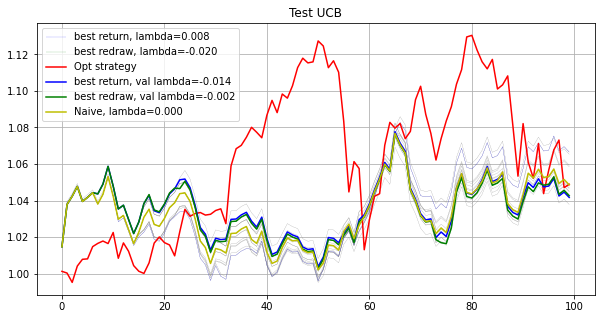

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[0.0024 0.0068 0.0108 0.0054 0.0081 0.0089 0.0066 0.0095 0.014  0.0079
 0.0104 0.0117 0.0025 0.0089 0.0115 0.0128 0.0139 0.0083 0.0231 0.0092
 0.0093 0.0087 0.0046 0.0052 0.0123 0.0103 0.0116 0.0056 0.0102 0.0119
 0.0111 0.0122 0.011  0.0116 0.0183 0.0093 0.0104 0.0028 0.0079 0.0076
 0.0114 0.0169 0.0104 0.0058 0.0138 0.0127 0.0161 0.0051 0.0102 0.009
 0.0076 0.0144 0.0103 0.0077 0.0046 0.0112 0.008  0.0096 0.0136 0.0064
 0.0112 0.0092 0.0129 0.0094 0.0107 0.0065 0.013  0.0037 0.0117 0.0075
 0.0101 0.0085 0.0213 0.0102 0.0091 0.0141 0.0098 0.0084 0.0069 0.0133
 0.0133 0.0142 0.01   0.0079 0.0116 0.0105 0.0096 0.0127 0.0073 0.0125
 0.0082 0.0088 0.0091 0.0098 0.01   0.0076 0.0072 0.0114 0.0109 0.0103]
0.2522366881198224
[ 0.      0.0267  0.017  -0.      0.0059  0.0152  0.0279  0.0102  0.0222
  0.0063  0.0139  0.     -0.      0.0051  0.      0.0387  0.0062  0.0056
 -0.      0.0083  0.0096 -0.      0.0057  0.00

[-0.      0.0268  0.0171 -0.      0.0047  0.0152  0.0205  0.0117  0.0246
  0.0044  0.0049  0.0004  0.0001  0.0028  0.001   0.0376  0.0072  0.0041
  0.0012  0.0073  0.0088 -0.      0.004   0.0017  0.0239  0.015   0.0198
  0.0012  0.0117  0.0226  0.004   0.      0.0132  0.0015  0.0381  0.0045
  0.0102  0.0052  0.0103  0.0205  0.002   0.0273  0.0048  0.0075  0.0173
  0.0278  0.0172 -0.      0.0131  0.0026  0.      0.0085  0.0134  0.0017
  0.      0.014   0.0035  0.0078  0.0233  0.0016  0.0187  0.0039  0.01
  0.0115  0.0045  0.0035  0.      0.0004  0.0227  0.0102  0.0155  0.007
  0.0229  0.0133  0.      0.0279  0.0103  0.0016  0.0044  0.0121  0.0163
  0.0102  0.0172  0.0013  0.0141  0.0061  0.0061  0.0251  0.016   0.0207
  0.0102  0.0084  0.      0.0075  0.0014  0.0027  0.0036  0.0036  0.0209
  0.0072]
4.0825935361292275e-05
[-0.      0.0268  0.0171  0.      0.0047  0.0152  0.0205  0.0117  0.0246
  0.0044  0.0049  0.0004  0.0001  0.0028  0.001   0.0376  0.0072  0.0041
  0.0012  0.0073  0.0

[-0.      0.0335  0.0186  0.0075  0.0013  0.0124 -0.      0.0161  0.0304
  0.0034  0.0093  0.003   0.      0.0012 -0.      0.0355  0.0061  0.002
  0.      0.0029  0.0095  0.0037 -0.      0.      0.0377  0.0285  0.0209
  0.0001  0.0126  0.0253  0.004   0.0004  0.0028 -0.      0.0149  0.0008
  0.0081  0.0067  0.0122  0.0166  0.      0.031   0.0011  0.0011  0.0066
  0.0294  0.016  -0.      0.0236 -0.      0.0135  0.0045  0.0127  0.0042
  0.0011  0.018   0.0006  0.0092  0.0263  0.      0.0218  0.0009  0.0081
  0.0034  0.0013  0.0034  0.0142  0.0004  0.0285  0.0143  0.0193  0.0022
  0.0163  0.0118  0.0035  0.0338  0.0099  0.      0.0033  0.0099  0.0221
  0.0067  0.0201  0.      0.0047  0.0062  0.0065  0.0269  0.0188  0.0295
  0.0075  0.0064  0.0016  0.0007  0.0003  0.003   0.006   0.0063  0.0216
  0.0118]
8.587846004597785e-05
[-0.      0.0335  0.0186  0.0075  0.0013  0.0124 -0.      0.0161  0.0304
  0.0034  0.0093  0.003  -0.      0.0012 -0.      0.0355  0.0061  0.002
  0.      0.0029  0.0

[ 0.      0.0318  0.0203 -0.     -0.      0.0068  0.      0.0167  0.0345
  0.      0.0058 -0.     -0.     -0.      0.      0.0282  0.004   0.0002
 -0.     -0.      0.0048  0.     -0.     -0.      0.0419  0.0297  0.0223
  0.      0.0128  0.0295  0.      0.0024  0.0024 -0.      0.0135  0.0008
  0.0072  0.0212  0.0161  0.0116 -0.      0.0339 -0.     -0.      0.0078
  0.032   0.0167  0.      0.023   0.      0.0124 -0.      0.0118  0.0019
  0.      0.0156  0.0024  0.0079  0.0285  0.      0.0241 -0.      0.0088
  0.      0.0026  0.0062  0.0213 -0.      0.0326  0.0056  0.0203  0.
  0.0298  0.0115  0.0046  0.0371  0.0098  0.0017  0.0061  0.0059  0.0233
  0.0059  0.0221 -0.      0.0024  0.0041  0.0015  0.0303  0.0234  0.0322
  0.0044  0.0055  0.0059  0.0016  0.0014 -0.      0.0118  0.0015  0.0214
  0.0147]
0.17504946088887766
[-0.      0.0318  0.0203 -0.     -0.      0.0068  0.      0.0167  0.0345
  0.      0.0058  0.      0.     -0.      0.      0.0282  0.004   0.0002
 -0.      0.      0.0048 

[ 0.      0.0354  0.0205  0.      0.      0.0074 -0.      0.0171  0.0358
 -0.      0.0044  0.      0.0003 -0.     -0.      0.0231  0.0023  0.
  0.0026 -0.      0.0047  0.     -0.      0.      0.0428  0.0308  0.0223
  0.0005  0.0127  0.0299 -0.      0.002   0.0039  0.      0.014   0.0005
  0.0057  0.0201  0.0174  0.0102  0.      0.0345  0.      0.      0.0069
  0.0319  0.0187  0.      0.0238  0.      0.0111  0.0019  0.0118 -0.
  0.0006  0.0151  0.0016  0.0081  0.0297 -0.      0.0253  0.0004  0.007
  0.0003  0.0028  0.0063  0.0174  0.      0.0336  0.0073  0.0192 -0.
  0.0295  0.0116  0.0045  0.0379  0.0095  0.0008  0.0061  0.0069  0.0219
  0.0056  0.0229 -0.      0.0037  0.0028  0.0012  0.0313  0.023   0.0323
  0.003   0.0053  0.0066  0.0002  0.     -0.      0.011   0.0016  0.0237
  0.0152]
0.00016437946508074015
[ 0.      0.0475  0.0222  0.      0.      0.0041 -0.      0.0173  0.0398
  0.      0.     -0.      0.0016  0.0018 -0.      0.0223 -0.     -0.
  0.     -0.      0.003  -0.     -0

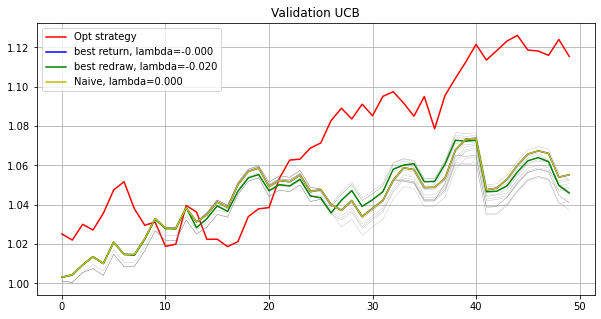

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[-0.      0.0401  0.0192  0.0018  0.0027  0.0011  0.0153  0.0301  0.026
 -0.      0.0093  0.     -0.      0.0038  0.      0.0062  0.0067  0.
  0.0083  0.001   0.0004  0.     -0.     -0.      0.0333  0.0099  0.0023
  0.0133  0.0128  0.0252  0.0009  0.0151  0.0183  0.0006  0.0224  0.0098
  0.0109  0.0036  0.0129  0.0003  0.      0.0143  0.0046 -0.      0.0067
  0.0249  0.0106  0.      0.0147 -0.     -0.      0.0012  0.0129 -0.
  0.0061  0.007   0.0109  0.0052  0.016   0.0014  0.022   0.0077  0.0007
  0.01    0.0157  0.0025  0.0378  0.0005  0.0249  0.002   0.0059  0.0021
  0.0152  0.0014 -0.      0.033   0.0099  0.0125  0.0209  0.001   0.0234
  0.0216  0.0197 -0.      0.0012  0.0124  0.0145  0.0277  0.0286  0.0094
  0.0092  0.0158  0.0307  0.001   0.      0.0056  0.011   0.0036  0.028
  0.0107]
8.047989378189843e-05
[-0.      0.0401  0.0192  0.0018  0.0027  0.0011  0.0153  0.0301  0.026
 -0.      0.0093  0.     -0.      0.0038  0.      0.0062  0.0067  0.
  0.0083  0.001   0.0004  0.      

[-0.      0.0392  0.0198  0.002   0.0016  0.      0.0045  0.0316  0.0282
 -0.      0.0092 -0.     -0.      0.0011  0.      0.0093  0.005  -0.
  0.0085  0.0001  0.0005  0.0006  0.     -0.      0.0342  0.0061  0.0021
  0.0124  0.0129  0.0264  0.0007  0.014   0.0216  0.0008  0.0213  0.0084
  0.0111  0.0002  0.0153  0.0008  0.0001  0.0134  0.0031 -0.      0.0044
  0.0271  0.0108 -0.      0.0161  0.      0.      0.0004  0.0135  0.0021
  0.0076  0.0075  0.0156  0.0045  0.0163  0.0006  0.0224  0.0074  0.001
  0.0103  0.0176  0.0018  0.0407 -0.      0.0268  0.0022  0.0044  0.0014
  0.0127 -0.     -0.      0.0356  0.0097  0.0108  0.0218 -0.      0.0261
  0.0218  0.0196  0.      0.0002  0.0111  0.0117  0.032   0.0302  0.0088
  0.0094  0.0183  0.0285  0.0003  0.0012  0.0038  0.0134  0.0029  0.03
  0.012 ]
6.885806338898488e-05
[-0.      0.0392  0.0198  0.002   0.0016 -0.      0.0045  0.0316  0.0282
 -0.      0.0093 -0.     -0.      0.0011  0.      0.0093  0.005   0.
  0.0085  0.0001  0.0005  0.00

[-0.      0.0371  0.0219  0.     -0.      0.      0.      0.026   0.0342
  0.      0.0126  0.     -0.      0.      0.      0.0086  0.0066  0.
  0.      0.     -0.      0.      0.      0.      0.0425  0.0003  0.0012
  0.0114  0.0129  0.0288 -0.      0.0078  0.0271  0.      0.0286  0.0057
  0.0119 -0.      0.0092  0.0011  0.0104  0.0202 -0.     -0.      0.
  0.0342  0.0033  0.      0.0205  0.     -0.      0.      0.0147  0.
  0.0059  0.0099  0.006   0.0023  0.0177  0.      0.0268  0.0019  0.004
  0.004   0.0261  0.      0.0446 -0.      0.0295  0.      0.0106  0.
  0.0096  0.0034  0.      0.0388  0.0077  0.0044  0.026   0.0027  0.0202
  0.0195  0.0207  0.      0.0046  0.006   0.008   0.0322  0.0282  0.008
  0.005   0.0241  0.0365 -0.      0.      0.      0.0141  0.001   0.0313
  0.0197]
9.972883267446403e-05
[ 0.      0.0382  0.022   0.0002  0.      0.     -0.      0.0261  0.0347
  0.      0.0128 -0.      0.     -0.      0.      0.0098  0.0062  0.
 -0.      0.      0.0002 -0.      0.     

[-0.      0.0349  0.023   0.0034 -0.     -0.     -0.      0.0328  0.041
 -0.      0.0072  0.0012 -0.      0.     -0.      0.0179  0.001   0.
 -0.     -0.      0.0159  0.0037  0.      0.      0.0464  0.     -0.
  0.0008  0.0123  0.0328  0.001   0.0046  0.032   0.      0.027   0.005
  0.0074  0.      0.0074 -0.      0.0003  0.0179  0.      0.     -0.
  0.0383  0.002   0.      0.0199  0.      0.0018  0.      0.0143  0.0062
  0.      0.0068  0.0036  0.0052  0.019   0.      0.0342  0.     -0.
 -0.      0.0189  0.003   0.0268  0.0017  0.0354 -0.      0.0109  0.
  0.0064 -0.      0.0084  0.0478  0.007   0.      0.0283  0.0066  0.0236
  0.0167  0.0233  0.      0.0033  0.0005  0.008   0.0363  0.0338  0.0075
  0.0001  0.0205  0.0289 -0.      0.     -0.      0.0155 -0.      0.0347
  0.0175]
0.00020977686748714142
[-0.      0.0349  0.023   0.0034 -0.      0.     -0.      0.0328  0.041
 -0.      0.0072  0.0012 -0.      0.     -0.      0.0179  0.001   0.
  0.     -0.      0.0159  0.0037  0.      0. 

[-0.      0.0349  0.023   0.0034  0.     -0.      0.      0.0328  0.041
  0.      0.0072  0.0012  0.     -0.      0.      0.0179  0.001   0.
  0.      0.      0.0159  0.0037  0.      0.      0.0464  0.      0.
  0.0008  0.0123  0.0328  0.001   0.0046  0.032   0.      0.027   0.005
  0.0074 -0.      0.0074 -0.      0.0003  0.0179  0.      0.     -0.
  0.0383  0.002   0.      0.0199 -0.      0.0018 -0.      0.0143  0.0062
 -0.      0.0068  0.0036  0.0052  0.019   0.      0.0342  0.      0.
  0.      0.0189  0.003   0.0268  0.0017  0.0355  0.      0.0109  0.
  0.0064  0.      0.0084  0.0479  0.007   0.      0.0283  0.0066  0.0236
  0.0167  0.0233  0.      0.0033  0.0005  0.008   0.0363  0.0338  0.0076
  0.0001  0.0205  0.0289 -0.     -0.     -0.      0.0155  0.      0.0347
  0.0175]
1.7400284855440935e-05
[-0.      0.0349  0.023   0.0034  0.     -0.      0.      0.0328  0.041
  0.      0.0072  0.0012  0.     -0.      0.      0.0179  0.001  -0.
  0.      0.      0.0159  0.0037  0.      0. 

[ 0.      0.0328  0.0236  0.0003  0.      0.      0.0074  0.0317  0.0431
 -0.      0.0056 -0.     -0.      0.0004  0.0016  0.0088 -0.      0.0005
  0.0008 -0.      0.0219  0.     -0.     -0.      0.047  -0.     -0.
  0.004   0.0117  0.0335  0.      0.0021  0.0348  0.      0.024   0.0046
  0.0055 -0.      0.0028 -0.      0.      0.0256  0.      0.0004  0.
  0.0396  0.0019  0.      0.0194  0.      0.0002 -0.      0.0137  0.0038
  0.0015  0.0045  0.0032  0.0048  0.0192  0.      0.0372  0.0015  0.
  0.      0.0174  0.0081  0.0194  0.0053  0.0377  0.      0.0071 -0.
  0.011  -0.      0.01    0.0499  0.0075  0.0007  0.0288  0.0052  0.0277
  0.0203  0.023  -0.      0.0046  0.      0.0024  0.0395  0.0353  0.0062
  0.      0.0211  0.0253  0.      0.0008  0.      0.0114  0.      0.0352
  0.0143]
0.0002290128738998758
[-0.      0.0328  0.0236  0.0003  0.     -0.      0.0074  0.0317  0.0431
  0.      0.0056 -0.     -0.      0.0004  0.0016  0.0088 -0.      0.0005
  0.0008  0.      0.0219  0.     -0

[ 0.      0.0338  0.024   0.0003  0.      0.0003  0.0086  0.0318  0.0443
 -0.      0.0042 -0.     -0.      0.      0.0003  0.0083  0.      0.
  0.001  -0.      0.0207  0.      0.      0.      0.0477  0.0003 -0.
  0.0046  0.0116  0.0343  0.      0.0017  0.0358  0.      0.0263  0.0043
  0.0065  0.      0.0007  0.0003 -0.      0.0269  0.      0.0015 -0.
  0.0408  0.0032  0.      0.0191  0.      0.      0.      0.014   0.0014
 -0.      0.0043  0.0022  0.0046  0.0204 -0.      0.0391  0.0015 -0.
 -0.      0.0164  0.0085  0.0171  0.0025  0.0388  0.0002  0.0071 -0.
  0.0103 -0.      0.0081  0.051   0.0075  0.0007  0.0286  0.0043  0.0262
  0.0184  0.0236  0.      0.0029  0.0001  0.0028  0.0397  0.0356  0.0068
 -0.      0.0211  0.0271 -0.      0.0002  0.      0.0132 -0.      0.0352
  0.0152]
0.00026821960827503797
[ 0.      0.0338  0.024   0.0003 -0.      0.0003  0.0086  0.0318  0.0443
  0.      0.0042 -0.     -0.      0.      0.0003  0.0083  0.      0.
  0.001  -0.      0.0207  0.      0.      

[-0.      0.0332  0.0244 -0.     -0.      0.0006  0.0024  0.0337  0.0462
 -0.      0.0016 -0.     -0.     -0.      0.      0.0079  0.      0.
  0.      0.0007  0.0185  0.      0.      0.      0.0501  0.      0.0017
  0.0048  0.0118  0.0342 -0.      0.0007  0.035  -0.      0.0276  0.0045
  0.0076 -0.      0.0018  0.     -0.      0.0285 -0.      0.0012 -0.
  0.0393  0.0045 -0.      0.0185 -0.     -0.     -0.      0.014  -0.
  0.      0.0043  0.0032  0.0041  0.0194 -0.      0.041   0.0001 -0.
  0.0012  0.0165  0.0091  0.0145  0.0058  0.0391  0.0011  0.0079 -0.
  0.0104 -0.      0.0083  0.051   0.0075  0.      0.0277  0.0029  0.0266
  0.0182  0.0244 -0.      0.0018  0.      0.0004  0.0409  0.0361  0.0065
  0.0021  0.0218  0.0282  0.0002  0.      0.      0.0101  0.      0.0369
  0.0156]
6.4603692990114e-05
[-0.      0.0332  0.0244  0.      0.      0.0006  0.0024  0.0337  0.0462
  0.      0.0016  0.      0.     -0.      0.      0.0079 -0.      0.
  0.      0.0007  0.0185  0.      0.      0. 

[ 0.      0.0332  0.0245  0.0001  0.      0.0006  0.0024  0.0337  0.0462
 -0.      0.0016 -0.     -0.     -0.      0.      0.0079  0.     -0.
  0.      0.0007  0.0185  0.      0.      0.      0.0501 -0.      0.0017
  0.0048  0.0118  0.0342 -0.      0.0007  0.035  -0.      0.0276  0.0045
  0.0076 -0.      0.0018 -0.     -0.      0.0285 -0.      0.0012  0.
  0.0393  0.0045  0.      0.0185 -0.     -0.     -0.      0.014  -0.
 -0.      0.0043  0.0032  0.0041  0.0194 -0.      0.041   0.0001 -0.
  0.0013  0.0165  0.0091  0.0145  0.0058  0.0391  0.0011  0.0079 -0.
  0.0104 -0.      0.0083  0.051   0.0075  0.      0.0277  0.0029  0.0266
  0.0182  0.0244 -0.      0.0018  0.      0.0004  0.0408  0.0361  0.0065
  0.0021  0.0218  0.0282  0.0002 -0.      0.      0.0101 -0.      0.0369
  0.0156]
1.8461359773225488e-05
[ 0.      0.0332  0.0245  0.0001  0.      0.0006  0.0024  0.0337  0.0462
  0.      0.0016  0.      0.      0.     -0.      0.0079  0.      0.
  0.      0.0007  0.0185  0.      0.     -

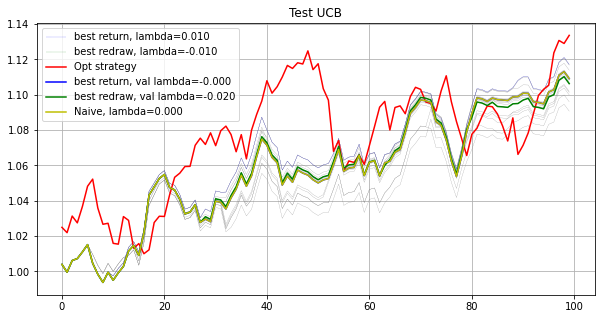

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[0.0054 0.0108 0.0153 0.0105 0.0068 0.0092 0.008  0.01   0.0087 0.0102
 0.0109 0.0091 0.0093 0.0097 0.0027 0.0136 0.0083 0.0105 0.0089 0.0088
 0.0138 0.0096 0.011  0.0096 0.0118 0.0135 0.0117 0.011  0.0095 0.0109
 0.0099 0.0097 0.0081 0.0076 0.0109 0.0087 0.0096 0.0087 0.0106 0.0104
 0.0095 0.0071 0.0115 0.01   0.0066 0.0093 0.0137 0.0067 0.0022 0.0091
 0.01   0.0182 0.0095 0.0114 0.0118 0.0107 0.0074 0.0117 0.0122 0.0116
 0.0122 0.0097 0.0087 0.0113 0.01   0.0091 0.009  0.008  0.008  0.0054
 0.0074 0.0106 0.0092 0.0149 0.0128 0.0074 0.0126 0.0097 0.0163 0.0073
 0.0089 0.0125 0.0132 0.0109 0.0064 0.0095 0.0103 0.0089 0.0095 0.0106
 0.015  0.0111 0.01   0.0088 0.0073 0.0128 0.0098 0.0105 0.0111 0.01  ]
0.17750430952367907
[ 0.0003  0.0112  0.0126  0.0102  0.0065  0.0076  0.007   0.0098  0.008
  0.0104  0.0118  0.0106  0.0115  0.0111 -0.      0.0163  0.0096  0.011
  0.0083  0.0083  0.0126  0.008   0.0084  0.0

[0.     0.0117 0.0145 0.01   0.007  0.0075 0.008  0.0097 0.0074 0.0103
 0.0122 0.0103 0.0115 0.009  0.0011 0.0175 0.0087 0.011  0.0083 0.0081
 0.0126 0.0095 0.0073 0.0077 0.0111 0.0153 0.0117 0.012  0.0064 0.0127
 0.0087 0.0102 0.0099 0.0046 0.0132 0.0037 0.0076 0.0059 0.012  0.008
 0.0088 0.0053 0.0087 0.0107 0.0055 0.0094 0.0183 0.007  0.0014 0.0115
 0.0103 0.0204 0.0081 0.0109 0.0087 0.0129 0.0031 0.0144 0.017  0.0134
 0.0146 0.0111 0.0061 0.0103 0.0107 0.007  0.0052 0.0055 0.006  0.0029
 0.0041 0.0136 0.0081 0.0205 0.0144 0.0107 0.0166 0.0084 0.0184 0.0078
 0.0088 0.0117 0.0167 0.0123 0.0048 0.0124 0.0093 0.0108 0.0096 0.0116
 0.0126 0.0128 0.0103 0.0113 0.0055 0.0139 0.0078 0.0104 0.0121 0.013 ]
7.896670772072342e-05
[-0.      0.0134  0.015   0.0091  0.0043  0.0102  0.0058  0.0098  0.0067
  0.0107  0.0124  0.0098  0.0125  0.005   0.0075  0.0175  0.0073  0.0113
  0.0098  0.0091  0.0076  0.013   0.0081  0.0077  0.0122  0.0139  0.0107
  0.0128  0.0055  0.0143  0.0081  0.0084  0.01   

[-0.      0.0155  0.0192  0.0092 -0.      0.0074  0.0031  0.0078  0.0045
  0.011   0.011   0.0078  0.0122  0.0015  0.0084  0.022   0.0035  0.0118
  0.0041  0.0082  0.0069  0.016   0.0068  0.0054  0.0106  0.0214  0.0126
  0.0155  0.0033  0.0193  0.0037  0.0085  0.0072  0.0024  0.0134  0.0028
  0.0055  0.0055  0.0183  0.0203  0.007   0.      0.0034  0.0125 -0.
  0.0122  0.0262  0.0008  0.0044  0.0131  0.0108  0.0224  0.0052  0.0102
  0.0037  0.0143  0.0077  0.0197  0.0244  0.0215  0.0142  0.0144 -0.
  0.0169  0.0119  0.0023  0.      0.      0.003  -0.      0.002   0.0242
  0.0058  0.0286  0.0172  0.0098  0.0145  0.0093  0.0156  0.0044  0.0081
  0.0111  0.0224  0.0177  0.0035  0.0078  0.0097  0.0072  0.0076  0.0205
  0.0076  0.0173 -0.      0.0084  0.0048  0.0086  0.0047  0.0193  0.0136
  0.0129]
0.00012984386304576757
[-0.      0.0155  0.0192  0.0092 -0.      0.0074  0.0031  0.0078  0.0045
  0.011   0.011   0.0078  0.0122  0.0015  0.0084  0.022   0.0035  0.0118
  0.0041  0.0082  0.0069  

[-0.      0.0154  0.0192  0.0092 -0.      0.0073  0.0031  0.0078  0.0045
  0.011   0.011   0.0078  0.0122  0.0015  0.0084  0.022   0.0035  0.0118
  0.0041  0.0082  0.0069  0.016   0.0068  0.0054  0.0106  0.0214  0.0126
  0.0155  0.0033  0.0193  0.0037  0.0085  0.0072  0.0024  0.0134  0.0028
  0.0055  0.0055  0.0183  0.0203  0.007   0.      0.0034  0.0125  0.
  0.0122  0.0262  0.0008  0.0044  0.0131  0.0108  0.0224  0.0052  0.0102
  0.0037  0.0143  0.0077  0.0197  0.0244  0.0215  0.0142  0.0144  0.
  0.0169  0.0119  0.0023  0.0001  0.      0.003   0.      0.002   0.0242
  0.0058  0.0286  0.0172  0.0098  0.0145  0.0093  0.0156  0.0044  0.0081
  0.0111  0.0224  0.0177  0.0035  0.0078  0.0097  0.0072  0.0076  0.0205
  0.0076  0.0173 -0.      0.0084  0.0048  0.0086  0.0047  0.0193  0.0136
  0.0129]
1.936810836624145e-05
[ 0.      0.0154  0.0192  0.0092 -0.      0.0073  0.0031  0.0078  0.0045
  0.011   0.011   0.0078  0.0122  0.0015  0.0083  0.022   0.0035  0.0118
  0.0041  0.0082  0.0069  0

[-0.      0.0168  0.0189  0.0093  0.      0.0071  0.0026  0.0078  0.0034
  0.0108  0.0109  0.009   0.012   0.0013  0.0007  0.0244  0.002   0.0119
  0.0043  0.0079  0.0064  0.0145  0.0039  0.0044  0.0094  0.0239  0.0149
  0.0165  0.0022  0.0201  0.0053  0.0104  0.0058  0.0003  0.0161  0.0009
  0.003   0.0048  0.019   0.0221  0.0065  0.      0.0024  0.0131  0.
  0.0127  0.027   0.0006  0.0032  0.0178  0.0118  0.0217  0.004   0.0088
  0.0038  0.0148  0.0075  0.0183  0.0268  0.0224  0.0134  0.014  -0.
  0.0195  0.0098  0.0011  0.     -0.      0.0033 -0.      0.0042  0.0225
  0.0046  0.0288  0.0175  0.0102  0.0137  0.0089  0.0128  0.0019  0.008
  0.0101  0.0239  0.0195  0.0033  0.0066  0.0089  0.0091  0.0065  0.0227
  0.0095  0.0184  0.0035  0.0076  0.0053  0.0101  0.0028  0.0193  0.0154
  0.0147]
1.9491895814168925e-05
[-0.      0.0168  0.0189  0.0093  0.      0.0071  0.0026  0.0078  0.0034
  0.0108  0.0109  0.009   0.012   0.0013  0.0007  0.0244  0.002   0.0119
  0.0043  0.0079  0.0064  0

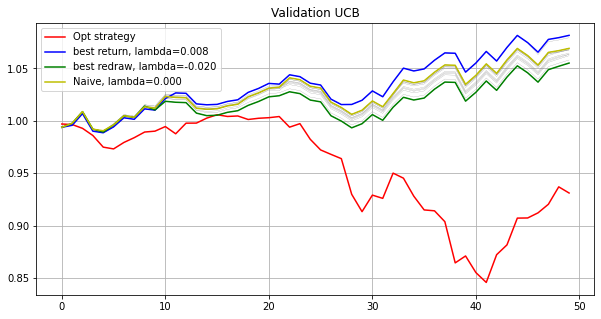

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[-0.      0.014   0.0068  0.011   0.0066  0.0089  0.0026  0.0104  0.0081
  0.0107  0.0116  0.0198  0.0048  0.0058  0.0027  0.0259  0.0064  0.0108
  0.0084  0.0086  0.0053  0.0151  0.0094  0.0082  0.0127  0.0164  0.0113
  0.0134  0.0073  0.0168  0.0077  0.0123  0.0182  0.0032  0.0065  0.008
  0.0103  0.0103  0.0138  0.0101  0.009   0.0011  0.0087  0.0123  0.0031
  0.0207  0.016   0.0001  0.0042  0.0109  0.0115  0.0222  0.0073  0.0076
  0.0124  0.0194  0.0001  0.0167  0.015   0.0017  0.0161  0.0116  0.0028
  0.0144  0.0067  0.0093  0.0036  0.013   0.0099  0.0014  0.007   0.0146
  0.0082  0.0216  0.0065  0.0045  0.007   0.011   0.004   0.0037  0.0094
  0.007   0.0176  0.0135  0.0072  0.0044  0.0108  0.0109  0.0098  0.0203
  0.0173  0.0138  0.0128  0.0107  0.0069  0.0108  0.0079  0.0105  0.0103
  0.0113]
0.03149626224533066
[-0.      0.014   0.0068  0.011   0.0066  0.0089  0.0026  0.0104  0.0081
  0.0107  0.0116  0.0198  0.0048  0.0058  0.0027  0.0259  0.0064  0.0108
  0.0084  0.0086  0.00

[ 0.      0.0141  0.0109  0.0113  0.0019  0.0087  0.0008  0.0101  0.0065
  0.011   0.011   0.0194  0.0058  0.0113  0.0011  0.0293  0.0043  0.0114
  0.0071  0.0087  0.0044  0.0187  0.0069  0.0083  0.0113  0.0196  0.0118
  0.0143  0.0058  0.0194  0.0067  0.0105  0.0175  0.0009  0.0114  0.0039
  0.0073  0.0087  0.0156  0.0144  0.008  -0.      0.0083  0.0129  0.0032
  0.0214  0.0193  0.0004  0.0053  0.0105  0.0121  0.0233  0.0051  0.0097
  0.0088  0.0175  0.0004  0.0181  0.0176 -0.      0.0175  0.015  -0.
  0.0145  0.0066  0.0076  0.002   0.0052  0.007   0.      0.0087  0.0153
  0.0069  0.026   0.0062  0.      0.0068  0.0108  0.0031  0.0057  0.0109
  0.0049  0.0208  0.016   0.0058  0.0023  0.0132  0.0088  0.008   0.0244
  0.0208  0.016   0.0134  0.0095  0.0054  0.0099  0.0071  0.0134  0.0078
  0.0126]
0.00015308989177542515
[ 0.      0.0141  0.0109  0.0113  0.0019  0.0087  0.0008  0.0101  0.0065
  0.011   0.011   0.0194  0.0058  0.0113  0.0011  0.0293  0.0043  0.0114
  0.0071  0.0087  0.00

[ 0.      0.0141  0.0109  0.0113  0.0019  0.0086  0.0008  0.0101  0.0065
  0.011   0.011   0.0194  0.0059  0.0113  0.0011  0.0293  0.0043  0.0113
  0.0071  0.0087  0.0044  0.0187  0.007   0.0083  0.0113  0.0195  0.0118
  0.0143  0.0058  0.0194  0.0067  0.0105  0.0174  0.001   0.0115  0.0039
  0.0073  0.0087  0.0157  0.0144  0.008  -0.      0.0083  0.0129  0.0032
  0.0214  0.0192  0.0005  0.0053  0.0105  0.0121  0.0233  0.0051  0.0097
  0.0088  0.0175  0.0004  0.0181  0.0176 -0.      0.0175  0.015   0.
  0.0145  0.0066  0.0076  0.002   0.0053  0.007   0.0001  0.0087  0.0153
  0.0069  0.026   0.0062 -0.      0.0068  0.0108  0.0031  0.0057  0.011
  0.0049  0.0208  0.016   0.0058  0.0023  0.0132  0.0088  0.008   0.0243
  0.0208  0.016   0.0134  0.0095  0.0054  0.0099  0.0071  0.0134  0.0078
  0.0126]
5.673878972199765e-05
[-0.      0.0141  0.0109  0.0113  0.0019  0.0086  0.0008  0.0101  0.0065
  0.011   0.011   0.0194  0.0059  0.0113  0.0011  0.0293  0.0043  0.0113
  0.0071  0.0087  0.0044

[-0.      0.0141  0.0109  0.0113  0.0019  0.0086  0.0008  0.01    0.0065
  0.011   0.011   0.0195  0.0059  0.0113  0.0011  0.0293  0.0043  0.0113
  0.0071  0.0087  0.0044  0.0186  0.007   0.0083  0.0113  0.0195  0.0118
  0.0143  0.0058  0.0194  0.0067  0.0105  0.0174  0.001   0.0115  0.0039
  0.0073  0.0087  0.0157  0.0144  0.008   0.      0.0083  0.0129  0.0032
  0.0214  0.0192  0.0005  0.0053  0.0105  0.0121  0.0233  0.0051  0.0097
  0.0088  0.0175  0.0004  0.0181  0.0176  0.      0.0176  0.015   0.
  0.0145  0.0066  0.0076  0.002   0.0053  0.007   0.0001  0.0087  0.0153
  0.0069  0.026   0.0062 -0.      0.0068  0.0108  0.0031  0.0057  0.011
  0.0049  0.0207  0.016   0.0058  0.0023  0.0132  0.0088  0.008   0.0243
  0.0208  0.016   0.0134  0.0095  0.0054  0.0099  0.0071  0.0134  0.0078
  0.0126]
2.4419486661847002e-05
[-0.      0.0141  0.0109  0.0113  0.0019  0.0086  0.0008  0.01    0.0065
  0.011   0.011   0.0195  0.0059  0.0113  0.0011  0.0293  0.0043  0.0113
  0.0071  0.0087  0.004

[-0.      0.0152  0.0143  0.0094  0.0097  0.0076  0.0024  0.0094  0.0056
  0.01    0.0084  0.0181  0.0048  0.0094  0.      0.0303  0.0041  0.0108
  0.0026  0.0071  0.0068  0.0138  0.0047  0.0072  0.0102  0.0202  0.0119
  0.0154  0.0048  0.0209  0.0037  0.0094  0.0164  0.0031  0.0141  0.0023
  0.005   0.0059  0.0169  0.0148  0.0075  0.0004  0.0082  0.0129  0.0021
  0.0198  0.0184  0.0077  0.0015  0.009   0.0119  0.0308  0.0036  0.0123
  0.0063  0.0182 -0.      0.0177  0.0159  0.0012  0.0151  0.0169  0.
  0.016   0.0077  0.0065  0.0003  0.001   0.0059  0.0171  0.0067  0.0231
  0.0064  0.0232  0.0067 -0.      0.0058  0.0117  0.003   0.0128  0.0112
  0.0057  0.0211  0.0178  0.0058  0.0023  0.0132  0.0071  0.0062  0.0241
  0.0181  0.0178  0.0115  0.0077  0.003   0.0081  0.0095  0.0151  0.0039
  0.0123]
0.17920768513348942
[-0.      0.0152  0.0143  0.0094  0.0097  0.0076  0.0024  0.0094  0.0056
  0.01    0.0084  0.0181  0.0048  0.0094  0.      0.0303  0.0041  0.0108
  0.0026  0.0071  0.0068 

[-0.      0.0152  0.0143  0.0094  0.0097  0.0076  0.0024  0.0094  0.0056
  0.01    0.0084  0.0181  0.0048  0.0094  0.      0.0303  0.0041  0.0108
  0.0026  0.0071  0.0068  0.0138  0.0047  0.0072  0.0102  0.0202  0.0119
  0.0154  0.0048  0.0209  0.0037  0.0094  0.0164  0.003   0.0141  0.0024
  0.005   0.0059  0.0169  0.0148  0.0075  0.0004  0.0082  0.0129  0.0021
  0.0198  0.0184  0.0077  0.0015  0.009   0.0119  0.0308  0.0036  0.0123
  0.0063  0.0182 -0.      0.0177  0.0159  0.0012  0.0151  0.0169 -0.
  0.016   0.0077  0.0065  0.0003  0.001   0.0059  0.0171  0.0067  0.0231
  0.0064  0.0232  0.0067  0.      0.0058  0.0117  0.003   0.0128  0.0112
  0.0057  0.0211  0.0178  0.0058  0.0023  0.0132  0.0071  0.0062  0.0241
  0.0181  0.0178  0.0115  0.0077  0.003   0.0081  0.0095  0.0151  0.0039
  0.0123]
7.271292921296011e-06
[-0.      0.0152  0.0143  0.0094  0.0097  0.0076  0.0024  0.0094  0.0056
  0.01    0.0084  0.0181  0.0048  0.0094  0.      0.0303  0.0041  0.0108
  0.0026  0.0071  0.006

[ 0.      0.0156  0.0145  0.0091  0.0093  0.0072  0.0013  0.0093  0.0053
  0.0101  0.008   0.0179  0.0051  0.0086 -0.      0.0305  0.0039  0.0108
  0.0024  0.0067  0.0089  0.0131  0.0042  0.0065  0.0099  0.022   0.0121
  0.0156  0.0045  0.0215  0.0031  0.0093  0.016   0.0022  0.015   0.0019
  0.0042  0.0049  0.0172  0.0137  0.0074  0.0007  0.0066  0.0132  0.0011
  0.0227  0.0195  0.0091  0.001   0.0092  0.012   0.0315  0.0035  0.0111
  0.0062  0.0176 -0.      0.0182  0.0164  0.0003  0.0156  0.0167  0.
  0.0164  0.0079  0.0061 -0.      0.0003  0.0054  0.0168  0.0067  0.0239
  0.0061  0.0241  0.0065  0.      0.0049  0.0124  0.0025  0.0133  0.0116
  0.0064  0.0216  0.0182  0.005   0.0021  0.0136  0.0076  0.0059  0.0251
  0.019   0.0182  0.014   0.0071  0.0025  0.0078  0.0092  0.0152  0.0034
  0.0121]
1.7308300041939235e-05
[ 0.      0.0156  0.0145  0.0091  0.0093  0.0072  0.0013  0.0093  0.0053
  0.0101  0.008   0.0179  0.0051  0.0086  0.      0.0305  0.0039  0.0108
  0.0024  0.0067  0.00

[-0.      0.0156  0.0145  0.0091  0.0093  0.0072  0.0013  0.0093  0.0053
  0.0101  0.008   0.0179  0.0051  0.0086  0.      0.0305  0.0039  0.0108
  0.0024  0.0067  0.0089  0.0131  0.0042  0.0065  0.0099  0.022   0.0121
  0.0156  0.0045  0.0215  0.0031  0.0093  0.016   0.0022  0.015   0.0019
  0.0042  0.0049  0.0172  0.0137  0.0074  0.0007  0.0066  0.0132  0.0011
  0.0227  0.0195  0.0091  0.001   0.0092  0.012   0.0315  0.0035  0.0111
  0.0062  0.0176 -0.      0.0182  0.0164  0.0003  0.0156  0.0167  0.
  0.0164  0.0079  0.0061 -0.      0.0003  0.0054  0.0168  0.0067  0.0239
  0.0061  0.0241  0.0065 -0.      0.0049  0.0124  0.0025  0.0133  0.0116
  0.0064  0.0216  0.0182  0.005   0.0021  0.0136  0.0076  0.0059  0.0251
  0.019   0.0182  0.014   0.0071  0.0025  0.0078  0.0092  0.0152  0.0034
  0.0121]
2.8429536733058082e-06
[ 0.0003  0.0155  0.0149  0.0088  0.0094  0.0074  0.      0.0093  0.0053
  0.0102  0.0076  0.0184  0.0049  0.0098  0.      0.0303  0.004   0.0107
  0.0024  0.0068  0.01

[ 0.0008  0.0158  0.0157  0.0087  0.0088  0.0072 -0.      0.0091  0.005
  0.0102  0.0074  0.018   0.0038  0.0087 -0.      0.0307  0.0037  0.0108
  0.002   0.0065  0.0151  0.0124  0.0035  0.0063  0.0095  0.0231  0.0132
  0.0161  0.0039  0.0222  0.0025  0.0094  0.016   0.0013  0.0157  0.0014
  0.0045  0.0054  0.0176  0.0141  0.0072  0.0006  0.0066  0.0135  0.0009
  0.0232  0.019   0.009   0.0007  0.0085  0.0113  0.0313  0.0034  0.0113
  0.0059  0.0173  0.      0.0177  0.0161  0.0009  0.0143  0.0181  0.
  0.0173  0.0086  0.0055  0.      0.      0.005   0.0128  0.0065  0.0252
  0.0059  0.0246  0.0066 -0.      0.005   0.0121  0.0035  0.0145  0.0122
  0.0065  0.022   0.0188  0.004   0.0015  0.0142  0.0078  0.0056  0.0252
  0.0195  0.019   0.0128  0.0066  0.0018  0.008   0.0069  0.0164  0.0031
  0.0116]
2.891619473940196e-05
[ 0.0008  0.0158  0.0157  0.0087  0.0088  0.0072 -0.      0.0091  0.005
  0.0102  0.0074  0.018   0.0038  0.0087 -0.      0.0307  0.0037  0.0108
  0.002   0.0065  0.0151 

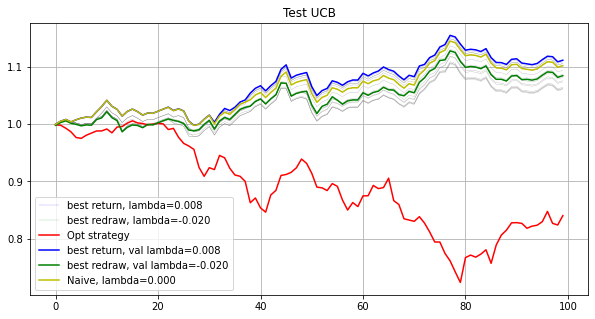

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[0.019  0.0093 0.0114 0.003  0.0086 0.0121 0.0096 0.0106 0.0094 0.0091
 0.008  0.0154 0.0095 0.0106 0.0058 0.0093 0.0107 0.0054 0.0128 0.0088
 0.0117 0.0133 0.008  0.0162 0.0083 0.0125 0.0149 0.0099 0.0121 0.0102
 0.0099 0.0058 0.0084 0.0118 0.0157 0.0127 0.0053 0.0097 0.0094 0.0098
 0.0096 0.0084 0.0059 0.0095 0.0098 0.0062 0.0116 0.0138 0.0078 0.0078
 0.0171 0.009  0.0093 0.0103 0.0054 0.011  0.0102 0.0125 0.0115 0.0048
 0.0073 0.012  0.0092 0.0143 0.0057 0.0151 0.0098 0.0115 0.0102 0.0125
 0.0054 0.0113 0.0089 0.0064 0.0069 0.0099 0.0108 0.0075 0.0146 0.0097
 0.0077 0.0131 0.0064 0.0098 0.0089 0.0071 0.0046 0.0117 0.0085 0.0073
 0.0096 0.0087 0.0087 0.0089 0.0105 0.0206 0.0098 0.0121 0.0088 0.0129]
0.22942739230109138
[0.019  0.0093 0.0114 0.003  0.0086 0.0121 0.0096 0.0106 0.0094 0.0091
 0.008  0.0154 0.0095 0.0106 0.0058 0.0093 0.0107 0.0054 0.0128 0.0088
 0.0117 0.0133 0.008  0.0162 0.0083 0.0125 0.01

[ 0.0142  0.0052  0.0134  0.      0.0066  0.0175  0.0089  0.0119  0.0085
  0.0073  0.0037  0.0099  0.0081  0.0083  0.0058  0.0083  0.0083  0.0003
  0.0155  0.0042  0.0147  0.0133  0.0078  0.0199  0.0062  0.0136  0.0147
  0.0118  0.0147  0.0088  0.0088  0.0028  0.0092  0.0094  0.0225  0.0157
  0.0079  0.0071  0.0095  0.0084  0.0101  0.0087  0.0061  0.0083  0.012
  0.0028  0.0136  0.016   0.0051  0.0122  0.0221  0.007   0.0075  0.0135
  0.0184  0.0092  0.0095  0.0135  0.0126  0.0033  0.0055  0.0262  0.0117
  0.0129  0.0056  0.0204  0.0104  0.0117  0.0116  0.011   0.0032  0.0141
  0.0056  0.0057  0.0085  0.0099  0.0107 -0.      0.0135  0.0126  0.0055
  0.0088  0.0043  0.0086  0.0099  0.0071  0.0045  0.0109  0.0049  0.0076
  0.0099  0.0075  0.0106  0.0112  0.01    0.015   0.0112  0.0114  0.0109
  0.0145]
5.986670769306331e-05
[ 0.0142  0.0052  0.0134  0.      0.0066  0.0175  0.0089  0.0119  0.0085
  0.0073  0.0037  0.0099  0.0081  0.0083  0.0058  0.0083  0.0083  0.0003
  0.0155  0.0042  0.

[ 0.0162  0.0016  0.0144 -0.      0.0044  0.0169  0.0049  0.0115  0.0074
  0.0057  0.      0.0088  0.0067  0.0052  0.0069  0.0058  0.0118 -0.
  0.0156  0.0026  0.0185  0.0105  0.0073  0.0252  0.0042  0.0109  0.0169
  0.0128  0.0177  0.0068  0.0078  0.0022  0.0044  0.0088  0.0263  0.0219
  0.0047  0.0092  0.0078  0.0057  0.0117  0.0092  0.0035  0.0052  0.0084
  0.0058  0.0197  0.0154  0.0017  0.0161  0.0288  0.0065  0.0047  0.0133
  0.0214  0.0086  0.0075  0.0134  0.0126 -0.      0.0037  0.0371  0.0122
  0.0126  0.0063  0.0258  0.0101  0.0091  0.0127  0.0098  0.0042  0.0131
  0.0073  0.0035  0.0084  0.0095  0.007  -0.      0.0128  0.0132  0.0134
  0.0072  0.0074  0.0082  0.0169  0.0038  0.0054  0.01    0.0043  0.0098
  0.0099  0.0063  0.01    0.0137  0.0099  0.0198  0.002   0.0094  0.0113
  0.0138]
0.00012845866284631486
[ 0.0162  0.0016  0.0144  0.      0.0044  0.0169  0.0049  0.0115  0.0074
  0.0057 -0.      0.0088  0.0067  0.0052  0.0069  0.0058  0.0118  0.
  0.0156  0.0026  0.0185  

[ 0.0162  0.0016  0.0144  0.0001  0.0044  0.0169  0.0048  0.0115  0.0074
  0.0057  0.      0.0088  0.0067  0.0052  0.0069  0.0058  0.0118  0.
  0.0156  0.0026  0.0185  0.0105  0.0073  0.0252  0.0042  0.0109  0.017
  0.0128  0.0177  0.0068  0.0078  0.0022  0.0044  0.0088  0.0263  0.0219
  0.0047  0.0092  0.0078  0.0057  0.0117  0.0092  0.0035  0.0052  0.0084
  0.0058  0.0197  0.0154  0.0017  0.0161  0.0288  0.0065  0.0047  0.0133
  0.0214  0.0086  0.0074  0.0134  0.0126 -0.      0.0037  0.0371  0.0122
  0.0126  0.0063  0.0258  0.0101  0.0091  0.0127  0.0098  0.0042  0.0131
  0.0073  0.0035  0.0084  0.0095  0.007   0.      0.0128  0.0132  0.0134
  0.0072  0.0074  0.0082  0.0169  0.0038  0.0054  0.01    0.0043  0.0097
  0.01    0.0063  0.01    0.0137  0.0099  0.0198  0.002   0.0094  0.0113
  0.0138]
2.9792761242013956e-05
[ 0.0162  0.0016  0.0144  0.0001  0.0044  0.0169  0.0048  0.0115  0.0074
  0.0057  0.      0.0088  0.0067  0.0052  0.0069  0.0058  0.0118  0.
  0.0156  0.0026  0.0185  0

[ 0.0156  0.0006  0.0143  0.      0.0035  0.0181  0.005   0.0098  0.0071
  0.0049 -0.      0.0083  0.0058  0.004   0.0056  0.0054  0.0152 -0.
  0.0159 -0.      0.0202  0.0126  0.007   0.0282  0.0033  0.0094  0.0175
  0.0135  0.02    0.0078  0.0076  0.0019  0.0019  0.0072  0.0319  0.0246
  0.0014  0.0082  0.0107  0.0067  0.0132  0.0085  0.0008  0.0038  0.0077
  0.0009  0.0207  0.017   0.      0.0177  0.0316  0.0052  0.0039  0.016
  0.0236  0.0066  0.007   0.0167  0.0131  0.0002  0.0029  0.0398  0.0117
  0.0119  0.0057  0.0265  0.0123  0.0088  0.0111  0.0084  0.004   0.0152
  0.0068  0.0054  0.0098  0.0087  0.0053  0.0009  0.0142  0.0134  0.0143
  0.0104  0.0062  0.0091  0.0173  0.0004  0.004   0.0095  0.0022  0.0083
  0.0088  0.0057  0.0064  0.0156  0.0092  0.0198 -0.      0.0107  0.0115
  0.0136]
4.739768126105693e-05
[ 0.0156  0.0006  0.0143  0.      0.0035  0.0181  0.005   0.0098  0.0071
  0.0049  0.      0.0083  0.0058  0.004   0.0056  0.0054  0.0152 -0.
  0.0159 -0.      0.0202  0.

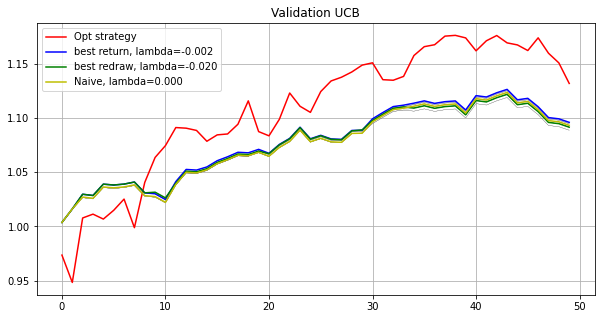

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[ 0.0114  0.0071  0.0144 -0.      0.0059  0.0123  0.0072  0.0073  0.0076
  0.0065  0.0055  0.0103  0.0109  0.0021  0.0081  0.0071  0.0212  0.
  0.0118  0.0026  0.0188  0.0096  0.01    0.0154  0.0051  0.0047  0.0144
  0.0133  0.016   0.0123  0.0081  0.0064  0.0028  0.0076  0.0153  0.0151
  0.0035  0.0037  0.0102  0.0076  0.0109  0.0074  0.0067  0.0058  0.0109
  0.0139  0.0103  0.0079  0.0049  0.0028  0.0191  0.0068  0.0097  0.0134
  0.0161  0.0088  0.006   0.0224  0.006   0.0041  0.0122  0.0249  0.0083
  0.0141  0.0048  0.0271  0.0116  0.0097  0.0109  0.0048  0.0015  0.0147
  0.0098  0.017   0.0094  0.0077  0.0062  0.0049  0.0105  0.0169  0.0189
  0.0095  0.0111  0.0101  0.0256  0.0043  0.0057  0.009   0.0129  0.0069
  0.0083  0.0069  0.0103  0.0138  0.0098  0.0186  0.0032  0.0123  0.0111
  0.0113]
0.09957797978847596
[ 0.0114  0.0071  0.0144 -0.      0.0059  0.0123  0.0072  0.0073  0.0076
  0.0065  0.0055  0.0103  0.0109  0.0021  0.0081  0.0071  0.0212 -0.
  0.0118  0.0026  0.0188  0.0

[ 0.0135  0.0025  0.0155  0.      0.0039  0.0141  0.0046  0.0071  0.0065
  0.005  -0.      0.0086  0.0094  0.0004  0.0042  0.0057  0.0255  0.
  0.0118  0.0037  0.023   0.0137  0.0115  0.0167  0.0035  0.0012  0.0171
  0.0134  0.0193  0.0133  0.0074  0.0037  0.0004  0.0085  0.0148  0.017
 -0.      0.0057  0.0093  0.0061  0.012   0.0065  0.0034  0.004   0.014
  0.0167  0.0122  0.0096  0.0016  0.0067  0.0207  0.006   0.0109  0.0161
  0.0133  0.0106  0.0051  0.0198  0.0063  0.      0.0085  0.0297  0.0084
  0.014   0.0069  0.0345  0.0154  0.0091  0.0097  0.0086  0.      0.0147
  0.0077  0.0175  0.0086  0.0068  0.0029  0.0066  0.0075  0.018   0.0203
  0.0107  0.0079  0.0047  0.0321  0.0028 -0.      0.009   0.0109  0.0095
  0.0084  0.0054  0.0135  0.0128  0.0102  0.0192  0.0039  0.0145  0.0148
  0.0114]
0.04724408111598488
[ 0.0135  0.0025  0.0155  0.      0.0039  0.0141  0.0046  0.0071  0.0065
  0.005  -0.      0.0086  0.0094  0.0004  0.0042  0.0057  0.0255  0.
  0.0118  0.0037  0.023   0.013

[ 0.0108  0.      0.0163 -0.      0.0027  0.0163  0.0035  0.0066  0.0059
  0.0041 -0.      0.0053  0.0087 -0.      0.0046  0.0044  0.0305 -0.
  0.0128  0.0018  0.0251  0.0152  0.0125  0.018   0.0023  0.      0.0181
  0.0143  0.0211  0.0133  0.0069  0.0014 -0.      0.0086  0.0146  0.0196
  0.0014  0.0043  0.009   0.0059  0.0107  0.0057  0.0025  0.0027  0.0139
  0.0172  0.0153  0.0126  0.0006  0.0076  0.0234  0.0063  0.01    0.0178
  0.014   0.0112  0.0048  0.0191  0.0066 -0.      0.0069  0.0309  0.0086
  0.0143  0.0042  0.0369  0.017   0.0098  0.0068  0.0071  0.0012  0.0142
  0.0069  0.0176  0.0094  0.0066  0.0029  0.0071  0.0057  0.0187  0.0204
  0.0079  0.005   0.006   0.032   0.0016  0.0001  0.0082  0.0124  0.0108
  0.0086  0.0048  0.0136  0.0149  0.0103  0.0203  0.0016  0.0154  0.0146
  0.0109]
0.00018229132033738857
[ 0.0108 -0.      0.0163 -0.      0.0027  0.0163  0.0035  0.0067  0.0059
  0.0041 -0.      0.0053  0.0087  0.      0.0046  0.0044  0.0305  0.
  0.0128  0.0017  0.0251  

[ 0.0108  0.      0.0163 -0.      0.0027  0.0163  0.0035  0.0066  0.0059
  0.0041  0.      0.0053  0.0087  0.      0.0046  0.0044  0.0305  0.
  0.0128  0.0017  0.0251  0.0152  0.0125  0.018   0.0023  0.      0.0181
  0.0143  0.0212  0.0133  0.0069  0.0014  0.      0.0086  0.0146  0.0196
  0.0014  0.0043  0.009   0.0059  0.0107  0.0057  0.0025  0.0027  0.0139
  0.0172  0.0153  0.0126  0.0006  0.0076  0.0234  0.0063  0.01    0.0179
  0.014   0.0112  0.0048  0.0191  0.0066  0.      0.0069  0.0309  0.0086
  0.0143  0.0041  0.0369  0.017   0.0098  0.0068  0.0071  0.0012  0.0142
  0.0069  0.0176  0.0094  0.0066  0.0029  0.0071  0.0057  0.0187  0.0204
  0.0079  0.005   0.006   0.032   0.0016  0.0001  0.0082  0.0124  0.0108
  0.0086  0.0048  0.0136  0.0149  0.0103  0.0203  0.0016  0.0154  0.0146
  0.0109]
0.00032787270616754983
[0.0108 0.     0.0163 0.     0.0027 0.0163 0.0035 0.0066 0.0059 0.0041
 0.     0.0053 0.0087 0.     0.0046 0.0044 0.0305 0.     0.0128 0.0018
 0.0251 0.0152 0.0125 0.01

[ 0.0151  0.      0.0167  0.      0.0016  0.0191  0.0029  0.006   0.0053
  0.0034  0.0026  0.0047  0.0082  0.      0.0029  0.0039  0.0302  0.0062
  0.0126 -0.      0.0234  0.017   0.0117  0.0161  0.0005 -0.      0.0214
  0.0145  0.0222  0.0149  0.0061  0.0012  0.0004  0.0064  0.0165  0.0219
  0.0035  0.0031  0.007   0.0055  0.0106  0.0052  0.0026  0.0015  0.0118
  0.016   0.0145  0.014  -0.      0.0089  0.0269  0.0071  0.0101  0.0171
  0.0146  0.011   0.0047  0.0188  0.0067  0.0011  0.0054  0.0309  0.0083
  0.0136  0.0057  0.0384  0.0178  0.0079  0.0061  0.0044  0.002   0.0175
  0.0067  0.0173  0.01    0.0052  0.0028  0.0036  0.0048  0.0203  0.021
  0.0027  0.0037  0.0063  0.0304  0.0022 -0.      0.0079  0.0116  0.014
  0.0078  0.0035  0.012   0.0148  0.0104  0.0224  0.0016  0.0144  0.015
  0.0118]
0.00017929395460114392
[ 0.0151 -0.      0.0167  0.      0.0016  0.0191  0.0029  0.006   0.0053
  0.0034  0.0026  0.0047  0.0082  0.      0.0029  0.0039  0.0302  0.0062
  0.0126 -0.      0.0

[ 0.016  -0.      0.0171  0.0002  0.0008  0.0195  0.0027  0.0066  0.0049
  0.0028  0.      0.0049  0.0079 -0.      0.0013  0.0036  0.0297  0.0046
  0.0131  0.0001  0.0222  0.0159  0.0113  0.017  -0.      0.0002  0.021
  0.0146  0.0231  0.0153  0.0056  0.0005  0.      0.0057  0.0142  0.0231
  0.0031  0.0024  0.0069  0.0065  0.0107  0.0051  0.002   0.0009  0.0127
  0.0175  0.0171  0.0148  0.      0.0089  0.0267  0.0064  0.0099  0.0181
  0.0135  0.0114  0.0045  0.0192  0.0067  0.      0.0046  0.0315  0.0075
  0.0148  0.0052  0.0393  0.0187  0.0077  0.0072  0.0047  0.0022  0.0194
  0.0076  0.0154  0.0096  0.0052  0.003   0.0031  0.0069  0.0212  0.0227
  0.0025  0.0019  0.0067  0.0297  0.0021  0.      0.008   0.0121  0.0138
  0.0083  0.0029  0.0123  0.0144  0.0105  0.0217  0.0026  0.0138  0.0163
  0.0123]
0.00019019750503398736
[ 0.0017 -0.      0.0186  0.      0.      0.0249  0.0009  0.0068  0.0046
  0.0018 -0.      0.004   0.0063 -0.      0.      0.0034  0.0277  0.0042
  0.0131  0.0017  0

[ 0.0017 -0.      0.0186  0.     -0.      0.0249  0.0009  0.0068  0.0046
  0.0018  0.      0.004   0.0063  0.      0.      0.0034  0.0277  0.0042
  0.0131  0.0017  0.0201  0.0186  0.0123  0.0151 -0.     -0.      0.0252
  0.0154  0.0255  0.0181  0.0052  0.0012 -0.      0.0088  0.0159  0.0261
  0.0069  0.0005  0.0056  0.0035  0.0122  0.0039  0.      0.      0.0088
  0.0172  0.018   0.0156  0.      0.0098  0.0288  0.0038  0.0051  0.021
  0.0177  0.0129  0.0046  0.0194  0.008   0.      0.0057  0.0309  0.0071
  0.0187  0.0086  0.0388  0.0215  0.0076  0.      0.0023  0.0003  0.0152
  0.0091  0.0136  0.0095  0.0052 -0.      0.      0.0032  0.0244  0.0274
  0.0052  0.0002  0.0048  0.0314  0.0005  0.      0.0085  0.0151  0.0115
  0.0092  0.0024  0.0123  0.0152  0.01    0.022   0.0065  0.0177  0.0164
  0.0117]
2.6906672209700226e-05
[ 0.0017 -0.      0.0186 -0.     -0.      0.0249  0.0009  0.0068  0.0046
  0.0018 -0.      0.004   0.0063  0.      0.      0.0034  0.0277  0.0042
  0.0131  0.0017  0

[ 0.0011  0.      0.0196 -0.      0.      0.0265  0.001   0.0065  0.0043
  0.0014 -0.      0.0038  0.0067  0.      0.      0.0029  0.027   0.0007
  0.0134  0.0009  0.0197  0.0188  0.0116  0.0154 -0.      0.0003  0.0252
  0.0155  0.0262  0.0179  0.0048  0.0004 -0.      0.0083  0.0162  0.0266
  0.0065 -0.      0.0057  0.0035  0.0129  0.003  -0.      0.      0.0092
  0.018   0.0183  0.0166  0.      0.0106  0.0301  0.0028  0.0043  0.0215
  0.0158  0.0134  0.0043  0.0199  0.008   0.      0.005   0.0335  0.007
  0.018   0.0063  0.0405  0.0233  0.0067  0.0007  0.0028 -0.      0.0167
  0.0091  0.0144  0.0092  0.0055  0.0002  0.      0.0021  0.0254  0.0286
  0.0057  0.      0.0039  0.0304  0.0005  0.      0.008   0.0158  0.0119
  0.0088  0.0019  0.0128  0.015   0.01    0.0221  0.0044  0.0181  0.0171
  0.0116]
5.551786936787474e-05
[ 0.0011 -0.      0.0196 -0.      0.      0.0265  0.001   0.0065  0.0043
  0.0014 -0.      0.0038  0.0067  0.      0.      0.0029  0.027   0.0007
  0.0134  0.0009  0.

[ 0.0019  0.      0.02    0.      0.      0.0264  0.0005  0.0068  0.004
  0.0009  0.      0.0037  0.006   0.0001  0.      0.0028  0.0268  0.
  0.0144  0.0011  0.0206  0.0193  0.0115  0.0148  0.      0.      0.0267
  0.0155  0.0269  0.018   0.0046 -0.      0.      0.0067  0.0171  0.0267
  0.0069  0.0008  0.0055  0.0037  0.0126  0.003  -0.     -0.      0.0085
  0.0169  0.0184  0.0162 -0.      0.0111  0.03    0.0019  0.005   0.0221
  0.0149  0.0138  0.0039  0.0199  0.008   0.0001  0.0037  0.0333  0.0069
  0.0187  0.0045  0.0406  0.0241  0.0058  0.0019  0.0029  0.      0.0174
  0.0077  0.0142  0.0096  0.0055  0.      0.      0.0012  0.0265  0.0286
  0.0052  0.0009  0.0046  0.0296  0.      0.0001  0.0077  0.0157  0.0113
  0.0084  0.0011  0.0129  0.0152  0.0101  0.0227  0.0054  0.0175  0.0186
  0.0126]
0.0001112678564493644
[ 0.0019  0.      0.02    0.      0.      0.0264  0.0005  0.0068  0.004
  0.0009  0.      0.0037  0.006   0.0001  0.      0.0027  0.0268  0.
  0.0143  0.0011  0.0206  0.0

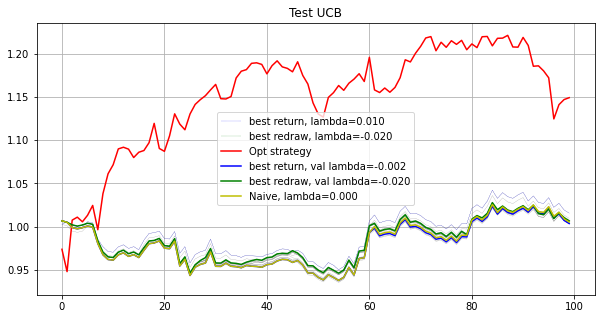

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.80655676
Mean return: 1.00073955
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


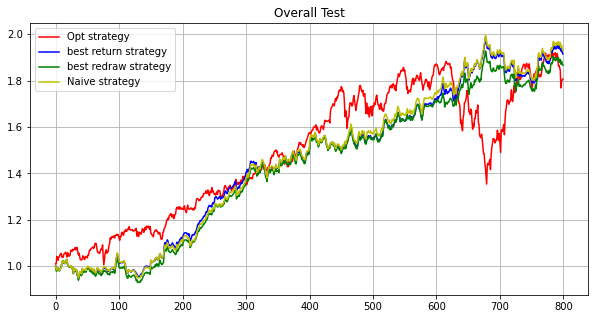

In [11]:
lb = 5
maxiter = 8000
subn = 100
path ='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
eps = 1.001
delta = 0.008
run(path, maxiter, subn, lb, c=0.001, eps=eps, delta=delta, testv=np.arange(-0.02, 0.0100001, 0.002))

# 2

    #!/bin/bash
    for i in `seq 4 11`;
    # for i in 10;
    do
        echo "phase $i"
            python main2.py --phase $i --maxiter 15000 --subn 100 --lb 5 --inverse --matid 48 35 83 25 84 19 21 71 24 68 81 38 51 56 77 43 80 15 30 60 --M 10 --ggd --gpu 1  > ./log/main2_inv_ggd_M20_iter8000_mateye_subn100_lb5_s5_log${i}.log
    done

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[-0.    -0.    -0.    -0.     0.148 -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.3   -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.     0.3
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.252 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.   ]
[ 0.    0.   -0.    0.    0.   -0.    0.   -0.   -0.    0.    0.    0.
 -0.    0.    0.    0.    0.    0.   -0.   -0.    0.3   0.   -0.   -0.
 -0.    0.   -0.    0.    0.    0.    0.   -0.    0.    0.26  0.3   0.
 -0.    0.    0.14 -0. 

[0.     0.     0.     0.0696 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0304 0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.   0.   0.  -0.   0.3  0.   0.   0.   0.  -0.   0.  -0.   0.   0.
  0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.   0.   0.   0.  -0.   0.
  0.   0.1  0.  -0.   0.3  0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.
  0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.

[ 0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.     -0.     -0.      0.233  -0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.2593  0.      0.      0.1977  0.
 -0.      0.      0.     -0.      0.156  -0.      0.      0.      0.
  0.     -0.     -0.      0.1541  0.      0.      0.      0.      0.
  0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.     -0.     -0.     -0.      0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.1969 -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.2175
 -0.     -0.      0.

[ 0.      0.      0.      0.      0.2755  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.3     0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.1245  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0013  0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

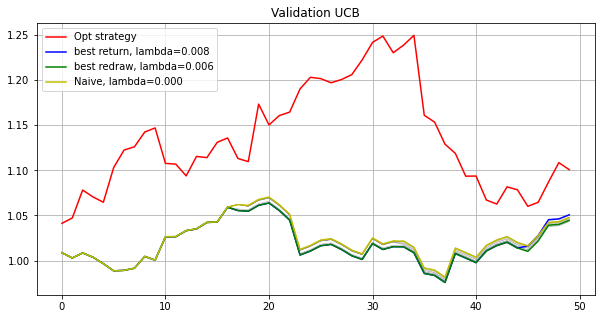

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[ 0.      0.      0.      0.      0.3     0.      0.      0.      0.
  0.2947  0.      0.      0.      0.      0.      0.      0.      0.0937
  0.      0.      0.0116  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.3
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0704
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.   

[ 0.      0.      0.      0.3     0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.1478
  0.      0.     -0.      0.      0.0695 -0.     -0.      0.      0.
  0.      0.      0.1827 -0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.     -0.      0.      0.     -0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.     -0.     -0.      0.
  0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -

[-0.  -0.   0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.
 -0.   0.  -0.  -0.   0.   0.   0.  -0.   0.   0.  -0.  -0.   0.  -0.
 -0.  -0.   0.   0.3 -0.   0.3  0.  -0.   0.  -0.   0.   0.  -0.   0.
 -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
  0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.3 -0.
  0.  -0.  -0.   0.  -0.   0.   0.   0.   0.  -0.  -0.  -0.   0.  -0.
 -0.   0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.1 -0.
  0.   0. ]
[ 0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.      0.     -0.     -0.      0.0027 -0.      0.     -0.
  0.      0.      0.2406 -0.     -0.      0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.0822  0.3     0.      0.     -0.     -0.      0.
  0.      0.     -0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.0746  0.
  0.      0.   

[-0.  -0.   0.  -0.   0.3  0.  -0.   0.   0.   0.1 -0.  -0.   0.   0.
 -0.   0.  -0.  -0.   0.   0.   0.   0.3  0.   0.   0.  -0.   0.  -0.
 -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.
 -0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.
  0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.3 -0.
  0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.
 -0.   0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.
  0.   0. ]
[ 0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.      0.      0.      0.2488  0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.      0.     -0.
  0.      0.      0.     -0.      0.3     0.      0.1512 -0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.      0.
  0.     -0.     -0.      0.      0.      0.      0.      0.      0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.     -0.   

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0301
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0699
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.0161
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.

[-0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
  0.0036 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0814  0.      0.015  -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.      0.3     0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.3   0.3   0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.0828 0.3    0.     0.
 0.     0.     0.     0.2254 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0917 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.    -0.    -0.    -0.     0.028 -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.3   -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.     0.3   -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.

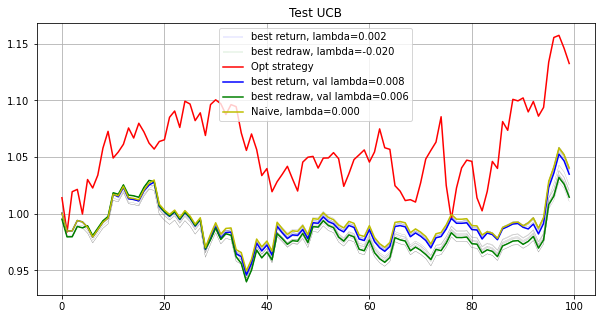

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1284 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0007 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.      0.0631 -0.     -0.     -0.     -0.     -0.
 -0.      0.2455 -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1625 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.     0.     0.3   -0.    -0.     0.     0.    -0.    -0.     0.
 -0.    -0.    -0.    -0.     0.    -0.    -0.    -0.     0.216 -0.
  0.    -0.     

[-0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.3
  0.     -0.     -0.     -0.     -0.      0.      0.3    -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.1997 -0.      0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.2003 -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.1345  0.      0.     -0.
  0.     -0.     -0.   

[-0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.
 -0.   0.3  0.  -0.  -0.   0.  -0.   0.1 -0.  -0.   0.   0.  -0.  -0.
 -0.  -0.   0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.3 -0.   0.  -0.
  0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.
  0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.  -0.  -0.
  0.   0. ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0848 0.     0.     0.     0.     0.3    0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0152 0.     0.     

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
  0.      0.      0.      0.2357  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.083   0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.0813
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.      0.      0.0651 -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.

lambda: -0.016   Total log return: 0.02332560    Max redraw: 0.03173711
lambda: -0.014   Total log return: 0.02332560    Max redraw: 0.03173711
lambda: -0.012   Total log return: 0.01948404    Max redraw: 0.03173711
lambda: -0.010   Total log return: 0.01758387    Max redraw: 0.03173711
lambda: -0.008   Total log return: 0.01758387    Max redraw: 0.03173711
lambda: -0.006   Total log return: 0.01697364    Max redraw: 0.03173711
lambda: -0.004   Total log return: 0.01697364    Max redraw: 0.03173711
lambda: -0.002   Total log return: 0.01697364    Max redraw: 0.03173711
lambda: -0.000   Total log return: 0.02199807    Max redraw: 0.03173711
lambda: 0.002   Total log return: 0.02899982    Max redraw: 0.03514809
lambda: 0.004   Total log return: 0.03261177    Max redraw: 0.03514809
lambda: 0.006   Total log return: 0.03143545    Max redraw: 0.03631178
lambda: 0.008   Total log return: 0.03143545    Max redraw: 0.03631178
lambda: 0.010   Total log return: 0.03269108    Max redraw: 0.036311

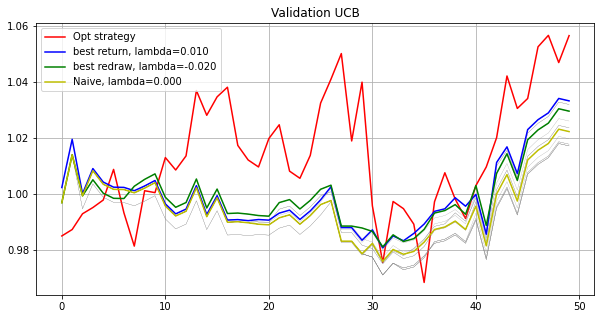

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[ 0.2365  0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.0237  0.      0.      0.1398  0.      0.     -0.
  0.     -0.     -0.      0.      0.      0.      0.     -0.     -0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.      0.      0.     -0.     -0.      0.
  0.3    -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
 -0.      0.      0.      0.      0.     -0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.3    -0.      0.
  0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.    

[-0.      0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.1682 -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.      0.2318 -0.     -0.
 -0.    ]
[ 0.      0.      0.     -0.     -0.      0.      0.      0.     -0.
  0.     -0.     -0.     -0.      0.      0.2445  0.     -0.      0.
 -0.     -0.      0.      0.0112  0.      0.     -0.     -0.      0.
  0.1251  0.      0.    

[-0.     -0.      0.0728 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2986 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0774 -0.     -0.     -0.     -0.     -0.     -0.      0.2519
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.      0.     -0.      0.2397 -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1012 -0.     -0.      0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.      0.

[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.     -0.      0.      0.      0.      0.     -0.     -0.
  0.     -0.      0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.0986  0.3
  0.3     0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.      0.      0.      0.3
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
  0.      0.      0.      0.0014  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.      0.     -0.     -0.     -0.      0.0137 -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0699 -0.      0.     -0.     -0.      0.24   -0.     -0.     -0.
 -0.     -0.     -0.  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.0739  0.0095  0.0931  0.1608  0.      0.      0.
  0.     -0.      0.     -0.     -0.     -0.      0.      0.3     0.3
  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.      0.      0.0626
 -0.      0.      0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.     -0.      0.     -0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.     -0.
 -0.    ]
[ 0.     0.     0.    -0.    -0.     0.02   0.     0.     0.     0.
  0.    -0.    -0.     0.     0.     0.    -0.     0.    -0.    -0.
  0.     0.279  0.     0.    -0.    -0.     0.     0.     0.     0.
 -0.     0.     0.    

[ 0.      0.      0.0955  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.2054
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.0718  0.3     0.      0.      0.      0.
  0.3     0.      0.0273  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.      0.      0.1725 -0.     -0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.     -0.      0.     -0.      0.      0.      0.      0.     -0.
  0.      0.      0.

[-0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0.3  0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.  -0.  -0.
 -0.  -0.   0.   0.1  0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.  -0.   0.  -0.
  0.   0.   0.   0.   0.   0.   0.   0.3 -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.
  0.   0.  -0.  -0.   0.  -0.   0.   0.   0.   0.3  0.   0.   0.  -0.
  0.   0. ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.2656 0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.0764 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0278 0.     0.     0.     0.     0.1091 0.     0.     0.
 0.     0.     0.3    0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.1949 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0033 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0647 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
Opt strategy   Total log return: 0.02402337    Max redraw: 0.04950321
Total return: 1.02431425
Mean return: 1.00024026
best return val lambda: -0.018   Total log return: 0.08253240
Total return: 1.08603386
Mean return: 1.00082566
best redraw val lambda: -0.020   Total log return: 0.07526718
Total return: 1.07817218
Mean ret

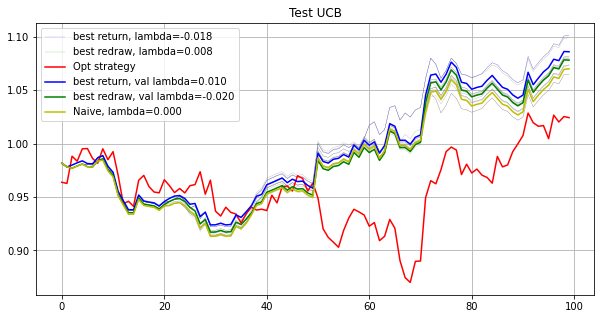

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.2312 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.2947 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0046 0.     0.     0.0745 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.095  0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.  -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.  -0.   0.   0.  -0.   0.  -0.   0.  -0.   0.3  0.  -0.
  0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.  -0.
  0.  -0.   0.   0.  -0.   0.   0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.      0.1468 -0.     -0.     -0.      0.0443 -0.
 -0.     -0.      0.2997 -0.      0.2107 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.     -0.     -0.      0.     -0.      0.     -0.
 -0.      0.3     0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.1915  0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.    

[ 0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.     -0.      0.      0.      0.2272  0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.     -0.      0.
 -0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.      0.0419
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.1858 -0.
 -0.      0.      0.      0.      0.2402  0.      0.      0.      0.
  0.     -0.     -0.      0.0049 -0.      0.     -0.      0.      0.
  0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.1001 0.     0.     0.     0.
 0.     0.     0.     0.  

[ 0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.0392 -0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.3     0.      0.     -0.      0.      0.     -0.
  0.0791 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2818  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.
  0.  -0.   0.   0.3 -0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.
  0.   0.   0.   0.  

lambda: -0.010   Total log return: 0.02889398    Max redraw: 0.05428521
lambda: -0.008   Total log return: 0.02838718    Max redraw: 0.05428521
lambda: -0.006   Total log return: 0.03035372    Max redraw: 0.05428521
lambda: -0.004   Total log return: 0.03035372    Max redraw: 0.05428521
lambda: -0.002   Total log return: 0.02930367    Max redraw: 0.05428521
lambda: -0.000   Total log return: 0.03465132    Max redraw: 0.05428521
lambda: 0.002   Total log return: 0.04369090    Max redraw: 0.05428521
lambda: 0.004   Total log return: 0.03509687    Max redraw: 0.05428521
lambda: 0.006   Total log return: 0.03217608    Max redraw: 0.05428521
lambda: 0.008   Total log return: 0.03553596    Max redraw: 0.05428521
lambda: 0.010   Total log return: 0.03698959    Max redraw: 0.05428521
best return lambda: -0.020   Total log return: 0.04554256
Total return: 1.04659555
Mean return: 1.00091127
best redraw lambda: -0.020   Total log return: 0.04554256
Total return: 1.04659555
Mean return: 1.00091127

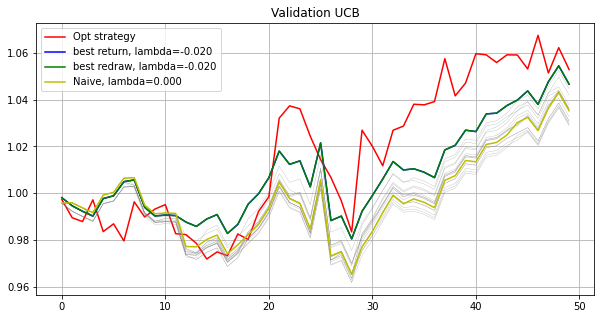

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[-0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.0665 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.0759 -0.     -0.      0.     -0.     -0.     -0.
  0.0238 -0.     -0.      0.      0.2183 -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.1414 -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.0009 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1731 -0.     -0.     -0.
  0.    ]
[ 0.      0.1123  0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.      0.2161 -0.
 -0.     -0.     -0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0415 -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0585 -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.    ]
[-0.      0.     -0.      0.      0.     -0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.3    -0.      0.3     0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.   

[ 0.      0.1565 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.1153  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.1468 -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2814 -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0258  0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.    

[ 0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.     -0.
  0.3    -0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.0041 -0.     -0.      0.      0.     -0.     -0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.0778 -0.
 -0.      0.     -0.      0.1846  0.      0.     -0.     -0.      0.2061
 -0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2274 -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.
  0.3  0.   0.   0.   0.   0.   0.1  0.  -0.   0.   0.   0.   0.  -0.
  0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.   0.  -0.
  0.  -0.   0.   

[ 0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.      0.     -0.      0.3    -0.      0.      0.      0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
  0.      0.      0.2125  0.2566  0.0692  0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.1617 -0.     -0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.    ]
[ 0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.     -0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.0011

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.1282  0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0509 -0.     -0.      0.      0.3    -0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.0179 -0.     -0.     -0.      0.     -0.     -0.      0.203
 -0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.   0.  -0.   0.   0.
  0.  -0.   0.  -0.   0.   0.  -0.   0.  -0.   0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.  -0.
  0.  -0.   0.   0

[-0.     -0.     -0.     -0.     -0.     -0.      0.     -0.      0.
  0.      0.0526 -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.
  0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.
  0.3    -0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.     -0.      0.
  0.     -0.     -0.     -0.      0.0474 -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.      0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.3     0.      0.     -0.      0.      0.     -0.     -0.
  0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
 -0.    ]
[ 0.      0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.    

[ 0.1845  0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.1534 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.      0.1598 -0.      0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.     -0.     -0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.3     0.2023 -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.   0.3  0.   0.   0.  -0.   0.  -0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.
  0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.   0.1 -0.
  0.  -0.   0.3  0.  

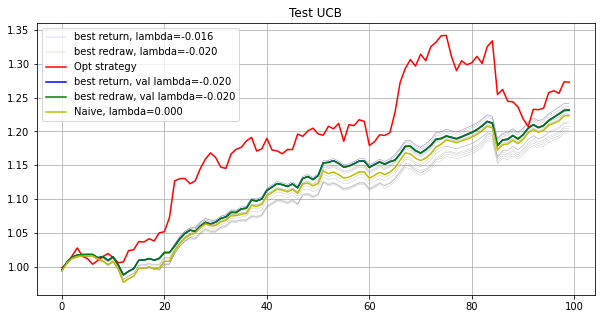

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[-0.  -0.  -0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.3
 -0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.   0.   0.  -0.   0.3 -0.  -0.   0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.
 -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.   0.1  0.3 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0. ]
[ 0.0129  0.     -0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.139   0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.      0.     -0.      0.      0.      0.     -0.     -0.      0.
  0.     -0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.

[-0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.1588  0.0804  0.      0.      0.     -0.     -0.      0.
  0.      0.      0.1101 -0.      0.      0.     -0.     -0.     -0.
 -0.      0.0508 -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.3    -0.      0.      0.     -0.      0.     -0.      0.
  0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.      0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2301 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.1075  0.      0.
  0.      0.      0.      0.0634 -0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.1226  0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.0527  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.3     0.0538  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.3     0.      0.
  0.    ]
[-0.     -0.     -0.     -0.      0.1408 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.146 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.      0.0443  0.0557  0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.3     0.3    -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
[0.     0.     0.     0.     0.     0.0395 0.     0.     0.     0.0448
 0.     0.     0.     0.     0.     0.     0.     0.     0.1735 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.  

[-0.     -0.     -0.     -0.     -0.      0.164  -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0254 -0.     -0.
 -0.      0.3    -0.      0.0375 -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1001 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1358 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0217 -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2155 -0.     -0.
 -0.    ]
[ 0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.1819  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.    

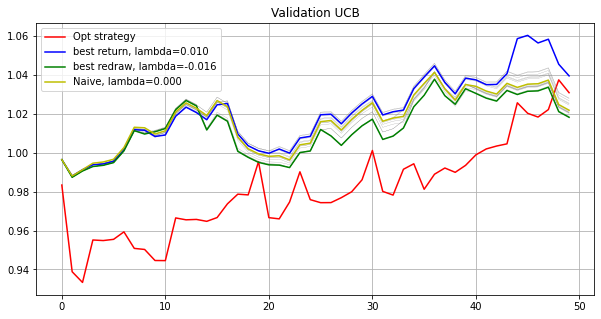

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[ 0.0936 -0.     -0.     -0.      0.0248  0.0347 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2571 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.3     0.0753 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0095 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0005 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2045 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
[-0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.1  0.   0.  -0.   0.
  0.   0.  -0.   0.   0.3 -0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.
 -0.  -0.  -0.   0.  

[-0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.1685 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0358
 -0.      0.      0.3    -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0807 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0896 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1759 -0.     -0.
 -0.      0.1494 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0707 -0.     -0.
 -0.     -0.     -0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0576 -0.     -0.      0.      0.      0.     -0.     -0.
 -0.     -0.     -0.      0.0175 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2283 -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.      0.0966 -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.2325  0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.0717  0.     -0.      0.      0.      0.      0.     -0.     -0.
  0.2774 -0.     -0.      0.     -0.      0.      0.0417  0.     -0.
 -0.      0.      0.   

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.2381
 0.     0.     0.     0.     0.     0.     0.     0.     0.0927 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.0224 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0468 0.3    0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.0555 -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.      0.3     0.      0.
  0.     -0.     -0.     -0.     -0.     -0.

[0.0855 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0145
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.3    0.     0.     0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.      0.1331  0.      0.
  0.     -0.      0.     -0.     -0.     -0. 

[ 0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.0704 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2009  0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.2623  0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.1664  0.      0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.      0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.    ]
[0.  0.  0.  0.  0.  0.  0.  0.  0.  0.1 0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.3 0.  0.
 0.  0.  0.  0.

[-0.  -0.  -0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.
 -0.   0.  -0.  -0.   0.3  0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.   0.  -0.  -0.   0.
 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.
 -0.  -0.  -0.   0.3  0.3 -0.   0.  -0.  -0.  -0.   0.   0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0. ]
[0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0072
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.2999 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0. 

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.2462  0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.2697  0.     -0.      0.      0.      0.     -0.     -0.      0.0996
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.0845  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0412 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0989 -0.     -0.
 -0.     -0.      0.

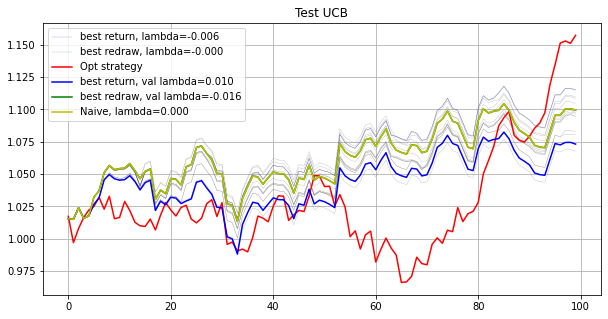

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.      0.1395 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0007
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.      0.3    -0.
  0.2598 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0007 -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.      0.0279 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0729
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.     -0.      0.     -0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.      0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.      0.0124 -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0876 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.     -0.     -0.      0.      0.      0.      0.1337
  0.     -0.      0.      0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0

[ 0.      0.      0.0603  0.      0.     -0.      0.      0.      0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.2176  0.     -0.     -0.      0.      0.      0.      0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.      0.2423
  0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.3     0.     -0.      0.
  0.1799]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.2797 0.     0.     0.     0.     0.
 0.     0.     0.     0.  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.      0.1003 -0.     -0.     -0.
 -0.     -0.     -0.      0.0004 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
Opt strategy   Total log return: 0.09676298    Max redraw: 0.04364695
Total return: 1.10159924
Mean return: 1.00193713
UCB strategy
lambda: -0.020   Total log return: 0.03696350    Max redraw: 0.03625933
lambda: -0.018   Total log 

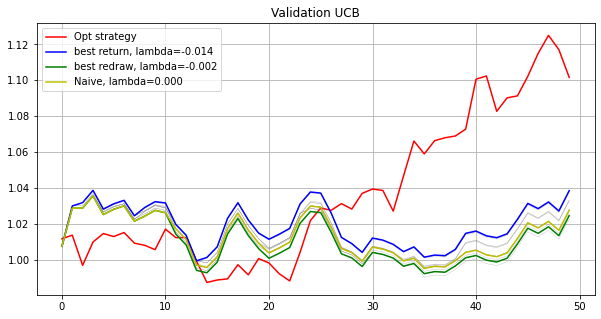

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[ 0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.      0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.0275 -0.     -0.
 -0.      0.      0.1787  0.      0.      0.     -0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.3    -0.      0.     -0.      0.     -0.     -0.     -0.
  0.2984 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1954  0.     -0.
 -0.    ]
[ 0.      0.      0.1013  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.2505

[-0.     -0.     -0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.3
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.      0.      0.      0.      0.3     0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.      0.0748  0.      0.      0.      0.3     0.0252 -0.      0.
  0.    ]
[ 0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.   

[-0.     -0.      0.2206 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1284 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0701 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.2143 -0.     -0.     -0.     -0.     -0.
  0.1068 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2598
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.     -0.     -0.     -0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.0528  0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.

[-0.     -0.     -0.      0.      0.     -0.     -0.      0.      0.
  0.      0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.     -0.      0.      0.1286  0.     -0.
  0.     -0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.0835  0.115
  0.      0.      0.      0.      0.      0.      0.0729  0.      0.
  0.    ]
[-0.     -0.      0.1736 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.1939 -0.     -0.      0.2993 -0.     -0.
 -0.     -0.     -0. 

[ 0.      0.2214 -0.     -0.     -0.      0.1786 -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.      0.     -0.      0.3    -0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.2524  0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.      0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
 -0.      0.      0.147

[-0.     -0.      0.0612 -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2916 -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0339 -0.      0.      0.0694 -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.2439 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.
 -0.  -0.  -0.  -0.  

[ 0.      0.      0.      0.      0.      0.3     0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.2103
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.1897
  0.      0.      0.      0.      0.      0.      0.3     0.      0.
  0.    ]
[-0.      0.      0.      0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.      0.      0.
  0.      0.0116  0.      0.      0.      0.      0.1622  0.     -0.
  0.      0.    

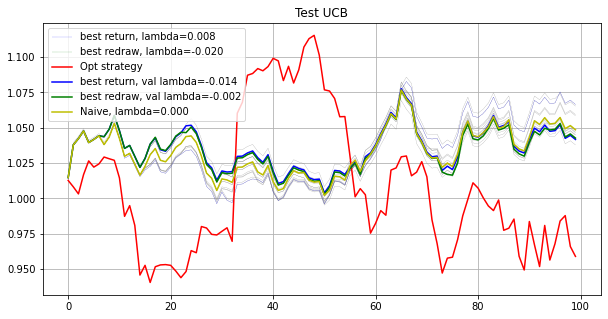

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[-0.  -0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.   0.3  0.  -0.   0.   0.   0.   0.   0.  -0.  -0.
  0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.  -0.   0.  -0.   0.1
  0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.
  0.   0.   0.  -0.   0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.
  0.   0.   0.3  0.   0.   0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.
  0.   0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.   0.
  0.   0. ]
[0.     0.1518 0.     0.     0.     0.     0.2956 0.     0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.151  0.     0.     0.     0.     0.0259
 0.     0.     0.     0.     0.     0.0756 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.  

[-0.     -0.     -0.      0.1134 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.285  -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0025
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[0.     0.0971 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.  

[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.2598  0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.1402  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[0.     0.0826 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.2548 0.     0

[ 0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.1563 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.2437 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
[ 0.      0.3     0.      0.      0.      0.      0.009   0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.1251  0.     -0.
  0.      0.      0.    

lambda: -0.012   Total log return: 0.05092346    Max redraw: 0.03810206
lambda: -0.010   Total log return: 0.04015190    Max redraw: 0.03810206
lambda: -0.008   Total log return: 0.04015190    Max redraw: 0.03810206
lambda: -0.006   Total log return: 0.03671906    Max redraw: 0.03810206
lambda: -0.004   Total log return: 0.04086968    Max redraw: 0.03810206
lambda: -0.002   Total log return: 0.05368604    Max redraw: 0.03810206
lambda: -0.000   Total log return: 0.05377051    Max redraw: 0.03810206
lambda: 0.002   Total log return: 0.04953124    Max redraw: 0.03810206
lambda: 0.004   Total log return: 0.04696629    Max redraw: 0.03810206
lambda: 0.006   Total log return: 0.05112865    Max redraw: 0.03810206
lambda: 0.008   Total log return: 0.05199818    Max redraw: 0.03810206
lambda: 0.010   Total log return: 0.04774085    Max redraw: 0.03810206
best return lambda: -0.000   Total log return: 0.05377051
Total return: 1.05524240
Mean return: 1.00107599
best redraw lambda: -0.020   Total

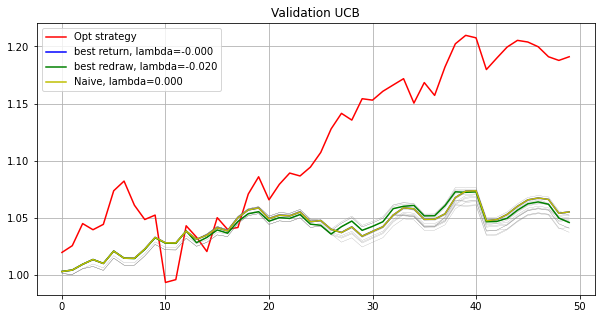

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[ 0.     0.    -0.     0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.     0.3   -0.    -0.    -0.    -0.
  0.202  0.     0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.    -0.    -0.    -0.    -0.     0.    -0.    -0.     0.
 -0.    -0.    -0.    -0.    -0.    -0.     0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.     0.3    0.    -0.    -0.
 -0.    -0.    -0.    -0.     0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.     0.    -0.    -0.    -0.    -0.    -0.     0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.     0.198  0.    -0.    -0.   ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0461 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.   

[ 0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.3    -0.     -0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.2651  0.      0.1034 -0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.2831  0.      0.      0.      0.      0.      0.0483
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.

[ 0.      0.     -0.     -0.     -0.     -0.     -0.      0.1534 -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2839  0.2626  0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.3    -0.      0.     -0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.      0.      0.3     0.      0.1107
  0.     -0.     -0.

[ 0.      0.      0.      0.      0.      0.      0.2501  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.1499  0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.     -0.     -0.      0.
  0.     -0.      0.3     0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.      0.0551 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0213 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.      0.1989 -0.      0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.      0.3     0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.      0.      0.      0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.      0.      0.     -0.      0.2382
  0.2629  0.     -0.     -0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.    ]
[-0.   0.   0.   0.   0.  -0.   0.3  0.   0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.  -0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.  -0.   0.3
  0.   0.   0.  

[-0.     -0.      0.      0.3     0.     -0.      0.1645  0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.0325  0.      0.
  0.     -0.      0.203   0.      0.      0.     -0.      0.     -0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.      0.      0.3
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
 -0.    ]
[ 0.      0.1839 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2161 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.   

[ 0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.      0.     -0.     -0.      0.2205 -0.
 -0.      0.      0.      0.      0.      0.      0.     -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.2165
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.263   0.      0.      0.     -0.     -0.     -0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.3     0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.    ]
[-0.      0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.3     0.     -0.
  0.      0.      0.0608  0.      0.      0.      0.      0.      0.
  0.      0.      0.

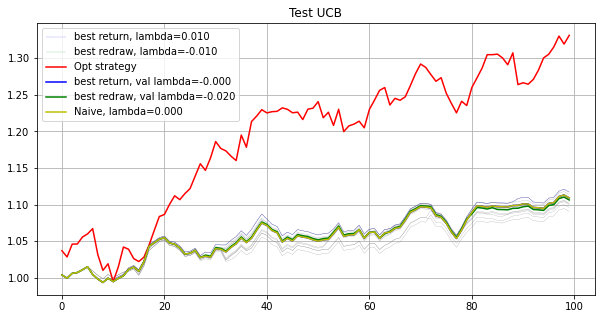

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[-0.     -0.      0.0804 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1117 -0.     -0.      0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2079 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.
 -0.   0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.   0.
 -0.  -0.  

[-0.     -0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.3     0.
  0.      0.      0.      0.     -0.     -0.      0.     -0.      0.
  0.     -0.      0.     -0.      0.     -0.      0.0753 -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.0343  0.      0.      0.     -0.      0.     -0.      0.
  0.     -0.     -0.      0.      0.      0.      0.     -0.      0.2904
  0.      0.      0.3    -0.      0.     -0.     -0.      0.     -0.
  0.    ]
[-0.  -0.   0.   0.   0.  -0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.
 -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.   0.
  0.   0.   0.  -0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.   0.1 -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.
 -0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.  -0.   0.  -0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.3
 -0.   0.3  0.   0.  -0.   0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.
 -0.   0.  -0.   0.  -0.   0.3  0.  -0.  -0.   0.   0.  -0.  -0.  -0.
 -0.   0. ]
[ 0.      0.      0.     -0.     -0.      0.      0.      0.      0.
  0.     -0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.      0.1736  0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.3     0.      0.      0.
  0.0522  0.  

[-0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.1
  0.   0.   0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.   0.   0.  -0.
  0.  -0.   0.  -0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.  -0.  -0.
  0.3  0.  -0.   0.   0.   0.  -0.   0.   0.  -0.   0.  -0.   0.   0.
 -0.  -0.   0.   0.3 -0.   0.  -0.  -0.   0.  -0.   0.   0.   0.   0.
 -0.   0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.   0.  -0.   0.
 -0.   0. ]
[-0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.3    -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.     -0.      0.
  0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3     0.      0.     -0.
  0.      0.  

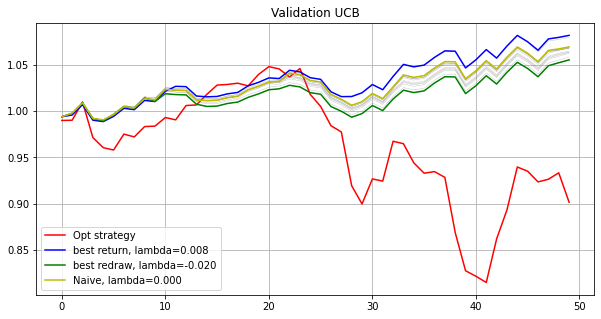

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[-0.     -0.      0.0628 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.      0.0587 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.2785 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.      0.0371 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.0858  0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.3    -0.      0.      0.      0.
  0.      0.      0.      0.     -0.     -0.      0.      0.      0.0557
  0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.     -0.      0.      0.2342 -0.      0.      0.3    -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.0243  0.      0.      0.      0.      0.     -0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.    ]
[ 0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0386 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.0614  0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3     0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1043 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.247  0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.3    0.     0.153  0.     0.     0.     0.     0.     0.3
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.    -0.     0.     0.     0.     0.     0.   ]
[ 0.      0.      0.      0.      0.0493  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.   

[ 0.      0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.     -0.      0.
  0.      0.      0.     -0.     -0.      0.      0.      0.     -0.
 -0.      0.     -0.      0.     -0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.     -0.      0.      0.     -0.      0.      0.      0.      0.2414
  0.     -0.      0.     -0.      0.2457  0.      0.2128  0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
  0.3    -0.      0.     -0.     -0.      0.      0.      0.      0.
 -0.    ]
[-0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0953 -0.
 -0.     -0.     -0.

[-0.     -0.      0.0844 -0.     -0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.3     0.      0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.0865 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.2291 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3     0.1363 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.0932 -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.     -0.      0.      0.      0.
  0.      0.      0.      0.     -0.     -0.      0.      0.      0.
  0.3    -0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.     -0.     -0.      0.      0.2263 -0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.      0.3     0.     -0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.0805
  0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.    ]
[-0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.
 -0.   0.   0.  -0.  -0.   0.   0.3 -0.   0.  -0.   0.   0.3 -0.  -0.
  0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.  -0.   0.   

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.3     0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.1632  0.      0.      0.     -0.
  0.      0.      0.      0.      0.1419  0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.0695
  0.      0.      0.0253  0.      0.      0.     -0.      0.     -0.
  0.    ]
Opt strategy   Total log return: -0.10844350    Max redraw: 0.04229200
Total return: 0.89722959
Mean return: 0.99891615
best return val lambda: 0.008   Total log return: 0.10578188
Total return: 1.11157940
Mean return: 1.001058

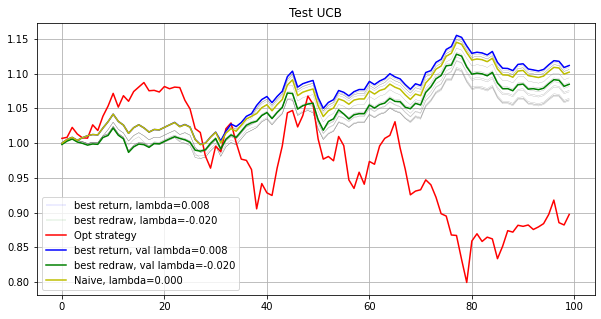

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[ 0.3 -0.   0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.
  0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.1 -0.   0.   0.   0.
  0.   0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.  -0.   0.   0.
 -0.   0.   0.   0.   0.   0.  -0.   0.   0.3  0.  -0.   0.   0.   0.
  0.   0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.  -0.
  0.  -0.   0.   0.   0.   0.   0.  -0.  -0.  -0.   0.   0.  -0.   0.
  0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.3  0.   0.
  0.  -0. ]
[0.2486 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.0949 0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1283 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.2717 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.     -0.   

[ 0.      0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.      0.1235 -0.     -0.      0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.      0.0904  0.     -0.      0.      0.      0.      0.      0.1861
  0.     -0.     -0.      0.      0.3    -0.      0.      0.      0.
 -0.     -0.      0.      0.      0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.      0.
  0.     -0.      0.     -0.      0.      0.      0.      0.      0.3
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0

[-0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
  0.3    -0.      0.0703  0.     -0.      0.     -0.      0.      0.3
 -0.      0.     -0.     -0.      0.     -0.      0.187  -0.     -0.
  0.1427 -0.      0.      0.     -0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.     -0.
 -0.    ]
[ 0.     0.     0.    -0.     0.    -0.    -0.    -0.     0.    -0.
 -0.     0.     0.     0.    -0.    -0.     0.185  0.    -0.    -0.
 -0.    -0.     0.    -0.    -0.     0.     0.    -0.     0.    -0.
 -0.    -0.     0.    -0. 

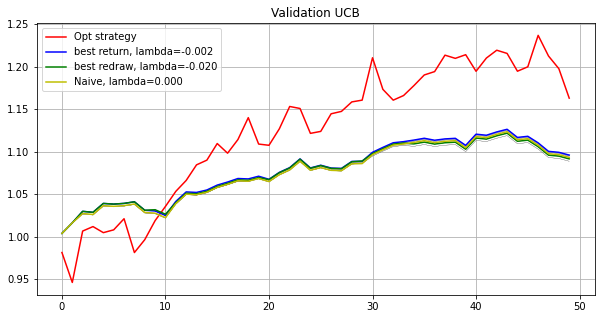

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.2089 0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.1911 0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.233  0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.0646

[ 0.0937 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0698 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.1106 -0.     -0.     -0.     -0.     -0.     -0.      0.1259
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
  0.     -0.      0.

[-0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
  0.3     0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.3    -0.     -0.      0.      0.3     0.
 -0.      0.     -0.      0.0793  0.     -0.      0.     -0.      0.0207
  0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.    ]
[ 0.      0.      0.     -0.      0.      0.0989  0.     -0.      0.
 -0.      0.      0.19    0.     -0.     -0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.0287
  0.      0.    

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.
  0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.
  0.   0.1  0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.   0.
 -0.   0.  -0.   0.3 -0.  -0.  -0.   0.3  0.  -0.  -0.   0.   0.  -0.
  0.  -0.  -0.  -0.   0.   0.3 -0.  -0.   0.  -0.   0.   0.  -0.  -0.
  0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.  -0.  -0.
  0.   0.  -0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.
  0.  -0. ]
[ 0.1749 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.   

[-0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.0594  0.      0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.      0.3     0.
  0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.3
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.2813 -0.      0.0593
  0.    ]
[-0.     0.    -0.     0.    -0.    -0.    -0.     0.     0.     0.
 -0.     0.    -0.     0.     0.    -0.     0.3   -0.    -0.    -0.
  0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.    -0.    

[ 0.1326 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2674 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.3 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.
  0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.
  0.   0.   0.  -0.   0.  -0.   0.1  0.   0.   0.   0.   0.   0.  -0.
 -0.   0.   0.   0.3 

[ 0.0546  0.      0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.      0.     -0.     -0.      0.      0.      0.      0.
 -0.     -0.      0.      0.      0.      0.0454  0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.3
  0.     -0.      0.      0.      0.3     0.      0.     -0.      0.
  0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.3
  0.      0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[0.3    0.     0.     0.     0.     0.0067 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.    

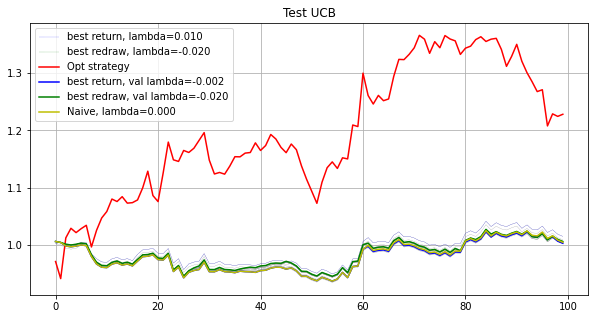

-----------------------------Final result-----------------------------
Opt strategy
Total return: 2.40277901
Mean return: 1.00109638
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


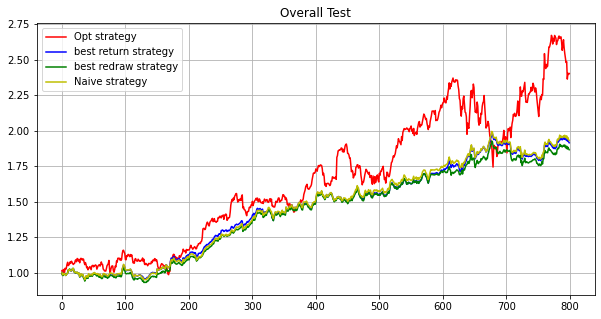

In [10]:
lb = 5
maxiter = 8000
subn = 100
path ='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
gamma=3.0
run(path, maxiter, subn, lb, c=0.0, gamma=gamma, testv=np.arange(-0.02, 0.0100001, 0.002))

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
9.333407137835335e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01

[0.0101 0.0101 0.0099 0.0082 0.0103 0.0103 0.0093 0.0093 0.0104 0.0104
 0.0102 0.0093 0.01   0.0105 0.0099 0.0097 0.0096 0.0104 0.0087 0.0101
 0.0106 0.0066 0.01   0.0099 0.01   0.0102 0.0092 0.011  0.01   0.0098
 0.0098 0.0103 0.0103 0.0108 0.0106 0.0101 0.0098 0.0099 0.0112 0.0099
 0.0103 0.0102 0.0102 0.01   0.0101 0.0102 0.0095 0.0096 0.0104 0.0088
 0.0103 0.01   0.0097 0.0105 0.0106 0.01   0.0102 0.0096 0.0103 0.0111
 0.0091 0.0094 0.01   0.0103 0.0097 0.0104 0.0104 0.0101 0.0103 0.0097
 0.01   0.0101 0.0105 0.01   0.01   0.0101 0.0108 0.0098 0.01   0.0104
 0.01   0.0098 0.0103 0.01   0.0101 0.0101 0.0101 0.0092 0.0101 0.0102
 0.0108 0.0101 0.0103 0.0099 0.0099 0.01   0.0104 0.0088 0.0101 0.0105]
1.538745162963165e-07
[0.0101 0.0101 0.0099 0.0082 0.0103 0.0103 0.0093 0.0093 0.0104 0.0104
 0.0102 0.0093 0.01   0.0105 0.0099 0.0097 0.0096 0.0104 0.0087 0.0101
 0.0106 0.0066 0.01   0.0099 0.01   0.0102 0.0092 0.011  0.01   0.0098
 0.0098 0.0103 0.0103 0.0108 0.0106 0.0101 0.0098 0.00

[0.0102 0.01   0.0099 0.0077 0.0111 0.0105 0.0093 0.009  0.0107 0.0106
 0.0102 0.009  0.01   0.0105 0.0099 0.0097 0.0099 0.0104 0.0082 0.0103
 0.0107 0.0059 0.0097 0.0096 0.0101 0.0103 0.009  0.011  0.0099 0.0096
 0.0099 0.0102 0.0104 0.011  0.0108 0.0102 0.0096 0.01   0.0113 0.0098
 0.0104 0.01   0.0103 0.0092 0.0099 0.0104 0.01   0.0087 0.0103 0.0086
 0.0104 0.0099 0.0095 0.0106 0.0108 0.01   0.0103 0.0096 0.0099 0.0114
 0.0093 0.0093 0.0104 0.0103 0.0098 0.0106 0.0105 0.0101 0.0104 0.0098
 0.0101 0.0102 0.0107 0.0101 0.01   0.0102 0.011  0.0098 0.01   0.0107
 0.0102 0.0098 0.0103 0.01   0.0101 0.0101 0.0101 0.0089 0.0101 0.0107
 0.0108 0.0101 0.0104 0.0099 0.01   0.01   0.0104 0.0085 0.0101 0.0106]
0.016245922604741073
[0.0102 0.01   0.0099 0.0077 0.0111 0.0105 0.0093 0.009  0.0107 0.0106
 0.0102 0.009  0.01   0.0105 0.0099 0.0097 0.0099 0.0104 0.0082 0.0103
 0.0107 0.0059 0.0097 0.0096 0.0101 0.0103 0.009  0.011  0.0099 0.0096
 0.0099 0.0102 0.0104 0.011  0.0108 0.0102 0.0096 0.01 

[0.0102 0.0101 0.0096 0.0076 0.0106 0.0114 0.0086 0.01   0.0121 0.0102
 0.0103 0.0082 0.0096 0.0107 0.0108 0.0099 0.0086 0.0101 0.0053 0.0096
 0.0104 0.0048 0.0073 0.0107 0.0109 0.0105 0.0078 0.0087 0.0105 0.0095
 0.0081 0.0111 0.0111 0.0102 0.01   0.0101 0.009  0.0108 0.0113 0.0095
 0.0108 0.0104 0.0116 0.0092 0.0101 0.0097 0.0118 0.0071 0.0113 0.0073
 0.0112 0.0106 0.0101 0.0102 0.0112 0.0105 0.0109 0.0092 0.0065 0.0085
 0.0065 0.0098 0.0123 0.0102 0.0092 0.0129 0.01   0.0105 0.0108 0.0101
 0.011  0.0105 0.0122 0.0101 0.0104 0.0106 0.0105 0.0097 0.0102 0.0114
 0.0094 0.0099 0.0116 0.0103 0.0102 0.0103 0.0102 0.0083 0.0103 0.01
 0.01   0.0103 0.0108 0.0107 0.011  0.01   0.0114 0.0103 0.0101 0.0116]
8.486004761770576e-05
[0.0102 0.0101 0.0096 0.0076 0.0106 0.0114 0.0086 0.01   0.0121 0.0102
 0.0103 0.0082 0.0096 0.0107 0.0108 0.0099 0.0086 0.0101 0.0053 0.0096
 0.0104 0.0048 0.0073 0.0107 0.0109 0.0105 0.0078 0.0087 0.0105 0.0095
 0.0081 0.0111 0.0111 0.0102 0.01   0.0101 0.009  0.0108

[0.0104 0.0105 0.0094 0.     0.0092 0.0131 0.0068 0.011  0.0112 0.0079
 0.0116 0.0093 0.0098 0.0104 0.0092 0.0079 0.0073 0.0106 0.0012 0.0083
 0.0107 0.0116 0.0049 0.0057 0.0121 0.0116 0.0076 0.0097 0.0107 0.0083
 0.007  0.0106 0.0128 0.008  0.0068 0.0115 0.008  0.0117 0.0101 0.0089
 0.0128 0.0082 0.011  0.0063 0.0106 0.0098 0.0165 0.0071 0.01   0.002
 0.0133 0.0106 0.0091 0.0092 0.0125 0.0076 0.0114 0.0097 0.0056 0.0095
 0.0063 0.0088 0.0134 0.0087 0.0086 0.0148 0.0083 0.0123 0.0115 0.0106
 0.0128 0.011  0.0143 0.0104 0.0104 0.0099 0.0101 0.01   0.0106 0.014
 0.0104 0.0097 0.0138 0.0095 0.0133 0.011  0.011  0.0085 0.0113 0.0107
 0.0101 0.011  0.0123 0.0122 0.0115 0.011  0.0136 0.0118 0.0108 0.0137]
4.7158435157383554e-06
Opt strategy   Total log return: 0.05668130    Max redraw: 0.05443879
Total return: 1.05831848
Mean return: 1.00113427
UCB strategy
lambda: -0.020   Total log return: 0.04566691    Max redraw: 0.06332431
lambda: -0.018   Total log return: 0.04399445    Max redraw: 0.0

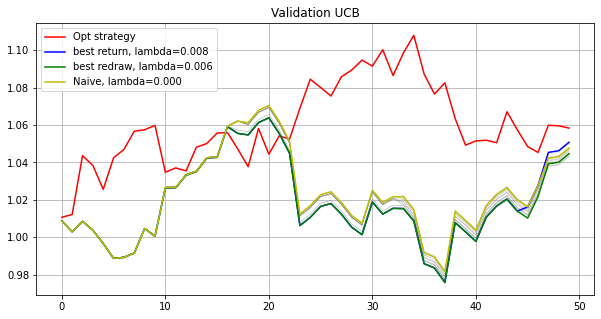

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[0.01   0.0101 0.0096 0.0093 0.0109 0.0107 0.0095 0.009  0.0095 0.0089
 0.0103 0.0086 0.01   0.0104 0.0104 0.0097 0.009  0.0102 0.0088 0.0106
 0.0092 0.0065 0.0097 0.0093 0.0095 0.0104 0.0095 0.0134 0.0109 0.0103
 0.0093 0.0102 0.0104 0.011  0.0096 0.0103 0.0096 0.0108 0.0107 0.0101
 0.0108 0.0105 0.0098 0.0088 0.0107 0.0098 0.0091 0.0098 0.0103 0.0097
 0.0107 0.01   0.0099 0.0108 0.0108 0.01   0.0102 0.0096 0.0102 0.011
 0.0086 0.0095 0.01   0.0104 0.0097 0.0102 0.0107 0.0097 0.0112 0.0099
 0.0102 0.0097 0.0106 0.0101 0.0099 0.0103 0.0103 0.0101 0.01   0.0109
 0.0098 0.0099 0.0104 0.0093 0.0101 0.0101 0.0103 0.0091 0.01   0.0106
 0.0099 0.0105 0.0104 0.01   0.0097 0.0101 0.0106 0.0081 0.01   0.0102]
3.059759447622372e-05
[0.0101 0.0102 0.0093 0.0072 0.0096 0.0116 0.0086 0.0089 0.0099 0.0053
 0.0104 0.0079 0.0101 0.0106 0.0109 0.0098 0.0084 0.0114 0.0086 0.0103
 0.0092 0.0044 0.0102 0.0081 0.0089 0.0106 0.0098 0.0142 0.011  0.0098
 0.0083 0.0111 0.0108 0.0121 0.0087 0.0104 0.0093 0.011

[0.0101 0.0101 0.0093 0.0072 0.0096 0.0116 0.0085 0.0089 0.0099 0.0053
 0.0104 0.0079 0.0101 0.0106 0.0109 0.0098 0.0084 0.0114 0.0086 0.0103
 0.0092 0.0044 0.0102 0.0081 0.0089 0.0106 0.0098 0.0142 0.011  0.0098
 0.0083 0.0111 0.0108 0.0121 0.0087 0.0104 0.0093 0.0114 0.0121 0.0093
 0.0114 0.0105 0.0098 0.0092 0.0105 0.0101 0.0081 0.0103 0.0106 0.008
 0.0112 0.0106 0.0101 0.0112 0.011  0.0098 0.0105 0.0092 0.0108 0.0117
 0.0091 0.0103 0.0096 0.0102 0.0095 0.0094 0.0108 0.0095 0.0119 0.01
 0.0106 0.0095 0.0113 0.0103 0.0099 0.0108 0.0099 0.0102 0.01   0.0121
 0.01   0.0098 0.0107 0.0092 0.0098 0.0103 0.0103 0.0098 0.0105 0.0109
 0.0102 0.0106 0.0109 0.0098 0.0102 0.0102 0.0111 0.0071 0.0101 0.0105]
6.594141411910698e-05
[0.0101 0.0102 0.0093 0.0072 0.0096 0.0116 0.0086 0.0089 0.0099 0.0054
 0.0104 0.0079 0.0101 0.0106 0.0109 0.0098 0.0084 0.0114 0.0086 0.0103
 0.0092 0.0044 0.0102 0.0081 0.0089 0.0106 0.0098 0.0142 0.011  0.0098
 0.0083 0.0111 0.0108 0.0121 0.0087 0.0104 0.0093 0.0114 

[0.0103 0.0102 0.0092 0.0066 0.009  0.0124 0.0095 0.0096 0.0101 0.0026
 0.0103 0.008  0.0101 0.0103 0.0106 0.0098 0.0075 0.0123 0.0077 0.0099
 0.0091 0.0034 0.0101 0.0071 0.0088 0.011  0.0103 0.0148 0.0108 0.0086
 0.0075 0.0124 0.0112 0.0132 0.0084 0.0106 0.0093 0.0112 0.0122 0.0085
 0.011  0.0101 0.0099 0.008  0.0111 0.0104 0.0086 0.0106 0.0102 0.0082
 0.0117 0.0107 0.0094 0.0113 0.0117 0.0095 0.0106 0.0092 0.0113 0.0114
 0.0086 0.0111 0.0097 0.0109 0.0091 0.0095 0.0112 0.0098 0.0116 0.01
 0.011  0.009  0.011  0.0102 0.0099 0.0107 0.0098 0.0102 0.0101 0.012
 0.01   0.0099 0.011  0.0093 0.0095 0.0104 0.0103 0.0096 0.0104 0.0126
 0.0102 0.0109 0.0112 0.01   0.01   0.0103 0.0119 0.0066 0.0104 0.0109]
3.895649592328566e-06
[0.0103 0.0102 0.0092 0.0066 0.009  0.0124 0.0095 0.0096 0.0101 0.0026
 0.0103 0.008  0.0101 0.0103 0.0106 0.0098 0.0075 0.0123 0.0077 0.0099
 0.0091 0.0034 0.0101 0.0071 0.0088 0.011  0.0103 0.0148 0.0108 0.0086
 0.0075 0.0124 0.0112 0.0132 0.0084 0.0106 0.0093 0.0112 

[0.0103 0.0103 0.0088 0.0075 0.0079 0.0127 0.0097 0.01   0.0099 0.0025
 0.0105 0.0078 0.0099 0.0102 0.0107 0.0098 0.0073 0.0128 0.0063 0.0092
 0.0097 0.0045 0.0105 0.0062 0.0087 0.0104 0.0098 0.015  0.0109 0.0093
 0.0069 0.0135 0.0115 0.0127 0.0079 0.0106 0.0089 0.0111 0.012  0.0087
 0.0108 0.0099 0.0099 0.0077 0.0113 0.0103 0.0089 0.0107 0.01   0.0067
 0.0122 0.0106 0.0089 0.0111 0.0124 0.0087 0.0107 0.0092 0.0116 0.0112
 0.0079 0.0116 0.0101 0.0101 0.0092 0.0096 0.0124 0.0102 0.0121 0.0104
 0.0114 0.0084 0.011  0.0103 0.0097 0.0108 0.0105 0.0104 0.0101 0.0125
 0.0099 0.0097 0.011  0.0093 0.0101 0.0105 0.0103 0.0095 0.0106 0.0116
 0.0103 0.0111 0.0115 0.0101 0.0097 0.0103 0.0123 0.0069 0.0105 0.0111]
4.502042264117531e-08
[0.0103 0.0103 0.0088 0.0075 0.0079 0.0127 0.0097 0.01   0.0099 0.0025
 0.0105 0.0078 0.0099 0.0102 0.0107 0.0098 0.0073 0.0128 0.0063 0.0092
 0.0097 0.0045 0.0105 0.0062 0.0087 0.0104 0.0098 0.015  0.0109 0.0093
 0.0069 0.0135 0.0115 0.0127 0.0079 0.0106 0.0089 0.01

[0.0103 0.0103 0.0088 0.0075 0.0079 0.0127 0.0097 0.01   0.0099 0.0025
 0.0105 0.0078 0.0099 0.0102 0.0107 0.0098 0.0073 0.0128 0.0063 0.0092
 0.0097 0.0045 0.0105 0.0062 0.0087 0.0104 0.0098 0.015  0.0109 0.0093
 0.0069 0.0135 0.0115 0.0127 0.0079 0.0106 0.0089 0.0111 0.012  0.0087
 0.0108 0.0099 0.0099 0.0077 0.0113 0.0103 0.0089 0.0107 0.01   0.0067
 0.0122 0.0106 0.0089 0.0111 0.0124 0.0087 0.0107 0.0092 0.0116 0.0112
 0.0079 0.0116 0.0101 0.0101 0.0092 0.0096 0.0124 0.0102 0.0121 0.0104
 0.0114 0.0084 0.011  0.0103 0.0097 0.0108 0.0105 0.0104 0.0101 0.0125
 0.0099 0.0097 0.011  0.0093 0.0101 0.0105 0.0103 0.0095 0.0106 0.0116
 0.0103 0.0111 0.0115 0.0101 0.0097 0.0103 0.0123 0.0069 0.0105 0.0111]
2.632531551378242e-07
[0.0103 0.0103 0.0088 0.0075 0.0079 0.0127 0.0097 0.01   0.0099 0.0025
 0.0105 0.0078 0.0099 0.0102 0.0107 0.0098 0.0073 0.0128 0.0063 0.0092
 0.0097 0.0045 0.0105 0.0062 0.0087 0.0104 0.0098 0.015  0.0109 0.0093
 0.0069 0.0135 0.0115 0.0127 0.0079 0.0106 0.0089 0.01

[0.0103 0.0103 0.0088 0.0075 0.0079 0.0127 0.0097 0.01   0.0099 0.0025
 0.0105 0.0078 0.0099 0.0102 0.0107 0.0098 0.0073 0.0128 0.0063 0.0092
 0.0097 0.0045 0.0105 0.0062 0.0087 0.0104 0.0098 0.015  0.0109 0.0093
 0.0069 0.0135 0.0115 0.0127 0.0079 0.0106 0.0089 0.0111 0.012  0.0087
 0.0108 0.0099 0.0099 0.0077 0.0113 0.0103 0.0089 0.0107 0.01   0.0067
 0.0122 0.0106 0.0089 0.0111 0.0124 0.0087 0.0107 0.0092 0.0116 0.0112
 0.0079 0.0116 0.0101 0.0101 0.0092 0.0096 0.0124 0.0102 0.0121 0.0104
 0.0114 0.0084 0.011  0.0103 0.0097 0.0108 0.0105 0.0104 0.0101 0.0125
 0.0099 0.0097 0.011  0.0093 0.0101 0.0105 0.0103 0.0095 0.0106 0.0116
 0.0103 0.0111 0.0115 0.0101 0.0097 0.0103 0.0123 0.0069 0.0105 0.0111]
7.601203592142586e-06
[0.0103 0.0103 0.0088 0.0075 0.0079 0.0127 0.0097 0.01   0.0099 0.0025
 0.0105 0.0078 0.0099 0.0102 0.0107 0.0098 0.0073 0.0128 0.0063 0.0092
 0.0097 0.0045 0.0105 0.0062 0.0087 0.0104 0.0098 0.015  0.0109 0.0093
 0.0069 0.0135 0.0115 0.0127 0.0079 0.0106 0.0089 0.01

[0.0113 0.0107 0.0078 0.0049 0.0029 0.0155 0.0099 0.0094 0.0108 0.
 0.0114 0.0083 0.0097 0.0093 0.0095 0.0068 0.0043 0.0161 0.0026 0.0075
 0.0143 0.0045 0.0101 0.003  0.0099 0.0119 0.0074 0.0163 0.0118 0.0088
 0.0045 0.0121 0.0137 0.0141 0.0058 0.0126 0.007  0.0103 0.0121 0.0062
 0.0114 0.0092 0.0098 0.0054 0.0125 0.0105 0.0094 0.0096 0.0082 0.0047
 0.0149 0.0108 0.0072 0.0127 0.0148 0.0069 0.0114 0.0095 0.0098 0.0112
 0.007  0.0115 0.0109 0.0087 0.0069 0.0091 0.0115 0.0111 0.0141 0.0109
 0.013  0.0078 0.0119 0.0111 0.0096 0.011  0.0124 0.0107 0.0107 0.0148
 0.0123 0.0095 0.0128 0.009  0.0106 0.0113 0.0107 0.0063 0.0131 0.0116
 0.0108 0.0131 0.0136 0.0121 0.0097 0.011  0.0164 0.0039 0.0102 0.0129]
3.628240883593505e-05
[0.0113 0.0107 0.0078 0.0049 0.0029 0.0155 0.0099 0.0094 0.0108 0.
 0.0114 0.0083 0.0097 0.0093 0.0095 0.0068 0.0043 0.0161 0.0026 0.0075
 0.0143 0.0045 0.0101 0.003  0.0099 0.0119 0.0074 0.0163 0.0118 0.0088
 0.0045 0.0121 0.0137 0.0141 0.0058 0.0126 0.007  0.0103 0.012

[0.0113 0.0107 0.0078 0.0049 0.0029 0.0155 0.0099 0.0094 0.0108 0.0001
 0.0114 0.0083 0.0097 0.0093 0.0095 0.0068 0.0043 0.0161 0.0026 0.0075
 0.0143 0.0045 0.0101 0.003  0.0099 0.0119 0.0074 0.0163 0.0118 0.0088
 0.0045 0.0121 0.0137 0.0141 0.0058 0.0126 0.007  0.0103 0.0121 0.0062
 0.0114 0.0092 0.0098 0.0054 0.0125 0.0105 0.0094 0.0096 0.0082 0.0047
 0.0149 0.0109 0.0072 0.0127 0.0148 0.0069 0.0114 0.0095 0.0098 0.0112
 0.007  0.0115 0.0109 0.0087 0.0069 0.0091 0.0115 0.0111 0.014  0.0109
 0.013  0.0078 0.0119 0.0111 0.0096 0.011  0.0124 0.0106 0.0107 0.0148
 0.0123 0.0095 0.0128 0.009  0.0106 0.0113 0.0107 0.0063 0.0131 0.0116
 0.0108 0.0131 0.0136 0.0121 0.0096 0.011  0.0164 0.0039 0.0102 0.0129]
4.482361855537683e-06
[0.0113 0.0107 0.0078 0.0049 0.0029 0.0155 0.0099 0.0094 0.0108 0.0001
 0.0114 0.0083 0.0097 0.0093 0.0095 0.0068 0.0043 0.0161 0.0026 0.0075
 0.0143 0.0045 0.0101 0.003  0.0099 0.0119 0.0074 0.0163 0.0118 0.0088
 0.0045 0.0121 0.0137 0.0141 0.0058 0.0126 0.007  0.01

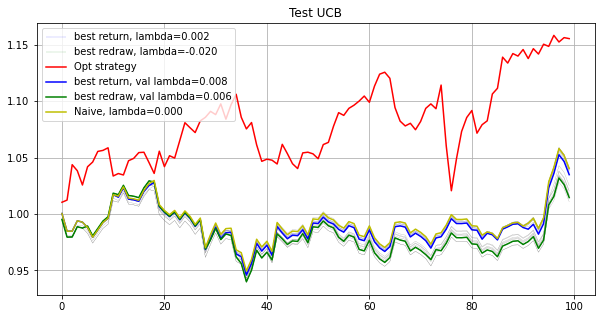

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
9.52072221113015e-08
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 

[ 0.0063  0.0131  0.0103  0.0055  0.0097  0.0109  0.0088  0.0144  0.0058
  0.0078  0.0049  0.0088  0.0092  0.008   0.0057  0.0093  0.0014  0.0047
  0.0135  0.0087  0.0096  0.0165  0.0113  0.0044  0.0147  0.0103  0.0093
  0.0115  0.0086 -0.      0.0063  0.0104  0.0113  0.0105  0.0113  0.0081
  0.0059  0.0085  0.0126  0.007   0.0171  0.0127  0.0114  0.0129  0.0026
  0.0094  0.0072  0.0072  0.0096  0.0074  0.0108  0.0047  0.0173  0.0149
  0.0106  0.0066  0.0103  0.0125  0.0086  0.0048  0.0097  0.0114  0.0081
  0.0058  0.0138  0.0095  0.0068  0.0096  0.0161  0.0076  0.0113  0.0163
  0.0179  0.0101  0.0097  0.011   0.0123  0.0133  0.0132  0.0046  0.01
  0.0123  0.0148  0.0138  0.0157  0.0127  0.0103  0.0128  0.0073  0.0103
  0.0112  0.0088  0.0135  0.011   0.0101  0.0086  0.013   0.013   0.014
  0.0051]
2.2623995686876568e-06
[0.0063 0.0131 0.0103 0.0055 0.0097 0.0109 0.0088 0.0144 0.0058 0.0078
 0.0049 0.0088 0.0092 0.008  0.0056 0.0093 0.0014 0.0047 0.0135 0.0087
 0.0096 0.0165 0.0113 0.0

[0.0063 0.0131 0.0103 0.0055 0.0097 0.0109 0.0089 0.0144 0.0058 0.0078
 0.0049 0.0088 0.0092 0.008  0.0057 0.0093 0.0014 0.0047 0.0135 0.0087
 0.0096 0.0165 0.0113 0.0044 0.0147 0.0103 0.0093 0.0115 0.0086 0.
 0.0063 0.0104 0.0113 0.0105 0.0113 0.0081 0.0059 0.0085 0.0126 0.007
 0.0171 0.0127 0.0114 0.0129 0.0026 0.0094 0.0072 0.0072 0.0096 0.0074
 0.0108 0.0047 0.0173 0.0149 0.0106 0.0066 0.0103 0.0125 0.0086 0.0048
 0.0097 0.0114 0.0081 0.0058 0.0138 0.0095 0.0068 0.0096 0.0161 0.0076
 0.0113 0.0163 0.0179 0.0101 0.0097 0.011  0.0123 0.0133 0.0132 0.0046
 0.01   0.0123 0.0148 0.0138 0.0157 0.0126 0.0103 0.0128 0.0073 0.0103
 0.0112 0.0088 0.0135 0.011  0.0101 0.0086 0.013  0.013  0.014  0.0051]
2.4108944140587875e-05
[0.0063 0.0131 0.0103 0.0055 0.0097 0.0109 0.0089 0.0144 0.0058 0.0078
 0.0049 0.0088 0.0092 0.008  0.0057 0.0093 0.0014 0.0047 0.0135 0.0087
 0.0096 0.0165 0.0113 0.0044 0.0147 0.0103 0.0093 0.0115 0.0086 0.
 0.0063 0.0104 0.0113 0.0105 0.0113 0.0081 0.0059 0.0085 0.012

[0.0022 0.0152 0.0093 0.0045 0.0098 0.0111 0.0077 0.0155 0.0013 0.0043
 0.0002 0.0077 0.0079 0.0065 0.0016 0.0136 0.     0.0015 0.0114 0.0069
 0.0118 0.0196 0.0122 0.0041 0.0146 0.0083 0.0095 0.0131 0.0075 0.
 0.0072 0.0123 0.011  0.0082 0.0108 0.0067 0.0019 0.0078 0.0141 0.0053
 0.0188 0.011  0.013  0.0135 0.     0.0126 0.006  0.0073 0.0115 0.0041
 0.011  0.0038 0.0204 0.015  0.0101 0.0017 0.0091 0.0106 0.0091 0.0054
 0.01   0.0148 0.0073 0.0071 0.0148 0.0097 0.0072 0.0102 0.0196 0.0062
 0.012  0.0213 0.0184 0.0072 0.0099 0.0107 0.0149 0.0154 0.0159 0.0042
 0.0078 0.0143 0.0186 0.0158 0.0192 0.0143 0.0107 0.0155 0.0069 0.011
 0.0115 0.0078 0.0161 0.0105 0.0103 0.0071 0.0102 0.0154 0.0159 0.0057]
0.07099422867427975
[0.0022 0.0151 0.0093 0.0045 0.0098 0.0112 0.0077 0.0155 0.0013 0.0043
 0.0002 0.0077 0.0079 0.0065 0.0016 0.0136 0.     0.0015 0.0114 0.0069
 0.0118 0.0196 0.0122 0.0041 0.0146 0.0083 0.0095 0.0131 0.0075 0.
 0.0072 0.0123 0.0109 0.0082 0.0108 0.0067 0.0019 0.0078 0.0141 0

[ 0.0009  0.0158  0.0077  0.003   0.0091  0.0112  0.0077  0.0171  0.
  0.0037  0.      0.0073  0.0061  0.0067  0.003   0.0133 -0.      0.001
  0.0097  0.0061  0.0113  0.0211  0.0126  0.0055  0.0135  0.0077  0.0093
  0.0117  0.0072  0.      0.006   0.0126  0.0108  0.0071  0.0115  0.0083
  0.0014  0.0066  0.0147  0.0036  0.018   0.0113  0.0134  0.0142 -0.
  0.013   0.0057  0.0088  0.0104  0.0041  0.0112  0.003   0.0209  0.0141
  0.0101  0.0017  0.0089  0.0112  0.0063  0.0058  0.0099  0.0149  0.0078
  0.0069  0.0168  0.0098  0.0069  0.0106  0.0212  0.0059  0.0124  0.0215
  0.0188  0.0091  0.01    0.011   0.0152  0.0161  0.0168  0.005   0.0064
  0.0148  0.0187  0.017   0.0202  0.0149  0.0105  0.0155  0.0069  0.011
  0.012   0.0073  0.0167  0.0099  0.0101  0.0066  0.0103  0.0159  0.0173
  0.0069]
0.06782959827983896
[ 0.0009  0.0158  0.0077  0.003   0.0091  0.0112  0.0077  0.0171 -0.
  0.0037 -0.      0.0073  0.0061  0.0067  0.003   0.0133  0.      0.001
  0.0097  0.0061  0.0113  0.0211  0.

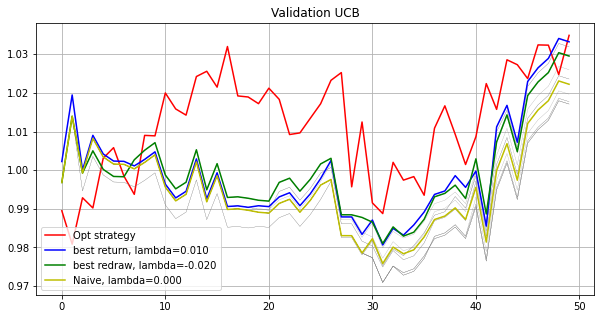

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[0.0077 0.0117 0.0052 0.0091 0.0096 0.0089 0.009  0.0112 0.0087 0.008
 0.0051 0.0085 0.0129 0.0114 0.0129 0.0072 0.0101 0.0153 0.0105 0.009
 0.0092 0.0106 0.0107 0.0113 0.011  0.011  0.0093 0.0062 0.0094 0.0087
 0.0079 0.0033 0.0101 0.0082 0.0115 0.0101 0.0092 0.0092 0.0115 0.0061
 0.0124 0.0108 0.0103 0.0114 0.0065 0.0101 0.0064 0.0109 0.0133 0.0063
 0.012  0.0106 0.0133 0.0145 0.011  0.0061 0.0092 0.0115 0.0081 0.0055
 0.0108 0.0129 0.0093 0.0054 0.0138 0.0109 0.0101 0.0122 0.0135 0.0079
 0.0088 0.0148 0.0093 0.0104 0.0089 0.0098 0.011  0.0114 0.0118 0.0109
 0.0106 0.0112 0.0094 0.013  0.0144 0.0118 0.0089 0.0107 0.0087 0.0095
 0.011  0.01   0.0121 0.0094 0.0101 0.0089 0.0105 0.0114 0.0114 0.0066]
2.5656232141438653e-06
[0.0077 0.0117 0.0052 0.0091 0.0096 0.0089 0.009  0.0112 0.0087 0.008
 0.0051 0.0085 0.0129 0.0114 0.0129 0.0072 0.0101 0.0153 0.0105 0.009
 0.0092 0.0106 0.0107 0.0113 0.011  0.011  0.0093 0.0062 0.0094 0.0087
 0.0079 0.0033 0.0101 0.0082 0.0115 0.0101 0.0092 0.0092 

[0.006  0.0122 0.0033 0.0101 0.0095 0.0092 0.009  0.0116 0.0069 0.007
 0.0034 0.0078 0.0136 0.0105 0.0132 0.0065 0.0087 0.0141 0.0116 0.0085
 0.0095 0.0112 0.0108 0.0105 0.0113 0.0106 0.009  0.0071 0.0092 0.0094
 0.007  0.005  0.0099 0.0081 0.0118 0.0112 0.0085 0.0092 0.0117 0.0048
 0.0147 0.011  0.0105 0.0121 0.0048 0.0109 0.0055 0.0113 0.0125 0.0062
 0.0119 0.0101 0.013  0.0146 0.0106 0.0055 0.0094 0.0124 0.0084 0.0038
 0.0109 0.0138 0.0098 0.0053 0.0155 0.0108 0.0099 0.0133 0.0143 0.0075
 0.0089 0.0143 0.0092 0.0095 0.0088 0.0096 0.0115 0.011  0.0124 0.0109
 0.011  0.0119 0.0095 0.014  0.0157 0.0122 0.0092 0.0116 0.0084 0.0096
 0.0111 0.0092 0.0126 0.009  0.0101 0.0093 0.0102 0.012  0.0117 0.0066]
8.489075205698852e-07
[0.006  0.0122 0.0033 0.0101 0.0095 0.0092 0.009  0.0116 0.0069 0.007
 0.0034 0.0078 0.0136 0.0105 0.0132 0.0065 0.0087 0.0141 0.0116 0.0085
 0.0095 0.0112 0.0108 0.0105 0.0113 0.0106 0.009  0.0071 0.0092 0.0094
 0.007  0.005  0.0099 0.0081 0.0118 0.0112 0.0085 0.0092

[0.0049 0.0123 0.0022 0.009  0.0094 0.0085 0.0088 0.012  0.0073 0.0065
 0.0031 0.0076 0.014  0.0101 0.0127 0.0069 0.0094 0.0131 0.0119 0.0082
 0.0101 0.0114 0.0109 0.0111 0.0113 0.0102 0.0095 0.0071 0.0091 0.0091
 0.0069 0.0052 0.0092 0.0077 0.0117 0.0111 0.0077 0.0094 0.0115 0.0044
 0.0142 0.0101 0.0105 0.0115 0.005  0.0111 0.0056 0.0114 0.0127 0.0063
 0.0119 0.0098 0.0136 0.0154 0.0108 0.006  0.0091 0.0125 0.0077 0.0037
 0.0113 0.014  0.0098 0.0059 0.0162 0.011  0.0103 0.0133 0.0147 0.0081
 0.009  0.0151 0.0088 0.0097 0.0088 0.0096 0.0116 0.0116 0.0126 0.0103
 0.0109 0.012  0.0097 0.0142 0.0159 0.0124 0.0093 0.0115 0.0083 0.0097
 0.0114 0.0094 0.0128 0.0092 0.01   0.0092 0.01   0.0122 0.0119 0.007 ]
5.9303883644112876e-09
[0.0049 0.0123 0.0022 0.009  0.0094 0.0085 0.0088 0.012  0.0073 0.0065
 0.0031 0.0076 0.014  0.0101 0.0127 0.0069 0.0094 0.0131 0.0119 0.0082
 0.0101 0.0114 0.0109 0.0111 0.0113 0.0102 0.0095 0.0071 0.0091 0.0091
 0.0069 0.0052 0.0092 0.0077 0.0117 0.0111 0.0077 0.0

[ 0.0006  0.014  -0.      0.0092  0.0099  0.0034  0.0069  0.0107  0.0057
  0.0045  0.0007  0.0076  0.0147  0.0118  0.0151  0.0046  0.0051  0.0081
  0.0142  0.007   0.0144  0.0136  0.0118  0.0139  0.011   0.0102  0.0117
  0.01    0.0097  0.0042  0.0076  0.0071  0.0046  0.006   0.0128  0.0109
  0.0001  0.0107  0.0166  0.0018  0.0156  0.0026  0.0113  0.0119  0.0027
  0.0109  0.003   0.0079  0.0111  0.0069  0.0129  0.0107  0.0118  0.0182
  0.0146  0.007   0.0102  0.0102  0.0081 -0.      0.0108  0.0153  0.0122
  0.0009  0.0167  0.0132  0.0108  0.016   0.0181  0.0055  0.0102  0.0151
  0.0096  0.0133  0.0094  0.0099  0.0127  0.0122  0.0141  0.0091  0.0106
  0.0134  0.0121  0.0153  0.0203  0.0147  0.0085  0.012   0.0086  0.0105
  0.013   0.0073  0.0149  0.008   0.0103  0.0074  0.0127  0.0131  0.0134
  0.0086]
0.00010595025319902171
[ 0.0018  0.0142  0.0003  0.0097  0.0099  0.0035  0.0068  0.0107  0.0058
  0.0042  0.0006  0.0075  0.014   0.0116  0.0149  0.0033  0.005   0.0086
  0.0145  0.0068  

[ 0.0018  0.0142  0.0003  0.0097  0.0099  0.0035  0.0068  0.0107  0.0058
  0.0042  0.0006  0.0075  0.014   0.0116  0.0149  0.0033  0.005   0.0086
  0.0145  0.0068  0.0143  0.013   0.0119  0.0134  0.0114  0.01    0.0117
  0.0103  0.0096  0.0039  0.0075  0.007   0.0046  0.0058  0.0126  0.0113
 -0.      0.0109  0.0166  0.0013  0.0163  0.003   0.0114  0.0114  0.0026
  0.0109  0.0029  0.0074  0.0111  0.0061  0.0129  0.0106  0.0126  0.0186
  0.0143  0.0064  0.0102  0.0105  0.008  -0.      0.0106  0.0157  0.0119
  0.0006  0.0169  0.0132  0.0107  0.016   0.0184  0.0048  0.0103  0.0162
  0.0096  0.0132  0.0093  0.0099  0.0129  0.0121  0.0144  0.0089  0.0108
  0.0134  0.0121  0.0154  0.0207  0.0149  0.0087  0.0124  0.0084  0.0105
  0.0132  0.0069  0.0151  0.0081  0.0103  0.007   0.0127  0.0133  0.0136
  0.0087]
1.5877409023537978e-05
[ 0.0018  0.0142  0.0003  0.0097  0.0099  0.0035  0.0068  0.0107  0.0058
  0.0042  0.0006  0.0075  0.014   0.0116  0.0149  0.0033  0.005   0.0086
  0.0145  0.0068  

[-0.      0.0152  0.0003  0.0091  0.0105  0.005   0.0065  0.0099  0.0061
  0.0027  0.      0.0071  0.0138  0.01    0.0156  0.0018  0.0045  0.0087
  0.0146  0.0052  0.0159  0.0089  0.0122  0.0137  0.0116  0.0127  0.0114
  0.0091  0.0093 -0.0001  0.0056  0.0109  0.0057  0.0068  0.0144  0.0104
  0.      0.0117  0.0168  0.0008  0.0133  0.0033  0.0126  0.0108  0.0008
  0.0116  0.0024  0.0094  0.0106  0.006   0.0137  0.012   0.0154  0.0193
  0.0134  0.0011  0.0103  0.0082  0.0073  0.0004  0.0101  0.0168  0.0131
  0.0011  0.0172  0.0145  0.0103  0.0169  0.0202  0.0036  0.0109  0.0146
  0.0099  0.0127  0.0093  0.0091  0.0132  0.0116  0.0158  0.006   0.0108
  0.014   0.0113  0.016   0.0223  0.0157  0.0104  0.0131  0.0085  0.0113
  0.0137  0.006   0.0163  0.008   0.0103  0.006   0.0132  0.0146  0.0149
  0.0103]
9.429317957715776e-05
[ 0.      0.0151  0.0003  0.0091  0.0105  0.005   0.0065  0.0099  0.0061
  0.0027  0.      0.0071  0.0138  0.01    0.0156  0.0018  0.0045  0.0087
  0.0146  0.0052  0

[ 0.      0.0153  0.0012  0.0095  0.0104  0.0053  0.0065  0.0101  0.0045
  0.0023  0.      0.007   0.0135  0.0098  0.0148  0.0016  0.0044  0.0078
  0.0146  0.0049  0.0161  0.0093  0.0122  0.0137  0.0119  0.0124  0.0122
  0.009   0.0094  0.      0.0057  0.0095  0.0058  0.0066  0.0146  0.0099
 -0.      0.0112  0.0168  0.0015  0.0143  0.0026  0.0127  0.0108  0.0011
  0.0128  0.0026  0.0101  0.0107  0.0062  0.0144  0.0111  0.0158  0.0194
  0.0133  0.0008  0.0103  0.0087  0.007   0.0006  0.0103  0.017   0.0128
  0.0014  0.0179  0.0143  0.0102  0.0165  0.0205  0.0034  0.011   0.0146
  0.0101  0.0127  0.0092  0.0089  0.0135  0.0114  0.0159  0.0058  0.0103
  0.0141  0.011   0.016   0.0224  0.0159  0.0107  0.0129  0.0084  0.0113
  0.0134  0.0055  0.0165  0.008   0.0104  0.0055  0.013   0.0148  0.0152
  0.0108]
3.7438141008070254e-05
[0.     0.0153 0.0012 0.0095 0.0104 0.0053 0.0065 0.0101 0.0045 0.0023
 0.     0.007  0.0135 0.0098 0.0148 0.0016 0.0044 0.0078 0.0146 0.0049
 0.0161 0.0093 0.0122 

[0.     0.0153 0.0012 0.0095 0.0104 0.0053 0.0065 0.0101 0.0045 0.0023
 0.     0.007  0.0135 0.0098 0.0148 0.0016 0.0044 0.0078 0.0146 0.0049
 0.0161 0.0093 0.0122 0.0137 0.0119 0.0124 0.0122 0.009  0.0094 0.
 0.0057 0.0095 0.0058 0.0066 0.0146 0.0099 0.     0.0112 0.0168 0.0015
 0.0143 0.0026 0.0127 0.0108 0.0011 0.0128 0.0026 0.0101 0.0107 0.0062
 0.0144 0.0111 0.0158 0.0194 0.0133 0.0008 0.0103 0.0087 0.007  0.0006
 0.0103 0.017  0.0128 0.0014 0.0179 0.0143 0.0102 0.0165 0.0205 0.0034
 0.011  0.0146 0.0101 0.0127 0.0092 0.0089 0.0135 0.0114 0.0159 0.0058
 0.0103 0.0141 0.011  0.016  0.0224 0.0159 0.0107 0.0129 0.0084 0.0113
 0.0134 0.0055 0.0165 0.008  0.0104 0.0055 0.013  0.0148 0.0152 0.0108]
5.387487560834472e-07
[ 0.      0.0153  0.0012  0.0095  0.0104  0.0053  0.0065  0.0101  0.0045
  0.0023 -0.      0.007   0.0135  0.0098  0.0148  0.0016  0.0044  0.0078
  0.0146  0.0049  0.0161  0.0093  0.0122  0.0137  0.0119  0.0124  0.0122
  0.009   0.0094  0.      0.0057  0.0095  0.0058  0.

[-0.      0.0153  0.0012  0.0095  0.0104  0.0053  0.0065  0.0101  0.0045
  0.0023  0.      0.007   0.0135  0.0098  0.0148  0.0016  0.0044  0.0078
  0.0146  0.0049  0.0161  0.0093  0.0122  0.0137  0.0119  0.0124  0.0122
  0.009   0.0094  0.      0.0057  0.0095  0.0058  0.0066  0.0146  0.0099
  0.      0.0112  0.0168  0.0015  0.0143  0.0026  0.0127  0.0108  0.0011
  0.0128  0.0026  0.0101  0.0107  0.0062  0.0144  0.0111  0.0158  0.0194
  0.0133  0.0008  0.0103  0.0087  0.007   0.0006  0.0103  0.017   0.0128
  0.0014  0.0179  0.0143  0.0102  0.0165  0.0205  0.0034  0.011   0.0146
  0.0101  0.0127  0.0092  0.0089  0.0135  0.0114  0.0159  0.0058  0.0103
  0.0141  0.011   0.016   0.0224  0.0159  0.0107  0.0129  0.0084  0.0113
  0.0134  0.0055  0.0165  0.008   0.0104  0.0055  0.013   0.0148  0.0152
  0.0108]
8.375811520886287e-07
[-0.      0.0153  0.0012  0.0095  0.0104  0.0053  0.0065  0.0101  0.0045
  0.0023  0.      0.007   0.0135  0.0098  0.0148  0.0016  0.0044  0.0078
  0.0146  0.0049  0

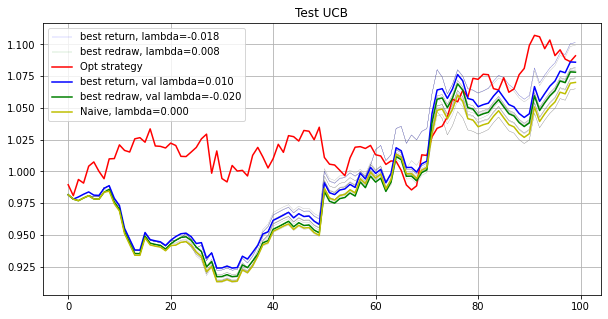

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[0.005  0.0099 0.0102 0.0114 0.0113 0.0097 0.0104 0.0093 0.0088 0.0077
 0.0106 0.0108 0.0119 0.0066 0.0088 0.0092 0.0108 0.0107 0.0071 0.0167
 0.0131 0.0085 0.0079 0.0051 0.0096 0.0109 0.0098 0.0102 0.01   0.0121
 0.0086 0.0043 0.0094 0.0112 0.0111 0.0121 0.0053 0.0115 0.0114 0.0085
 0.0088 0.0101 0.01   0.0121 0.0109 0.0092 0.013  0.0072 0.0052 0.0098
 0.0068 0.011  0.0103 0.0121 0.0102 0.008  0.0097 0.009  0.0101 0.0104
 0.0071 0.0118 0.0123 0.0115 0.0118 0.0125 0.0099 0.0113 0.0095 0.0099
 0.0095 0.0107 0.0102 0.0048 0.01   0.0101 0.0092 0.0124 0.011  0.0113
 0.0109 0.0096 0.0092 0.0081 0.0108 0.0109 0.0108 0.0107 0.0098 0.0099
 0.0108 0.0119 0.0096 0.0112 0.011  0.0101 0.0113 0.0118 0.0121 0.0117]
0.14213638544249071
[0.005  0.0099 0.0102 0.0114 0.0113 0.0097 0.0104 0.0093 0.0088 0.0077
 0.0106 0.0108 0.0119 0.0066 0.0088 0.0092 0.0108 0.0107 0.0071 0.0167
 0.0131 0.0085 0.0079 0.0051 0.0096 0.0109 0.009

[0.0002 0.0074 0.0102 0.0125 0.0124 0.0096 0.0107 0.0087 0.0081 0.0062
 0.0109 0.0076 0.0125 0.0048 0.0092 0.0101 0.0101 0.0114 0.0029 0.0153
 0.0149 0.0089 0.0074 0.0037 0.0093 0.0118 0.009  0.0103 0.0084 0.0123
 0.0066 0.0045 0.0089 0.0108 0.0108 0.0107 0.0076 0.0132 0.0122 0.0075
 0.0083 0.0104 0.0098 0.0131 0.0107 0.0102 0.0131 0.0074 0.0054 0.0098
 0.0044 0.0099 0.0126 0.0157 0.0096 0.0092 0.009  0.0082 0.0096 0.0104
 0.006  0.0129 0.0136 0.0126 0.0116 0.0128 0.0104 0.0112 0.0094 0.01
 0.0096 0.0096 0.0096 0.0049 0.0103 0.0102 0.0102 0.0145 0.0119 0.0102
 0.0122 0.009  0.0077 0.0076 0.0102 0.0133 0.0107 0.0113 0.0095 0.0103
 0.0113 0.0124 0.0113 0.0112 0.0113 0.0115 0.0122 0.0137 0.013  0.0123]
2.427109602144199e-05
[0.0002 0.0074 0.0102 0.0125 0.0124 0.0096 0.0107 0.0087 0.0081 0.0062
 0.0109 0.0076 0.0125 0.0048 0.0092 0.0101 0.0101 0.0114 0.0029 0.0153
 0.0149 0.0089 0.0074 0.0037 0.0093 0.0118 0.009  0.0103 0.0084 0.0123
 0.0066 0.0045 0.0089 0.0108 0.0108 0.0107 0.0076 0.0132

[-0.      0.0061  0.0106  0.014   0.0158  0.0108  0.0118  0.0073  0.0068
  0.0024  0.0123  0.0027  0.013   0.      0.0095  0.0043  0.0057  0.0118
  0.0063  0.017   0.0184  0.0106  0.0044 -0.      0.0091  0.0165  0.0084
  0.006   0.0056  0.0136  0.004   0.0117  0.009   0.0085  0.0109  0.0103
 -0.      0.0117  0.0149  0.0061  0.0059  0.0119  0.0094  0.0149  0.0053
  0.0118  0.0147  0.0054  0.0056  0.009   0.0016  0.0141  0.0146  0.0168
  0.0079  0.0041  0.0135  0.0108  0.0117  0.0097  0.0016  0.0155  0.0149
  0.0193  0.0138  0.0137  0.0158  0.0124  0.0059  0.0105  0.0099  0.0124
  0.0098  0.0019  0.0107  0.0095  0.0106  0.0093  0.0163  0.0069  0.0143
  0.0127  0.007   0.0072  0.0102  0.0158  0.0115  0.0135  0.0051  0.0111
  0.0115  0.0136  0.0124  0.011   0.0105  0.0106  0.0136  0.0163  0.0132
  0.0116]
6.267200894563877e-05
[ 0.      0.0061  0.0106  0.014   0.0158  0.0108  0.0118  0.0073  0.0068
  0.0024  0.0123  0.0027  0.013   0.      0.0095  0.0043  0.0057  0.0118
  0.0063  0.017   0

[0.     0.0061 0.0106 0.014  0.0157 0.0108 0.0118 0.0073 0.0068 0.0024
 0.0123 0.0027 0.013  0.     0.0095 0.0043 0.0057 0.0118 0.0063 0.017
 0.0184 0.0106 0.0044 0.     0.0091 0.0165 0.0084 0.006  0.0056 0.0136
 0.004  0.0118 0.009  0.0085 0.0109 0.0103 0.     0.0117 0.0149 0.0061
 0.0059 0.0119 0.0094 0.0149 0.0053 0.0118 0.0148 0.0054 0.0056 0.009
 0.0016 0.014  0.0146 0.0168 0.0079 0.0041 0.0135 0.0109 0.0117 0.0097
 0.0016 0.0155 0.0149 0.0193 0.0138 0.0137 0.0158 0.0124 0.0059 0.0105
 0.0099 0.0123 0.0098 0.0019 0.0107 0.0095 0.0106 0.0093 0.0163 0.0069
 0.0143 0.0127 0.007  0.0072 0.0102 0.0158 0.0115 0.0135 0.0051 0.0111
 0.0116 0.0136 0.0124 0.011  0.0105 0.0106 0.0136 0.0163 0.0132 0.0116]
0.0002483785771206054
[0.     0.0061 0.0106 0.014  0.0157 0.0108 0.0118 0.0073 0.0068 0.0024
 0.0123 0.0027 0.013  0.     0.0095 0.0043 0.0057 0.0118 0.0063 0.017
 0.0184 0.0106 0.0044 0.     0.0091 0.0165 0.0084 0.006  0.0056 0.0136
 0.004  0.0118 0.009  0.0085 0.0109 0.0103 0.     0.0117 

[ 0.      0.0061  0.0106  0.014   0.0157  0.0108  0.0118  0.0073  0.0068
  0.0024  0.0123  0.0027  0.013   0.      0.0095  0.0043  0.0057  0.0118
  0.0063  0.017   0.0184  0.0105  0.0044  0.      0.0091  0.0165  0.0084
  0.006   0.0056  0.0136  0.004   0.0117  0.009   0.0085  0.0109  0.0103
 -0.      0.0117  0.0149  0.0061  0.0059  0.0119  0.0094  0.0149  0.0053
  0.0118  0.0148  0.0054  0.0056  0.009   0.0016  0.014   0.0146  0.0168
  0.0079  0.0041  0.0135  0.0109  0.0117  0.0097  0.0016  0.0155  0.0149
  0.0193  0.0138  0.0137  0.0158  0.0124  0.0059  0.0105  0.0099  0.0124
  0.0097  0.0019  0.0107  0.0095  0.0106  0.0093  0.0163  0.0069  0.0143
  0.0127  0.007   0.0072  0.0102  0.0158  0.0115  0.0135  0.0051  0.0111
  0.0116  0.0136  0.0124  0.011   0.0105  0.0106  0.0136  0.0163  0.0132
  0.0116]
1.6215912617292e-05
[-0.      0.0061  0.0106  0.014   0.0157  0.0108  0.0118  0.0073  0.0068
  0.0024  0.0123  0.0027  0.013   0.      0.0095  0.0043  0.0057  0.0118
  0.0063  0.017   0.0

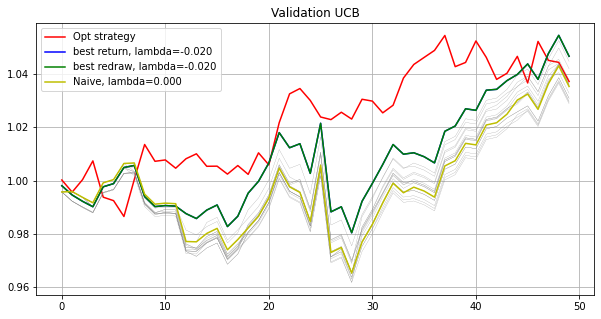

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[0.0031 0.006  0.0099 0.0118 0.0108 0.0103 0.0104 0.0088 0.0085 0.0071
 0.0115 0.0085 0.0122 0.005  0.0095 0.0094 0.0085 0.0093 0.0071 0.0106
 0.0146 0.0102 0.012  0.0037 0.0092 0.0122 0.0083 0.009  0.0077 0.0124
 0.0104 0.0104 0.0096 0.0111 0.0086 0.0103 0.0114 0.0113 0.0116 0.0088
 0.0079 0.0101 0.0082 0.0122 0.0128 0.008  0.0129 0.0087 0.0075 0.0093
 0.0073 0.0114 0.012  0.0111 0.0081 0.0077 0.0089 0.0106 0.01   0.0088
 0.0056 0.0113 0.0121 0.0117 0.0102 0.0125 0.0102 0.0089 0.0088 0.0105
 0.0096 0.0116 0.01   0.0108 0.0105 0.0101 0.0101 0.01   0.0119 0.0099
 0.0131 0.0095 0.0093 0.0119 0.0097 0.0139 0.011  0.0105 0.0103 0.0099
 0.0107 0.0118 0.0096 0.0111 0.0104 0.0106 0.0108 0.0119 0.013  0.0103]
1.1558657311999156e-05
[0.0015 0.0074 0.0099 0.0121 0.0115 0.0104 0.0105 0.0085 0.0082 0.0059
 0.012  0.0093 0.0128 0.0039 0.0079 0.0073 0.0087 0.0093 0.0072 0.011
 0.0149 0.0101 0.0126 0.0015 0.0091 0.0135 0.0076 0.009  0.0074 0.0125
 0.0101 0.0089 0.0095 0.0097 0.0093 0.0099 0.012  0.01

[0.     0.0049 0.0101 0.0132 0.0133 0.0101 0.0105 0.0086 0.0073 0.004
 0.0137 0.0023 0.0139 0.0012 0.0047 0.0083 0.0111 0.009  0.0125 0.0092
 0.0155 0.0089 0.0118 0.     0.0089 0.0148 0.0065 0.0101 0.0066 0.0124
 0.0073 0.0088 0.0094 0.0062 0.0072 0.01   0.013  0.0111 0.0132 0.0086
 0.0087 0.0116 0.0097 0.0138 0.0096 0.0033 0.0113 0.006  0.004  0.0089
 0.009  0.0136 0.012  0.013  0.0082 0.0091 0.0104 0.0087 0.0096 0.0099
 0.0029 0.0113 0.0133 0.0111 0.0101 0.0157 0.0112 0.0108 0.0087 0.0105
 0.0094 0.0139 0.012  0.0111 0.0102 0.0104 0.0086 0.011  0.0156 0.0094
 0.0167 0.008  0.009  0.0112 0.009  0.0147 0.0119 0.0111 0.0086 0.0101
 0.0108 0.0133 0.0134 0.011  0.012  0.0106 0.0127 0.0144 0.0148 0.0113]
6.8538216784383315e-06
[ 0.      0.0042  0.0102  0.0141  0.0143  0.0104  0.0108  0.0082  0.0067
  0.0026  0.0149  0.0002  0.0148 -0.      0.0014  0.0073  0.0126  0.0089
  0.0138  0.0086  0.0177  0.008   0.0107  0.      0.0086  0.0143  0.0058
  0.0101  0.0051  0.0127  0.0067  0.0096  0.0094

[ 0.      0.0042  0.0102  0.0142  0.0143  0.0104  0.0108  0.0082  0.0067
  0.0026  0.0149  0.0002  0.0148 -0.0001  0.0014  0.0073  0.0126  0.0089
  0.0138  0.0086  0.0177  0.008   0.0107 -0.      0.0086  0.0143  0.0058
  0.0101  0.0051  0.0127  0.0067  0.0096  0.0094  0.0044  0.0068  0.0081
  0.0152  0.0104  0.014   0.0094  0.0088  0.0124  0.0103  0.0136  0.0071
  0.0038  0.0105  0.0039  0.0019  0.0086  0.0092  0.0127  0.0124  0.0137
  0.0076  0.0075  0.0099  0.0094  0.0097  0.0113  0.002   0.0122  0.0142
  0.0112  0.011   0.0156  0.0111  0.0119  0.0072  0.011   0.0095  0.0147
  0.0125  0.0098  0.0104  0.0105  0.0085  0.0117  0.0166  0.0091  0.0182
  0.0092  0.0088  0.0108  0.0085  0.0153  0.0121  0.0124  0.0085  0.0099
  0.0114  0.0148  0.014   0.0101  0.0132  0.0116  0.0132  0.0144  0.0167
  0.0112]
3.9445346926814756e-05
[0.     0.0042 0.0102 0.0141 0.0143 0.0104 0.0108 0.0082 0.0067 0.0026
 0.0149 0.0002 0.0148 0.     0.0014 0.0073 0.0126 0.0089 0.0138 0.0086
 0.0177 0.008  0.0107 

[-0.      0.0035  0.0102  0.0147  0.0141  0.0104  0.011   0.0078  0.0061
  0.0012  0.0154  0.0012  0.0158 -0.     -0.      0.0077  0.0129  0.009
  0.014   0.0083  0.0193  0.0078  0.0119  0.0003  0.0084  0.015   0.0053
  0.01    0.0048  0.0145  0.0059  0.0104  0.009   0.0049  0.0068  0.0075
  0.0147  0.011   0.0146  0.0084  0.0085  0.0124  0.0099  0.0145  0.005
  0.0032  0.0122  0.0027  0.0009  0.0083  0.0083  0.0137  0.0121  0.0141
  0.0078  0.0069  0.01    0.0102  0.01    0.0108  0.0004  0.0129  0.0148
  0.0109  0.0116  0.0166  0.0113  0.0126  0.0061  0.0109  0.0091  0.0155
  0.0121  0.0096  0.0107  0.0105  0.0085  0.0101  0.0167  0.0094  0.0194
  0.0101  0.0083  0.0098  0.0083  0.0155  0.0123  0.0129  0.008   0.0098
  0.0119  0.0152  0.0131  0.0114  0.0133  0.0104  0.0135  0.0145  0.0154
  0.0112]
0.00022407530011987336
[-0.      0.0035  0.0102  0.0147  0.0141  0.0104  0.011   0.0078  0.0061
  0.0012  0.0154  0.0012  0.0158  0.     -0.      0.0077  0.0129  0.009
  0.014   0.0083  0.0

[-0.      0.0035  0.0102  0.0147  0.0141  0.0104  0.011   0.0078  0.0061
  0.0012  0.0153  0.0012  0.0158  0.      0.      0.0077  0.0129  0.009
  0.014   0.0083  0.0193  0.0078  0.0119  0.0003  0.0084  0.015   0.0053
  0.01    0.0048  0.0145  0.0059  0.0104  0.009   0.0049  0.0068  0.0075
  0.0147  0.011   0.0146  0.0084  0.0085  0.0124  0.0099  0.0145  0.005
  0.0032  0.0122  0.0027  0.0009  0.0083  0.0083  0.0137  0.0121  0.0141
  0.0078  0.0069  0.01    0.0102  0.01    0.0108  0.0005  0.0129  0.0148
  0.0109  0.0116  0.0166  0.0113  0.0126  0.0061  0.0109  0.0091  0.0155
  0.0121  0.0096  0.0107  0.0105  0.0085  0.0101  0.0167  0.0094  0.0194
  0.0101  0.0083  0.0098  0.0083  0.0155  0.0123  0.0129  0.008   0.0098
  0.0119  0.0152  0.0131  0.0114  0.0133  0.0104  0.0135  0.0145  0.0154
  0.0112]
2.040638603225757e-06
[-0.      0.0035  0.0102  0.0147  0.0141  0.0104  0.011   0.0078  0.0061
  0.0012  0.0153  0.0012  0.0158  0.     -0.      0.0077  0.0129  0.009
  0.014   0.0083  0.01

[-0.      0.0035  0.0102  0.0146  0.0141  0.0105  0.011   0.0078  0.0061
  0.0012  0.0153  0.0012  0.0158  0.      0.      0.0077  0.0129  0.009
  0.014   0.0083  0.0193  0.0078  0.0119  0.0003  0.0084  0.015   0.0053
  0.0101  0.0048  0.0145  0.0059  0.0103  0.009   0.0049  0.0068  0.0075
  0.0147  0.011   0.0146  0.0084  0.0085  0.0124  0.0099  0.0145  0.005
  0.0032  0.0122  0.0027  0.0009  0.0083  0.0083  0.0137  0.0121  0.0141
  0.0078  0.0069  0.01    0.0103  0.01    0.0108  0.0004  0.0129  0.0148
  0.0109  0.0116  0.0166  0.0113  0.0126  0.0061  0.0109  0.009   0.0156
  0.0121  0.0096  0.0107  0.0105  0.0085  0.0101  0.0167  0.0094  0.0194
  0.0101  0.0083  0.0098  0.0083  0.0155  0.0123  0.0129  0.008   0.0097
  0.0119  0.0152  0.0131  0.0114  0.0133  0.0104  0.0135  0.0145  0.0154
  0.0112]
0.00029734472962780517
[-0.      0.0035  0.0102  0.0146  0.0141  0.0105  0.011   0.0078  0.0061
  0.0012  0.0153  0.0012  0.0158  0.     -0.      0.0077  0.0129  0.009
  0.014   0.0083  0.0

[ 0.     -0.      0.0104  0.0175  0.0138  0.0111  0.0119  0.0069  0.0047
  0.      0.0169  0.0008  0.0146 -0.     -0.      0.0084  0.0168  0.0088
  0.0233  0.0089  0.0231  0.0057  0.0077  0.      0.0081  0.0131  0.0031
  0.0124  0.0023  0.0183  0.0037  0.0133  0.0088  0.0036  0.0038  0.0051
  0.0058  0.0098  0.0167  0.0066  0.0063  0.0137  0.01    0.0158 -0.
  0.0004  0.0113 -0.     -0.      0.0081  0.0069  0.0145  0.0124  0.0153
  0.008   0.0056  0.0099  0.0116  0.0106  0.0119  0.      0.0154  0.0155
  0.011   0.0134  0.0179  0.012   0.0125  0.005   0.0119  0.0092  0.0154
  0.013   0.0076  0.0113  0.0101  0.0089  0.0107  0.0183  0.0075  0.0212
  0.014   0.0078  0.012   0.0068  0.0159  0.0127  0.0143  0.0056  0.0099
  0.0136  0.0155  0.0115  0.0114  0.0141  0.0093  0.0151  0.0153  0.0189
  0.0104]
5.497319305317675e-05
[ 0.     -0.      0.0104  0.0175  0.0138  0.0111  0.0119  0.0069  0.0047
  0.      0.0169  0.0008  0.0146  0.     -0.      0.0084  0.0168  0.0088
  0.0233  0.0089  0.023

[ 0.     -0.      0.0104  0.0175  0.0138  0.0111  0.0119  0.0069  0.0047
 -0.      0.0169  0.0008  0.0146  0.     -0.      0.0084  0.0168  0.0088
  0.0233  0.0089  0.0231  0.0057  0.0077 -0.      0.0081  0.0131  0.0031
  0.0124  0.0023  0.0183  0.0037  0.0133  0.0087  0.0036  0.0038  0.0051
  0.0058  0.0098  0.0167  0.0065  0.0063  0.0137  0.0101  0.0158 -0.
  0.0004  0.0113 -0.     -0.      0.0081  0.0069  0.0145  0.0125  0.0153
  0.008   0.0056  0.0099  0.0116  0.0106  0.0119  0.0001  0.0154  0.0155
  0.011   0.0134  0.0179  0.012   0.0125  0.005   0.0119  0.0093  0.0154
  0.013   0.0076  0.0113  0.0101  0.0089  0.0107  0.0183  0.0075  0.0212
  0.014   0.0078  0.012   0.0068  0.0158  0.0127  0.0143  0.0056  0.0099
  0.0136  0.0155  0.0115  0.0114  0.0141  0.0093  0.0151  0.0153  0.0189
  0.0104]
9.47311715928263e-06
[ 0.     -0.      0.0104  0.0175  0.0138  0.0111  0.0119  0.0069  0.0047
 -0.      0.0169  0.0008  0.0146  0.     -0.      0.0084  0.0168  0.0088
  0.0233  0.0089  0.0231

[-0.      0.      0.0104  0.0175  0.0138  0.0111  0.012   0.0069  0.0047
 -0.      0.0169  0.0007  0.0146 -0.      0.      0.0084  0.0168  0.0088
  0.0234  0.0089  0.0231  0.0057  0.0077 -0.      0.0081  0.0131  0.0031
  0.0124  0.0023  0.0183  0.0037  0.0133  0.0087  0.0036  0.0038  0.0051
  0.0058  0.0098  0.0167  0.0066  0.0063  0.0137  0.01    0.0158  0.
  0.0004  0.0113  0.      0.      0.0081  0.0069  0.0145  0.0125  0.0153
  0.008   0.0056  0.0099  0.0116  0.0106  0.0119 -0.      0.0154  0.0155
  0.011   0.0134  0.0179  0.012   0.0125  0.005   0.0119  0.0093  0.0154
  0.013   0.0076  0.0113  0.0101  0.0089  0.0107  0.0183  0.0075  0.0212
  0.014   0.0078  0.012   0.0068  0.0158  0.0127  0.0143  0.0056  0.0099
  0.0136  0.0155  0.0115  0.0114  0.0141  0.0093  0.0151  0.0153  0.0189
  0.0104]
0.0001062016879711065
[ 0.     -0.      0.0104  0.0175  0.0138  0.0111  0.012   0.0069  0.0047
 -0.      0.0169  0.0007  0.0146 -0.     -0.      0.0084  0.0168  0.0088
  0.0234  0.0089  0.023

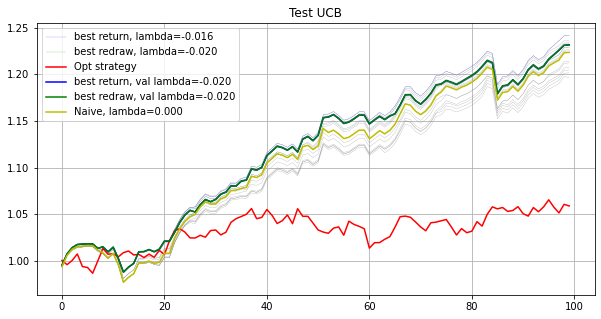

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
2.704258467520898e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01

[ 0.004   0.      0.0154  0.0133  0.0167  0.0143  0.0141  0.0082  0.0024
  0.0133  0.      0.0139  0.0014  0.0078  0.0108 -0.      0.009   0.0093
  0.0178  0.0073  0.0162  0.0127  0.0039  0.0021  0.      0.0063  0.0124
  0.0088  0.0058  0.0138  0.0105  0.0114  0.0148  0.0159  0.0045  0.0108
  0.0124  0.0117  0.0165  0.0048  0.0046  0.0038  0.0132  0.0125  0.0081
  0.0124  0.0142  0.0125  0.0126  0.0071  0.0115  0.0069  0.0059  0.0203
  0.0058  0.0029  0.0109  0.0115  0.0142  0.0079  0.0112  0.007   0.0111
  0.0126  0.0075  0.0108  0.0155  0.0002  0.0127  0.0057  0.0147  0.0123
  0.0094  0.0155  0.0136  0.0132  0.0091  0.0094  0.01    0.0116  0.007
  0.0131  0.0071  0.0134  0.0126  0.0076  0.0088  0.0102  0.0136  0.0117
  0.0155  0.0045  0.01    0.0103  0.0125  0.0151  0.0109  0.0077  0.0135
  0.0088]
7.893085281700544e-05
[0.004  0.     0.0154 0.0133 0.0167 0.0143 0.0141 0.0082 0.0024 0.0133
 0.     0.0139 0.0014 0.0078 0.0108 0.     0.009  0.0093 0.0178 0.0073
 0.0162 0.0127 0.0039 0.

[ 0.     -0.      0.0202  0.0176  0.0189  0.0149  0.0175  0.0028  0.
  0.0172  0.      0.0114 -0.      0.0037  0.0101  0.0048  0.0141  0.0095
  0.0206  0.0041  0.0167  0.0165 -0.      0.      0.      0.0024  0.0145
  0.006   0.0023  0.0188  0.0066  0.0128  0.0097  0.0238  0.0006  0.0102
  0.0116  0.0135  0.0119  0.0057  0.0008  0.      0.0158  0.0143  0.0062
  0.0133  0.0156  0.0127  0.0136  0.0005  0.0145  0.0085  0.0055  0.0226
  0.0001 -0.      0.0108  0.0133  0.018   0.0079  0.0172  0.0066  0.0142
  0.0132  0.0093  0.0114  0.0139  0.      0.0137  0.0023  0.0189  0.0188
  0.0076  0.0136  0.0151  0.0164  0.0112  0.0144  0.0052  0.0115  0.0139
  0.0014  0.0062  0.0138  0.0184  0.0099  0.0065  0.003   0.0113  0.0118
  0.0139  0.0066  0.0097  0.01    0.0148  0.0165  0.005   0.0054  0.0165
  0.0057]
5.775102670474956e-06
[-0.      0.      0.0202  0.0176  0.0189  0.0149  0.0175  0.0028  0.
  0.0172  0.      0.0114  0.      0.0037  0.0101  0.0048  0.0141  0.0095
  0.0206  0.0041  0.0167  0

[-0.     -0.      0.0202  0.0176  0.0189  0.0149  0.0175  0.0028  0.
  0.0172  0.      0.0114  0.      0.0037  0.0101  0.0048  0.0141  0.0095
  0.0206  0.0041  0.0167  0.0165 -0.      0.      0.      0.0024  0.0145
  0.006   0.0023  0.0188  0.0066  0.0128  0.0097  0.0238  0.0006  0.0102
  0.0116  0.0135  0.0119  0.0057  0.0008  0.      0.0158  0.0143  0.0062
  0.0133  0.0156  0.0127  0.0136  0.0005  0.0145  0.0085  0.0055  0.0226
  0.0001 -0.      0.0108  0.0133  0.018   0.0079  0.0172  0.0066  0.0142
  0.0132  0.0093  0.0114  0.0139 -0.      0.0137  0.0023  0.0189  0.0188
  0.0076  0.0136  0.0151  0.0164  0.0112  0.0144  0.0052  0.0115  0.0139
  0.0014  0.0062  0.0138  0.0184  0.01    0.0065  0.003   0.0113  0.0118
  0.0139  0.0066  0.0097  0.01    0.0148  0.0165  0.005   0.0054  0.0165
  0.0057]
8.925121445344426e-07
[-0.      0.      0.0212  0.0184  0.0193  0.0151  0.0181  0.0011  0.
  0.0166  0.      0.0121  0.      0.0026  0.0094  0.0054  0.015   0.0095
  0.0213  0.0026  0.0177  0

[ 0.      0.      0.0212  0.0185  0.0193  0.0151  0.0181  0.0011 -0.
  0.0165 -0.      0.0121 -0.      0.0026  0.0094  0.0054  0.015   0.0095
  0.0213  0.0026  0.0177  0.0159  0.      0.      0.      0.0014  0.0148
  0.0061  0.0016  0.0181  0.0045  0.013   0.0107  0.025   0.003   0.011
  0.0117  0.014   0.0107  0.0037  0.      0.      0.0165  0.0154  0.0051
  0.0134  0.016   0.0128  0.0135 -0.      0.0146  0.0071  0.0049  0.0229
  0.      0.      0.0112  0.0138  0.0185  0.0075  0.0175  0.0068  0.0147
  0.0133  0.0098  0.0117  0.0135  0.      0.0138  0.0023  0.0193  0.0191
  0.007   0.0144  0.0156  0.0162  0.0112  0.0153  0.0046  0.0108  0.0141
 -0.      0.0055  0.0138  0.0181  0.0093  0.0067  0.0008  0.0115  0.0122
  0.0157  0.0105  0.0094  0.0097  0.0149  0.0168  0.0041  0.0047  0.0168
  0.0047]
0.00013375312665004241
[ 0.      0.      0.0212  0.0185  0.0193  0.0151  0.0181  0.0011 -0.
  0.0165 -0.      0.0121 -0.      0.0026  0.0094  0.0054  0.015   0.0095
  0.0213  0.0026  0.0177  0

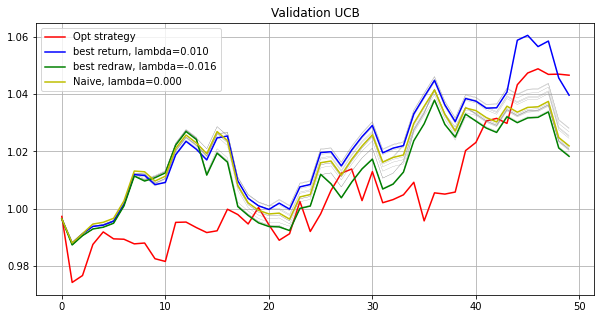

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[-0.      0.0016  0.0155  0.0144  0.0184  0.0184  0.0139  0.0079  0.0038
  0.01    0.0075  0.0051  0.0037  0.0103  0.0085  0.0095  0.0107  0.0114
  0.0167  0.0096  0.0114  0.0169 -0.      0.0068  0.0021  0.0098  0.0121
  0.0065  0.0063  0.0161  0.0072  0.0109  0.0147  0.0182  0.0014  0.0145
  0.0149  0.0098  0.0033  0.011   0.0134  0.0015  0.0191  0.01    0.0075
  0.0102  0.0141  0.0066  0.0153  0.012   0.0142  0.0126  0.009   0.0058
  0.003   0.0083  0.0109  0.0111  0.0119  0.0077  0.0134  0.0135  0.0068
  0.0121  0.0079  0.0116  0.0128  0.0027  0.0107  0.0091  0.0176  0.0078
  0.0082  0.0059  0.0127  0.0148  0.0119  0.0087  0.0045  0.0129  0.0055
  0.0054  0.0072  0.0104  0.008   0.0087  0.0082  0.0027  0.0139  0.0125
  0.0128  0.0134  0.013   0.0095  0.0144  0.0151  0.0036  0.0128  0.0145
  0.0076]
0.00023760377026102596
[ 0.      0.0016  0.0154  0.0144  0.0184  0.0184  0.0139  0.0079  0.0038
  0.01    0.0075  0.0051  0.0037  0.0103  0.0085  0.0095  0.0107  0.0114
  0.0167  0.0096  

[ 0.0019 -0.      0.0166  0.0156  0.0191  0.0196  0.0146  0.0077  0.0022
  0.0094  0.0082  0.004   0.003   0.0112  0.0082  0.0072  0.009   0.011
  0.0178  0.0091  0.0125  0.0165  0.      0.0063  0.0002  0.0091  0.0125
  0.0059  0.006   0.0168  0.0071  0.0108  0.0149  0.0199 -0.      0.0144
  0.0156  0.0112  0.0026  0.0112  0.0135  0.0005  0.0204  0.009   0.0061
  0.0105  0.0151  0.0072  0.0155  0.0116  0.0147  0.0123  0.0079  0.0059
  0.002   0.0079  0.0109  0.0111  0.0126  0.0073  0.0137  0.0124  0.0079
  0.0122  0.0074  0.0123  0.0132  0.0004  0.0113  0.0082  0.0178  0.008
  0.0077  0.0084  0.0136  0.0162  0.0114  0.0083  0.0043  0.0136  0.0057
  0.0054  0.0066  0.011   0.0076  0.0069  0.0075  0.0052  0.0145  0.0132
  0.013   0.0131  0.0128  0.0093  0.015   0.0157  0.0039  0.0118  0.0153
  0.0075]
5.9019384446556165e-06
[ 0.0019  0.      0.0166  0.0156  0.0191  0.0196  0.0146  0.0077  0.0022
  0.0094  0.0082  0.004   0.003   0.0112  0.0082  0.0072  0.009   0.011
  0.0178  0.0091  0.0

[-0.     -0.      0.0203  0.0196  0.0192  0.0187  0.017   0.007  -0.
  0.008   0.0087  0.0029 -0.      0.0084  0.0085  0.0083  0.0074  0.0107
  0.0203  0.0077  0.0135  0.0164 -0.      0.0114  0.      0.007   0.0135
  0.0064  0.0019  0.0146  0.0021  0.0116  0.0165  0.0202  0.      0.0186
  0.0147  0.01    0.0111  0.0113  0.0133 -0.      0.0228  0.0066  0.0021
  0.0094  0.0158  0.0068  0.015   0.0082  0.0182  0.0113  0.0076  0.0085
  0.0033  0.0003  0.0108  0.0149  0.0142  0.007   0.0178  0.0141  0.0106
  0.0133  0.008   0.0119  0.0112  0.      0.0122  0.0117  0.0191  0.0043
  0.0074  0.0051  0.0155  0.0152  0.0148  0.0122  0.0085  0.0147  0.0015
  0.0004  0.011   0.0113  0.0049  0.0026  0.008   0.003   0.0132  0.0138
  0.0123  0.0131  0.0129  0.0085  0.0138  0.0171  0.0019  0.0119  0.0168
  0.005 ]
1.6929549382531397e-05
[-0.     -0.      0.0203  0.0197  0.0192  0.0187  0.017   0.007  -0.
  0.008   0.0087  0.0029 -0.      0.0084  0.0085  0.0083  0.0074  0.0107
  0.0203  0.0077  0.0135  

[ 0.     -0.      0.0211  0.0206  0.0205  0.0195  0.0176  0.0061 -0.
  0.0089  0.007   0.0034 -0.      0.0079  0.0077  0.0073  0.0072  0.0114
  0.0211  0.0073  0.0144  0.0157 -0.      0.0102  0.      0.0063  0.0137
  0.0054  0.0011  0.0163  0.0015  0.0118  0.0162  0.0212  0.      0.0183
  0.015   0.0102  0.0078  0.0107  0.0127  0.      0.024   0.007   0.0036
  0.0098  0.0166  0.0065  0.0148  0.0067  0.019   0.0104  0.0068  0.0086
  0.0016  0.0001  0.0111  0.0157  0.0149  0.007   0.0173  0.0135  0.011
  0.0185  0.0074  0.0123  0.0124 -0.      0.0122  0.0105  0.0189  0.005
  0.0074  0.0047  0.0159  0.0168  0.0147  0.0125  0.0065  0.0145  0.0013
  0.0006  0.0105  0.0112  0.0053  0.0018  0.0076  0.0016  0.0132  0.0139
  0.0123  0.0137  0.0127  0.0091  0.0137  0.0172  0.0018  0.0114  0.0179
  0.004 ]
0.00016962128496380573
[ 0.     -0.      0.0211  0.0206  0.0205  0.0195  0.0176  0.0061 -0.
  0.0089  0.007   0.0034  0.      0.0079  0.0077  0.0073  0.0072  0.0114
  0.0211  0.0073  0.0144  0.

[-0.     -0.      0.0211  0.0206  0.0205  0.0195  0.0175  0.0061  0.
  0.0089  0.007   0.0034 -0.      0.0079  0.0077  0.0072  0.0072  0.0114
  0.0211  0.0073  0.0144  0.0157  0.      0.0102  0.      0.0063  0.0137
  0.0054  0.0011  0.0162  0.0015  0.0118  0.0162  0.0212  0.      0.0183
  0.015   0.0102  0.0078  0.0107  0.0127  0.      0.024   0.007   0.0036
  0.0098  0.0166  0.0065  0.0148  0.0067  0.019   0.0104  0.0068  0.0086
  0.0016  0.0001  0.0111  0.0157  0.0149  0.007   0.0173  0.0135  0.011
  0.0185  0.0074  0.0123  0.0124  0.      0.0122  0.0105  0.0189  0.005
  0.0074  0.0047  0.0159  0.0168  0.0147  0.0125  0.0065  0.0145  0.0013
  0.0006  0.0104  0.0112  0.0053  0.0018  0.0076  0.0016  0.0132  0.0139
  0.0123  0.0137  0.0127  0.0091  0.0137  0.0173  0.0018  0.0114  0.0179
  0.004 ]
4.300486639946423e-06
[-0.      0.      0.0211  0.0206  0.0205  0.0195  0.0175  0.0061  0.
  0.0089  0.007   0.0034  0.      0.0079  0.0077  0.0072  0.0072  0.0114
  0.0211  0.0073  0.0144  0.0

[ 0.     -0.      0.0211  0.0206  0.0205  0.0195  0.0175  0.0061 -0.
  0.0089  0.007   0.0034 -0.      0.0079  0.0077  0.0072  0.0072  0.0114
  0.0211  0.0073  0.0144  0.0157  0.      0.0102  0.      0.0063  0.0137
  0.0054  0.0011  0.0162  0.0015  0.0118  0.0162  0.0212  0.0001  0.0183
  0.015   0.0102  0.0078  0.0107  0.0127  0.      0.024   0.007   0.0036
  0.0098  0.0166  0.0065  0.0148  0.0067  0.019   0.0104  0.0068  0.0086
  0.0016  0.0001  0.0111  0.0157  0.0149  0.007   0.0173  0.0135  0.011
  0.0185  0.0074  0.0123  0.0124 -0.      0.0122  0.0105  0.0189  0.005
  0.0074  0.0047  0.0159  0.0168  0.0147  0.0125  0.0065  0.0145  0.0013
  0.0006  0.0104  0.0112  0.0053  0.0018  0.0076  0.0016  0.0132  0.0139
  0.0123  0.0137  0.0127  0.0091  0.0137  0.0173  0.0018  0.0114  0.0179
  0.004 ]
0.00010329806087719062
[-0.     -0.      0.0211  0.0206  0.0205  0.0195  0.0176  0.0061  0.
  0.0089  0.007   0.0034  0.      0.0079  0.0077  0.0072  0.0072  0.0114
  0.0211  0.0073  0.0144  0.

[-0.     -0.      0.0211  0.0206  0.0205  0.0195  0.0176  0.0061  0.
  0.0089  0.007   0.0034 -0.      0.0079  0.0077  0.0072  0.0072  0.0114
  0.0211  0.0073  0.0144  0.0157  0.      0.0102  0.      0.0063  0.0137
  0.0054  0.0011  0.0162  0.0015  0.0118  0.0162  0.0212  0.0001  0.0183
  0.015   0.0102  0.0078  0.0107  0.0127 -0.      0.024   0.007   0.0036
  0.0098  0.0166  0.0065  0.0148  0.0067  0.019   0.0104  0.0068  0.0086
  0.0016  0.0001  0.0111  0.0157  0.0149  0.007   0.0173  0.0135  0.011
  0.0185  0.0074  0.0123  0.0124 -0.      0.0122  0.0105  0.0189  0.005
  0.0074  0.0047  0.0159  0.0168  0.0147  0.0125  0.0065  0.0145  0.0013
  0.0006  0.0104  0.0112  0.0053  0.0018  0.0076  0.0016  0.0132  0.0139
  0.0123  0.0137  0.0127  0.0091  0.0137  0.0173  0.0018  0.0114  0.0179
  0.004 ]
1.580819570820248e-05
[ 0.     -0.      0.0211  0.0206  0.0205  0.0195  0.0176  0.0061  0.
  0.0089  0.007   0.0034 -0.      0.0079  0.0077  0.0072  0.0072  0.0114
  0.0211  0.0073  0.0144  0.0

[-0.      0.      0.0224  0.0219  0.0206  0.0214  0.0185  0.0043  0.
  0.0091  0.0049  0.0027 -0.      0.0064  0.0078  0.0002  0.0055  0.0114
  0.0218  0.0062  0.0165  0.0149  0.      0.0088  0.      0.0056  0.0142
  0.005   0.      0.0186  0.      0.012   0.017   0.0211  0.      0.0195
  0.014   0.0098  0.0054  0.0108  0.012   0.      0.0255  0.0074  0.0052
  0.0092  0.0172  0.0066  0.0154  0.0037  0.0194  0.0117  0.0075  0.008
  0.0012  0.      0.012   0.017   0.0158  0.0066  0.0183  0.0142  0.0111
  0.0193  0.0069  0.0122  0.0123  0.      0.0133  0.0098  0.0208  0.0039
  0.0064  0.0048  0.0166  0.0167  0.0136  0.0131  0.0061  0.0151  0.0017
  0.0009  0.0099  0.0116  0.0052  0.0005  0.0069  0.0022  0.0134  0.015
  0.013   0.0151  0.013   0.0089  0.0147  0.0194  0.0012  0.0109  0.0188
  0.0034]
6.132893140896155e-05
[-0.     -0.      0.0224  0.0219  0.0206  0.0214  0.0185  0.0043  0.
  0.0091  0.0049  0.0027 -0.      0.0064  0.0078  0.0002  0.0055  0.0114
  0.0218  0.0062  0.0165  0.0

[-0.     -0.      0.0231  0.0223  0.0208  0.0223  0.0189  0.0031 -0.
  0.0096  0.004   0.0024  0.      0.0059  0.0079  0.      0.0061  0.0114
  0.0219  0.0054  0.018   0.0151 -0.      0.0081  0.      0.0055  0.0144
  0.0053 -0.      0.0187 -0.      0.0122  0.0172  0.0218 -0.      0.0195
  0.0133  0.0105  0.0072  0.0095  0.0118 -0.      0.0259  0.0077  0.0045
  0.0093  0.0178  0.0065  0.0165  0.0017  0.0196  0.0121  0.008   0.0089
  0.      0.      0.0121  0.0168  0.0154  0.0063  0.0182  0.0142  0.0106
  0.0194  0.0072  0.0127  0.0119 -0.      0.013   0.0094  0.0211  0.0033
  0.0059  0.0066  0.0177  0.0167  0.0133  0.0136  0.0042  0.0151  0.0011
 -0.      0.0097  0.0119  0.0047  0.001   0.0074  0.001   0.0141  0.0151
  0.0129  0.016   0.0134  0.0086  0.0143  0.0194  0.0005  0.0106  0.0192
  0.003 ]
0.0001380884559240293
[ 0.      0.      0.0231  0.0223  0.0208  0.0223  0.0189  0.0031  0.
  0.0096  0.004   0.0024  0.      0.0059  0.0079  0.      0.0061  0.0114
  0.0219  0.0054  0.018   0

[ 0.      0.      0.0231  0.0223  0.0208  0.0223  0.0189  0.0031  0.0001
  0.0096  0.004   0.0024  0.      0.0059  0.0079 -0.      0.0061  0.0114
  0.0219  0.0054  0.018   0.0151  0.0001  0.0081 -0.      0.0055  0.0144
  0.0053 -0.      0.0187  0.      0.0122  0.0171  0.0218  0.      0.0195
  0.0133  0.0105  0.0072  0.0095  0.0118 -0.      0.0259  0.0077  0.0045
  0.0093  0.0178  0.0065  0.0165  0.0017  0.0196  0.0121  0.008   0.0089
  0.0001  0.0001  0.0121  0.0168  0.0154  0.0063  0.0182  0.0142  0.0106
  0.0194  0.0072  0.0127  0.0119  0.      0.013   0.0094  0.0211  0.0033
  0.0058  0.0066  0.0177  0.0167  0.0133  0.0136  0.0042  0.0151  0.0011
  0.      0.0097  0.0119  0.0047  0.001   0.0074  0.001   0.0141  0.0151
  0.0129  0.016   0.0134  0.0086  0.0143  0.0194  0.0005  0.0106  0.0192
  0.003 ]
0.00010397238040457535
Opt strategy   Total log return: 0.07966376    Max redraw: 0.03980353
Total return: 1.08292289
Mean return: 1.00079696
best return val lambda: -0.006   Total log re

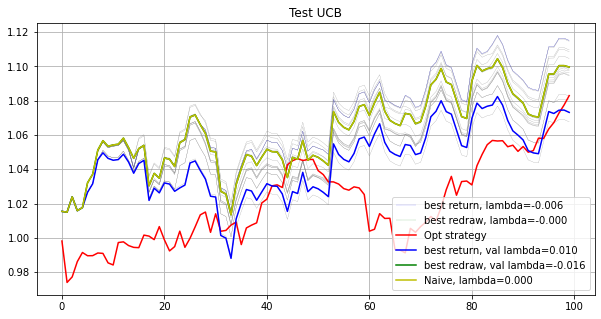

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[-0.      0.0044  0.0189  0.0153  0.0149  0.0135  0.013   0.0035  0.0079
  0.0094  0.0119  0.003   0.0153  0.0106  0.0099  0.0136  0.0074  0.0029
  0.0071  0.0102  0.0094  0.0156  0.0002  0.0142  0.0115  0.0079  0.0109
  0.0109  0.0125  0.0147  0.0107  0.0115  0.0032  0.0133  0.011   0.0056
  0.0102  0.0022  0.0136  0.      0.0025  0.0091  0.0102  0.0066  0.0069
  0.011   0.0047  0.0116  0.0101  0.0113  0.0145  0.0156  0.0076  0.0166
  0.0159  0.0104  0.0109  0.0126  0.0076  0.0123  0.0029  0.0034  0.0108
  0.0089  0.0139  0.0135  0.0087  0.0057  0.0113  0.0087  0.0077  0.0111
  0.0091  0.01    0.0207  0.0108  0.0037  0.0076  0.0138  0.0188  0.0088
  0.0175  0.003   0.0115  0.0087  0.0057  0.0046  0.0103  0.0127  0.0123
  0.0116  0.0147  0.007   0.0106  0.0106  0.0076  0.0143  0.0126  0.0112
  0.0137]
0.33802556991380067
[ 0.      0.0003  0.0181  0.0187  0.0179  0.013   0.0148  0.      0.
  0.0109  0.0125  0

[ 0.      0.      0.0187  0.0194  0.0185  0.0131  0.0152 -0.      0.
  0.0108  0.0128  0.      0.0191  0.01    0.0097  0.013   0.0062  0.0009
  0.0073  0.0155  0.0103  0.0175  0.      0.0171  0.0127  0.0058  0.0105
  0.0118  0.0126  0.0157  0.0053  0.0123  0.      0.0172  0.0113  0.
  0.0088 -0.      0.0152  0.     -0.      0.0056  0.0099  0.0027  0.0053
  0.0117  0.0028  0.0157  0.0084  0.0141  0.0149  0.0178  0.0074  0.0171
  0.0206  0.016   0.0108  0.0131  0.004   0.0121  0.0009 -0.      0.0103
  0.0099  0.0134  0.0127  0.0137  0.      0.0127  0.0069  0.0063  0.0104
  0.0094  0.0076  0.0193  0.0118  0.0046  0.0089  0.0155  0.0164  0.0141
  0.0197 -0.      0.011   0.006   0.0029  0.0071  0.0073  0.0134  0.0168
  0.0109  0.015   0.0081  0.0148  0.0127  0.0077  0.0165  0.0143  0.0124
  0.0142]
0.0001789282688817833
[ 0.      0.      0.0187  0.0194  0.0185  0.0131  0.0152 -0.      0.
  0.0108  0.0128  0.      0.0191  0.01    0.0097  0.013   0.0062  0.0009
  0.0073  0.0155  0.0103  0.017

[-0.      0.      0.0179  0.0222  0.021   0.0128  0.0167 -0.      0.0034
  0.0071  0.0121 -0.      0.0222  0.0097  0.0096  0.0095  0.0042 -0.
  0.0082  0.013   0.0096  0.0175 -0.      0.0187  0.0122  0.004   0.0099
  0.0119  0.0142  0.0174  0.0007  0.0131 -0.      0.0128  0.011  -0.
  0.007  -0.      0.0159  0.      0.      0.0042  0.0095  0.0083  0.0009
  0.0112 -0.      0.0149  0.0078  0.0142  0.0115  0.0191  0.0051  0.0214
  0.024   0.0169  0.0098  0.0125  0.0018  0.013  -0.      0.      0.0105
  0.0098  0.0166  0.0138  0.0176 -0.      0.0146  0.0046  0.0028  0.0123
  0.0095  0.0086  0.0189  0.0136  0.001   0.0105  0.0178  0.0161  0.0149
  0.0197 -0.      0.0114  0.0036  0.0047  0.0082  0.0118  0.0132  0.0169
  0.0093  0.0157  0.0058  0.0146  0.014   0.008   0.0162  0.0145  0.0116
  0.0158]
0.13799002978421324
[-0.      0.      0.0179  0.0222  0.021   0.0128  0.0167 -0.      0.0034
  0.0071  0.0121 -0.      0.0222  0.0097  0.0096  0.0095  0.0042 -0.
  0.0082  0.013   0.0096  0.0175 

[-0.     -0.      0.0179  0.0222  0.021   0.0128  0.0167  0.      0.0034
  0.0071  0.0121  0.      0.0222  0.0096  0.0096  0.0095  0.0042  0.
  0.0082  0.013   0.0096  0.0175  0.      0.0187  0.0122  0.0041  0.0099
  0.0119  0.0142  0.0174  0.0007  0.0131  0.      0.0128  0.011   0.
  0.0069  0.      0.0159  0.     -0.      0.0042  0.0095  0.0083  0.0009
  0.0112  0.      0.0149  0.0078  0.0142  0.0115  0.0191  0.0051  0.0214
  0.024   0.0169  0.0098  0.0125  0.0018  0.013   0.      0.      0.0105
  0.0097  0.0166  0.0137  0.0176  0.      0.0146  0.0046  0.0028  0.0123
  0.0095  0.0086  0.0189  0.0136  0.001   0.0105  0.0178  0.0161  0.0149
  0.0197  0.      0.0114  0.0036  0.0047  0.0082  0.0118  0.0132  0.0169
  0.0093  0.0157  0.0058  0.0146  0.014   0.008   0.0162  0.0145  0.0116
  0.0158]
3.574655475531822e-05
[-0.     -0.      0.0179  0.0222  0.021   0.0128  0.0167  0.      0.0034
  0.0071  0.0121  0.      0.0222  0.0096  0.0096  0.0095  0.0042  0.
  0.0082  0.013   0.0096  0.017

[ 0.     -0.      0.0179  0.0222  0.021   0.0128  0.0167  0.      0.0034
  0.0071  0.0121 -0.      0.0222  0.0096  0.0096  0.0095  0.0042 -0.
  0.0082  0.013   0.0096  0.0175  0.      0.0187  0.0122  0.0041  0.0099
  0.0119  0.0142  0.0174  0.0007  0.0131  0.      0.0128  0.011   0.
  0.0069  0.      0.0159  0.      0.      0.0042  0.0095  0.0083  0.0009
  0.0112 -0.      0.0149  0.0078  0.0142  0.0115  0.019   0.0051  0.0214
  0.024   0.0169  0.0098  0.0125  0.0018  0.013   0.     -0.      0.0105
  0.0097  0.0166  0.0138  0.0176  0.      0.0146  0.0046  0.0028  0.0123
  0.0095  0.0086  0.0189  0.0136  0.001   0.0105  0.0178  0.0161  0.0149
  0.0197 -0.      0.0114  0.0036  0.0047  0.0082  0.0118  0.0132  0.0169
  0.0093  0.0157  0.0058  0.0146  0.014   0.008   0.0162  0.0145  0.0116
  0.0158]
2.1862146985645187e-05
[-0.     -0.      0.0179  0.0222  0.021   0.0128  0.0167  0.      0.0034
  0.0071  0.0121 -0.      0.0222  0.0096  0.0096  0.0095  0.0042  0.
  0.0082  0.013   0.0096  0.01

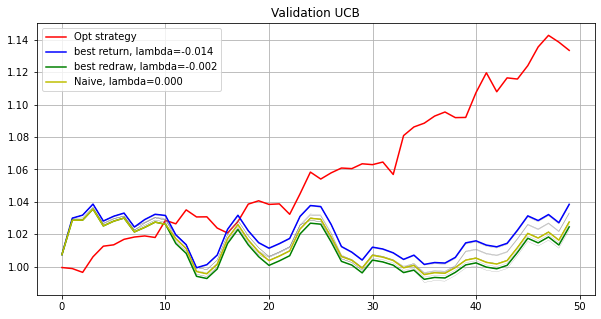

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[ 0.      0.0008  0.0161  0.0172  0.0169  0.0074  0.0134 -0.      0.
  0.0121  0.0077  0.008   0.0167  0.0145  0.0098  0.0078  0.0058  0.0015
  0.0115  0.0134  0.0119  0.0102  0.0073  0.0156  0.0155  0.0067  0.0055
  0.0094  0.011   0.0188  0.0096  0.0101  0.0071  0.013   0.0058 -0.
  0.0058  0.0022  0.0075  0.0045  0.0042  0.0052  0.0066  0.0137  0.0027
  0.0079  0.005   0.0166  0.0064  0.0118  0.0121  0.0136  0.0091  0.0126
  0.019   0.0073  0.0114  0.0167  0.0073  0.0129  0.0029  0.002   0.0102
  0.0069  0.0122  0.0114  0.0126  0.0012  0.0119  0.0114  0.0081  0.0131
  0.0095  0.013   0.0175  0.0173  0.0127  0.0166  0.0086  0.0145  0.0122
  0.0127  0.0012  0.0105  0.0132  0.0046  0.0078  0.0127  0.0119  0.0148
  0.0146  0.0079  0.0093  0.0156  0.0124  0.0125  0.0155  0.0149  0.0099
  0.0118]
0.07656311488984054
[ 0.      0.0008  0.0161  0.0172  0.0169  0.0074  0.0134  0.     -0.
  0.0121  0.0077  0.008   0.0167  0.0145  0.0097  0.0078  0.0058  0.0015
  0.0115  0.0134  0.0119  0.0102 

[ 0.     -0.      0.0209  0.0211  0.0208  0.0071  0.0152 -0.      0.0012
  0.0121  0.0088  0.002   0.0201  0.016   0.009   0.0058  0.003   0.
  0.0112  0.018   0.0122  0.0112  0.0003  0.0188  0.0178  0.0057  0.0036
  0.0099  0.0107  0.0227  0.007   0.0105  0.0045  0.0148  0.0051 -0.
  0.0063 -0.      0.0098  0.0007  0.0006  0.0034  0.0047  0.0151  0.0001
  0.0077 -0.      0.019   0.0064  0.0139  0.0131  0.0154  0.0093  0.0129
  0.0234  0.0025  0.0101  0.0178  0.0034  0.0143  0.0014  0.      0.0105
  0.0059  0.016   0.0131  0.0139 -0.      0.011   0.0094  0.006   0.014
  0.0084  0.012   0.0198  0.0191  0.0121  0.0159  0.0109  0.0085  0.0154
  0.0154  0.      0.0105  0.0135  0.0022  0.0172  0.0076  0.0104  0.0152
  0.014   0.0074  0.0092  0.0164  0.0115  0.0135  0.0182  0.0167  0.0098
  0.0108]
0.0002690299396409015
[ 0.     -0.      0.0209  0.0211  0.0208  0.0071  0.0152 -0.      0.0012
  0.0121  0.0088  0.002   0.0201  0.016   0.009   0.0058  0.003   0.
  0.0112  0.018   0.0122  0.0112

[-0.     -0.      0.0208  0.0211  0.0208  0.0071  0.0152 -0.      0.0012
  0.0122  0.0088  0.002   0.0201  0.016   0.009   0.0058  0.003  -0.
  0.0112  0.018   0.0122  0.0112  0.0002  0.0188  0.0178  0.0057  0.0036
  0.0099  0.0107  0.0227  0.007   0.0105  0.0045  0.0148  0.0051 -0.
  0.0063 -0.      0.0098  0.0007  0.0006  0.0034  0.0047  0.0151  0.0001
  0.0077  0.      0.019   0.0064  0.0139  0.0131  0.0154  0.0093  0.0129
  0.0234  0.0025  0.0101  0.0178  0.0034  0.0143  0.0014  0.      0.0105
  0.0059  0.016   0.0131  0.0139  0.      0.011   0.0094  0.0061  0.014
  0.0084  0.012   0.0198  0.0191  0.0121  0.0159  0.0109  0.0085  0.0154
  0.0154  0.      0.0105  0.0135  0.0022  0.0172  0.0076  0.0104  0.0152
  0.014   0.0074  0.0092  0.0164  0.0115  0.0135  0.0182  0.0167  0.0098
  0.0108]
2.9771148786792345e-05
[ 0.      0.      0.0208  0.0211  0.0208  0.0071  0.0152 -0.      0.0012
  0.0122  0.0088  0.002   0.0201  0.016   0.009   0.0058  0.003  -0.
  0.0112  0.018   0.0122  0.011

[ 0.      0.      0.0208  0.0211  0.0208  0.007   0.0152  0.      0.0012
  0.0122  0.0088  0.002   0.0201  0.016   0.009   0.0058  0.003  -0.
  0.0112  0.018   0.0122  0.0112  0.0002  0.0188  0.0178  0.0057  0.0036
  0.0099  0.0107  0.0227  0.007   0.0105  0.0045  0.0148  0.0051  0.
  0.0063 -0.      0.0098  0.0007  0.0006  0.0034  0.0047  0.0151  0.0001
  0.0077 -0.      0.019   0.0064  0.0139  0.0131  0.0154  0.0093  0.0129
  0.0234  0.0026  0.0101  0.0178  0.0034  0.0143  0.0014  0.0001  0.0105
  0.0059  0.016   0.0131  0.0139  0.      0.011   0.0094  0.0061  0.014
  0.0084  0.012   0.0198  0.0191  0.0121  0.0159  0.0109  0.0085  0.0154
  0.0154  0.      0.0105  0.0135  0.0022  0.0172  0.0077  0.0104  0.0152
  0.014   0.0074  0.0093  0.0164  0.0115  0.0135  0.0182  0.0167  0.0097
  0.0108]
2.409571384067962e-05
[-0.     -0.      0.0208  0.0211  0.0208  0.007   0.0152  0.      0.0012
  0.0122  0.0088  0.002   0.0201  0.016   0.009   0.0058  0.003  -0.
  0.0112  0.018   0.0122  0.0112

[-0.     -0.      0.021   0.0216  0.0211  0.0067  0.0154  0.     -0.
  0.0124  0.0089  0.0014  0.0201  0.0162  0.0091  0.0059  0.0028 -0.
  0.0108  0.0184  0.0117  0.0111 -0.      0.0191  0.0183  0.0054  0.0035
  0.0099  0.0104  0.0228  0.0073  0.0105  0.004   0.0149  0.0047 -0.
  0.0063 -0.      0.0099  0.0014 -0.      0.0029  0.0045  0.0145 -0.
  0.0075 -0.      0.0194  0.0062  0.0139  0.0138  0.0158  0.0093  0.0126
  0.0239  0.0026  0.0102  0.0179  0.0034  0.0146 -0.     -0.      0.0105
  0.0061  0.0161  0.0133  0.0139  0.      0.0109  0.0095  0.0059  0.0139
  0.0081  0.0123  0.0204  0.0193  0.012   0.0163  0.0109  0.0085  0.0156
  0.0156  0.      0.0106  0.0133  0.0023  0.0177  0.007   0.0103  0.0147
  0.0138  0.008   0.0092  0.0166  0.0115  0.0138  0.0183  0.0168  0.0097
  0.0113]
0.00012772503526442091
[-0.     -0.      0.021   0.0216  0.0211  0.0067  0.0154 -0.     -0.
  0.0124  0.0089  0.0014  0.0201  0.0162  0.0091  0.0059  0.0028 -0.
  0.0108  0.0184  0.0117  0.0111 -0.      

[-0.     -0.      0.0218  0.0223  0.0218  0.006   0.0156 -0.      0.0002
  0.0123  0.0089  0.0007  0.0206  0.0144  0.0089  0.0057  0.0011  0.
  0.0109  0.0191  0.0126  0.0113  0.0001  0.0195  0.0171  0.0053  0.0035
  0.0099  0.0098  0.0241  0.0076  0.0108  0.0025  0.0152  0.0045  0.
  0.0056  0.      0.0104  0.      0.      0.0036  0.0056  0.0148  0.
  0.0076  0.      0.0197  0.007   0.0143  0.0124  0.0165  0.0091  0.0128
  0.0248  0.0028  0.0101  0.018   0.0031  0.0147 -0.     -0.      0.0105
  0.0065  0.0163  0.0129  0.0146 -0.      0.0109  0.0089  0.0055  0.0135
  0.0077  0.0122  0.0201  0.02    0.0117  0.0164  0.0105  0.0068  0.0149
  0.0169 -0.      0.011   0.0127  0.0023  0.0185  0.0061  0.0112  0.0157
  0.0135  0.0071  0.0085  0.0167  0.0111  0.0142  0.0193  0.017   0.0096
  0.0109]
3.634044949466402e-05
[-0.     -0.      0.0218  0.0223  0.0218  0.006   0.0156  0.      0.0002
  0.0123  0.0089  0.0007  0.0206  0.0144  0.0089  0.0057  0.0011  0.
  0.0109  0.0191  0.0126  0.0113  0

[ 0.      0.0027  0.0229  0.0246  0.0248  0.0023  0.0174  0.      0.
  0.0121  0.0103  0.0019  0.0239  0.0121  0.0081  0.0061  0.      0.0044
  0.0089  0.0153  0.006   0.012   0.      0.0224  0.0165  0.0036  0.0008
  0.0095  0.0083  0.0301  0.0146  0.0104  0.0036  0.0123  0.003   0.0024
  0.0048  0.0025  0.0091 -0.      0.0005  0.0026  0.0055  0.0115 -0.
  0.0049 -0.      0.02    0.0056  0.0159  0.0154  0.0178  0.0095  0.0112
  0.0292  0.      0.0095  0.0203  0.0036  0.0141  0.      0.0019  0.01
  0.0067  0.0151  0.0115  0.0178  0.0024  0.0108  0.0044  0.0083  0.0166
  0.0064  0.0122  0.019   0.0222  0.0118  0.0117  0.009   0.0045  0.0143
  0.0204 -0.      0.012   0.0111  0.0013  0.0104  0.0005  0.0095  0.0164
  0.0156  0.0088  0.0053  0.0191  0.0092  0.0169  0.0183  0.0194  0.0094
  0.013 ]
9.92945051890834e-05
[ 0.      0.0027  0.0229  0.0246  0.0248  0.0023  0.0174  0.0001  0.
  0.0121  0.0103  0.0019  0.0239  0.0122  0.0081  0.0061 -0.      0.0044
  0.0089  0.0153  0.006   0.012   

[ 0.      0.0028  0.023   0.0246  0.0248  0.0023  0.0174  0.      0.0001
  0.0121  0.0103  0.0019  0.0239  0.0121  0.0081  0.0061  0.      0.0044
  0.0088  0.0153  0.0059  0.012   0.      0.0224  0.0165  0.0037  0.0008
  0.0095  0.0083  0.0301  0.0146  0.0104  0.0036  0.0123  0.003   0.0024
  0.0048  0.0025  0.0091  0.      0.0005  0.0026  0.0055  0.0115  0.
  0.0049  0.      0.02    0.0056  0.0159  0.0154  0.0178  0.0095  0.0112
  0.0292 -0.      0.0095  0.0203  0.0035  0.0141  0.      0.0019  0.01
  0.0067  0.0151  0.0115  0.0178  0.0024  0.0108  0.0044  0.0083  0.0166
  0.0064  0.0122  0.019   0.0222  0.0118  0.0117  0.009   0.0045  0.0143
  0.0204  0.      0.012   0.0111  0.0013  0.0104  0.0004  0.0095  0.0164
  0.0156  0.0088  0.0053  0.0191  0.0092  0.0169  0.0183  0.0194  0.0094
  0.013 ]
0.00031750775125859734
[ 0.      0.0028  0.023   0.0246  0.0248  0.0023  0.0174  0.      0.0001
  0.0121  0.0103  0.0019  0.0239  0.0121  0.0081  0.0061  0.      0.0044
  0.0088  0.0153  0.0059

[-0.      0.0028  0.0229  0.0246  0.0248  0.0023  0.0174  0.0001  0.0001
  0.0121  0.0103  0.0019  0.0239  0.0121  0.0081  0.0061  0.      0.0044
  0.0089  0.0153  0.0059  0.012   0.      0.0224  0.0165  0.0037  0.0008
  0.0095  0.0083  0.0301  0.0146  0.0104  0.0036  0.0123  0.003   0.0024
  0.0048  0.0025  0.0091 -0.      0.0005  0.0025  0.0055  0.0115  0.
  0.0049  0.      0.02    0.0056  0.0159  0.0154  0.0178  0.0095  0.0112
  0.0292  0.      0.0095  0.0203  0.0035  0.0141 -0.      0.0019  0.01
  0.0067  0.0151  0.0115  0.0178  0.0024  0.0108  0.0044  0.0083  0.0166
  0.0064  0.0122  0.019   0.0222  0.0118  0.0117  0.009   0.0045  0.0143
  0.0204 -0.      0.012   0.0111  0.0013  0.0104  0.0004  0.0095  0.0164
  0.0156  0.0088  0.0053  0.0191  0.0092  0.0169  0.0183  0.0194  0.0094
  0.013 ]
0.00016188119570262409
[ 0.      0.0028  0.0229  0.0246  0.0248  0.0023  0.0174  0.0001  0.0001
  0.0121  0.0103  0.0019  0.0239  0.0121  0.0081  0.0061 -0.      0.0044
  0.0089  0.0153  0.0059

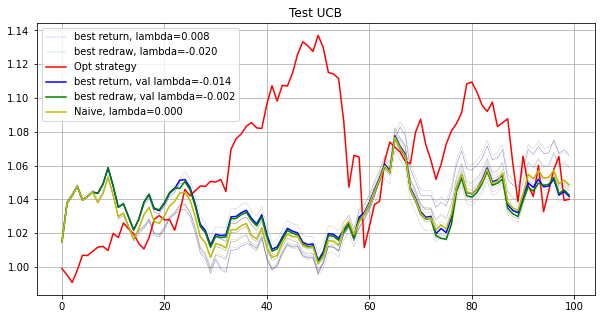

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.223329934097253e-06
[0.0052 0.0148 0.0117 0.0089 0.0098 0.0117 0.0151 0.0104 0.0122 0.0099
 0.0111 0.0071 0.0085 0.0094 0.007  0.0162 0.0085 0.0097 0.     0.0101
 0.0104 0.007  0.0105 0.0097 0.0123 0.0114 0.012  0.0092 0.0108 0.0124
 0.0088 0.0073 0.0104 0.0085 0.0137 0.0094 0.0101 0.0102 0.0106 0.0133
 0.0034 0.0124 0.0096 0.0065 0.0111 0.0135 0.0103 0.0087 0.011  0.0092
 0.0085 0.0095 0.0109 0.008  0.0065

[ 0.0052  0.0148  0.0117  0.0089  0.0098  0.0117  0.0151  0.0104  0.0122
  0.0099  0.0111  0.0071  0.0085  0.0094  0.007   0.0162  0.0085  0.0097
 -0.      0.0101  0.0104  0.007   0.0105  0.0097  0.0123  0.0114  0.012
  0.0092  0.0108  0.0124  0.0088  0.0073  0.0104  0.0085  0.0137  0.0094
  0.0101  0.0102  0.0106  0.0133  0.0034  0.0124  0.0096  0.0065  0.0111
  0.0135  0.0103  0.0087  0.011   0.0092  0.0085  0.0095  0.0109  0.008
  0.0065  0.0112  0.0092  0.0101  0.0125  0.009   0.0117  0.0093  0.0099
  0.0109  0.0093  0.0085  0.0051  0.01    0.0125  0.0112  0.0114  0.0104
  0.0104  0.011   0.0071  0.0131  0.0105  0.0092  0.009   0.01    0.0109
  0.008   0.0114  0.0089  0.0105  0.0096  0.0097  0.0128  0.0124  0.0124
  0.0109  0.0097  0.008   0.0103  0.0076  0.0095  0.0094  0.009   0.0124
  0.0095]
1.0355028017500509e-05
[0.0052 0.0148 0.0117 0.0089 0.0098 0.0117 0.0151 0.0104 0.0122 0.0099
 0.0111 0.0071 0.0085 0.0094 0.007  0.0162 0.0085 0.0097 0.     0.0101
 0.0104 0.007  0.0105 0.

[ 0.0039  0.0159  0.0119  0.0086  0.0096  0.0115  0.0119  0.0108  0.0127
  0.01    0.0117  0.0075  0.0071  0.0099  0.006   0.0166  0.0084  0.0102
 -0.      0.0097  0.0115  0.0068  0.01    0.0094  0.0137  0.0117  0.012
  0.0093  0.0109  0.0127  0.0088  0.0075  0.0106  0.0081  0.0111  0.0092
  0.0104  0.0094  0.0109  0.013   0.0022  0.0133  0.0095  0.0069  0.0103
  0.0135  0.0108  0.0086  0.0118  0.0092  0.0085  0.0095  0.011   0.0081
  0.0068  0.0119  0.0087  0.0102  0.0131  0.0091  0.0117  0.0089  0.0105
  0.01    0.0089  0.0078  0.0077  0.0095  0.0129  0.0116  0.0116  0.0103
  0.0109  0.0113  0.0079  0.0134  0.0103  0.009   0.009   0.0101  0.0114
  0.0073  0.0114  0.0089  0.0101  0.0096  0.0096  0.0128  0.0125  0.0125
  0.0108  0.0098  0.0083  0.01    0.0073  0.0093  0.0098  0.0092  0.0123
  0.01  ]
3.588843188616242e-05
[ 0.0039  0.0159  0.0119  0.0086  0.0096  0.0115  0.0119  0.0108  0.0127
  0.01    0.0117  0.0075  0.0071  0.0099  0.006   0.0166  0.0084  0.0102
 -0.      0.0097  0.

[0.0013 0.0144 0.0124 0.0076 0.0095 0.0108 0.0065 0.0109 0.0134 0.0092
 0.0119 0.0068 0.0066 0.0099 0.0057 0.016  0.0085 0.0096 0.     0.0088
 0.0106 0.0056 0.0092 0.0081 0.0145 0.0128 0.0119 0.0091 0.0112 0.0137
 0.0082 0.0082 0.0106 0.0075 0.011  0.0096 0.0101 0.0138 0.0124 0.0121
 0.0007 0.0136 0.0091 0.0056 0.0111 0.0143 0.0115 0.0086 0.0121 0.0087
 0.0088 0.0086 0.0112 0.0082 0.0051 0.0116 0.0081 0.0104 0.014  0.0093
 0.0125 0.0079 0.0112 0.0084 0.0096 0.0084 0.0095 0.0095 0.0138 0.0101
 0.0127 0.0101 0.0137 0.0118 0.0081 0.014  0.0106 0.0095 0.0092 0.0097
 0.0115 0.0079 0.0117 0.0088 0.0101 0.0094 0.0092 0.0133 0.0135 0.013
 0.0106 0.0099 0.0101 0.0107 0.0073 0.0088 0.0107 0.0089 0.0128 0.0106]
2.27615654050684e-06
[0.0013 0.0144 0.0124 0.0076 0.0095 0.0108 0.0065 0.0109 0.0134 0.0092
 0.0119 0.0068 0.0066 0.0099 0.0057 0.016  0.0085 0.0096 0.     0.0088
 0.0106 0.0056 0.0092 0.0081 0.0145 0.0128 0.0119 0.0091 0.0112 0.0137
 0.0082 0.0082 0.0106 0.0075 0.011  0.0096 0.0101 0.0138

[ 0.      0.0185  0.0135  0.0062  0.0093  0.0105  0.      0.0115  0.0151
  0.009   0.0076  0.007   0.0076  0.011   0.0062  0.0164  0.0061  0.0095
 -0.      0.0085  0.0107  0.0039  0.0073  0.0086  0.0165  0.0128  0.01
  0.0109  0.0115  0.0152  0.0072  0.009   0.0118  0.0091  0.0075  0.0107
  0.0096  0.0143  0.0121  0.0116  0.      0.0129  0.0067  0.0009  0.0114
  0.0155  0.0107  0.0055  0.0125  0.0082  0.0096  0.0049  0.012   0.0064
  0.0051  0.0125  0.0104  0.0101  0.0135  0.0108  0.0135  0.0085  0.0101
  0.009   0.0082  0.0085  0.0081  0.0111  0.0157  0.0113  0.0124  0.0103
  0.0157  0.0103  0.0069  0.016   0.0106  0.0093  0.0124  0.0113  0.0121
  0.01    0.0128  0.01    0.0082  0.0076  0.0099  0.0141  0.0145  0.0142
  0.0103  0.0098  0.009   0.0097  0.0059  0.0092  0.0158  0.008   0.0147
  0.0118]
0.0003219328078145541
[-0.      0.0185  0.0135  0.0062  0.0093  0.0105  0.      0.0115  0.0151
  0.009   0.0076  0.007   0.0076  0.011   0.0062  0.0164  0.0061  0.0095
 -0.      0.0085  0.0

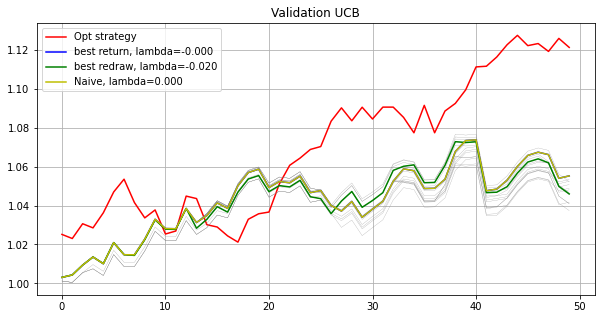

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[0.0027 0.0193 0.012  0.0062 0.0099 0.0083 0.0075 0.0135 0.0116 0.0086
 0.0086 0.0106 0.0086 0.0093 0.012  0.0042 0.0108 0.0059 0.0115 0.0099
 0.0051 0.0055 0.0071 0.0061 0.0136 0.0076 0.0082 0.0093 0.0111 0.0128
 0.0103 0.0123 0.01   0.0093 0.0117 0.0109 0.0101 0.0103 0.015  0.0079
 0.0078 0.01   0.0095 0.0057 0.0094 0.0132 0.0097 0.0066 0.0101 0.009
 0.0078 0.0063 0.0111 0.0108 0.008  0.0106 0.0103 0.0098 0.0109 0.0091
 0.0115 0.0094 0.0091 0.0135 0.0138 0.0139 0.0175 0.0057 0.0128 0.0068
 0.0088 0.0107 0.0092 0.0079 0.0095 0.0134 0.0102 0.0112 0.0127 0.0094
 0.0129 0.0145 0.0113 0.0089 0.0092 0.0093 0.0098 0.0112 0.013  0.0098
 0.0095 0.0098 0.0155 0.0081 0.0068 0.0104 0.0083 0.0094 0.0148 0.01  ]
2.2201790180428373e-06
[0.0027 0.0193 0.012  0.0062 0.0099 0.0083 0.0075 0.0135 0.0116 0.0086
 0.0086 0.0106 0.0086 0.0093 0.012  0.0042 0.0108 0.0059 0.0115 0.0099
 0.0051 0.0055 0.0071 0.0061 0.0136 0.0076 0.0082 0.0093 0.0111 0.0128
 0.0103 0.0123 0.01   0.0093 0.0117 0.0109 0.0101 0.01

[0.0026 0.0193 0.012  0.0062 0.0099 0.0083 0.0075 0.0135 0.0116 0.0086
 0.0086 0.0106 0.0086 0.0093 0.012  0.0042 0.0108 0.0059 0.0115 0.0099
 0.0051 0.0055 0.0071 0.0061 0.0136 0.0076 0.0082 0.0093 0.0111 0.0128
 0.0103 0.0123 0.01   0.0093 0.0117 0.0109 0.0101 0.0103 0.015  0.0079
 0.0078 0.01   0.0095 0.0057 0.0094 0.0132 0.0097 0.0066 0.0101 0.009
 0.0078 0.0063 0.0111 0.0108 0.008  0.0106 0.0103 0.0098 0.0109 0.0091
 0.0115 0.0094 0.0091 0.0135 0.0138 0.0139 0.0175 0.0057 0.0128 0.0068
 0.0088 0.0107 0.0092 0.0079 0.0095 0.0134 0.0103 0.0112 0.0127 0.0094
 0.0129 0.0145 0.0113 0.0089 0.0092 0.0093 0.0098 0.0111 0.013  0.0098
 0.0095 0.0098 0.0155 0.0081 0.0068 0.0104 0.0083 0.0094 0.0148 0.01  ]
0.00015453545941852918
[0.0026 0.0193 0.012  0.0062 0.0099 0.0083 0.0075 0.0135 0.0116 0.0086
 0.0086 0.0106 0.0086 0.0093 0.012  0.0042 0.0108 0.0059 0.0115 0.0099
 0.0051 0.0055 0.0071 0.0061 0.0136 0.0076 0.0082 0.0093 0.0111 0.0128
 0.0103 0.0123 0.01   0.0093 0.0117 0.0109 0.0101 0.01

[0.0009 0.0196 0.0125 0.0059 0.0097 0.0082 0.0036 0.0139 0.0123 0.0084
 0.0085 0.0102 0.0078 0.0096 0.0114 0.0039 0.0114 0.0061 0.0109 0.0095
 0.0048 0.0046 0.0067 0.0058 0.0147 0.0071 0.0087 0.0093 0.0114 0.0132
 0.0101 0.0119 0.01   0.0089 0.0131 0.0106 0.0109 0.0091 0.0143 0.0083
 0.0089 0.0116 0.0093 0.0049 0.0087 0.0139 0.0094 0.0066 0.0102 0.0089
 0.0078 0.0056 0.0114 0.0107 0.0081 0.011  0.0099 0.0098 0.0117 0.0089
 0.0122 0.0095 0.0092 0.0133 0.0144 0.0133 0.0176 0.0055 0.0134 0.0058
 0.0095 0.0105 0.0091 0.0086 0.0088 0.0139 0.0105 0.0112 0.0129 0.0101
 0.013  0.0143 0.0116 0.0085 0.01   0.0093 0.0101 0.0117 0.0128 0.0099
 0.0095 0.0106 0.0162 0.0077 0.0069 0.0098 0.0089 0.009  0.0156 0.0106]
4.1878096289238486e-05
[0.0009 0.0196 0.0125 0.0059 0.0097 0.0082 0.0036 0.0139 0.0123 0.0084
 0.0085 0.0102 0.0078 0.0096 0.0114 0.0039 0.0114 0.0061 0.0109 0.0095
 0.0048 0.0046 0.0067 0.0058 0.0147 0.0071 0.0087 0.0093 0.0114 0.0132
 0.0101 0.0119 0.01   0.0089 0.0131 0.0106 0.0109 0.0

[-0.      0.0203  0.0133  0.0044  0.0099  0.0074 -0.      0.0164  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0088  0.0116  0.0055  0.0087  0.0067
  0.011   0.009   0.0084  0.0025  0.0053  0.0055  0.0159  0.0073  0.0079
  0.0081  0.0118  0.0145  0.01    0.0117  0.0109  0.0102  0.0134  0.0112
  0.0106  0.0087  0.0153  0.0079  0.0057  0.0118  0.0075  0.0033  0.0083
  0.0156  0.0093  0.0072  0.01    0.0083  0.007   0.0039  0.0119  0.0106
  0.0058  0.0109  0.0084  0.0111  0.0129  0.0066  0.0133  0.0096  0.0085
  0.0115  0.0134  0.0145  0.0151  0.0037  0.0152  0.0051  0.0102  0.0102
  0.0092  0.0077  0.0112  0.0162  0.0109  0.0111  0.0142  0.0112  0.0149
  0.0137  0.0129  0.0087  0.0107  0.0085  0.0099  0.0133  0.0145  0.0104
  0.0092  0.0108  0.0151  0.0075  0.0073  0.0095  0.0109  0.0086  0.0172
  0.0111]
1.2154420059324343e-06
[-0.      0.0203  0.0133  0.0044  0.0099  0.0074  0.      0.0164  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0088  0.0116  0.0055  0.0087  0.0067
  0.011   0.009   

[ 0.      0.0203  0.0133  0.0044  0.0099  0.0074 -0.      0.0164  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0088  0.0116  0.0055  0.0087  0.0067
  0.011   0.009   0.0084  0.0025  0.0053  0.0055  0.0159  0.0073  0.0079
  0.0081  0.0118  0.0145  0.01    0.0117  0.0109  0.0102  0.0134  0.0112
  0.0106  0.0087  0.0153  0.0079  0.0057  0.0118  0.0075  0.0033  0.0083
  0.0156  0.0093  0.0072  0.01    0.0083  0.007   0.0039  0.0119  0.0106
  0.0058  0.0109  0.0084  0.0111  0.0129  0.0066  0.0133  0.0096  0.0085
  0.0115  0.0134  0.0145  0.0151  0.0037  0.0152  0.0051  0.0102  0.0102
  0.0092  0.0077  0.0112  0.0162  0.0109  0.0111  0.0142  0.0112  0.0149
  0.0137  0.0129  0.0087  0.0107  0.0085  0.0099  0.0133  0.0145  0.0104
  0.0092  0.0108  0.0151  0.0075  0.0073  0.0095  0.0109  0.0086  0.0172
  0.0111]
3.128418969381554e-05
[ 0.      0.0203  0.0133  0.0044  0.0099  0.0074 -0.      0.0164  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0088  0.0116  0.0055  0.0087  0.0067
  0.011   0.009   0

[0.     0.0203 0.0133 0.0044 0.0099 0.0073 0.     0.0164 0.0141 0.0089
 0.0077 0.0091 0.0067 0.0088 0.0116 0.0055 0.0087 0.0067 0.011  0.009
 0.0084 0.0025 0.0053 0.0055 0.0159 0.0073 0.0079 0.0081 0.0118 0.0145
 0.0099 0.0117 0.0109 0.0102 0.0134 0.0112 0.0106 0.0087 0.0153 0.0079
 0.0057 0.0118 0.0075 0.0033 0.0083 0.0156 0.0093 0.0072 0.01   0.0083
 0.007  0.0039 0.0119 0.0106 0.0058 0.0109 0.0084 0.0111 0.0129 0.0066
 0.0133 0.0096 0.0085 0.0115 0.0134 0.0145 0.0151 0.0037 0.0152 0.0052
 0.0102 0.0102 0.0092 0.0077 0.0112 0.0162 0.0109 0.0111 0.0142 0.0112
 0.0149 0.0137 0.0129 0.0087 0.0107 0.0085 0.0099 0.0133 0.0145 0.0104
 0.0092 0.0108 0.0151 0.0075 0.0073 0.0095 0.0109 0.0086 0.0172 0.0111]
0.00012923789544676175
[-0.      0.0203  0.0133  0.0044  0.0099  0.0073 -0.      0.0164  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0088  0.0116  0.0055  0.0087  0.0067
  0.011   0.009   0.0084  0.0025  0.0053  0.0055  0.0159  0.0073  0.0079
  0.0081  0.0118  0.0145  0.0099  0.0117  0.0109

[-0.      0.0203  0.0133  0.0044  0.0099  0.0073 -0.      0.0164  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0088  0.0116  0.0055  0.0087  0.0067
  0.011   0.009   0.0084  0.0025  0.0053  0.0055  0.0159  0.0073  0.0079
  0.0081  0.0118  0.0145  0.0099  0.0117  0.0109  0.0102  0.0134  0.0112
  0.0106  0.0087  0.0153  0.0079  0.0057  0.0118  0.0075  0.0033  0.0083
  0.0156  0.0093  0.0072  0.01    0.0083  0.007   0.0039  0.0119  0.0106
  0.0058  0.0109  0.0084  0.0111  0.0129  0.0066  0.0133  0.0096  0.0085
  0.0115  0.0134  0.0145  0.0151  0.0037  0.0152  0.0052  0.0102  0.0102
  0.0092  0.0077  0.0112  0.0162  0.0109  0.0111  0.0142  0.0112  0.0149
  0.0137  0.0129  0.0087  0.0107  0.0085  0.0099  0.0133  0.0145  0.0104
  0.0092  0.0108  0.0151  0.0075  0.0073  0.0095  0.0109  0.0086  0.0172
  0.0111]
6.760865379777127e-05
[-0.      0.0203  0.0133  0.0044  0.0099  0.0073  0.      0.0164  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0088  0.0116  0.0055  0.0087  0.0067
  0.011   0.009   0

[0.     0.0203 0.0133 0.0044 0.0099 0.0073 0.     0.0164 0.0141 0.0089
 0.0077 0.0091 0.0067 0.0088 0.0116 0.0055 0.0087 0.0067 0.011  0.009
 0.0084 0.0025 0.0053 0.0055 0.0159 0.0073 0.0079 0.0081 0.0118 0.0145
 0.0099 0.0117 0.0109 0.0102 0.0134 0.0112 0.0106 0.0087 0.0153 0.0079
 0.0057 0.0118 0.0075 0.0033 0.0083 0.0156 0.0093 0.0072 0.01   0.0083
 0.0071 0.0039 0.0119 0.0106 0.0058 0.0109 0.0084 0.0111 0.0129 0.0066
 0.0133 0.0096 0.0085 0.0115 0.0134 0.0145 0.0151 0.0037 0.0152 0.0051
 0.0102 0.0102 0.0092 0.0077 0.0112 0.0162 0.0109 0.0111 0.0142 0.0112
 0.0149 0.0137 0.0129 0.0087 0.0107 0.0085 0.0099 0.0133 0.0145 0.0104
 0.0092 0.0108 0.0151 0.0075 0.0073 0.0095 0.0109 0.0086 0.0172 0.0111]
0.00013683236191357298
[0.     0.0203 0.0133 0.0044 0.0099 0.0073 0.     0.0164 0.0141 0.0089
 0.0077 0.0091 0.0067 0.0088 0.0116 0.0055 0.0087 0.0067 0.011  0.009
 0.0084 0.0025 0.0053 0.0055 0.0159 0.0073 0.0079 0.0081 0.0118 0.0145
 0.0099 0.0117 0.0109 0.0102 0.0134 0.0112 0.0106 0.008

[ 0.      0.0203  0.0133  0.0044  0.0099  0.0074 -0.      0.0164  0.0141
  0.0089  0.0077  0.0091  0.0067  0.0088  0.0116  0.0055  0.0087  0.0067
  0.011   0.009   0.0084  0.0025  0.0053  0.0055  0.0159  0.0073  0.0079
  0.0081  0.0118  0.0145  0.01    0.0117  0.0109  0.0102  0.0134  0.0112
  0.0106  0.0087  0.0153  0.0079  0.0057  0.0118  0.0075  0.0033  0.0083
  0.0156  0.0093  0.0072  0.01    0.0083  0.0071  0.0039  0.0119  0.0106
  0.0058  0.0109  0.0084  0.0111  0.0129  0.0066  0.0133  0.0096  0.0085
  0.0115  0.0134  0.0145  0.0151  0.0037  0.0152  0.0051  0.0102  0.0102
  0.0092  0.0077  0.0112  0.0162  0.0109  0.0111  0.0142  0.0112  0.0149
  0.0137  0.0129  0.0087  0.0106  0.0085  0.0099  0.0133  0.0145  0.0104
  0.0092  0.0108  0.0151  0.0075  0.0073  0.0095  0.0109  0.0086  0.0172
  0.0111]
1.135812390939647e-05
Opt strategy   Total log return: 0.14158031    Max redraw: 0.03267943
Total return: 1.15209302
Mean return: 1.00141681
best return val lambda: 0.010   Total log retu

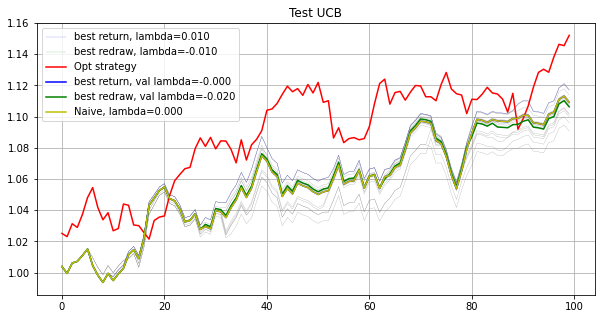

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.5706877691708254e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
4.6241445553176636e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
9.55191003149461e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.0

[0.0074 0.0112 0.0113 0.0103 0.0097 0.0109 0.0103 0.0103 0.0098 0.0105
 0.01   0.0106 0.0095 0.0074 0.0083 0.0118 0.0096 0.0105 0.0081 0.0103
 0.01   0.0104 0.0096 0.0094 0.0104 0.0125 0.0103 0.0098 0.0095 0.0111
 0.01   0.0102 0.011  0.009  0.0087 0.0106 0.0092 0.0099 0.0109 0.0084
 0.0101 0.0089 0.0101 0.0107 0.0078 0.0118 0.0091 0.0093 0.0075 0.0118
 0.0108 0.0103 0.0101 0.0098 0.0092 0.0115 0.0083 0.0114 0.0106 0.0086
 0.0103 0.0111 0.0092 0.012  0.0104 0.0096 0.0097 0.0122 0.0114 0.0078
 0.0094 0.0102 0.01   0.0127 0.009  0.0113 0.0089 0.0108 0.0088 0.0086
 0.0096 0.0099 0.0115 0.0108 0.0087 0.0096 0.01   0.0093 0.0102 0.0112
 0.0081 0.0112 0.009  0.0103 0.0097 0.01   0.0097 0.01   0.0107 0.0107]
3.5014626371954183e-09
[0.0074 0.0112 0.0113 0.0103 0.0097 0.0109 0.0103 0.0103 0.0098 0.0105
 0.01   0.0106 0.0095 0.0074 0.0083 0.0118 0.0096 0.0105 0.0081 0.0103
 0.01   0.0104 0.0096 0.0094 0.0104 0.0125 0.0103 0.0098 0.0095 0.0111
 0.01   0.0102 0.011  0.009  0.0087 0.0106 0.0092 0.0

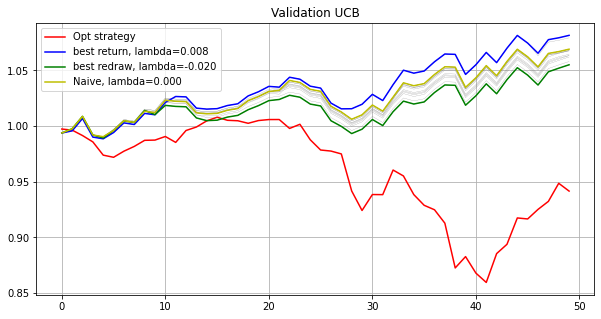

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
2.7106087704259485e-09
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
3.82066668495884e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.2227075211108246e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.2018139493674349e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
5.092855062992577e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
4.490413115128267e-08
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

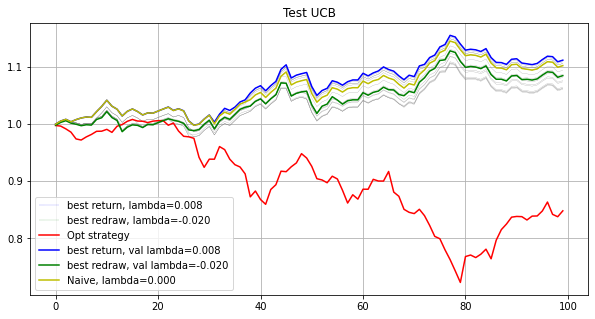

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
6.308847171482279e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.0755815090038312e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.1860892119396407e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.0104 0.01   0.01   0.0096 0.0099 0.01   0.01   0.0097 0.01   0.0099
 0.0096 0.0102 0.01   0.0098 0.0097 0.0099 0.0109 0.0093 0.0099 0.0097
 0.0106 0.0104 0.0099 0.0102 0.0099 0.0095 0.0102 0.0101 0.0102 0.0098
 0.01   0.0101 0.0096 0.0102 0.0101 0.0102 0.0098 0.0097 0.0101 0.0102
 0.0102 0.0099 0.0098 0.0099 0.0094 0.0099 0.01   0.0097 0.0099 0.0104
 0.0102 0.0099 0.0099 0.0103 0.0106 0.01   0.01   0.0105 0.0101 0.0101
 0.0098 0.01   0.01   0.01   0.0098 0.0104 0.01   0.01   0.0097 0.0097
 0.0102 0.0102 0.01   0.0093 0.0102 0.0099 0.0098 0.0102 0.01   0.0101
 0.0104 0.0096 0.0101 0.01   0.0104 0.0095 0.0099 0.0101 0.0097 0.0101
 0.01   0.01   0.0101 0.0108 0.01   0.0104 0.0095 0.01   0.01   0.01  ]
7.212079019226422e-06
[0.0104 0.01   0.01   0.0096 0.0099 0.01   0.01   0.0097 0.01   0.0099
 0.0096 0.0102 0.01   0.0098 0.0097 0.0099 0.0109 0.0093 0.0099 0.0097
 0.0106 0.0104 0.0099 0.0102 0.0099 0.0095 0.0102 0.0101 0.0102 0.0098
 0.01   0.0101 0.0096 0.0102 0.0101 0.0102 0.0098 0.00

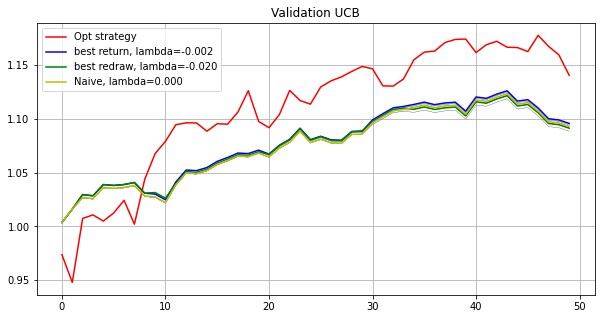

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.1243517642443857e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
2.024457380553346e-08
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
6.298587781575216e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.0099 0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01  ]
0.0012364399439661802
[0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.0099 0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01
 0.01   0

[0.0081 0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.01   0.0099 0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0101
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0102 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.0096 0.0099
 0.0101 0.0097 0.01   0.01   0.0106 0.0106 0.0103 0.0102 0.0097 0.0101
 0.0101 0.0099 0.01   0.0102 0.0093 0.0102 0.01   0.0105 0.0099 0.0097
 0.0101 0.0112 0.0101 0.0098 0.0091 0.0104 0.0104 0.0104 0.0102 0.01
 0.0101 0.0102 0.0099 0.0109 0.01   0.01   0.0096 0.0097 0.0097 0.0104
 0.011  0.0107 0.0099 0.0096 0.01   0.0098 0.0099 0.0101 0.0103 0.0106
 0.01   0.0099 0.0104 0.0102 0.0102 0.0101 0.0091 0.01   0.0103 0.0101]
2.3068868881625723e-05
[0.0081 0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.01   0.0099 0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0101
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0102 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.

[0.0081 0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.01   0.0099 0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0101
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0102 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.0096 0.0099
 0.0101 0.0097 0.01   0.01   0.0106 0.0106 0.0103 0.0102 0.0097 0.0101
 0.0101 0.0099 0.01   0.0102 0.0093 0.0102 0.01   0.0105 0.0099 0.0097
 0.0101 0.0112 0.0101 0.0098 0.0091 0.0104 0.0104 0.0104 0.0102 0.01
 0.0101 0.0102 0.0099 0.0109 0.01   0.01   0.0096 0.0097 0.0097 0.0104
 0.011  0.0107 0.0099 0.0096 0.01   0.0098 0.0099 0.0101 0.0103 0.0106
 0.01   0.0099 0.0104 0.0102 0.0102 0.0101 0.0091 0.01   0.0103 0.0101]
1.449678595744422e-06
[0.0081 0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.01   0.0099 0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0102
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0102 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.0

[0.0081 0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.01   0.0099 0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0102
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0102 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.0096 0.0099
 0.0101 0.0097 0.01   0.01   0.0106 0.0106 0.0103 0.0102 0.0097 0.0101
 0.0101 0.0099 0.01   0.0102 0.0093 0.0102 0.01   0.0105 0.0099 0.0097
 0.0101 0.0112 0.0101 0.0098 0.0091 0.0104 0.0104 0.0104 0.0102 0.01
 0.0101 0.0102 0.0099 0.0109 0.01   0.01   0.0096 0.0097 0.0097 0.0104
 0.011  0.0107 0.0099 0.0096 0.01   0.0098 0.0099 0.0101 0.0103 0.0106
 0.01   0.0099 0.0104 0.0102 0.0102 0.0101 0.0091 0.01   0.0103 0.0101]
3.4603579311676125e-07
[0.0081 0.0097 0.01   0.0098 0.0099 0.01   0.01   0.0098 0.01   0.01
 0.0092 0.01   0.0099 0.01   0.0095 0.01   0.0095 0.0099 0.0098 0.0102
 0.0099 0.0098 0.0101 0.0104 0.0099 0.0104 0.0099 0.01   0.0102 0.0099
 0.01   0.0095 0.01   0.0099 0.0101 0.0102 0.0095 0.0099 0.

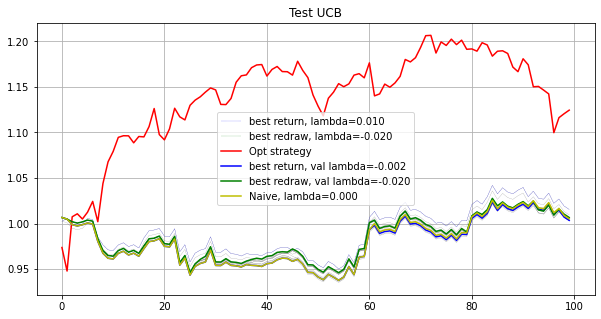

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.65224935
Mean return: 1.00062787
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


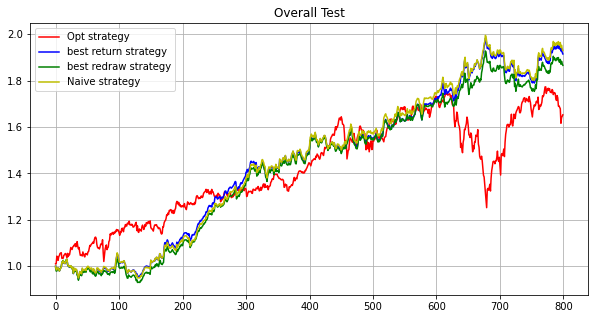

In [11]:
lb = 5
maxiter = 8000
subn = 100
path ='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
eps = 1.0001
delta = 0.008
run(path, maxiter, subn, lb, c=0.001, eps=eps, delta=delta, testv=np.arange(-0.02, 0.0100001, 0.002))

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[0.0101 0.0099 0.0098 0.0097 0.0115 0.0104 0.0093 0.0094 0.0101 0.0107
 0.0101 0.0097 0.0099 0.0095 0.0102 0.0089 0.0094 0.0101 0.0087 0.0093
 0.0097 0.0131 0.0098 0.0081 0.0098 0.0103 0.0102 0.009  0.0097 0.0089
 0.0093 0.0105 0.0103 0.0095 0.0108 0.0098 0.0095 0.0109 0.0099 0.0094
 0.0106 0.0097 0.0109 0.0085 0.011  0.0104 0.0107 0.009  0.0101 0.013
 0.0105 0.0097 0.0095 0.01   0.0103 0.0094 0.01   0.0097 0.009  0.01
 0.0097 0.0114 0.0112 0.0098 0.0094 0.0099 0.0098 0.0103 0.0097 0.0109
 0.0104 0.01   0.0103 0.0101 0.0097 0.0097 0.0095 0.0101 0.01   0.0101
 0.0097 0.0096 0.0099 0.0095 0.0098 0.01   0.01   0.0093 0.0102 0.0105
 0.0097 0.0101 0.0104 0.0104 0.0102 0.01   0.0105 0.0099 0.0101 0.0106]
0.04906486515275018
[0.0101 0.0099 0.0094 0.0083 0.0117 0.0103 0.01   0.0098 0.0102 0.0103
 0.0102 0.0095 0.0098 0.0088 0.0099 0.0076 0.008  0.0099 0.0085 0.0087
 0.0116 0.0132 0.01   0.0067 0.0096 0.0095 0.0098 0

[ 0.0102  0.0101  0.0075  0.0044  0.0127  0.0139  0.0091  0.0083  0.0127
  0.0088  0.0115  0.0091  0.0082  0.0068  0.0078  0.0079  0.0017  0.0109
 -0.      0.006   0.0186  0.0074  0.0113  0.0037  0.0055  0.012   0.007
  0.0121  0.0122  0.0062  0.0077  0.0132  0.0129  0.0129  0.0113  0.0107
  0.0059  0.0126  0.0177  0.0089  0.013   0.0111  0.0099 -0.      0.0121
  0.0109  0.0118  0.0038  0.0102  0.0079  0.0147  0.0092  0.0082  0.0097
  0.0141  0.0063  0.0104  0.0099  0.0106  0.0121  0.0115  0.0096  0.01
  0.0109  0.0077  0.014   0.0134  0.012   0.014   0.0107  0.0132  0.008
  0.0089  0.0111  0.0088  0.0095  0.0109  0.0099  0.0097  0.0123  0.0128
  0.0071  0.0133  0.0078  0.01    0.0105  0.011   0.007   0.0111  0.0116
  0.0094  0.0118  0.0133  0.0125  0.0129  0.01    0.0147  0.0015  0.0101
  0.0123]
0.00017079172213041812
[ 0.0102  0.0101  0.0075  0.0044  0.0127  0.0139  0.0091  0.0083  0.0127
  0.0088  0.0115  0.0091  0.0082  0.0068  0.0078  0.0079  0.0017  0.0109
 -0.      0.006   0.01

[ 0.0102  0.0102  0.0072  0.0013  0.0103  0.0155  0.008   0.0087  0.014
  0.0084  0.0114  0.0089  0.0079  0.0071  0.0071  0.0063 -0.      0.011
  0.      0.0061  0.0175  0.0012  0.0121  0.0033  0.0049  0.0135  0.0055
  0.0168  0.0127  0.0057  0.005   0.0139  0.0139  0.0151  0.0118  0.0108
  0.0051  0.0146  0.0205  0.0084  0.0126  0.01    0.0121  0.      0.0159
  0.0107  0.0111  0.0017  0.0103  0.0072  0.0155  0.0099  0.0075  0.0096
  0.0149  0.0065  0.0106  0.0093  0.01    0.0149  0.0095  0.0106  0.011
  0.01    0.0071  0.0138  0.0119  0.0124  0.0141  0.0107  0.0139  0.0085
  0.0094  0.0107  0.0085  0.0109  0.0102  0.0099  0.0099  0.0131  0.012
  0.0067  0.0143  0.0079  0.0094  0.0107  0.0112  0.0046  0.0117  0.0111
  0.0083  0.0121  0.0144  0.0127  0.0146  0.0102  0.016   0.0007  0.0101
  0.0126]
0.00024517223962456584
[ 0.0103  0.0102  0.0071  0.0013  0.0103  0.0155  0.008   0.0087  0.0141
  0.0084  0.0114  0.009   0.0079  0.0071  0.0071  0.0063 -0.      0.011
  0.0001  0.0061  0.017

[ 0.0103  0.0102  0.0072  0.0013  0.0103  0.0155  0.008   0.0087  0.0141
  0.0084  0.0114  0.009   0.0079  0.0071  0.0071  0.0063  0.      0.011
  0.      0.0061  0.0175  0.0011  0.0121  0.0033  0.0049  0.0135  0.0055
  0.0168  0.0126  0.0057  0.0049  0.0139  0.0139  0.0151  0.0118  0.0108
  0.0051  0.0146  0.0205  0.0084  0.0126  0.01    0.0121 -0.      0.0159
  0.0107  0.0111  0.0018  0.0103  0.0072  0.0155  0.0099  0.0075  0.0096
  0.0149  0.0065  0.0106  0.0093  0.01    0.0149  0.0095  0.0106  0.011
  0.01    0.0071  0.0138  0.0119  0.0124  0.0141  0.0107  0.0139  0.0085
  0.0094  0.0107  0.0085  0.0109  0.0102  0.0099  0.0099  0.0131  0.012
  0.0067  0.0143  0.0079  0.0094  0.0107  0.0112  0.0046  0.0117  0.011
  0.0083  0.0121  0.0144  0.0127  0.0146  0.0102  0.016   0.0007  0.0101
  0.0126]
0.00013949888581330573
[ 0.0103  0.0102  0.0072  0.0013  0.0103  0.0155  0.008   0.0087  0.0141
  0.0084  0.0114  0.009   0.0079  0.0071  0.0071  0.0063  0.      0.011
  0.      0.0061  0.017

[ 0.0103  0.0106  0.0053 -0.      0.0034  0.0206  0.0015  0.0116  0.0149
  0.0053  0.0125  0.0077  0.007   0.0064  0.0074  0.0024  0.      0.0097
  0.      0.0013  0.0181  0.0092  0.0049  0.      0.0081  0.0148  0.0044
  0.0108  0.0149  0.0023 -0.      0.0149  0.0177  0.0116  0.0053  0.0117
  0.0013  0.0178  0.0201  0.005   0.0152  0.0073  0.0141 -0.      0.0171
  0.0096  0.0214  0.0027  0.0095  0.      0.02    0.011   0.0073  0.0077
  0.018   0.0026  0.0121  0.0078  0.0025  0.0084  0.0034  0.0114  0.0166
  0.0091  0.0033  0.0208  0.0092  0.0151  0.0158  0.0104  0.018   0.0099
  0.0132  0.0107  0.0089  0.0112  0.0084  0.0089  0.0103  0.019   0.0098
  0.006   0.0197  0.0075  0.0142  0.0117  0.0124  0.0016  0.0139  0.0098
  0.0059  0.0135  0.0169  0.0166  0.0166  0.0111  0.0208  0.0046  0.011
  0.0179]
0.0004168416833096524
[ 0.0103  0.0106  0.0053 -0.      0.0034  0.0206  0.0015  0.0116  0.0148
  0.0053  0.0125  0.0077  0.007   0.0064  0.0074  0.0024  0.      0.0097
 -0.      0.0013  0.

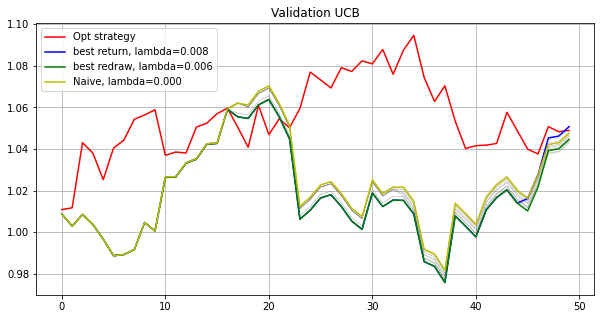

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[0.01   0.0102 0.008  0.0015 0.0148 0.0131 0.0084 0.0069 0.0089 0.0085
 0.0112 0.0054 0.01   0.0115 0.0105 0.008  0.0053 0.0124 0.0058 0.0102
 0.0082 0.     0.009  0.0078 0.0088 0.0114 0.0091 0.0191 0.013  0.0117
 0.0077 0.0114 0.0117 0.0132 0.0087 0.0106 0.0099 0.0124 0.0119 0.0098
 0.0121 0.0112 0.0096 0.0055 0.0115 0.0095 0.007  0.0086 0.0109 0.009
 0.0128 0.01   0.0087 0.0124 0.0128 0.01   0.0106 0.009  0.0108 0.0131
 0.0059 0.0102 0.0099 0.0111 0.0084 0.0112 0.0117 0.0092 0.0138 0.0104
 0.0112 0.0093 0.0115 0.01   0.0095 0.0117 0.0101 0.0099 0.0098 0.0135
 0.0096 0.0095 0.0119 0.0072 0.0112 0.0104 0.0108 0.0062 0.0105 0.0141
 0.0093 0.0117 0.0118 0.0108 0.0097 0.0102 0.0125 0.0023 0.0102 0.0108]
0.021050541741515893
[ 0.0101  0.0103  0.0075 -0.      0.0127  0.0144  0.0067  0.0066  0.0096
  0.0026  0.0113  0.0041  0.01    0.0117  0.0113  0.0081  0.0042  0.0143
  0.0054  0.0097  0.0082 -0.      0.0097  0.0058  0.0078  0.0116  0.0095
  0.0204  0.0132  0.0108  0.006   0.0128  0.0123  

[ 0.0101  0.0103  0.0067  0.      0.0073  0.0158  0.0051  0.0068  0.0082
  0.0041  0.0116  0.0035  0.0096  0.01    0.0101  0.0067  0.0065  0.0153
  0.0036  0.0082  0.0114  0.      0.0081  0.004   0.014   0.0124  0.0087
  0.0225  0.0136  0.0093  0.0035  0.0129  0.0135  0.0122  0.0076  0.0103
  0.0078  0.0144  0.0139  0.0081  0.0137  0.011   0.0107  0.0099  0.0087
  0.0095  0.006   0.007   0.0099  0.0063  0.0151  0.0106  0.0062  0.0135
  0.0153  0.0104  0.0107  0.0075  0.0073  0.0153  0.0039  0.0127  0.0084
  0.0109  0.0078  0.0076  0.0112  0.0098  0.0161  0.0117  0.0131  0.0089
  0.0126  0.011   0.0087  0.0141  0.009   0.0105  0.0094  0.0154  0.0089
  0.0085  0.0136  0.0072  0.0118  0.0109  0.0109  0.0065  0.0117  0.0177
  0.0081  0.0126  0.0139  0.0119  0.0115  0.0101  0.0151 -0.      0.0104
  0.0142]
5.786962326047945e-05
[ 0.0101  0.0103  0.0067  0.      0.0073  0.0158  0.0051  0.0068  0.0082
  0.0041  0.0116  0.0035  0.0096  0.01    0.0101  0.0067  0.0065  0.0153
  0.0036  0.0082  0

[ 0.0109  0.0105  0.005  -0.      0.0058  0.0154  0.0084  0.0126  0.0107
 -0.      0.0102  0.0027  0.0093  0.0085  0.0081  0.0051  0.0004  0.0172
  0.      0.0058  0.0105  0.      0.0024 -0.      0.0126  0.015   0.0098
  0.0207  0.0113  0.0089  0.0032  0.0172  0.0162  0.014   0.0094  0.0104
  0.005   0.0123  0.0124  0.009   0.0158  0.0108  0.0119  0.0074  0.0102
  0.0105  0.006   0.0035  0.0086  0.0037  0.0184  0.0148  0.0021  0.0127
  0.0189  0.0053  0.0113  0.0073  0.0066  0.0136  0.0007  0.008   0.0114
  0.0086  0.0032  0.0093  0.0144  0.0119  0.0152  0.0169  0.0163  0.0061
  0.0121  0.0116  0.0077  0.0146  0.0091  0.0092  0.0096  0.0158  0.0092
  0.0075  0.0167  0.0028  0.0116  0.0117  0.0113  0.0059  0.0138  0.0262
  0.0095  0.0154  0.0164  0.0126  0.0101  0.0107  0.022  -0.      0.0116
  0.017 ]
0.00013381342877633363
[ 0.0109  0.0106  0.0044  0.0007  0.0056  0.015   0.0049  0.0114  0.012
 -0.      0.0106 -0.      0.0092  0.0091  0.0072  0.0042 -0.      0.0173
 -0.      0.0049  0

[ 0.0109  0.0106  0.0044  0.0007  0.0056  0.015   0.0049  0.0114  0.012
 -0.      0.0106 -0.      0.0092  0.0091  0.0072  0.0042  0.      0.0173
 -0.      0.0049  0.0099  0.0031  0.0004  0.      0.0132  0.0154  0.0097
  0.0174  0.0115  0.0076  0.0017  0.0218  0.0172  0.0172  0.0067  0.0105
  0.0065  0.012   0.0141  0.0076  0.0164  0.0117  0.0124  0.005   0.0065
  0.0106  0.006   0.0034  0.009   0.0035  0.0199  0.0148  0.0022  0.0132
  0.0194  0.0055  0.0115  0.0066  0.0072  0.0135  0.0007  0.0101  0.0102
  0.0088  0.0015  0.0101  0.0121  0.0112  0.0176  0.0185  0.0168  0.0047
  0.0113  0.0117  0.0074  0.0162  0.0119  0.0094  0.0096  0.0169  0.009
  0.0075  0.0181  0.0033  0.0116  0.0119  0.0118  0.0045  0.0134  0.0251
  0.0094  0.016   0.0174  0.0131  0.0094  0.0105  0.0228  0.      0.0118
  0.0173]
9.640640462528869e-05
[ 0.0109  0.0106  0.0044  0.0008  0.0056  0.015   0.0049  0.0114  0.012
 -0.      0.0106 -0.      0.0092  0.0091  0.0072  0.0042 -0.      0.0173
 -0.      0.0049  0.00

[ 0.0107  0.0106  0.0036  0.0022  0.0037  0.0156  0.0051  0.012   0.0115
  0.      0.0108  0.      0.0088  0.0089  0.0073  0.0042  0.      0.018
  0.0001  0.0037  0.0109  0.0048  0.0009  0.      0.0131  0.0144  0.0088
  0.0176  0.0116  0.0088  0.0005  0.0234  0.0177  0.0164  0.0058  0.0105
  0.0058  0.0117  0.0137  0.0078  0.0161  0.0111  0.0124  0.0044  0.0068
  0.0104  0.0065  0.0036  0.0085  0.0009  0.0205  0.0146  0.0014  0.0129
  0.0206  0.0039  0.0117  0.0067  0.0076  0.0132 -0.      0.0109  0.0109
  0.0074  0.0016  0.0101  0.0142  0.0117  0.0182  0.0191  0.0174  0.0036
  0.0113  0.0118  0.007   0.0162  0.0129  0.0098  0.0095  0.0175  0.0088
  0.0073  0.018   0.0031  0.0126  0.012   0.0117  0.0042  0.0136  0.0233
  0.0095  0.0162  0.0178  0.0132  0.0089  0.0106  0.0233  0.0002  0.012
  0.0176]
0.00043482894854787615
[ 0.0107  0.0106  0.0036  0.0022  0.0037  0.0156  0.0051  0.012   0.0115
  0.      0.0108  0.      0.0088  0.0089  0.0073  0.0042  0.      0.018
  0.0002  0.0037  0.0

[ 0.0107  0.0106  0.0036  0.0022  0.0037  0.0156  0.0051  0.012   0.0115
  0.      0.0108  0.      0.0088  0.0089  0.0073  0.0042 -0.      0.018
  0.0001  0.0037  0.0109  0.0048  0.0009 -0.      0.0131  0.0144  0.0087
  0.0176  0.0116  0.0088  0.0005  0.0234  0.0177  0.0164  0.0058  0.0105
  0.0058  0.0117  0.0137  0.0078  0.0161  0.0111  0.0124  0.0043  0.0068
  0.0104  0.0065  0.0036  0.0085  0.0009  0.0205  0.0146  0.0014  0.0129
  0.0206  0.0039  0.0117  0.0067  0.0076  0.0132  0.      0.0109  0.0109
  0.0074  0.0016  0.0101  0.0142  0.0117  0.0182  0.0191  0.0174  0.0036
  0.0113  0.0118  0.007   0.0162  0.0129  0.0098  0.0095  0.0175  0.0088
  0.0073  0.018   0.0031  0.0126  0.012   0.0117  0.0042  0.0136  0.0233
  0.0095  0.0162  0.0178  0.0132  0.0089  0.0106  0.0233  0.0002  0.012
  0.0176]
0.00015840511366661548
[ 0.0107  0.0106  0.0036  0.0022  0.0037  0.0156  0.0051  0.012   0.0115
 -0.      0.0108  0.      0.0088  0.0089  0.0073  0.0042 -0.      0.018
  0.0001  0.0037  0.0

[ 0.0107  0.0106  0.0036  0.0022  0.0037  0.0156  0.0051  0.012   0.0115
 -0.      0.0108 -0.      0.0088  0.0089  0.0073  0.0042 -0.      0.018
  0.0002  0.0037  0.0109  0.0048  0.0009  0.      0.0131  0.0144  0.0088
  0.0176  0.0116  0.0088  0.0005  0.0234  0.0177  0.0164  0.0059  0.0105
  0.0058  0.0117  0.0137  0.0078  0.0161  0.0111  0.0124  0.0044  0.0068
  0.0104  0.0065  0.0036  0.0085  0.0009  0.0205  0.0146  0.0014  0.0129
  0.0206  0.0039  0.0117  0.0067  0.0077  0.0132  0.      0.0109  0.0109
  0.0074  0.0016  0.0102  0.0142  0.0117  0.0182  0.0191  0.0174  0.0036
  0.0113  0.0118  0.007   0.0162  0.0129  0.0098  0.0095  0.0175  0.0088
  0.0073  0.018   0.0031  0.0126  0.012   0.0117  0.0042  0.0136  0.0233
  0.0095  0.0162  0.0178  0.0132  0.0089  0.0106  0.0233  0.0002  0.012
  0.0176]
0.00030847982455944856
[ 0.0107  0.0106  0.0036  0.0022  0.0037  0.0156  0.0051  0.012   0.0115
 -0.      0.0108 -0.      0.0088  0.0089  0.0073  0.0042 -0.      0.018
  0.0002  0.0037  0.0

[ 0.0109  0.0106  0.0033  0.0018  0.0044  0.0158  0.0031  0.0111  0.0116
  0.      0.011   0.      0.0085  0.0087  0.007   0.0036 -0.      0.018
  0.      0.0038  0.0118  0.0052  0.0008 -0.      0.0129  0.015   0.0083
  0.0184  0.011   0.0079 -0.      0.0225  0.0181  0.017   0.0046  0.0108
  0.0052  0.0119  0.0138  0.0077  0.0162  0.0113  0.012   0.0042  0.0079
  0.0106  0.0052  0.0036  0.0088  0.0012  0.0211  0.0146  0.0005  0.0133
  0.0213  0.0041  0.0117  0.0064  0.0076  0.0132 -0.      0.0114  0.0113
  0.0072  0.001   0.0102  0.014   0.0115  0.0199  0.0187  0.0176  0.0035
  0.0119  0.0119  0.0072  0.0165  0.013   0.0097  0.0096  0.0182  0.0094
  0.0074  0.0186  0.003   0.0123  0.0121  0.0118  0.0031  0.0139  0.0237
  0.0092  0.0164  0.0183  0.0128  0.0087  0.0106  0.0241  0.      0.0118
  0.0179]
0.00029233742537520814
[ 0.0111  0.0107  0.0029  0.005   0.001   0.017   0.0041  0.0114  0.0114
 -0.      0.0113  0.0003  0.0084  0.0083  0.0065  0.0021  0.      0.0197
  0.      0.0026  0

[ 0.0118  0.0106  0.0005  0.0017 -0.      0.0216  0.0103  0.0143  0.0097
  0.0026  0.0117 -0.      0.0072  0.005   0.0035  0.0007 -0.      0.0208
  0.      0.0008  0.016   0.0066  0.0063  0.      0.0153  0.0176  0.0086
  0.0159  0.0072  0.0045  0.0007  0.0149  0.0212  0.0166  0.0028  0.0123
  0.0042  0.007   0.014   0.0047  0.0172  0.0077  0.0112  0.0031  0.0133
  0.0102  0.0049  0.0036  0.0024  0.0104  0.0249  0.0135 -0.      0.009
  0.023   0.      0.0119  0.0051  0.002   0.0088  0.0001  0.01    0.0135
  0.007   0.0006  0.0118  0.0116  0.0145  0.0175  0.0221  0.0212  0.0019
  0.0073  0.0124  0.0054  0.0163  0.0183  0.0082  0.0092  0.0188  0.0099
  0.0064  0.0204  0.003   0.0108  0.0127  0.0107  0.0022  0.0175  0.023
  0.0062  0.0179  0.0213  0.0164  0.0087  0.0105  0.0292  0.0019  0.0117
  0.0201]
0.00019782398292863087
[ 0.0118  0.0106  0.0005  0.0017 -0.      0.0216  0.0103  0.0143  0.0097
  0.0026  0.0117 -0.      0.0072  0.005   0.0035  0.0007 -0.      0.0208
  0.      0.0008  0.

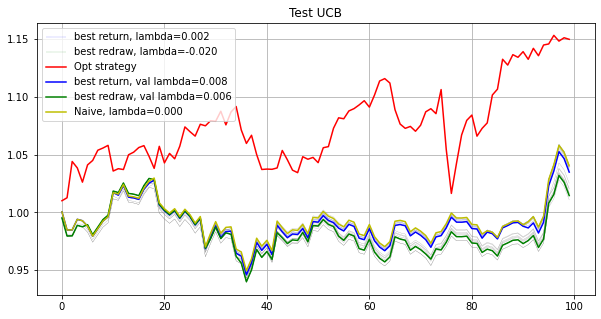

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[0.0075 0.0106 0.0124 0.0038 0.0098 0.0102 0.0097 0.0115 0.0043 0.0097
 0.0075 0.0092 0.0088 0.0107 0.0111 0.0129 0.0108 0.0103 0.0113 0.0081
 0.012  0.0111 0.0102 0.0116 0.0125 0.0105 0.0086 0.0108 0.009  0.0057
 0.0077 0.0118 0.0096 0.0087 0.0096 0.0081 0.0087 0.0087 0.0125 0.0087
 0.0094 0.0091 0.0109 0.0095 0.0094 0.0097 0.0103 0.0062 0.0104 0.0109
 0.0104 0.0094 0.0139 0.0115 0.0089 0.0079 0.0089 0.0126 0.0073 0.01
 0.011  0.0106 0.0082 0.0112 0.013  0.0109 0.0094 0.0092 0.0123 0.0109
 0.01   0.0116 0.0126 0.0081 0.0097 0.01   0.0104 0.0115 0.0113 0.0076
 0.0121 0.0109 0.0107 0.0095 0.0107 0.0106 0.0084 0.0096 0.0102 0.0096
 0.0087 0.0127 0.0111 0.0083 0.0092 0.0105 0.011  0.0108 0.0109 0.0124]
0.13518799573731174
[0.005  0.0108 0.0152 0.0038 0.0096 0.0085 0.0096 0.0108 0.0031 0.0095
 0.0062 0.0088 0.0092 0.0103 0.0122 0.0136 0.0092 0.0106 0.013  0.0073
 0.0119 0.0103 0.0101 0.0128 0.0128 0.0114 0.0098 

[ 0.      0.016   0.0162  0.      0.0081  0.01    0.0065  0.0191  0.
  0.003   0.      0.0054  0.0072  0.0057  0.0084  0.0099 -0.      0.0005
  0.0186  0.0049  0.0104  0.0224  0.0116  0.004   0.0199  0.0113  0.0079
  0.0145  0.005  -0.      0.      0.0135  0.0081  0.0093  0.0105  0.0033
 -0.      0.0053  0.0165  0.0013  0.0211  0.0136  0.0135  0.0145  0.0003
  0.0075  0.0034  0.0027  0.0103  0.0078  0.0109  0.0009  0.0273  0.0205
  0.0047  0.0006  0.008   0.0156  0.0093  0.0001  0.0103  0.0145  0.0021
  0.0028  0.019   0.0094  0.0019  0.0075  0.0245  0.0066  0.0114  0.0232
  0.0238  0.006   0.0083  0.0116  0.0141  0.0186  0.0178  0.      0.0141
  0.0147  0.0188  0.0175  0.0219  0.0152  0.0088  0.0147  0.0042  0.009
  0.0103  0.0109  0.0177  0.0123  0.0079  0.0066  0.0162  0.0166  0.0186
  0.0037]
0.00033472918343806733
[-0.      0.0162  0.0169  0.0003  0.008   0.0104  0.0062  0.0192  0.0011
  0.0023 -0.      0.0052  0.0073  0.0051  0.0076  0.0091  0.     -0.
  0.0187  0.0043  0.0101  0

[ 0.0016  0.0164  0.0185  0.      0.0078  0.0092  0.0054  0.0194  0.001
  0.0013 -0.      0.0046  0.0075  0.0051  0.0087  0.012  -0.     -0.
  0.0192  0.0039  0.0102  0.0234  0.0116  0.0029  0.0196  0.0109  0.0095
  0.0131  0.0038  0.     -0.      0.0102  0.0098  0.01    0.0104  0.0016
 -0.      0.0051  0.0157  0.      0.0212  0.0141  0.0136  0.0143  0.
  0.0076  0.0033  0.0023  0.0096  0.008   0.0106  0.0002  0.0258  0.0217
  0.005   0.      0.0075  0.0164  0.0077  0.0002  0.01    0.0152  0.
  0.0033  0.0204  0.0089  0.0015  0.0091  0.0257  0.0077  0.0114  0.0224
  0.0232  0.0059  0.0081  0.0112  0.0146  0.0189  0.0183 -0.      0.0148
  0.0149  0.0196  0.0179  0.0234  0.0157  0.0094  0.0152  0.0032  0.0088
  0.0103  0.0111  0.0184  0.013   0.0077  0.0057  0.0158  0.0171  0.0196
  0.0038]
0.00025701720984875134
[ 0.0016  0.0164  0.0185  0.      0.0078  0.0092  0.0054  0.0194  0.001
  0.0013 -0.      0.0046  0.0075  0.0051  0.0087  0.012  -0.     -0.
  0.0192  0.0039  0.0102  0.0234  0.

[ 0.0024  0.0186  0.0188  0.0036  0.0073  0.0066  0.0031  0.0206  0.0008
  0.      0.      0.0026  0.0084  0.0026 -0.      0.0093  0.      0.0017
  0.0164  0.0008  0.0106  0.0264  0.0122  0.0035  0.0177  0.0071  0.0081
  0.0131  0.0021  0.      0.0027  0.0128  0.005   0.0098  0.0094  0.0005
 -0.      0.0023  0.017   0.0002  0.0263  0.0109  0.0157  0.0151  0.
  0.0107  0.0016  0.0015  0.01    0.0007  0.0101  0.      0.0351  0.0199
  0.0031 -0.      0.005   0.0125  0.0071  0.0022  0.0082  0.0177  0.0005
  0.0058  0.0214  0.0085  0.0023  0.0088  0.03    0.0005  0.0122  0.0284
  0.0259  0.0019  0.008   0.0117  0.0169  0.023   0.0216  0.0018  0.0122
  0.0169  0.0219  0.0198  0.0257  0.0177  0.0103  0.0175  0.0013  0.0092
  0.0105  0.0083  0.0212  0.0115  0.007   0.0024  0.0121  0.0198  0.022
  0.0058]
0.07776743270847938
[ 0.0024  0.0186  0.0188  0.0036  0.0073  0.0066  0.0031  0.0206  0.0008
  0.      0.      0.0026  0.0084  0.0026 -0.      0.0093  0.      0.0017
  0.0164  0.0008  0.0106  

[ 0.      0.0204  0.0145  0.0032  0.0063  0.0119  0.0016  0.0218  0.
 -0.     -0.      0.0006  0.0024  0.0018  0.0044  0.0161  0.     -0.
  0.0131  0.      0.015   0.0317  0.0122  0.0058  0.0197  0.0049  0.0085
  0.0156 -0.      0.0017 -0.      0.0118  0.0046  0.0041  0.0076  0.0011
 -0.      0.0022  0.0189  0.0009  0.0204  0.0104  0.0154  0.0124 -0.
  0.0128  0.0001  0.0008  0.0126  0.      0.0098  0.      0.0216  0.0208
  0.0031 -0.      0.0034  0.0114  0.0086 -0.      0.009   0.0225  0.0008
  0.0034  0.0208  0.0082  0.0017  0.0091  0.0333  0.0061  0.0114  0.0317
  0.0254  0.0004  0.0068  0.0081  0.0199  0.023   0.0233 -0.      0.011
  0.0195  0.0285  0.0217  0.0317  0.0184  0.008   0.0206  0.0011  0.0094
  0.0097  0.0072  0.0235  0.0119  0.0071  0.002   0.0089  0.0213  0.0231
  0.0025]
4.789212438079939e-05
[ 0.      0.0203  0.0145  0.0032  0.0063  0.0119  0.0016  0.0218  0.
  0.      0.      0.0006  0.0024  0.0018  0.0044  0.0161  0.     -0.
  0.0131  0.      0.015   0.0317  0.0121

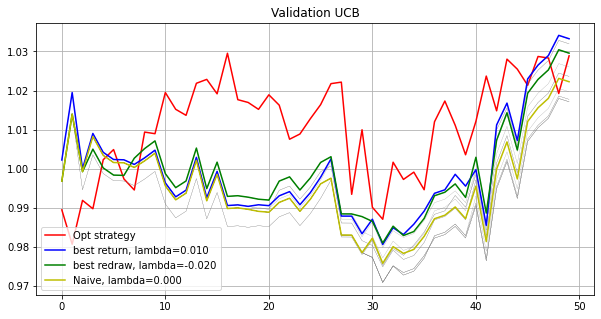

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[ 0.0008  0.0142 -0.      0.0078  0.0075  0.0022  0.0045  0.0142  0.0079
  0.0015 -0.      0.0043  0.0165  0.0116  0.0121  0.0049  0.0069  0.0184
  0.007   0.0075  0.009   0.0174  0.0109  0.0192  0.0092  0.0074  0.008
  0.001   0.0067  0.0037  0.0096 -0.      0.0098 -0.      0.017   0.0108
  0.0018  0.0102  0.0077  0.0057  0.014   0.0146  0.0098  0.0141  0.
  0.0065  0.0018  0.0098  0.0153  0.0068  0.0148  0.0106  0.021   0.0239
  0.0122 -0.      0.0072  0.0119  0.01    0.0072  0.0103  0.0181  0.0056
  0.005   0.0206  0.0131  0.0072  0.0129  0.0191  0.0043  0.0081  0.0151
  0.0116  0.0107  0.0072  0.0084  0.0126  0.0144  0.0152  0.0158  0.0153
  0.0134  0.0162  0.016   0.02    0.0162  0.008   0.0127  0.0052  0.0087
  0.0099  0.012   0.0155  0.0083  0.0094  0.0066  0.0131  0.0147  0.0158
  0.0009]
0.18370440142348277
[ 0.0009  0.0146  0.      0.0073  0.0074  0.0028  0.0044  0.0142  0.006
  0.0011 -0.      0.0039  0.0171  0.0118  0.0136  0.0058  0.0059  0.0189
  0.0071  0.0069  0.0086  0

[-0.      0.0156  0.      0.0126  0.0069  0.0027  0.0039  0.015   0.
 -0.      0.      0.0018  0.0188  0.0095  0.0159  0.0033  0.0021  0.0167
  0.0092  0.0053  0.0087  0.0186  0.0113  0.0164  0.0103  0.0061  0.0075
  0.0027  0.0057  0.0053  0.0061  0.0042  0.0085  0.0005  0.0171  0.0118
  0.      0.0095  0.0083  0.0013  0.0212  0.0173  0.0104  0.0164  0.
  0.0085  0.      0.011   0.0134  0.0034  0.0142  0.0091  0.0213  0.0244
  0.0117  0.0004  0.0069  0.0143  0.0101  0.001   0.0104  0.0203  0.0061
  0.0037  0.0245  0.0124  0.0064  0.0168  0.0221  0.0018  0.0079  0.0147
  0.0108  0.0078  0.0065  0.0078  0.0136  0.0137  0.0169  0.0143  0.0157
  0.0151  0.0153  0.0191  0.0242  0.0173  0.0079  0.0159  0.0037  0.0086
  0.0094  0.0091  0.0171  0.0069  0.009   0.0071  0.0116  0.0163  0.0171
  0.001 ]
0.00013065632462778932
[-0.      0.0156  0.      0.0126  0.0069  0.0027  0.0039  0.015   0.
  0.      0.      0.0018  0.0188  0.0095  0.0159  0.0033  0.0021  0.0167
  0.0092  0.0053  0.0087  0.01

[0.     0.016  0.     0.0084 0.0065 0.0001 0.0033 0.0162 0.0011 0.
 0.     0.001  0.0199 0.0079 0.0143 0.0045 0.0043 0.0132 0.01   0.004
 0.0105 0.0189 0.0113 0.0185 0.0103 0.0046 0.0091 0.0024 0.0054 0.004
 0.0056 0.0048 0.0058 0.     0.0169 0.0114 0.     0.0101 0.0075 0.
 0.0194 0.0142 0.0103 0.0142 0.0004 0.009  0.0002 0.0111 0.0142 0.0036
 0.0139 0.0083 0.0232 0.0268 0.0121 0.0019 0.0057 0.0144 0.0076 0.0001
 0.0112 0.0208 0.0056 0.0057 0.0266 0.0129 0.0078 0.0167 0.0232 0.0035
 0.008  0.0175 0.0093 0.0085 0.0063 0.0076 0.0138 0.0153 0.0175 0.0121
 0.0154 0.0152 0.016  0.0196 0.0245 0.018  0.008  0.0152 0.0033 0.0086
 0.0105 0.0095 0.0177 0.0074 0.0087 0.0067 0.0107 0.0167 0.0177 0.0021]
0.09331966501360038
[ 0.      0.0161  0.0002  0.0081  0.0065  0.      0.0031  0.0165  0.0013
 -0.     -0.      0.0005  0.0194  0.0078  0.0133  0.0045  0.0036  0.0123
  0.0109  0.0037  0.0104  0.019   0.0113  0.0177  0.0105  0.0045  0.0099
  0.0024  0.0055  0.0047  0.0049  0.0057  0.0059  0.0005  0.

[ 0.      0.0163  0.0008  0.0088  0.0063  0.      0.0026  0.0158  0.0007
 -0.      0.0006  0.0001  0.0191  0.0076  0.0115  0.0067  0.0071  0.0126
  0.0107  0.0034  0.0101  0.0179  0.0113  0.0176  0.011   0.0038  0.0096
  0.0024  0.0054  0.0029  0.0051  0.0062  0.0079 -0.      0.0168  0.0109
  0.      0.01    0.0084  0.0012  0.0205  0.0127  0.0104  0.0143  0.0005
  0.0093  0.      0.0098  0.0139  0.0026  0.0138  0.0081  0.0226  0.0274
  0.0122 -0.      0.0055  0.0139  0.0078  0.0012  0.0114  0.0209  0.0055
  0.0067  0.0267  0.0123  0.0074  0.0162  0.0242  0.0049  0.0079  0.0175
  0.0087  0.0095  0.006   0.0076  0.014   0.0152  0.0181  0.0117  0.0153
  0.0151  0.0171  0.0199  0.0254  0.0184  0.0073  0.0171  0.0027  0.0086
  0.0115  0.0085  0.0181  0.007   0.0084  0.006   0.0092  0.0171  0.0178
  0.0012]
9.326270612694977e-05
[ 0.      0.0163  0.0008  0.0088  0.0063  0.      0.0026  0.0158  0.0007
 -0.      0.0006  0.0001  0.0191  0.0076  0.0115  0.0067  0.0071  0.0126
  0.0107  0.0034  0

[ 0.0021  0.0184  0.0013  0.0097  0.0058  0.0001 -0.      0.0137  0.0018
 -0.     -0.     -0.      0.018   0.0079  0.0119  0.0022  0.      0.007
  0.014  -0.      0.0142  0.0188  0.012   0.0204  0.0109  0.0023  0.0117
  0.0063  0.0056  0.      0.0032  0.0127  0.0023  0.      0.0158  0.012
  0.      0.0113  0.015   0.0022  0.0244  0.0043  0.0115  0.0135  0.
  0.0086  0.0002  0.0045  0.011  -0.      0.0141  0.0094  0.0194  0.0299
  0.0159  0.      0.0057  0.0107  0.0051 -0.      0.0095  0.0237  0.005
 -0.      0.0262  0.0133  0.0077  0.0194  0.0297 -0.      0.0088  0.02
  0.0088  0.0123  0.0056  0.0073  0.0149  0.0138  0.0207  0.0095  0.0138
  0.016   0.0204  0.0209  0.0327  0.0215  0.0058  0.0182  0.0019  0.0089
  0.0141  0.0028  0.0209  0.0045  0.0076  0.0033  0.0106  0.0185  0.0197
  0.0027]
8.876255290278531e-05
[ 0.0021  0.0184  0.0013  0.0097  0.0058  0.0001 -0.      0.0137  0.0018
 -0.     -0.     -0.      0.018   0.0079  0.0119  0.0022 -0.      0.007
  0.014  -0.      0.0142  0.0

[ 0.      0.0206  0.0007  0.0074  0.0067  0.0036 -0.      0.0107  0.0019
 -0.     -0.      0.      0.0168  0.0026  0.0133  0.     -0.      0.0066
  0.0135 -0.      0.0181  0.0062  0.0123  0.0204  0.011   0.0092  0.0102
  0.0021  0.004  -0.     -0.      0.0233  0.0049  0.0021  0.0201  0.0087
 -0.      0.0129  0.0149  0.      0.0151  0.0044  0.014   0.0111 -0.
  0.0097 -0.      0.0095  0.0089 -0.      0.0156  0.0127  0.027   0.0312
  0.0124 -0.      0.0052  0.0032  0.0024  0.0004  0.0074  0.0263  0.0078
  0.0006  0.0266  0.0164  0.0061  0.0212  0.0343 -0.      0.0099  0.0147
  0.0089  0.0102  0.0047  0.0043  0.0153  0.0115  0.0241  0.0005  0.0129
  0.0172  0.0176  0.022   0.0366  0.0231  0.0098  0.0194  0.0013  0.0103
  0.0149 -0.      0.0237  0.0038  0.007  -0.      0.0114  0.0214  0.0229
  0.0064]
0.22492135706902283
[-0.      0.0206  0.0007  0.0074  0.0067  0.0036 -0.      0.0107  0.0019
 -0.     -0.     -0.      0.0168  0.0026  0.0133  0.     -0.      0.0066
  0.0135 -0.      0.018  

[-0.      0.0205  0.0007  0.0075  0.0067  0.0036  0.      0.0107  0.0019
  0.      0.      0.      0.0168  0.0026  0.0133  0.      0.      0.0066
  0.0135  0.      0.0181  0.0062  0.0123  0.0204  0.011   0.0092  0.0102
  0.0021  0.004  -0.      0.      0.0233  0.0049  0.0021  0.0201  0.0087
  0.      0.0129  0.0149  0.0001  0.0151  0.0044  0.014   0.0111 -0.
  0.0097 -0.      0.0095  0.0089 -0.      0.0156  0.0127  0.027   0.0312
  0.0124 -0.      0.0052  0.0032  0.0024  0.0004  0.0074  0.0263  0.0078
  0.0006  0.0266  0.0164  0.0061  0.0212  0.0343 -0.      0.0099  0.0147
  0.009   0.0101  0.0047  0.0043  0.0153  0.0115  0.0241  0.0005  0.0129
  0.0172  0.0176  0.0221  0.0366  0.0231  0.0098  0.0194  0.0013  0.0103
  0.0149  0.      0.0237  0.0038  0.007  -0.      0.0114  0.0214  0.023
  0.0064]
0.00011553776559631291
[ 0.      0.0207  0.0007  0.0085  0.0066  0.0034  0.      0.0104  0.0042
  0.      0.     -0.      0.0171  0.0028  0.0123  0.0002 -0.      0.0065
  0.0141 -0.      0.017

[-0.      0.0212  0.0043  0.01    0.0062  0.0046  0.      0.0111  0.
  0.      0.      0.      0.0155  0.0019  0.0086 -0.      0.      0.0022
  0.0139 -0.      0.0189  0.0088  0.0124  0.0216  0.0122  0.0079  0.0133
  0.0016  0.0038  0.      0.0003  0.0166  0.0032  0.0007  0.0204  0.0067
  0.      0.0099  0.0147  0.003   0.0187  0.      0.0148  0.0108  0.0011
  0.0138  0.0009  0.0118  0.0088  0.0008  0.0183  0.0085  0.029   0.0315
  0.0113  0.      0.0051  0.0052  0.0017  0.0011  0.0079  0.0268  0.0057
  0.0015  0.0302  0.0147  0.0052  0.0194  0.0357 -0.      0.01    0.0138
  0.0105  0.01    0.0041  0.0031  0.0165  0.011   0.0246  0.      0.0097
  0.0172  0.0172  0.0215  0.0375  0.0237  0.0109  0.0186  0.0007  0.0103
  0.0142  0.      0.0249  0.003   0.0071 -0.      0.0101  0.0224  0.0239
  0.0081]
3.206741083276264e-05
[-0.      0.0212  0.0043  0.01    0.0062  0.0046  0.      0.0111 -0.
  0.     -0.     -0.      0.0155  0.0019  0.0086 -0.      0.      0.0022
  0.0139 -0.      0.0189  0

[ 0.      0.0212  0.0043  0.01    0.0062  0.0046  0.      0.0111 -0.
 -0.     -0.      0.      0.0155  0.0019  0.0086 -0.      0.      0.0022
  0.0139 -0.      0.0189  0.0088  0.0124  0.0216  0.0122  0.0079  0.0133
  0.0016  0.0038  0.      0.0003  0.0166  0.0032  0.0007  0.0204  0.0067
  0.      0.0099  0.0147  0.003   0.0187 -0.      0.0148  0.0108  0.0011
  0.0138  0.0009  0.0118  0.0088  0.0008  0.0183  0.0085  0.029   0.0315
  0.0113 -0.      0.0051  0.0052  0.0017  0.0011  0.0079  0.0268  0.0057
  0.0015  0.0302  0.0147  0.0052  0.0194  0.0357 -0.      0.01    0.0138
  0.0105  0.01    0.0041  0.0031  0.0165  0.011   0.0246 -0.      0.0097
  0.0172  0.0172  0.0215  0.0375  0.0237  0.0109  0.0186  0.0007  0.0103
  0.0142  0.      0.0249  0.003   0.0071 -0.      0.0101  0.0224  0.0239
  0.0081]
6.240725894920981e-05
[ 0.      0.0212  0.0043  0.01    0.0062  0.0046  0.      0.0111  0.
 -0.     -0.     -0.      0.0155  0.0019  0.0086 -0.      0.      0.0022
  0.0139  0.      0.0189  0

[ 0.      0.0219  0.0034  0.0119  0.0051  0.0035  0.      0.0114  0.0025
  0.      0.      0.      0.0153  0.0016  0.0064  0.0003  0.      0.0003
  0.0123 -0.      0.0186  0.0108  0.0123  0.0206  0.0104  0.0071  0.0125
  0.0041  0.0023 -0.      0.      0.0151  0.0039  0.0005  0.0189  0.006
 -0.      0.0102  0.0149  0.0039  0.0181 -0.      0.0149  0.0114 -0.
  0.0129  0.0008  0.0093  0.0081  0.0002  0.0204  0.0069  0.028   0.0294
  0.0089  0.0017  0.0047  0.0066  0.0036  0.0014  0.0063  0.0281  0.0056
  0.0013  0.0305  0.0127  0.0059  0.0205  0.0377  0.      0.0098  0.012
  0.0103  0.0127  0.003   0.0022  0.0164  0.0125  0.0263  0.0016  0.008
  0.0179  0.0187  0.0214  0.0398  0.024   0.0102  0.0198 -0.      0.0098
  0.0135  0.0033  0.0262  0.0022  0.0059  0.      0.0127  0.0232  0.0244
  0.0086]
6.012625424652864e-05
Opt strategy   Total log return: 0.08534376    Max redraw: 0.04950321
Total return: 1.08909138
Mean return: 1.00085380
best return val lambda: -0.018   Total log return: 0.

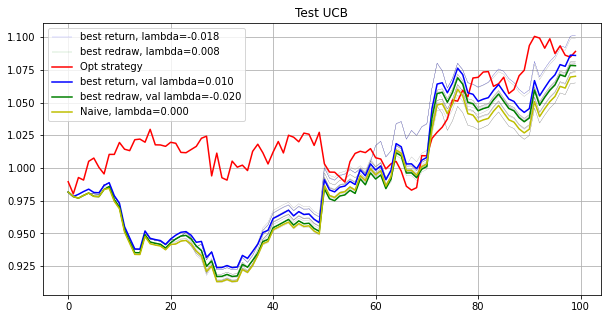

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[-0.      0.0098  0.0103  0.0129  0.0128  0.0092  0.0108  0.0084  0.0074
  0.005   0.0112  0.0116  0.0141  0.0027  0.0074  0.0082  0.0116  0.0114
  0.0036  0.0243  0.0167  0.0067  0.0054 -0.      0.0092  0.0119  0.0096
  0.0105  0.0099  0.0144  0.0069 -0.      0.0086  0.0126  0.0124  0.0145
  0.      0.0132  0.0129  0.0067  0.0074  0.0101  0.01    0.0145  0.0118
  0.0082  0.0164  0.004   0.      0.0095  0.003   0.012   0.0106  0.0145
  0.0105  0.0056  0.0092  0.0078  0.0101  0.0107  0.0038  0.0138  0.0149
  0.0133  0.0139  0.0153  0.0098  0.0127  0.0089  0.0098  0.0089  0.0113
  0.0104 -0.      0.0099  0.0101  0.0082  0.0151  0.0122  0.0128  0.0118
  0.009   0.0083  0.006   0.0118  0.0118  0.0118  0.0114  0.0094  0.0098
  0.0116  0.014   0.009   0.0125  0.0121  0.0102  0.0126  0.0138  0.0144
  0.0136]
0.299861487386864
[ 0.      0.0098  0.0103  0.0129  0.0128  0.0092  0.0108  0.0084  0.0074
  0.005   0.0112 

[ 0.      0.0022  0.01    0.0166  0.0166  0.0089  0.0112  0.0058  0.0041
 -0.      0.0125  0.002   0.0159  0.      0.0074  0.0107  0.0097  0.0132
  0.0007  0.0204  0.0227  0.0067  0.0025  0.0008  0.0073  0.0133  0.0063
  0.0106  0.004   0.0154  0.0006 -0.      0.0062  0.0096  0.0104  0.0097
  0.004   0.0185  0.0148  0.0034  0.0056  0.0116  0.0083  0.0176  0.0115
  0.0097  0.0174  0.0029  0.      0.0086  0.      0.0088  0.0181  0.0247
  0.0074  0.0101  0.0061  0.0047  0.0084  0.01    0.      0.0171  0.019
  0.0151  0.0129  0.0164  0.0104  0.0123  0.0083  0.0094  0.0086  0.0075
  0.0084  0.0001  0.0105  0.0101  0.0108  0.0217  0.0151  0.0106  0.016
  0.0066  0.001   0.0033  0.0093  0.0186  0.0108  0.0131  0.0092  0.0108
  0.013   0.0157  0.0141  0.013   0.0132  0.0144  0.0152  0.0193  0.0173
  0.0156]
0.0002913011902373763
[ 0.      0.0022  0.01    0.0166  0.0166  0.0089  0.0112  0.0058  0.0041
  0.      0.0125  0.002   0.0159 -0.      0.0074  0.0107  0.0097  0.0132
  0.0007  0.0204  0.0

[ 0.      0.0005  0.01    0.0169  0.0194  0.0092  0.0115  0.0048  0.0031
 -0.      0.0135 -0.      0.0177 -0.      0.015   0.0139  0.0075  0.0128
  0.0086  0.0204  0.0271  0.0055  0.0011 -0.      0.0068  0.0187  0.0053
 -0.      0.0017  0.0133  0.      0.0044  0.0058  0.0094  0.0093  0.0099
  0.002   0.0178  0.0158  0.0045  0.005   0.0117  0.0069  0.0187  0.01
  0.0104  0.0181  0.      0.      0.0078  0.0011  0.007   0.0189  0.0246
  0.0057  0.0092  0.0048  0.0028  0.0087  0.0101 -0.      0.0184  0.0192
  0.0184  0.0131  0.0152  0.0108  0.0115  0.0058  0.0093  0.0088  0.0058
  0.007   0.0001  0.0105  0.0097  0.0101  0.0215  0.0163  0.0085  0.0168
  0.0054  0.0023  0.0039  0.0091  0.0208  0.0113  0.0135  0.006   0.0108
  0.0133  0.0154  0.0161  0.0115  0.0125  0.0133  0.016   0.0214  0.0207
  0.0151]
0.1351805732356991
[ 0.      0.0005  0.01    0.017   0.0194  0.0092  0.0115  0.0048  0.0031
 -0.      0.0135 -0.      0.0177 -0.      0.015   0.0139  0.0075  0.0128
  0.0086  0.0204  0.0271

[ 0.      0.      0.0099  0.0186  0.022   0.0103  0.0124  0.0023  0.0009
  0.      0.0142  0.0001  0.0156  0.      0.006   0.      0.0008  0.0132
  0.0053  0.0226  0.028   0.0092  0.      0.      0.0061  0.0206  0.0043
  0.0032  0.      0.0173 -0.      0.0123  0.0057  0.0044  0.0099  0.008
  0.      0.0148  0.019  -0.      0.0004  0.0135  0.0069  0.0201  0.0007
  0.0118  0.0197  0.      0.0004  0.0064  0.      0.0161  0.0209  0.0259
  0.0034 -0.      0.0139  0.0091  0.0115  0.0079  0.      0.0211  0.0206
  0.0267  0.0162  0.0174  0.0199  0.0139  0.001   0.0094  0.0083  0.0122
  0.008  -0.      0.0105  0.0081  0.0107  0.011   0.0224  0.0038  0.0191
  0.013  -0.      0.0018  0.0085  0.0221  0.0114  0.0164  0.0004  0.0115
  0.0126  0.017   0.0151  0.0119  0.0108  0.012   0.017   0.0232  0.0164
  0.0135]
0.00029993843022977024
[ 0.      0.      0.0099  0.0186  0.022   0.0103  0.0124  0.0023  0.0009
 -0.      0.0142  0.      0.0157  0.      0.006   0.      0.0008  0.0132
  0.0053  0.0227  0

[ 0.      0.      0.0099  0.0185  0.022   0.0102  0.0124  0.0023  0.0009
 -0.      0.0142  0.      0.0157 -0.      0.006  -0.      0.0008  0.0132
  0.0053  0.0227  0.028   0.0092 -0.     -0.      0.0061  0.0206  0.0043
  0.0032 -0.      0.0173 -0.      0.0123  0.0057  0.0044  0.0099  0.008
 -0.      0.0148  0.0189 -0.      0.0004  0.0135  0.0069  0.0201  0.0007
  0.0118  0.0196 -0.      0.0004  0.0064 -0.      0.0161  0.0209  0.0259
  0.0034  0.      0.0139  0.0091  0.0115  0.0079  0.      0.0211  0.0206
  0.0267  0.0162  0.0174  0.0199  0.0139  0.001   0.0094  0.0083  0.0122
  0.008  -0.      0.0105  0.0081  0.0107  0.011   0.0224  0.0038  0.0191
  0.013   0.      0.0018  0.0085  0.0221  0.0114  0.0164  0.0004  0.0115
  0.0126  0.017   0.0151  0.0119  0.0108  0.012   0.017   0.0232  0.0164
  0.0135]
5.090069595955487e-05
[ 0.      0.0025  0.0093  0.0196  0.0224  0.0096  0.0117 -0.      0.
 -0.      0.0138 -0.      0.0173 -0.      0.      0.0044  0.0007  0.0126
  0.0043  0.0219  0.0329

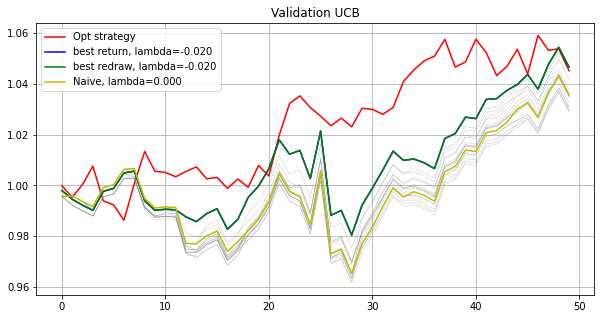

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[-0.      0.      0.0089  0.0161  0.015   0.0109  0.0108  0.0049  0.0039
 -0.      0.0155  0.0077  0.0149  0.      0.0092  0.0027  0.0077  0.0071
  0.      0.0086  0.0222  0.0103  0.0184 -0.      0.0065  0.0133  0.005
  0.006   0.0022  0.0193  0.0077  0.0133  0.0081  0.009   0.0059  0.0125
  0.022   0.0156  0.0139  0.0054  0.0092  0.0087  0.0027  0.0158  0.0097
  0.0017  0.021   0.004   0.0026  0.0073  0.0004  0.015   0.0153  0.0156
  0.006   0.0024  0.0105  0.0097  0.0124  0.0074  0.      0.014   0.0165
  0.0145  0.0085  0.0146  0.0112  0.0096  0.0036  0.0117  0.0075  0.0149
  0.0105  0.0155  0.0107  0.0093  0.0101  0.0091  0.0156  0.0133  0.0196
  0.0056  0.0075  0.0131  0.0057  0.0164  0.0117  0.0117  0.0097  0.0105
  0.0125  0.0143  0.0112  0.0127  0.0112  0.0105  0.0124  0.0135  0.0199
  0.0121]
0.15422813628041473
[-0.      0.      0.0089  0.0161  0.015   0.0109  0.0108  0.0049  0.0039
 -0.      0.0155  0.0077  0.0149 -0.      0.0092  0.0027  0.0077  0.0071
  0.      0.0086  0.02

[ 0.     -0.      0.0082  0.0191  0.0135  0.009   0.0103  0.0024  0.
  0.      0.0214  0.      0.0191  0.      0.      0.0015  0.0131  0.0053
  0.0119  0.005   0.0242  0.0065  0.0163  0.      0.0043  0.0185  0.
  0.0074 -0.      0.0178  0.0012  0.0065  0.0063 -0.      0.0017  0.0115
  0.0268  0.0159  0.0172  0.0039  0.0114  0.0114  0.0051  0.0193  0.0011
 -0.      0.0158 -0.     -0.      0.0052  0.0039  0.0182  0.014   0.0197
  0.0052  0.004   0.0129  0.0036  0.0102  0.0099 -0.      0.0128  0.0185
  0.0146  0.0074  0.0208  0.0129  0.014   0.0015  0.0113  0.0053  0.0187
  0.0147  0.0156  0.0097  0.0091  0.0054  0.0106  0.0243  0.0124  0.0286
  0.0011  0.0059  0.0096  0.0026  0.0204  0.0127  0.0127  0.0042  0.0097
  0.0116  0.0174  0.0187  0.0116  0.0135  0.0107  0.0163  0.019   0.0245
  0.0127]
4.112431445578371e-05
[-0.     -0.      0.0082  0.0191  0.0135  0.0091  0.0103  0.0024  0.
  0.      0.0214  0.      0.0191  0.      0.      0.0015  0.0131  0.0053
  0.0119  0.005   0.0242  0.006

[-0.      0.0006  0.0072  0.0209  0.0108  0.01    0.01    0.      0.
 -0.      0.0231  0.001   0.0192  0.003  -0.     -0.      0.0135  0.0037
  0.0151  0.0046  0.022   0.0047  0.0145 -0.      0.0023  0.014   0.
  0.0064 -0.      0.0187  0.0003  0.0076  0.0049  0.0024  0.0018  0.0053
  0.0301  0.016   0.0176  0.0038  0.0125  0.0121  0.0029  0.0208  0.0016
 -0.      0.0162  0.0007  0.0016  0.0035  0.0024  0.015   0.014   0.0207
  0.0039  0.0014  0.0118  0.0036  0.0117  0.0099  0.      0.0154  0.0204
  0.0126  0.0092  0.0215  0.0122  0.0162 -0.      0.011   0.0031  0.0201
  0.015   0.009   0.0085  0.0088  0.0044  0.0081  0.0265  0.0134  0.0327
  0.0052  0.0042  0.0097  0.0002  0.0222  0.0122  0.014   0.0038  0.0095
  0.0121  0.0224  0.0189  0.0102  0.0164  0.0157  0.0176  0.0174  0.0255
  0.0132]
0.00011839201458244138
[ 0.     -0.      0.0071  0.0213  0.0116  0.01    0.0099  0.      0.
  0.0007  0.0234  0.0024  0.019   0.0011  0.0002 -0.      0.0136  0.0034
  0.0133  0.007   0.0238  0.00

[ 0.      0.      0.0065  0.0226  0.0099  0.01    0.0098 -0.     -0.
 -0.      0.0234  0.0086  0.0211 -0.     -0.     -0.      0.0163  0.0026
  0.0111  0.0072  0.0259  0.0036  0.0118  0.0009  0.0006  0.0154  0.
  0.0049 -0.      0.0224  0.0035  0.0102  0.003   0.0065  0.0009  0.0032
  0.0252  0.0161  0.0179  0.0016  0.0124  0.0113  0.0028  0.0221  0.
  0.0011  0.0173  0.      0.      0.001   0.0002  0.015   0.0128  0.0199
  0.0032  0.0022  0.0098  0.0043  0.0113  0.0081  0.      0.0175  0.0215
  0.0178  0.0092  0.0242  0.0123  0.0184 -0.      0.0101  0.0021  0.0218
  0.0146  0.0113  0.0101  0.0085  0.0038  0.008   0.0271  0.0133  0.0358
  0.0032  0.0035  0.0075 -0.      0.0224  0.0122  0.015   0.0021  0.0085
  0.0121  0.0239  0.0162  0.0092  0.0161  0.0144  0.0178  0.0171  0.023
  0.0107]
7.266434945979765e-05
[ 0.      0.      0.0065  0.0226  0.0099  0.01    0.0098  0.     -0.
 -0.      0.0234  0.0086  0.0211 -0.     -0.     -0.      0.0163  0.0026
  0.0111  0.0072  0.0259  0.0036  0.

[-0.      0.      0.0062  0.0234  0.0131  0.011   0.0097 -0.      0.
  0.      0.023   0.004   0.0221  0.      0.0057  0.0015  0.0176  0.0023
  0.0086  0.0056  0.0285  0.0021  0.0117 -0.     -0.      0.0132 -0.
  0.0055 -0.      0.0229  0.0017  0.0114  0.0023  0.0051  0.0009  0.0023
  0.0254  0.0151  0.0188  0.0012  0.0112  0.0115  0.0043  0.0228 -0.
  0.0003  0.0158  0.      0.      0.0004 -0.      0.0139  0.0126  0.021
  0.0023  0.0009  0.0091  0.0034  0.0136  0.0086 -0.      0.0188  0.0227
  0.0162  0.009   0.0262  0.0119  0.0176 -0.      0.0095  0.0016  0.0228
  0.0139  0.0102  0.0092  0.0079  0.003   0.0104  0.0285  0.0121  0.0369
  0.0021  0.0036  0.0067 -0.      0.0229  0.0131  0.0161  0.0005  0.008
  0.0124  0.026   0.0176  0.0097  0.0169  0.0134  0.0181  0.0166  0.0238
  0.0105]
3.891456928963366e-05
[ 0.      0.      0.0062  0.0234  0.0131  0.011   0.0097  0.      0.
  0.      0.023   0.004   0.0221  0.      0.0057  0.0015  0.0176  0.0023
  0.0086  0.0056  0.0285  0.0021  0.0

[-0.     -0.      0.0062  0.0236  0.0138  0.0109  0.0098  0.     -0.
  0.      0.0229  0.0027  0.0222 -0.      0.0062  0.0002  0.0175  0.0021
  0.009   0.0057  0.0294  0.0016  0.0115 -0.     -0.      0.0126 -0.
  0.0058  0.      0.0235  0.0012  0.0111  0.0022  0.005   0.0001  0.0016
  0.0251  0.0151  0.0192  0.0012  0.0118  0.0118  0.0043  0.0234 -0.
  0.      0.0165  0.      0.      0.0001 -0.      0.0139  0.0122  0.0215
  0.0018  0.0003  0.0092  0.003   0.0142  0.0085  0.      0.0192  0.0231
  0.0161  0.0089  0.0264  0.0118  0.0181 -0.      0.0093  0.0016  0.0221
  0.0138  0.0093  0.0091  0.0078  0.0031  0.0109  0.0289  0.0124  0.0372
  0.0018  0.0028  0.0067 -0.      0.0229  0.0129  0.0165  0.0004  0.0082
  0.0125  0.0264  0.0177  0.0099  0.0172  0.0133  0.0182  0.017   0.0241
  0.0107]
6.205706856082923e-05
[-0.     -0.      0.0062  0.0236  0.0138  0.0109  0.0098  0.     -0.
 -0.      0.0229  0.0027  0.0222  0.      0.0062  0.0002  0.0175  0.0021
  0.009   0.0057  0.0294  0.0016  0

[-0.      0.      0.0056  0.0269  0.0117  0.0111  0.0103  0.      0.
 -0.      0.0237  0.0031  0.0163  0.      0.      0.0006  0.0252  0.0008
  0.031   0.0073  0.0385  0.     -0.      0.      0.      0.0075  0.
  0.01    0.      0.0337  0.      0.0152  0.0005  0.0012 -0.      0.0026
 -0.      0.0127  0.0231 -0.      0.0054  0.0132  0.0039  0.0253  0.
  0.      0.0117  0.      0.      0.     -0.      0.0149  0.0124  0.0229
 -0.     -0.      0.0078  0.0068  0.0148  0.0095 -0.      0.0239  0.0236
  0.0142  0.0137  0.0258  0.0125  0.0179  0.      0.0098  0.0018  0.0234
  0.0137  0.0036  0.0085  0.0037  0.0028  0.0126  0.0317  0.0071  0.0382
  0.0084  0.0001  0.0115 -0.      0.0221  0.0127  0.0178  0.      0.0076
  0.015   0.0244  0.0111  0.0085  0.0173  0.0079  0.0192  0.0185  0.0329
  0.0092]
9.584120054032137e-05
[ 0.      0.      0.0056  0.0269  0.0117  0.0111  0.0103  0.      0.
 -0.      0.0237  0.0031  0.0163  0.      0.      0.0006  0.0252  0.0008
  0.031   0.0073  0.0385  0.     -0

[ 0.      0.      0.0055  0.0269  0.0116  0.0112  0.0103  0.     -0.
 -0.      0.0238  0.0024  0.0164 -0.      0.      0.0043  0.0253  0.0006
  0.0309  0.0072  0.0387  0.      0.      0.      0.      0.0073 -0.
  0.01    0.      0.0336  0.0001  0.0148  0.0004  0.0011 -0.      0.0023
  0.0005  0.0126  0.0232  0.      0.0053  0.0131  0.0038  0.0252 -0.
  0.      0.0116  0.      0.     -0.     -0.      0.0148  0.0125  0.023
  0.      0.      0.0075  0.0067  0.0147  0.0095 -0.      0.024   0.0237
  0.014   0.0136  0.0256  0.0124  0.018   0.      0.0098  0.0017  0.0231
  0.0137  0.0038  0.0084  0.0035  0.0027  0.0129  0.0319  0.0069  0.0383
  0.0085  0.0003  0.0114 -0.      0.022   0.0126  0.0178  0.      0.0074
  0.015   0.0244  0.011   0.0083  0.0174  0.0078  0.0192  0.0184  0.033
  0.0091]
0.013236150124739216
[ 0.     -0.      0.0055  0.0269  0.0116  0.0112  0.0103  0.     -0.
 -0.      0.0238  0.0024  0.0164 -0.      0.      0.0043  0.0253  0.0006
  0.0309  0.0072  0.0387  0.      0.  

[-0.      0.0013  0.0052  0.027   0.0109  0.0108  0.01   -0.      0.
  0.      0.0229  0.0037  0.0163 -0.      0.0003  0.0041  0.0251  0.0001
  0.0307  0.0076  0.0375  0.0007  0.0009  0.     -0.      0.0099  0.
  0.01   -0.      0.0333 -0.      0.0126  0.      0.      0.0004  0.0019
  0.0011  0.013   0.0233  0.      0.005   0.0119  0.0043  0.0256  0.0023
  0.0002  0.0123  0.      0.0014  0.      0.      0.0146  0.0124  0.0227
 -0.      0.0002  0.007   0.0066  0.015   0.0088  0.0001  0.0242  0.0238
  0.0146  0.0137  0.0256  0.012   0.0182  0.0004  0.0094  0.0014  0.0231
  0.0138  0.0029  0.0077  0.0031  0.0022  0.0138  0.0322  0.006   0.0387
  0.0082  0.      0.0106  0.      0.0218  0.0122  0.0174  0.0031  0.0074
  0.0147  0.0243  0.0105  0.0078  0.0173  0.0074  0.019   0.0181  0.0326
  0.0095]
1.2010000504782926e-06
[ 0.     -0.      0.0051  0.0275  0.01    0.0109  0.0101  0.     -0.
 -0.      0.0228  0.0038  0.0167 -0.      0.0001  0.0034  0.0256 -0.
  0.0318  0.0077  0.0368  0.0004  

[ 0.      0.      0.005   0.0275  0.01    0.0109  0.0101  0.     -0.
 -0.      0.0228  0.0038  0.0167 -0.      0.0002  0.0034  0.0256 -0.
  0.0318  0.0077  0.0368  0.0004  0.0018  0.0001 -0.      0.01   -0.
  0.0075 -0.      0.033   0.0002  0.013   0.      0.0005 -0.      0.0012
  0.0023  0.0123  0.0235 -0.      0.0046  0.0118  0.0038  0.0257  0.0021
 -0.      0.0137 -0.      0.0002  0.     -0.      0.0142  0.0131  0.024
  0.0001  0.0011  0.0067  0.0064  0.0151  0.0082 -0.      0.0245  0.0238
  0.013   0.0134  0.0267  0.012   0.0189  0.      0.0098  0.0012  0.0232
  0.0139  0.004   0.0075  0.0027  0.0019  0.0146  0.0327  0.0057  0.0396
  0.0075  0.      0.0111 -0.      0.0225  0.0122  0.0173  0.0024  0.0076
  0.0149  0.0237  0.011   0.0077  0.0171  0.0064  0.0191  0.0178  0.0335
  0.0102]
0.0002748165327586525
Opt strategy   Total log return: 0.08507849    Max redraw: 0.04421898
Total return: 1.08880253
Mean return: 1.00085115
best return val lambda: -0.016   Total log return: 0.208256

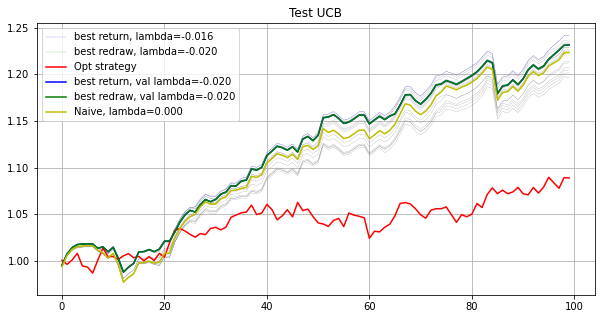

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
0.00011519543053453186
[0.0122 0.0072 0.0108 0.0108 0.0114 0.0101 0.0104 0.0096 0.0076 0.0091
 0.0086 0.0085 0.0125 0.0086 0.0096 0.0112 0.0102 0.0101 0.0102 0.0078
 0.0104 0.01   0.0095 0.009  0.0052 0.0092 0.01   0.0097 0.0094 0.0103
 0.0084 0.0101 0.0135 0.0113 0.0054 0.0101 0.0097 0.0112 0.0086 0.0108
 0.0108 0.011  0.0118 0.0094 0.0096 0.0098 0.0114 0.0091 0.0117 0.0103
 0.0109 0.0086 0.0078 0.0109 0.008

[ 0.0032  0.      0.0198  0.0164  0.021   0.0127  0.0167  0.0019  0.
  0.0156  0.      0.01   -0.      0.0025  0.0081  0.      0.0083  0.0074
  0.023   0.0008  0.0202  0.0153 -0.     -0.      0.      0.0004  0.0126
  0.0073  0.      0.0167  0.0093  0.0108  0.0199  0.0226  0.      0.0113
  0.0149  0.0137  0.0162  0.002   0.002  -0.      0.0186  0.0097  0.0082
  0.0132  0.0172  0.0125  0.0169  0.0055  0.0144  0.005   0.      0.0296
  0.0006  0.      0.0096  0.0123  0.0166  0.0038  0.0112  0.0055  0.0107
  0.0138  0.0064  0.0102  0.0205 -0.      0.014   0.0016  0.0188  0.0152
  0.0068  0.0241  0.0148  0.0154  0.0092  0.0063  0.0106  0.013   0.004
  0.0123  0.0033  0.0166  0.0162  0.0038  0.0035  0.0155  0.0158  0.0133
  0.0201  0.0026  0.0095  0.0087  0.012   0.0209  0.0112  0.0044  0.0158
  0.0063]
0.00013631486105957787
[ 0.0032 -0.      0.0198  0.0164  0.021   0.0127  0.0167  0.0019  0.
  0.0156  0.      0.01    0.      0.0025  0.0081  0.      0.0083  0.0074
  0.023   0.0008  0.0202  0

[ 0.      0.0005  0.0294  0.0253  0.0251  0.0133  0.0226  0.      0.
  0.0224  0.      0.0027  0.      0.0004  0.0032  0.011   0.013   0.0043
  0.0286 -0.      0.0192  0.0186 -0.     -0.     -0.     -0.      0.0148
  0.0002 -0.      0.0247 -0.      0.0105  0.0062  0.0363  0.0013  0.0072
  0.0136  0.0164  0.0036  0.0031 -0.     -0.      0.0238  0.0091  0.0014
  0.0127  0.0199  0.0109  0.0192 -0.      0.0194  0.0069  0.0001  0.0322
 -0.      0.0019  0.0075  0.0116  0.0229  0.0002  0.0206  0.0016  0.0149
  0.0133  0.0064  0.0099  0.0189 -0.      0.0145 -0.      0.028   0.0218
  0.      0.0162  0.017   0.0217  0.0111  0.0158  0.0001  0.0102  0.0154
  0.0019 -0.      0.0176  0.0254  0.0055  0.      0.0005  0.0102  0.0107
  0.0145  0.0065  0.0075  0.0051  0.0141  0.0222  0.0023 -0.      0.0211
  0.0002]
0.060820441740908324
[-0.      0.0005  0.0294  0.0253  0.0251  0.0133  0.0226  0.      0.
  0.0224  0.      0.0027  0.      0.0004  0.0032  0.011   0.013   0.0043
  0.0286  0.      0.0192  0.

[ 0.      0.      0.0298  0.0257  0.0241  0.0134  0.0228  0.      0.
  0.0237  0.      0.0023  0.      0.      0.0026  0.0113  0.0118  0.0044
  0.0289  0.      0.0208  0.0189  0.      0.0009  0.      0.      0.0149
  0.0002  0.      0.0262  0.      0.0101  0.0068  0.0358  0.0003  0.0062
  0.0135  0.0157  0.0012  0.0026  0.0009  0.      0.0253  0.0087  0.001
  0.0128  0.0207  0.0106  0.0197 -0.      0.0204  0.0094  0.      0.0323
  0.      0.0018  0.0077  0.011   0.023   0.0003  0.0203  0.0005  0.0146
  0.013   0.0069  0.0101  0.02   -0.      0.0151 -0.      0.0286  0.0207
  0.      0.0152  0.0172  0.0225  0.0103  0.0149  0.0004  0.0098  0.015
  0.0015  0.0011  0.0178  0.0253  0.0063 -0.      0.0005  0.0094  0.0102
  0.0135  0.0064  0.0069  0.005   0.0136  0.0221  0.0021 -0.      0.0216
  0.0008]
7.830280061890014e-05
[ 0.      0.      0.0298  0.0257  0.0241  0.0134  0.0228  0.      0.
  0.0237  0.      0.0023 -0.     -0.      0.0026  0.0113  0.0118  0.0044
  0.0289  0.      0.0208  0.0

[-0.     -0.      0.0291  0.0246  0.0224  0.0131  0.0222  0.     -0.
  0.0204  0.      0.0041  0.      0.     -0.      0.0126  0.0143  0.0046
  0.0297  0.      0.0224  0.0161 -0.     -0.     -0.     -0.      0.0156
  0.     -0.      0.0231  0.      0.0095  0.01    0.037   0.0082  0.0094
  0.0126  0.0164  0.     -0.     -0.      0.      0.0266  0.0118  0.
  0.0127  0.0213  0.0102  0.0183  0.      0.0209  0.0044  0.      0.0343
 -0.      0.      0.0082  0.0116  0.0228  0.0002  0.0212  0.0008  0.0145
  0.0116  0.0088  0.0103  0.0176  0.      0.0147  0.      0.028   0.0208
 -0.      0.0172  0.0172  0.0216  0.0096  0.0177 -0.      0.0058  0.0145
 -0.     -0.      0.0172  0.0233  0.0024 -0.     -0.      0.0098  0.0118
  0.0175  0.0186  0.0064  0.0039  0.0121  0.0216  0.     -0.      0.0225
  0.    ]
0.0004917938683061162
[-0.     -0.      0.0291  0.0246  0.0224  0.0131  0.0222 -0.     -0.
  0.0204 -0.      0.0041 -0.     -0.     -0.      0.0126  0.0143  0.0046
  0.0297 -0.      0.0225  0.016

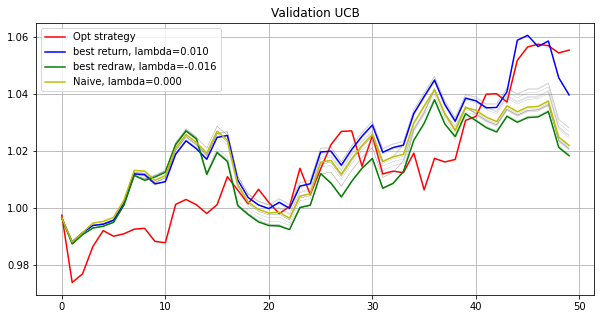

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[ 0.      0.      0.0216  0.019   0.0281  0.023   0.0177  0.0013  0.
  0.0128  0.0045  0.     -0.      0.0073  0.0061  0.0045  0.0094  0.0104
  0.022   0.005   0.0093  0.0236  0.      0.0038  0.0038  0.0073  0.0131
  0.0038  0.      0.0251  0.0006  0.0107  0.017   0.0275  0.0012  0.0165
  0.0168  0.0072  0.0003  0.0088  0.0142  0.      0.0306  0.0069  0.008
  0.0086  0.0196  0.0029  0.0222  0.0109  0.0189  0.0152  0.0084  0.0014
  0.0022  0.0025  0.0107  0.0102  0.0141  0.0025  0.0154  0.0131  0.0055
  0.0131  0.0042  0.0119  0.0136  0.      0.0118  0.0068  0.0246  0.0024
  0.0089  0.004   0.0151  0.0215  0.0131  0.0057  0.0002  0.0141  0.0017
  0.0004  0.0021  0.0113  0.0053  0.0084  0.0039  0.0002  0.0186  0.0158
  0.0156  0.0206  0.0139  0.0067  0.0174  0.0184  0.0001  0.012   0.0187
  0.0043]
4.006304178358108e-06
[ 0.      0.      0.0216  0.019   0.0281  0.023   0.0177  0.0013  0.
  0.0128  0.0045  0.     -0.      0.0073  0.0061  0.0045  0.0094  0.0104
  0.022   0.005   0.0093  0.

[ 0.0039  0.0005  0.025   0.0217  0.0312  0.0266  0.0196 -0.     -0.
  0.014   0.0064 -0.     -0.      0.0069  0.0042  0.0024  0.0041  0.0086
  0.0242  0.0039  0.0116  0.0228 -0.      0.0045  0.      0.0026  0.014
  0.0004 -0.      0.0263  0.0002  0.0098  0.021   0.0286  0.      0.0159
  0.0179  0.0096  0.      0.0096  0.0154  0.      0.0372  0.0042  0.0041
  0.007   0.0223  0.0018  0.0235  0.0083  0.0216  0.0177  0.002   0.0031
  0.      0.001   0.0107  0.0096  0.0144  0.0015  0.0179  0.0082  0.008
  0.0121  0.0028  0.0121  0.0141  0.      0.0108  0.0035  0.0258  0.0021
  0.0044  0.0079  0.0184  0.0247  0.0122  0.0029  0.0001  0.015   0.0006
  0.      0.0004  0.014   0.0036  0.0029  0.001   0.0068  0.0196  0.0172
  0.0168  0.0186  0.0137  0.0061  0.0162  0.0196  0.004   0.0074  0.0218
  0.0038]
1.7132765269478332e-05
[ 0.0039  0.0005  0.025   0.0217  0.0312  0.0266  0.0196 -0.     -0.
  0.014   0.0064 -0.     -0.      0.0069  0.0042  0.0024  0.0041  0.0086
  0.0242  0.0039  0.0116  0.

[ 0.      0.      0.0309  0.0286  0.026   0.0199  0.0229 -0.     -0.
  0.0082  0.0065  0.      0.      0.      0.0039  0.0121 -0.      0.006
  0.0273  0.0021  0.0148  0.0217  0.      0.0177  0.      0.      0.0151
  0.      0.      0.0173  0.      0.0097  0.0198  0.0251  0.0014  0.0262
  0.0141  0.0039  0.0217  0.0088  0.0139  0.      0.0396  0.      0.
  0.0033  0.0216  0.      0.0191  0.      0.0303  0.0134  0.      0.009
  0.0033 -0.      0.0082  0.0185  0.0162  0.0005  0.0288  0.0124  0.013
  0.0126  0.0018  0.0082  0.0048  0.      0.0115  0.0145  0.0247  0.
  0.0031 -0.      0.022   0.019   0.0204  0.0116  0.0122  0.0129 -0.
 -0.      0.0117  0.0113 -0.      0.      0.0004  0.      0.0141  0.017
  0.0106  0.0163  0.0125  0.0025  0.0097  0.0215  0.      0.007   0.0234
 -0.    ]
0.00032569393324299205
[ 0.     -0.      0.0309  0.0286  0.026   0.0199  0.0229  0.     -0.
  0.0082  0.0065 -0.      0.     -0.      0.0039  0.0121 -0.      0.006
  0.0273  0.0021  0.0148  0.0217  0.      0

[ 0.      0.0012  0.0304  0.0279  0.027   0.0209  0.0226  0.      0.
  0.0099  0.0017  0.0004  0.      0.      0.0019  0.008   0.      0.0075
  0.0287  0.      0.017   0.0201  0.      0.0146  0.0009  0.      0.0156
 -0.      0.      0.0223  0.      0.0094  0.0182  0.0265  0.0002  0.0252
  0.0139  0.0038  0.0115  0.0076  0.0121  0.      0.0425  0.0013  0.0038
  0.0046  0.0232  0.0001  0.0192  0.0005  0.0325  0.0111  0.0007  0.011
  0.      0.      0.0086  0.0197  0.0174  0.001   0.0272  0.0114  0.012
  0.024   0.0005  0.0085  0.008   0.      0.0113  0.0111  0.0236  0.0006
  0.0035  0.      0.0222  0.0224  0.0198  0.0126  0.0064  0.0115  0.
  0.0007  0.0089  0.0106  0.0006 -0.     -0.      0.      0.0144  0.018
  0.0101  0.0182  0.0125  0.0031  0.0081  0.0211  0.0003  0.0065  0.0259
 -0.    ]
0.0004141903567178097
[ 0.      0.0012  0.0304  0.0279  0.027   0.0209  0.0226  0.      0.
  0.0099  0.0017  0.0004  0.      0.      0.0019  0.008   0.      0.0075
  0.0287  0.      0.017   0.0201  

[ 0.      0.0012  0.0304  0.0279  0.027   0.0209  0.0226  0.      0.
  0.0099  0.0017  0.0004  0.      0.      0.0019  0.008   0.      0.0075
  0.0287  0.      0.017   0.0201  0.      0.0146  0.0009  0.      0.0156
  0.      0.      0.0223  0.      0.0094  0.0182  0.0265  0.0002  0.0252
  0.0139  0.0038  0.0115  0.0076  0.0121  0.      0.0425  0.0013  0.0038
  0.0046  0.0232  0.0001  0.0192  0.0005  0.0325  0.0111  0.0007  0.011
  0.      0.      0.0086  0.0196  0.0174  0.001   0.0272  0.0114  0.012
  0.024   0.0005  0.0085  0.008   0.      0.0113  0.0111  0.0236  0.0006
  0.0035  0.      0.0222  0.0225  0.0198  0.0126  0.0064  0.0115  0.
  0.0007  0.0089  0.0106  0.0006 -0.      0.      0.      0.0144  0.018
  0.0101  0.0182  0.0125  0.0031  0.0081  0.0211  0.0003  0.0065  0.0259
  0.    ]
0.00015618947439457537
[ 0.      0.0012  0.0304  0.0279  0.027   0.0209  0.0226  0.     -0.
  0.0099  0.0017  0.0004  0.     -0.      0.0019  0.008   0.      0.0075
  0.0287  0.      0.017   0.0201 

[ 0.      0.0012  0.0304  0.0279  0.027   0.0209  0.0226  0.      0.
  0.0099  0.0017  0.0004  0.      0.      0.0019  0.008  -0.      0.0075
  0.0287 -0.      0.017   0.0201  0.      0.0146  0.0009  0.      0.0156
 -0.      0.      0.0223 -0.      0.0094  0.0182  0.0264  0.0002  0.0252
  0.0139  0.0038  0.0115  0.0076  0.0121  0.      0.0425  0.0013  0.0038
  0.0046  0.0232  0.      0.0192  0.0005  0.0325  0.0111  0.0007  0.011
  0.      0.      0.0086  0.0196  0.0174  0.001   0.0272  0.0114  0.012
  0.024   0.0005  0.0085  0.008   0.      0.0113  0.0111  0.0236  0.0006
  0.0035 -0.      0.0222  0.0224  0.0198  0.0126  0.0064  0.0115  0.
  0.0007  0.0089  0.0106  0.0006  0.     -0.      0.      0.0144  0.018
  0.0101  0.0182  0.0125  0.0031  0.0081  0.0211  0.0003  0.0065  0.0259
 -0.    ]
0.00036488514631072993
[ 0.      0.0012  0.0304  0.0279  0.027   0.0209  0.0226  0.     -0.
  0.0099  0.0017  0.0004  0.      0.      0.0019  0.008  -0.      0.0075
  0.0287 -0.      0.017   0.0201 

[ 0.      0.0012  0.0303  0.0279  0.027   0.0209  0.0226  0.      0.
  0.0099  0.0017  0.0004  0.      0.      0.0019  0.008   0.      0.0075
  0.0287  0.      0.017   0.0201 -0.      0.0146  0.0009 -0.      0.0156
  0.      0.      0.0223  0.      0.0094  0.0182  0.0264  0.0002  0.0252
  0.0139  0.0038  0.0115  0.0076  0.012  -0.      0.0425  0.0013  0.0038
  0.0046  0.0232  0.      0.0192  0.0005  0.0325  0.0111  0.0007  0.011
  0.     -0.      0.0086  0.0196  0.0174  0.001   0.0272  0.0114  0.012
  0.024   0.0005  0.0085  0.008  -0.      0.0113  0.0111  0.0236  0.0006
  0.0035  0.      0.0222  0.0224  0.0198  0.0126  0.0064  0.0115  0.
  0.0007  0.0089  0.0106  0.0006  0.     -0.      0.      0.0144  0.018
  0.0101  0.0182  0.0125  0.0031  0.0081  0.0211  0.0003  0.0065  0.0259
 -0.    ]
0.00024034908548180463
[-0.      0.0012  0.0303  0.0279  0.027   0.0209  0.0226  0.     -0.
  0.0099  0.0017  0.0004  0.      0.      0.0019  0.008  -0.      0.0075
  0.0287 -0.      0.017   0.0201 

[-0.     -0.      0.0301  0.0274  0.0247  0.0231  0.0225 -0.     -0.
  0.0103 -0.     -0.     -0.      0.      0.002  -0.     -0.      0.0075
  0.0289 -0.      0.0201  0.018  -0.      0.0119  0.0003 -0.      0.0164
 -0.     -0.      0.0267 -0.      0.0088  0.0191  0.0244 -0.      0.027
  0.0112  0.0028  0.0061  0.0082  0.0105 -0.      0.044   0.002   0.0073
  0.0034  0.0236  0.      0.0198 -0.      0.0328  0.0135  0.0018  0.0114
 -0.     -0.      0.0098  0.0213  0.018   0.001   0.0289  0.0122  0.011
  0.0239 -0.      0.0077  0.0073 -0.      0.0129  0.0093  0.0264 -0.
  0.0019  0.0002  0.0223  0.0221  0.017   0.0135  0.006   0.0115  0.0005
  0.0015  0.0069  0.011   0.0004 -0.     -0.      0.0006  0.0146  0.0202
  0.01    0.0198  0.0135  0.0026  0.009   0.0244  0.      0.006   0.0274
  0.    ]
0.0003052156500950414
[-0.     -0.      0.0301  0.0263  0.0237  0.0248  0.0223  0.      0.
  0.0118 -0.     -0.     -0.     -0.      0.0024 -0.      0.0022  0.0072
  0.0284  0.      0.0244  0.018  

[-0.     -0.      0.0301  0.0263  0.0237  0.0248  0.0223 -0.      0.
  0.0118 -0.      0.      0.      0.      0.0024  0.0001  0.0022  0.0072
  0.0284  0.      0.0244  0.018  -0.      0.0093  0.     -0.      0.0166
  0.0002  0.      0.0266 -0.      0.0086  0.0187  0.0257 -0.      0.0266
  0.0078  0.0051  0.012   0.0038  0.0097  0.      0.0444  0.0029  0.0049
  0.0035  0.025  -0.      0.023  -0.      0.0334  0.0147  0.0033  0.0153
 -0.      0.      0.0095  0.0195  0.0158  0.0002  0.0282  0.0115  0.008
  0.023   0.0011  0.0087  0.0054 -0.      0.0116  0.0074  0.0264 -0.
  0.0002  0.0065  0.0253  0.0219  0.0155  0.0151  0.      0.0106 -0.
 -0.      0.0054  0.0118 -0.      0.0005  0.0007 -0.      0.0165  0.0204
  0.0083  0.0222  0.0148  0.0013  0.0065  0.0232 -0.      0.0055  0.0283
 -0.    ]
0.00021678834792566876
[-0.      0.      0.0301  0.0264  0.0237  0.0248  0.0223 -0.     -0.
  0.0118 -0.     -0.      0.     -0.      0.0024  0.      0.0022  0.0072
  0.0284 -0.      0.0244  0.018   0

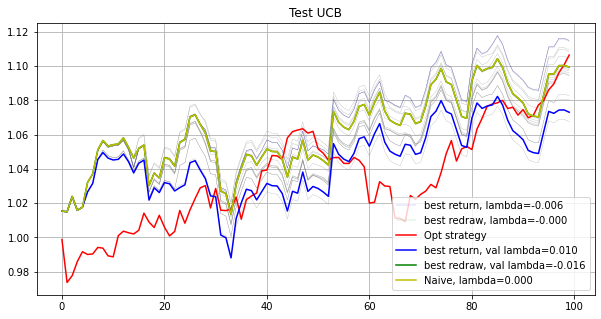

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[-0.      0.0007  0.0239  0.0182  0.0175  0.0152  0.0145 -0.      0.0062
  0.0086  0.0128 -0.      0.0181  0.0106  0.0096  0.0154  0.0055 -0.
  0.0051  0.0099  0.0087  0.0186 -0.      0.0165  0.0121  0.0064  0.0111
  0.0112  0.0136  0.0171  0.0108  0.0121  0.      0.015   0.0113  0.0027
  0.01    0.      0.0155 -0.      0.      0.0083  0.0099  0.0043  0.0047
  0.0112  0.0012  0.0123  0.0098  0.0117  0.0169  0.0186  0.0058  0.0203
  0.0192  0.0104  0.011   0.0139  0.0058  0.0134 -0.      0.      0.0109
  0.0079  0.016   0.0153  0.0076  0.0027  0.0117  0.0076  0.006   0.0114
  0.0082  0.0097  0.0268  0.0109  0.      0.0058  0.0158  0.0238  0.0077
  0.0218  0.      0.0121  0.0076  0.0027  0.001   0.0101  0.014   0.0133
  0.0122  0.0172  0.0048  0.0105  0.0106  0.0058  0.0166  0.0139  0.0115
  0.0155]
0.5036754679341385
[ 0.     -0.      0.02    0.026   0.0242  0.0121  0.0178  0.     -0.
  0.0113  0.0127  0.    

[-0.     -0.      0.0221  0.0288  0.0272  0.0104  0.0187 -0.      0.
  0.0108  0.0126 -0.      0.0283  0.0074  0.006   0.0115  0.0007  0.
  0.0038  0.0224  0.0092  0.0232  0.      0.0234  0.0164  0.      0.0062
  0.011   0.0118  0.0192 -0.      0.0124 -0.      0.0222  0.0096 -0.
  0.0024  0.      0.0162 -0.     -0.     -0.      0.0079 -0.      0.
  0.01   -0.      0.022   0.0025  0.0172  0.0167  0.0223  0.0018  0.0191
  0.032   0.0256  0.0073  0.0137  0.      0.0102  0.0043 -0.      0.0065
  0.0073  0.0122  0.0113  0.0179 -0.      0.0135 -0.     -0.      0.0084
  0.0055  0.      0.0221  0.0124  0.0005  0.0079  0.0175  0.0147  0.0205
  0.0249 -0.      0.01    0.      0.      0.008   0.      0.0133  0.0253
  0.0073  0.015   0.0048  0.0221  0.0138  0.0053  0.0225  0.016   0.0125
  0.015 ]
0.00027862644945498275
[-0.     -0.      0.0221  0.0288  0.0272  0.0104  0.0187  0.      0.
  0.0108  0.0126 -0.      0.0283  0.0074  0.006   0.0115  0.0007  0.
  0.0038  0.0224  0.0092  0.0232  0.      

[ 0.     -0.      0.0143  0.0366  0.0337  0.0059  0.0219  0.      0.0074
  0.0064  0.0106  0.      0.0361  0.0097  0.0025  0.0015 -0.     -0.
  0.0039  0.0136  0.0043  0.0216  0.      0.0276  0.0168  0.      0.0022
  0.0096  0.0149  0.0228 -0.      0.0132  0.      0.0104  0.0066  0.
 -0.      0.      0.0182  0.      0.      0.0004  0.0068  0.013   0.
  0.0079  0.      0.0186  0.      0.0148  0.0035  0.025   0.      0.0243
  0.0419  0.0245  0.0017  0.0113  0.      0.0107  0.     -0.      0.0061
  0.0059  0.0217  0.0116  0.0263  0.      0.0174  0.      0.      0.0156
  0.0025  0.0014  0.0197  0.0174 -0.      0.0128  0.0207  0.0068  0.0219
  0.0228 -0.      0.0081 -0.      0.0046  0.0072  0.0104  0.0119  0.0257
 -0.      0.0138  0.0016  0.0229  0.0171  0.0071  0.0227  0.015   0.0073
  0.0175]
0.0002606434870983168
[ 0.     -0.      0.0143  0.0366  0.0337  0.0059  0.0219  0.      0.0074
  0.0064  0.0106  0.      0.0361  0.0097  0.0025  0.0015 -0.     -0.
  0.0039  0.0136  0.0043  0.0216  0

[ 0.      0.0006  0.0115  0.0386  0.0354  0.0047  0.0223  0.      0.
  0.0052  0.0126  0.      0.0382  0.0105  0.0009  0.0007  0.      0.
  0.0046  0.0131  0.0053  0.0209  0.      0.0293  0.0183  0.      0.0016
  0.0095  0.0136  0.0229 -0.      0.013   0.      0.009   0.0059  0.
 -0.      0.      0.0187  0.     -0.      0.      0.007   0.0088 -0.
  0.0079  0.      0.0207  0.0006  0.0145  0.0053  0.0262  0.      0.0232
  0.0443  0.0229  0.0005  0.013  -0.      0.0115 -0.     -0.      0.0065
  0.0007  0.0206  0.0138  0.0275 -0.      0.0173 -0.      0.0059  0.0141
  0.0033 -0.      0.0213  0.0166  0.0008  0.0119  0.0202  0.0087  0.0234
  0.023   0.      0.0078 -0.      0.0018  0.0064  0.0095  0.0105  0.0274
  0.      0.016   0.      0.0225  0.0159  0.0083  0.0246  0.0139  0.0073
  0.0189]
9.491507323228977e-06
[ 0.      0.0006  0.0115  0.0386  0.0354  0.0047  0.0223  0.      0.
  0.0052  0.0126  0.      0.0382  0.0105  0.0009  0.0007  0.      0.
  0.0046  0.0131  0.0053  0.0209  0.      0

[ 0.      0.0006  0.0115  0.0386  0.0354  0.0047  0.0223  0.      0.
  0.0052  0.0127  0.      0.0382  0.0105  0.0009  0.0007  0.      0.
  0.0046  0.0131  0.0053  0.021   0.      0.0293  0.0183 -0.      0.0015
  0.0095  0.0136  0.0229  0.      0.013   0.      0.009   0.0059  0.
 -0.      0.      0.0187 -0.      0.      0.      0.007   0.0088 -0.
  0.0079  0.      0.0207  0.0006  0.0145  0.0053  0.0262  0.      0.0232
  0.0443  0.0228  0.0006  0.013   0.      0.0115 -0.     -0.      0.0065
  0.0007  0.0206  0.0138  0.0275 -0.      0.0173  0.      0.0059  0.0141
  0.0033  0.      0.0213  0.0166  0.0008  0.0119  0.0202  0.0086  0.0234
  0.023   0.      0.0078 -0.      0.0018  0.0064  0.0095  0.0105  0.0274
 -0.      0.016  -0.      0.0226  0.0159  0.0083  0.0246  0.0139  0.0072
  0.0189]
0.00024884859622313464
[ 0.      0.0006  0.0115  0.0386  0.0354  0.0047  0.0223  0.     -0.
  0.0052  0.0127 -0.      0.0381  0.0105  0.0009  0.0007  0.      0.
  0.0046  0.0131  0.0053  0.021   0.      

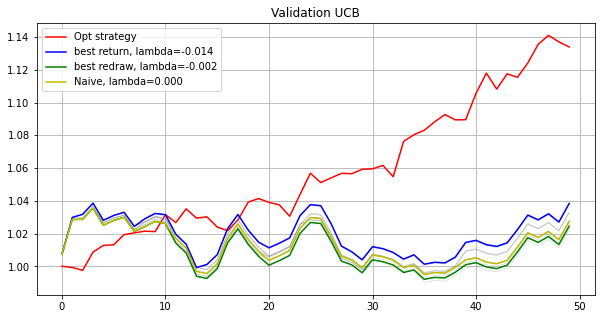

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[ 0.     -0.      0.026   0.0261  0.0259  0.0014  0.0159  0.      0.0044
  0.0094  0.0028  0.      0.0252  0.0192  0.0064  0.0022 -0.     -0.
  0.0093  0.0183  0.0153  0.0156  0.0067  0.0242  0.0289  0.     -0.
  0.0069  0.0078  0.0359  0.0112  0.0051  0.0024  0.016   0.0023 -0.
  0.      0.      0.0037  0.0044 -0.      0.      0.      0.0139 -0.
  0.      0.0161  0.0173  0.0004  0.0131  0.0075  0.0183  0.0074  0.0157
  0.0305  0.0004  0.0072  0.0245  0.0045  0.012   0.0086  0.      0.0087
  0.0012  0.0149  0.0097  0.0141  0.0006  0.0138  0.0083  0.0088  0.0245
  0.0052  0.0068  0.0197  0.0252  0.0106  0.0142  0.0072  0.0175  0.0117
  0.0133 -0.      0.0101  0.0048  0.0033  0.0007  0.0132  0.0114  0.0189
  0.0143  0.0018  0.0083  0.0231  0.0083  0.0053  0.0219  0.0198  0.0097
  0.0126]
0.06013040624638432
[-0.      0.      0.026   0.0261  0.0259  0.0014  0.0159 -0.      0.0044
  0.0094  0.0028 -0.      0.0252  0.0192  0.0064  0.0022 -0.     -0.
  0.0093  0.0183  0.0153  0.0156  0.0067 

[ 0.      0.      0.0328  0.0317  0.0314  0.001   0.0181  0.      0.0013
  0.0087  0.0036  0.      0.0299  0.021   0.0042  0.     -0.      0.
  0.0078  0.0251  0.0147  0.0165  0.      0.0285  0.0323 -0.      0.
  0.0068  0.006   0.0412  0.0067  0.0051  0.      0.0176  0.0002  0.
  0.0016 -0.      0.0065 -0.     -0.     -0.      0.      0.0154  0.
  0.0001  0.0016  0.0204  0.0006  0.0159  0.0081  0.0206  0.0067  0.0152
  0.0369  0.      0.0041  0.0256 -0.      0.0136  0.0058  0.      0.0082
 -0.      0.0204  0.0117  0.0153  0.      0.0113  0.0041  0.0045  0.025
  0.0024  0.004   0.0227  0.0273  0.0091  0.012   0.0102  0.0075  0.0162
  0.0169  0.      0.0091  0.0039  0.      0.0159  0.0036  0.008   0.0184
  0.0125  0.0005  0.0073  0.0235  0.0057  0.0062  0.0255  0.0218  0.0086
  0.01  ]
7.364891219937494e-05
[-0.      0.      0.0328  0.0317  0.0314  0.001   0.0181 -0.      0.0013
  0.0087  0.0036  0.      0.0299  0.021   0.0042  0.     -0.      0.
  0.0078  0.0251  0.0147  0.0165 -0.    

[-0.      0.0001  0.0301  0.0334  0.0334 -0.      0.0188  0.      0.0052
  0.006   0.0028  0.0036  0.0319  0.0199  0.0023 -0.      0.     -0.
  0.0061  0.0241  0.011   0.0143  0.      0.0302  0.0285 -0.     -0.
  0.0065  0.0044  0.0424  0.0088  0.0055 -0.      0.0158 -0.     -0.
  0.     -0.      0.0076  0.0028 -0.      0.     -0.      0.0139 -0.
 -0.      0.0021  0.0223 -0.      0.0157  0.0086  0.0217  0.0048  0.0146
  0.0394  0.      0.0036  0.0267 -0.      0.0138  0.004   0.      0.007
 -0.      0.0205  0.0126  0.0127 -0.      0.0116  0.      0.0026  0.0251
  0.0013  0.0019  0.022   0.0291  0.0075  0.0141  0.0125  0.0073  0.0167
  0.0192 -0.      0.0077  0.0017 -0.      0.0206  0.0035  0.0118  0.0169
  0.0139  0.0039  0.0038  0.0237  0.0086  0.0047  0.0262  0.0234  0.0084
  0.0107]
4.0336524560936864e-05
[ 0.      0.0002  0.0301  0.0334  0.0334  0.      0.0188  0.      0.0052
  0.006   0.0028  0.0036  0.0319  0.0199  0.0023  0.      0.      0.
  0.0061  0.0241  0.011   0.0143  0.   

[-0.     -0.      0.0312  0.0351  0.0347  0.0004  0.0193  0.      0.0004
  0.0059  0.0024  0.      0.0336  0.0206  0.0028  0.0031 -0.      0.0012
  0.0035  0.0256  0.0098  0.0138 -0.      0.0314  0.0281 -0.      0.
  0.0068  0.0029  0.0429  0.0071  0.005  -0.      0.0162 -0.     -0.
 -0.      0.0001  0.0088 -0.     -0.     -0.      0.0001  0.0124 -0.
  0.0008  0.      0.023   0.0006  0.0148  0.0068  0.024   0.0033  0.0136
  0.0418  0.001   0.0032  0.0258 -0.      0.0147  0.0002 -0.      0.0063
  0.0002  0.0204  0.0126  0.0116  0.      0.0121  0.0001  0.0002  0.0266
  0.0013  0.0029  0.022   0.0302  0.0056  0.0141  0.0113  0.0077  0.0173
  0.0188 -0.      0.0079  0.     -0.      0.0236  0.0024  0.0115  0.0181
  0.0132  0.0053  0.0034  0.0237  0.0112  0.01    0.0271  0.0241  0.0083
  0.0102]
8.490396779897423e-05
[-0.      0.      0.0313  0.0363  0.0354 -0.      0.0195  0.     -0.
  0.0064  0.0025 -0.      0.0332  0.0208  0.0027  0.0031 -0.      0.0003
  0.0023  0.0266  0.0081  0.0133 -0

[-0.     -0.      0.0319  0.0376  0.0367  0.      0.0197  0.      0.0001
  0.0059  0.0021 -0.      0.034   0.0156  0.002   0.0025 -0.     -0.
  0.0032  0.0277  0.0079  0.0136  0.      0.033   0.028  -0.     -0.
  0.0063  0.0017  0.0436  0.0086  0.0046 -0.      0.0168 -0.      0.
 -0.      0.0002  0.0102 -0.      0.      0.0018  0.0008  0.0096 -0.
 -0.     -0.      0.0245  0.0006  0.0155  0.0074  0.0257  0.0017  0.0127
  0.0445  0.0009  0.0024  0.0263 -0.      0.0153  0.     -0.      0.0056
  0.001   0.0213  0.0121  0.0119  0.      0.0113  0.     -0.      0.0259
 -0.      0.0023  0.0233  0.0301  0.0036  0.0152  0.0103  0.004   0.0158
  0.0208  0.      0.0088  0.      0.0001  0.0262  0.      0.0113  0.0164
  0.0122  0.0072  0.0033  0.0249  0.0109  0.011   0.0282  0.0244  0.007
  0.0106]
0.00036273739381130233
[ 0.     -0.      0.0319  0.0376  0.0366  0.      0.0197 -0.      0.0001
  0.0059  0.0021 -0.      0.034   0.0156  0.002   0.0025 -0.     -0.
  0.0032  0.0277  0.0079  0.0136  0.   

[ 0.     -0.      0.0319  0.0376  0.0367 -0.      0.0197 -0.      0.0001
  0.0059  0.0021 -0.      0.034   0.0156  0.0019  0.0025 -0.     -0.
  0.0032  0.0277  0.0079  0.0136 -0.      0.033   0.028  -0.      0.
  0.0063  0.0017  0.0436  0.0086  0.0046  0.      0.0168 -0.      0.
 -0.      0.0002  0.0102  0.      0.      0.0018  0.0008  0.0096  0.
 -0.     -0.      0.0245  0.0005  0.0155  0.0074  0.0257  0.0017  0.0127
  0.0445  0.0009  0.0024  0.0263  0.      0.0153  0.      0.      0.0056
  0.001   0.0213  0.0121  0.0119  0.      0.0113  0.      0.      0.0259
 -0.      0.0023  0.0233  0.0301  0.0036  0.0152  0.0103  0.004   0.0158
  0.0208  0.      0.0088  0.      0.0001  0.0262  0.      0.0113  0.0164
  0.0122  0.0072  0.0033  0.0249  0.0109  0.011   0.0282  0.0244  0.007
  0.0106]
0.00024180524332241543
[ 0.      0.0065  0.0304  0.0376  0.0378  0.      0.0208 -0.     -0.
  0.0043  0.0026  0.      0.0357  0.0135  0.001   0.0029 -0.      0.
  0.0024  0.024   0.0038  0.0152  0.0008  0

[-0.      0.0039  0.0323  0.0397  0.0398  0.      0.0213  0.      0.
  0.0047  0.0031  0.0019  0.0376  0.0119  0.0002  0.0024  0.      0.0048
  0.      0.0219  0.      0.0141  0.      0.0361  0.0264 -0.     -0.
  0.005  -0.      0.0509  0.0179  0.0034  0.001   0.0127 -0.      0.0024
 -0.      0.0028  0.0079  0.      0.0001  0.0001 -0.      0.0049 -0.
 -0.     -0.      0.024  -0.      0.0167  0.0098  0.0267  0.0018  0.0104
  0.0497 -0.      0.0009  0.0283  0.0022  0.0139 -0.      0.0019  0.0042
  0.0008  0.0192  0.0097  0.0154  0.0025  0.0108 -0.      0.0036  0.0295
 -0.      0.0013  0.0209  0.0325  0.0032  0.0082  0.0079  0.0009  0.0147
  0.0247 -0.      0.0097  0.     -0.      0.015   0.0001  0.008   0.0173
  0.0142  0.0087 -0.      0.027   0.0077  0.0138  0.0262  0.0267  0.0062
  0.0121]
0.00020712971878621587
[-0.      0.0038  0.0323  0.0397  0.0398  0.      0.0213  0.     -0.
  0.0047  0.0031  0.0019  0.0376  0.0119  0.0002  0.0024  0.      0.0048
 -0.      0.0219 -0.      0.0141 -

[-0.      0.0027  0.0336  0.0404  0.0407  0.      0.0217 -0.      0.0011
  0.0043  0.0033  0.0017  0.0381  0.01    0.0007  0.0022 -0.      0.0033
 -0.      0.0218 -0.      0.0151 -0.      0.0367  0.0263 -0.     -0.
  0.005   0.0008  0.0508  0.0193  0.0031 -0.      0.0111  0.      0.002
 -0.     -0.      0.0079  0.      0.      0.      0.      0.0047  0.
 -0.      0.0001  0.0244 -0.      0.0172  0.011   0.0262  0.0012  0.0095
  0.0507  0.0001  0.0019  0.0299  0.001   0.0137  0.      0.0007  0.0039
  0.0018  0.0181  0.0099  0.0151  0.0015  0.011   0.0006  0.0066  0.029
  0.      0.0021  0.0202  0.033   0.0016  0.0085  0.0081  0.0024  0.015
  0.0257  0.0004  0.009  -0.      0.      0.013   0.      0.0076  0.0187
  0.0143  0.0077  0.      0.0276  0.0076  0.0133  0.0272  0.0261  0.0054
  0.0122]
5.1925069645420455e-05
[ 0.      0.0027  0.0336  0.0404  0.0407  0.      0.0217 -0.      0.0011
  0.0043  0.0033  0.0017  0.0381  0.01    0.0007  0.0022 -0.      0.0033
 -0.      0.0218 -0.      0.0

[ 0.      0.0027  0.0335  0.0404  0.0407 -0.      0.0217 -0.      0.0011
  0.0043  0.0033  0.0017  0.0381  0.01    0.0007  0.0022 -0.      0.0033
 -0.      0.0218 -0.      0.0151  0.      0.0367  0.0263 -0.     -0.
  0.0049  0.0008  0.0508  0.0193  0.0031  0.      0.0111  0.      0.002
 -0.      0.      0.0079  0.      0.     -0.      0.      0.0047 -0.
 -0.      0.0001  0.0244  0.      0.0172  0.011   0.0262  0.0012  0.0095
  0.0507  0.0001  0.0019  0.0299  0.001   0.0137 -0.      0.0007  0.0039
  0.0018  0.0181  0.0099  0.0151  0.0015  0.011   0.0006  0.0066  0.029
  0.      0.0021  0.0202  0.033   0.0016  0.0085  0.0081  0.0024  0.015
  0.0257  0.0004  0.009  -0.     -0.      0.013   0.      0.0076  0.0187
  0.0143  0.0077  0.      0.0276  0.0076  0.0133  0.0272  0.0261  0.0054
  0.0122]
9.189819755062322e-06
[ 0.      0.0027  0.0335  0.0404  0.0407 -0.      0.0217 -0.      0.0011
  0.0043  0.0033  0.0017  0.0381  0.01    0.0007  0.0022 -0.      0.0033
 -0.      0.0218 -0.      0.01

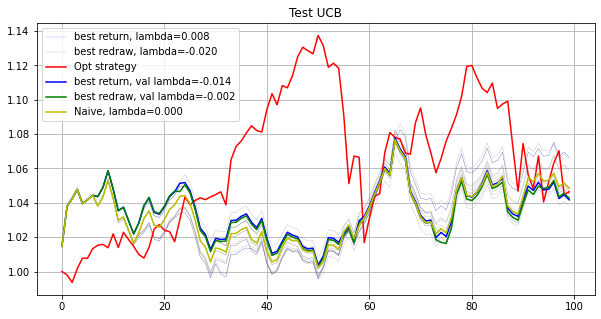

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[0.0084 0.0093 0.0102 0.009  0.0096 0.0098 0.0093 0.0099 0.0109 0.0096
 0.0101 0.0104 0.0084 0.0097 0.0103 0.0106 0.0108 0.0096 0.0128 0.0098
 0.0098 0.0097 0.0088 0.009  0.0105 0.0101 0.0103 0.009  0.01   0.0104
 0.0102 0.0105 0.0102 0.0104 0.0118 0.0099 0.0101 0.0084 0.0095 0.0095
 0.0103 0.0115 0.0101 0.0091 0.0108 0.0106 0.0113 0.0089 0.01   0.0098
 0.0095 0.0109 0.0101 0.0095 0.0088 0.0103 0.0096 0.0099 0.0108 0.0092
 0.0103 0.0098 0.0106 0.0099 0.0102 0.0092 0.0107 0.0086 0.0104 0.0095
 0.01   0.0097 0.0125 0.0101 0.0098 0.0109 0.01   0.0097 0.0093 0.0107
 0.0107 0.0109 0.01   0.0095 0.0104 0.0101 0.0099 0.0106 0.0094 0.0106
 0.0096 0.0097 0.0098 0.01   0.01   0.0095 0.0094 0.0103 0.0102 0.0101]
0.05486715104282609
[ 0.      0.02    0.0138  0.0064  0.0089  0.0135  0.0207  0.0107  0.0156
  0.0092  0.0123  0.0037  0.0047  0.0083  0.0033  0.0245  0.0073  0.0087
  0.      0.0098  0.0105  0.0028  0.0099  0.

[0.     0.0202 0.0139 0.0061 0.0088 0.0135 0.0199 0.0109 0.0159 0.009
 0.0113 0.0037 0.0047 0.008  0.0033 0.0242 0.0074 0.0086 0.0002 0.0097
 0.0104 0.0025 0.0097 0.0081 0.0159 0.013  0.0148 0.0073 0.0115 0.0159
 0.0073 0.0039 0.011  0.0065 0.0208 0.0082 0.0103 0.0089 0.011  0.0167
 0.0002 0.0168 0.0087 0.0019 0.0131 0.0184 0.0118 0.0053 0.0121 0.0076
 0.0057 0.0093 0.0121 0.0051 0.0007 0.0127 0.0079 0.0098 0.0163 0.007
 0.0141 0.0079 0.0101 0.0117 0.0082 0.0063 0.     0.0082 0.016  0.0118
 0.0132 0.0103 0.0134 0.0122 0.0029 0.0179 0.0108 0.0075 0.0073 0.0105
 0.0126 0.0066 0.0133 0.0069 0.0116 0.0088 0.0091 0.0169 0.0146 0.0156
 0.0113 0.0093 0.0049 0.0102 0.0046 0.008  0.0078 0.0076 0.0157 0.0087]
4.1768741539619545e-06
[0.     0.0202 0.0139 0.0061 0.0088 0.0135 0.0199 0.0109 0.0159 0.009
 0.0113 0.0037 0.0047 0.008  0.0033 0.0242 0.0074 0.0086 0.0002 0.0097
 0.0104 0.0025 0.0097 0.0081 0.0159 0.013  0.0148 0.0073 0.0115 0.0159
 0.0073 0.0039 0.011  0.0065 0.0208 0.0082 0.0103 0.0089

[ 0.      0.0226  0.0147  0.0083  0.0079  0.0127  0.0052  0.0113  0.0181
  0.0096  0.0137  0.0054  0.      0.0084  0.0004  0.025   0.007   0.0089
 -0.      0.008   0.0118  0.0036  0.0082  0.008   0.0216  0.0189  0.0147
  0.007   0.0123  0.0172  0.0081  0.0038  0.0071  0.0048  0.0103  0.0072
  0.0102  0.0098  0.0116  0.0153  0.      0.0188  0.0078  0.0009  0.0093
  0.0191  0.0121  0.004   0.0165  0.007   0.0105  0.0086  0.0122  0.0071
  0.0006  0.0148  0.005   0.011   0.0178  0.0072  0.015   0.007   0.0102
  0.0085  0.0064  0.0056  0.0075  0.0056  0.0184  0.0134  0.0149  0.0091
  0.0124  0.0123  0.0043  0.0198  0.0107  0.0061  0.0073  0.0101  0.0152
  0.0037  0.0145  0.0064  0.0079  0.0084  0.0096  0.0171  0.0158  0.0186
  0.011   0.0089  0.0053  0.0084  0.0023  0.0085  0.0096  0.0094  0.0149
  0.0105]
0.0001855601229027626
[ 0.      0.0226  0.0147  0.0083  0.0079  0.0127  0.0052  0.0113  0.0181
  0.0096  0.0137  0.0054  0.      0.0084  0.0004  0.025   0.007   0.0089
 -0.      0.008   0

[ 0.      0.0217  0.0159  0.0048  0.0072  0.0105  0.      0.0119  0.0204
  0.0073  0.0127  0.0029  0.      0.0071  0.      0.0221  0.0065  0.0083
  0.      0.0055  0.0099 -0.      0.0066  0.0048  0.0239  0.0201  0.0155
  0.0069  0.0128  0.0196  0.0063  0.0052  0.0073  0.0024  0.01    0.0076
  0.0101  0.0175  0.0141  0.0133  0.      0.0204  0.0062  0.      0.0104
  0.0208  0.013   0.0025  0.0167  0.0055  0.0104  0.0067  0.0122  0.0065
  0.      0.0141  0.0058  0.0109  0.0194  0.0069  0.0165  0.0039  0.0111
  0.006   0.0074  0.0072  0.0114  0.0058  0.0207  0.0097  0.016   0.0079
  0.0192  0.0127  0.0051  0.0216  0.0111  0.0073  0.0089  0.0087  0.0161
  0.0039  0.0157  0.0056  0.0073  0.0078  0.0078  0.019   0.0184  0.0202
  0.01    0.0088  0.0079  0.0091  0.003   0.0065  0.0125  0.0077  0.0153
  0.0122]
9.445738436413939e-05
[ 0.      0.0217  0.0159  0.0048  0.0073  0.0105 -0.      0.0119  0.0204
  0.0073  0.0127  0.0029  0.      0.0071  0.      0.0221  0.0065  0.0083
  0.      0.0055  0

[-0.      0.0286  0.0175  0.002   0.0065  0.0095 -0.      0.0127  0.0231
  0.0066  0.0048  0.0029  0.0014  0.0087  0.0006  0.0224  0.0019  0.0078
 -0.      0.0047  0.0097 -0.      0.0029  0.0052  0.0271  0.0197  0.0119
  0.0096  0.013   0.022   0.0042  0.0064  0.009   0.005   0.0035  0.0093
  0.0088  0.0182  0.0132  0.0121  0.      0.0188  0.0016 -0.      0.0106
  0.0227  0.0112 -0.      0.0171  0.0042  0.0116  0.      0.0133  0.003
  0.      0.0154  0.0095  0.0101  0.0182  0.0093  0.018   0.0046  0.0086
  0.0067  0.0047  0.0071  0.0084  0.0082  0.0238  0.0115  0.015   0.0078
  0.0225  0.0096  0.0027  0.0249  0.0108  0.0066  0.0141  0.0111  0.0168
  0.0073  0.0172  0.0074  0.0037  0.0043  0.0086  0.0202  0.0198  0.0219
  0.0091  0.0084  0.0056  0.007   0.0001  0.007   0.0214  0.0059  0.0184
  0.014 ]
0.19302353359643296
[ 0.      0.0286  0.0175  0.002   0.0065  0.0095 -0.      0.0127  0.0231
  0.0066  0.0048  0.0029  0.0014  0.0087  0.0006  0.0224  0.0019  0.0078
 -0.      0.0047  0.00

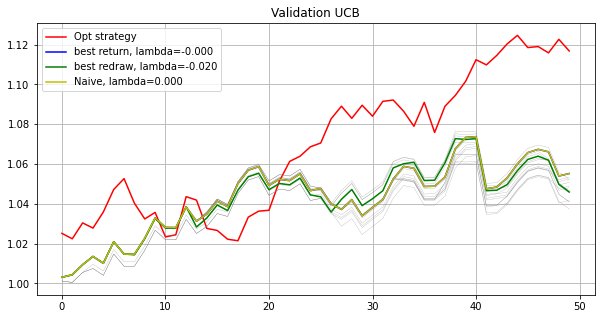

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[ 0.      0.0266  0.0147  0.003   0.0088  0.0069  0.0111  0.0197  0.0156
  0.006   0.0088  0.0081  0.0059  0.0084  0.0102  0.0015  0.0104 -0.
  0.0115  0.0082  0.002   0.      0.0022  0.      0.0189  0.0072  0.0051
  0.01    0.0121  0.0171  0.0086  0.0146  0.0122  0.007   0.0153  0.0111
  0.0109  0.0087  0.017   0.0057  0.0014  0.0103  0.009   0.0037  0.0092
  0.0172  0.0108  0.0031  0.0118  0.0064  0.002   0.003   0.0123  0.008
  0.0066  0.01    0.0116  0.0089  0.0131  0.0073  0.0145  0.0096  0.0068
  0.0151  0.0153  0.0128  0.0245  0.0023  0.0166  0.0039  0.008   0.0092
  0.0111  0.0059  0.0052  0.0199  0.0105  0.0125  0.0159  0.0076  0.0157
  0.0177  0.0138  0.0067  0.0075  0.0107  0.0116  0.0152  0.0178  0.0094
  0.0105  0.0117  0.0213  0.0048  0.0032  0.0102  0.0097  0.0082  0.0197
  0.0104]
5.2192734529246296e-05
[ 0.      0.0266  0.0147  0.003   0.0088  0.0069  0.0111  0.0197  0.0156
  0.006   0.0088  0.0081  0.0059  0.0084  0.0102  0.0015  0.0104 -0.
  0.0115  0.0082  0.002   0

[-0.      0.0266  0.015   0.0033  0.0085  0.0066  0.0068  0.0203  0.0164
  0.006   0.0093  0.0081  0.0055  0.0078  0.0104  0.0026  0.0099 -0.
  0.0115  0.0079  0.0011 -0.      0.0019  0.0003  0.0193  0.006   0.0053
  0.0092  0.0123  0.0176  0.0083  0.0145  0.0133  0.0072  0.0153  0.0108
  0.0113  0.0076  0.0178  0.006   0.0004  0.0099  0.0088  0.0038  0.0083
  0.018   0.0109  0.0027  0.0123  0.006   0.0007  0.0029  0.0126  0.0081
  0.0074  0.0104  0.0133  0.0088  0.0133  0.0076  0.0148  0.0098  0.0068
  0.0152  0.0163  0.012   0.0258  0.0019  0.0174  0.0037  0.0075  0.0092
  0.0099  0.0052  0.0056  0.021   0.0106  0.0121  0.0163  0.0078  0.0162
  0.018   0.0136  0.0066  0.0053  0.0101  0.0109  0.0172  0.0182  0.0093
  0.0103  0.0129  0.0208  0.0048  0.0039  0.0097  0.0108  0.0082  0.0202
  0.0108]
1.9023341069057038e-05
[-0.      0.0266  0.015   0.0033  0.0085  0.0066  0.0068  0.0203  0.0164
  0.006   0.0093  0.0081  0.0055  0.0078  0.0104  0.0026  0.0099 -0.
  0.0115  0.0079  0.0011 -

[-0.      0.0267  0.0167  0.0007  0.0076  0.0065 -0.      0.0193  0.0197
  0.0049  0.0109  0.0079  0.0035  0.0072  0.0085  0.0028  0.0116  0.0005
  0.0081  0.0054  0.     -0.      0.     -0.      0.0237  0.0042  0.0058
  0.0095  0.0131  0.0194  0.007   0.0126  0.0158  0.0061  0.0196  0.0103
  0.0129  0.0044  0.0156  0.0061  0.0055  0.0143  0.0057  0.0001  0.0057
  0.0216  0.0086  0.0015  0.0145  0.0047 -0.     -0.      0.0138  0.0064
  0.0075  0.0121  0.0103  0.0086  0.0151  0.0066  0.0175  0.0086  0.0085
  0.0134  0.0203  0.0089  0.0278  0.0004  0.0195  0.0026  0.0109  0.0085
  0.0093  0.0062  0.0034  0.0231  0.0108  0.0105  0.0184  0.0097  0.0149
  0.0176  0.0149  0.0053  0.0081  0.0089  0.0104  0.0183  0.0179  0.0097
  0.0094  0.0163  0.0248  0.002   0.0025  0.0071  0.0122  0.0077  0.0219
  0.0146]
9.396341789783437e-05
[-0.      0.0267  0.0167  0.0007  0.0076  0.0065 -0.      0.0193  0.0197
  0.0049  0.0109  0.0079  0.0035  0.0072  0.0085  0.0028  0.0116  0.0005
  0.0081  0.0054  0

[ 0.      0.0278  0.018  -0.      0.0076  0.0044 -0.      0.024   0.0231
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0013
  0.0077  0.0041  0.0068 -0.      0.      0.      0.0259  0.0042  0.004
  0.0067  0.0137  0.0217  0.0065  0.0117  0.0174  0.0084  0.0199  0.0111
  0.012   0.0033  0.0174  0.0049 -0.      0.0144  0.0018  0.      0.0047
  0.0247  0.0081  0.0024  0.0139  0.0031  0.      0.      0.0146  0.0059
  0.0024  0.0116  0.0069  0.0111  0.0172  0.0017  0.0195  0.0085  0.0068
  0.0095  0.018   0.0111  0.0223  0.      0.0227  0.0009  0.0119  0.0076
  0.0092  0.0039  0.0079  0.0275  0.0112  0.0099  0.0208  0.0117  0.0185
  0.0161  0.0171  0.0053  0.009   0.007   0.0096  0.0211  0.0211  0.0103
  0.0085  0.0163  0.0222  0.0013  0.0029  0.006   0.0158  0.0065  0.0249
  0.0154]
0.0005409359411325472
[ 0.      0.0278  0.018  -0.      0.0076  0.0044 -0.      0.024   0.0231
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0014
  0.0077  0.0041  0.

[-0.      0.0278  0.018  -0.      0.0076  0.0044  0.      0.024   0.0231
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0014
  0.0077  0.0041  0.0068 -0.     -0.     -0.      0.0259  0.0042  0.004
  0.0067  0.0137  0.0217  0.0065  0.0117  0.0174  0.0084  0.0199  0.0111
  0.012   0.0033  0.0174  0.0049 -0.      0.0144  0.0018 -0.      0.0047
  0.0247  0.0081  0.0024  0.0139  0.0031 -0.      0.      0.0146  0.0059
  0.0024  0.0116  0.0069  0.0111  0.0172  0.0017  0.0195  0.0085  0.0068
  0.0095  0.018   0.0111  0.0223  0.      0.0227  0.0009  0.0119  0.0076
  0.0092  0.0039  0.0079  0.0275  0.0112  0.0099  0.0208  0.0117  0.0185
  0.0161  0.0171  0.0053  0.009   0.007   0.0096  0.0211  0.0211  0.0103
  0.0085  0.0163  0.0222  0.0013  0.0029  0.006   0.0158  0.0065  0.0249
  0.0154]
2.2659837918147883e-05
[-0.      0.0278  0.018  -0.      0.0076  0.0044  0.      0.024   0.0231
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0013
  0.0077  0.0041  0

[-0.      0.0278  0.018   0.      0.0076  0.0044  0.      0.024   0.023
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0014
  0.0077  0.0041  0.0068  0.      0.      0.      0.0259  0.0042  0.004
  0.0067  0.0137  0.0217  0.0065  0.0117  0.0174  0.0084  0.0199  0.0111
  0.0119  0.0033  0.0174  0.0049  0.      0.0144  0.0018  0.      0.0047
  0.0247  0.0081  0.0024  0.0139  0.0031  0.      0.0001  0.0146  0.0059
  0.0024  0.0116  0.0069  0.0111  0.0172  0.0017  0.0195  0.0085  0.0068
  0.0095  0.018   0.0111  0.0223 -0.      0.0227  0.0009  0.0119  0.0076
  0.0092  0.0039  0.0079  0.0275  0.0112  0.0099  0.0208  0.0117  0.0185
  0.0161  0.017   0.0053  0.009   0.007   0.0096  0.0211  0.0211  0.0103
  0.0085  0.0163  0.0222  0.0013  0.0029  0.006   0.0158  0.0065  0.0249
  0.0154]
0.0005116506254994887
[ 0.      0.0278  0.018   0.      0.0076  0.0044 -0.      0.024   0.023
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0013
  0.0077  0.0041  0.00

[ 0.      0.0279  0.0181 -0.      0.0076  0.0044 -0.      0.024   0.023
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0014
  0.0077  0.0041  0.0068  0.      0.      0.      0.0259  0.0042  0.004
  0.0067  0.0137  0.0217  0.0065  0.0117  0.0174  0.0084  0.0199  0.0111
  0.0119  0.0033  0.0174  0.0049 -0.      0.0144  0.0018  0.      0.0046
  0.0247  0.0081  0.0023  0.0139  0.0031 -0.      0.0001  0.0146  0.0059
  0.0024  0.0116  0.0069  0.0111  0.0172  0.0016  0.0195  0.0085  0.0068
  0.0095  0.018   0.0111  0.0223  0.      0.0227  0.0009  0.0119  0.0076
  0.0092  0.0039  0.0079  0.0275  0.0112  0.0099  0.0207  0.0118  0.0185
  0.0161  0.017   0.0053  0.009   0.007   0.0096  0.0211  0.0211  0.0103
  0.0085  0.0163  0.0222  0.0013  0.0029  0.006   0.0158  0.0065  0.0249
  0.0154]
0.00014405843044909344
[ 0.      0.0279  0.0181 -0.      0.0076  0.0044 -0.      0.024   0.023
  0.0056  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0014
  0.0077  0.0041  0.0

[-0.      0.0279  0.0181  0.      0.0076  0.0044 -0.      0.024   0.0231
  0.0057  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0013
  0.0077  0.0041  0.0068 -0.      0.     -0.      0.0259  0.0042  0.004
  0.0067  0.0137  0.0217  0.0065  0.0117  0.0174  0.0084  0.0199  0.0111
  0.0119  0.0033  0.0174  0.0049  0.      0.0144  0.0018  0.      0.0047
  0.0247  0.0081  0.0023  0.0139  0.0031  0.      0.0001  0.0146  0.006
  0.0024  0.0116  0.0069  0.0111  0.0172  0.0017  0.0195  0.0085  0.0068
  0.0095  0.018   0.0111  0.0223 -0.      0.0227  0.0009  0.0119  0.0076
  0.0092  0.0039  0.0079  0.0275  0.0112  0.0099  0.0207  0.0117  0.0185
  0.0161  0.017   0.0053  0.009   0.007   0.0096  0.0211  0.0211  0.0103
  0.0085  0.0163  0.0222  0.0013  0.0029  0.006   0.0158  0.0065  0.0249
  0.0154]
0.0002646553886375425
[ 0.      0.0278  0.0181 -0.      0.0076  0.0044 -0.      0.024   0.0231
  0.0057  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0013
  0.0077  0.0041  0.0

[ 0.      0.0278  0.0181 -0.      0.0076  0.0044 -0.      0.024   0.0231
  0.0057  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0013
  0.0077  0.0041  0.0068  0.      0.      0.      0.0259  0.0042  0.004
  0.0067  0.0137  0.0217  0.0065  0.0117  0.0174  0.0084  0.0199  0.0111
  0.0119  0.0033  0.0174  0.0049 -0.      0.0144  0.0018 -0.      0.0047
  0.0247  0.0081  0.0023  0.0139  0.0031  0.      0.      0.0146  0.006
  0.0024  0.0116  0.0069  0.0111  0.0172  0.0017  0.0195  0.0085  0.0068
  0.0095  0.018   0.0111  0.0223  0.      0.0227  0.0009  0.0119  0.0076
  0.0092  0.0039  0.0079  0.0275  0.0112  0.0099  0.0207  0.0117  0.0185
  0.0161  0.017   0.0053  0.009   0.007   0.0096  0.0211  0.0211  0.0103
  0.0085  0.0163  0.0222  0.0013  0.0029  0.006   0.0158  0.0065  0.0249
  0.0154]
6.704472144140471e-05
[-0.      0.0278  0.0181  0.      0.0076  0.0045  0.      0.024   0.0231
  0.0057  0.0089  0.0053  0.0009  0.0054  0.0085  0.0056  0.0058  0.0013
  0.0077  0.0041  0.0

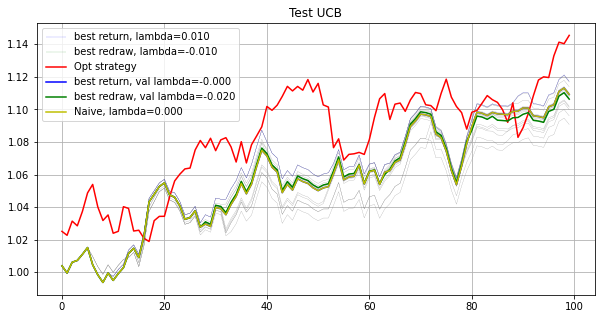

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.470500207712e-09
[0.0088 0.0101 0.0094 0.0099 0.0099 0.0097 0.0098 0.01   0.0099 0.0101
 0.0102 0.0104 0.0105 0.0103 0.0079 0.0107 0.0103 0.0101 0.0099 0.0099
 0.0097 0.0097 0.0094 0.0099 0.0099 0.0099 0.01   0.0103 0.0095 0.0103
 0.0098 0.0102 0.0101 0.0094 0.0105 0.0091 0.0097 0.0094 0.0103 0.0096
 0.01   0.0098 0.0095 0.0102 0.0102 0.0098 0.011  0.0099 0.0092 0.0105
 0.0101 0.0109 0.0098 0.01   0.0094 0

[0.0068 0.0109 0.0096 0.0096 0.0089 0.0108 0.0089 0.0101 0.0096 0.0103
 0.0104 0.0102 0.0109 0.0088 0.0105 0.0107 0.0098 0.0103 0.0105 0.0103
 0.0078 0.0111 0.0097 0.01   0.0104 0.0094 0.0096 0.0107 0.0092 0.0109
 0.0096 0.0095 0.0102 0.0083 0.0105 0.0083 0.0095 0.0096 0.0112 0.0114
 0.0098 0.0085 0.0114 0.0105 0.0088 0.0103 0.0141 0.0097 0.0087 0.0123
 0.0101 0.0107 0.0096 0.0102 0.0079 0.0097 0.0093 0.0121 0.0121 0.0091
 0.0109 0.0119 0.0088 0.0081 0.0097 0.0085 0.0096 0.0078 0.0092 0.0071
 0.0085 0.0112 0.0097 0.0123 0.0112 0.0113 0.0133 0.0101 0.0102 0.0092
 0.0095 0.011  0.0115 0.0107 0.0085 0.0106 0.0102 0.0105 0.01   0.0109
 0.0075 0.011  0.0096 0.0109 0.0092 0.0097 0.0082 0.0109 0.0106 0.011 ]
2.1102403806884905e-05
[0.0048 0.0109 0.0103 0.0098 0.008  0.0101 0.008  0.01   0.0094 0.0104
 0.0101 0.0101 0.0122 0.008  0.0068 0.0118 0.0093 0.0105 0.0102 0.0103
 0.0069 0.0123 0.0096 0.01   0.0102 0.0113 0.0102 0.011  0.009  0.0118
 0.0092 0.0088 0.0092 0.0091 0.0104 0.008  0.0101 0.0

[0.0046 0.0112 0.0108 0.0098 0.0078 0.0101 0.0081 0.0097 0.0093 0.0105
 0.0101 0.0099 0.0109 0.0073 0.008  0.0118 0.0091 0.0105 0.0095 0.0102
 0.0067 0.0119 0.0094 0.0094 0.0102 0.0111 0.0102 0.0113 0.0088 0.0125
 0.0088 0.0097 0.0092 0.0089 0.0109 0.0079 0.0096 0.0096 0.0124 0.015
 0.0096 0.0077 0.0078 0.0109 0.0068 0.0107 0.014  0.0088 0.008  0.0119
 0.0104 0.0118 0.0091 0.0096 0.007  0.0118 0.0126 0.0126 0.0138 0.0133
 0.0109 0.0115 0.008  0.0111 0.0098 0.0081 0.0078 0.006  0.0089 0.0057
 0.0088 0.0118 0.0094 0.0137 0.0123 0.0113 0.0116 0.0105 0.01   0.0086
 0.0095 0.0097 0.0127 0.0119 0.0087 0.0095 0.0101 0.0094 0.0097 0.0131
 0.009  0.0119 0.0078 0.0099 0.0087 0.0088 0.0083 0.0127 0.011  0.011 ]
1.7136319636562938e-06
[0.0046 0.0112 0.0108 0.0098 0.0078 0.0101 0.0081 0.0097 0.0093 0.0105
 0.0101 0.0099 0.0109 0.0073 0.008  0.0118 0.0091 0.0105 0.0095 0.0102
 0.0067 0.0119 0.0094 0.0094 0.0102 0.0111 0.0102 0.0113 0.0088 0.0125
 0.0088 0.0097 0.0092 0.0089 0.0109 0.0079 0.0096 0.00

[0.0046 0.0112 0.0108 0.0098 0.0078 0.0101 0.0081 0.0097 0.0093 0.0105
 0.0101 0.0099 0.0109 0.0073 0.008  0.0118 0.0091 0.0105 0.0095 0.0102
 0.0067 0.0119 0.0094 0.0094 0.0102 0.0111 0.0102 0.0113 0.0088 0.0125
 0.0088 0.0097 0.0092 0.0089 0.0109 0.0079 0.0096 0.0096 0.0124 0.015
 0.0096 0.0077 0.0078 0.0109 0.0068 0.0107 0.014  0.0088 0.008  0.0119
 0.0104 0.0118 0.0091 0.0096 0.007  0.0118 0.0126 0.0126 0.0138 0.0133
 0.0109 0.0115 0.008  0.0111 0.0098 0.0081 0.0078 0.006  0.0089 0.0057
 0.0088 0.0118 0.0094 0.0137 0.0123 0.0113 0.0116 0.0105 0.01   0.0086
 0.0095 0.0097 0.0127 0.0119 0.0087 0.0095 0.0101 0.0094 0.0097 0.0131
 0.009  0.0119 0.0078 0.0099 0.0087 0.0088 0.0083 0.0127 0.011  0.011 ]
6.2789626060098455e-06
[0.0046 0.0112 0.0108 0.0098 0.0078 0.0101 0.0081 0.0097 0.0093 0.0105
 0.0101 0.0099 0.0109 0.0073 0.008  0.0118 0.0091 0.0105 0.0095 0.0102
 0.0067 0.0119 0.0094 0.0094 0.0102 0.0111 0.0102 0.0113 0.0088 0.0125
 0.0088 0.0097 0.0092 0.0089 0.0109 0.0079 0.0096 0.00

[-0.      0.0141  0.0141  0.0104  0.0068  0.0119  0.0082  0.0105  0.0088
  0.0116  0.0102  0.0114  0.0098  0.0009  0.0037  0.0158  0.0081  0.0118
  0.005   0.0107  0.0071  0.0129  0.0083  0.0078  0.0112  0.017   0.011
  0.011   0.0076  0.0152  0.0086  0.0103  0.0117  0.0063  0.0084  0.0094
  0.0078  0.0092  0.0145  0.0107  0.0097  0.0049  0.0082  0.0125  0.0014
  0.0152  0.0124  0.0074  0.0025  0.016   0.0121  0.0127  0.0092  0.0091
  0.0053  0.0159  0.0082  0.0163  0.0156  0.0098  0.0117  0.0148  0.0058
  0.0157  0.011   0.0071  0.0068  0.0106  0.012   0.0002  0.0071  0.0124
  0.0093  0.0202  0.0098  0.0144  0.0091  0.0122  0.0074  0.0052  0.0084
  0.0093  0.0165  0.0139  0.0058  0.0086  0.01    0.0077  0.0101  0.0156
  0.0043  0.0147  0.0055  0.0105  0.0078  0.0087  0.0074  0.0127  0.0128
  0.0124]
1.063146316186677e-05
[-0.      0.0141  0.0141  0.0104  0.0068  0.0119  0.0082  0.0105  0.0088
  0.0116  0.0102  0.0114  0.0098  0.0009  0.0037  0.0158  0.0081  0.0118
  0.005   0.0107  0.

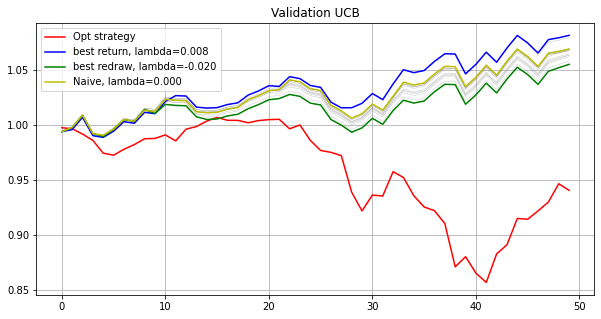

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[0.0073 0.011  0.0083 0.0103 0.0103 0.0095 0.0081 0.0102 0.0097 0.0103
 0.0102 0.013  0.0081 0.0089 0.0037 0.0135 0.0093 0.0101 0.0096 0.0095
 0.0076 0.0111 0.0098 0.0095 0.0107 0.011  0.0101 0.0109 0.0094 0.0116
 0.0095 0.0109 0.0125 0.0084 0.0088 0.0094 0.0104 0.0107 0.011  0.0094
 0.0099 0.0077 0.0099 0.0107 0.0076 0.0138 0.0116 0.008  0.0095 0.0108
 0.0105 0.0132 0.0094 0.0095 0.0114 0.0123 0.0066 0.0117 0.0119 0.0079
 0.0127 0.0096 0.0083 0.0114 0.0092 0.0101 0.0082 0.01   0.0102 0.0079
 0.0094 0.0109 0.0097 0.0125 0.0091 0.0082 0.0089 0.0103 0.0086 0.0084
 0.0097 0.0091 0.0119 0.0109 0.0103 0.0089 0.0101 0.0101 0.01   0.0131
 0.0128 0.011  0.0116 0.0099 0.0094 0.0101 0.0096 0.0102 0.0098 0.0104]
8.421614529872945e-10
[0.0073 0.011  0.0083 0.0103 0.0103 0.0095 0.0081 0.0102 0.0097 0.0103
 0.0102 0.013  0.0081 0.0089 0.0037 0.0135 0.0093 0.0101 0.0096 0.0095
 0.0076 0.0111 0.0098 0.0095 0.0107 0.011  0.0101 0.0109 0.0094 0.0116
 0.0095 0.0109 0.0125 0.0084 0.0088 0.0094 0.0104 0.01

[0.0071 0.0109 0.0087 0.0104 0.0099 0.0096 0.0076 0.0102 0.0095 0.0104
 0.0103 0.013  0.0085 0.009  0.002  0.0141 0.0091 0.0102 0.0095 0.0095
 0.0076 0.0115 0.0096 0.0095 0.0106 0.0115 0.0102 0.0111 0.0093 0.0119
 0.0094 0.0109 0.0123 0.0082 0.0092 0.0091 0.0102 0.0105 0.0113 0.0095
 0.0098 0.0072 0.0098 0.0108 0.0075 0.014  0.012  0.0076 0.0099 0.0108
 0.0106 0.0135 0.0093 0.0096 0.011  0.0126 0.0064 0.0118 0.0119 0.0075
 0.0128 0.0101 0.0081 0.0116 0.0093 0.0101 0.0082 0.0095 0.0101 0.0071
 0.0096 0.011  0.0096 0.013  0.0092 0.008  0.0087 0.0103 0.0086 0.0084
 0.0103 0.0089 0.0122 0.0111 0.0102 0.0088 0.0104 0.0098 0.0099 0.0133
 0.0132 0.0112 0.0116 0.01   0.0092 0.01   0.0096 0.0105 0.0096 0.0108]
1.0539738846439273e-08
[0.0071 0.0109 0.0087 0.0104 0.0099 0.0096 0.0076 0.0102 0.0095 0.0104
 0.0103 0.013  0.0085 0.009  0.002  0.0141 0.0091 0.0102 0.0095 0.0095
 0.0076 0.0115 0.0096 0.0095 0.0106 0.0115 0.0102 0.0111 0.0093 0.0119
 0.0094 0.0109 0.0123 0.0082 0.0092 0.0091 0.0102 0.0

[0.0071 0.0109 0.0087 0.0104 0.0099 0.0096 0.0076 0.0102 0.0095 0.0104
 0.0103 0.013  0.0085 0.009  0.002  0.0141 0.0091 0.0102 0.0095 0.0095
 0.0076 0.0115 0.0096 0.0095 0.0106 0.0115 0.0102 0.0111 0.0093 0.0119
 0.0094 0.0109 0.0123 0.0082 0.0092 0.0091 0.0102 0.0105 0.0113 0.0095
 0.0098 0.0072 0.0098 0.0108 0.0075 0.014  0.012  0.0076 0.0099 0.0108
 0.0106 0.0135 0.0093 0.0096 0.011  0.0126 0.0064 0.0118 0.0119 0.0075
 0.0128 0.0101 0.0081 0.0116 0.0093 0.0101 0.0082 0.0095 0.0101 0.0071
 0.0096 0.011  0.0096 0.013  0.0092 0.008  0.0087 0.0103 0.0086 0.0084
 0.0103 0.0089 0.0122 0.0111 0.0102 0.0088 0.0104 0.0098 0.0099 0.0133
 0.0132 0.0112 0.0116 0.01   0.0092 0.01   0.0096 0.0105 0.0096 0.0108]
3.3352959177531186e-07
[0.0071 0.0109 0.0087 0.0104 0.0099 0.0096 0.0076 0.0102 0.0095 0.0104
 0.0103 0.013  0.0085 0.009  0.002  0.0141 0.0091 0.0102 0.0095 0.0095
 0.0076 0.0115 0.0096 0.0095 0.0106 0.0115 0.0102 0.0111 0.0093 0.0119
 0.0094 0.0109 0.0123 0.0082 0.0092 0.0091 0.0102 0.0

[0.0071 0.0109 0.0087 0.0104 0.0099 0.0096 0.0076 0.0102 0.0095 0.0104
 0.0103 0.013  0.0085 0.009  0.002  0.0141 0.0091 0.0102 0.0095 0.0095
 0.0076 0.0115 0.0096 0.0095 0.0106 0.0115 0.0101 0.0111 0.0093 0.0119
 0.0094 0.0109 0.0123 0.0082 0.0092 0.0091 0.0102 0.0105 0.0113 0.0095
 0.0098 0.0072 0.0098 0.0108 0.0075 0.014  0.012  0.0076 0.0099 0.0108
 0.0106 0.0135 0.0093 0.0096 0.011  0.0126 0.0064 0.0118 0.0119 0.0075
 0.0128 0.0101 0.0081 0.0116 0.0093 0.0101 0.0082 0.0095 0.0101 0.0071
 0.0096 0.011  0.0096 0.013  0.0092 0.008  0.0087 0.0103 0.0086 0.0084
 0.0103 0.0089 0.0122 0.0111 0.0102 0.0088 0.0104 0.0098 0.0099 0.0133
 0.0132 0.0112 0.0116 0.01   0.0092 0.01   0.0096 0.0105 0.0096 0.0108]
1.2621272205397965e-07
[0.0069 0.011  0.0085 0.0103 0.0099 0.0095 0.0069 0.0102 0.0095 0.0103
 0.0102 0.013  0.0085 0.0089 0.0016 0.0142 0.0091 0.0102 0.0095 0.0095
 0.0071 0.0112 0.0095 0.0095 0.0107 0.0116 0.0102 0.0111 0.0092 0.0119
 0.0094 0.0109 0.0123 0.0081 0.0094 0.009  0.0101 0.0

[0.0059 0.0113 0.0095 0.0099 0.0119 0.0094 0.0076 0.0101 0.0094 0.0101
 0.0095 0.0128 0.0082 0.0082 0.0009 0.0145 0.0091 0.0101 0.0083 0.0092
 0.0071 0.0097 0.0089 0.0093 0.0104 0.0118 0.0103 0.0115 0.0091 0.0124
 0.0087 0.0107 0.012  0.0087 0.0102 0.0087 0.0095 0.0097 0.0118 0.0095
 0.0097 0.0072 0.0097 0.0108 0.0071 0.0137 0.0118 0.0093 0.0086 0.0104
 0.0106 0.0167 0.0089 0.0104 0.0103 0.0131 0.0056 0.0117 0.0116 0.008
 0.0124 0.0107 0.0072 0.0124 0.0095 0.0098 0.0078 0.0083 0.0099 0.0113
 0.009  0.0133 0.0095 0.0123 0.0095 0.0076 0.0085 0.0107 0.0086 0.0107
 0.0104 0.0093 0.0125 0.0117 0.0099 0.0088 0.0106 0.0095 0.0095 0.0137
 0.0127 0.0119 0.011  0.0095 0.0085 0.0096 0.0101 0.0111 0.0088 0.0108]
2.0444286828508098e-07
[0.0059 0.0113 0.0095 0.0099 0.0119 0.0094 0.0076 0.0101 0.0094 0.0101
 0.0095 0.0128 0.0082 0.0082 0.0009 0.0145 0.0091 0.0101 0.0083 0.0092
 0.0071 0.0097 0.0089 0.0093 0.0104 0.0118 0.0103 0.0115 0.0091 0.0124
 0.0087 0.0107 0.012  0.0087 0.0102 0.0087 0.0095 0.00

[0.0054 0.0116 0.0095 0.0097 0.0111 0.0091 0.007  0.0101 0.0092 0.0102
 0.0093 0.0127 0.0085 0.0078 0.     0.0145 0.0088 0.0102 0.0081 0.0089
 0.0088 0.0093 0.0087 0.0089 0.01   0.0133 0.0106 0.0117 0.009  0.013
 0.0083 0.0103 0.0113 0.008  0.0106 0.0086 0.0091 0.0088 0.012  0.0087
 0.0097 0.0077 0.0086 0.0111 0.0066 0.0161 0.013  0.0105 0.008  0.0108
 0.0108 0.0173 0.0088 0.0096 0.0105 0.0125 0.0054 0.0121 0.0116 0.0074
 0.0125 0.0105 0.0068 0.0127 0.0095 0.0096 0.0068 0.008  0.0099 0.0119
 0.0089 0.0135 0.0093 0.0134 0.0094 0.0076 0.0071 0.0113 0.0075 0.0113
 0.0105 0.01   0.0128 0.012  0.0095 0.0088 0.011  0.0099 0.0094 0.0143
 0.0129 0.0121 0.0133 0.0094 0.0082 0.0095 0.0099 0.0112 0.0088 0.0106]
0.0002380502259580682
[0.0054 0.0116 0.0095 0.0097 0.0111 0.0091 0.007  0.0101 0.0092 0.0102
 0.0093 0.0127 0.0085 0.0078 0.     0.0145 0.0088 0.0102 0.0081 0.0089
 0.0088 0.0093 0.0087 0.0089 0.01   0.0133 0.0106 0.0117 0.009  0.013
 0.0083 0.0103 0.0113 0.008  0.0106 0.0086 0.0091 0.0088

[0.0054 0.0116 0.0095 0.0097 0.0111 0.0091 0.007  0.0101 0.0092 0.0102
 0.0093 0.0127 0.0085 0.0078 0.     0.0145 0.0088 0.0102 0.0081 0.0089
 0.0088 0.0093 0.0087 0.0089 0.01   0.0133 0.0106 0.0117 0.009  0.013
 0.0083 0.0103 0.0113 0.008  0.0106 0.0086 0.0091 0.0088 0.012  0.0087
 0.0097 0.0077 0.0086 0.0111 0.0066 0.0161 0.013  0.0105 0.008  0.0108
 0.0108 0.0173 0.0088 0.0096 0.0105 0.0125 0.0054 0.0121 0.0116 0.0074
 0.0125 0.0105 0.0068 0.0127 0.0095 0.0096 0.0068 0.008  0.0099 0.0119
 0.0089 0.0135 0.0093 0.0134 0.0094 0.0076 0.0071 0.0113 0.0075 0.0113
 0.0105 0.01   0.0128 0.012  0.0095 0.0088 0.011  0.0098 0.0094 0.0143
 0.0129 0.0121 0.0133 0.0093 0.0082 0.0095 0.0099 0.0112 0.0088 0.0106]
1.9702104610429025e-05
[0.0054 0.0116 0.0095 0.0097 0.0111 0.0091 0.007  0.0101 0.0092 0.0102
 0.0093 0.0127 0.0085 0.0078 0.     0.0145 0.0088 0.0102 0.0081 0.0089
 0.0088 0.0093 0.0087 0.0089 0.01   0.0133 0.0106 0.0117 0.009  0.013
 0.0083 0.0103 0.0113 0.008  0.0106 0.0086 0.0091 0.008

[0.0055 0.0116 0.0097 0.0097 0.011  0.0091 0.0069 0.0101 0.0092 0.0102
 0.0093 0.0126 0.0083 0.0076 0.     0.0146 0.0088 0.0102 0.0081 0.0088
 0.0094 0.0092 0.0086 0.0089 0.01   0.0135 0.0107 0.0117 0.0089 0.013
 0.0082 0.0104 0.0112 0.0079 0.0107 0.0086 0.0091 0.0089 0.0121 0.0088
 0.0097 0.0077 0.0087 0.0111 0.0066 0.0161 0.013  0.0105 0.008  0.0107
 0.0107 0.0172 0.0088 0.0096 0.0104 0.0126 0.0054 0.012  0.0116 0.0076
 0.0124 0.0106 0.0067 0.0127 0.0096 0.0095 0.0067 0.0079 0.0098 0.0115
 0.0089 0.0136 0.0093 0.0135 0.0094 0.0075 0.0072 0.0113 0.0076 0.0114
 0.0105 0.01   0.0128 0.0121 0.0094 0.0086 0.0111 0.0099 0.0093 0.0143
 0.0131 0.0122 0.0131 0.0093 0.0081 0.0096 0.0097 0.0114 0.0088 0.0105]
6.721164623953533e-06
[0.0055 0.0116 0.0097 0.0097 0.011  0.0091 0.0069 0.0101 0.0092 0.0102
 0.0093 0.0126 0.0083 0.0076 0.     0.0146 0.0088 0.0102 0.0081 0.0088
 0.0094 0.0092 0.0086 0.0089 0.01   0.0135 0.0107 0.0117 0.0089 0.013
 0.0082 0.0104 0.0112 0.0079 0.0107 0.0086 0.0091 0.0089

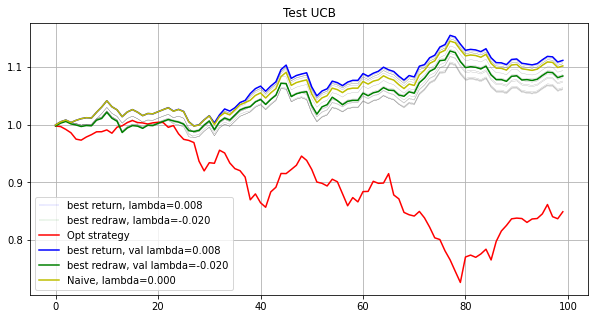

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[0.0115 0.0099 0.0102 0.0088 0.0098 0.0103 0.0099 0.0101 0.0099 0.0099
 0.0097 0.0109 0.0099 0.0101 0.0093 0.0099 0.0101 0.0092 0.0105 0.0098
 0.0103 0.0105 0.0097 0.011  0.0097 0.0104 0.0108 0.01   0.0103 0.01
 0.01   0.0093 0.0097 0.0103 0.0109 0.0104 0.0092 0.0099 0.0099 0.01
 0.0099 0.0097 0.0093 0.0099 0.01   0.0094 0.0103 0.0106 0.0096 0.0096
 0.0112 0.0098 0.0099 0.01   0.0092 0.0102 0.01   0.0104 0.0102 0.0091
 0.0095 0.0103 0.0099 0.0107 0.0093 0.0108 0.01   0.0103 0.01   0.0104
 0.0092 0.0102 0.0098 0.0094 0.0095 0.01   0.0101 0.0096 0.0108 0.01
 0.0096 0.0105 0.0094 0.01   0.0098 0.0095 0.0091 0.0103 0.0098 0.0095
 0.0099 0.0098 0.0098 0.0098 0.0101 0.0117 0.01   0.0103 0.0098 0.0105]
0.037893451822796874
[0.0115 0.0099 0.0102 0.0088 0.0098 0.0103 0.0099 0.0101 0.0099 0.0099
 0.0097 0.0109 0.0099 0.0101 0.0093 0.0099 0.0101 0.0092 0.0105 0.0098
 0.0103 0.0105 0.0097 0.011  0.0097 0.0104 0.0108 0.

[0.0122 0.0089 0.0107 0.0076 0.0095 0.0118 0.0098 0.0106 0.0099 0.0096
 0.0095 0.0098 0.0097 0.0105 0.0092 0.0097 0.0097 0.0071 0.011  0.009
 0.0111 0.0104 0.0097 0.0114 0.0095 0.011  0.0104 0.0106 0.0108 0.0095
 0.0098 0.0088 0.0096 0.01   0.0122 0.011  0.0093 0.0094 0.0096 0.0097
 0.0098 0.0099 0.0097 0.0098 0.0105 0.0084 0.0104 0.0106 0.0092 0.0103
 0.0121 0.0091 0.0097 0.0104 0.0113 0.0098 0.01   0.0103 0.0105 0.009
 0.0097 0.0126 0.0102 0.0097 0.0094 0.0116 0.0098 0.0104 0.0101 0.011
 0.0088 0.0112 0.0094 0.009  0.0099 0.0101 0.0102 0.0081 0.01   0.0105
 0.0085 0.0101 0.0093 0.0095 0.01   0.0099 0.0087 0.0102 0.0088 0.0103
 0.0099 0.0099 0.0107 0.0107 0.0103 0.01   0.0098 0.0102 0.0098 0.011 ]
4.83835314781661e-09
[0.0119 0.0086 0.0109 0.0074 0.0095 0.0118 0.0098 0.0106 0.0098 0.0096
 0.0092 0.0098 0.0098 0.0104 0.009  0.0097 0.01   0.0072 0.011  0.009
 0.0115 0.0106 0.0097 0.0115 0.0094 0.0112 0.0104 0.0106 0.011  0.0094
 0.0098 0.0089 0.0096 0.01   0.0122 0.0112 0.009  0.0096 0.

[0.0113 0.0085 0.0111 0.0069 0.0093 0.0115 0.0095 0.0103 0.0098 0.0094
 0.0095 0.0101 0.0096 0.0104 0.0096 0.0093 0.0107 0.0066 0.0108 0.0084
 0.0117 0.0109 0.01   0.0124 0.0092 0.011  0.0104 0.0107 0.0114 0.0092
 0.0098 0.0087 0.0092 0.0104 0.0126 0.0116 0.0085 0.0109 0.0093 0.0091
 0.0099 0.0099 0.0092 0.0094 0.0104 0.0097 0.0104 0.0106 0.0092 0.0101
 0.0132 0.0087 0.0097 0.0105 0.0124 0.0097 0.0096 0.0106 0.0105 0.0081
 0.0092 0.0138 0.0098 0.0091 0.0088 0.0136 0.0098 0.0102 0.01   0.0104
 0.0091 0.0117 0.0095 0.0092 0.0097 0.0099 0.0101 0.0079 0.0105 0.0109
 0.0085 0.0098 0.0093 0.0089 0.0105 0.0091 0.009  0.0102 0.0087 0.0103
 0.01   0.0094 0.0101 0.0106 0.0101 0.0117 0.0088 0.0099 0.0097 0.0108]
3.153893652534448e-07
[0.0113 0.0085 0.0111 0.0069 0.0093 0.0115 0.0095 0.0103 0.0098 0.0094
 0.0095 0.0101 0.0096 0.0104 0.0096 0.0093 0.0107 0.0066 0.0108 0.0084
 0.0117 0.0109 0.01   0.0124 0.0092 0.011  0.0104 0.0107 0.0114 0.0092
 0.0098 0.0087 0.0092 0.0104 0.0126 0.0116 0.0085 0.01

[0.0095 0.0079 0.011  0.0051 0.0088 0.0125 0.0097 0.0099 0.0096 0.0091
 0.0078 0.009  0.009  0.0101 0.0097 0.0095 0.0105 0.0061 0.0117 0.0068
 0.0114 0.0115 0.0104 0.0146 0.0088 0.0115 0.0103 0.011  0.0127 0.0109
 0.0097 0.0082 0.0085 0.0085 0.0171 0.0133 0.0066 0.0113 0.0116 0.0096
 0.0106 0.0099 0.0077 0.0087 0.0123 0.0061 0.0114 0.0131 0.008  0.0101
 0.0151 0.008  0.0096 0.0117 0.0123 0.0083 0.0095 0.0118 0.0108 0.007
 0.0095 0.0162 0.0096 0.0086 0.0092 0.0128 0.0116 0.0101 0.01   0.0105
 0.0085 0.013  0.0091 0.0132 0.0104 0.0098 0.0096 0.0064 0.0119 0.0109
 0.008  0.0141 0.008  0.0098 0.0098 0.0083 0.0083 0.0096 0.0082 0.0091
 0.0093 0.0092 0.0071 0.0098 0.0096 0.0105 0.0064 0.011  0.01   0.0108]
4.886728853688294e-07
[0.0095 0.0079 0.011  0.0051 0.0088 0.0125 0.0097 0.0099 0.0096 0.0091
 0.0078 0.009  0.009  0.0101 0.0097 0.0095 0.0105 0.0061 0.0117 0.0068
 0.0114 0.0115 0.0104 0.0146 0.0088 0.0115 0.0103 0.011  0.0127 0.0109
 0.0097 0.0082 0.0085 0.0085 0.0171 0.0133 0.0066 0.011

[0.0118 0.0079 0.0112 0.0029 0.0085 0.0127 0.0098 0.0086 0.0097 0.0089
 0.0059 0.0102 0.0089 0.0093 0.008  0.0089 0.0153 0.0024 0.011  0.0054
 0.0143 0.0135 0.0097 0.0154 0.0085 0.0091 0.0114 0.0117 0.014  0.0098
 0.0097 0.0088 0.0066 0.0096 0.0176 0.0143 0.0056 0.0096 0.0121 0.0104
 0.0117 0.0093 0.0068 0.0083 0.0089 0.0056 0.0115 0.0115 0.0073 0.0124
 0.016  0.0076 0.0091 0.0135 0.0155 0.0082 0.0093 0.0144 0.0112 0.0074
 0.0083 0.0162 0.0094 0.0086 0.008  0.0151 0.0119 0.01   0.0082 0.0088
 0.0093 0.0139 0.0093 0.0098 0.0113 0.0093 0.0083 0.0077 0.0118 0.0113
 0.01   0.0118 0.0087 0.0097 0.0117 0.0055 0.0078 0.0101 0.0065 0.0094
 0.0091 0.009  0.0074 0.0137 0.0097 0.0127 0.0036 0.0112 0.01   0.0109]
0.00013750528264861893
[0.0118 0.0079 0.0112 0.0029 0.0085 0.0127 0.0098 0.0086 0.0097 0.0089
 0.0059 0.0102 0.0089 0.0093 0.008  0.0089 0.0153 0.0024 0.011  0.0054
 0.0143 0.0135 0.0097 0.0154 0.0085 0.0091 0.0114 0.0117 0.0139 0.0098
 0.0097 0.0088 0.0066 0.0096 0.0176 0.0143 0.0056 0.0

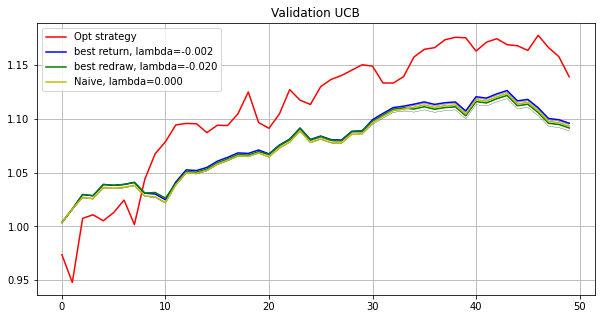

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[0.0077 0.0094 0.0116 0.0076 0.0093 0.01   0.0094 0.0089 0.0096 0.0095
 0.0083 0.0075 0.0109 0.008  0.0114 0.0092 0.0121 0.0032 0.0106 0.0099
 0.0099 0.008  0.0106 0.0109 0.0095 0.0073 0.0108 0.0112 0.011  0.0124
 0.0097 0.0087 0.0089 0.0107 0.009  0.0113 0.0077 0.0071 0.0108 0.0109
 0.0112 0.0092 0.0098 0.0092 0.0101 0.0111 0.0107 0.0087 0.0083 0.0057
 0.0124 0.0105 0.01   0.0107 0.0114 0.0113 0.0095 0.0144 0.0095 0.0086
 0.0107 0.0159 0.0106 0.0109 0.0085 0.0144 0.0105 0.0102 0.0084 0.0088
 0.0082 0.0102 0.0102 0.014  0.0104 0.0095 0.0096 0.0086 0.0089 0.0108
 0.0134 0.0095 0.0083 0.01   0.0141 0.0084 0.0091 0.0097 0.0105 0.0104
 0.0096 0.0096 0.0117 0.0087 0.0106 0.0124 0.0094 0.0113 0.0106 0.0108]
0.04138864104116609
[0.0078 0.0094 0.0117 0.0076 0.0093 0.01   0.0094 0.0088 0.0096 0.0094
 0.0079 0.0073 0.0109 0.0077 0.0117 0.0091 0.0124 0.0028 0.0105 0.0098
 0.0102 0.0076 0.0107 0.011  0.0094 0.0069 0.0111 0.0113 0.011  0.0121
 0.0097 0.0086 0.0086 0.011  0.0087 0.0115 0.008  0.0066

[0.0125 0.0072 0.0122 0.0055 0.0087 0.0095 0.0089 0.0083 0.0094 0.0091
 0.0057 0.0075 0.0105 0.007  0.011  0.0087 0.0158 0.0024 0.0105 0.0105
 0.0116 0.0087 0.0116 0.0103 0.0092 0.0057 0.0118 0.0113 0.0123 0.0116
 0.0096 0.0074 0.0086 0.0114 0.0093 0.0117 0.0061 0.0087 0.0098 0.0096
 0.0115 0.009  0.0084 0.0086 0.0106 0.0136 0.0112 0.0084 0.0076 0.0065
 0.0122 0.0108 0.0108 0.0113 0.0106 0.0121 0.0091 0.0144 0.0094 0.0071
 0.0095 0.0181 0.0101 0.0103 0.0106 0.0171 0.0122 0.0102 0.0089 0.0092
 0.0069 0.0123 0.0095 0.0151 0.0104 0.009  0.0086 0.0075 0.0082 0.0109
 0.0136 0.0099 0.0064 0.0092 0.0169 0.0073 0.0069 0.0101 0.0099 0.0105
 0.0096 0.0092 0.0116 0.0083 0.0107 0.0122 0.0097 0.0116 0.0109 0.0105]
5.993544917324081e-07
[0.0116 0.0068 0.0123 0.0053 0.0086 0.0095 0.0087 0.0083 0.0094 0.0091
 0.0054 0.0072 0.0106 0.0069 0.0111 0.0086 0.0159 0.002  0.0106 0.0102
 0.0119 0.0087 0.0117 0.0106 0.0092 0.0055 0.0121 0.0115 0.0125 0.0117
 0.0096 0.0073 0.0083 0.0117 0.0097 0.0118 0.0063 0.00

[0.0115 0.0068 0.0123 0.0053 0.0086 0.0095 0.0087 0.0083 0.0094 0.0091
 0.0054 0.0072 0.0106 0.0069 0.0111 0.0086 0.0159 0.002  0.0106 0.0102
 0.0119 0.0087 0.0117 0.0106 0.0092 0.0055 0.0121 0.0115 0.0125 0.0117
 0.0096 0.0072 0.0083 0.0117 0.0097 0.0118 0.0063 0.0089 0.0099 0.0097
 0.0114 0.0089 0.0084 0.0086 0.0105 0.0138 0.0114 0.0088 0.0075 0.0068
 0.0126 0.0106 0.0107 0.0115 0.0106 0.0121 0.0091 0.0142 0.0095 0.007
 0.0095 0.0182 0.0101 0.0102 0.0102 0.0173 0.0125 0.0102 0.0083 0.009
 0.0069 0.0122 0.0094 0.015  0.0105 0.009  0.0086 0.0078 0.0081 0.0109
 0.0136 0.0097 0.0064 0.0091 0.017  0.0073 0.0071 0.01   0.01   0.0103
 0.0096 0.0092 0.0114 0.0084 0.0107 0.0126 0.0098 0.0116 0.011  0.0104]
2.029711488656799e-07
[0.0115 0.0068 0.0123 0.0053 0.0086 0.0095 0.0087 0.0083 0.0094 0.0091
 0.0054 0.0072 0.0106 0.0069 0.0111 0.0086 0.0159 0.002  0.0106 0.0102
 0.0119 0.0087 0.0117 0.0106 0.0092 0.0055 0.0121 0.0115 0.0125 0.0117
 0.0096 0.0072 0.0083 0.0117 0.0097 0.0118 0.0063 0.0089

[0.0115 0.0067 0.0123 0.0051 0.0086 0.0097 0.0087 0.0083 0.0094 0.0091
 0.0055 0.0074 0.0107 0.0068 0.0112 0.0086 0.016  0.0014 0.0106 0.0102
 0.0118 0.0088 0.0119 0.0107 0.0091 0.0054 0.0123 0.0115 0.0126 0.0117
 0.0096 0.0071 0.0081 0.0118 0.0095 0.0117 0.0062 0.009  0.01   0.0097
 0.0115 0.0089 0.0084 0.0085 0.0105 0.0139 0.0115 0.009  0.0075 0.0067
 0.0126 0.0106 0.0109 0.0116 0.0107 0.0119 0.0091 0.0142 0.0096 0.0069
 0.0094 0.0182 0.0102 0.0103 0.0102 0.0176 0.0125 0.0102 0.0082 0.0088
 0.0068 0.0124 0.0094 0.015  0.0105 0.009  0.0084 0.008  0.0082 0.011
 0.0136 0.0097 0.0063 0.0091 0.017  0.0072 0.0068 0.01   0.0098 0.0104
 0.0096 0.0092 0.0115 0.0084 0.0107 0.0128 0.0098 0.0116 0.0111 0.0104]
1.0836667506267453e-07
[0.0115 0.0067 0.0123 0.0051 0.0086 0.0097 0.0087 0.0083 0.0094 0.0091
 0.0055 0.0074 0.0107 0.0068 0.0112 0.0086 0.016  0.0014 0.0106 0.0102
 0.0118 0.0088 0.0119 0.0107 0.0091 0.0054 0.0123 0.0115 0.0126 0.0117
 0.0096 0.0071 0.0081 0.0118 0.0095 0.0117 0.0062 0.00

[0.0115 0.0067 0.0123 0.0051 0.0086 0.0097 0.0087 0.0083 0.0094 0.0091
 0.0055 0.0074 0.0107 0.0068 0.0112 0.0086 0.016  0.0014 0.0106 0.0102
 0.0118 0.0088 0.0119 0.0107 0.0091 0.0054 0.0123 0.0115 0.0126 0.0117
 0.0096 0.0071 0.0081 0.0118 0.0095 0.0117 0.0062 0.009  0.01   0.0097
 0.0115 0.0089 0.0084 0.0085 0.0105 0.0139 0.0115 0.009  0.0075 0.0067
 0.0126 0.0106 0.0109 0.0116 0.0107 0.0119 0.0091 0.0142 0.0096 0.0069
 0.0094 0.0182 0.0102 0.0103 0.0102 0.0176 0.0125 0.0102 0.0082 0.0088
 0.0068 0.0124 0.0094 0.015  0.0105 0.009  0.0084 0.008  0.0082 0.011
 0.0136 0.0097 0.0063 0.0091 0.017  0.0072 0.0068 0.01   0.0098 0.0104
 0.0096 0.0092 0.0115 0.0084 0.0107 0.0128 0.0098 0.0116 0.0111 0.0104]
7.047169905591809e-08
[0.0115 0.0067 0.0123 0.0051 0.0086 0.0097 0.0087 0.0083 0.0094 0.0091
 0.0055 0.0074 0.0107 0.0068 0.0112 0.0086 0.016  0.0014 0.0106 0.0102
 0.0118 0.0088 0.0119 0.0107 0.0091 0.0054 0.0123 0.0115 0.0126 0.0117
 0.0096 0.0071 0.0081 0.0118 0.0095 0.0117 0.0062 0.009

[0.0059 0.0059 0.0124 0.0045 0.0084 0.0098 0.0088 0.0077 0.0094 0.0091
 0.0032 0.0072 0.0108 0.0068 0.0097 0.0086 0.0148 0.001  0.01   0.0107
 0.0115 0.0084 0.0121 0.012  0.0089 0.0067 0.012  0.0116 0.013  0.0115
 0.0095 0.0057 0.0081 0.0115 0.0099 0.0124 0.0047 0.0086 0.009  0.0095
 0.0118 0.0081 0.0084 0.0084 0.0123 0.0156 0.0123 0.0096 0.0067 0.0069
 0.0128 0.0102 0.0108 0.012  0.0088 0.0126 0.0091 0.0155 0.0094 0.0062
 0.0096 0.0215 0.0105 0.0097 0.0076 0.0187 0.0136 0.0112 0.0088 0.0087
 0.007  0.0131 0.0092 0.0174 0.0105 0.0089 0.0074 0.0074 0.0075 0.0122
 0.0165 0.0117 0.0061 0.0079 0.0171 0.0065 0.0065 0.0101 0.0106 0.012
 0.0097 0.009  0.0126 0.009  0.0112 0.013  0.0072 0.0114 0.012  0.0106]
0.07316735322729725
[0.0059 0.0059 0.0124 0.0045 0.0084 0.0098 0.0088 0.0077 0.0094 0.0091
 0.0032 0.0072 0.0108 0.0068 0.0097 0.0086 0.0148 0.001  0.01   0.0107
 0.0115 0.0084 0.0121 0.012  0.0089 0.0067 0.012  0.0116 0.013  0.0115
 0.0095 0.0057 0.0081 0.0115 0.0099 0.0124 0.0047 0.0086 

[ 0.0073  0.006   0.0136  0.0037  0.0081  0.0117  0.009   0.008   0.0093
  0.0089  0.0017  0.0073  0.0114  0.0067  0.0096  0.0083  0.015  -0.
  0.0109  0.0098  0.0114  0.009   0.0115  0.0118  0.0086  0.0064  0.0124
  0.0119  0.0138  0.0116  0.0093  0.0059  0.0082  0.0114  0.0103  0.0127
  0.0053  0.008   0.01    0.0098  0.0126  0.0078  0.0076  0.0079  0.0118
  0.0156  0.0124  0.0106  0.006   0.0079  0.0142  0.0096  0.0101  0.0124
  0.0081  0.0129  0.009   0.0154  0.0097  0.0049  0.0089  0.0225  0.0105
  0.0095  0.0069  0.02    0.0151  0.0099  0.0094  0.0096  0.0058  0.0144
  0.0095  0.0169  0.0104  0.0095  0.0078  0.0043  0.007   0.0127  0.0162
  0.0113  0.0052  0.0079  0.0162  0.0072  0.0055  0.0097  0.0111  0.0116
  0.0095  0.0088  0.0126  0.0086  0.0111  0.0131  0.0067  0.0121  0.0125
  0.0105]
4.2127429545218825e-06
[ 0.0073  0.006   0.0136  0.0037  0.0081  0.0117  0.009   0.008   0.0093
  0.0089  0.0017  0.0073  0.0114  0.0067  0.0096  0.0083  0.015  -0.
  0.0109  0.0098  0.0114  

[0.0073 0.006  0.0136 0.0037 0.0081 0.0117 0.009  0.008  0.0093 0.0089
 0.0017 0.0073 0.0114 0.0067 0.0096 0.0083 0.015  0.     0.0109 0.0098
 0.0114 0.009  0.0115 0.0118 0.0086 0.0064 0.0124 0.0119 0.0138 0.0116
 0.0093 0.0059 0.0082 0.0114 0.0103 0.0127 0.0053 0.008  0.01   0.0098
 0.0126 0.0078 0.0076 0.0079 0.0118 0.0156 0.0124 0.0106 0.006  0.0079
 0.0142 0.0096 0.0101 0.0124 0.0081 0.0129 0.009  0.0154 0.0097 0.0049
 0.0089 0.0225 0.0105 0.0095 0.0069 0.02   0.0151 0.0099 0.0094 0.0096
 0.0058 0.0144 0.0095 0.0169 0.0104 0.0095 0.0078 0.0043 0.007  0.0127
 0.0162 0.0113 0.0052 0.0079 0.0162 0.0072 0.0055 0.0097 0.0111 0.0116
 0.0095 0.0088 0.0126 0.0086 0.0111 0.0131 0.0067 0.0121 0.0125 0.0105]
6.020403665243574e-06
[0.0073 0.006  0.0136 0.0037 0.0081 0.0117 0.009  0.008  0.0093 0.0089
 0.0017 0.0073 0.0114 0.0067 0.0096 0.0083 0.015  0.     0.0109 0.0098
 0.0114 0.009  0.0115 0.0118 0.0086 0.0064 0.0124 0.0119 0.0138 0.0116
 0.0093 0.0059 0.0082 0.0114 0.0103 0.0127 0.0053 0.00

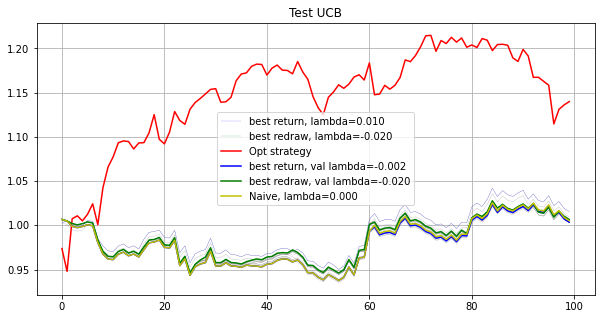

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.75054685
Mean return: 1.00070016
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


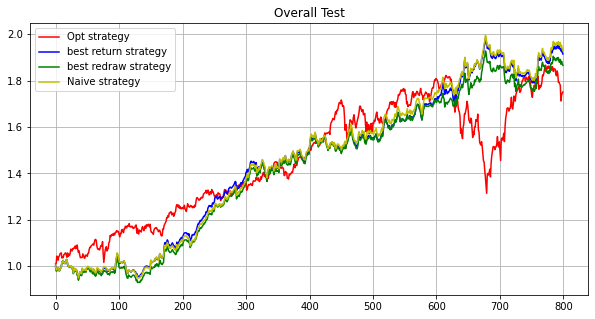

In [12]:
lb = 5
maxiter = 8000
subn = 100
path ='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
eps = 1.0005
delta = 0.008
run(path, maxiter, subn, lb, c=0.001, eps=eps, delta=delta, testv=np.arange(-0.02, 0.0100001, 0.002))

Phase 4
Validating...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
Opt strategy
[0.0102 0.0097 0.0092 0.009  0.0157 0.0115 0.0074 0.0078 0.0104 0.0126
 0.0102 0.009  0.0096 0.0082 0.0108 0.006  0.0076 0.0104 0.0051 0.0075
 0.009  0.0216 0.0093 0.003  0.0094 0.0113 0.0106 0.0064 0.009  0.0059
 0.0075 0.0117 0.0113 0.0083 0.0129 0.0092 0.008  0.0132 0.0095 0.0079
 0.0123 0.0089 0.0135 0.0045 0.0138 0.0115 0.0127 0.0062 0.0103 0.0213
 0.0118 0.009  0.0082 0.01   0.011  0.0079 0.0099 0.0088 0.0062 0.0101
 0.0087 0.0153 0.0144 0.0092 0.0078 0.0097 0.0092 0.0113 0.0087 0.0133
 0.0114 0.0099 0.0112 0.0103 0.009  0.0088 0.0081 0.0104 0.0099 0.0105
 0.009  0.0084 0.0098 0.0082 0.0091 0.0099 0.0101 0.0075 0.0107 0.0119
 0.009  0.0105 0.0117 0.0113 0.0108 0.0098 0.0121 0.0098 0.0102 0.0122]
0.18474737937371338
[ 0.0106  0.0095  0.0076  0.0025  0.0164  0.0109  0.0106  0.0097  0.0108
  0.0109  0.011   0.008   0.0089  0.0051  0.0092 -0.      0.0012  0.0096
  0.0041  0.0046  0.0174  0.022   0.0103  0.

[ 0.0092  0.0086  0.0005  0.      0.0159  0.0172  0.0067  0.0051  0.0177
  0.0053  0.0131  0.0051  0.0027  0.0017  0.0012 -0.      0.      0.0106
  0.      0.0004  0.0309  0.0132  0.0106 -0.      0.001   0.0116 -0.
  0.0166  0.0156  0.0003  0.      0.0191  0.0179  0.0204  0.0117  0.0116
 -0.      0.0173  0.0345  0.0026  0.0183  0.0111  0.0075 -0.      0.0165
  0.0116  0.0126 -0.      0.0084  0.0072  0.0243  0.0057  0.0041  0.0089
  0.0224 -0.      0.0094  0.0092  0.008   0.0157  0.012   0.0103  0.006
  0.011   0.0017  0.0191  0.0155  0.016   0.0248  0.0113  0.0188  0.0021
  0.0067  0.0116  0.0047  0.0069  0.007   0.0088  0.0075  0.0164  0.017
  0.      0.0189  0.      0.0085  0.01    0.0115  0.0004  0.0135  0.0106
  0.0065  0.015   0.0195  0.0173  0.0187  0.0085  0.0239 -0.      0.0087
  0.0168]
5.078820838243642e-05
[ 0.0092  0.0086  0.0005  0.      0.0159  0.0172  0.0067  0.0051  0.0177
  0.0053  0.0131  0.0051  0.0027  0.0017  0.0012  0.     -0.      0.0106
 -0.      0.0004  0.0309 

[ 0.0089  0.0085 -0.      0.      0.0116  0.0195  0.0046  0.0054  0.0195
  0.0044  0.0125  0.0044  0.0019  0.002   0.      0.     -0.      0.0104
 -0.      0.0002  0.0288  0.0024  0.0117  0.      0.      0.0138  0.
  0.0241  0.016   0.      0.      0.0199  0.0192  0.0236  0.0122  0.0113
  0.      0.0203  0.0387  0.0014  0.0173  0.0089  0.0107  0.      0.0225
  0.011   0.0111  0.      0.0082  0.0056  0.0253  0.0064  0.0025  0.0085
  0.0234 -0.      0.0094  0.0078  0.0066  0.0201  0.0083  0.0117  0.0072
  0.0092  0.0003  0.0185  0.0126  0.0162  0.0245  0.0109  0.0197  0.0026
  0.0072  0.0106  0.0038  0.0089  0.0055  0.0085  0.0074  0.0174  0.0154
  0.      0.0203 -0.      0.0071  0.01    0.0115  0.      0.0143  0.0093
  0.0042  0.015   0.0208  0.0173  0.0212  0.0085  0.0256 -0.      0.0084
  0.0169]
1.4554219486816017e-05
[ 0.0089  0.0085 -0.      0.      0.0116  0.0195  0.0046  0.0054  0.0195
  0.0044  0.0125  0.0044  0.0019  0.002   0.      0.     -0.      0.0104
 -0.      0.0002  0.02

[ 0.0087  0.0081  0.     -0.      0.0158  0.0209  0.0032  0.0036  0.0199
  0.0009  0.0125  0.0035  0.0013  0.0015  0.      0.      0.0022  0.0114
 -0.      0.0006  0.0284 -0.      0.0113 -0.      0.0004  0.0145  0.0018
  0.0233  0.0159  0.     -0.      0.0195  0.0195  0.0246  0.0108  0.012
  0.      0.0204  0.0386  0.0015  0.0185  0.0091  0.0111  0.0018  0.022
  0.0111  0.0103  0.      0.0088  0.0013  0.0259  0.0061  0.0027  0.0097
  0.0239  0.0003  0.0097  0.0073  0.005   0.0208  0.0066  0.0115  0.0077
  0.0089  0.0008  0.0183  0.0113  0.016   0.0254  0.0115  0.0197  0.0028
  0.0082  0.0103  0.0033  0.0091  0.006   0.0084  0.0069  0.0182  0.016
  0.      0.0209  0.      0.0067  0.0099  0.0114  0.      0.0147  0.0116
  0.0038  0.0151  0.0212  0.0163  0.0208  0.0085  0.0243 -0.      0.0077
  0.0183]
0.0002813505229383596
[ 0.0087  0.0081  0.      0.      0.0158  0.0209  0.0032  0.0036  0.0199
  0.0009  0.0125  0.0035  0.0013  0.0015 -0.     -0.      0.0022  0.0114
 -0.      0.0006  0.02

[ 0.0063  0.0061  0.     -0.      0.0019  0.0316 -0.      0.0101  0.0217
  0.      0.0122  0.0008 -0.      0.      0.0034 -0.      0.      0.0078
  0.     -0.      0.0291  0.0154  0.      0.      0.0046  0.0119  0.0025
  0.0078  0.0154  0.      0.      0.0185  0.026   0.014   0.      0.0092
  0.      0.0252  0.0352  0.      0.0214  0.0014  0.0132  0.      0.0204
  0.0069  0.0336  0.0034  0.0021  0.      0.0346  0.0085  0.      0.0052
  0.0291  0.      0.0115  0.0012  0.      0.0043  0.      0.0139  0.016
  0.0045  0.      0.033   0.0026  0.0185  0.0242  0.0115  0.0271  0.0024
  0.0141  0.0076  0.0021  0.0056  0.      0.0039  0.0055  0.0276  0.0077
  0.      0.0303 -0.      0.0137  0.0093  0.0107 -0.      0.0172  0.005
  0.      0.0161  0.025   0.0241  0.0238  0.0071  0.0346  0.0075  0.0064
  0.028 ]
0.15094441282559173
[ 0.0059  0.0051  0.      0.     -0.      0.0299  0.0016  0.0107  0.0262
  0.0024  0.0078  0.0011  0.      0.0004  0.0038 -0.     -0.      0.0118
  0.     -0.      0.028

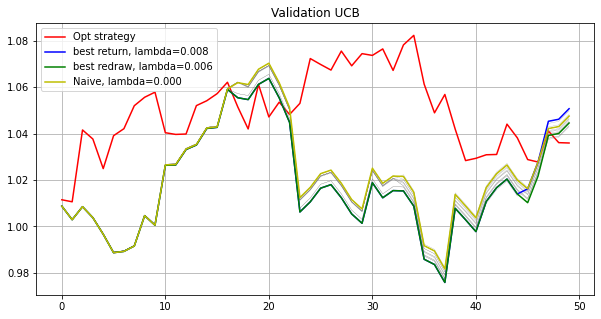

Testing...
./tmp2/res_phase04_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.01449593    Max redraw: 0.04741015
lambda: -0.018   Total log return: 0.01716019    Max redraw: 0.04741015
lambda: -0.016   Total log return: 0.02061541    Max redraw: 0.04741015
lambda: -0.014   Total log return: 0.02000184    Max redraw: 0.04741015
lambda: -0.012   Total log return: 0.01634502    Max redraw: 0.04741015
lambda: -0.010   Total log return: 0.01472589    Max redraw: 0.04741015
lambda: -0.008   Total log return: 0.01082606    Max redraw: 0.04741015
lambda: -0.006   Total log return: 0.01604362    Max redraw: 0.04741015
lambda: -0.004   Total log return: 0.02503168    Max redraw: 0.04741015
lambda: -0.002   Total log return: 0.03747112    Max redraw: 0.04741015
lambda: -0.000   Total log return: 0.03954515    Max redraw: 0.04741015
lambda: 0.002   Total log return: 0.04020998    Max redraw: 0.04741015
lambda: 0.004   Total log return: 0.03820739    Max redraw: 0.0474101

[ 0.009   0.0091  0.0004 -0.      0.0276  0.0142  0.0028 -0.      0.0092
  0.0066  0.011   0.      0.0075  0.0118  0.0106  0.0005  0.      0.0157
  0.      0.008   0.0216  0.0075  0.0019  0.      0.0098  0.0127  0.0056
  0.0256  0.011   0.0119 -0.      0.0111  0.0161  0.0195  0.0096  0.0135
  0.0034  0.0128  0.0191  0.0156  0.0203  0.0158  0.0063  0.      0.013
  0.0046  0.006   0.      0.0092  0.0049  0.0198  0.0087  0.0061  0.016
  0.02    0.0032  0.011   0.0055  0.0148  0.0179 -0.      0.0149  0.0092
  0.0051  0.0039  0.0136  0.0133  0.0077  0.0265  0.0084  0.016   0.007
  0.0078  0.0085  0.0062  0.0091  0.0156  0.0082  0.0083  0.0205  0.0094
  0.0046  0.017   0.0001  0.0106  0.0103  0.0097  0.0004  0.01    0.0178
  0.0073  0.0152  0.0169  0.0147  0.0158  0.0096  0.0209  0.      0.0093
  0.0155]
0.12456827532386283
[ 0.0083  0.0087  0.      0.      0.0286  0.0167  0.0049 -0.      0.0084
  0.0047  0.0111  0.001   0.0068  0.0133  0.0105 -0.      0.      0.0193
  0.0001  0.0052  0.0139

[ 0.0079  0.0083  0.      0.      0.0106  0.0216  0.      0.0007  0.007
  0.0034  0.0117  0.0006  0.0047  0.0083  0.0093 -0.      0.0024  0.0257
  0.      0.      0.019  -0.     -0.      0.0002  0.0199  0.0139  0.0045
  0.0341  0.0115  0.0014 -0.      0.0169  0.0202  0.0125  0.0066  0.0117
 -0.      0.0173  0.0259  0.0132  0.0227  0.0116  0.0065  0.0078  0.0059
  0.0064  0.0075  0.0014  0.0062 -0.      0.0262  0.0089  0.      0.0155
  0.0265  0.0056  0.0107  0.0027  0.0072  0.0208  0.0023  0.024   0.005
  0.0054  0.0019  0.0091  0.0097  0.0062  0.0312  0.0127  0.0204  0.0037
  0.0075  0.0098  0.0023  0.0108  0.0136  0.0083  0.0057  0.0229  0.0061
  0.      0.0218  0.      0.0117  0.0101  0.0085  0.      0.012   0.0243
  0.0024  0.0166  0.0216  0.0186  0.0163  0.0081  0.0272 -0.      0.0083
  0.0227]
0.0007122455469383345
[ 0.0079  0.0083  0.     -0.      0.0106  0.0216  0.      0.0007  0.007
  0.0034  0.0117  0.0006  0.0047  0.0083  0.0093 -0.      0.0025  0.0257
  0.      0.      0.01

[ 0.0078  0.0068  0.     -0.      0.0063  0.0188  0.008   0.0117  0.0108
 -0.      0.0068  0.      0.0023  0.0027  0.0025 -0.      0.      0.0282
 -0.     -0.      0.016   0.      0.      0.      0.0151  0.018   0.0053
  0.0276  0.0045  0.0035  0.0059  0.0246  0.0246  0.0142  0.0101  0.0097
  0.      0.0107  0.0206  0.0132  0.0256  0.0089  0.0072  0.      0.0091
  0.0067  0.0059 -0.      0.0014 -0.      0.032   0.0159 -0.      0.0119
  0.033  -0.      0.01    0.0003  0.0038  0.0146  0.      0.0118  0.0101
  0.      0.      0.0108  0.0151  0.0093  0.0266  0.0228  0.0259  0.
  0.0044  0.0092 -0.      0.0102  0.0121  0.0033  0.0044  0.0221  0.005
 -0.      0.027   0.      0.0093  0.0101  0.0074  0.      0.0146  0.0426
  0.0034  0.0211  0.0254  0.0183  0.0111  0.0075  0.04    0.      0.0092
  0.0275]
0.00023436304216981822
[ 0.0076  0.0065  0.      0.0001  0.0071  0.0193  0.0083  0.0121  0.0113
  0.0013  0.0068 -0.      0.0019  0.0021  0.0017  0.      0.      0.0277
  0.      0.      0.016

[ 0.0072  0.0064 -0.      0.0011  0.0062  0.0183  0.0014  0.0095  0.0134
  0.      0.0071  0.      0.0012  0.003   0.      0.      0.      0.0275
  0.      0.      0.0154  0.0075  0.      0.      0.016   0.0185  0.0044
  0.0216  0.0048  0.      0.0029  0.0339  0.0262  0.019   0.0031  0.0091
  0.0024  0.0094  0.0227  0.0103  0.0264  0.0096  0.0074  0.      0.002
  0.0063  0.0051  0.      0.0018  0.0016  0.0349  0.0154  0.      0.0123
  0.0338  0.      0.01    0.      0.0035  0.014   0.      0.0155  0.0083
 -0.      0.      0.0122  0.0099  0.0075  0.0315  0.025   0.0267  0.
  0.0026  0.0086 -0.      0.0116  0.0177  0.003   0.0039  0.0236  0.0049
  0.      0.0297  0.0005  0.0084  0.0101  0.0078  0.      0.0136  0.0393
  0.0031  0.0218  0.027   0.0189  0.0099  0.0062  0.0407  0.      0.0091
  0.0279]
1.207395383959125e-05
[ 0.0072  0.0064 -0.      0.0011  0.0062  0.0183  0.0014  0.0095  0.0134
  0.      0.0071  0.      0.0012  0.003   0.      0.      0.      0.0275
  0.      0.      0.0154

[ 0.0066  0.0061  0.      0.0046  0.0007  0.0194  0.0016  0.0107  0.0116
  0.      0.0074  0.     -0.      0.0019  0.      0.     -0.      0.0291
 -0.     -0.      0.0177  0.0119  0.001  -0.      0.0153  0.0154  0.0013
  0.022   0.0046  0.0029 -0.      0.0381  0.0273  0.0163  0.0002  0.0086
  0.0001  0.0084  0.0211  0.0104  0.0249  0.0077  0.007   0.      0.0025
  0.0054  0.006   0.0002  0.0002  0.      0.0362  0.0143 -0.      0.011
  0.0366 -0.      0.01    0.      0.0043  0.0127  0.      0.0174  0.0098
 -0.     -0.      0.012   0.0151  0.0085  0.033   0.0263  0.0279  0.
  0.0022  0.0085  0.      0.0114  0.0204  0.0036  0.0033  0.0249  0.004
 -0.      0.0292  0.      0.0108  0.0099  0.0073 -0.      0.0138  0.0339
  0.003   0.0221  0.0278  0.0187  0.008   0.0061  0.0419  0.0005  0.0093
  0.0284]
3.4607520877909146e-05
[ 0.0058  0.0055  0.      0.     -0.      0.023  -0.      0.0115  0.01
 -0.      0.0079 -0.     -0.      0.0023  0.      0.0002 -0.      0.033
 -0.     -0.      0.0183  0

[ 0.0058  0.0049 -0.      0.0002  0.      0.0238  0.0061  0.0115  0.0105
  0.0002  0.008  -0.      0.      0.0001  0.      0.0002 -0.      0.035
 -0.     -0.      0.0223  0.0045  0.0072 -0.      0.0121  0.018   0.0032
  0.0188  0.0057 -0.      0.      0.0347  0.0298  0.0083  0.      0.0062
  0.      0.0134  0.0245  0.0047  0.0278  0.0052  0.0081  0.0006  0.0011
  0.0034  0.0106  0.0065  0.0009  0.0057  0.0407  0.0101  0.      0.0127
  0.038  -0.      0.009   0.0026 -0.      0.0058  0.      0.02    0.0124
 -0.      0.      0.0124  0.0123  0.0062  0.0328  0.0273  0.0308  0.
  0.0053  0.0056  0.      0.0083  0.0223  0.0014  0.001   0.0216  0.0025
  0.      0.0297  0.      0.0125  0.0092  0.005  -0.      0.0163  0.0266
 -0.      0.0229  0.0304  0.0193  0.008   0.004   0.0446  0.      0.0079
  0.0325]
5.806195593804561e-05
[ 0.0058  0.0049 -0.      0.0002  0.      0.0238  0.0061  0.0115  0.0105
  0.0002  0.008   0.      0.      0.0001  0.      0.0002 -0.      0.035
  0.      0.      0.0223 

[ 0.0058  0.0049 -0.      0.0003 -0.      0.0238  0.0061  0.0115  0.0106
  0.0002  0.008   0.      0.      0.0001  0.      0.0002  0.      0.035
  0.      0.      0.0223  0.0045  0.0072  0.      0.0121  0.018   0.0032
  0.0188  0.0057 -0.      0.      0.0347  0.0298  0.0083  0.0001  0.0062
  0.      0.0134  0.0245  0.0047  0.0278  0.0052  0.0081  0.0005  0.0011
  0.0034  0.0106  0.0065  0.0009  0.0057  0.0406  0.0101  0.      0.0127
  0.038   0.      0.009   0.0026  0.      0.0058 -0.      0.02    0.0124
 -0.      0.      0.0124  0.0123  0.0062  0.0328  0.0273  0.0308  0.
  0.0053  0.0056  0.      0.0083  0.0223  0.0014  0.001   0.0216  0.0025
  0.      0.0297 -0.      0.0125  0.0092  0.005  -0.      0.0163  0.0266
  0.      0.0229  0.0304  0.0193  0.008   0.004   0.0446  0.      0.0079
  0.0325]
8.771812862379238e-05
[ 0.0058  0.0049 -0.      0.0003 -0.      0.0238  0.0061  0.0115  0.0106
  0.0002  0.008   0.      0.      0.0001  0.      0.0002  0.      0.035
  0.      0.      0.0223 

[ 0.0058  0.004  -0.     -0.      0.0011  0.0236  0.0004  0.0073  0.0115
 -0.      0.008  -0.     -0.     -0.     -0.     -0.     -0.      0.0352
 -0.      0.0006  0.0291  0.0114  0.0057 -0.      0.0105  0.0192  0.0007
  0.0164  0.0024  0.      0.      0.0277  0.0314  0.0071  0.      0.0065
  0.      0.0132  0.0233  0.0032  0.0295  0.0051  0.0056  0.      0.0025
  0.003   0.0068  0.0071  0.0006  0.0052  0.0439  0.0088 -0.      0.0133
  0.0408  0.0007  0.0089  0.0017  0.      0.004   0.      0.0227  0.0132
 -0.      0.      0.0127  0.0116  0.0052  0.0389  0.0249  0.0319  0.0001
  0.0079  0.0061  0.0003  0.0081  0.0205  0.0004  0.0006  0.0241  0.0034
  0.      0.0319 -0.      0.011   0.0088  0.0042 -0.      0.0179  0.0289
  0.      0.0238  0.0322  0.0181  0.0064  0.0033  0.0477  0.      0.0066
  0.0337]
4.506083343828658e-05
[ 0.0056  0.0037  0.      0.      0.0046  0.0243  0.      0.0074  0.0104
  0.0009  0.0076  0.     -0.     -0.     -0.      0.      0.0012  0.0351
 -0.      0.      0

[ 0.0051  0.0022  0.     -0.      0.      0.0321  0.0074  0.0104  0.0071
  0.0028  0.0066 -0.     -0.     -0.     -0.     -0.      0.      0.0388
 -0.     -0.      0.0334  0.0127  0.0075  0.      0.0134  0.023   0.0014
  0.0139 -0.      0.      0.0003  0.015   0.0354  0.0072 -0.      0.0071
 -0.      0.0034  0.0218  0.0003  0.0288  0.      0.0025  0.0006  0.0111
  0.0008  0.0042  0.0036 -0.      0.0128  0.0492  0.0057 -0.      0.0041
  0.0431 -0.      0.0073 -0.     -0.     -0.      0.      0.0161  0.0153
  0.0011  0.0004  0.0121  0.0054  0.0086  0.0333  0.0304  0.0367 -0.
  0.0018  0.0053  0.      0.0061  0.0265 -0.      0.      0.0269  0.0028
  0.      0.0337  0.      0.0076  0.0082  0.001   0.0014  0.0217  0.0257
 -0.      0.0254  0.0362  0.0231  0.0049  0.0012  0.0564  0.0019  0.0035
  0.0368]
0.0001480597602975593
[ 0.0051  0.0022  0.     -0.     -0.      0.0321  0.0074  0.0104  0.0071
  0.0028  0.0066 -0.     -0.     -0.     -0.     -0.      0.      0.0388
 -0.     -0.      0.033

[ 0.005  -0.     -0.     -0.     -0.      0.0297  0.0015  0.0037  0.0109
  0.0017  0.0058  0.     -0.     -0.     -0.     -0.      0.0038  0.0427
 -0.      0.0062  0.037   0.0051  0.0054  0.      0.0143  0.0225  0.0053
  0.0132 -0.     -0.      0.      0.0185  0.0382  0.0103  0.      0.0065
 -0.      0.0084  0.024   0.      0.029   0.      0.0022 -0.      0.0027
  0.0007  0.0014 -0.      0.0008  0.      0.053   0.0047  0.      0.0045
  0.046  -0.      0.0077  0.0026  0.0008  0.0075  0.      0.0144  0.0124
  0.0002  0.      0.0098  0.007   0.0072  0.0311  0.0274  0.0395  0.
  0.002   0.0065  0.      0.0084  0.0237  0.005  -0.      0.0302  0.0023
  0.      0.0364 -0.      0.0039  0.0077  0.0001  0.0028  0.0245  0.0204
  0.      0.0259  0.039   0.0231  0.0044 -0.      0.0604  0.0001  0.0024
  0.0385]
0.00035671091710967866
Opt strategy   Total log return: 0.12609334    Max redraw: 0.04741015
Total return: 1.13438804
Mean return: 1.00126173
best return val lambda: 0.002   Total log return:

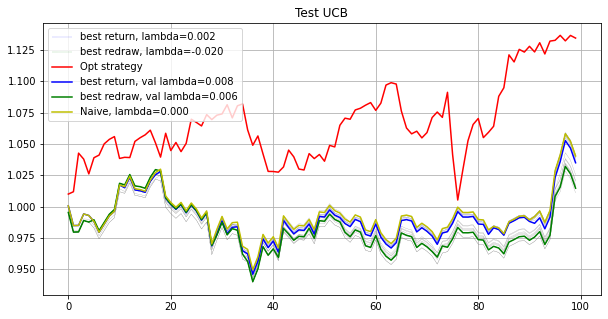

Phase 5
Validating...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
Opt strategy
[ 0.0029  0.0115  0.0164  0.      0.0094  0.0103  0.009   0.014  -0.
  0.0091  0.0029  0.0076  0.0064  0.0117  0.0129  0.0179  0.012   0.0108
  0.0135  0.0047  0.0152  0.0128  0.0104  0.0143  0.0166  0.0112  0.006
  0.0121  0.0071  0.      0.0035  0.0149  0.0087  0.0063  0.0087  0.0046
  0.0062  0.0064  0.0166  0.0063  0.0083  0.0074  0.0122  0.0085  0.0081
  0.009   0.0107  0.      0.0111  0.0123  0.011   0.0081  0.0204  0.014
  0.0068  0.0042  0.0069  0.0169  0.0023  0.0097  0.0125  0.0115  0.005
  0.0131  0.018   0.0123  0.0081  0.0077  0.0161  0.0122  0.0097  0.0142
  0.0171  0.0047  0.009   0.0097  0.011   0.0138  0.0135  0.0034  0.0156
  0.0124  0.0118  0.0084  0.0118  0.0114  0.0054  0.0086  0.0104  0.0087
  0.0062  0.0173  0.0128  0.0053  0.0076  0.0113  0.0125  0.0121  0.0122
  0.0164]
0.35499129318324135
[ 0.      0.012   0.0236  0.      0.0086  0.0058  0.0086  0.012   0.
  0.0084 -0.      0.0066  

[-0.      0.0177  0.0115  0.0087 -0.      0.0075 -0.      0.0234 -0.
 -0.      0.      0.      0.0025  0.      0.0073  0.0167  0.      0.002
  0.022   0.      0.01    0.0303  0.0105  0.      0.0257  0.0075 -0.
  0.0137 -0.     -0.     -0.      0.0215  0.0043  0.      0.01    0.
  0.      0.      0.0255  0.      0.0308  0.0116  0.0141  0.0164  0.0009
 -0.      0.0002  0.0087  0.0088  0.      0.0042 -0.      0.0457  0.0352
  0.     -0.      0.      0.0218  0.0085  0.0011  0.0103  0.0147  0.0005
  0.0023  0.0296  0.0035  0.0001  0.0028  0.0403 -0.      0.0085  0.0386
  0.0288  0.      0.      0.008   0.0149  0.0295  0.0275 -0.      0.02
  0.0155  0.0226  0.0249  0.031   0.0163  0.0009  0.0153  0.      0.
  0.      0.0107  0.0244  0.0107  0.0014 -0.      0.0148  0.0219  0.0231
  0.    ]
0.14104540037408217
[-0.      0.0177  0.0115  0.0087 -0.      0.0075 -0.      0.0234 -0.
 -0.     -0.      0.      0.0025  0.      0.0073  0.0167  0.      0.002
  0.022  -0.      0.01    0.0303  0.0105  0. 

[ 0.0043  0.017   0.0192  0.0041 -0.      0.0037  0.      0.0225  0.0053
  0.      0.     -0.      0.0025 -0.      0.0101  0.0216 -0.      0.0006
  0.0213  0.      0.0105  0.0329  0.0104  0.0015  0.0198  0.002   0.01
  0.002   0.      0.      0.      0.0027  0.0145  0.0059  0.0104  0.0004
  0.      0.      0.0183  0.0035  0.0274  0.0159  0.0123  0.0135  0.
  0.0002  0.      0.0067  0.0043  0.0028  0.0005  0.      0.0345  0.0413
  0.0003 -0.      0.      0.025  -0.      0.0003  0.0084  0.0161  0.0006
  0.0049  0.0387  0.     -0.      0.0145  0.0458  0.004   0.0068  0.0307
  0.0207 -0.     -0.      0.0036  0.0165  0.031   0.0296  0.0003  0.0222
  0.0148  0.0251  0.026   0.0383  0.017   0.0031  0.0137 -0.     -0.
  0.      0.0058  0.027   0.0138  0.0003  0.0004  0.0095  0.0232  0.0254
  0.0001]
1.3526501794919868e-05
[ 0.0044  0.0171  0.0195  0.0038  0.      0.0038 -0.      0.0221  0.0054
 -0.     -0.      0.      0.0022 -0.      0.0104  0.0226 -0.      0.0011
  0.0211 -0.      0.0102  0.

[ 0.0057  0.0178  0.0209  0.006  -0.     -0.     -0.      0.021   0.0024
 -0.     -0.     -0.      0.001  -0.     -0.      0.0106 -0.      0.004
  0.0114 -0.      0.0115  0.0346  0.0111  0.0079  0.0127  0.      0.0053
  0.0009 -0.      0.      0.0049  0.0173  0.0016  0.006   0.0062 -0.
 -0.     -0.      0.0175  0.0025  0.0336  0.0078  0.0147  0.0141  0.
  0.0055  0.0065  0.003   0.0048  0.0015 -0.     -0.      0.0491  0.036
  0.      0.     -0.      0.0125 -0.      0.0055  0.0041  0.018   0.001
  0.0107  0.0388 -0.      0.0001  0.0129  0.0518  0.      0.0065  0.0392
  0.0231 -0.     -0.      0.0029  0.0198  0.0392  0.0357  0.0035  0.0126
  0.017   0.0262  0.0288  0.0384  0.0188  0.0035  0.0167  0.      0.
 -0.     -0.      0.0307  0.0077  0.     -0.     -0.      0.0272  0.0267
  0.0032]
0.15329362796329934
[ 0.0057  0.0178  0.0209  0.006  -0.     -0.     -0.      0.021   0.0024
 -0.     -0.     -0.      0.001  -0.     -0.      0.0106 -0.      0.004
  0.0114 -0.      0.0115  0.0346  0.0

[ 0.001   0.0168  0.0218  0.0125  0.0001  0.0089  0.0005  0.0215  0.0045
 -0.     -0.      0.      0.     -0.      0.0168  0.0192  0.      0.
  0.0038  0.      0.0213  0.0381  0.0128  0.0118  0.0095  0.0004  0.004
  0.0129  0.      0.      0.      0.0002  0.0049  0.0052 -0.      0.0042
 -0.     -0.      0.0206 -0.      0.0121  0.0046  0.0119  0.0048  0.0015
  0.0097 -0.      0.0001  0.0127 -0.      0.      0.      0.0165  0.0376
 -0.     -0.      0.0012  0.0008  0.0063  0.0017  0.0094  0.0249  0.
  0.0054  0.0422 -0.     -0.      0.0076  0.056   0.0049  0.0029  0.0438
  0.0187  0.001   0.      0.0001  0.0269  0.0359  0.0418 -0.      0.007
  0.0217  0.0335  0.0336  0.0495  0.0175  0.0016  0.0197 -0.     -0.
  0.     -0.      0.0345  0.0055  0.0023 -0.      0.0012  0.0286  0.024
  0.0036]
0.0002385666947294124
[ 0.      0.0171  0.0147  0.0128 -0.      0.0098 -0.      0.0208  0.
  0.      0.      0.      0.0015  0.      0.0155  0.0179  0.     -0.
  0.0019  0.      0.0217  0.0392  0.0125  

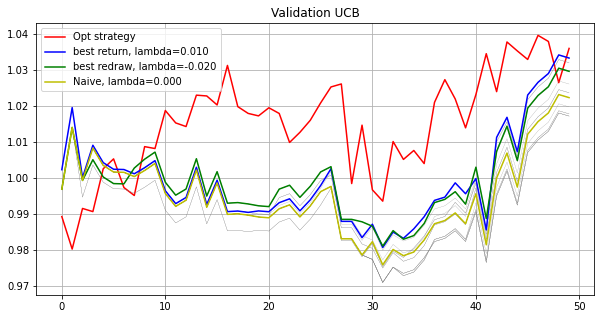

Testing...
./tmp2/res_phase05_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09457053    Max redraw: 0.05127117
lambda: -0.018   Total log return: 0.09657663    Max redraw: 0.05127117
lambda: -0.016   Total log return: 0.07670235    Max redraw: 0.05127117
lambda: -0.014   Total log return: 0.06304404    Max redraw: 0.05127117
lambda: -0.012   Total log return: 0.06297960    Max redraw: 0.05127117
lambda: -0.010   Total log return: 0.07044942    Max redraw: 0.05127117
lambda: -0.008   Total log return: 0.07622245    Max redraw: 0.05127117
lambda: -0.006   Total log return: 0.07791816    Max redraw: 0.05127117
lambda: -0.004   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.002   Total log return: 0.07111208    Max redraw: 0.05129385
lambda: -0.000   Total log return: 0.06776157    Max redraw: 0.05129385
lambda: 0.002   Total log return: 0.07697366    Max redraw: 0.05129385
lambda: 0.004   Total log return: 0.07856000    Max redraw: 0.0497349

[ 0.0009  0.0176 -0.      0.0142  0.0001 -0.     -0.      0.0184  0.0163
  0.      0.     -0.      0.0209  0.0075  0.0142  0.0064  0.0012  0.0267
 -0.      0.0033  0.0048  0.0271  0.009   0.0294  0.0027  0.0007  0.002
 -0.     -0.     -0.      0.0056 -0.      0.0065 -0.      0.0257  0.01
 -0.      0.0053  0.0042  0.      0.0164  0.0164  0.0062  0.0174 -0.
  0.      0.      0.009   0.0196  0.      0.0186  0.0055  0.036   0.0398
  0.0123 -0.      0.      0.0117  0.0066  0.0026  0.0088  0.0276 -0.
 -0.      0.0347  0.0145 -0.      0.0158  0.0308  0.      0.0017  0.0201
  0.0088  0.0078 -0.      0.0028  0.0127  0.0179  0.0205  0.021   0.0154
  0.0161  0.0222  0.0215  0.0353  0.0228  0.0007  0.0127  0.      0.0033
  0.0063  0.0135  0.021   0.0036  0.0047 -0.      0.0157  0.0189  0.0223
 -0.    ]
0.3654681898678993
[ 0.0009  0.0178 -0.      0.013  -0.      0.0009  0.      0.018   0.0129
  0.     -0.     -0.      0.0216  0.0075  0.0166  0.0076 -0.      0.0272
  0.      0.0021  0.0041  0.0283 

[ 0.0034  0.0175  0.      0.0244 -0.      0.0021  0.0006  0.0172  0.
  0.     -0.     -0.      0.0197  0.0007  0.0261  0.0021 -0.      0.025
  0.004  -0.      0.0078  0.0251  0.0093  0.0228  0.0048  0.      0.0024
  0.0036 -0.      0.0038  0.      0.0094  0.0053  0.      0.0217  0.0101
  0.      0.0016  0.0057 -0.      0.03    0.0238  0.0059  0.0225  0.
  0.0031  0.      0.0119  0.0117  0.      0.0137  0.0002  0.0328  0.0359
  0.0162 -0.      0.001   0.0186  0.0115  0.      0.0105  0.0298  0.0015
  0.0011  0.0378  0.0096 -0.      0.0249  0.0359 -0.      0.0005  0.0162
  0.0038 -0.     -0.      0.      0.0134  0.0117  0.0249  0.0102  0.0134
  0.017   0.0176  0.0296  0.042   0.0232  0.001   0.0171 -0.     -0.
  0.0022  0.0041  0.0232 -0.      0.0023  0.0017  0.0131  0.0212  0.023
  0.0018]
0.00026735387241697375
[ 0.0034  0.0175  0.      0.0244 -0.      0.0021  0.0006  0.0172  0.
  0.     -0.     -0.      0.0197  0.0007  0.0261  0.0021 -0.      0.025
  0.004  -0.      0.0078  0.0251  0.0

[ 0.      0.0184  0.001   0.0094 -0.     -0.     -0.      0.0214  0.003
 -0.     -0.      0.      0.0191 -0.      0.0144  0.0048  0.0017  0.0086
  0.0105  0.      0.0119  0.0254  0.0087  0.0236  0.0051  0.      0.0108
  0.0019 -0.      0.0031  0.      0.0155  0.      0.0024  0.019   0.0095
  0.      0.0027  0.0087  0.0095  0.0265  0.0058  0.0051  0.0136 -0.
  0.0046 -0.      0.006   0.0155  0.      0.0125  0.      0.0361  0.0443
  0.0176  0.      0.0004  0.0157  0.004   0.002   0.0115  0.0307  0.0013
  0.0019  0.0455  0.008   0.      0.0241  0.0417  0.0028 -0.      0.0225
 -0.      0.0062 -0.      0.0009  0.0144  0.0156  0.0273  0.0063  0.0102
  0.0163  0.0206  0.0304  0.0447  0.0259  0.      0.0192  0.      0.
  0.0064  0.0055  0.0251 -0.      0.0001 -0.      0.0057  0.0224  0.0242
  0.0027]
0.16060039055056288
[ 0.      0.0184  0.001   0.0094 -0.      0.      0.      0.0215  0.003
  0.      0.      0.      0.0191  0.      0.0144  0.0048  0.0017  0.0086
  0.0105  0.      0.0119  0.025

[-0.      0.0185  0.0041  0.0146 -0.      0.0016 -0.      0.0196 -0.
 -0.     -0.     -0.      0.0188  0.0004  0.0134  0.008   0.011   0.0032
  0.0091  0.0002  0.0109  0.0237  0.0081  0.0241  0.0082  0.0002  0.0091
  0.0023 -0.      0.0028 -0.      0.0165  0.0061 -0.      0.0201  0.0065
 -0.      0.0008  0.0094  0.0058  0.0275  0.0069  0.0053  0.0138  0.0002
  0.0037  0.      0.0039  0.0144 -0.      0.0115  0.      0.0329  0.0448
  0.0159 -0.      0.      0.0143  0.0031  0.0002  0.0115  0.0301 -0.
  0.0018  0.0469  0.0057 -0.      0.0203  0.0439  0.0072 -0.      0.0263
  0.004   0.005  -0.      0.      0.0145  0.0151  0.0285  0.0048  0.0083
  0.0164  0.0228  0.0314  0.0475  0.0268 -0.      0.0218  0.     -0.
  0.0075  0.0014  0.0262 -0.      0.0002  0.      0.0014  0.023   0.024
  0.0005]
2.882183332858506e-05
[ 0.      0.0181 -0.      0.0099  0.      0.      0.      0.0127  0.
  0.      0.      0.      0.0156  0.0043  0.0187  0.      0.      0.
  0.0131  0.      0.0224  0.0262  0.0101

[ 0.0067  0.0178  0.0037  0.0118 -0.      0.0009  0.      0.0122  0.0047
 -0.      0.      0.      0.0092  0.      0.0121  0.      0.      0.0049
  0.0149  0.      0.0192  0.0201  0.0103  0.0264  0.0072  0.      0.0107
  0.0115  0.0007  0.      0.      0.0314  0.0029 -0.      0.0137  0.0112
  0.      0.0024  0.0212  0.0048  0.0334  0.0068  0.0057  0.0096  0.
  0.001   0.0005  0.      0.0085 -0.      0.0089  0.0009  0.0238  0.0459
  0.0168  0.      0.      0.0062 -0.      0.      0.0073  0.0319  0.
  0.      0.0424  0.0058  0.      0.025   0.0517  0.      0.0014  0.03
  0.0014  0.0082  0.      0.      0.0147  0.0128  0.0332  0.      0.002
  0.0162  0.0258  0.0319  0.0575  0.0299  0.0011  0.019   0.      0.
  0.0117  0.      0.0296  0.     -0.      0.      0.      0.0238  0.023
  0.0021]
0.00019546833047015473
[ 0.0067  0.0178  0.0037  0.0118  0.      0.0009  0.      0.0122  0.0047
  0.      0.      0.      0.0092  0.      0.0121  0.      0.      0.0049
  0.0149 -0.      0.0192  0.0201  

[ 0.      0.0181  0.0029  0.0026  0.0013  0.0101  0.      0.0067  0.0015
  0.     -0.     -0.      0.0046  0.      0.0118  0.      0.      0.0053
  0.0082 -0.      0.0274  0.      0.0112  0.0214  0.0101  0.0184  0.0028
  0.      0.      0.     -0.      0.0453  0.0077  0.0093  0.0236  0.0052
  0.      0.0023  0.0178  0.      0.0086  0.0077  0.0096  0.0033  0.
  0.0016  0.      0.0108  0.0011  0.      0.009   0.0056  0.0424  0.0474
  0.0068  0.     -0.      0.      0.      0.0041  0.0052  0.0326  0.0061
  0.003   0.0451  0.0128  0.      0.0276  0.0604  0.      0.0032  0.0162
 -0.      0.0031  0.      0.      0.0128  0.0108  0.0387  0.      0.0008
  0.0163  0.0142  0.0316  0.06    0.0298  0.0086  0.0159  0.     -0.
  0.0143 -0.      0.0344  0.0002 -0.     -0.     -0.      0.0294  0.0258
  0.0077]
1.2806960081816388e-05
[ 0.      0.0181  0.0029  0.0026  0.0013  0.0101  0.      0.0067  0.0015
  0.      0.      0.      0.0046  0.      0.0118  0.      0.      0.0053
  0.0082  0.      0.0274  

[-0.      0.0178  0.0034  0.0061  0.0008  0.0096  0.      0.0057  0.01
  0.0002 -0.     -0.      0.0051  0.0012  0.0085  0.0008 -0.      0.0047
  0.0103  0.      0.027   0.0031  0.0115  0.026   0.0108  0.018   0.0017
  0.0018  0.     -0.      0.      0.0427  0.0009  0.0091  0.0216  0.0063
  0.0015  0.      0.017   0.      0.0072  0.0023  0.0096  0.0028  0.
  0.      0.0003  0.0083  0.0001  0.      0.0084  0.0047  0.0434  0.0465
  0.0043  0.      0.      0.      0.0029  0.0047  0.0054  0.0309  0.0035
  0.0026  0.0478  0.0107  0.0001  0.0277  0.0609  0.      0.0032  0.0133
  0.0027  0.0033 -0.      0.      0.0134  0.0126  0.0386 -0.      0.
  0.016   0.0175  0.0304  0.0622  0.0294  0.0081  0.0159  0.0001  0.
  0.0172  0.0023  0.035   0.      0.     -0.     -0.      0.0301  0.0251
  0.0054]
0.0002778570688712291
[-0.      0.0173  0.0124  0.0089  0.      0.0123  0.0001  0.0072 -0.
  0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.0091 -0.      0.0294  0.0084  0.0113 

[ 0.0003  0.0174  0.0106  0.0035 -0.      0.0101  0.      0.0062  0.
  0.      0.     -0.      0.0006 -0.      0.     -0.      0.      0.
  0.0102  0.0018  0.0303  0.0105  0.01    0.0286  0.0095  0.012   0.009
  0.      0.      0.      0.      0.0212  0.      0.0075  0.0235  0.0006
  0.      0.      0.0156  0.0095  0.0176  0.0036  0.0095  0.0024  0.0031
  0.0137  0.0013  0.0146  0.0027  0.0018  0.0154  0.      0.0461  0.0467
  0.0001  0.     -0.      0.0049  0.0002  0.0089  0.0076  0.0307  0.
  0.0043  0.0523  0.0059  0.      0.0184  0.0624 -0.      0.0017  0.0111
  0.0025  0.0012  0.      0.001   0.0158  0.0118  0.0394  0.0083 -0.
  0.0163  0.0103  0.0285  0.0605  0.0295  0.0097  0.0106 -0.     -0.
  0.0102  0.0025  0.0368  0.0024  0.0001 -0.     -0.      0.0309  0.0261
  0.0107]
4.174299893165971e-05
[ 0.0002  0.0174  0.0106  0.0035 -0.      0.0101  0.      0.0062  0.
  0.      0.     -0.      0.0006  0.      0.      0.      0.      0.
  0.0102  0.0018  0.0303  0.0105  0.01    0.0286

[ 0.      0.0175  0.0028  0.0034 -0.      0.0008  0.      0.0094  0.0075
 -0.     -0.      0.     -0.      0.0003  0.      0.0072  0.     -0.
  0.0055  0.      0.0299  0.016   0.0095  0.0224  0.0026  0.0071  0.0078
  0.0076 -0.      0.0044  0.      0.0239  0.0002  0.0026  0.0176  0.008
  0.      0.      0.0124  0.0183  0.0127  0.007   0.0084  0.0021 -0.
  0.0074  0.0022  0.0039  0.0016 -0.      0.0142 -0.      0.0485  0.043
 -0.     -0.     -0.      0.008   0.002   0.0134  0.0053  0.0337 -0.
  0.0051  0.0548  0.0005  0.0049  0.0188  0.0663 -0.     -0.      0.0018
  0.001   0.0022  0.      0.      0.014   0.0174  0.0425  0.0055  0.
  0.0146  0.0157  0.0278  0.0645  0.0279  0.0086  0.0149 -0.     -0.
  0.0081  0.005   0.0384  0.0001 -0.      0.      0.0132  0.0326  0.0248
  0.011 ]
5.383800887215058e-05
[ 0.      0.0175  0.0028  0.0034  0.      0.0008  0.      0.0094  0.0075
  0.      0.      0.      0.      0.0003  0.      0.0072  0.      0.
  0.0055  0.      0.0299  0.016   0.0095  0.0

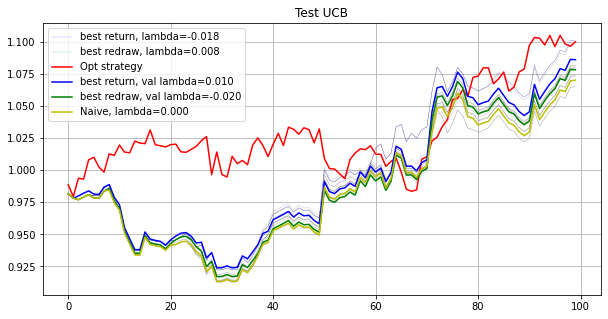

Phase 6
Validating...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
Opt strategy
[-0.      0.0082  0.0093  0.0155  0.0154  0.0068  0.0105  0.0049  0.0026
 -0.      0.0115  0.0125  0.0185 -0.      0.0024  0.0044  0.0124  0.0119
  0.      0.0425  0.0245  0.0009  0.     -0.      0.0067  0.0132  0.0076
  0.0098  0.0084  0.0191  0.0014 -0.      0.0054  0.0148  0.0143  0.0194
 -0.      0.0163  0.0155  0.0007  0.0025  0.009   0.0086  0.0194  0.013
  0.0045  0.0239 -0.     -0.      0.0074 -0.      0.0135  0.01    0.0194
  0.0097  0.      0.0068  0.0035  0.0089  0.0103 -0.      0.0176  0.0203
  0.0164  0.0178  0.0212  0.0082  0.015   0.006   0.0081  0.006   0.0119
  0.0095 -0.      0.0085  0.0089  0.0044  0.0208  0.0138  0.0154  0.0129
  0.0063  0.0046  0.      0.0129  0.0129  0.0128  0.012   0.0073  0.0082
  0.0124  0.0181  0.0063  0.0145  0.0137  0.0091  0.0149  0.0176  0.019
  0.0173]
0.5762594365478079
[0.     0.0082 0.0093 0.0155 0.0154 0.0068 0.0105 0.0049 0.0026 0.
 0.0115 0.0125 0.0185 0.

[-0.      0.0004  0.0002  0.0242  0.0137  0.0012  0.0051  0.      0.
 -0.      0.0147  0.0059  0.0253  0.      0.0061  0.0003  0.0111  0.0103
  0.0029  0.0295  0.0584  0.0032 -0.      0.0068  0.      0.017   0.
  0.0053  0.      0.0352  0.      0.0001  0.      0.0009  0.002   0.0026
  0.0139  0.0217  0.0175  0.0011  0.0007  0.0106  0.0011  0.0305  0.0198
  0.      0.0303  0.      0.      0.      0.      0.0082  0.0241  0.039
  0.      0.007   0.      0.     -0.      0.0011  0.      0.028   0.0307
  0.0079  0.0111  0.0263  0.004   0.0172  0.0002  0.      0.      0.0007
 -0.      0.      0.0029  0.0057  0.0072  0.0397  0.0222  0.0126  0.0241
  0.0003  0.0061  0.     -0.      0.0184  0.0048  0.0136  0.0084  0.0078
  0.0096  0.0208  0.0184  0.0186  0.0152  0.0106  0.0202  0.0257  0.0303
  0.0215]
0.08989176400171274
[-0.      0.0004  0.0002  0.0242  0.0137  0.0012  0.0051  0.      0.
 -0.      0.0147  0.0059  0.0253  0.      0.0061  0.0003  0.0111  0.0103
  0.0029  0.0295  0.0584  0.0032  

[ 0.      0.      0.0005  0.0214  0.0152  0.0023  0.0051  0.      0.
  0.      0.0158  0.002   0.0258  0.      0.019   0.0066  0.0065  0.0089
  0.017   0.0269  0.0628  0.0011  0.      0.0029  0.0002  0.0271  0.
  0.      0.      0.0307  0.      0.0068  0.      0.0005  0.      0.0021
  0.01    0.0191  0.0187  0.0035  0.0001  0.0094  0.      0.0311  0.0155
  0.0012  0.0306 -0.      0.      0.      0.0019  0.0041  0.0249  0.0361
  0.      0.0052  0.      0.      0.      0.0007 -0.      0.029   0.0297
  0.0146  0.0118  0.0232  0.0046  0.0157  0.      0.      0.0006  0.0003
  0.      0.0002  0.0018  0.003   0.0048  0.0395  0.0237  0.0086  0.023
  0.      0.0077  0.0007  0.      0.0222  0.0046  0.0128  0.0018  0.0068
  0.0089  0.0187  0.0209  0.0146  0.0128  0.0077  0.019   0.0298  0.0369
  0.0205]
0.1902588287998334
[ 0.      0.      0.0005  0.0213  0.0151  0.0023  0.0051  0.      0.
 -0.      0.0158  0.002   0.0257  0.      0.0189  0.0066  0.0066  0.0089
  0.017   0.0269  0.0628  0.0012  0

[-0.      0.0016  0.      0.0192  0.0129  0.0044  0.0036  0.     -0.
 -0.      0.0119  0.      0.0126  0.      0.0123  0.0055  0.0011  0.006
  0.0009  0.0274  0.058   0.0087  0.      0.0012  0.      0.0272 -0.
  0.007  -0.      0.0384  0.0006  0.0185  0.      0.0005  0.      0.0019
  0.0017  0.011   0.0242  0.0009  0.0004  0.0037  0.0011  0.0298  0.0009
  0.0008  0.0291 -0.     -0.     -0.      0.      0.0233  0.0253  0.0388
 -0.     -0.      0.0224  0.0136  0.0007  0.      0.0016  0.0317  0.0286
  0.0331  0.0191  0.027   0.0294  0.0219 -0.      0.     -0.      0.0215
  0.     -0.      0.0003  0.      0.0051  0.0013  0.0413  0.0044  0.0257
  0.0177  0.0009 -0.     -0.      0.0243  0.0012  0.0171  0.0008  0.0043
  0.0015  0.0171  0.0103  0.014   0.0055  0.0006  0.0135  0.0319  0.0248
  0.0133]
0.05061433084014879
[-0.      0.0001 -0.      0.0192  0.013   0.0047  0.0035 -0.      0.
 -0.      0.0117  0.0006  0.0128  0.001   0.0113  0.0027  0.0009  0.0055
  0.0031  0.0273  0.0576  0.0074  

[-0.     -0.     -0.      0.0198  0.0095  0.0029  0.0019 -0.     -0.
 -0.      0.0115  0.0029  0.0128 -0.      0.0114 -0.     -0.      0.0027
  0.0095  0.0234  0.0597  0.0105 -0.      0.0004 -0.      0.0282 -0.
  0.0011 -0.      0.0414  0.0002  0.0205 -0.      0.0001 -0.      0.0038
  0.0114  0.0122  0.0251  0.0008 -0.     -0.      0.0003  0.0317  0.
  0.      0.0283  0.0003  0.0004  0.      0.      0.0231  0.0222  0.0394
 -0.      0.      0.0266  0.0066  0.0011  0.0021  0.0044  0.0333  0.031
  0.0319  0.0163  0.03    0.027   0.0222  0.      0.      0.      0.0266
 -0.      0.0057 -0.      0.      0.0068  0.0036  0.0434  0.0035  0.0262
  0.013   0.      0.0026  0.      0.0202 -0.      0.0154  0.      0.0022
  0.0007  0.0172  0.0169  0.0118  0.0007  0.0008  0.0119  0.0307  0.0272
  0.0111]
0.0002854279301475504
[ 0.      0.0058 -0.      0.0192  0.0083  0.0015 -0.      0.     -0.
 -0.      0.0088 -0.      0.0148 -0.      0.      0.0102 -0.      0.0008
  0.0058  0.0193  0.068   0.0116  0.

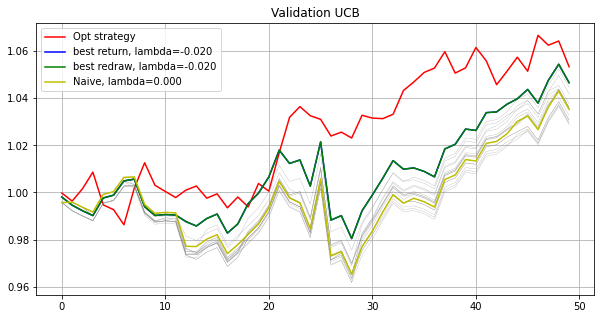

Testing...
./tmp2/res_phase06_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.20825661    Max redraw: 0.04421898
lambda: -0.018   Total log return: 0.20924816    Max redraw: 0.04421898
lambda: -0.016   Total log return: 0.21651083    Max redraw: 0.04421898
lambda: -0.014   Total log return: 0.21232723    Max redraw: 0.04421898
lambda: -0.012   Total log return: 0.21022755    Max redraw: 0.04421898
lambda: -0.010   Total log return: 0.20631076    Max redraw: 0.04421898
lambda: -0.008   Total log return: 0.20639946    Max redraw: 0.04421898
lambda: -0.006   Total log return: 0.20400683    Max redraw: 0.04421898
lambda: -0.004   Total log return: 0.19399370    Max redraw: 0.04421898
lambda: -0.002   Total log return: 0.20301120    Max redraw: 0.04421898
lambda: -0.000   Total log return: 0.20169129    Max redraw: 0.04421898
lambda: 0.002   Total log return: 0.19245404    Max redraw: 0.04421898
lambda: 0.004   Total log return: 0.18825244    Max redraw: 0.0442189

[ 0.      0.      0.0004  0.025   0.0087  0.0096  0.0065 -0.     -0.
 -0.      0.0295  0.0005  0.021  -0.      0.0085 -0.      0.0098  0.
  0.      0.0056  0.0446  0.0094  0.0261  0.     -0.      0.0154  0.
  0.      0.      0.0388  0.      0.0083  0.      0.      0.      0.0055
  0.0353  0.0219  0.016   0.      0.0063  0.002   0.      0.0252  0.0157
  0.0019  0.0324  0.      0.      0.      0.      0.0172  0.0208  0.0274
  0.      0.      0.019   0.0011  0.0047  0.      0.      0.0194  0.0245
  0.0157  0.0014  0.0246  0.0081  0.0088  0.      0.0046  0.      0.0219
  0.0017  0.0215  0.0041  0.0023  0.0062  0.0099  0.0185  0.0133  0.0368
 -0.      0.009   0.0152  0.      0.0264  0.0084  0.0129  0.      0.0049
  0.0128  0.0231  0.0158  0.0072  0.0099  0.0122  0.0133  0.013   0.0414
  0.011 ]
0.18236211638279962
[ 0.      0.0008  0.      0.0253  0.0087  0.0089  0.0062 -0.      0.
  0.      0.03    0.      0.0203  0.      0.0072  0.0015  0.0098  0.
  0.      0.0049  0.0448  0.0092  0.0269 

[ 0.     -0.     -0.      0.0233  0.0019  0.002   0.0008  0.      0.
  0.      0.0339 -0.      0.0254  0.     -0.      0.0051  0.0172 -0.
  0.0259 -0.      0.0469 -0.      0.0218  0.0024 -0.      0.0322 -0.
  0.0024 -0.      0.0283  0.0053  0.0008 -0.      0.0023 -0.      0.005
  0.0344  0.0135  0.0194 -0.      0.0039  0.0035  0.0011  0.0314 -0.
 -0.      0.0089 -0.     -0.     -0.     -0.      0.0147  0.016   0.0331
  0.     -0.      0.0198 -0.      0.      0.0018 -0.      0.0135  0.0254
  0.0096  0.      0.0389  0.0097  0.0203 -0.     -0.      0.0002  0.0324
  0.0072  0.0124 -0.      0.0016 -0.      0.0204  0.0373  0.005   0.0528
 -0.     -0.     -0.      0.      0.0275  0.007   0.0096 -0.     -0.
  0.0058  0.0249  0.0362 -0.      0.0129  0.0073  0.0149  0.0239  0.0499
  0.0088]
0.0003367296051149284
[ 0.      0.      0.      0.0233  0.0019  0.002   0.0008  0.     -0.
  0.      0.0339  0.      0.0254  0.      0.      0.0051  0.0172 -0.
  0.0259 -0.      0.0469  0.      0.0218  0.0024

/home/linaiqi/anaconda3/envs/gpfinance/lib/python3.7/site-packages/cvxpy/problems/problem.py:1061: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  "Solution may be inaccurate. Try another solver, "


[ 0.      0.      0.      0.0233  0.0019  0.002   0.0008  0.      0.
  0.      0.0339  0.      0.0254  0.      0.      0.0051  0.0172  0.
  0.0259  0.      0.0469  0.      0.0218  0.0024  0.      0.0322  0.
  0.0024  0.      0.0283  0.0053  0.0008  0.      0.0023  0.      0.005
  0.0344  0.0135  0.0194  0.      0.004   0.0035  0.0011  0.0314  0.
  0.      0.0089  0.      0.      0.      0.      0.0147  0.016   0.0331
  0.      0.      0.0198  0.      0.      0.0018  0.      0.0135  0.0254
  0.0096  0.      0.0389  0.0097  0.0203  0.      0.      0.0001  0.0324
  0.0072  0.0124  0.      0.0016  0.      0.0204  0.0373  0.0051  0.0528
  0.      0.      0.      0.      0.0275  0.007   0.0096 -0.      0.
  0.0058  0.0249  0.0362  0.      0.0129  0.0073  0.0149  0.0239  0.0499
  0.0088]
0.0003169086412814157
[ 0.0001  0.0001  0.0001  0.0231  0.0018  0.0021  0.0009  0.0001  0.
  0.      0.0337  0.0001  0.0253  0.      0.      0.0052  0.0172  0.0001
  0.0258  0.      0.0468  0.0001  0.0218  0.

[ 0.0016  0.     -0.      0.0227  0.0011  0.0062 -0.     -0.     -0.
 -0.      0.0348  0.0112  0.0173 -0.      0.0033  0.0047  0.011  -0.
  0.0121  0.0057  0.0298 -0.      0.0103 -0.     -0.      0.0269 -0.
 -0.     -0.      0.0377  0.0065  0.0047 -0.      0.0009  0.0049 -0.
  0.0235  0.0152  0.0158  0.0003  0.0008  0.      0.0025  0.0398  0.0161
  0.0063  0.0103  0.0009 -0.     -0.     -0.      0.003   0.0108  0.0335
  0.      0.      0.0087  0.003   0.      0.      0.0003  0.022   0.0263
  0.0039  0.0006  0.045   0.0046  0.0289 -0.      0.     -0.      0.0389
  0.0024  0.0035  0.      0.     -0.      0.0175  0.0418  0.0079  0.0589
  0.0047  0.0165  0.0007  0.      0.0308  0.0027  0.0023 -0.      0.0015
  0.0051  0.0457  0.0268  0.0024  0.0122  0.0158  0.0127  0.016   0.0436
  0.0141]
0.11398866559556053
[ 0.      0.008  -0.      0.0208  0.0047  0.01    0.0003 -0.      0.
  0.      0.028  -0.      0.0183  0.      0.0024  0.0012  0.0099 -0.
  0.011  -0.      0.0322  0.      0.0141  0.0

[ 0.     -0.      0.0002  0.0189  0.0105  0.0105  0.0008 -0.     -0.
 -0.      0.0171  0.0005  0.0248 -0.      0.0137  0.0086  0.0168  0.0004
  0.0014 -0.      0.0435  0.0014  0.0148  0.     -0.      0.026  -0.
  0.0001 -0.      0.0469  0.      0.0123 -0.      0.0098  0.0047 -0.
  0.0224  0.0148  0.0196 -0.      0.0006 -0.      0.0083  0.0376 -0.
 -0.      0.0172 -0.     -0.     -0.     -0.      0.0093  0.0035  0.0214
  0.      0.0075 -0.      0.0061  0.0177  0.0008 -0.      0.0281  0.0344
  0.0115  0.0044  0.0548 -0.      0.0278 -0.     -0.      0.0016  0.059
 -0.      0.0065  0.002  -0.     -0.      0.0095  0.0438  0.0062  0.0618
 -0.     -0.     -0.     -0.      0.0287  0.0032  0.0095 -0.      0.
  0.0081  0.0453  0.0131  0.009   0.0041 -0.      0.0033  0.0207  0.0278
  0.0057]
0.00015784541558692784
[ 0.      0.0049  0.      0.0182  0.0091  0.0104  0.0001 -0.      0.
  0.      0.0177  0.      0.0264  0.      0.011   0.0016  0.0154  0.
  0.019   0.      0.0452  0.0002  0.0167  0.   

[-0.      0.      0.0005  0.0169  0.0019  0.0085  0.0007  0.      0.
 -0.      0.0143  0.      0.027   0.      0.0043  0.      0.0183 -0.
  0.0091 -0.      0.0571  0.0016  0.0144 -0.      0.0006  0.0234 -0.
  0.     -0.      0.04    0.      0.0083 -0.      0.0127 -0.      0.0007
  0.0312  0.0148  0.021   0.0002 -0.      0.0003  0.0056  0.037   0.0078
  0.0004  0.0074  0.0023 -0.     -0.      0.0002  0.0053 -0.      0.0277
  0.      0.0002 -0.      0.001   0.0124  0.0007  0.008   0.0308  0.0333
  0.002   0.0053  0.055   0.0014  0.0321 -0.     -0.      0.0008  0.0526
  0.0003  0.0179 -0.      0.     -0.      0.0214  0.045   0.0146  0.0623
 -0.      0.     -0.     -0.      0.0225  0.0025  0.0082 -0.      0.0006
  0.0016  0.0455  0.0195  0.0041  0.0079  0.002   0.0018  0.0226  0.0321
  0.0103]
0.08882718199576678
[-0.     -0.      0.0005  0.0169  0.002   0.0085  0.0007 -0.     -0.
 -0.      0.0143 -0.      0.027  -0.      0.0043 -0.      0.0183 -0.
  0.0091 -0.      0.0571  0.0016  0.0144 

[ 0.      0.      0.003   0.0163 -0.      0.009   0.005   0.0025  0.
  0.      0.0114  0.0016  0.0008  0.     -0.      0.0061  0.031   0.0019
  0.059   0.0019  0.059   0.     -0.     -0.      0.0056 -0.      0.
  0.0099  0.      0.0564  0.      0.0119  0.     -0.      0.      0.
 -0.      0.0015  0.0307  0.      0.0003  0.0081  0.0053  0.0333  0.
  0.      0.0039 -0.      0.      0.      0.      0.0061  0.0052  0.0242
  0.      0.0016  0.      0.0094  0.0039  0.0066  0.      0.0367  0.0306
  0.0097  0.0226  0.0498  0.0023  0.0294  0.      0.001   0.0056  0.0481
  0.0003  0.      0.      0.      0.      0.0385  0.0449  0.0048  0.0408
  0.0185  0.      0.0136  0.      0.0179  0.      0.0111  0.      0.
  0.011   0.0233 -0.      0.0003  0.0059  0.      0.      0.0339  0.0585
  0.0085]
0.5675404218506196
[-0.      0.      0.0006  0.0177  0.0095  0.0061  0.0037 -0.     -0.
  0.      0.0087  0.0128 -0.     -0.     -0.      0.      0.0273  0.
  0.0566  0.0112  0.0686 -0.     -0.      0.      

[-0.     -0.     -0.      0.0193  0.0061 -0.      0.0003  0.     -0.
 -0.      0.0112  0.0038  0.0044  0.     -0.      0.0141  0.0122 -0.
  0.0401  0.0039  0.0778  0.0001 -0.     -0.      0.      0.0123 -0.
  0.0018  0.      0.0613  0.0083  0.     -0.      0.0144  0.0054  0.0033
  0.0015  0.0122  0.0291 -0.     -0.     -0.     -0.      0.0366 -0.
 -0.      0.0038 -0.     -0.     -0.     -0.      0.0097  0.0012  0.0271
  0.      0.0014 -0.      0.0167  0.0129 -0.     -0.      0.0406  0.0338
  0.      0.0249  0.0327  0.0013  0.0386 -0.      0.      0.      0.0515
  0.0012  0.011   0.      0.0053 -0.      0.0355  0.0442 -0.      0.0452
  0.0008 -0.      0.0109 -0.      0.0046 -0.      0.0053  0.0066  0.0026
  0.0036  0.0261  0.0002  0.002   0.0041  0.0073 -0.      0.0262  0.0651
  0.0163]
1.3537930594188996e-05
[ 0.      0.      0.      0.0193  0.0061  0.      0.0003  0.      0.
  0.      0.0112  0.0038  0.0044  0.      0.      0.0141  0.0122  0.
  0.0401  0.0039  0.0778  0.0001 -0.     -

[-0.      0.0028  0.      0.018  -0.     -0.     -0.      0.     -0.
  0.      0.009   0.0028  0.0037 -0.      0.0004  0.0075  0.0153 -0.
  0.0401  0.0006  0.0559  0.0041  0.0018 -0.      0.      0.0284  0.
 -0.     -0.      0.0678  0.0005 -0.     -0.      0.005   0.0011  0.0033
  0.0109  0.023   0.0285 -0.      0.0105 -0.      0.001   0.0413  0.0053
  0.      0.0051 -0.      0.0032  0.     -0.      0.0109 -0.      0.029
  0.      0.0015  0.      0.0082  0.0187 -0.     -0.      0.0435  0.0342
  0.0012  0.022   0.0354 -0.      0.0397  0.0006  0.      0.      0.0485
  0.0004  0.0056  0.0001 -0.      0.      0.0288  0.0486  0.0101  0.0465
  0.0062  0.0122  0.005  -0.      0.006   0.      0.0044  0.0097  0.0011
 -0.      0.0224 -0.     -0.      0.0048 -0.      0.      0.018   0.0668
  0.013 ]
6.08305799121358e-06
[ 0.      0.0028 -0.      0.018   0.     -0.     -0.      0.     -0.
 -0.      0.009   0.0028  0.0037 -0.      0.0004  0.0075  0.0153 -0.
  0.0401  0.0006  0.0559  0.0041  0.0018 

[ 0.      0.      0.      0.0206  0.0066  0.      0.      0.     -0.
 -0.      0.0023 -0.      0.0083 -0.     -0.      0.0077  0.0215  0.
  0.0383  0.0008  0.0596 -0.      0.006   0.      0.      0.0212  0.001
  0.003   0.      0.0643  0.0031  0.0067 -0.      0.0028  0.0053 -0.
  0.0057  0.0138  0.0235  0.0014  0.0018  0.0007 -0.      0.0419 -0.
 -0.      0.0183  0.0022 -0.     -0.      0.0031  0.0044  0.0015  0.0392
 -0.      0.0047  0.0023  0.0026  0.0125 -0.      0.      0.0452  0.0318
  0.0024  0.0168  0.0287 -0.      0.0435  0.      0.0002 -0.      0.0481
 -0.      0.0014  0.0017  0.     -0.      0.04    0.0508  0.0066  0.0549
  0.      0.0076  0.0042 -0.      0.0122 -0.      0.0018  0.0002 -0.
  0.0019  0.0171  0.0037  0.0043  0.0085 -0.      0.      0.0152  0.0773
  0.0146]
0.17624082864906362
Opt strategy   Total log return: 0.10607185    Max redraw: 0.04421898
Total return: 1.11190176
Mean return: 1.00106128
best return val lambda: -0.016   Total log return: 0.20825661
Total r

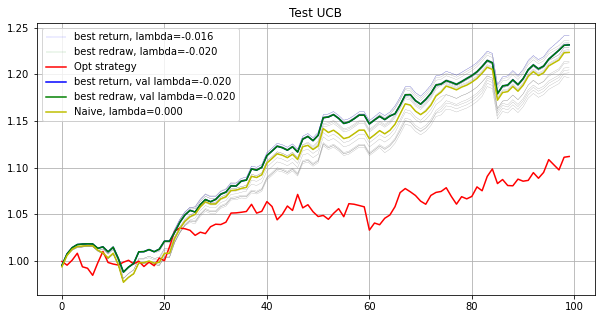

Phase 7
Validating...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
Opt strategy
[0.006  0.0079 0.0119 0.012  0.0144 0.0116 0.0111 0.0066 0.0037 0.0129
 0.0086 0.0079 0.0024 0.02   0.0101 0.0115 0.013  0.0088 0.0101 0.0049
 0.0067 0.0097 0.0061 0.0066 0.0064 0.0054 0.0101 0.0063 0.0037 0.0118
 0.0039 0.0088 0.0147 0.0128 0.0201 0.0079 0.0091 0.0105 0.0042 0.0116
 0.0045 0.0111 0.0147 0.0108 0.006  0.0091 0.0101 0.0091 0.0133 0.0046
 0.0122 0.0154 0.0093 0.0138 0.015  0.0087 0.0096 0.0065 0.0109 0.0093
 0.011  0.011  0.0137 0.0085 0.0108 0.0123 0.0125 0.0057 0.0128 0.0116
 0.0099 0.0122 0.0094 0.0088 0.009  0.0107 0.0111 0.0079 0.0076 0.0088
 0.0131 0.0062 0.0077 0.0093 0.0131 0.0107 0.0074 0.0124 0.016  0.0168
 0.0122 0.0112 0.0078 0.0097 0.0127 0.0115 0.0133 0.0099 0.0119 0.0065]
0.2634120757857299
[ 0.0107  0.0019  0.0135  0.0136  0.0173  0.0117  0.0119  0.0056 -0.
  0.0111  0.0055  0.0047  0.0077  0.0171  0.0091  0.0139  0.0133  0.0089
  0.0104  0.0002  0.0075  0.0096  0.0049  0.0044 

[-0.     -0.      0.0249  0.018   0.0276  0.0111  0.0181 -0.     -0.
  0.0234 -0.      0.0039 -0.      0.     -0.     -0.      0.007  -0.
  0.0303 -0.      0.0216  0.0224 -0.     -0.      0.0013 -0.      0.0105
 -0.     -0.      0.0242  0.0033  0.0026  0.0293  0.0361 -0.      0.0059
  0.0127  0.0106  0.0275 -0.     -0.     -0.      0.026   0.0023 -0.
  0.0105  0.0203  0.0083  0.0247 -0.      0.023   0.008  -0.      0.0488
  0.0011 -0.      0.0026  0.006   0.0194 -0.      0.0109 -0.      0.0102
  0.008   0.0025  0.0033  0.0318 -0.      0.0159 -0.      0.0266  0.0133
  0.0007  0.0331  0.0151  0.0233  0.0069 -0.      0.0092  0.0088 -0.
  0.0064 -0.      0.0239  0.018  -0.     -0.      0.0216  0.0273  0.016
  0.029   0.0009  0.003  -0.      0.0052  0.0294  0.0051 -0.      0.0212
 -0.    ]
0.08637932852520866
[ 0.     -0.      0.0249  0.018   0.0276  0.0111  0.0181  0.      0.
  0.0234 -0.      0.0039  0.      0.      0.      0.      0.007  -0.
  0.0303  0.      0.0216  0.0224 -0.     -0.  

[-0.      0.0014  0.029   0.0238  0.0174  0.0127  0.017  -0.     -0.
  0.0317  0.      0.0038 -0.      0.0084  0.      0.0246  0.0102  0.
  0.0375 -0.      0.0034  0.005  -0.     -0.      0.     -0.      0.0123
 -0.      0.      0.0323 -0.     -0.     -0.      0.0439  0.0098  0.0016
  0.0106  0.0194  0.0115  0.0098 -0.     -0.      0.0437 -0.      0.
  0.0037  0.0254 -0.      0.0218  0.      0.0371  0.0073 -0.      0.056
 -0.      0.0111 -0.     -0.      0.023  -0.      0.0336 -0.      0.006
 -0.     -0.      0.0001  0.034  -0.      0.0083 -0.      0.0508  0.0101
  0.     -0.      0.0126  0.046   0.0074  0.0248  0.     -0.      0.015
  0.0069 -0.      0.0195  0.0327 -0.     -0.      0.0013  0.0065  0.0017
  0.0042  0.0044  0.0039 -0.     -0.      0.0191  0.0084  0.      0.0367
 -0.    ]
0.17235175291692972
[-0.      0.      0.0285  0.0228  0.0194  0.0115  0.0168 -0.     -0.
  0.0326  0.      0.0025  0.      0.0055  0.      0.0212  0.007   0.
  0.0377 -0.      0.0031  0.0057 -0.      0.

[ 0.0001  0.      0.0266  0.022   0.0155  0.0118  0.016   0.      0.
  0.0333  0.0003  0.0021  0.      0.      0.      0.015   0.      0.0015
  0.0369  0.      0.0136  0.0044  0.      0.0025  0.0001  0.      0.013
 -0.      0.      0.0398  0.      0.      0.0029  0.0371  0.      0.0014
  0.0104  0.0176  0.      0.0038  0.0033  0.      0.0538  0.0001  0.
  0.0052  0.0331  0.      0.0282  0.      0.0433  0.0139  0.      0.0593
  0.      0.      0.0008  0.      0.0212  0.0001  0.0302  0.      0.0052
  0.      0.0028  0.0007  0.0376  0.      0.012   0.      0.0548  0.
  0.0022  0.      0.0128  0.0521  0.0038  0.0206  0.0031  0.0038  0.0067
  0.0067  0.0093  0.0194  0.0351  0.      0.      0.      0.0083  0.0032
  0.0035  0.      0.0021  0.0017  0.0027  0.0194  0.0073  0.0001  0.0424
  0.    ]
6.447825798342072e-05
[0.0001 0.     0.0266 0.022  0.0155 0.0118 0.016  0.     0.     0.0333
 0.0003 0.0021 0.     0.     0.     0.015  0.     0.0015 0.0369 0.
 0.0136 0.0044 0.     0.0025 0.0001 0.  

[-0.     -0.      0.0254  0.0206  0.0164  0.0092  0.0143  0.      0.
  0.0208  0.0003  0.0046  0.001   0.     -0.      0.0156  0.0048 -0.
  0.0323  0.0015  0.0182  0.0003 -0.     -0.     -0.     -0.      0.011
  0.      0.      0.026   0.0026  0.      0.0173  0.0429  0.008   0.0062
  0.      0.0181  0.0071  0.0011 -0.      0.0049  0.0565 -0.      0.0072
  0.0046  0.0294  0.      0.0182  0.      0.0378  0.0013  0.0003  0.0567
  0.     -0.      0.      0.      0.0112 -0.      0.0327 -0.      0.01
  0.      0.0127  0.0012  0.0224  0.      0.0063  0.002   0.0524 -0.
  0.0038  0.0048  0.0091  0.0482  0.0007  0.0315  0.013   0.0041  0.0043
  0.0058  0.      0.0164  0.0188  0.     -0.      0.0028  0.0086  0.009
  0.0142  0.0529  0.0017  0.      0.      0.0141 -0.     -0.      0.0428
  0.    ]
0.08839285192614259
[-0.     -0.      0.0254  0.0206  0.0164  0.0092  0.0143  0.      0.
  0.0208  0.0003  0.0046  0.001   0.      0.      0.0156  0.0048  0.
  0.0323  0.0015  0.0182  0.0003 -0.     -0. 

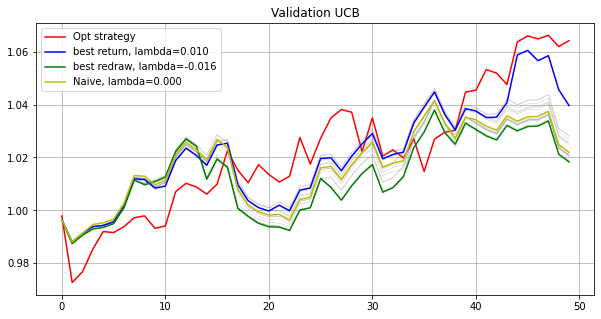

Testing...
./tmp2/res_phase07_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09307256    Max redraw: 0.04027295
lambda: -0.018   Total log return: 0.09204683    Max redraw: 0.04117268
lambda: -0.016   Total log return: 0.09059912    Max redraw: 0.04117268
lambda: -0.014   Total log return: 0.09027487    Max redraw: 0.04117268
lambda: -0.012   Total log return: 0.09337694    Max redraw: 0.04117268
lambda: -0.010   Total log return: 0.09945863    Max redraw: 0.04027295
lambda: -0.008   Total log return: 0.10300035    Max redraw: 0.04027295
lambda: -0.006   Total log return: 0.10895820    Max redraw: 0.04027295
lambda: -0.004   Total log return: 0.10850160    Max redraw: 0.04027295
lambda: -0.002   Total log return: 0.10397950    Max redraw: 0.04027295
lambda: -0.000   Total log return: 0.09492290    Max redraw: 0.03980353
lambda: 0.002   Total log return: 0.09419810    Max redraw: 0.03980353
lambda: 0.004   Total log return: 0.07958077    Max redraw: 0.0398035

[ 0.0005 -0.      0.0236  0.0171  0.0316  0.0215  0.0171  0.      0.
  0.0174  0.0009  0.0016  0.      0.0024 -0.      0.0013  0.0051  0.006
  0.0262  0.      0.0008  0.0305  0.001   0.      0.0109 -0.      0.0131
  0.0021  0.      0.0432  0.      0.0041  0.0136  0.0392  0.0021  0.0167
  0.0141  0.      0.0046  0.0018  0.0115  0.      0.0497  0.      0.0211
  0.004   0.0277  0.0011  0.0332  0.0011  0.0303  0.0163  0.0108  0.0021
  0.0058  0.0003  0.0051  0.004   0.0146 -0.      0.0198  0.0047  0.0048
  0.0072  0.0014  0.0062  0.01    0.      0.0136  0.      0.0346  0.
  0.0079  0.0032  0.0144  0.038   0.0131  0.0003  0.      0.0093  0.0074
  0.0005  0.      0.0111  0.0004  0.0022  0.      0.0009  0.0261  0.0239
  0.01    0.0307  0.0166 -0.      0.0165  0.0183  0.0001  0.0118  0.0262
  0.    ]
0.06680821467646995
[ 0.0019 -0.      0.0236  0.0171  0.031   0.0177  0.0169 -0.     -0.
  0.0178  0.0005  0.0028 -0.      0.0019  0.      0.      0.0034  0.005
  0.0264  0.0008  0.0002  0.0308  0

[ 0.      0.0019  0.0245  0.0182  0.0265  0.0154  0.0159  0.      0.
  0.0231 -0.      0.      0.      0.     -0.      0.0033  0.0053  0.0011
  0.0302  0.      0.0091  0.024   0.      0.0119 -0.     -0.      0.014
  0.     -0.      0.0402 -0.      0.      0.0324  0.0389  0.      0.0081
  0.0143  0.0062  0.      0.0051  0.0088  0.      0.0652  0.0001  0.0059
  0.0019  0.0309  0.      0.0389  0.      0.041   0.0206  0.      0.0214
  0.      0.      0.0011  0.0024  0.0099 -0.      0.0267  0.0018  0.0037
  0.      0.0003  0.0027  0.0164  0.      0.0064  0.      0.0372  0.
 -0.      0.0152  0.0242  0.0446  0.0036  0.     -0.      0.0025  0.
  0.      0.      0.0135  0.0053  0.0067  0.      0.0149  0.0275  0.0265
  0.0038  0.0209  0.0137  0.0012  0.0005  0.0174  0.007  -0.      0.038
  0.    ]
0.18944141698620656
[ 0.      0.      0.0241  0.0178  0.0266  0.0154  0.0156  0.      0.
  0.0234 -0.      0.      0.      0.      0.      0.0035  0.004   0.0018
  0.0305  0.0003  0.0105  0.0243  0.   

/home/linaiqi/anaconda3/envs/gpfinance/lib/python3.7/site-packages/cvxpy/problems/problem.py:1061: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  "Solution may be inaccurate. Try another solver, "


[0.     0.     0.0291 0.0247 0.0115 0.0032 0.0178 0.     0.     0.0066
 0.     0.     0.     0.     0.     0.0215 0.     0.     0.0323 0.
 0.0116 0.0173 0.     0.0361 0.     0.     0.014  0.     0.     0.0148
 0.     0.     0.0232 0.024  0.0005 0.0301 0.0038 0.     0.0529 0.002
 0.0028 0.     0.0631 0.     0.     0.     0.0241 0.     0.024  0.
 0.0563 0.0079 0.     0.0352 0.0043 0.     0.     0.0191 0.0106 0.
 0.0476 0.009  0.011  0.     0.     0.     0.     0.     0.0048 0.0234
 0.0259 0.     0.     0.     0.0296 0.0272 0.0193 0.019  0.0274 0.
 0.     0.     0.0227 0.0022 0.     0.     0.     0.     0.0105 0.0236
 0.     0.0067 0.0083 0.     0.     0.0189 0.     0.     0.0386 0.    ]
0.0003029740121213983
[ 0.0106 -0.      0.0311  0.0271  0.0189  0.0138  0.0181 -0.     -0.
  0.0165 -0.      0.     -0.     -0.     -0.      0.0176 -0.     -0.
  0.0311  0.      0.      0.0186  0.0049  0.0232  0.     -0.      0.012
 -0.     -0.      0.0056  0.     -0.      0.0214  0.0348  0.      0.0241
 

[ 0.0047 -0.      0.0267  0.0222  0.0214  0.0161  0.0162 -0.     -0.
  0.0301  0.0005  0.0021 -0.     -0.      0.      0.0099  0.001   0.0032
  0.0389  0.0033 -0.      0.0096  0.0002  0.0095  0.0001 -0.      0.0124
  0.001  -0.      0.0181  0.0017 -0.      0.0201  0.0418 -0.      0.0152
  0.0042  0.0017  0.0148  0.0009  0.0023  0.      0.076  -0.      0.0204
  0.0102  0.0256 -0.      0.0198  0.      0.0565  0.0089  0.0045  0.038
 -0.      0.      0.0008  0.0078  0.0075 -0.      0.0453 -0.      0.0063
  0.0288 -0.      0.0056  0.0111 -0.      0.0094  0.      0.0296  0.0032
  0.0024  0.0022  0.0247  0.0417  0.0161  0.0122  0.0024  0.0001  0.0039
 -0.      0.0022  0.0126  0.0058 -0.     -0.     -0.     -0.      0.0312
  0.      0.0089  0.0048  0.0003  0.0002  0.0132  0.0012 -0.      0.0486
 -0.    ]
0.048736630342995475
[ 0.0046  0.      0.0266  0.0221  0.0209  0.0161  0.0161  0.     -0.
  0.0314  0.0009  0.0014 -0.      0.0015  0.      0.0105  0.      0.0025
  0.0382  0.0043 -0.      0.0

[ 0.0003 -0.      0.0254  0.0138  0.0181  0.0102  0.0145  0.      0.
  0.0376  0.      0.      0.     -0.      0.      0.0162  0.      0.0134
  0.0313  0.      0.0001  0.0189  0.      0.01    0.0026  0.      0.0103
  0.0002  0.      0.0259  0.0004  0.      0.0102  0.0313  0.      0.0029
  0.0106  0.001   0.0018  0.0016  0.0002  0.      0.0671  0.      0.
  0.009   0.0312  0.      0.0445  0.0099  0.0561  0.0101  0.0019  0.0404
  0.0001  0.      0.0011  0.      0.0056  0.      0.0328 -0.      0.0108
  0.017  -0.      0.0001  0.0147  0.      0.0089  0.      0.0389  0.0022
 -0.      0.0085  0.0246  0.0513  0.007   0.0004  0.     -0.      0.0005
  0.      0.      0.0102  0.005   0.0005  0.      0.0083  0.0177  0.0317
  0.0027  0.0368  0.0111  0.      0.0003  0.018   0.0032  0.0003  0.0507
  0.    ]
0.03500133567304575
[ 0.0003  0.      0.0254  0.0138  0.0181  0.0102  0.0145 -0.     -0.
  0.0376 -0.     -0.     -0.     -0.     -0.      0.0162 -0.      0.0134
  0.0313  0.      0.0001  0.0189 

[ 0.      0.      0.0256  0.0138  0.0174  0.0081  0.0145 -0.      0.
  0.0389  0.     -0.      0.     -0.      0.      0.0154  0.      0.0127
  0.0316  0.0004  0.0014  0.02   -0.      0.0094  0.0043 -0.      0.0102
 -0.      0.0005  0.0247  0.      0.      0.0114  0.032  -0.      0.0017
  0.0101  0.0003  0.0003  0.002   0.0009  0.0002  0.0683  0.      0.
  0.0083  0.0313 -0.      0.0449  0.0083  0.0558  0.0124  0.0026  0.0405
  0.0007 -0.      0.0011  0.      0.0058 -0.      0.033  -0.      0.0106
  0.0167  0.     -0.      0.0152  0.0012  0.0091 -0.      0.0392  0.0025
 -0.      0.0114  0.0246  0.051   0.0071 -0.      0.0005 -0.      0.0004
 -0.      0.      0.0098  0.0043  0.0005 -0.      0.0056  0.0164  0.0335
  0.002   0.0353  0.0106  0.     -0.      0.0181  0.0025  0.0002  0.0509
 -0.    ]
0.00010416776555018425
[-0.     -0.      0.0256  0.0138  0.0174  0.0081  0.0145  0.      0.
  0.0389  0.      0.     -0.      0.     -0.      0.0154 -0.      0.0127
  0.0316  0.0004  0.0014  0.02

[ 0.0043 -0.      0.026   0.0138  0.0159  0.0092  0.0148 -0.     -0.
  0.0381  0.0003 -0.     -0.     -0.      0.0003  0.0138 -0.      0.0135
  0.0351 -0.      0.003   0.0192  0.0004  0.013   0.0044 -0.      0.0101
 -0.      0.      0.0248 -0.     -0.      0.0089  0.0334 -0.      0.0025
  0.013   0.      0.0002  0.0006  0.0017  0.      0.0703  0.0008 -0.
  0.0073  0.0311 -0.      0.0449  0.0056  0.0558  0.0131 -0.      0.0421
 -0.     -0.      0.0009 -0.      0.0041  0.      0.0353 -0.      0.0083
  0.0163  0.001   0.0022  0.0142 -0.      0.0094  0.0003  0.0377  0.
 -0.      0.0102  0.0265  0.0504  0.0067 -0.     -0.      0.0003 -0.
  0.     -0.      0.009   0.0044 -0.     -0.      0.0043  0.0149  0.0338
  0.0028  0.0347  0.0099  0.0004  0.      0.0186 -0.     -0.      0.0521
 -0.    ]
0.00021690850148608164
[ 0.0043  0.      0.026   0.0138  0.0159  0.0092  0.0148  0.     -0.
  0.0381  0.0003  0.     -0.     -0.      0.0003  0.0138  0.      0.0135
  0.0351  0.      0.003   0.0192  0.00

[-0.     -0.      0.0242  0.0163  0.0062  0.0231  0.0146 -0.     -0.
  0.0323 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0045
  0.0293 -0.      0.0205  0.0023 -0.     -0.     -0.     -0.      0.0121
  0.     -0.      0.0505  0.     -0.      0.0171  0.0148 -0.      0.0183
  0.     -0.     -0.      0.0025 -0.     -0.      0.0684  0.0008  0.0229
 -0.      0.0283  0.      0.0397  0.      0.0503  0.0249  0.0001  0.034
  0.      0.      0.0057  0.0117  0.0066 -0.      0.0412  0.002   0.0003
  0.0103 -0.      0.      0.0068 -0.      0.0166 -0.      0.0472  0.0033
 -0.      0.0063  0.0222  0.037   0.0004  0.006   0.      0.     -0.
 -0.      0.      0.007   0.001   0.      0.     -0.      0.018   0.0419
  0.      0.0406  0.0121  0.      0.0038  0.0385 -0.     -0.      0.0553
 -0.    ]
0.0002171925364769619
[ 0.      0.      0.0232  0.0135  0.0132  0.0125  0.0135  0.      0.
  0.0284  0.      0.      0.      0.      0.      0.0022  0.      0.0021
  0.0209  0.      0.0237  0.    

[ 0.      0.      0.0241  0.0138  0.0117  0.0142  0.0132  0.      0.
  0.03    0.      0.      0.      0.      0.      0.0009 -0.      0.
  0.0219  0.      0.0122  0.0083  0.      0.      0.      0.      0.0106
  0.      0.      0.0355  0.      0.      0.0129  0.0297  0.      0.0118
  0.0078  0.      0.      0.      0.      0.      0.0734 -0.      0.0059
  0.0007  0.0272  0.      0.0521 -0.      0.0508  0.0151  0.0024  0.0409
  0.      0.0046  0.0004  0.0013  0.0023  0.      0.0373  0.0052  0.001
  0.0043  0.      0.0088  0.0063 -0.      0.0139  0.      0.0485  0.0013
  0.      0.0236  0.0254  0.0533  0.0034  0.0136  0.      0.0015  0.0028
  0.0036 -0.      0.0034  0.0092  0.0182  0.     -0.      0.0219  0.0318
  0.      0.018   0.0135  0.      0.005   0.0316 -0.      0.      0.0576
  0.    ]
0.00012774805620314753
[ 0.      0.      0.024   0.0138  0.0117  0.0142  0.0132  0.      0.
  0.03    0.      0.      0.      0.      0.      0.001   0.      0.
  0.0219 -0.      0.0122  0.0083  0

[-0.      0.      0.0233  0.0163  0.0141  0.0068  0.0135  0.      0.
  0.0215  0.0002  0.      0.      0.      0.0011  0.     -0.      0.0004
  0.0219  0.      0.0038  0.0375  0.      0.      0.      0.      0.0109
  0.      0.      0.0205 -0.      0.      0.0016  0.037   0.      0.0091
  0.0218  0.0003  0.      0.0002  0.      0.      0.0754  0.      0.0262
  0.0024  0.0302  0.      0.0382  0.      0.047   0.0083  0.0056  0.0384
  0.      0.      0.      0.0013  0.0004 -0.      0.0303  0.0109  0.
  0.0003  0.0001  0.0043  0.0223  0.      0.0019  0.      0.0386  0.
  0.      0.0154  0.0276  0.0626  0.      0.0054  0.0008  0.     -0.
  0.033   0.      0.001   0.0105  0.0149  0.      0.      0.0482  0.0264
  0.      0.0064  0.0073  0.      0.0017  0.0246  0.0114 -0.      0.0587
  0.    ]
0.049579951659709805
Opt strategy   Total log return: 0.12631378    Max redraw: 0.03980353
Total return: 1.13463813
Mean return: 1.00126394
best return val lambda: -0.006   Total log return: 0.07058874
T

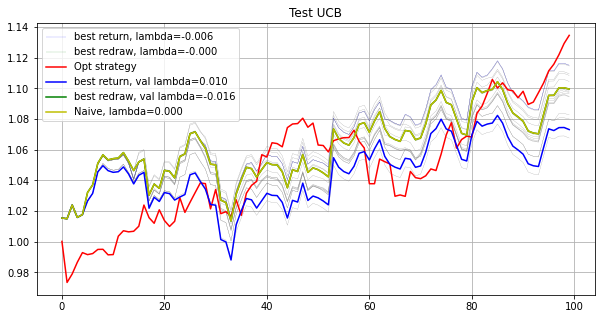

Phase 8
Validating...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
Opt strategy
[ 0.      0.      0.0339  0.0233  0.022   0.0179  0.0165  0.      0.0012
  0.0056  0.0133  0.      0.0233  0.0092  0.0073  0.0182 -0.      0.
  0.      0.008   0.0058  0.0241  0.      0.0201  0.0121  0.0014  0.0101
  0.0103  0.0149  0.0214  0.0096  0.012   0.      0.0175  0.0106  0.
  0.0082  0.      0.0184 -0.      0.      0.0049  0.008   0.     -0.
  0.0104  0.      0.0124  0.0077  0.0114  0.021   0.0242  0.0003  0.0273
  0.0252  0.0088  0.0101  0.0153  0.0003  0.0145  0.      0.      0.0098
  0.0042  0.0192  0.0181  0.0037  0.      0.0114  0.0037  0.0008  0.0107
  0.0048  0.0076  0.0394  0.0098  0.      0.0004  0.0189  0.0339  0.0039
  0.03    0.      0.012   0.0037  0.      0.      0.0083  0.0155  0.0144
  0.0123  0.0216 -0.      0.0092  0.0092  0.0003  0.0204  0.0154  0.011
  0.0184]
0.7485994156398209
[ 0.     -0.      0.0208  0.0391  0.035   0.0066  0.021  -0.      0.
  0.0085  0.0094 -0.      0.0377 

[ 0.      0.      0.0192  0.041   0.0377  0.      0.0174  0.      0.
  0.004   0.0032  0.0012  0.0459  0.0091  0.      0.0032  0.      0.
  0.0031  0.0263  0.0154  0.0288  0.0015  0.0357  0.0233  0.      0.
  0.      0.003   0.0328  0.      0.0028  0.      0.0163  0.      0.0004
  0.      0.      0.0077  0.      0.      0.0016  0.0049  0.0037  0.
  0.      0.      0.0316  0.      0.0164  0.0154  0.0212  0.      0.0159
  0.0599  0.0432  0.003   0.0295  0.      0.0001  0.      0.      0.
  0.0027  0.0076  0.      0.027   0.0004  0.0103  0.      0.      0.0164
  0.      0.      0.0294  0.0101  0.      0.0152  0.0102  0.0032  0.028
  0.0291  0.      0.0015 -0.      0.      0.0157  0.0014  0.0149  0.025
  0.      0.0068  0.      0.0341  0.0202  0.0008  0.0388  0.0102  0.0032
  0.0123]
0.00012087596946054216
[ 0.      0.      0.0193  0.041   0.0377  0.      0.0174  0.      0.
  0.004   0.0032  0.0012  0.0459  0.0091  0.      0.0032 -0.      0.
  0.0031  0.0263  0.0154  0.0288  0.0015  0.0357

[-0.      0.      0.0038  0.0398  0.0347 -0.      0.0171 -0.      0.0007
 -0.     -0.     -0.      0.0563  0.0086 -0.     -0.     -0.     -0.
  0.0052  0.0044  0.0007  0.0206 -0.      0.04    0.0207  0.     -0.
 -0.      0.0054  0.0425  0.0035  0.0028 -0.     -0.     -0.      0.
 -0.     -0.      0.0046  0.     -0.     -0.      0.0039  0.0275 -0.
 -0.      0.0008  0.0165 -0.      0.0056  0.0045  0.022  -0.      0.0204
  0.0802  0.0327 -0.      0.0243 -0.      0.0037 -0.     -0.     -0.
 -0.      0.0253 -0.      0.0402 -0.      0.0192  0.0006  0.0062  0.0289
 -0.      0.      0.0134  0.033  -0.      0.0271  0.0195 -0.      0.0213
  0.0207 -0.      0.     -0.      0.0108  0.0098  0.0226  0.0024  0.0173
  0.0012  0.0013 -0.      0.0237  0.0341  0.0031  0.0435  0.0076 -0.
  0.0135]
0.1313730339446963
[ 0.0001  0.0001  0.0039  0.0395  0.0345  0.0001  0.0171  0.      0.0008
  0.      0.      0.      0.0561  0.0086  0.      0.      0.      0.
  0.0053  0.0045  0.0007  0.0207  0.      0.0399  

[-0.     -0.      0.0042  0.0378  0.0333  0.      0.0148 -0.      0.0011
 -0.      0.0041  0.0031  0.0603  0.0095  0.     -0.     -0.     -0.
  0.009   0.0021  0.005   0.0213  0.0009  0.0454  0.0274 -0.      0.
  0.      0.0039  0.041   0.     -0.     -0.      0.0016 -0.      0.0108
 -0.      0.      0.0074 -0.     -0.     -0.      0.0026  0.0096  0.
  0.0009  0.0014  0.0257 -0.      0.0027  0.0136  0.0259  0.001   0.0124
  0.0887  0.0159 -0.      0.0279 -0.      0.0097 -0.     -0.     -0.
  0.      0.0136  0.007   0.0308 -0.      0.0151 -0.      0.0338  0.0126
  0.     -0.      0.0196  0.0251  0.0013  0.0212  0.0139  0.0095  0.0314
  0.0177 -0.      0.0034 -0.     -0.     -0.      0.0119  0.0053  0.0187
  0.0018  0.0048  0.0042  0.0123  0.0225  0.0047  0.0584  0.0011 -0.
  0.0162]
0.07091327986585125
[ 0.      0.      0.0042  0.0378  0.0333  0.      0.0148 -0.      0.0011
  0.      0.0041  0.0031  0.0603  0.0095  0.     -0.      0.     -0.
  0.009   0.0021  0.005   0.0213  0.0009  0.0

[ 0.      0.      0.0175  0.0354  0.0314  0.      0.0128  0.     -0.
  0.001   0.0001  0.0001  0.0593  0.0164 -0.      0.0004 -0.      0.
  0.008   0.0046  0.0074  0.0176  0.      0.0471  0.0282  0.     -0.
  0.     -0.      0.0355  0.      0.      0.      0.0104  0.     -0.
 -0.      0.     -0.      0.     -0.      0.0015 -0.      0.0023  0.
 -0.     -0.      0.0267  0.0004 -0.      0.0093  0.0288 -0.      0.0089
  0.0926  0.0134  0.0134  0.0302  0.      0.0141 -0.     -0.     -0.
  0.0113  0.038   0.      0.0132 -0.      0.0156 -0.      0.0208  0.0214
  0.     -0.      0.0208  0.0279  0.      0.0233  0.0111  0.0096  0.0304
  0.0133 -0.      0.      0.001   0.0002  0.0008  0.      0.0062  0.0158
  0.0004  0.0139 -0.      0.0176  0.0205  0.0173  0.057   0.      0.
  0.0177]
0.0002135685998319773
[ 0.      0.      0.0175  0.0354  0.0314  0.      0.0128  0.      0.
  0.001   0.0001  0.0001  0.0593  0.0164  0.      0.0004  0.      0.
  0.008   0.0046  0.0074  0.0176  0.      0.0471  0.028

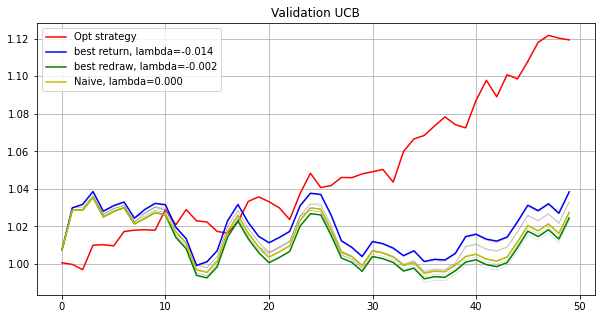

Testing...
./tmp2/res_phase08_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.018   Total log return: 0.04178553    Max redraw: 0.04154353
lambda: -0.016   Total log return: 0.04548496    Max redraw: 0.04154353
lambda: -0.014   Total log return: 0.04087616    Max redraw: 0.04154353
lambda: -0.012   Total log return: 0.03717725    Max redraw: 0.04154353
lambda: -0.010   Total log return: 0.04226571    Max redraw: 0.04154353
lambda: -0.008   Total log return: 0.04410808    Max redraw: 0.04154353
lambda: -0.006   Total log return: 0.04088311    Max redraw: 0.04154353
lambda: -0.004   Total log return: 0.04586607    Max redraw: 0.04154353
lambda: -0.002   Total log return: 0.04682497    Max redraw: 0.04154353
lambda: -0.000   Total log return: 0.04745435    Max redraw: 0.04154353
lambda: 0.002   Total log return: 0.04386840    Max redraw: 0.04154353
lambda: 0.004   Total log return: 0.05685098    Max redraw: 0.0415435

[-0.     -0.      0.0327  0.0396  0.0383  0.      0.0147 -0.     -0.
  0.      0.      0.      0.0396  0.02    0.      0.0006  0.     -0.
  0.0014  0.0282  0.0046  0.0092  0.      0.035   0.0436  0.      0.
  0.      0.0009  0.0634  0.0061  0.0009  0.      0.0077  0.     -0.
  0.     -0.      0.0024  0.      0.      0.      0.0028  0.012   0.
  0.      0.0109  0.0249  0.      0.0109  0.0078  0.0274  0.      0.0165
  0.0551  0.0009  0.0039  0.0381  0.      0.0105 -0.      0.      0.
  0.0004  0.0169  0.0022  0.0161 -0.      0.0134  0.0021  0.      0.0291
  0.      0.009   0.0219  0.0236  0.0033  0.015   0.0002  0.0255  0.0083
  0.0143 -0.      0.      0.0148  0.      0.0009  0.0081  0.005   0.0219
  0.0101  0.      0.005   0.0385  0.0031  0.0082  0.0375  0.0283  0.
  0.0066]
0.06928763610695832
[-0.     -0.      0.0327  0.0396  0.0383 -0.      0.0147 -0.     -0.
 -0.      0.     -0.      0.0396  0.02   -0.      0.0006  0.     -0.
  0.0014  0.0282  0.0046  0.0092 -0.      0.035   0.0436 

/home/linaiqi/anaconda3/envs/gpfinance/lib/python3.7/site-packages/cvxpy/problems/problem.py:1061: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  "Solution may be inaccurate. Try another solver, "


[ 0.      0.      0.0311  0.0368  0.0353  0.      0.0144  0.      0.
  0.0005  0.0009  0.      0.0399  0.0233  0.      0.      0.      0.
  0.      0.0343  0.0012  0.0108  0.      0.0351  0.0485  0.     -0.
  0.0017  0.      0.0608  0.0092  0.0014  0.      0.0023  0.      0.
  0.      0.0029  0.005   0.      0.      0.0002  0.      0.016   0.
  0.      0.      0.0271  0.      0.0148  0.0072  0.0292  0.      0.0171
  0.0578  0.0019  0.0006  0.0371  0.      0.0159  0.0053  0.      0.
  0.0002  0.0219  0.0018  0.0135  0.      0.0107  0.      0.      0.0275
  0.      0.006   0.0225  0.0239  0.0054  0.0095  0.0045  0.0248  0.0104
  0.0177  0.      0.      0.0043  0.      0.0221  0.      0.      0.0159
  0.0085  0.0024  0.0032  0.0346  0.      0.012   0.0392  0.0289  0.
  0.0033]
0.00210030230351717
[-0.      0.      0.0311  0.0368  0.0353  0.      0.0144  0.      0.
  0.0005  0.0008  0.      0.0399  0.0233  0.      0.      0.      0.
  0.      0.0343  0.0012  0.0108  0.      0.0351  0.0485 

[ 0.      0.      0.0115  0.0376  0.0373  0.      0.0137 -0.      0.0005
  0.0011  0.0005  0.0125  0.0472  0.0181  0.     -0.     -0.     -0.
  0.      0.0315  0.0012  0.0022 -0.      0.0392  0.0268 -0.     -0.
 -0.     -0.      0.0706  0.0073 -0.     -0.      0.003  -0.     -0.
 -0.      0.      0.0067 -0.     -0.     -0.      0.0088 -0.      0.
 -0.     -0.      0.0275  0.0011  0.0108 -0.      0.0313 -0.      0.0176
  0.0683  0.0005 -0.      0.0324 -0.      0.0136 -0.     -0.     -0.
 -0.      0.022   0.005   0.005  -0.      0.0115  0.0023 -0.      0.0249
 -0.      0.0017  0.019   0.0283 -0.      0.0164  0.0168  0.0211  0.0103
  0.0202 -0.     -0.     -0.     -0.      0.0372 -0.      0.0069  0.0146
  0.0076  0.013   0.0003  0.0328  0.0131  0.0203  0.0339  0.0243  0.0007
  0.0103]
0.19391294534314185
[ 0.      0.      0.0115  0.0376  0.0373  0.      0.0137  0.      0.0005
  0.0011  0.0005  0.0125  0.0472  0.0181  0.      0.      0.      0.
  0.      0.0315  0.0012  0.0022  0.      0.0

[ 0.      0.      0.0271  0.0352  0.0339  0.001   0.0133 -0.      0.0034
  0.      0.     -0.      0.0518  0.0152  0.0001  0.0052  0.     -0.
  0.      0.0375  0.      0.     -0.      0.0403  0.03    0.      0.
  0.      0.      0.067   0.0077  0.      0.      0.      0.      0.
 -0.      0.002   0.008  -0.     -0.      0.      0.0095  0.      0.
  0.0029  0.      0.0247  0.0063  0.006   0.0098  0.0305  0.0006  0.0076
  0.0757 -0.      0.      0.0336 -0.      0.0146 -0.     -0.     -0.
  0.0011  0.0143 -0.      0.0021 -0.      0.012   0.0005  0.0018  0.0279
 -0.      0.0068  0.019   0.0223 -0.      0.0154  0.0123  0.0339  0.0052
  0.0149 -0.      0.0019 -0.      0.      0.0307 -0.      0.0024  0.0113
  0.003   0.0094 -0.      0.0287  0.0136  0.0286  0.0449  0.0256  0.0001
  0.0095]
0.1710839844890972
[-0.      0.0006  0.0254  0.0353  0.0335  0.0004  0.0131 -0.      0.0001
  0.      0.0004  0.      0.0523  0.0156  0.      0.0035 -0.      0.0037
  0.      0.0384  0.0001  0.0028 -0.      

[-0.     -0.      0.0241  0.0318  0.0289  0.0018  0.0115 -0.      0.
 -0.     -0.     -0.      0.0403  0.0129 -0.     -0.     -0.     -0.
  0.0017  0.0457  0.0014  0.     -0.      0.0419  0.0266 -0.     -0.
 -0.      0.      0.0642  0.0063  0.     -0.      0.0043 -0.     -0.
 -0.     -0.     -0.      0.0003 -0.      0.0064  0.0074 -0.     -0.
 -0.     -0.      0.0232 -0.      0.0043  0.0157  0.0302 -0.      0.0085
  0.0871 -0.      0.0051  0.0317 -0.      0.02    0.     -0.     -0.
  0.0063  0.0115  0.0054  0.003   0.0168  0.0057 -0.     -0.      0.0149
 -0.      0.0004  0.0262  0.0198 -0.      0.0114  0.009   0.0186  0.0003
  0.0207 -0.      0.005  -0.      0.0034  0.0499  0.01   -0.      0.01
 -0.      0.0217  0.0036  0.0257  0.0039  0.0438  0.0338  0.0229 -0.
  0.0133]
0.22038127594126172
[ 0.      0.      0.0241  0.0318  0.0289  0.0018  0.0115  0.      0.
  0.      0.      0.      0.0403  0.0129  0.      0.      0.      0.
  0.0017  0.0457  0.0014  0.      0.      0.0419  0.0266 -0

[ 0.      0.      0.0239  0.031   0.0285  0.      0.0115  0.      0.0014
  0.      0.0005  0.      0.0405  0.      0.      0.      0.      0.
  0.0066  0.0478  0.0045  0.0029  0.      0.043   0.0175  0.      0.0006
  0.0005  0.      0.0655  0.0094  0.0016  0.      0.0063  0.      0.
  0.      0.0013  0.0056  0.      0.      0.0165  0.0088  0.0017  0.
  0.0004  0.      0.0225  0.0039  0.0082  0.007   0.0318 -0.      0.0108
  0.0896  0.0013  0.0027  0.0313  0.      0.0213  0.      0.      0.
  0.0085  0.0149  0.      0.0064  0.005   0.0043  0.      0.      0.012
  0.      0.0003  0.0198  0.0183  0.      0.013   0.0064  0.0012 -0.
  0.0301  0.      0.0064 -0.      0.0049  0.0546  0.      0.0056  0.0101
  0.      0.0195  0.0035  0.0259  0.0034  0.0475  0.0398  0.0226  0.0002
  0.0071]
0.000273684292419096
[ 0.      0.      0.0239  0.0309  0.0284  0.      0.0115  0.      0.0014
  0.      0.0006  0.      0.0404  0.      0.      0.      0.      0.
  0.0066  0.0477  0.0045  0.0029  0.      0.0

[ 0.      0.0091  0.0211  0.0286  0.029   0.      0.0135  0.      0.
  0.001   0.0039  0.0051  0.0444  0.      0.      0.      0.      0.0124
  0.      0.0289  0.      0.0046  0.      0.0459  0.0119  0.      0.
  0.      0.      0.0793  0.0309  0.      0.0037  0.      0.      0.0089
 -0.      0.0104 -0.     -0.     -0.      0.0101  0.0067  0.      0.
  0.      0.      0.0177  0.      0.0102  0.0148  0.0307  0.      0.0053
  0.0969  0.      0.      0.0336  0.0055  0.0175  0.      0.0048  0.
  0.0048  0.0073 -0.      0.0137  0.006   0.0032  0.      0.0098  0.0193
  0.      0.0041  0.0094  0.0222  0.      0.      0.      0.0028 -0.
  0.0383  0.      0.0048 -0.      0.0003  0.0205  0.      0.      0.009
  0.0051  0.0202  0.      0.028   0.      0.0547  0.0331  0.027   0.
  0.0103]
0.000248866261193686
[-0.      0.0091  0.0211  0.0286  0.029  -0.      0.0135 -0.     -0.
  0.001   0.0039  0.0051  0.0444 -0.     -0.     -0.     -0.      0.0124
 -0.      0.0289 -0.      0.0046 -0.      0.0459 

[ 0.     -0.      0.0266  0.0268  0.0261  0.      0.0125  0.      0.0007
  0.0007  0.0024  0.      0.0442  0.0009  0.0001  0.0049  0.      0.0067
  0.0001  0.0241  0.0016  0.0041 -0.      0.0448  0.0174  0.      0.
  0.0003  0.0002  0.0787  0.0226  0.0002  0.      0.0007  0.      0.002
  0.      0.0026  0.0006  0.      0.0009  0.0216  0.0079  0.0025  0.0025
  0.0005  0.      0.0111  0.001   0.0073  0.0128  0.0312  0.      0.0035
  0.0976  0.0105  0.0004  0.0391  0.0002  0.0209  0.0033  0.      0.
  0.      0.0131  0.0033  0.0121  0.      0.0022  0.0006  0.009   0.0213
  0.      0.002   0.0164  0.0246  0.0003  0.0005  0.0065  0.0022  0.001
  0.039   0.002   0.0076 -0.      0.0007  0.026   0.      0.0007  0.0108
  0.0053  0.0168  0.      0.0269  0.0003  0.0531  0.0355  0.0242  0.0003
  0.0087]
0.05420516619494383
[-0.     -0.      0.0225  0.0267  0.0258  0.0004  0.0126  0.      0.
  0.0002  0.0027 -0.      0.0438 -0.      0.      0.0049  0.      0.0023
  0.      0.0221  0.001   0.0055 -0

[ 0.      0.      0.0263  0.0281  0.0276  0.009   0.0132  0.      0.0058
  0.0047  0.0037  0.      0.0455  0.      0.0004  0.002   0.      0.
  0.      0.0187  0.0007  0.0116  0.      0.0463  0.0138 -0.      0.
  0.0001  0.002   0.0744  0.0247  0.      0.      0.0033  0.      0.
  0.      0.001   0.0014 -0.     -0.      0.0112  0.004   0.0016  0.0001
  0.      0.0001  0.0114  0.      0.011   0.0174  0.0267  0.      0.0083
  0.1017  0.0096  0.0041  0.0429  0.      0.0189  0.      0.      0.
  0.0035  0.0048  0.0002  0.006   0.0037  0.0023  0.      0.0219  0.0165
  0.      0.0096  0.0119  0.0239  0.0013  0.0048  0.0103  0.      0.0026
  0.0445  0.     -0.     -0.      0.0013  0.0087  0.      0.      0.0242
  0.0022  0.0048  0.      0.0302  0.      0.0503  0.0472  0.0214  0.0002
  0.0081]
4.70074467535261e-05
[ 0.      0.      0.0263  0.0281  0.0276  0.009   0.0132  0.      0.0058
  0.0047  0.0037  0.      0.0455  0.0001  0.0004  0.002   0.      0.
  0.      0.0187  0.0008  0.0117  0.    

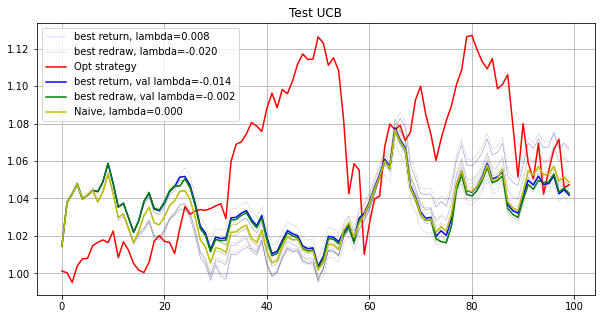

Phase 9
Validating...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
Opt strategy
[0.0024 0.0068 0.0108 0.0054 0.0081 0.0089 0.0066 0.0095 0.014  0.0079
 0.0104 0.0117 0.0025 0.0089 0.0116 0.0128 0.0139 0.0083 0.0231 0.0092
 0.0093 0.0087 0.0046 0.0052 0.0123 0.0103 0.0116 0.0056 0.0102 0.0119
 0.0111 0.0122 0.011  0.0116 0.0183 0.0093 0.0104 0.0028 0.0079 0.0076
 0.0114 0.0169 0.0104 0.0058 0.0138 0.0127 0.0161 0.0051 0.0102 0.009
 0.0076 0.0144 0.0103 0.0077 0.0046 0.0112 0.008  0.0096 0.0136 0.0064
 0.0112 0.0092 0.0129 0.0094 0.0107 0.0065 0.013  0.0037 0.0117 0.0075
 0.0101 0.0085 0.0213 0.0102 0.0091 0.0141 0.0098 0.0084 0.0069 0.0133
 0.0134 0.0142 0.01   0.0079 0.0117 0.0105 0.0096 0.0127 0.0073 0.0125
 0.0082 0.0088 0.0091 0.0098 0.01   0.0076 0.0072 0.0114 0.0109 0.0103]
0.2523080621532278
[-0.      0.0267  0.017   0.      0.0059  0.0152  0.0279  0.0102  0.0222
  0.0063  0.0139  0.      0.      0.0051 -0.      0.0387  0.0062  0.0056
 -0.      0.0083  0.0097  0.      0.0058  0.00

[-0.      0.0269  0.0171 -0.      0.0047  0.0152  0.0205  0.0117  0.0246
  0.0044  0.005   0.0004  0.0001  0.0029  0.001   0.0376  0.0072  0.0041
  0.0012  0.0073  0.0088  0.      0.004   0.0017  0.0239  0.015   0.0197
  0.0011  0.0117  0.0226  0.004  -0.      0.0132  0.0015  0.0381  0.0045
  0.0102  0.0052  0.0103  0.0205  0.002   0.0273  0.0049  0.0075  0.0173
  0.0278  0.0172 -0.      0.0131  0.0026  0.      0.0086  0.0134  0.0017
  0.      0.014   0.0035  0.0078  0.0233  0.0016  0.0187  0.0039  0.01
  0.0115  0.0045  0.0034 -0.      0.0004  0.0227  0.0102  0.0155  0.007
  0.0229  0.0133  0.      0.0279  0.0103  0.0016  0.0044  0.0121  0.0163
  0.0102  0.0172  0.0013  0.0141  0.0061  0.0061  0.0251  0.016   0.0207
  0.0102  0.0083  0.      0.0075  0.0014  0.0027  0.0036  0.0036  0.0209
  0.0072]
0.00012890055458218946
[-0.      0.0268  0.0171 -0.      0.0047  0.0152  0.0205  0.0117  0.0246
  0.0044  0.005   0.0004  0.0002  0.0029  0.001   0.0376  0.0072  0.0041
  0.0012  0.0073  0.0

[ 0.      0.0341  0.0185  0.0083  0.0015  0.0123  0.      0.0165  0.0297
  0.0039  0.01    0.0028  0.      0.0016  0.      0.0355  0.006   0.002
  0.      0.0029  0.0094  0.0034  0.     -0.      0.0373  0.0281  0.0203
 -0.      0.0127  0.0251  0.0044  0.0006  0.0018  0.      0.0146  0.0007
  0.0089  0.0084  0.0114  0.0162  0.      0.0302  0.0013  0.0014  0.0067
  0.0292  0.0156  0.      0.024   0.      0.0141  0.0056  0.0127  0.0048
  0.0007  0.0178  0.      0.0093  0.0262  0.0003  0.0216  0.0012  0.0086
  0.0038  0.0012  0.0033  0.0152  0.      0.0282  0.0135  0.0189  0.0026
  0.0165  0.0116  0.0035  0.0331  0.01    0.      0.0032  0.0096  0.0215
  0.0077  0.02    0.      0.0045  0.0065  0.007   0.0263  0.0182  0.0298
  0.0075  0.0062  0.0011  0.0013 -0.      0.0037  0.0061  0.0058  0.0209
  0.0112]
0.0004285972365513831
[ 0.      0.0341  0.0185  0.0083  0.0015  0.0123  0.      0.0165  0.0297
  0.0039  0.01    0.0028  0.      0.0016  0.      0.0355  0.006   0.002
 -0.      0.0029  0.0

[ 0.      0.0329  0.0202  0.     -0.      0.0069  0.      0.0174  0.0339
  0.      0.006  -0.     -0.     -0.     -0.      0.0278  0.0039  0.0002
  0.      0.      0.0051 -0.     -0.     -0.      0.0419  0.0291  0.0221
 -0.      0.0128  0.0292 -0.      0.0026  0.0014 -0.      0.0133  0.0007
  0.0081  0.023   0.0148  0.0114  0.      0.0334 -0.     -0.      0.0077
  0.0317  0.0162 -0.      0.0233 -0.      0.0126  0.0012  0.0118  0.0023
 -0.      0.0157  0.0023  0.008   0.0286 -0.      0.0237 -0.      0.0091
  0.      0.0028  0.0064  0.0218 -0.      0.0324  0.0052  0.0195 -0.
  0.0295  0.0114  0.0043  0.0366  0.0099  0.0017  0.0063  0.006   0.0231
  0.0076  0.0223 -0.      0.0025  0.0044  0.0019  0.0299  0.0228  0.0325
  0.0048  0.0056  0.0056  0.0016  0.0013  0.      0.012   0.0011  0.0209
  0.0142]
0.16531049159429384
[ 0.      0.0329  0.0202 -0.     -0.      0.0069  0.      0.0174  0.0339
  0.      0.006  -0.     -0.     -0.     -0.      0.0278  0.0039  0.0002
 -0.     -0.      0.0051 

[ 0.      0.0368  0.0204 -0.      0.      0.0075 -0.      0.0178  0.0354
  0.      0.0045  0.      0.0002  0.      0.      0.0224  0.0021 -0.
  0.0028  0.      0.005  -0.      0.      0.      0.043   0.0303  0.0221
  0.0005  0.0127  0.0296 -0.      0.0022  0.0031  0.      0.0138  0.0004
  0.0065  0.0218  0.0162  0.0099  0.      0.034   0.      0.      0.0067
  0.0316  0.0183  0.      0.0241 -0.      0.0112  0.0032  0.0118  0.
  0.0006  0.0152  0.0014  0.0082  0.0298  0.      0.0249  0.0004  0.0072
  0.0003  0.0031  0.0064  0.0177  0.      0.0335  0.007   0.0184  0.
  0.0291  0.0115  0.0042  0.0374  0.0096  0.0007  0.0063  0.007   0.0216
  0.0073  0.0232 -0.      0.004   0.003   0.0015  0.0309  0.0224  0.0327
  0.0033  0.0054  0.0063  0.0001  0.     -0.      0.0112  0.0012  0.0234
  0.0147]
0.00018676232983083038
[-0.      0.0487  0.0221 -0.      0.      0.0043 -0.      0.018   0.0393
 -0.      0.      0.      0.0015  0.0018  0.      0.0217  0.     -0.
  0.      0.      0.0034  0.      

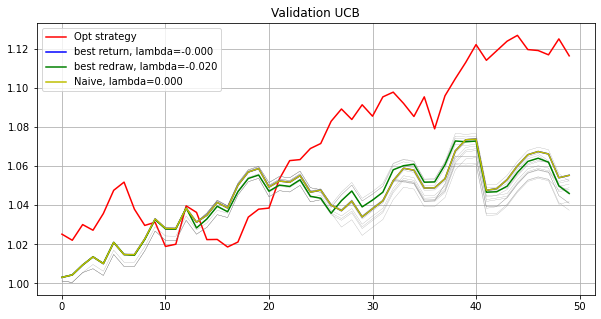

Testing...
./tmp2/res_phase09_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.09169513    Max redraw: 0.03340976
lambda: -0.018   Total log return: 0.09705971    Max redraw: 0.03340976
lambda: -0.016   Total log return: 0.08685545    Max redraw: 0.03340976
lambda: -0.014   Total log return: 0.09649924    Max redraw: 0.03340976
lambda: -0.012   Total log return: 0.09522997    Max redraw: 0.03340976
lambda: -0.010   Total log return: 0.10101991    Max redraw: 0.03267943
lambda: -0.008   Total log return: 0.10152567    Max redraw: 0.03267943
lambda: -0.006   Total log return: 0.10408528    Max redraw: 0.03267943
lambda: -0.004   Total log return: 0.10237535    Max redraw: 0.03267943
lambda: -0.002   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: -0.000   Total log return: 0.10357638    Max redraw: 0.03267943
lambda: 0.002   Total log return: 0.10785830    Max redraw: 0.03267943
lambda: 0.004   Total log return: 0.10442110    Max redraw: 0.0326794

[ 0.      0.0401  0.0192  0.0018  0.0027  0.0011  0.0153  0.03    0.026
  0.      0.0093  0.0001  0.      0.0038  0.      0.0062  0.0067 -0.
  0.0084  0.001   0.0004 -0.     -0.      0.      0.0333  0.0099  0.0023
  0.0133  0.0128  0.0252  0.0009  0.0151  0.0183  0.0006  0.0224  0.0098
  0.0109  0.0036  0.0129  0.0003 -0.      0.0143  0.0046  0.      0.0067
  0.0249  0.0106  0.      0.0147 -0.      0.      0.0012  0.0129  0.
  0.0061  0.007   0.0108  0.0052  0.016   0.0014  0.022   0.0077  0.0007
  0.01    0.0157  0.0025  0.0378  0.0005  0.0249  0.002   0.0059  0.0021
  0.0152  0.0014  0.      0.033   0.0099  0.0125  0.0209  0.001   0.0234
  0.0216  0.0197  0.      0.0012  0.0124  0.0145  0.0277  0.0286  0.0094
  0.0092  0.0157  0.0307  0.001  -0.      0.0056  0.011   0.0036  0.028
  0.0107]
0.00035229056582235094
[ 0.      0.0401  0.0192  0.0018  0.0027  0.0011  0.0153  0.03    0.026
  0.      0.0093  0.0001  0.      0.0038 -0.      0.0062  0.0067 -0.
  0.0084  0.0009  0.0004 -0.     

[-0.      0.0392  0.0198  0.002   0.0016 -0.      0.0046  0.0315  0.0282
 -0.      0.0093 -0.      0.      0.0011  0.      0.0093  0.0049 -0.
  0.0085  0.      0.0005  0.0006 -0.      0.      0.0341  0.0061  0.0021
  0.0123  0.0129  0.0264  0.0007  0.0139  0.0216  0.0008  0.0213  0.0084
  0.0111  0.0002  0.0153  0.0008  0.0001  0.0134  0.0031  0.      0.0044
  0.0271  0.0108 -0.      0.0161 -0.     -0.      0.0004  0.0135  0.002
  0.0076  0.0075  0.0155  0.0045  0.0163  0.0006  0.0224  0.0074  0.001
  0.0103  0.0176  0.0018  0.0407 -0.      0.0268  0.0022  0.0044  0.0014
  0.0127 -0.     -0.      0.0356  0.0097  0.0108  0.0218  0.      0.026
  0.0218  0.0196 -0.      0.0002  0.0111  0.0117  0.032   0.0302  0.0088
  0.0093  0.0183  0.0285  0.0003  0.0012  0.0038  0.0134  0.0029  0.03
  0.012 ]
0.00034703293193793323
[-0.      0.0392  0.0198  0.002   0.0016 -0.      0.0046  0.0315  0.0282
 -0.      0.0093 -0.      0.      0.0011  0.      0.0093  0.0049 -0.
  0.0085  0.      0.0005  0.000

[-0.      0.0371  0.022  -0.     -0.     -0.      0.      0.0261  0.0342
  0.      0.0126  0.     -0.      0.     -0.      0.0086  0.0066 -0.
  0.      0.      0.      0.     -0.     -0.      0.0425  0.0003  0.0012
  0.0113  0.0129  0.0288  0.      0.0077  0.0271  0.      0.0286  0.0057
  0.012   0.      0.0092  0.0011  0.0104  0.0202  0.      0.      0.
  0.0342  0.0033  0.      0.0205 -0.      0.     -0.      0.0147  0.
  0.0058  0.0099  0.006   0.0023  0.0177  0.      0.0268  0.0019  0.004
  0.0039  0.0261 -0.      0.0446 -0.      0.0295 -0.      0.0106  0.
  0.0096  0.0034 -0.      0.0388  0.0078  0.0044  0.026   0.0028  0.0202
  0.0195  0.0207 -0.      0.0046  0.006   0.008   0.0322  0.0281  0.008
  0.005   0.0241  0.0366 -0.     -0.      0.      0.0141  0.001   0.0313
  0.0197]
0.00016481160508406416
[-0.      0.0382  0.022   0.0002 -0.      0.     -0.      0.0262  0.0347
 -0.      0.0128  0.     -0.      0.      0.      0.0098  0.0062  0.
  0.      0.      0.0002  0.      0.    

[-0.      0.0349  0.023   0.0034  0.     -0.     -0.      0.0329  0.041
  0.      0.0072  0.0012 -0.      0.      0.      0.0179  0.001   0.
  0.     -0.      0.0159  0.0037 -0.      0.      0.0463 -0.     -0.
  0.0008  0.0124  0.0328  0.001   0.0045  0.032  -0.      0.0271  0.005
  0.0074 -0.      0.0074  0.      0.0003  0.0178  0.     -0.      0.
  0.0383  0.002   0.      0.0199 -0.      0.0018 -0.      0.0143  0.0062
 -0.      0.0068  0.0036  0.0052  0.019   0.      0.0342  0.     -0.
  0.      0.0189  0.0031  0.0268  0.0016  0.0355  0.      0.011  -0.
  0.0064  0.      0.0084  0.0479  0.0071  0.      0.0283  0.0066  0.0237
  0.0167  0.0233 -0.      0.0033  0.0005  0.0079  0.0363  0.0338  0.0075
  0.0001  0.0205  0.029   0.      0.     -0.      0.0155  0.      0.0348
  0.0175]
0.00013506837737256634
[-0.      0.0349  0.023   0.0034  0.      0.      0.      0.0329  0.041
 -0.      0.0072  0.0012  0.      0.      0.      0.0179  0.001   0.
  0.     -0.      0.0159  0.0037  0.      0. 

[-0.      0.0349  0.023   0.0033  0.     -0.      0.      0.0329  0.041
  0.      0.0072  0.0012  0.      0.      0.      0.0179  0.001   0.
  0.      0.      0.0159  0.0037 -0.      0.      0.0463  0.      0.
  0.0008  0.0124  0.0328  0.001   0.0045  0.032  -0.      0.0271  0.005
  0.0074  0.      0.0074  0.      0.0003  0.0178  0.     -0.      0.
  0.0383  0.002  -0.      0.0199  0.      0.0018  0.      0.0143  0.0061
  0.      0.0068  0.0036  0.0052  0.0191  0.      0.0342  0.0001  0.
  0.      0.0188  0.0031  0.0268  0.0016  0.0354  0.      0.011  -0.
  0.0064 -0.      0.0084  0.0478  0.0071  0.      0.0283  0.0066  0.0237
  0.0167  0.0233  0.      0.0033  0.0005  0.0079  0.0363  0.0338  0.0075
  0.0001  0.0205  0.0289  0.      0.0001 -0.      0.0155  0.      0.0348
  0.0175]
3.191523515173747e-05
[-0.      0.0349  0.023   0.0033  0.     -0.      0.      0.0329  0.041
 -0.      0.0072  0.0012 -0.      0.      0.      0.0179  0.001  -0.
 -0.     -0.      0.0159  0.0037 -0.     -0.  

[-0.      0.0328  0.0235  0.0002  0.     -0.      0.0075  0.0318  0.0431
 -0.      0.0056 -0.     -0.      0.0004  0.0016  0.0087  0.      0.0005
  0.0008 -0.      0.0219  0.      0.      0.      0.0469  0.     -0.
  0.004   0.0118  0.0335  0.      0.002   0.0348 -0.      0.024   0.0046
  0.0055 -0.      0.0028  0.      0.      0.0256  0.      0.0004  0.
  0.0396  0.0019 -0.      0.0194  0.      0.0001 -0.      0.0137  0.0038
  0.0015  0.0045  0.0032  0.0049  0.0192  0.      0.0372  0.0015  0.
 -0.      0.0174  0.0081  0.0194  0.0053  0.0377 -0.      0.0071 -0.
  0.011  -0.      0.01    0.0499  0.0075  0.0007  0.0288  0.0052  0.0278
  0.0203  0.023   0.      0.0047 -0.      0.0023  0.0395  0.0353  0.0062
 -0.      0.0211  0.0253 -0.      0.0008 -0.      0.0114  0.      0.0352
  0.0143]
7.981018594494661e-05
[ 0.      0.0328  0.0235  0.0001 -0.     -0.      0.0075  0.0318  0.0431
 -0.      0.0056 -0.     -0.      0.0004  0.0016  0.0087 -0.      0.0005
  0.0008 -0.      0.0219  0.     -0

[ 0.      0.0337  0.024   0.0003 -0.      0.0003  0.0087  0.0319  0.0443
 -0.      0.0042 -0.     -0.     -0.      0.0004  0.0082  0.0001  0.
  0.001  -0.      0.0207  0.     -0.     -0.      0.0476  0.0003 -0.
  0.0046  0.0117  0.0343 -0.      0.0017  0.0358  0.      0.0263  0.0044
  0.0065 -0.      0.0007  0.0002  0.      0.0269  0.      0.0015 -0.
  0.0408  0.0032  0.      0.0191  0.     -0.     -0.      0.014   0.0013
 -0.      0.0042  0.0021  0.0046  0.0204  0.      0.0391  0.0016 -0.
  0.      0.0164  0.0085  0.0171  0.0025  0.0388  0.0002  0.0072 -0.
  0.0104 -0.      0.0081  0.051   0.0076  0.0007  0.0286  0.0044  0.0263
  0.0183  0.0236  0.      0.0029  0.0001  0.0027  0.0397  0.0356  0.0067
  0.      0.0212  0.0272  0.      0.0002  0.      0.0133 -0.      0.0353
  0.0152]
0.00014764985298708144
[ 0.      0.0337  0.024   0.0003 -0.      0.0003  0.0087  0.0319  0.0443
 -0.      0.0042 -0.     -0.     -0.      0.0003  0.0082  0.0001 -0.
  0.001  -0.      0.0207 -0.     -0.     -

[-0.      0.0331  0.0244  0.      0.      0.0006  0.0026  0.0338  0.0462
 -0.      0.0016  0.     -0.      0.      0.      0.0078  0.     -0.
 -0.      0.0006  0.0185  0.      0.     -0.      0.05    0.      0.0017
  0.0048  0.0118  0.0342  0.      0.0007  0.035   0.      0.0276  0.0045
  0.0075 -0.      0.0018 -0.      0.      0.0285 -0.      0.0012 -0.
  0.0393  0.0044 -0.      0.0184 -0.     -0.      0.      0.0139 -0.
  0.      0.0042  0.0032  0.0041  0.0194 -0.      0.041   0.0001 -0.
  0.0012  0.0165  0.0092  0.0146  0.0058  0.0391  0.0011  0.0079 -0.
  0.0104 -0.      0.0084  0.051   0.0076 -0.      0.0277  0.0029  0.0267
  0.0181  0.0245 -0.      0.0018  0.      0.0003  0.0408  0.0361  0.0065
  0.002   0.0218  0.0282  0.0002  0.     -0.      0.0102 -0.      0.0369
  0.0155]
0.00037301815663582744
[-0.      0.0331  0.0244  0.      0.      0.0006  0.0026  0.0338  0.0462
 -0.      0.0016 -0.     -0.      0.      0.      0.0078  0.     -0.
 -0.      0.0006  0.0185  0.      0.     -

[-0.      0.0331  0.0244 -0.      0.      0.0006  0.0026  0.0338  0.0462
  0.      0.0016 -0.     -0.      0.     -0.      0.0078 -0.     -0.
 -0.      0.0007  0.0185 -0.     -0.     -0.      0.05   -0.      0.0017
  0.0048  0.0118  0.0342 -0.      0.0007  0.035  -0.      0.0276  0.0045
  0.0075 -0.      0.0018  0.     -0.      0.0285 -0.      0.0012  0.
  0.0393  0.0044 -0.      0.0184 -0.     -0.      0.      0.0139 -0.
 -0.      0.0042  0.0032  0.0041  0.0194 -0.      0.041   0.0001 -0.
  0.0012  0.0166  0.0092  0.0146  0.0058  0.0391  0.0011  0.0079  0.
  0.0104  0.      0.0084  0.051   0.0075  0.      0.0277  0.0029  0.0267
  0.0181  0.0244 -0.      0.0018 -0.      0.0004  0.0408  0.0361  0.0065
  0.002   0.0218  0.0282  0.0002 -0.     -0.      0.0102 -0.      0.0369
  0.0155]
0.00012651175372252796
[-0.      0.0331  0.0244 -0.     -0.      0.0006  0.0026  0.0338  0.0462
 -0.      0.0016 -0.     -0.     -0.      0.      0.0078  0.     -0.
 -0.      0.0007  0.0185 -0.     -0.     -

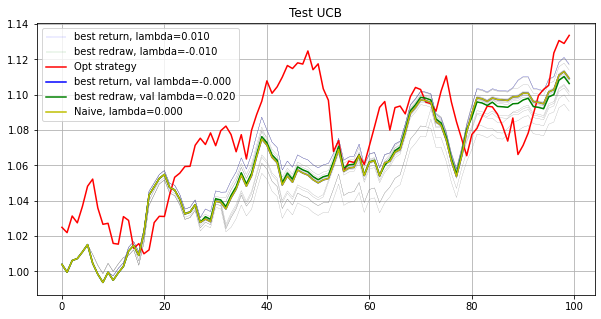

Phase 10
Validating...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
Opt strategy
[0.0054 0.0108 0.0153 0.0105 0.0068 0.0092 0.008  0.01   0.0087 0.0102
 0.0109 0.0091 0.0093 0.0097 0.0027 0.0136 0.0083 0.0105 0.0089 0.0088
 0.0138 0.0096 0.011  0.0096 0.0118 0.0135 0.0117 0.011  0.0095 0.0109
 0.0099 0.0097 0.0081 0.0076 0.0109 0.0087 0.0096 0.0087 0.0106 0.0104
 0.0095 0.0071 0.0115 0.01   0.0066 0.0093 0.0137 0.0067 0.0022 0.0091
 0.01   0.0182 0.0095 0.0114 0.0118 0.0107 0.0074 0.0117 0.0122 0.0116
 0.0122 0.0097 0.0087 0.0113 0.01   0.0091 0.009  0.008  0.008  0.0054
 0.0074 0.0106 0.0092 0.0149 0.0128 0.0074 0.0126 0.0097 0.0163 0.0073
 0.0089 0.0125 0.0132 0.0109 0.0064 0.0095 0.0103 0.0089 0.0095 0.0106
 0.015  0.0111 0.01   0.0088 0.0073 0.0128 0.0098 0.0105 0.0111 0.01  ]
0.17750061823494967
[ 0.0003  0.0112  0.0126  0.0102  0.0065  0.0076  0.0069  0.0098  0.008
  0.0104  0.0118  0.0106  0.0115  0.0111 -0.      0.0163  0.0096  0.011
  0.0084  0.0083  0.0126  0.008   0.0084  0.0

[ 0.      0.0134  0.015   0.0092  0.0043  0.0102  0.0058  0.0098  0.0067
  0.0107  0.0124  0.0098  0.0125  0.005   0.0074  0.0175  0.0073  0.0113
  0.0098  0.0091  0.0076  0.013   0.0081  0.0077  0.0122  0.0139  0.0107
  0.0128  0.0055  0.0143  0.0081  0.0084  0.01    0.0018  0.0133  0.0017
  0.0071  0.0062  0.0141  0.0125  0.0084  0.0019  0.0134  0.0116  0.0017
  0.0106  0.0261  0.0065  0.      0.0161  0.0103  0.02    0.0075  0.0113
  0.0047  0.0104  0.0028  0.018   0.0191  0.0107  0.0153  0.0157  0.0039
  0.0065  0.0094  0.0041  0.0052 -0.      0.0044 -0.      0.0014  0.0169
  0.0075  0.0245  0.0166  0.0124  0.0215  0.0093  0.018   0.0047  0.0076
  0.015   0.0189  0.0134  0.0018  0.0125  0.0099  0.0106  0.0088  0.0137
  0.0079  0.0144  0.0086  0.0121  0.0039  0.0124  0.0046  0.0124  0.0131
  0.0138]
0.1876140563237109
[0.     0.0136 0.0157 0.0091 0.0043 0.01   0.0052 0.0098 0.0066 0.0107
 0.0125 0.0096 0.013  0.0063 0.0053 0.0178 0.0074 0.0114 0.0099 0.0089
 0.0089 0.0124 0.0078 0.00

[ 0.      0.0156  0.0199  0.0092  0.      0.0071  0.0024  0.0077  0.0044
  0.0109  0.0112  0.0076  0.0124  0.0027  0.0082  0.0221  0.0037  0.0118
  0.0042  0.008   0.0081  0.0151  0.0064  0.005   0.0108  0.0219  0.0125
  0.0156  0.0032  0.0194  0.0035  0.009   0.007   0.0019  0.0137  0.0023
  0.005   0.0052  0.0185  0.0205  0.0068 -0.      0.0029  0.0126 -0.
  0.0121  0.0264  0.0009  0.0041  0.0139  0.0108  0.0228  0.005   0.0101
  0.0035  0.0144  0.0074  0.02    0.0246  0.0211  0.0138  0.0153 -0.
  0.0169  0.0118  0.002  -0.     -0.      0.0028  0.      0.002   0.0239
  0.0057  0.0289  0.0169  0.0101  0.0152  0.0094  0.0154  0.0052  0.008
  0.0109  0.0225  0.018   0.0026  0.0079  0.0099  0.0074  0.0074  0.0202
  0.0078  0.0175  0.      0.0081  0.0045  0.0087  0.0045  0.0191  0.0135
  0.0132]
9.7895919150001e-05
[-0.      0.0156  0.0199  0.0092  0.      0.0071  0.0024  0.0077  0.0044
  0.0109  0.0111  0.0076  0.0124  0.0027  0.0082  0.0221  0.0037  0.0118
  0.0042  0.008   0.0081  0.01

[-0.      0.0156  0.0201  0.0091  0.      0.0071  0.0027  0.0077  0.0042
  0.0109  0.0109  0.0075  0.0128  0.0032  0.0083  0.0222  0.0035  0.0118
  0.0042  0.0079  0.0086  0.0154  0.0063  0.0048  0.0107  0.0222  0.0126
  0.0156  0.003   0.0195  0.0035  0.0087  0.007   0.0016  0.0138  0.0027
  0.0051  0.005   0.0186  0.0204  0.0067  0.      0.003   0.0126  0.
  0.0121  0.0259  0.0003  0.0041  0.0136  0.0108  0.0228  0.0048  0.0101
  0.0035  0.0142  0.0069  0.0202  0.0248  0.0208  0.0139  0.0158  0.
  0.0171  0.012   0.0019  0.     -0.      0.0029  0.0001  0.0021  0.024
  0.0056  0.0298  0.0172  0.01    0.0149  0.0097  0.0155  0.006   0.0066
  0.0107  0.0227  0.0181  0.0022  0.0078  0.0097  0.0074  0.0072  0.0203
  0.0078  0.0176  0.0003  0.0078  0.0044  0.0084  0.0044  0.019   0.0136
  0.0134]
0.00032410912736858426
[-0.      0.0169  0.0197  0.0092  0.      0.0069  0.0022  0.0076  0.0032
  0.0108  0.0108  0.0087  0.0126  0.003   0.0012  0.0244  0.0021  0.0119
  0.0044  0.0075  0.008   0

[-0.      0.0169  0.0197  0.0092  0.      0.0069  0.0022  0.0076  0.0032
  0.0107  0.0108  0.0087  0.0126  0.003   0.0012  0.0244  0.0021  0.0119
  0.0044  0.0075  0.008   0.014   0.0036  0.0039  0.0096  0.0246  0.0148
  0.0165  0.002   0.0203  0.0049  0.0105  0.0057 -0.      0.0163  0.0009
  0.0028  0.0044  0.0192  0.0221  0.0063 -0.      0.002   0.0132 -0.
  0.0126  0.0266  0.0002  0.003   0.0181  0.0116  0.0222  0.0037  0.0088
  0.0036  0.0146  0.0067  0.0189  0.0271  0.0217  0.0132  0.0155  0.
  0.0195  0.0101  0.0008 -0.      0.      0.0032  0.      0.0042  0.0225
  0.0044  0.0299  0.0174  0.0104  0.0142  0.0093  0.0129  0.0036  0.0065
  0.0097  0.0241  0.0198  0.002   0.0067  0.009   0.0092  0.0062  0.0223
  0.0097  0.0187  0.0036  0.0069  0.0048  0.0098  0.0027  0.019   0.0152
  0.0151]
1.5278607007107103e-05
[-0.      0.0169  0.0197  0.0092  0.      0.0069  0.0022  0.0076  0.0032
  0.0107  0.0108  0.0087  0.0126  0.003   0.0012  0.0244  0.0021  0.0119
  0.0045  0.0075  0.008   

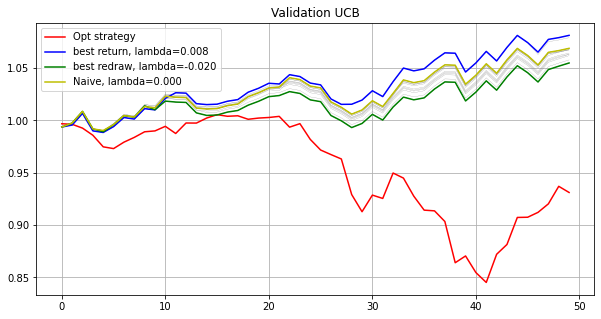

Testing...
./tmp2/res_phase10_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.08116028    Max redraw: 0.04229200
lambda: -0.018   Total log return: 0.08348685    Max redraw: 0.04229200
lambda: -0.016   Total log return: 0.06238050    Max redraw: 0.04229200
lambda: -0.014   Total log return: 0.06048604    Max redraw: 0.04229200
lambda: -0.012   Total log return: 0.06024048    Max redraw: 0.04229200
lambda: -0.010   Total log return: 0.05893089    Max redraw: 0.04229200
lambda: -0.008   Total log return: 0.07108065    Max redraw: 0.04229200
lambda: -0.006   Total log return: 0.07304868    Max redraw: 0.04229200
lambda: -0.004   Total log return: 0.07828324    Max redraw: 0.04229200
lambda: -0.002   Total log return: 0.08972199    Max redraw: 0.04229200
lambda: -0.000   Total log return: 0.09715899    Max redraw: 0.04229200
lambda: 0.002   Total log return: 0.09687345    Max redraw: 0.04229200
lambda: 0.004   Total log return: 0.10057098    Max redraw: 0.0422920

[0.     0.0141 0.0069 0.0111 0.0063 0.0091 0.0027 0.0104 0.008  0.0107
 0.0117 0.0197 0.0051 0.0068 0.0024 0.0262 0.0063 0.0107 0.0083 0.0084
 0.0057 0.0149 0.0092 0.0082 0.0128 0.0165 0.0111 0.0134 0.0072 0.0167
 0.0079 0.0119 0.0183 0.0032 0.006  0.009  0.0102 0.0104 0.0139 0.0095
 0.0089 0.0013 0.0089 0.0123 0.003  0.0207 0.0161 0.0004 0.0039 0.0109
 0.0114 0.0215 0.0072 0.0076 0.0122 0.0198 0.     0.0169 0.0152 0.0014
 0.016  0.0116 0.0029 0.0149 0.0071 0.0094 0.0036 0.0129 0.0099 0.0016
 0.0068 0.0147 0.0082 0.0214 0.0069 0.004  0.007  0.0109 0.0036 0.0039
 0.0093 0.0067 0.0175 0.0138 0.007  0.0045 0.0108 0.0112 0.01   0.0203
 0.0168 0.0138 0.0131 0.0105 0.0071 0.0108 0.0073 0.0106 0.0102 0.0113]
0.034621252158354994
[0.     0.0141 0.0069 0.0111 0.0063 0.0091 0.0027 0.0104 0.008  0.0107
 0.0117 0.0197 0.0051 0.0068 0.0024 0.0262 0.0063 0.0107 0.0083 0.0084
 0.0057 0.0149 0.0092 0.0082 0.0128 0.0165 0.0111 0.0134 0.0072 0.0167
 0.0079 0.0119 0.0183 0.0032 0.006  0.009  0.0102 0.010

[-0.      0.0142  0.0109  0.0113  0.0016  0.0089  0.0008  0.0101  0.0064
  0.011   0.0111  0.0193  0.0061  0.0122  0.0011  0.0296  0.0042  0.0113
  0.007   0.0086  0.0047  0.0185  0.0067  0.0083  0.0114  0.0197  0.0117
  0.0143  0.0056  0.0193  0.0069  0.0101  0.0176  0.0009  0.011   0.0049
  0.0072  0.0087  0.0157  0.0138  0.008   0.      0.0085  0.0129  0.0031
  0.0214  0.0194  0.0004  0.005   0.0105  0.012   0.0226  0.0051  0.0097
  0.0085  0.0179  0.0004  0.0183  0.0178 -0.      0.0175  0.0151 -0.
  0.015   0.007   0.0077  0.002   0.0051  0.0069  0.      0.0085  0.0154
  0.0069  0.0257  0.0066 -0.      0.0068  0.0106  0.0026  0.0059  0.011
  0.0046  0.0206  0.0162  0.0057  0.0024  0.0132  0.0091  0.0082  0.0244
  0.0204  0.016   0.0137  0.0093  0.0056  0.0099  0.0065  0.0135  0.0078
  0.0126]
3.909430711595221e-05
[-0.      0.0141  0.0109  0.0114  0.0016  0.0089  0.0008  0.0101  0.0064
  0.011   0.0111  0.0193  0.0061  0.0123  0.0011  0.0296  0.0042  0.0113
  0.007   0.0086  0.0047

[-0.      0.0142  0.0109  0.0114  0.0016  0.0089  0.0008  0.0101  0.0064
  0.011   0.0111  0.0193  0.0061  0.0123  0.0011  0.0296  0.0041  0.0112
  0.007   0.0086  0.0047  0.0185  0.0067  0.0083  0.0114  0.0197  0.0116
  0.0143  0.0056  0.0193  0.0068  0.0101  0.0176  0.0009  0.011   0.0049
  0.0072  0.0087  0.0157  0.0138  0.008  -0.      0.0085  0.0129  0.0031
  0.0214  0.0194  0.0004  0.005   0.0105  0.012   0.0226  0.0051  0.0097
  0.0085  0.0179  0.0004  0.0183  0.0178 -0.      0.0175  0.0151 -0.
  0.015   0.007   0.0077  0.002   0.0051  0.0069  0.      0.0085  0.0154
  0.0069  0.0257  0.0066  0.      0.0068  0.0106  0.0026  0.0059  0.011
  0.0046  0.0206  0.0162  0.0057  0.0024  0.0132  0.0091  0.0082  0.0244
  0.0204  0.016   0.0137  0.0093  0.0056  0.0099  0.0065  0.0135  0.0078
  0.0126]
2.147921836606632e-05
[-0.      0.0142  0.0109  0.0114  0.0016  0.0089  0.0008  0.0101  0.0064
  0.011   0.0111  0.0193  0.0061  0.0123  0.0011  0.0296  0.0041  0.0112
  0.007   0.0086  0.0047

[ 0.      0.0141  0.0109  0.0114  0.0016  0.0089  0.0008  0.0101  0.0064
  0.011   0.0111  0.0193  0.0061  0.0123  0.0011  0.0296  0.0041  0.0112
  0.007   0.0086  0.0047  0.0185  0.0067  0.0083  0.0114  0.0197  0.0116
  0.0143  0.0056  0.0193  0.0068  0.0101  0.0176  0.0009  0.011   0.0049
  0.0072  0.0087  0.0157  0.0138  0.008   0.      0.0085  0.0129  0.0031
  0.0214  0.0194  0.0004  0.005   0.0105  0.012   0.0226  0.0051  0.0097
  0.0085  0.0179  0.0004  0.0183  0.0178  0.      0.0175  0.0151 -0.
  0.015   0.007   0.0077  0.002   0.0051  0.0069  0.0001  0.0085  0.0154
  0.0069  0.0257  0.0066 -0.      0.0068  0.0106  0.0026  0.0059  0.011
  0.0046  0.0206  0.0162  0.0057  0.0024  0.0132  0.0091  0.0082  0.0244
  0.0204  0.016   0.0137  0.0093  0.0056  0.0099  0.0065  0.0135  0.0078
  0.0126]
1.0866849719761976e-05
[ 0.      0.0141  0.0109  0.0114  0.0016  0.0089  0.0008  0.0101  0.0064
  0.011   0.0111  0.0193  0.0061  0.0123  0.0011  0.0296  0.0041  0.0112
  0.007   0.0086  0.004

[0.     0.0153 0.0144 0.0094 0.0095 0.0078 0.0024 0.0094 0.0056 0.0099
 0.0086 0.0179 0.0051 0.0103 0.     0.0306 0.004  0.0107 0.0025 0.0069
 0.0071 0.0136 0.0045 0.0072 0.0103 0.0204 0.0117 0.0154 0.0046 0.0208
 0.0039 0.009  0.0166 0.003  0.0137 0.0033 0.0049 0.0059 0.017  0.0142
 0.0075 0.0004 0.0085 0.0129 0.0019 0.0198 0.0186 0.0077 0.0011 0.009
 0.0118 0.0301 0.0036 0.0123 0.006  0.0187 0.     0.0179 0.0161 0.0012
 0.015  0.0169 0.     0.0165 0.0081 0.0066 0.0003 0.0009 0.0058 0.0172
 0.0065 0.0231 0.0063 0.0228 0.0071 0.     0.0058 0.0115 0.0025 0.013
 0.0113 0.0054 0.021  0.018  0.0056 0.0024 0.0132 0.0074 0.0064 0.0242
 0.0177 0.0178 0.0116 0.0075 0.0032 0.0082 0.009  0.0152 0.0038 0.0122]
5.623424248523752e-05
[0.     0.0153 0.0144 0.0094 0.0095 0.0078 0.0024 0.0094 0.0056 0.0099
 0.0086 0.0179 0.0051 0.0103 0.     0.0306 0.004  0.0107 0.0025 0.0069
 0.0071 0.0136 0.0045 0.0072 0.0103 0.0204 0.0117 0.0154 0.0046 0.0208
 0.0039 0.009  0.0165 0.003  0.0137 0.0033 0.0049 0.0059

[ 0.      0.0153  0.0144  0.0095  0.0094  0.0078  0.0024  0.0094  0.0056
  0.0099  0.0086  0.018   0.0051  0.0103  0.      0.0305  0.004   0.0107
  0.0025  0.0069  0.0071  0.0136  0.0045  0.0072  0.0103  0.0204  0.0117
  0.0155  0.0046  0.0208  0.0039  0.0089  0.0166  0.003   0.0137  0.0033
  0.0049  0.0059  0.0169  0.0142  0.0075  0.0004  0.0085  0.0129  0.0019
  0.0198  0.0186  0.0077  0.0011  0.009   0.0118  0.0301  0.0036  0.0123
  0.006   0.0187  0.      0.0179  0.0161  0.0012  0.015   0.0169 -0.
  0.0165  0.0081  0.0066  0.0003  0.0009  0.0058  0.0172  0.0065  0.0231
  0.0063  0.0228  0.0071  0.      0.0058  0.0115  0.0025  0.013   0.0113
  0.0054  0.021   0.018   0.0056  0.0024  0.0132  0.0074  0.0064  0.0242
  0.0177  0.0178  0.0117  0.0075  0.0032  0.0082  0.009   0.0152  0.0039
  0.0122]
0.00011016463479526557
[ 0.      0.0153  0.0144  0.0095  0.0094  0.0078  0.0024  0.0094  0.0056
  0.0099  0.0086  0.018   0.0051  0.0103 -0.      0.0305  0.004   0.0107
  0.0025  0.0069  0.00

[-0.      0.0155  0.0144  0.0092  0.0086  0.0075  0.0017  0.0093  0.0053
  0.0101  0.0083  0.0178  0.0054  0.0098  0.      0.0305  0.0036  0.0108
  0.0024  0.0065  0.0089  0.0131  0.0042  0.0067  0.0099  0.022   0.012
  0.0156  0.0045  0.0214  0.0034  0.0086  0.0157  0.0023  0.0141  0.0032
  0.0043  0.0049  0.0172  0.0134  0.0074  0.0009  0.0073  0.0132  0.0013
  0.0225  0.0198  0.0089  0.0004  0.0094  0.0119  0.0307  0.0035  0.0113
  0.0062  0.018  -0.      0.0183  0.016   0.0006  0.0151  0.0167 -0.
  0.0168  0.0081  0.0064  0.      0.0005  0.0057  0.0177  0.0064  0.0233
  0.0062  0.024   0.0069  0.      0.0042  0.0121  0.0014  0.0136  0.0113
  0.0062  0.0213  0.0182  0.0051  0.0023  0.0136  0.0078  0.0062  0.0248
  0.0179  0.0181  0.0142  0.0072  0.0028  0.008   0.0087  0.0153  0.0038
  0.012 ]
5.345080143113353e-06
[ 0.      0.0155  0.0144  0.0092  0.0086  0.0075  0.0017  0.0093  0.0053
  0.0101  0.0083  0.0178  0.0054  0.0098  0.      0.0305  0.0036  0.0108
  0.0024  0.0065  0.0089

[ 0.0004  0.0155  0.0149  0.0089  0.0086  0.0077 -0.      0.0093  0.0052
  0.0101  0.0078  0.0183  0.0052  0.0112  0.      0.0303  0.0038  0.0106
  0.0024  0.0067  0.0121  0.013   0.004   0.0064  0.0097  0.0218  0.0125
  0.0159  0.0042  0.0216  0.0032  0.0082  0.0163  0.0019  0.0145  0.003
  0.0046  0.0049  0.0173  0.0134  0.0073  0.0008  0.0064  0.0133  0.0013
  0.023   0.0192  0.0089 -0.      0.0091  0.0116  0.0308  0.0035  0.0114
  0.0062  0.0171  0.0001  0.0183  0.0161  0.0004  0.0148  0.0175  0.
  0.0176  0.0078  0.0063 -0.      0.0003  0.0058  0.0158  0.0063  0.0243
  0.0061  0.0241  0.0072  0.0001  0.0036  0.0118  0.0022  0.0138  0.012
  0.0067  0.0215  0.0185  0.0051  0.0026  0.0135  0.0075  0.0061  0.025
  0.0174  0.0183  0.0145  0.0069  0.0027  0.0078  0.0077  0.0153  0.0033
  0.0119]
3.513540506464985e-05
[ 0.0004  0.0155  0.0149  0.0089  0.0086  0.0077  0.      0.0093  0.0052
  0.0101  0.0078  0.0183  0.0052  0.0112  0.      0.0303  0.0038  0.0106
  0.0024  0.0067  0.0121  

[ 0.0008  0.0157  0.0157  0.0089  0.0081  0.0075 -0.      0.0091  0.0049
  0.0101  0.0077  0.018   0.004   0.01   -0.      0.0307  0.0034  0.0108
  0.0019  0.0064  0.0157  0.0123  0.0035  0.0065  0.0095  0.0232  0.0132
  0.0161  0.0039  0.0221  0.0027  0.0087  0.0158  0.0013  0.0148  0.0027
  0.0046  0.0054  0.0176  0.0138  0.0072  0.0008  0.0072  0.0135  0.0011
  0.023   0.0193  0.0088  0.0003  0.0086  0.0111  0.0305  0.0034  0.0115
  0.0059  0.0177  0.      0.0178  0.0157  0.0012  0.0137  0.0183 -0.
  0.0179  0.0088  0.0058  0.      0.0001  0.0053  0.0134  0.0062  0.0247
  0.0059  0.0245  0.0071 -0.      0.0043  0.0118  0.0025  0.0149  0.0121
  0.0063  0.0218  0.019   0.0041  0.0017  0.0143  0.008   0.0059  0.0249
  0.0184  0.0189  0.0129  0.0067  0.0021  0.0082  0.0063  0.0165  0.0035
  0.0115]
0.00016275237163921246
[ 0.0008  0.0157  0.0157  0.0089  0.0081  0.0075  0.      0.0091  0.0049
  0.0101  0.0077  0.018   0.004   0.01    0.      0.0307  0.0034  0.0108
  0.0019  0.0064  0.01

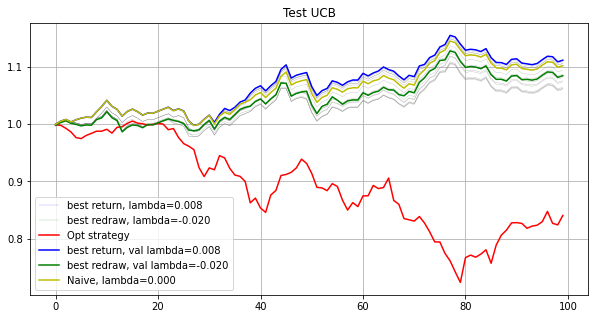

Phase 11
Validating...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
Opt strategy
[0.019  0.0093 0.0114 0.003  0.0086 0.0121 0.0096 0.0106 0.0094 0.0091
 0.008  0.0154 0.0095 0.0106 0.0058 0.0093 0.0107 0.0054 0.0128 0.0088
 0.0117 0.0133 0.008  0.0162 0.0083 0.0125 0.0149 0.0099 0.0121 0.0102
 0.0099 0.0058 0.0084 0.0118 0.0157 0.0127 0.0053 0.0097 0.0094 0.0098
 0.0096 0.0084 0.0059 0.0095 0.0098 0.0062 0.0116 0.0138 0.0078 0.0078
 0.0171 0.009  0.0093 0.0103 0.0054 0.011  0.0102 0.0125 0.0115 0.0048
 0.0073 0.012  0.0092 0.0143 0.0057 0.0151 0.0098 0.0115 0.0102 0.0125
 0.0054 0.0113 0.0089 0.0064 0.0069 0.0099 0.0108 0.0075 0.0146 0.0097
 0.0077 0.0131 0.0064 0.0098 0.0089 0.0071 0.0046 0.0117 0.0085 0.0073
 0.0096 0.0087 0.0087 0.0089 0.0105 0.0206 0.0098 0.0121 0.0088 0.0129]
0.2294260027117352
[0.019  0.0093 0.0114 0.003  0.0086 0.0121 0.0096 0.0106 0.0094 0.0091
 0.008  0.0154 0.0095 0.0106 0.0058 0.0093 0.0107 0.0054 0.0128 0.0088
 0.0117 0.0133 0.008  0.0162 0.0083 0.0125 0.014

[ 0.0142  0.0052  0.0134  0.      0.0066  0.0175  0.0089  0.0119  0.0085
  0.0073  0.0037  0.0099  0.0081  0.0083  0.0058  0.0083  0.0083  0.0003
  0.0155  0.0042  0.0147  0.0133  0.0078  0.02    0.0062  0.0136  0.0147
  0.0119  0.0147  0.0088  0.0088  0.0028  0.0092  0.0094  0.0226  0.0157
  0.0079  0.0071  0.0095  0.0084  0.0101  0.0087  0.0061  0.0083  0.012
  0.0028  0.0136  0.016   0.0051  0.0122  0.0222  0.007   0.0075  0.0135
  0.0185  0.0092  0.0095  0.0135  0.0126  0.0033  0.0055  0.0263  0.0117
  0.0129  0.0056  0.0204  0.0104  0.0117  0.0116  0.011   0.0032  0.0141
  0.0056  0.0057  0.0085  0.0099  0.0107 -0.      0.0134  0.0126  0.0055
  0.0088  0.0043  0.0086  0.0099  0.0071  0.0045  0.0109  0.0049  0.0076
  0.0099  0.0075  0.0106  0.0112  0.01    0.015   0.0112  0.0114  0.0109
  0.0145]
2.901433841990768e-05
[ 0.0142  0.0052  0.0134  0.      0.0066  0.0175  0.0089  0.0119  0.0085
  0.0073  0.0037  0.0099  0.0081  0.0083  0.0058  0.0083  0.0083  0.0003
  0.0155  0.0042  0.

[ 0.0164  0.0023  0.0148 -0.      0.0042  0.0167  0.0047  0.0116  0.0074
  0.0056  0.0011  0.0072  0.0066  0.0058  0.0055  0.0056  0.0131 -0.
  0.0149  0.0031  0.0181  0.0105  0.008   0.0256  0.004   0.0103  0.0176
  0.0127  0.0181  0.0074  0.0077  0.0022  0.0049  0.0095  0.0258  0.0216
  0.0039  0.0082  0.0077  0.0053  0.012   0.0088  0.0039  0.0049  0.0093
  0.0052  0.0196  0.0159  0.0022  0.0158  0.0285  0.0058  0.0044  0.0137
  0.0215  0.0089  0.0073  0.0135  0.0125  0.      0.0033  0.0373  0.0118
  0.012   0.0062  0.0258  0.0103  0.0099  0.0136  0.01    0.0046  0.0134
  0.0069  0.0033  0.0085  0.0093  0.0067 -0.      0.0127  0.0139  0.0133
  0.0072  0.0083  0.0076  0.0174  0.0031  0.0045  0.0101  0.0047  0.0092
  0.0098  0.0059  0.0102  0.0147  0.0097  0.0184  0.0025  0.0091  0.0113
  0.0136]
0.13042268121900946
[ 0.0164  0.0023  0.0148  0.      0.0042  0.0167  0.0047  0.0116  0.0074
  0.0056  0.0011  0.0072  0.0066  0.0058  0.0055  0.0056  0.0131  0.
  0.0149  0.0031  0.0181  0.0

[ 0.0165  0.0023  0.0148 -0.      0.0042  0.0167  0.0047  0.0116  0.0074
  0.0056  0.0011  0.0072  0.0066  0.0058  0.0055  0.0056  0.0131  0.
  0.0149  0.0031  0.0181  0.0105  0.008   0.0256  0.004   0.0103  0.0176
  0.0127  0.0181  0.0074  0.0077  0.0022  0.0049  0.0095  0.0258  0.0216
  0.0039  0.0082  0.0077  0.0053  0.012   0.0088  0.0039  0.0049  0.0093
  0.0052  0.0196  0.0159  0.0022  0.0158  0.0285  0.0058  0.0044  0.0137
  0.0215  0.0089  0.0073  0.0134  0.0125  0.      0.0033  0.0373  0.0118
  0.012   0.0062  0.0258  0.0103  0.0099  0.0136  0.01    0.0046  0.0134
  0.0069  0.0033  0.0085  0.0093  0.0068  0.      0.0127  0.0139  0.0133
  0.0072  0.0083  0.0076  0.0174  0.0031  0.0045  0.0101  0.0047  0.0092
  0.0098  0.0059  0.0102  0.0147  0.0097  0.0184  0.0025  0.0091  0.0113
  0.0136]
6.619206259562144e-05
[ 0.0165  0.0023  0.0148 -0.      0.0042  0.0167  0.0047  0.0116  0.0074
  0.0056  0.0011  0.0072  0.0066  0.0058  0.0055  0.0056  0.0131  0.
  0.0149  0.0031  0.0181  0

[ 0.0158  0.0014  0.0147  0.      0.0033  0.0179  0.0048  0.0099  0.0071
  0.0049 -0.      0.0067  0.0057  0.0047  0.0043  0.0052  0.0163  0.
  0.0153  0.      0.0197  0.0126  0.0078  0.0286  0.0032  0.0089  0.018
  0.0134  0.0203  0.0085  0.0075  0.0018  0.0025  0.0079  0.0313  0.0243
  0.0008  0.0073  0.0106  0.0063  0.0135  0.0082  0.0013  0.0037  0.0089
  0.0004  0.0207  0.0176  0.0002  0.0172  0.0313  0.0045  0.0037  0.0163
  0.0235  0.0069  0.0069  0.0166  0.0129  0.0002  0.0026  0.0401  0.0114
  0.0113  0.0057  0.0264  0.0125  0.0096  0.0121  0.0088  0.0043  0.0155
  0.0065  0.0053  0.0098  0.0086  0.0051  0.0008  0.0141  0.014   0.0141
  0.0106  0.0071  0.0085  0.0178  0.      0.0032  0.0096  0.0028  0.0078
  0.0088  0.0053  0.0067  0.0165  0.009   0.0184  0.      0.0104  0.0115
  0.0134]
6.240039690124807e-05
[ 0.0158  0.0014  0.0147  0.      0.0033  0.0179  0.0048  0.0099  0.0071
  0.0049 -0.      0.0067  0.0057  0.0047  0.0043  0.0052  0.0163  0.
  0.0153  0.      0.0197  0.

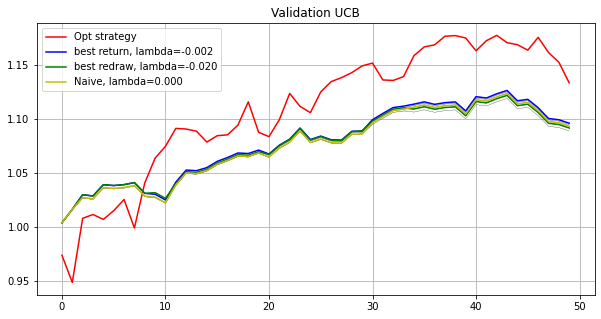

Testing...
./tmp2/res_phase11_iter8000_subn100_lb5.npz
UCB strategy
lambda: -0.020   Total log return: 0.00655404    Max redraw: 0.03963933
lambda: -0.018   Total log return: 0.00334525    Max redraw: 0.04059558
lambda: -0.016   Total log return: 0.00335113    Max redraw: 0.04059558
lambda: -0.014   Total log return: 0.00373069    Max redraw: 0.04059558
lambda: -0.012   Total log return: 0.00750634    Max redraw: 0.04059558
lambda: -0.010   Total log return: 0.00599503    Max redraw: 0.04059558
lambda: -0.008   Total log return: 0.00500325    Max redraw: 0.04059558
lambda: -0.006   Total log return: 0.00408816    Max redraw: 0.04059558
lambda: -0.004   Total log return: 0.00354523    Max redraw: 0.04059558
lambda: -0.002   Total log return: 0.00347971    Max redraw: 0.04059558
lambda: -0.000   Total log return: 0.00521187    Max redraw: 0.04059558
lambda: 0.002   Total log return: 0.00314349    Max redraw: 0.04059558
lambda: 0.004   Total log return: 0.00588208    Max redraw: 0.0408738

[0.0114 0.0071 0.0144 0.     0.0059 0.0124 0.0073 0.0073 0.0076 0.0065
 0.0055 0.0103 0.0109 0.0021 0.0081 0.0071 0.0212 0.     0.0118 0.0026
 0.0188 0.0096 0.01   0.0154 0.0051 0.0047 0.0144 0.0133 0.016  0.0123
 0.0081 0.0064 0.0028 0.0076 0.0153 0.0151 0.0035 0.0037 0.0102 0.0076
 0.0109 0.0074 0.0067 0.0058 0.0109 0.0139 0.0103 0.0079 0.0048 0.0028
 0.0192 0.0068 0.0097 0.0134 0.0161 0.0088 0.006  0.0223 0.006  0.0041
 0.0122 0.0249 0.0084 0.0141 0.0048 0.0271 0.0116 0.0097 0.0109 0.0048
 0.0015 0.0147 0.0098 0.017  0.0093 0.0077 0.0062 0.0049 0.0105 0.0169
 0.0189 0.0096 0.0111 0.0101 0.0256 0.0043 0.0057 0.009  0.013  0.0069
 0.0083 0.0069 0.0103 0.0138 0.0098 0.0186 0.0032 0.0123 0.0111 0.0113]
0.09990027778899219
[0.0114 0.0071 0.0144 0.     0.0059 0.0124 0.0073 0.0073 0.0076 0.0065
 0.0055 0.0103 0.0109 0.0021 0.0081 0.0071 0.0212 0.     0.0118 0.0026
 0.0188 0.0096 0.01   0.0154 0.0051 0.0047 0.0144 0.0133 0.016  0.0123
 0.0081 0.0064 0.0028 0.0076 0.0153 0.0151 0.0035 0.0037

[ 0.0136  0.0027  0.0158  0.      0.0037  0.0139  0.0046  0.0069  0.0063
  0.0049  0.      0.0082  0.0093 -0.      0.0055  0.0055  0.026   0.
  0.0116  0.0033  0.0237  0.0121  0.0118  0.0167  0.0035  0.0003  0.0178
  0.0137  0.0194  0.0125  0.0073  0.0035 -0.      0.0092  0.0137  0.0175
  0.      0.0044  0.0099  0.0067  0.012   0.0065  0.0035  0.0038  0.0139
  0.0167  0.0126  0.0106  0.0017  0.0053  0.0209  0.0066  0.0106  0.0163
  0.0126  0.0106  0.0051  0.0205  0.0065  0.      0.0084  0.0311  0.0083
  0.0139  0.0067  0.035   0.0159  0.0092  0.0086  0.0079 -0.      0.015
  0.0079  0.0173  0.0089  0.0068  0.0028  0.0056  0.0076  0.0179  0.0212
  0.0107  0.0079  0.0057  0.0332  0.0024  0.      0.0089  0.0114  0.0099
  0.0088  0.0053  0.0121  0.0122  0.01    0.0202  0.0035  0.0143  0.015
  0.0111]
0.000260315999586815
[ 0.0136  0.0027  0.0158  0.      0.0037  0.0139  0.0046  0.0069  0.0063
  0.0049  0.      0.0082  0.0093 -0.      0.0055  0.0055  0.0261 -0.
  0.0116  0.0033  0.0237  0.01

[ 0.0103  0.0004  0.0163  0.      0.0027  0.0164  0.0039  0.0067  0.0058
  0.0042  0.      0.0071  0.0088 -0.      0.006   0.0046  0.028   0.
  0.0121  0.0021  0.0256  0.0133  0.0129  0.0173  0.0026  0.      0.0189
  0.0144  0.0207  0.0131  0.0069  0.0018  0.      0.0095  0.0142  0.0196
  0.001   0.003   0.0096  0.006   0.0109  0.006   0.0022  0.0028  0.0141
  0.0177  0.0152  0.0133  0.0013  0.0056  0.023   0.0068  0.0097  0.018
  0.0121  0.0112  0.0048  0.0191  0.0066 -0.      0.0074  0.0319  0.0086
  0.0136  0.0035  0.0369  0.0174  0.0103  0.0061  0.0064  0.0012  0.0148
  0.0071  0.0167  0.0094  0.0063  0.003   0.0078  0.0054  0.0178  0.0207
  0.0098  0.0059  0.0064  0.0336  0.0014  0.0001  0.0079  0.0129  0.0106
  0.0089  0.005   0.0119  0.0137  0.0102  0.021   0.0013  0.0149  0.0149
  0.0106]
0.00014809687588180487
[ 0.0103  0.0004  0.0163  0.      0.0027  0.0164  0.0039  0.0067  0.0058
  0.0042  0.      0.0071  0.0088  0.      0.006   0.0046  0.0281  0.
  0.0121  0.0021  0.0256  0

[ 0.0103  0.0004  0.0163 -0.      0.0027  0.0164  0.0039  0.0067  0.0058
  0.0042  0.      0.0071  0.0088  0.      0.006   0.0046  0.028   0.
  0.0121  0.0021  0.0256  0.0133  0.0129  0.0173  0.0026  0.      0.0189
  0.0144  0.0207  0.0131  0.0069  0.0018  0.      0.0095  0.0142  0.0196
  0.001   0.003   0.0096  0.006   0.0109  0.006   0.0022  0.0028  0.0141
  0.0177  0.0152  0.0133  0.0013  0.0056  0.0229  0.0068  0.0097  0.018
  0.0121  0.0112  0.0048  0.0191  0.0066  0.      0.0074  0.0319  0.0086
  0.0136  0.0035  0.037   0.0174  0.0103  0.0061  0.0064  0.0012  0.0148
  0.0071  0.0167  0.0094  0.0063  0.003   0.0078  0.0054  0.0178  0.0207
  0.0099  0.0059  0.0064  0.0336  0.0014  0.0001  0.0079  0.0129  0.0106
  0.0089  0.005   0.0119  0.0137  0.0102  0.021   0.0013  0.0149  0.0149
  0.0106]
0.0002954435276361603
[ 0.015   0.      0.0168 -0.      0.0015  0.0195  0.0031  0.006   0.0051
  0.0034  0.0029  0.0064  0.0083  0.      0.0042  0.0042  0.0278  0.0068
  0.0119  0.      0.0237

[ 0.015   0.0001  0.0168 -0.      0.0015  0.0195  0.0031  0.006   0.0051
  0.0034  0.0029  0.0064  0.0083 -0.      0.0042  0.0042  0.0278  0.0068
  0.0119  0.      0.0237  0.0154  0.0121  0.0152  0.0007 -0.      0.0226
  0.0146  0.0218  0.0148  0.0061  0.0016  0.0004  0.0072  0.0163  0.0221
  0.0033  0.0016  0.0074  0.0056  0.0108  0.0055  0.0024  0.0015  0.0117
  0.0163  0.0143  0.0149  0.      0.007   0.0268  0.0078  0.0098  0.0172
  0.0128  0.0109  0.0047  0.0189  0.0067  0.0012  0.0058  0.0319  0.0083
  0.0128  0.0053  0.0386  0.0183  0.0083  0.0053  0.0035  0.0022  0.0185
  0.0069  0.0164  0.01    0.0047  0.0029  0.004   0.0044  0.0195  0.0214
  0.0042  0.0046  0.0068  0.0319  0.0021 -0.      0.0077  0.012   0.0141
  0.008   0.0035  0.0102  0.0136  0.0103  0.0234  0.0013  0.0138  0.0154
  0.0116]
0.00018846852665273302
[ 0.015   0.0001  0.0168 -0.      0.0015  0.0195  0.0031  0.006   0.0051
  0.0034  0.0029  0.0064  0.0083 -0.      0.0042  0.0042  0.0278  0.0068
  0.0119  0.      

[ 0.0004 -0.      0.0185  0.     -0.      0.0252  0.0013  0.0069  0.0048
  0.002   0.      0.006   0.0067  0.     -0.      0.0038  0.0247  0.0065
  0.0126  0.0016  0.021   0.0176  0.0126  0.0146 -0.     -0.      0.0268
  0.0156  0.0249  0.0173  0.0054  0.0024 -0.      0.009   0.0165  0.0256
  0.0062 -0.      0.0056  0.0038  0.0122  0.0044 -0.      0.      0.0083
  0.0178  0.0175  0.0169 -0.      0.0083  0.0289  0.0045  0.0049  0.0208
  0.0162  0.0129  0.0046  0.0186  0.0081 -0.      0.0067  0.0319  0.0072
  0.017   0.0092  0.0389  0.0215  0.0077 -0.      0.0004  0.0007  0.0154
  0.0084  0.0138  0.0098  0.005  -0.     -0.      0.0026  0.0227  0.0272
  0.0049  0.0015  0.0052  0.033   0.0008  0.      0.008   0.0159  0.0115
  0.0092  0.0026  0.0112  0.0146  0.0099  0.0233  0.0056  0.0173  0.017
  0.0116]
0.18379805170092933
[ 0.0004 -0.      0.0185  0.     -0.      0.0252  0.0013  0.0069  0.0047
  0.002  -0.      0.006   0.0067  0.     -0.      0.0038  0.0247  0.0065
  0.0126  0.0016  0.02

[ 0.0004  0.      0.0185  0.      0.      0.0252  0.0013  0.0069  0.0048
  0.002  -0.      0.006   0.0067 -0.      0.      0.0038  0.0247  0.0065
  0.0126  0.0017  0.0209  0.0176  0.0126  0.0146  0.     -0.      0.0269
  0.0156  0.0249  0.0173  0.0054  0.0024  0.      0.009   0.0166  0.0256
  0.0062  0.      0.0056  0.0038  0.0122  0.0044 -0.     -0.      0.0084
  0.0178  0.0175  0.0169 -0.      0.0083  0.0289  0.0045  0.0049  0.0208
  0.0162  0.0129  0.0046  0.0186  0.008   0.      0.0066  0.0319  0.0072
  0.017   0.0092  0.0389  0.0215  0.0077 -0.      0.0004  0.0007  0.0154
  0.0085  0.0138  0.0098  0.0049  0.      0.      0.0026  0.0227  0.0272
  0.0049  0.0015  0.0052  0.033   0.0007  0.      0.008   0.0159  0.0115
  0.0092  0.0027  0.0111  0.0146  0.0099  0.0233  0.0056  0.0173  0.017
  0.0116]
0.00023899668734593128
[ 0.0003  0.      0.0185  0.      0.      0.0252  0.0013  0.0069  0.0047
  0.002   0.      0.006   0.0066  0.      0.      0.0038  0.0247  0.0065
  0.0126  0.0017  0

[ 0.0019 -0.      0.0199  0.      0.      0.0273  0.0013  0.0071  0.0045
  0.0016 -0.      0.0061  0.0072 -0.     -0.      0.0033  0.0248  0.0023
  0.0136  0.0004  0.0207  0.0183  0.0117  0.0142 -0.     -0.      0.0273
  0.0157  0.0257  0.0172  0.0051  0.0025 -0.      0.0086  0.0169  0.0258
  0.0068 -0.      0.0066  0.004   0.0131  0.004   0.     -0.      0.0076
  0.0177  0.0175  0.018  -0.      0.0094  0.0304  0.0036  0.0039  0.0212
  0.0152  0.0131  0.0043  0.0184  0.0083 -0.      0.0057  0.0329  0.0071
  0.0166  0.0082  0.0403  0.0232  0.0059  0.0007  0.0013  0.      0.0169
  0.0086  0.0132  0.0095  0.0055  0.0004 -0.      0.0018  0.0233  0.0266
  0.0042  0.0003  0.005   0.0318  0.0014 -0.      0.0074  0.0163  0.0109
  0.0088  0.0023  0.011   0.0138  0.0097  0.0233  0.0048  0.018   0.0174
  0.0113]
0.00016566721267358985
[ 0.0019  0.      0.0199 -0.      0.      0.0273  0.0013  0.0071  0.0045
  0.0016  0.      0.0061  0.0072  0.      0.      0.0033  0.0248  0.0023
  0.0136  0.0004  

[ 0.0027  0.      0.0204 -0.      0.      0.0273  0.0009  0.0075  0.0042
  0.0012  0.      0.006   0.0065  0.0002 -0.      0.0031  0.0247 -0.
  0.0146  0.0007  0.0217  0.0188  0.0115  0.0136  0.      0.      0.0288
  0.0157  0.0265  0.0174  0.0049  0.0012  0.      0.0069  0.0179  0.026
  0.0073  0.0008  0.0064  0.0043  0.0128  0.0041 -0.     -0.      0.0069
  0.0166  0.0177  0.0176 -0.      0.0099  0.0304  0.0026  0.0047  0.0219
  0.0144  0.0135  0.004   0.0184  0.0083  0.0002  0.0044  0.0327  0.0069
  0.0174  0.0064  0.0405  0.024   0.005   0.0019  0.0015 -0.      0.0177
  0.0072  0.013   0.01    0.0055  0.0001  0.      0.0009  0.0244  0.0267
  0.0037  0.0013  0.0058  0.031   0.0007  0.0001  0.0072  0.0162  0.0103
  0.0084  0.0015  0.0112  0.0141  0.0099  0.024   0.0059  0.0175  0.019
  0.0124]
6.814333240924618e-05
[ 0.0027  0.      0.0204  0.      0.      0.0273  0.0009  0.0075  0.0042
  0.0012  0.      0.006   0.0065  0.0002 -0.      0.0031  0.0247  0.
  0.0146  0.0007  0.0217  0.0

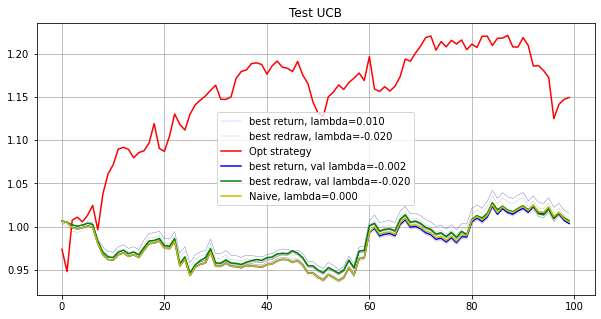

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.80599514
Mean return: 1.00073916
best return strategy
Total return: 1.91440952
Mean return: 1.00081209
best redraw strategy
Total return: 1.86537551
Mean return: 1.00077963
Naive strategy
Total return: 1.92961887
Mean return: 1.00082199


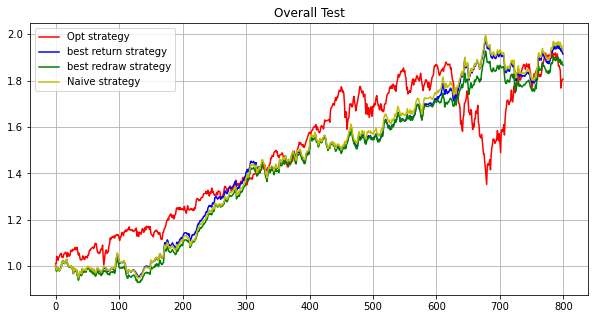

In [13]:
lb = 5
maxiter = 8000
subn = 100
path ='./tmp2/res_phase%02d_iter%d_subn%d_lb%d.npz'
eps = 1.001
delta = 0.008
run(path, maxiter, subn, lb, c=0.001, eps=eps, delta=delta, testv=np.arange(-0.02, 0.0100001, 0.002))